<a href="https://colab.research.google.com/github/farzadmohseni-ir/breast-cancer-diagnostic-analysis/blob/main/datamining_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🧪 Data Mining Assignment 02

## 📌 Breast Cancer Wisconsin (Diagnostic) Analysis

---

## 🎓 Course Information

* 📘 **Course:** Data Mining: Models, Algorithms, and Applications
* 👨‍🏫 **Instructor:** Dr. Ahmadi
* 🏫 **University:** Amirkabir University of Technology (Tehran Polytechnic)


---

# 📌 Problem Description

The **Breast Cancer Wisconsin** dataset from the **UCI Machine Learning Repository** is used for this project.

* Features are computed from digitized images of fine needle aspirates (FNA) of breast masses.
* They describe characteristics of the **cell nuclei** present in the images.
* The target variable is **Diagnosis**: Malignant (M) or Benign (B).

🔗 **Dataset Link:**
[Breast Cancer Wisconsin (Diagnostic) Dataset](https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic)

---

# 🧩 Assignment Tasks

## 🔧 (A) Data Preparation

* Prepare the data if necessary.
* Handle missing values and noise (**no missing values in this dataset**).
* Standardize the data using the **Min-Max method**.



## 📊 (B) Data Splitting and Confusion Matrix

* Split the data using the **Perceptron method**: 75% for training, 25% for testing.
* Construct the **confusion matrix** and explain the results.



## 🧠 (C) Modeling and Evaluation

* Apply the following methods:

  * **K-Nearest Neighbors (KNN)**
  * **Perceptron**
  * **Multi-Layer Neural Network (Radial Basis Function)**
  * **Support Vector Machines (SVM)**
* Use **five-fold cross-validation** and evaluate with the following metrics:

  * **Accuracy**
  * **Sensitivity**
  * **Specificity**
  * **AUC (Area Under the Curve)**
* Determine which method performs best and explain why.



## 🌳 (D) Decision Tree and Feature Selection

* Solve part (C) again using a **Decision Tree**.
* Draw the developed tree and extract the rules.
* Use **Forward Selection** to identify the best combination of features.

---

# 📊 Dataset Overview

* 📦 **Total Records:** 569
* 📦 **Total Columns:** 32 (ID + Target + 30 features)
* 🆔 **ID Column:** Unique identifier (not used as a feature)
* 📥 **Input Features:** 30 (all continuous)
* 🎯 **Target Variable:** `Diagnosis` (M / B)
* ⚠️ **Missing Values:** None

---

# 🧾 Feature Names and Descriptions

| No.  | Attribute                  | Type        | Description                                                                                                                                                                | Units | Missing Values |
| ---- | -------------------------- | ----------- | -------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ----- | -------------- |
| 0    | ID                         | Categorical | Record ID                                                                                                                                                                  | -     | No             |
| 1    | Diagnosis                  | Target      | Malignant / Benign                                                                                                                                                         | -     | No             |
| 2-31 | radius1…fractal_dimension3 | Continuous  | Ten real-valued features computed for each cell nucleus: radius, texture, perimeter, area, smoothness, compactness, concavity, concave points, symmetry, fractal dimension | -     | No             |

---


In [1]:
# ===============================
# BOX 0
# ===============================

# -------------------------------
# Standard Libraries
# -------------------------------
import os
import warnings
from itertools import product

warnings.filterwarnings("ignore")

# -------------------------------
# Data Handling
# -------------------------------
import numpy as np
import pandas as pd

# -------------------------------
# Visualization
# -------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# -------------------------------
# Scikit-learn: Preprocessing & Model Selection
# -------------------------------
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import MinMaxScaler

# -------------------------------
# Scikit-learn: Metrics
# -------------------------------
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    roc_curve,
    pairwise_distances
)

# -------------------------------
# Scikit-learn: Classification Models
# -------------------------------
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.neural_network import MLPClassifier

# -------------------------------
# Scikit-learn: Clustering
# -------------------------------
from sklearn.cluster import KMeans

# -------------------------------
# Exceptions
# -------------------------------
from sklearn.exceptions import ConvergenceWarning

# ===============================
# Required for Decision Tree internals
# ===============================
from sklearn.tree import _tree

In [2]:
# ============================================================
# BOX 1 — Load Wisconsin Breast Cancer Diagnostic dataset from Google Drive into Colab
# ============================================================

# Install gdown if missing
try:
    import gdown
except ImportError:
    import subprocess
    subprocess.run(["pip", "install", "-q", "gdown"], check=True)
    import gdown

# Configuration for WBCD dataset
FILE_ID = "1ht4cZTVtPsW0sNu-U4A41w_Dc4hNk4Gq"
OUTPUT_FILE = "wdbc.csv"
DOWNLOAD_URL = f"https://drive.google.com/uc?id={FILE_ID}"

# Download dataset (skip if already exists)
if not os.path.exists(OUTPUT_FILE):
    print("Downloading dataset...")
    gdown.download(DOWNLOAD_URL, OUTPUT_FILE, quiet=False)
else:
    print("File already exists. Skipping download.")

# Validate download
if not os.path.exists(OUTPUT_FILE):
    raise FileNotFoundError(f"Download failed: '{OUTPUT_FILE}' not found.")

# Load dataset into pandas DataFrame
df = pd.read_csv(OUTPUT_FILE)

# Remove any extra unnamed columns (common in CSV exports)
extra_cols = [col for col in df.columns if 'Unnamed' in col]
if extra_cols:
    df = df.drop(columns=extra_cols)
    print(f"Dropped extra columns: {extra_cols}")

# Basic sanity checks
print("Dataset loaded successfully")
print(f"Number of records (rows): {df.shape[0]}")
print(f"Number of columns (ID + Diagnosis + Features): {df.shape[1]}")
print("First 5 rows of dataset:")
df.head()

File already exists. Skipping download.
Dropped extra columns: ['Unnamed: 32']
Dataset loaded successfully
Number of records (rows): 569
Number of columns (ID + Diagnosis + Features): 32
First 5 rows of dataset:


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
# ============================================================
# BOX 2 — Inspect dataset shape
# ============================================================

n_rows, n_cols = df.shape

print(f"Number of samples (rows): {n_rows}")
print(f"Number of features (columns): {n_cols}")

Number of samples (rows): 569
Number of features (columns): 32


In [4]:
# ============================================================
# BOX 3 — Inspect column names
# ============================================================

print("Column names:")
print(df.columns.tolist())

Column names:
['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [5]:
# ============================================================
# BOX 4 — Inspect data types and missing structure
# ============================================================

print("=== DataFrame Info ===")
df.info()

=== DataFrame Info ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  per

In [6]:
# ============================================================
# BOX 5 — Remove ID column
# ============================================================

# Drop 'id' column if it exists
if 'id' in df.columns:
    df = df.drop(columns=['id'])
    print("Column 'id' removed successfully.")
else:
    print("Column 'id' not found.")

# Verify updated columns
print("\nRemaining columns:")
print(df.columns.tolist())

Column 'id' removed successfully.

Remaining columns:
['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [7]:
# ============================================================
# BOX 6 — Detect and remove duplicate rows
# ============================================================

# Count duplicate rows
duplicate_mask = df.duplicated(keep='first')
duplicate_count = int(duplicate_mask.sum())

print(f"Number of duplicate rows before removal: {duplicate_count}")

# Optional: Inspect duplicates (for analysis/reporting)
if duplicate_count > 0:
    print("\nSample duplicate rows:")
    display(df[duplicate_mask].head())

# Remove duplicates
if duplicate_count > 0:
    df = df.drop_duplicates(keep='first').reset_index(drop=True)
    print("\nDuplicate rows removed successfully.")
else:
    print("\nNo duplicate rows found.")

# Final verification
print(f"\nDataset shape after duplicate removal: {df.shape}")

# Sanity check
assert df.duplicated().sum() == 0, "Duplicates still exist!"

Number of duplicate rows before removal: 0

No duplicate rows found.

Dataset shape after duplicate removal: (569, 31)


In [8]:
# ============================================================
# BOX 7 — Encode target column 'diagnosis' (Benign=0, Malignant=1)
# ============================================================

# In-place encoding of the target
df['diagnosis'] = df['diagnosis'].map({'B': 0, 'M': 1})

# Verify encoding
print("Encoding complete. Unique values in 'diagnosis':", df['diagnosis'].unique())

Encoding complete. Unique values in 'diagnosis': [1 0]


In [9]:
# ============================================================
# BOX 8 — Class Distribution (Benign vs Malignant)
#   - Show class counts and percentages (diagnosis column)
# ============================================================

# Ensure diagnosis is numeric (0=Benign, 1=Malignant)
# Already encoded in previous step

# Counts
counts = df['diagnosis'].value_counts().sort_index()
print("Class counts (0=Benign, 1=Malignant):")
print(counts)

# Percentages
percent = (df['diagnosis'].value_counts(normalize=True) * 100).sort_index()
print("\nClass percentage (%):")
print(percent.round(2))

Class counts (0=Benign, 1=Malignant):
diagnosis
0    357
1    212
Name: count, dtype: int64

Class percentage (%):
diagnosis
0    62.74
1    37.26
Name: proportion, dtype: float64


In [10]:
# ============================================================
# BOX 9 — Descriptive Statistics
#   - Summary statistics for numerical features
# ============================================================

# Descriptive statistics
desc = df.describe().T.round(3)

print("=== Descriptive Statistics (Numeric Features) ===")
display(desc)

=== Descriptive Statistics (Numeric Features) ===


,count,mean,std,min,25%,50%,75%,max
diagnosis,569.0,0.373,0.484,0.000,0.000,0.000,1.000,1.000
radius_mean,569.0,14.127,3.524,6.981,11.700,13.370,15.780,28.110
texture_mean,569.0,19.290,4.301,9.710,16.170,18.840,21.800,39.280
perimeter_mean,569.0,91.969,24.299,43.790,75.170,86.240,104.100,188.500
area_mean,569.0,654.889,351.914,143.500,420.300,551.100,782.700,2501.000
smoothness_mean,569.0,0.096,0.014,0.053,0.086,0.096,0.105,0.163
compactness_mean,569.0,0.104,0.053,0.019,0.065,0.093,0.130,0.345
concavity_mean,569.0,0.089,0.080,0.000,0.030,0.062,0.131,0.427
concave points_mean,569.0,0.049,0.039,0.000,0.020,0.034,0.074,0.201
symmetry_mean,569.0,0.181,0.027,0.106,0.162,0.179,0.196,0.304


In [11]:
# ============================================================
# BOX 10 — Comprehensive missing value detection (robust)
#   - Detect ALL types of missing/invalid values
#   - Report count and percentage per column
# ============================================================

# Create a safe copy of the dataset
df_check = df.copy()

# Standardize any remaining invalid text-like entries to NaN
df_check = df_check.replace(
    ["", " ", "  ", "\t", "nan", "NaN", "none", "None"],
    np.nan
)

# Compute missing counts per column
missing_count = df_check.isnull().sum()

# Total number of rows
total_rows = len(df_check)

# Compute missing percentage
missing_percent = ((missing_count / total_rows) * 100).round(2)

# Build report DataFrame
missing_report = pd.DataFrame({
    "missing_count": missing_count,
    "missing_percent (%)": missing_percent
}).sort_values(by="missing_count", ascending=False)

# Display report
print("Missing Values Report (per column):")
display(missing_report)

Missing Values Report (per column):


,missing_count,missing_percent (%)
diagnosis,0,0.0
radius_mean,0,0.0
texture_mean,0,0.0
perimeter_mean,0,0.0
area_mean,0,0.0
smoothness_mean,0,0.0
compactness_mean,0,0.0
concavity_mean,0,0.0
concave points_mean,0,0.0
symmetry_mean,0,0.0


In [12]:
# ============================================================
# BOX 11 — Count Complete vs Incomplete Records
# Purpose:
#   - Identify rows with missing values
#   - Count complete and incomplete records
# ============================================================

# Total number of rows
total_rows = len(df)

# Count rows with at least one missing value
incomplete_rows = df.isnull().any(axis=1).sum()

# Count rows with no missing values
complete_rows = total_rows - incomplete_rows

# Print results
print(f"Total rows        : {total_rows}")
print(f"Complete rows     : {complete_rows}")
print(f"Incomplete rows   : {incomplete_rows}")

# Sanity check
assert total_rows == complete_rows + incomplete_rows, "Row count mismatch!"
print("\nSanity check passed: Total rows = Complete + Incomplete")

Total rows        : 569
Complete rows     : 569
Incomplete rows   : 0

Sanity check passed: Total rows = Complete + Incomplete


In [13]:
print("=== DataFrame Info ===")
df.info()

=== DataFrame Info ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  are

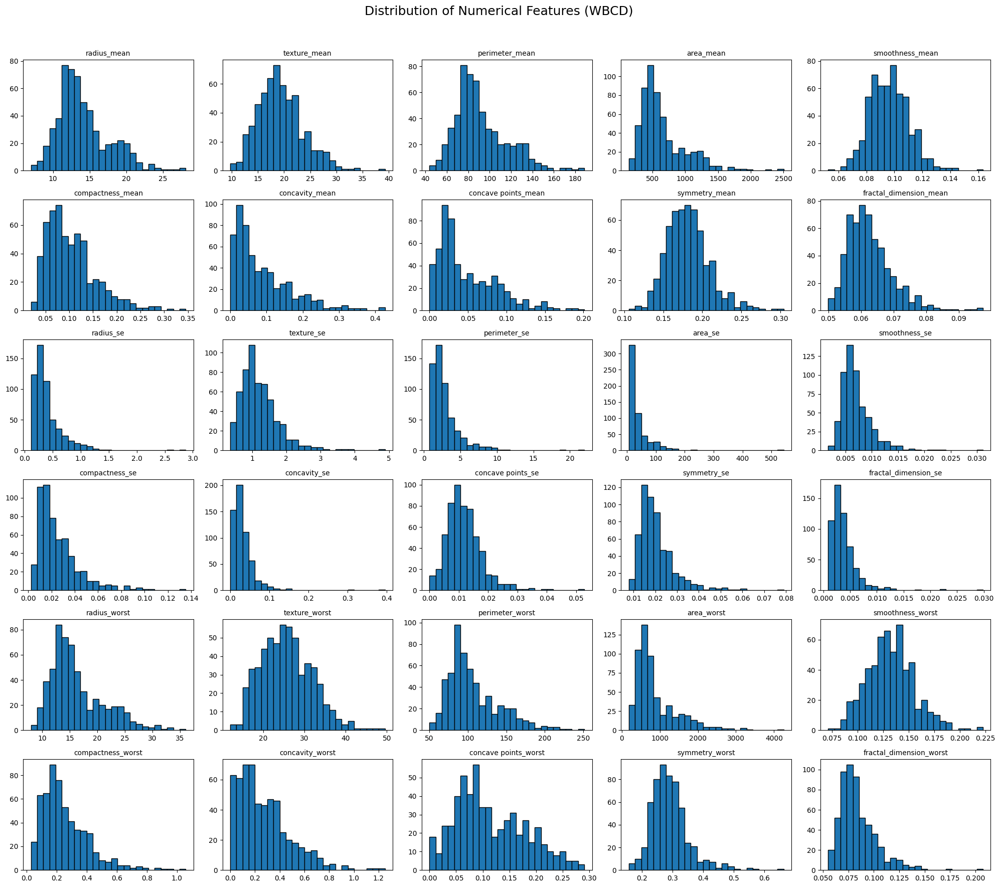

In [14]:
# ============================================================
# BOX 12 — Histogram Analysis of All Numerical Features (WBCD)
#   - Visualize the distribution of all 30 numeric features
#   - Examine spread, skewness, and overall shape
#   - Exclude target column 'diagnosis'
#   - Non-destructive: original dataframe is not modified
# ============================================================


# ------------------------------------------------------------
# Step 1 — Select numerical features only
# ------------------------------------------------------------
numeric_cols = df.select_dtypes(include=np.number).columns

# Exclude target column 'diagnosis'
feature_cols = [col for col in numeric_cols if col != 'diagnosis']

# ------------------------------------------------------------
# Step 2 — Determine grid layout for 30 features
# ------------------------------------------------------------
num_features = len(feature_cols)
n_cols = 5                     # number of columns in the grid
n_rows = int(np.ceil(num_features / n_cols))  # calculate required rows

# ------------------------------------------------------------
# Step 3 — Create figure with proper spacing
# ------------------------------------------------------------
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows*3))
axes = axes.flatten()  # flatten in case of multi-row grid

# Plot histograms
for i, col in enumerate(feature_cols):
    axes[i].hist(df[col], bins=25, edgecolor='black')
    axes[i].set_title(col, fontsize=10)
    axes[i].grid(False)

# Remove any empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# ------------------------------------------------------------
# Step 4 — Adjust layout for readability
# ------------------------------------------------------------
plt.suptitle("Distribution of Numerical Features (WBCD)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle
plt.show()

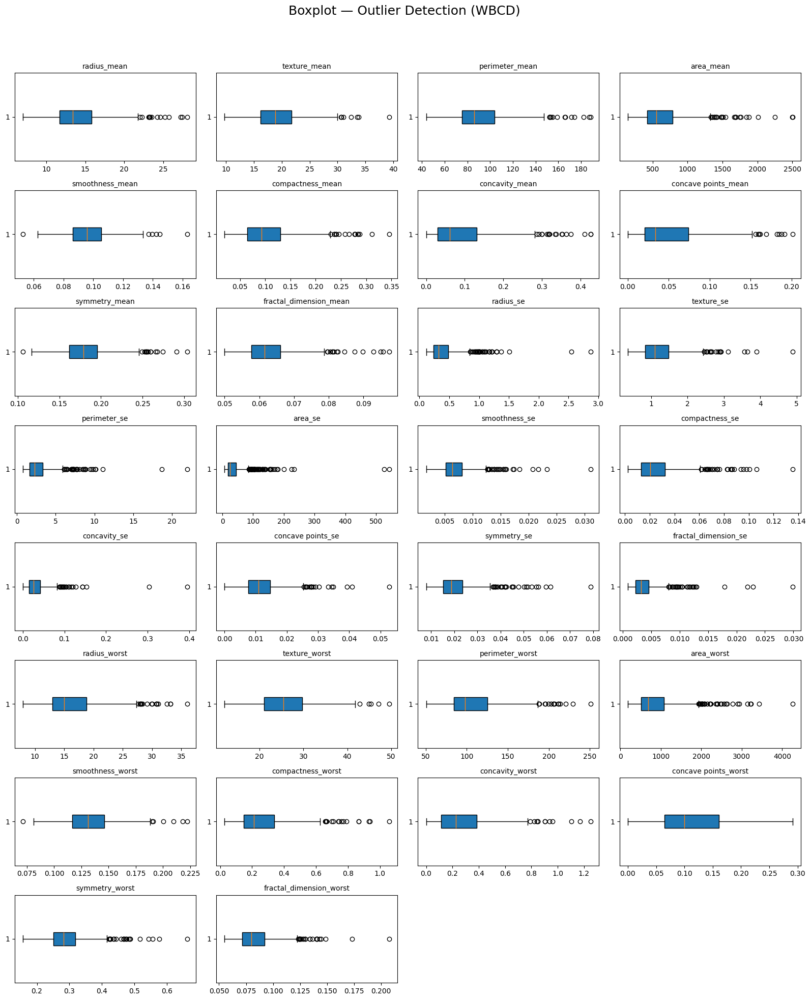

In [15]:
# ============================================================
# BOX 13 — Boxplot Analysis for Outlier Detection (WBCD)
#   - Visualize potential outliers in numerical features
#   - Support imputation strategy selection (e.g., mean vs median)
#   - Exclude target column 'diagnosis'
#   - Non-destructive: original dataframe is not modified
# ============================================================


# ------------------------------------------------------------
# Step 1 — Select numerical features only
# ------------------------------------------------------------
numeric_cols = df.select_dtypes(include=np.number).columns

# Exclude target column 'diagnosis'
feature_cols = [col for col in numeric_cols if col != 'diagnosis']

# ------------------------------------------------------------
# Step 2 — Define subplot grid size
# ------------------------------------------------------------
n_cols = 4
n_rows = int(np.ceil(len(feature_cols) / n_cols))

# ------------------------------------------------------------
# Step 3 — Create subplot canvas
# ------------------------------------------------------------
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*2.5))
axes = np.array(axes).reshape(-1)  # flatten for iteration

# ------------------------------------------------------------
# Step 4 — Plot one boxplot per feature
# ------------------------------------------------------------
for i, col in enumerate(feature_cols):
    feature_data = df[col].dropna()

    axes[i].boxplot(
        feature_data,
        vert=False,
        patch_artist=True
    )
    axes[i].set_title(col, fontsize=10)
    axes[i].grid(False)

# ------------------------------------------------------------
# Step 5 — Remove unused subplot axes
# ------------------------------------------------------------
for j in range(len(feature_cols), len(axes)):
    fig.delaxes(axes[j])

# ------------------------------------------------------------
# Step 6 — Adjust figure layout
# ------------------------------------------------------------
plt.suptitle("Boxplot — Outlier Detection (WBCD)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

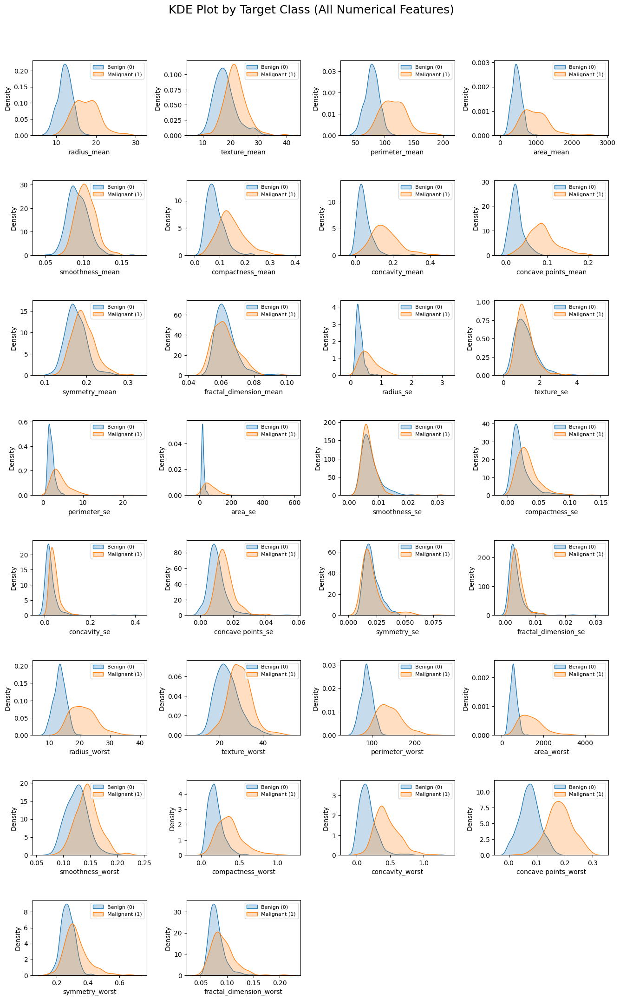

In [16]:
# ============================================================
# BOX 14 — KDE Plot by Target Class (WBCD)
#   - Compare the distribution of all numerical features across
#     the two target classes
#   - Show every numerical feature except the target itself
#   - Fall back to vertical reference lines when KDE is not
#     meaningful due to low variance
#   - Target 'diagnosis' is already encoded:
#         0 = Benign
#         1 = Malignant
#   - Non-destructive: original dataframe is not modified
# ============================================================

# ------------------------------------------------------------
# Step 1 — Define target column
# ------------------------------------------------------------
target_col = "diagnosis"

# ------------------------------------------------------------
# Step 2 — Select all numerical features except the target
# ------------------------------------------------------------
numeric_cols = [
    col for col in df.select_dtypes(include=np.number).columns
    if col != target_col
]

# ------------------------------------------------------------
# Step 3 — Define subplot grid size
# ------------------------------------------------------------
n_cols = 4
n_rows = int(np.ceil(len(numeric_cols) / n_cols))

# ------------------------------------------------------------
# Step 4 — Create subplot canvas
# ------------------------------------------------------------
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*3))
axes = np.array(axes).reshape(-1)

# ------------------------------------------------------------
# Step 5 — Plot each feature
# ------------------------------------------------------------
for i, col in enumerate(numeric_cols):
    ax = axes[i]

    data_0 = df.loc[df[target_col] == 0, col].dropna()
    data_1 = df.loc[df[target_col] == 1, col].dropna()

    var_0_ok = data_0.nunique() > 1
    var_1_ok = data_1.nunique() > 1

    # Case 1: both classes have enough variation for KDE
    if var_0_ok and var_1_ok:
        sns.kdeplot(
            x=data_0,
            fill=True,
            warn_singular=False,
            ax=ax,
            label="Benign (0)"
        )
        sns.kdeplot(
            x=data_1,
            fill=True,
            warn_singular=False,
            ax=ax,
            label="Malignant (1)"
        )
    # Case 2: one or both classes have low variance
    else:
        if len(data_0) > 0:
            ax.axvline(
                data_0.iloc[0] if data_0.nunique() == 1 else data_0.mean(),
                linestyle="--",
                linewidth=2,
                label="Benign (0)"
            )
        if len(data_1) > 0:
            ax.axvline(
                data_1.iloc[0] if data_1.nunique() == 1 else data_1.mean(),
                linestyle="-.",
                linewidth=2,
                label="Malignant (1)"
            )
        ax.text(
            0.5, 0.85,
            "Low variance\nKDE not informative",
            transform=ax.transAxes,
            ha="center",
            va="center",
            fontsize=8
        )

    ax.grid(False)
    ax.legend(fontsize=8)

# ------------------------------------------------------------
# Step 6 — Remove unused subplot axes
# ------------------------------------------------------------
for j in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[j])

# ------------------------------------------------------------
# Step 7 — Adjust layout
# ------------------------------------------------------------
plt.suptitle("KDE Plot by Target Class (All Numerical Features)", fontsize=18)
plt.subplots_adjust(top=0.93, hspace=0.6, wspace=0.35)

plt.show()

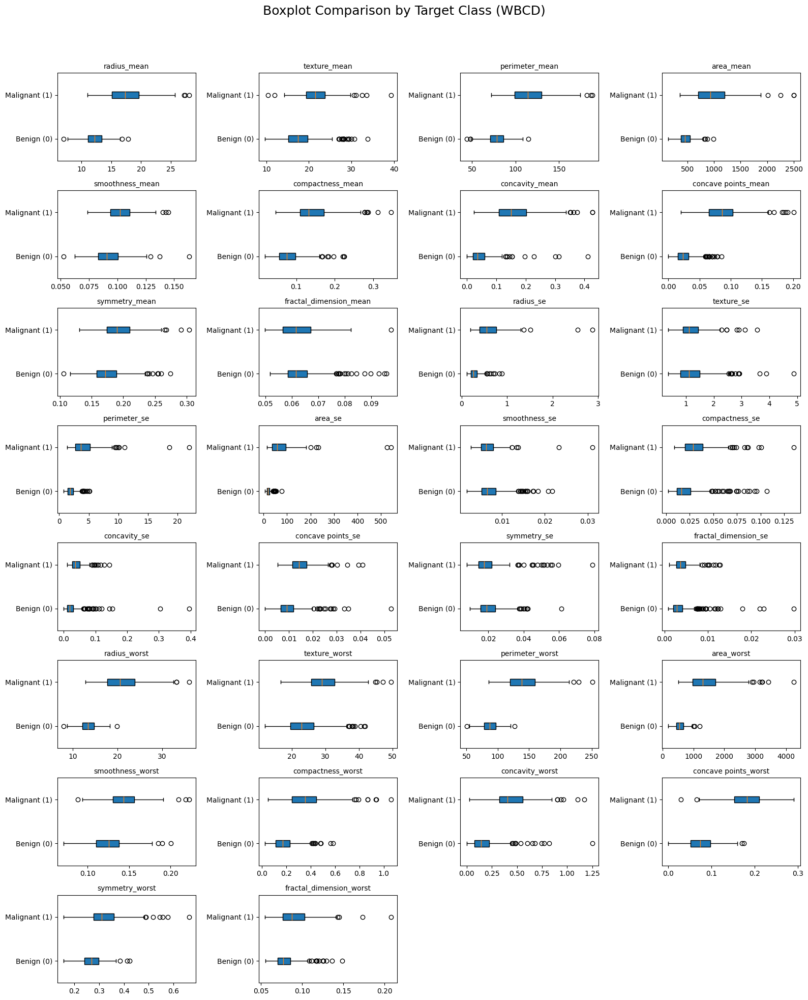

In [17]:
# ============================================================
# BOX 15 — Boxplot Comparison by Target Class (WBCD)
#   - Compare the distribution of numerical features across
#     the two target classes
#   - Highlight differences in central tendency, spread,
#     and potential class separation
#   - Target 'diagnosis' is already encoded:
#         0 = Benign
#         1 = Malignant
#   - Non-destructive: original dataframe is not modified
# ============================================================

# ------------------------------------------------------------
# Step 1 — Define target column
# ------------------------------------------------------------
target_col = "diagnosis"

# ------------------------------------------------------------
# Step 2 — Select numerical features only
# ------------------------------------------------------------
numeric_cols = df.select_dtypes(include=np.number).columns
feature_cols = [col for col in numeric_cols if col != target_col and df[col].nunique() > 5]

# ------------------------------------------------------------
# Step 3 — Define subplot grid size
# ------------------------------------------------------------
n_cols = 4
n_rows = int(np.ceil(len(feature_cols) / n_cols))

# ------------------------------------------------------------
# Step 4 — Create subplot canvas
# ------------------------------------------------------------
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*2.5))
axes = np.array(axes).reshape(-1)

# ------------------------------------------------------------
# Step 5 — Plot one boxplot per feature by target class
# ------------------------------------------------------------
for i, col in enumerate(feature_cols):
    data_0 = df.loc[df[target_col] == 0, col].dropna()
    data_1 = df.loc[df[target_col] == 1, col].dropna()

    if len(data_0) > 0 and len(data_1) > 0:
        axes[i].boxplot(
            [data_0, data_1],
            tick_labels=["Benign (0)", "Malignant (1)"],  # <- fixed here
            vert=False,
            patch_artist=True
        )
        axes[i].set_title(col, fontsize=10)
        axes[i].grid(False)
    else:
        axes[i].set_visible(False)

# ------------------------------------------------------------
# Step 6 — Remove unused subplot axes
# ------------------------------------------------------------
for j in range(len(feature_cols), len(axes)):
    fig.delaxes(axes[j])

# ------------------------------------------------------------
# Step 7 — Adjust figure layout
# ------------------------------------------------------------
plt.suptitle("Boxplot Comparison by Target Class (WBCD)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

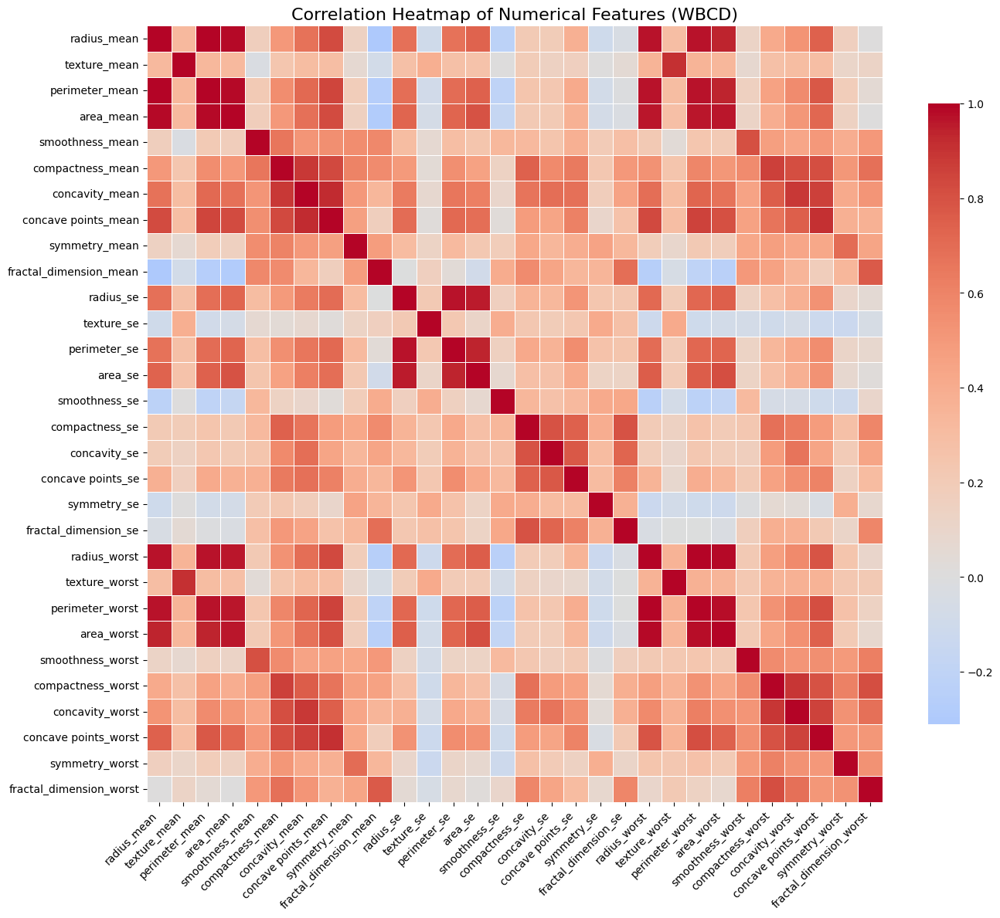

In [18]:
# ============================================================
# BOX 16 — Correlation Heatmap of Numerical Features (WBCD)
#   - Visualize pairwise linear relationships between numerical features
#   - Detect multicollinearity and redundant variables
#   - Support feature selection and dimensionality reduction
#   - Uses Pearson correlation by default
#   - Non-destructive: does NOT modify the original dataframe
# ============================================================

# ------------------------------------------------------------
# Step 1 — Select numerical features only (exclude target)
# ------------------------------------------------------------
numeric_df = df.select_dtypes(include=np.number)
numeric_df = numeric_df.drop(columns=['diagnosis'], errors='ignore')

# ------------------------------------------------------------
# Step 2 — Compute correlation matrix
# ------------------------------------------------------------
corr_matrix = numeric_df.corr()

# ------------------------------------------------------------
# Step 3 — Plot heatmap
# ------------------------------------------------------------
plt.figure(figsize=(14, 12))

sns.heatmap(
    corr_matrix,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    square=False,
    cbar_kws={"shrink": 0.8},
    annot=False  # keep clean (avoid clutter)
)

# ------------------------------------------------------------
# Step 4 — Improve readability
# ------------------------------------------------------------
plt.title("Correlation Heatmap of Numerical Features (WBCD)", fontsize=16)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

# ------------------------------------------------------------
# Step 5 — Final layout
# ------------------------------------------------------------
plt.tight_layout()
plt.show()

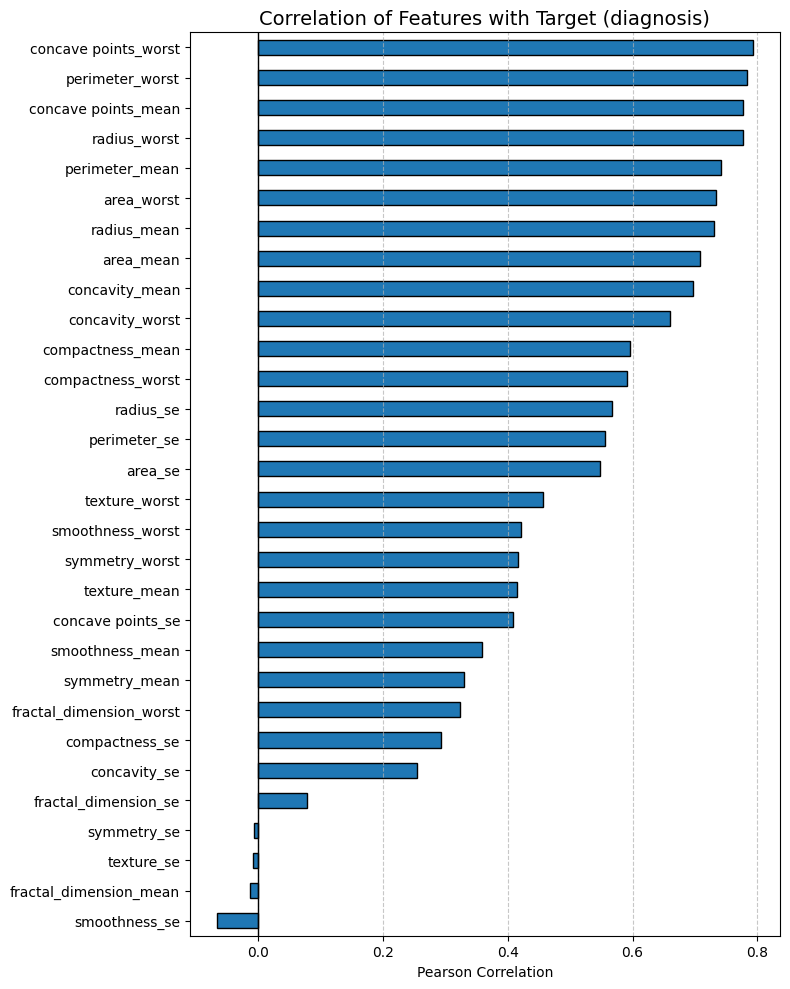

In [19]:
# ============================================================
# BOX 17 — Correlation with Target Variable (WBCD)
#   - Measure linear relationship between each numerical feature
#     and the target variable 'diagnosis'
#   - Identify potentially important features for classification
#   - Uses Pearson correlation
#   - Target must be numeric: 0 = Benign, 1 = Malignant
#   - Non-destructive: does NOT modify the original dataframe
# ============================================================


# ------------------------------------------------------------
# Step 1 — Define target column
# ------------------------------------------------------------
target_col = "diagnosis"

# ------------------------------------------------------------
# Step 2 — Compute correlation with target
# ------------------------------------------------------------
numeric_df = df.select_dtypes(include='number')

# Ensure target exists in numeric columns
if target_col not in numeric_df.columns:
    raise ValueError(f"Target column '{target_col}' must be numeric.")

corr_with_target = (
    numeric_df
    .corr()[target_col]
    .drop(target_col)
    .sort_values()
)

# ------------------------------------------------------------
# Step 3 — Plot horizontal bar chart
# ------------------------------------------------------------
plt.figure(figsize=(8, 10))

ax = corr_with_target.plot(
    kind="barh",
    edgecolor="black"
)

# ------------------------------------------------------------
# Step 4 — Styling and readability improvements
# ------------------------------------------------------------
plt.title("Correlation of Features with Target (diagnosis)", fontsize=14)
plt.xlabel("Pearson Correlation")
plt.grid(axis="x", linestyle="--", alpha=0.7)

# Highlight zero line for reference
plt.axvline(0, color='black', linewidth=1)

# ------------------------------------------------------------
# Step 5 — Final layout
# ------------------------------------------------------------
plt.tight_layout()
plt.show()

In [20]:
# ============================================================
# BOX 18 — Separate Features and Target (WBCD)
#
#   - Define input features (X) and target variable (y)
#   - Prepare the dataset for subsequent splitting and modeling
# ============================================================

# ------------------------------------------------------------
# Step 1 — Define target variable
# ------------------------------------------------------------
y = df["diagnosis"].astype(int)   # already encoded: 0 = Benign, 1 = Malignant

# ------------------------------------------------------------
# Step 2 — Define input features
# ------------------------------------------------------------
X = df.drop(columns=["diagnosis"])  # exclude target from features

# ------------------------------------------------------------
# Step 3 — Verify shapes
# ------------------------------------------------------------
print("X shape:", X.shape)
print("y shape:", y.shape)

# Optional: quick sanity check of target distribution
print("\nTarget class distribution:")
print(y.value_counts())

X shape: (569, 30)
y shape: (569,)

Target class distribution:
diagnosis
0    357
1    212
Name: count, dtype: int64


In [21]:
# ============================================================
# BOX 19 — Train / Validation / Test Split (WBCD)
#
#   - Split dataset into three disjoint subsets:
#         1) Training set   → model training
#         2) Validation set → hyperparameter tuning & feature selection
#         3) Test set       → final evaluation only
#
#   - Preserves class distribution (stratified split)
#   - No scaling/preprocessing applied yet (prevents data leakage)
# ============================================================


# ------------------------------------------------------------
# Step 0 — Set random seed for reproducibility
# ------------------------------------------------------------
RANDOM_STATE = 42

# ------------------------------------------------------------
# Step 1 — Split into temporary set (train+val) and final test set
# Test set = 25% of total data
# ------------------------------------------------------------
X_temp, X_test, y_temp, y_test = train_test_split(
    X,
    y,
    test_size=0.25,       # 25% for test
    stratify=y,           # maintain class distribution
    random_state=RANDOM_STATE
)

# ------------------------------------------------------------
# Step 2 — Split temporary set into train and validation sets
# Train = 60% of total → 0.60 / 0.75 ≈ 0.80 of temp
# Validation = 15% of total → 0.15 / 0.75 ≈ 0.20 of temp
# ------------------------------------------------------------
X_train, X_val, y_train, y_val = train_test_split(
    X_temp,
    y_temp,
    test_size=0.20,        # 20% of temp → 15% of total
    stratify=y_temp,
    random_state=RANDOM_STATE
)

# ------------------------------------------------------------
# Step 3 — Output shapes for verification
# ------------------------------------------------------------
print("Shapes of splits:")
print(f"X_train: {X_train.shape} | y_train: {y_train.shape}")
print(f"X_val  : {X_val.shape}   | y_val  : {y_val.shape}")
print(f"X_test : {X_test.shape}  | y_test : {y_test.shape}")

# ------------------------------------------------------------
# Step 4 — Class distribution checks (absolute + relative)
# ------------------------------------------------------------
total_count = len(y)

def print_class_distribution(name, y_split):
    counts = y_split.value_counts()
    percents = (counts / total_count * 100).round(2)
    df = counts.to_frame('Count')
    df['Percent_of_total'] = percents
    print(f"\n{name} class distribution:")
    print(df)

print_class_distribution("Train set", y_train)
print_class_distribution("Validation set", y_val)
print_class_distribution("Test set", y_test)

Shapes of splits:
X_train: (340, 30) | y_train: (340,)
X_val  : (86, 30)   | y_val  : (86,)
X_test : (143, 30)  | y_test : (143,)

Train set class distribution:
           Count  Percent_of_total
diagnosis                         
0            213             37.43
1            127             22.32

Validation set class distribution:
           Count  Percent_of_total
diagnosis                         
0             54              9.49
1             32              5.62

Test set class distribution:
           Count  Percent_of_total
diagnosis                         
0             90             15.82
1             53              9.31


In [22]:
# ============================================================
# BOX 20 — Dataset Structure Summary
#
# Purpose:
#   - Display structure (info) of:
#       1) Full dataset (df)
#       2) Training set
#       3) Validation set
#       4) Test set
#   - Useful for checking:
#       - Data types
#       - Missing values
#       - Column consistency
# ============================================================

def show_info(df_obj, name):
    print("\n" + "="*60)
    print(f"{name}")
    print("="*60)
    df_obj.info()

# ------------------------------------------------------------
# Full dataset
# ------------------------------------------------------------
show_info(df, "FULL DATASET (df)")

# ------------------------------------------------------------
# Training set
# ------------------------------------------------------------
show_info(X_train, "TRAIN SET (X_train)")

# ------------------------------------------------------------
# Validation set
# ------------------------------------------------------------
show_info(X_val, "VALIDATION SET (X_val)")

# ------------------------------------------------------------
# Test set
# ------------------------------------------------------------
show_info(X_test, "TEST SET (X_test)")


FULL DATASET (df)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se

In [23]:
# ============================================================
# BOX 21 — Descriptive Statistics (ALL SPLITS)
#
# Purpose:
#   - Display summary statistics for:
#       1) Full dataset (df)
#       2) Training set
#       3) Validation set
#       4) Test set
#   - Rounded for better readability
# ============================================================

def show_describe(df_obj, name):
    print("\n" + "="*60)
    print(f"Descriptive Statistics — {name}")
    print("="*60)

    desc = df_obj.describe().T.round(3)
    display(desc)

# ------------------------------------------------------------
# Full dataset
# ------------------------------------------------------------
show_describe(df, "FULL DATASET (df)")

# ------------------------------------------------------------
# Training set
# ------------------------------------------------------------
show_describe(X_train, "TRAIN SET (X_train)")

# ------------------------------------------------------------
# Validation set
# ------------------------------------------------------------
show_describe(X_val, "VALIDATION SET (X_val)")

# ------------------------------------------------------------
# Test set
# ------------------------------------------------------------
show_describe(X_test, "TEST SET (X_test)")


Descriptive Statistics — FULL DATASET (df)


,count,mean,std,min,25%,50%,75%,max
diagnosis,569.0,0.373,0.484,0.000,0.000,0.000,1.000,1.000
radius_mean,569.0,14.127,3.524,6.981,11.700,13.370,15.780,28.110
texture_mean,569.0,19.290,4.301,9.710,16.170,18.840,21.800,39.280
perimeter_mean,569.0,91.969,24.299,43.790,75.170,86.240,104.100,188.500
area_mean,569.0,654.889,351.914,143.500,420.300,551.100,782.700,2501.000
smoothness_mean,569.0,0.096,0.014,0.053,0.086,0.096,0.105,0.163
compactness_mean,569.0,0.104,0.053,0.019,0.065,0.093,0.130,0.345
concavity_mean,569.0,0.089,0.080,0.000,0.030,0.062,0.131,0.427
concave points_mean,569.0,0.049,0.039,0.000,0.020,0.034,0.074,0.201
symmetry_mean,569.0,0.181,0.027,0.106,0.162,0.179,0.196,0.304



Descriptive Statistics — TRAIN SET (X_train)


,count,mean,std,min,25%,50%,75%,max
radius_mean,340.0,14.155,3.535,6.981,11.755,13.275,15.735,28.110
texture_mean,340.0,19.386,4.391,10.380,16.202,18.835,21.803,39.280
perimeter_mean,340.0,92.096,24.345,43.790,75.482,85.865,103.700,188.500
area_mean,340.0,658.454,359.183,143.500,427.425,544.050,775.375,2501.000
smoothness_mean,340.0,0.096,0.015,0.066,0.085,0.095,0.105,0.163
compactness_mean,340.0,0.102,0.053,0.026,0.062,0.092,0.129,0.345
concavity_mean,340.0,0.087,0.078,0.000,0.030,0.060,0.128,0.427
concave points_mean,340.0,0.049,0.039,0.000,0.021,0.033,0.074,0.201
symmetry_mean,340.0,0.181,0.028,0.106,0.162,0.179,0.194,0.304
fractal_dimension_mean,340.0,0.063,0.007,0.050,0.057,0.061,0.066,0.097



Descriptive Statistics — VALIDATION SET (X_val)


,count,mean,std,min,25%,50%,75%,max
radius_mean,86.0,14.219,3.782,8.571,11.618,13.480,16.155,25.730
texture_mean,86.0,19.455,3.862,9.710,16.828,19.175,22.088,29.970
perimeter_mean,86.0,92.577,26.043,54.530,74.342,87.750,106.875,174.200
area_mean,86.0,666.490,372.252,221.300,408.850,559.550,807.350,2010.000
smoothness_mean,86.0,0.097,0.014,0.063,0.087,0.098,0.106,0.140
compactness_mean,86.0,0.106,0.054,0.019,0.067,0.096,0.130,0.266
concavity_mean,86.0,0.095,0.091,0.000,0.030,0.055,0.137,0.411
concave points_mean,86.0,0.050,0.041,0.000,0.020,0.034,0.070,0.191
symmetry_mean,86.0,0.182,0.027,0.127,0.165,0.181,0.198,0.257
fractal_dimension_mean,86.0,0.063,0.007,0.052,0.059,0.062,0.066,0.093



Descriptive Statistics — TEST SET (X_test)


,count,mean,std,min,25%,50%,75%,max
radius_mean,143.0,14.007,3.357,7.760,11.665,13.380,15.280,23.290
texture_mean,143.0,18.962,4.347,10.820,15.790,18.220,21.575,32.470
perimeter_mean,143.0,91.302,23.240,47.920,74.605,86.340,102.950,158.900
area_mean,143.0,639.437,322.614,181.000,416.900,557.200,716.750,1685.000
smoothness_mean,143.0,0.097,0.013,0.053,0.088,0.098,0.107,0.128
compactness_mean,143.0,0.108,0.053,0.036,0.068,0.096,0.138,0.283
concavity_mean,143.0,0.089,0.076,0.000,0.028,0.068,0.124,0.352
concave points_mean,143.0,0.049,0.037,0.000,0.021,0.035,0.076,0.162
symmetry_mean,143.0,0.181,0.027,0.117,0.161,0.178,0.198,0.274
fractal_dimension_mean,143.0,0.063,0.007,0.050,0.059,0.062,0.066,0.096


In [24]:
# ============================================================
# BOX 22 — IQR-based Outlier Detection (Scratch-Based, WBCD)
#
# Purpose:
#   - Detect outliers in the FULL WBCD dataset using the IQR rule
#   - Use only numerical features V1–V30
#   - Compute quartiles manually (scratch-based)
#   - Keep the original df unchanged
#   - Show only useful summary information
# ============================================================


# ------------------------------------------------------------
# Step 0 — Copy dataset to keep original df unchanged
# ------------------------------------------------------------
df_iqr = df.copy()

# ------------------------------------------------------------
# Step 1 — Define numerical features only (V1–V30)
# ------------------------------------------------------------
numerical_cols = df_iqr.columns.drop("diagnosis")  # all feature columns

# ------------------------------------------------------------
# Step 2 — Ensure numeric dtype
# ------------------------------------------------------------
for col in numerical_cols:
    df_iqr[col] = pd.to_numeric(df_iqr[col], errors='coerce')

# ------------------------------------------------------------
# Step 3 — Helper: manual percentile with linear interpolation
# ------------------------------------------------------------
def percentile_manual(values, p):
    values = sorted(values)
    n = len(values)
    if n == 0:
        return np.nan
    pos = p * (n - 1)
    lower_idx = int(np.floor(pos))
    upper_idx = int(np.ceil(pos))
    if lower_idx == upper_idx:
        return values[lower_idx]
    lower_val = values[lower_idx]
    upper_val = values[upper_idx]
    return lower_val + (upper_val - lower_val) * (pos - lower_idx)

# ------------------------------------------------------------
# Step 4 — IQR detection
# ------------------------------------------------------------
iqr_flags = pd.DataFrame(index=df_iqr.index)
feature_outlier_counts = {}

for col in numerical_cols:
    values = df_iqr[col].dropna().tolist()
    Q1 = percentile_manual(values, 0.25)
    Q3 = percentile_manual(values, 0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    col_flags = (df_iqr[col] < lower_bound) | (df_iqr[col] > upper_bound)
    iqr_flags[col] = col_flags
    feature_outlier_counts[col] = int(col_flags.sum())

# ------------------------------------------------------------
# Step 5 — Row-level outlier count
# ------------------------------------------------------------
df_iqr["outlier_count_IQR"] = iqr_flags.sum(axis=1)
total_rows = len(df_iqr)
rows_with_outliers = int((df_iqr["outlier_count_IQR"] > 0).sum())
rows_without_outliers = int((df_iqr["outlier_count_IQR"] == 0).sum())
row_outlier_ratio = rows_with_outliers / total_rows

# ------------------------------------------------------------
# Step 6 — Feature-level summary
# ------------------------------------------------------------
iqr_summary_df = pd.DataFrame({
    "Feature": list(feature_outlier_counts.keys()),
    "Outlier_Count": list(feature_outlier_counts.values())
})
iqr_summary_df["Outlier_Ratio"] = (iqr_summary_df["Outlier_Count"] / total_rows).round(4)
iqr_summary_df = iqr_summary_df.sort_values(
    by="Outlier_Count",
    ascending=False
).reset_index(drop=True)

# ------------------------------------------------------------
# Step 7 — Print only useful results
# ------------------------------------------------------------
print("=== IQR-based Outlier Detection Completed (WBCD) ===")
print(f"Total rows                   : {total_rows}")
print(f"Rows with at least 1 outlier : {rows_with_outliers}")
print(f"Rows without outliers        : {rows_without_outliers}")
print(f"Row-level outlier ratio      : {row_outlier_ratio:.4f}")

print("\n=== Outlier Count by Feature ===")
display(iqr_summary_df)

=== IQR-based Outlier Detection Completed (WBCD) ===
Total rows                   : 569
Rows with at least 1 outlier : 171
Rows without outliers        : 398
Row-level outlier ratio      : 0.3005

=== Outlier Count by Feature ===


,Feature,Outlier_Count,Outlier_Ratio
0,area_se,65,0.1142
1,radius_se,38,0.0668
2,perimeter_se,38,0.0668
3,area_worst,35,0.0615
4,smoothness_se,30,0.0527
5,fractal_dimension_se,28,0.0492
6,compactness_se,28,0.0492
7,symmetry_se,27,0.0475
8,area_mean,25,0.0439
9,fractal_dimension_worst,24,0.0422


In [25]:
# ============================================================
# BOX 23 — Z-score Outlier Detection (Scratch-Based, WBCD)
#
# Purpose:
#   - Detect outliers in the FULL WBCD dataset using the Z-score rule
#   - Use only numerical features V1–V30
#   - Compute mean and standard deviation manually (scratch-based)
#   - Keep the original df unchanged
# ============================================================


# ------------------------------------------------------------
# Step 0 — Copy dataset to keep original df unchanged
# ------------------------------------------------------------
df_z = df.copy()

# ------------------------------------------------------------
# Step 1 — Define numerical features only (V1–V30)
# ------------------------------------------------------------
numerical_cols = df_z.columns.drop("diagnosis")  # all features

# ------------------------------------------------------------
# Step 2 — Ensure numeric dtype
# ------------------------------------------------------------
for col in numerical_cols:
    df_z[col] = pd.to_numeric(df_z[col], errors='coerce')

# ------------------------------------------------------------
# Step 3 — Helper: compute mean manually
# ------------------------------------------------------------
def mean_manual(values):
    clean_values = [v for v in values if not pd.isna(v)]
    n = len(clean_values)
    return np.nan if n == 0 else sum(clean_values)/n

# ------------------------------------------------------------
# Step 4 — Helper: compute std manually
# ------------------------------------------------------------
def std_manual(values, mean_value):
    clean_values = [v for v in values if not pd.isna(v)]
    n = len(clean_values)
    if n == 0:
        return np.nan
    variance = sum((v - mean_value) ** 2 for v in clean_values)/n
    return np.sqrt(variance)

# ------------------------------------------------------------
# Step 5 — Z-score detection
# ------------------------------------------------------------
z_flags = pd.DataFrame(index=df_z.index)
feature_outlier_counts = {}

for col in numerical_cols:
    values = df_z[col].tolist()
    mu = mean_manual(values)
    sigma = std_manual(values, mu)

    if pd.isna(sigma) or sigma == 0:
        z_flags[col] = False
        feature_outlier_counts[col] = 0
        continue

    col_flags = df_z[col].apply(lambda x: abs((x - mu)/sigma) > 3 if not pd.isna(x) else False)
    z_flags[col] = col_flags
    feature_outlier_counts[col] = int(col_flags.sum())

# ------------------------------------------------------------
# Step 6 — Row-level outlier count
# ------------------------------------------------------------
df_z["outlier_count_Z"] = z_flags.sum(axis=1)
total_rows = len(df_z)
rows_with_outliers = int((df_z["outlier_count_Z"] > 0).sum())
rows_without_outliers = int((df_z["outlier_count_Z"] == 0).sum())
row_outlier_ratio = rows_with_outliers / total_rows

# ------------------------------------------------------------
# Step 7 — Feature-level summary
# ------------------------------------------------------------
z_summary_df = pd.DataFrame({
    "Feature": list(feature_outlier_counts.keys()),
    "Outlier_Count": list(feature_outlier_counts.values())
})
z_summary_df["Outlier_Ratio"] = (z_summary_df["Outlier_Count"]/total_rows).round(4)
z_summary_df = z_summary_df.sort_values(by="Outlier_Count", ascending=False).reset_index(drop=True)

# ------------------------------------------------------------
# Step 8 — Print results
# ------------------------------------------------------------
print("=== Z-score Outlier Detection Completed (WBCD) ===")
print(f"Total rows                   : {total_rows}")
print(f"Rows with at least 1 outlier : {rows_with_outliers}")
print(f"Rows without outliers        : {rows_without_outliers}")
print(f"Row-level outlier ratio      : {row_outlier_ratio:.4f}")

print("\n=== Outlier Count by Feature ===")
display(z_summary_df)

=== Z-score Outlier Detection Completed (WBCD) ===
Total rows                   : 569
Rows with at least 1 outlier : 74
Rows without outliers        : 495
Row-level outlier ratio      : 0.1301

=== Outlier Count by Feature ===


,Feature,Outlier_Count,Outlier_Ratio
0,compactness_se,12,0.0211
1,symmetry_se,11,0.0193
2,area_worst,10,0.0176
3,fractal_dimension_se,10,0.0176
4,compactness_worst,10,0.0176
5,compactness_mean,9,0.0158
6,texture_se,9,0.0158
7,fractal_dimension_worst,9,0.0158
8,symmetry_worst,9,0.0158
9,concavity_mean,9,0.0158


In [26]:
# ============================================================
# BOX 24 — Count IQR, Z-score, and Common Outliers (WBCD)
#
# Purpose:
#   - Compare row-level outliers detected by:
#       1) IQR method
#       2) Z-score method
#   - Compute:
#       - Individual counts
#       - Common (intersection)
#       - Ratios
#       - Overlap relative to IQR and Z-score
# ============================================================

# ------------------------------------------------------------
# Step 0 — Safety checks
# ------------------------------------------------------------
if "outlier_count_IQR" not in df_iqr.columns:
    raise ValueError("Column 'outlier_count_IQR' not found in df_iqr")

if "outlier_count_Z" not in df_z.columns:
    raise ValueError("Column 'outlier_count_Z' not found in df_z")

# Ensure index alignment
if not df_iqr.index.equals(df_z.index):
    raise ValueError("Index mismatch between df_iqr and df_z")

# ------------------------------------------------------------
# Step 1 — Row-level flags
# ------------------------------------------------------------
iqr_row = df_iqr["outlier_count_IQR"] > 0
z_row   = df_z["outlier_count_Z"] > 0
common_row = iqr_row & z_row

# ------------------------------------------------------------
# Step 2 — Counts
# ------------------------------------------------------------
total_rows   = len(df_iqr)
iqr_count    = int(iqr_row.sum())
z_count      = int(z_row.sum())
common_count = int(common_row.sum())

# ------------------------------------------------------------
# Step 3 — Ratios
# ------------------------------------------------------------
iqr_ratio       = iqr_count / total_rows
z_ratio         = z_count / total_rows
common_ratio    = common_count / total_rows
overlap_ratio_iqr = common_count / iqr_count if iqr_count > 0 else 0
overlap_ratio_z   = common_count / z_count   if z_count > 0 else 0

# ------------------------------------------------------------
# Step 4 — Print results
# ------------------------------------------------------------
print("=== Outlier Detection Comparison (WBCD) ===")
print(f"Total rows              : {total_rows}")

print("\n--- Individual Methods ---")
print(f"IQR outliers            : {iqr_count} ({iqr_ratio:.4f})")
print(f"Z-score outliers        : {z_count} ({z_ratio:.4f})")

print("\n--- Intersection ---")
print(f"Common (Both)           : {common_count} ({common_ratio:.4f})")

print("\n--- Overlap Quality ---")
print(f"Overlap relative to IQR : {overlap_ratio_iqr:.4f}")
print(f"Overlap relative to Z   : {overlap_ratio_z:.4f}")

=== Outlier Detection Comparison (WBCD) ===
Total rows              : 569

--- Individual Methods ---
IQR outliers            : 171 (0.3005)
Z-score outliers        : 74 (0.1301)

--- Intersection ---
Common (Both)           : 74 (0.1301)

--- Overlap Quality ---
Overlap relative to IQR : 0.4327
Overlap relative to Z   : 1.0000


In [27]:
# ============================================================
# BOX 25 — Class Distribution within Outliers (IQR, Z-score, Common, WBCD)
#
# Purpose:
#   - Show class distribution for row-level outliers detected by:
#       1) IQR method
#       2) Z-score method
#       3) Common outliers (detected by both)
#   - Report both counts and proportions
# ============================================================


# ------------------------------------------------------------
# Step 0 — Safety checks
# ------------------------------------------------------------
if "outlier_count_IQR" not in df_iqr.columns:
    raise ValueError("Column 'outlier_count_IQR' not found in df_iqr")

if "outlier_count_Z" not in df_z.columns:
    raise ValueError("Column 'outlier_count_Z' not found in df_z")

if "diagnosis" not in df.columns:
    raise ValueError("Column 'diagnosis' not found in df")

if not df.index.equals(df_iqr.index) or not df.index.equals(df_z.index):
    raise ValueError("Index mismatch among df, df_iqr, and df_z")

# ------------------------------------------------------------
# Step 1 — Row-level flags
# ------------------------------------------------------------
iqr_row    = df_iqr["outlier_count_IQR"] > 0
z_row      = df_z["outlier_count_Z"] > 0
common_row = iqr_row & z_row

# ------------------------------------------------------------
# Step 2 — Helper: class distribution table
# ------------------------------------------------------------
def class_distribution_table(mask, name):
    subset = df.loc[mask, "diagnosis"]

    # Count per class (0 = Benign, 1 = Malignant)
    counts = subset.value_counts().reindex([0, 1], fill_value=0).sort_index()
    total = counts.sum()

    # Calculate ratio
    ratios = counts / total if total > 0 else pd.Series([0.0, 0.0], index=[0, 1])

    # Build result table
    result = pd.DataFrame({
        "Class": counts.index,
        "Count": counts.values,
        "Ratio": ratios.round(4).values
    })

    print(f"\n=== {name} ===")
    print(f"Total rows in subset: {total}")
    display(result)

# ------------------------------------------------------------
# Step 3 — Apply to each outlier group
# ------------------------------------------------------------
class_distribution_table(iqr_row, "IQR Outliers")
class_distribution_table(z_row, "Z-score Outliers")
class_distribution_table(common_row, "Common Outliers (Both)")


=== IQR Outliers ===
Total rows in subset: 171


,Class,Count,Ratio
0,0,57,0.3333
1,1,114,0.6667



=== Z-score Outliers ===
Total rows in subset: 74


,Class,Count,Ratio
0,0,25,0.3378
1,1,49,0.6622



=== Common Outliers (Both) ===
Total rows in subset: 74


,Class,Count,Ratio
0,0,25,0.3378
1,1,49,0.6622


In [28]:
# ============================================================
# BOX 26 — Min-Max Scaling (WBCD, Optimized)
#
# Purpose:
#   - Fit scaler on Train only to prevent data leakage
#   - Transform Train, Validation, and Test sets using Train scaler
#   - Preserve DataFrame structure (columns & index)
#   - Verify scaled ranges and check for NaN/Inf
# ============================================================


# ------------------------------------------------------------
# Step 0 — Initialize Min-Max Scaler
# ------------------------------------------------------------
scaler = MinMaxScaler()

# ------------------------------------------------------------
# Step 1 — Fit scaler on Train set only
# ------------------------------------------------------------
X_train_scaled = scaler.fit_transform(X_train)

# ------------------------------------------------------------
# Step 2 — Transform Validation and Test sets using Train scaler
# ------------------------------------------------------------
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

# ------------------------------------------------------------
# Step 3 — Convert back to DataFrame for easier analysis
# ------------------------------------------------------------
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_val_scaled   = pd.DataFrame(X_val_scaled,   columns=X_val.columns,   index=X_val.index)
X_test_scaled  = pd.DataFrame(X_test_scaled,  columns=X_test.columns,  index=X_test.index)

# ------------------------------------------------------------
# Step 4 — Verify shapes remain unchanged
# ------------------------------------------------------------
print("Shapes after scaling:")
print(f"X_train_scaled: {X_train_scaled.shape}")
print(f"X_val_scaled  : {X_val_scaled.shape}")
print(f"X_test_scaled : {X_test_scaled.shape}")

# ------------------------------------------------------------
# Step 5 — Quick check of min/max values per set
# ------------------------------------------------------------
def check_min_max(df, name):
    min_vals = df.min()
    max_vals = df.max()
    print(f"\n{name} min/max per feature:")
    display(pd.DataFrame({'min': min_vals, 'max': max_vals}))

check_min_max(X_train_scaled, "Train set")
check_min_max(X_val_scaled, "Validation set")
check_min_max(X_test_scaled, "Test set")

# ------------------------------------------------------------
# Step 6 — Safety check for NaN/Inf
# ------------------------------------------------------------
def check_nan_inf(df, name):
    nan_count = df.isna().sum().sum()
    inf_count = np.isinf(df.to_numpy()).sum()
    print(f"{name}: NaN count = {nan_count}, Inf count = {inf_count}")

check_nan_inf(X_train_scaled, "Train set")
check_nan_inf(X_val_scaled, "Validation set")
check_nan_inf(X_test_scaled, "Test set")

Shapes after scaling:
X_train_scaled: (340, 30)
X_val_scaled  : (86, 30)
X_test_scaled : (143, 30)

Train set min/max per feature:


,min,max
radius_mean,0.0,1.0
texture_mean,0.0,1.0
perimeter_mean,0.0,1.0
area_mean,0.0,1.0
smoothness_mean,0.0,1.0
compactness_mean,0.0,1.0
concavity_mean,0.0,1.0
concave points_mean,0.0,1.0
symmetry_mean,0.0,1.0
fractal_dimension_mean,0.0,1.0



Validation set min/max per feature:


,min,max
radius_mean,0.075252,0.887359
texture_mean,-0.023183,0.677855
perimeter_mean,0.074217,0.901182
area_mean,0.033001,0.791729
smoothness_mean,-0.033286,0.758296
compactness_mean,-0.022327,0.752587
concavity_mean,0.000000,0.962512
concave points_mean,0.000000,0.950795
symmetry_mean,0.108081,0.762121
fractal_dimension_mean,0.044492,0.905085



Test set min/max per feature:


,min,max
radius_mean,0.036869,0.771878
texture_mean,0.015225,0.764360
perimeter_mean,0.028540,0.795453
area_mean,0.015907,0.653871
smoothness_mean,-0.134474,0.635395
compactness_mean,0.030229,0.804955
concavity_mean,0.000000,0.825445
concave points_mean,0.000000,0.805169
symmetry_mean,0.054040,0.850000
fractal_dimension_mean,-0.005932,0.964195


Train set: NaN count = 0, Inf count = 0
Validation set: NaN count = 0, Inf count = 0
Test set: NaN count = 0, Inf count = 0


In [29]:
# ============================================================
# BOX 27 — Section B Data Activation (Perceptron)
#
# Purpose:
#   - Activate prepared datasets for Section B
#   - Use previously scaled Train / Validation / Test sets
#   - Avoid any additional splitting or preprocessing
#   - Verify data integrity before Perceptron experiments
#
# Notes:
#   - Scaling has already been completed using Train-only fitting
#   - Validation set will be used for hyperparameter selection
#   - Test set will remain untouched until final evaluation
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "X_train_scaled",
    "X_val_scaled",
    "X_test_scaled",
    "y_train",
    "y_val",
    "y_test"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise ValueError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Activate datasets for Section B
# ------------------------------------------------------------
X_train_b = X_train_scaled.copy()
X_val_b   = X_val_scaled.copy()
X_test_b  = X_test_scaled.copy()

y_train_b = y_train.copy()
y_val_b   = y_val.copy()
y_test_b  = y_test.copy()

# ------------------------------------------------------------
# Step 2 — Verify dataset shapes
# ------------------------------------------------------------
print("Section B dataset shapes:\n")

print(f"X_train_b : {X_train_b.shape}")
print(f"y_train_b : {y_train_b.shape}\n")

print(f"X_val_b   : {X_val_b.shape}")
print(f"y_val_b   : {y_val_b.shape}\n")

print(f"X_test_b  : {X_test_b.shape}")
print(f"y_test_b  : {y_test_b.shape}")

# ------------------------------------------------------------
# Step 3 — Verify matching sample counts
# ------------------------------------------------------------
assert X_train_b.shape[0] == y_train_b.shape[0], "Train feature/target size mismatch."
assert X_val_b.shape[0] == y_val_b.shape[0], "Validation feature/target size mismatch."
assert X_test_b.shape[0] == y_test_b.shape[0], "Test feature/target size mismatch."

print("\nSample-count consistency check: PASSED")

# ------------------------------------------------------------
# Step 4 — Verify feature consistency
# ------------------------------------------------------------
assert list(X_train_b.columns) == list(X_val_b.columns) == list(X_test_b.columns), \
    "Feature mismatch detected between Train, Validation, and Test sets."

print("Feature consistency check: PASSED")

# ------------------------------------------------------------
# Step 5 — Verify target labels
# ------------------------------------------------------------
expected_classes = {0, 1}

for split_name, y_split in {
    "Train": y_train_b,
    "Validation": y_val_b,
    "Test": y_test_b
}.items():
    observed_classes = set(y_split.unique())

    if not observed_classes.issubset(expected_classes):
        raise ValueError(f"{split_name} contains unexpected target labels: {observed_classes}")

    if observed_classes != expected_classes:
        raise ValueError(f"{split_name} does not contain both target classes: {observed_classes}")

print("Target-label check: PASSED")

# ------------------------------------------------------------
# Step 6 — Verify class distributions
# ------------------------------------------------------------
def print_class_distribution(name, y_split):
    counts = y_split.value_counts().sort_index()
    percents = (counts / len(y_split) * 100).round(2)

    summary_df = pd.DataFrame({
        "Count": counts,
        "Percent": percents
    })

    print(f"\n{name} class distribution:")
    display(summary_df)

print_class_distribution("Train", y_train_b)
print_class_distribution("Validation", y_val_b)
print_class_distribution("Test", y_test_b)

# ------------------------------------------------------------
# Step 7 — Verify NaN and Inf values
# ------------------------------------------------------------
def check_nan_inf(df, name):
    nan_count = df.isna().sum().sum()
    inf_count = np.isinf(df.to_numpy()).sum()

    print(f"{name}: NaN = {nan_count}, Inf = {inf_count}")

    if nan_count > 0 or inf_count > 0:
        raise ValueError(f"{name} contains NaN or Inf values.")

print("\nNaN / Inf checks:")

check_nan_inf(X_train_b, "Train")
check_nan_inf(X_val_b, "Validation")
check_nan_inf(X_test_b, "Test")

# ------------------------------------------------------------
# Step 8 — Final activation summary
# ------------------------------------------------------------
section_b_metadata = {
    "train_shape": X_train_b.shape,
    "validation_shape": X_val_b.shape,
    "test_shape": X_test_b.shape,
    "num_features": X_train_b.shape[1],
    "scaling_method": "MinMaxScaler",
    "validation_used_for_hyperparameter_selection": True,
    "test_reserved_for_final_evaluation": True
}

print("\nSection B data activation completed successfully.")

Section B dataset shapes:

X_train_b : (340, 30)
y_train_b : (340,)

X_val_b   : (86, 30)
y_val_b   : (86,)

X_test_b  : (143, 30)
y_test_b  : (143,)

Sample-count consistency check: PASSED
Feature consistency check: PASSED
Target-label check: PASSED

Train class distribution:


,Count,Percent
diagnosis,,
0,213,62.65
1,127,37.35



Validation class distribution:


,Count,Percent
diagnosis,,
0,54,62.79
1,32,37.21



Test class distribution:


,Count,Percent
diagnosis,,
0,90,62.94
1,53,37.06



NaN / Inf checks:
Train: NaN = 0, Inf = 0
Validation: NaN = 0, Inf = 0
Test: NaN = 0, Inf = 0

Section B data activation completed successfully.


In [30]:
# ============================================================
# BOX 28 — Perceptron Hyperparameter Search Design
#
# Purpose:
#   - Define a structured hyperparameter search space
#   - Avoid manual hyperparameter selection
#   - Prepare validation-driven Perceptron experiments
#   - Define evaluation metrics for model comparison
#
# Notes:
#   - No model training is performed in this box
#   - No test-set information is used
#   - Validation set will guide model selection
#   - sklearn Perceptron does not support learning_rate parameter
#   - Sensitivity is prioritized because false negatives are critical in medical diagnosis
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "X_train_b",
    "X_val_b",
    "y_train_b",
    "y_val_b"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise ValueError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Define hyperparameter search space
# ------------------------------------------------------------
alpha_grid = [
    0.00001,
    0.0001,
    0.001,
    0.01
]

max_iter_grid = [
    1000,
    2000,
    5000
]

eta0_grid = [
    0.0001,
    0.001,
    0.01,
    0.1
]

penalty_grid = [
    None,
    "l2",
    "l1",
    "elasticnet"
]

class_weight_grid = [
    None,
    "balanced"
]

# ------------------------------------------------------------
# Step 2 — Build full hyperparameter combinations
# ------------------------------------------------------------
hyperparameter_combinations = list(product(
    alpha_grid,
    max_iter_grid,
    eta0_grid,
    penalty_grid,
    class_weight_grid
))

# ------------------------------------------------------------
# Step 3 — Convert combinations into DataFrame
# ------------------------------------------------------------
perceptron_search_space_df = pd.DataFrame(
    hyperparameter_combinations,
    columns=[
        "alpha",
        "max_iter",
        "eta0",
        "penalty",
        "class_weight"
    ]
)

# ------------------------------------------------------------
# Step 4 — Add experiment identifiers
# ------------------------------------------------------------
perceptron_search_space_df.insert(
    0,
    "experiment_id",
    [f"EXP_{i:03d}" for i in range(len(perceptron_search_space_df))]
)

# ------------------------------------------------------------
# Step 5 — Define evaluation metrics
# ------------------------------------------------------------
evaluation_metrics = [
    "accuracy",
    "sensitivity",
    "specificity",
    "precision",
    "f1_score",
    "roc_auc"
]

# ------------------------------------------------------------
# Step 6 — Define primary selection metric
# ------------------------------------------------------------
primary_selection_metric = "sensitivity"

selection_tie_breakers = [
    "roc_auc",
    "f1_score",
    "accuracy"
]

# ------------------------------------------------------------
# Step 7 — Display search-space summary
# ------------------------------------------------------------
print("Perceptron hyperparameter search-space summary:\n")

print(f"Total experiments: {len(perceptron_search_space_df)}")

print("\nHyperparameter grids:")
print(f"alpha values        : {alpha_grid}")
print(f"max_iter values     : {max_iter_grid}")
print(f"eta0 values         : {eta0_grid}")
print(f"penalty values      : {penalty_grid}")
print(f"class_weight values : {class_weight_grid}")

print("\nEvaluation metrics:")
print(evaluation_metrics)

print(f"\nPrimary selection metric: {primary_selection_metric}")
print(f"Selection tie-breakers  : {selection_tie_breakers}")

# ------------------------------------------------------------
# Step 8 — Display first experiments
# ------------------------------------------------------------
print("\nFirst hyperparameter combinations:")
display(perceptron_search_space_df.head(10))

# ------------------------------------------------------------
# Step 9 — Store experiment metadata
# ------------------------------------------------------------
perceptron_search_metadata = {
    "total_experiments": len(perceptron_search_space_df),
    "primary_metric": primary_selection_metric,
    "selection_tie_breakers": selection_tie_breakers,
    "evaluation_metrics": evaluation_metrics,
    "validation_based_selection": True,
    "manual_selection": False,
    "medical_oriented_selection": True,
    "unsupported_parameters_removed": ["learning_rate"]
}

print("\nPerceptron hyperparameter search design completed.")

Perceptron hyperparameter search-space summary:

Total experiments: 384

Hyperparameter grids:
alpha values        : [1e-05, 0.0001, 0.001, 0.01]
max_iter values     : [1000, 2000, 5000]
eta0 values         : [0.0001, 0.001, 0.01, 0.1]
penalty values      : [None, 'l2', 'l1', 'elasticnet']
class_weight values : [None, 'balanced']

Evaluation metrics:
['accuracy', 'sensitivity', 'specificity', 'precision', 'f1_score', 'roc_auc']

Primary selection metric: sensitivity
Selection tie-breakers  : ['roc_auc', 'f1_score', 'accuracy']

First hyperparameter combinations:


,experiment_id,alpha,max_iter,eta0,penalty,class_weight
0,EXP_000,0.00001,1000,0.0001,None,None
1,EXP_001,0.00001,1000,0.0001,None,balanced
2,EXP_002,0.00001,1000,0.0001,l2,None
3,EXP_003,0.00001,1000,0.0001,l2,balanced
4,EXP_004,0.00001,1000,0.0001,l1,None
5,EXP_005,0.00001,1000,0.0001,l1,balanced
6,EXP_006,0.00001,1000,0.0001,elasticnet,None
7,EXP_007,0.00001,1000,0.0001,elasticnet,balanced
8,EXP_008,0.00001,1000,0.0010,None,None
9,EXP_009,0.00001,1000,0.0010,None,balanced



Perceptron hyperparameter search design completed.


In [31]:
# ============================================================
# BOX 29 — Perceptron Validation-Based Hyperparameter Search
#
# Purpose:
#   - Train Perceptron models using different hyperparameter settings
#   - Evaluate all models on the Validation set
#   - Compute multiple evaluation metrics
#   - Select models analytically instead of manually
#
# Notes:
#   - Training is performed ONLY on the Train set
#   - Validation set is used ONLY for model selection
#   - Test set remains untouched
#   - sklearn Perceptron does not support learning_rate parameter
#   - Sensitivity is the primary selection metric for medical-oriented evaluation
# ============================================================


# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "X_train_b",
    "X_val_b",
    "y_train_b",
    "y_val_b",
    "perceptron_search_space_df",
    "primary_selection_metric"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise ValueError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Validate primary selection metric
# ------------------------------------------------------------
valid_selection_metrics = [
    "accuracy",
    "sensitivity",
    "specificity",
    "precision",
    "f1_score",
    "roc_auc"
]

if primary_selection_metric not in valid_selection_metrics:
    raise ValueError(
        f"Invalid primary_selection_metric: {primary_selection_metric}. "
        f"Valid options are: {valid_selection_metrics}"
    )

# ------------------------------------------------------------
# Step 2 — Define secondary selection metrics
# ------------------------------------------------------------
secondary_selection_metrics = [
    "roc_auc",
    "f1_score",
    "accuracy",
    "specificity",
    "precision"
]

sorting_metrics = [
    primary_selection_metric
] + [
    metric for metric in secondary_selection_metrics
    if metric != primary_selection_metric
]

# ------------------------------------------------------------
# Step 3 — Initialize result storage
# ------------------------------------------------------------
perceptron_validation_results = []

# ------------------------------------------------------------
# Step 4 — Start hyperparameter search loop
# ------------------------------------------------------------
for _, row in perceptron_search_space_df.iterrows():

    experiment_id = row["experiment_id"]

    alpha = row["alpha"]
    max_iter = int(row["max_iter"])
    eta0 = row["eta0"]
    penalty = row["penalty"]
    class_weight = row["class_weight"]

    # --------------------------------------------------------
    # Build Perceptron model
    # --------------------------------------------------------
    model = Perceptron(
        penalty=penalty,
        alpha=alpha,
        max_iter=max_iter,
        eta0=eta0,
        class_weight=class_weight,
        random_state=42
    )

    # --------------------------------------------------------
    # Train model
    # --------------------------------------------------------
    model.fit(X_train_b, y_train_b)

    # --------------------------------------------------------
    # Validation predictions and decision scores
    # --------------------------------------------------------
    y_val_pred = model.predict(X_val_b)
    y_val_scores = model.decision_function(X_val_b)

    # --------------------------------------------------------
    # Confusion matrix components
    # --------------------------------------------------------
    tn, fp, fn, tp = confusion_matrix(
        y_val_b,
        y_val_pred,
        labels=[0, 1]
    ).ravel()

    # --------------------------------------------------------
    # Compute evaluation metrics
    # --------------------------------------------------------
    accuracy = accuracy_score(
        y_val_b,
        y_val_pred
    )

    sensitivity = recall_score(
        y_val_b,
        y_val_pred,
        pos_label=1,
        zero_division=0
    )

    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

    precision = precision_score(
        y_val_b,
        y_val_pred,
        pos_label=1,
        zero_division=0
    )

    f1 = f1_score(
        y_val_b,
        y_val_pred,
        pos_label=1,
        zero_division=0
    )

    roc_auc = roc_auc_score(
        y_val_b,
        y_val_scores
    )

    # --------------------------------------------------------
    # Store results
    # --------------------------------------------------------
    perceptron_validation_results.append({
        "experiment_id": experiment_id,

        "alpha": alpha,
        "max_iter": max_iter,
        "eta0": eta0,
        "penalty": penalty,
        "class_weight": class_weight,

        "accuracy": accuracy,
        "sensitivity": sensitivity,
        "specificity": specificity,
        "precision": precision,
        "f1_score": f1,
        "roc_auc": roc_auc,

        "tp": int(tp),
        "fp": int(fp),
        "fn": int(fn),
        "tn": int(tn)
    })

# ------------------------------------------------------------
# Step 5 — Convert results into DataFrame
# ------------------------------------------------------------
perceptron_validation_results_df = pd.DataFrame(
    perceptron_validation_results
)

# ------------------------------------------------------------
# Step 6 — Sort results by primary and secondary metrics
# ------------------------------------------------------------
perceptron_validation_results_df = (
    perceptron_validation_results_df
    .sort_values(
        by=sorting_metrics,
        ascending=False
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 7 — Select best experiment
# ------------------------------------------------------------
best_perceptron_result = perceptron_validation_results_df.iloc[0]
best_perceptron_experiment_id = best_perceptron_result["experiment_id"]

# ------------------------------------------------------------
# Step 8 — Display top-performing models
# ------------------------------------------------------------
print("Top Perceptron validation results:\n")
display(perceptron_validation_results_df.head(15))

# ------------------------------------------------------------
# Step 9 — Display best model summary
# ------------------------------------------------------------
print("\nBest Perceptron configuration:\n")

best_summary_df = pd.DataFrame(best_perceptron_result).T
display(best_summary_df)

# ------------------------------------------------------------
# Step 10 — Validation search summary
# ------------------------------------------------------------
print("\nValidation search completed successfully.")

print(f"\nBest experiment ID: {best_perceptron_experiment_id}")

print(
    f"Best Validation Sensitivity: "
    f"{best_perceptron_result['sensitivity']:.6f}"
)

print(
    f"Best Validation ROC-AUC: "
    f"{best_perceptron_result['roc_auc']:.6f}"
)

print(
    f"Best Validation F1-score: "
    f"{best_perceptron_result['f1_score']:.6f}"
)

print(
    f"Best Validation Accuracy: "
    f"{best_perceptron_result['accuracy']:.6f}"
)

print(
    f"Best Validation Specificity: "
    f"{best_perceptron_result['specificity']:.6f}"
)

# ------------------------------------------------------------
# Step 11 — Store best hyperparameters
# ------------------------------------------------------------
best_perceptron_params = {
    "alpha": best_perceptron_result["alpha"],
    "max_iter": int(best_perceptron_result["max_iter"]),
    "eta0": best_perceptron_result["eta0"],
    "penalty": best_perceptron_result["penalty"],
    "class_weight": best_perceptron_result["class_weight"]
}

print("\nBest hyperparameters stored successfully.")

Top Perceptron validation results:



,experiment_id,alpha,max_iter,eta0,penalty,class_weight,accuracy,sensitivity,specificity,precision,f1_score,roc_auc,tp,fp,fn,tn
0,EXP_310,0.010,1000,0.01,elasticnet,None,0.767442,1.0,0.629630,0.615385,0.761905,0.993634,32,20,0,34
1,EXP_342,0.010,2000,0.01,elasticnet,None,0.767442,1.0,0.629630,0.615385,0.761905,0.993634,32,20,0,34
2,EXP_374,0.010,5000,0.01,elasticnet,None,0.767442,1.0,0.629630,0.615385,0.761905,0.993634,32,20,0,34
3,EXP_318,0.010,1000,0.10,elasticnet,None,0.732558,1.0,0.574074,0.581818,0.735632,0.993634,32,23,0,31
4,EXP_350,0.010,2000,0.10,elasticnet,None,0.732558,1.0,0.574074,0.581818,0.735632,0.993634,32,23,0,31
5,EXP_382,0.010,5000,0.10,elasticnet,None,0.732558,1.0,0.574074,0.581818,0.735632,0.993634,32,23,0,31
6,EXP_214,0.001,1000,0.01,elasticnet,None,0.837209,1.0,0.740741,0.695652,0.820513,0.991898,32,14,0,40
7,EXP_246,0.001,2000,0.01,elasticnet,None,0.837209,1.0,0.740741,0.695652,0.820513,0.991898,32,14,0,40
8,EXP_278,0.001,5000,0.01,elasticnet,None,0.837209,1.0,0.740741,0.695652,0.820513,0.991898,32,14,0,40
9,EXP_213,0.001,1000,0.01,l1,balanced,0.651163,1.0,0.444444,0.516129,0.680851,0.990741,32,30,0,24



Best Perceptron configuration:



,experiment_id,alpha,max_iter,eta0,penalty,class_weight,accuracy,sensitivity,specificity,precision,f1_score,roc_auc,tp,fp,fn,tn
0,EXP_310,0.01,1000,0.01,elasticnet,None,0.767442,1.0,0.62963,0.615385,0.761905,0.993634,32,20,0,34



Validation search completed successfully.

Best experiment ID: EXP_310
Best Validation Sensitivity: 1.000000
Best Validation ROC-AUC: 0.993634
Best Validation F1-score: 0.761905
Best Validation Accuracy: 0.767442
Best Validation Specificity: 0.629630

Best hyperparameters stored successfully.


In [32]:
# ============================================================
# BOX 30 — Perceptron Hyperparameter Results Table
#
# Purpose:
#   - Organize validation-based hyperparameter search results
#   - Create clean report-ready result tables
#   - Rank all Perceptron experiments analytically
#   - Summarize the selected best configuration
#
# Notes:
#   - No model is trained in this box
#   - No test-set information is used
#   - Ranking is based only on validation performance
#   - sklearn Perceptron does not support learning_rate parameter
#   - Sensitivity is prioritized for medical-oriented model selection
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "perceptron_validation_results_df",
    "best_perceptron_result",
    "best_perceptron_params",
    "primary_selection_metric"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise ValueError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Create a clean copy of validation results
# ------------------------------------------------------------
perceptron_results_table = perceptron_validation_results_df.copy()

# ------------------------------------------------------------
# Step 2 — Add rank column
# ------------------------------------------------------------
if "rank" in perceptron_results_table.columns:
    perceptron_results_table = perceptron_results_table.drop(columns=["rank"])

perceptron_results_table.insert(
    0,
    "rank",
    np.arange(1, len(perceptron_results_table) + 1)
)

# ------------------------------------------------------------
# Step 3 — Define ordered columns for report
# ------------------------------------------------------------
report_columns = [
    "rank",
    "experiment_id",
    "penalty",
    "alpha",
    "eta0",
    "max_iter",
    "class_weight",
    "accuracy",
    "sensitivity",
    "specificity",
    "precision",
    "f1_score",
    "roc_auc",
    "tp",
    "fp",
    "fn",
    "tn"
]

missing_report_columns = [
    col for col in report_columns
    if col not in perceptron_results_table.columns
]

if len(missing_report_columns) > 0:
    raise ValueError(f"Missing report columns: {missing_report_columns}")

perceptron_results_table = perceptron_results_table[report_columns]

# ------------------------------------------------------------
# Step 4 — Round metric columns for readability
# ------------------------------------------------------------
metric_columns = [
    "accuracy",
    "sensitivity",
    "specificity",
    "precision",
    "f1_score",
    "roc_auc"
]

perceptron_results_table_display = perceptron_results_table.copy()

perceptron_results_table_display[metric_columns] = (
    perceptron_results_table_display[metric_columns]
    .round(6)
)

# ------------------------------------------------------------
# Step 5 — Create top-N report table
# ------------------------------------------------------------
top_n = 20

perceptron_top_results_table = (
    perceptron_results_table_display
    .head(top_n)
    .copy()
)

# ------------------------------------------------------------
# Step 6 — Create best configuration summary table
# ------------------------------------------------------------
selection_tie_breakers_text = "roc_auc, f1_score, accuracy, specificity, precision"

best_perceptron_summary_table = pd.DataFrame([{
    "selected_experiment_id": best_perceptron_result["experiment_id"],
    "selection_metric": primary_selection_metric,
    "selection_tie_breakers": selection_tie_breakers_text,
    "penalty": best_perceptron_params["penalty"],
    "alpha": best_perceptron_params["alpha"],
    "eta0": best_perceptron_params["eta0"],
    "max_iter": best_perceptron_params["max_iter"],
    "class_weight": best_perceptron_params["class_weight"],
    "validation_accuracy": best_perceptron_result["accuracy"],
    "validation_sensitivity": best_perceptron_result["sensitivity"],
    "validation_specificity": best_perceptron_result["specificity"],
    "validation_precision": best_perceptron_result["precision"],
    "validation_f1_score": best_perceptron_result["f1_score"],
    "validation_roc_auc": best_perceptron_result["roc_auc"]
}])

summary_metric_columns = [
    "validation_accuracy",
    "validation_sensitivity",
    "validation_specificity",
    "validation_precision",
    "validation_f1_score",
    "validation_roc_auc"
]

best_perceptron_summary_table[summary_metric_columns] = (
    best_perceptron_summary_table[summary_metric_columns]
    .round(6)
)

# ------------------------------------------------------------
# Step 7 — Display top validation results
# ------------------------------------------------------------
print("Top Perceptron hyperparameter results based on validation performance:")

display(
    perceptron_top_results_table.style
    .set_caption("Top Validation-Based Perceptron Hyperparameter Results")
    .background_gradient(subset=metric_columns)
    .format({
        "accuracy": "{:.6f}",
        "sensitivity": "{:.6f}",
        "specificity": "{:.6f}",
        "precision": "{:.6f}",
        "f1_score": "{:.6f}",
        "roc_auc": "{:.6f}"
    })
)

# ------------------------------------------------------------
# Step 8 — Display selected configuration summary
# ------------------------------------------------------------
print("\nSelected Perceptron configuration:")

display(
    best_perceptron_summary_table.style
    .set_caption("Selected Perceptron Hyperparameter Configuration")
    .format({
        "validation_accuracy": "{:.6f}",
        "validation_sensitivity": "{:.6f}",
        "validation_specificity": "{:.6f}",
        "validation_precision": "{:.6f}",
        "validation_f1_score": "{:.6f}",
        "validation_roc_auc": "{:.6f}"
    })
)

# ------------------------------------------------------------
# Step 9 — Display selection explanation
# ------------------------------------------------------------
print("\nSelection explanation:")
print(
    "The final Perceptron hyperparameters were selected using validation-set "
    "performance only. Because this is a medical classification task, "
    "Sensitivity was used as the primary ranking criterion to reduce false "
    "negatives. ROC-AUC, F1-score, Accuracy, Specificity, and Precision were "
    "used as secondary tie-breakers."
)

print("\nBOX 30 completed successfully.")

Top Perceptron hyperparameter results based on validation performance:


,rank,experiment_id,penalty,alpha,eta0,max_iter,class_weight,accuracy,sensitivity,specificity,precision,f1_score,roc_auc,tp,fp,fn,tn
0,1,EXP_310,elasticnet,0.010000,0.010000,1000,None,0.767442,1.000000,0.629630,0.615385,0.761905,0.993634,32,20,0,34
1,2,EXP_342,elasticnet,0.010000,0.010000,2000,None,0.767442,1.000000,0.629630,0.615385,0.761905,0.993634,32,20,0,34
2,3,EXP_374,elasticnet,0.010000,0.010000,5000,None,0.767442,1.000000,0.629630,0.615385,0.761905,0.993634,32,20,0,34
3,4,EXP_318,elasticnet,0.010000,0.100000,1000,None,0.732558,1.000000,0.574074,0.581818,0.735632,0.993634,32,23,0,31
4,5,EXP_350,elasticnet,0.010000,0.100000,2000,None,0.732558,1.000000,0.574074,0.581818,0.735632,0.993634,32,23,0,31
5,6,EXP_382,elasticnet,0.010000,0.100000,5000,None,0.732558,1.000000,0.574074,0.581818,0.735632,0.993634,32,23,0,31
6,7,EXP_214,elasticnet,0.001000,0.010000,1000,None,0.837209,1.000000,0.740741,0.695652,0.820513,0.991898,32,14,0,40
7,8,EXP_246,elasticnet,0.001000,0.010000,2000,None,0.837209,1.000000,0.740741,0.695652,0.820513,0.991898,32,14,0,40
8,9,EXP_278,elasticnet,0.001000,0.010000,5000,None,0.837209,1.000000,0.740741,0.695652,0.820513,0.991898,32,14,0,40
9,10,EXP_213,l1,0.001000,0.010000,1000,balanced,0.651163,1.000000,0.444444,0.516129,0.680851,0.990741,32,30,0,24



Selected Perceptron configuration:


,selected_experiment_id,selection_metric,selection_tie_breakers,penalty,alpha,eta0,max_iter,class_weight,validation_accuracy,validation_sensitivity,validation_specificity,validation_precision,validation_f1_score,validation_roc_auc
0,EXP_310,sensitivity,"roc_auc, f1_score, accuracy, specificity, precision",elasticnet,0.010000,0.010000,1000,None,0.767442,1.000000,0.629630,0.615385,0.761905,0.993634



Selection explanation:
The final Perceptron hyperparameters were selected using validation-set performance only. Because this is a medical classification task, Sensitivity was used as the primary ranking criterion to reduce false negatives. ROC-AUC, F1-score, Accuracy, Specificity, and Precision were used as secondary tie-breakers.

BOX 30 completed successfully.


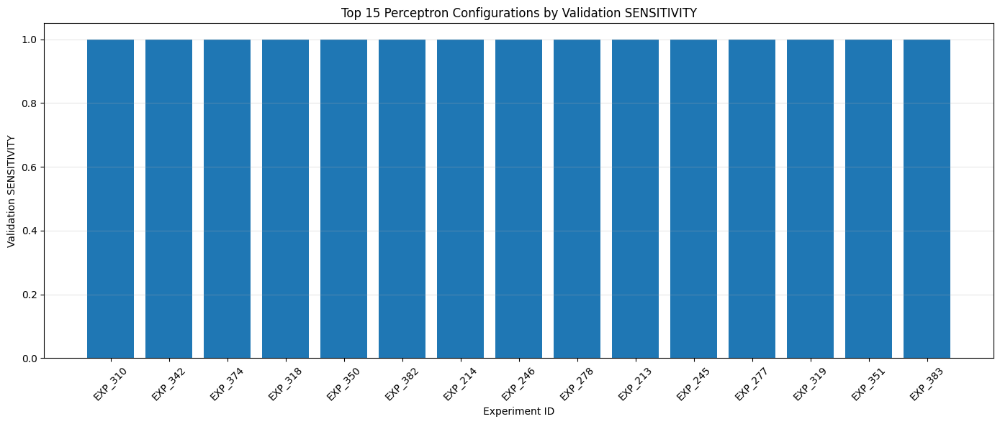

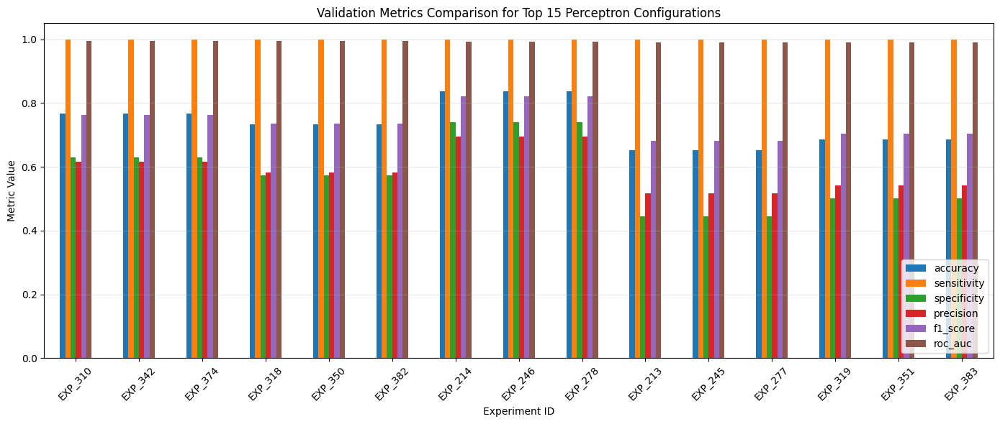

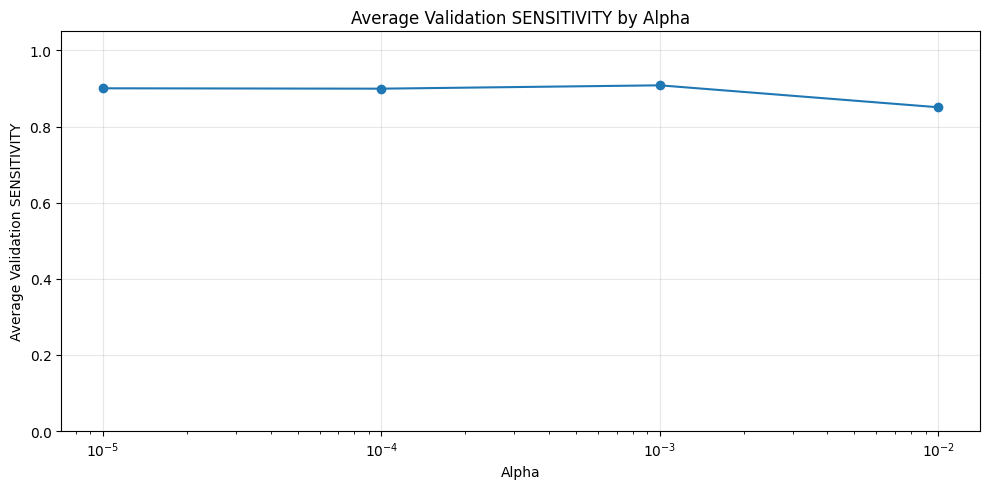

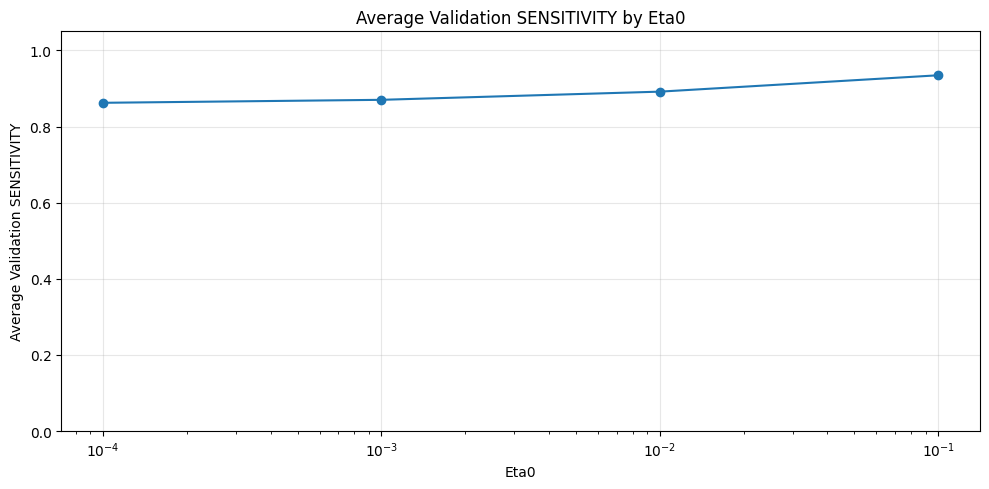

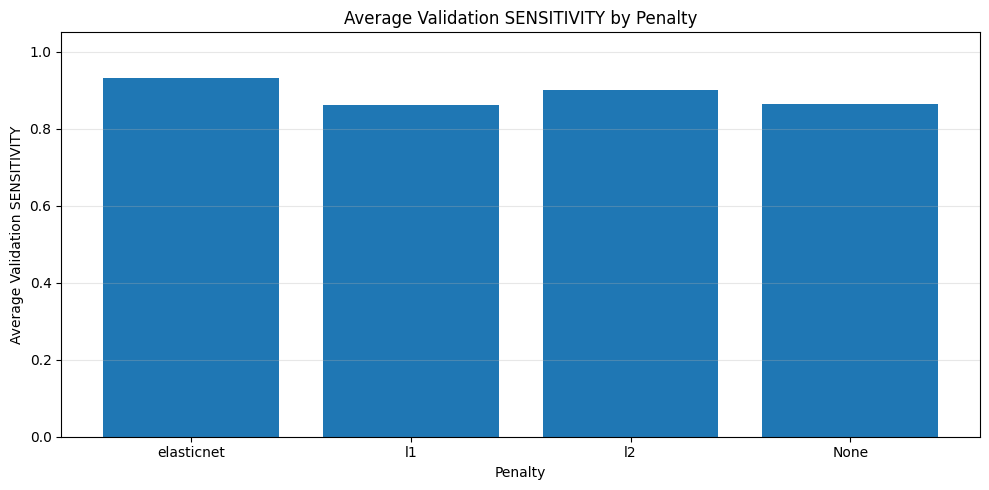

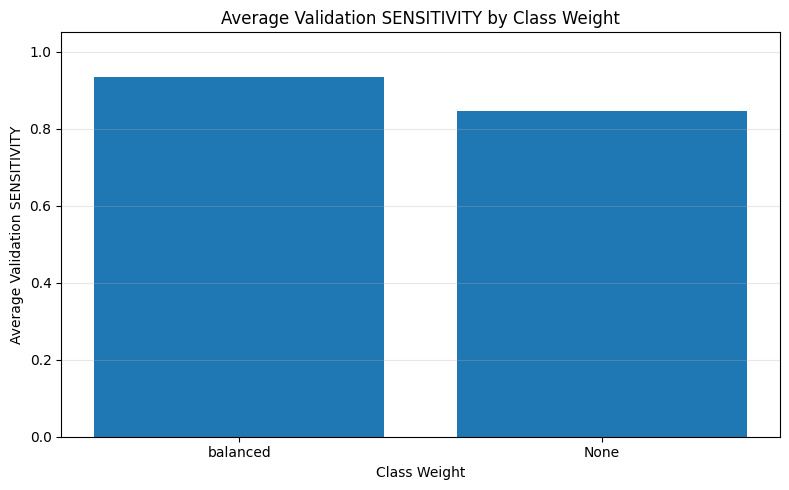

Average validation metrics by alpha:


,alpha,accuracy,sensitivity,specificity,precision,f1_score,roc_auc
0,0.00001,0.936773,0.900391,0.958333,0.939577,0.913631,0.984248
1,0.00010,0.935683,0.899414,0.957176,0.938707,0.912151,0.983887
2,0.00100,0.926599,0.908203,0.937500,0.921119,0.905875,0.986672
3,0.01000,0.894259,0.850586,0.920139,0.910943,0.853566,0.988010



Average validation metrics by eta0:


,eta0,accuracy,sensitivity,specificity,precision,f1_score,roc_auc
0,0.0001,0.937500,0.862305,0.982060,0.969472,0.905007,0.985008
1,0.0010,0.938227,0.870117,0.978588,0.964000,0.907002,0.985243
2,0.0100,0.911701,0.891602,0.923611,0.910899,0.885239,0.985153
3,0.1000,0.905887,0.934570,0.888889,0.865976,0.887975,0.987413



Average validation metrics by penalty:


,penalty,accuracy,sensitivity,specificity,precision,f1_score,roc_auc
0,elasticnet,0.918968,0.932617,0.910880,0.896102,0.904432,0.987305
1,l1,0.923692,0.861328,0.960648,0.950289,0.885669,0.987214
2,l2,0.933503,0.901367,0.952546,0.931319,0.909609,0.985225
3,None,0.917151,0.863281,0.949074,0.932637,0.885512,0.983073



Average validation metrics by class-weight policy:


,class_weight,accuracy,sensitivity,specificity,precision,f1_score,roc_auc
0,balanced,0.940225,0.933594,0.944155,0.926378,0.925637,0.987793
1,None,0.906432,0.845703,0.942419,0.928795,0.866974,0.983615



Hyperparameter analysis plots completed successfully.
The plots above support sensitivity-prioritized, validation-based Perceptron hyperparameter selection without using the test set.


In [33]:
# ============================================================
# BOX 31 — Perceptron Hyperparameter Analysis Plots
#
# Purpose:
#   - Visualize validation-based hyperparameter search results
#   - Support analytical hyperparameter selection
#   - Compare top Perceptron configurations
#   - Provide report-ready plots
#
# Notes:
#   - No model is trained in this box
#   - No test-set information is used
#   - All plots are based only on validation results
#   - sklearn Perceptron does not support learning_rate parameter
#   - Sensitivity is prioritized for medical-oriented model selection
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "perceptron_results_table",
    "perceptron_top_results_table",
    "best_perceptron_result",
    "primary_selection_metric"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise ValueError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Prepare plotting data
# ------------------------------------------------------------
plot_df = perceptron_results_table.copy()

metric_columns = [
    "accuracy",
    "sensitivity",
    "specificity",
    "precision",
    "f1_score",
    "roc_auc"
]

missing_metric_columns = [
    col for col in metric_columns
    if col not in plot_df.columns
]

if len(missing_metric_columns) > 0:
    raise ValueError(f"Missing metric columns: {missing_metric_columns}")

if primary_selection_metric not in metric_columns:
    raise ValueError(f"Invalid primary_selection_metric: {primary_selection_metric}")

top_plot_n = min(15, len(plot_df))

top_plot_df = (
    plot_df
    .head(top_plot_n)
    .copy()
)

# ------------------------------------------------------------
# Step 2 — Plot top configurations by primary metric
# ------------------------------------------------------------
plt.figure(figsize=(14, 6))
plt.bar(
    top_plot_df["experiment_id"],
    top_plot_df[primary_selection_metric]
)
plt.title(f"Top {top_plot_n} Perceptron Configurations by Validation {primary_selection_metric.upper()}")
plt.xlabel("Experiment ID")
plt.ylabel(f"Validation {primary_selection_metric.upper()}")
plt.xticks(rotation=45)
plt.ylim(0, 1.05)
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 3 — Plot metric comparison for top configurations
# ------------------------------------------------------------
top_metrics_df = top_plot_df[
    ["experiment_id"] + metric_columns
].set_index("experiment_id")

top_metrics_df.plot(kind="bar", figsize=(14, 6))
plt.title(f"Validation Metrics Comparison for Top {top_plot_n} Perceptron Configurations")
plt.xlabel("Experiment ID")
plt.ylabel("Metric Value")
plt.xticks(rotation=45)
plt.ylim(0, 1.05)
plt.grid(axis="y", alpha=0.3)
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Analyze alpha effect
# ------------------------------------------------------------
alpha_summary_df = (
    plot_df
    .groupby("alpha", dropna=False)[metric_columns]
    .mean()
    .reset_index()
    .sort_values("alpha")
)

plt.figure(figsize=(10, 5))
plt.plot(
    alpha_summary_df["alpha"],
    alpha_summary_df[primary_selection_metric],
    marker="o"
)
plt.xscale("log")
plt.title(f"Average Validation {primary_selection_metric.upper()} by Alpha")
plt.xlabel("Alpha")
plt.ylabel(f"Average Validation {primary_selection_metric.upper()}")
plt.ylim(0, 1.05)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Analyze eta0 effect
# ------------------------------------------------------------
eta0_summary_df = (
    plot_df
    .groupby("eta0", dropna=False)[metric_columns]
    .mean()
    .reset_index()
    .sort_values("eta0")
)

plt.figure(figsize=(10, 5))
plt.plot(
    eta0_summary_df["eta0"],
    eta0_summary_df[primary_selection_metric],
    marker="o"
)
plt.xscale("log")
plt.title(f"Average Validation {primary_selection_metric.upper()} by Eta0")
plt.xlabel("Eta0")
plt.ylabel(f"Average Validation {primary_selection_metric.upper()}")
plt.ylim(0, 1.05)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Analyze penalty effect
# ------------------------------------------------------------
penalty_summary_df = (
    plot_df
    .groupby("penalty", dropna=False)[metric_columns]
    .mean()
    .reset_index()
)

penalty_summary_df["penalty"] = (
    penalty_summary_df["penalty"]
    .astype(str)
    .replace("nan", "None")
)

plt.figure(figsize=(10, 5))
plt.bar(
    penalty_summary_df["penalty"],
    penalty_summary_df[primary_selection_metric]
)
plt.title(f"Average Validation {primary_selection_metric.upper()} by Penalty")
plt.xlabel("Penalty")
plt.ylabel(f"Average Validation {primary_selection_metric.upper()}")
plt.ylim(0, 1.05)
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Analyze class-weight effect
# ------------------------------------------------------------
class_weight_summary_df = (
    plot_df
    .groupby("class_weight", dropna=False)[metric_columns]
    .mean()
    .reset_index()
)

class_weight_summary_df["class_weight"] = (
    class_weight_summary_df["class_weight"]
    .astype(str)
    .replace("nan", "None")
)

plt.figure(figsize=(8, 5))
plt.bar(
    class_weight_summary_df["class_weight"],
    class_weight_summary_df[primary_selection_metric]
)
plt.title(f"Average Validation {primary_selection_metric.upper()} by Class Weight")
plt.xlabel("Class Weight")
plt.ylabel(f"Average Validation {primary_selection_metric.upper()}")
plt.ylim(0, 1.05)
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Display aggregated analysis tables
# ------------------------------------------------------------
print("Average validation metrics by alpha:")
display(alpha_summary_df.round(6))

print("\nAverage validation metrics by eta0:")
display(eta0_summary_df.round(6))

print("\nAverage validation metrics by penalty:")
display(penalty_summary_df.round(6))

print("\nAverage validation metrics by class-weight policy:")
display(class_weight_summary_df.round(6))

# ------------------------------------------------------------
# Step 9 — Final plot summary
# ------------------------------------------------------------
print("\nHyperparameter analysis plots completed successfully.")
print(
    "The plots above support sensitivity-prioritized, validation-based "
    "Perceptron hyperparameter selection without using the test set."
)

In [34]:
# ============================================================
# BOX 32 — Final Perceptron Training
#
# Purpose:
#   - Train the final Perceptron classifier
#   - Use the best validation-selected hyperparameters
#   - Combine Train and Validation sets for final learning
#   - Prepare the final model for Test evaluation
#
# Notes:
#   - Hyperparameters were selected using Validation only
#   - Test set remains completely untouched in training
#   - Final evaluation will be performed in the next box
#   - sklearn Perceptron does not support learning_rate parameter
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "X_train_b",
    "X_val_b",
    "X_test_b",
    "y_train_b",
    "y_val_b",
    "y_test_b",
    "best_perceptron_params",
    "best_perceptron_result"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise ValueError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Combine Train and Validation sets
# ------------------------------------------------------------
X_train_final = pd.concat(
    [X_train_b, X_val_b],
    axis=0
)

y_train_final = pd.concat(
    [y_train_b, y_val_b],
    axis=0
)

# ------------------------------------------------------------
# Step 2 — Verify combined dataset shapes and consistency
# ------------------------------------------------------------
print("Final training dataset shapes:\n")

print(f"X_train_final: {X_train_final.shape}")
print(f"y_train_final: {y_train_final.shape}")

print(f"\nX_test_b: {X_test_b.shape}")
print(f"y_test_b: {y_test_b.shape}")

assert X_train_final.shape[0] == y_train_final.shape[0], \
    "Final training feature/target size mismatch."

assert X_test_b.shape[0] == y_test_b.shape[0], \
    "Test feature/target size mismatch."

assert list(X_train_final.columns) == list(X_test_b.columns), \
    "Feature mismatch between final training set and test set."

print("\nFinal training consistency checks: PASSED")

# ------------------------------------------------------------
# Step 3 — Build final Perceptron model
# ------------------------------------------------------------
final_perceptron_model = Perceptron(
    penalty=best_perceptron_params["penalty"],
    alpha=best_perceptron_params["alpha"],
    max_iter=int(best_perceptron_params["max_iter"]),
    eta0=best_perceptron_params["eta0"],
    class_weight=best_perceptron_params["class_weight"],
    random_state=42
)

# ------------------------------------------------------------
# Step 4 — Train final Perceptron model
# ------------------------------------------------------------
final_perceptron_model.fit(
    X_train_final,
    y_train_final
)

# ------------------------------------------------------------
# Step 5 — Extract model information
# ------------------------------------------------------------
num_features = X_train_final.shape[1]

coef_vector = final_perceptron_model.coef_[0]

intercept_value = final_perceptron_model.intercept_[0]

# ------------------------------------------------------------
# Step 6 — Create feature-weight table
# ------------------------------------------------------------
perceptron_feature_weights_df = pd.DataFrame({
    "feature": X_train_final.columns,
    "weight": coef_vector,
    "abs_weight": np.abs(coef_vector)
})

perceptron_feature_weights_df = (
    perceptron_feature_weights_df
    .sort_values("abs_weight", ascending=False)
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 7 — Display training summary
# ------------------------------------------------------------
print("\nFinal Perceptron model training completed.\n")

print("Selected hyperparameters:")

for key, value in best_perceptron_params.items():
    print(f"{key}: {value}")

print(f"\nNumber of training samples: {len(X_train_final)}")
print(f"Number of features: {num_features}")

print(f"\nIntercept value: {intercept_value:.6f}")

# ------------------------------------------------------------
# Step 8 — Display top feature weights
# ------------------------------------------------------------
top_n_features = 15

print(f"\nTop {top_n_features} features by absolute weight:")

display(
    perceptron_feature_weights_df
    .head(top_n_features)
    .style
    .set_caption("Perceptron Feature Importance Based on Absolute Weights")
    .format({
        "weight": "{:.6f}",
        "abs_weight": "{:.6f}"
    })
)

# ------------------------------------------------------------
# Step 9 — Store final training metadata
# ------------------------------------------------------------
final_perceptron_training_metadata = {
    "train_samples": len(X_train_final),
    "test_samples": len(X_test_b),
    "num_features": num_features,
    "validation_used_for_hyperparameter_selection": True,
    "test_used_in_training": False,
    "final_model_ready": True
}

print("\nFinal Perceptron model is ready for Test evaluation.")

Final training dataset shapes:

X_train_final: (426, 30)
y_train_final: (426,)

X_test_b: (143, 30)
y_test_b: (143,)

Final training consistency checks: PASSED

Final Perceptron model training completed.

Selected hyperparameters:
alpha: 0.01
max_iter: 1000
eta0: 0.01
penalty: elasticnet
class_weight: None

Number of training samples: 426
Number of features: 30

Intercept value: -0.060000

Top 15 features by absolute weight:


,feature,weight,abs_weight
0,concave points_mean,0.033336,0.033336
1,radius_worst,0.032383,0.032383
2,perimeter_worst,0.028194,0.028194
3,texture_worst,0.027473,0.027473
4,concave points_worst,0.024815,0.024815
5,radius_se,0.018761,0.018761
6,area_worst,0.018133,0.018133
7,symmetry_worst,0.015809,0.015809
8,smoothness_worst,0.015116,0.015116
9,radius_mean,0.008452,0.008452



Final Perceptron model is ready for Test evaluation.


Final Perceptron Test Metrics:


,Model,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,Perceptron,0.937063,1.000000,0.900000,0.854839,0.921739,0.998952,53,9,0,81



Final Perceptron Confusion Matrix:


,Predicted Benign (0),Predicted Malignant (1)
Actual Benign (0),81,9
Actual Malignant (1),0,53


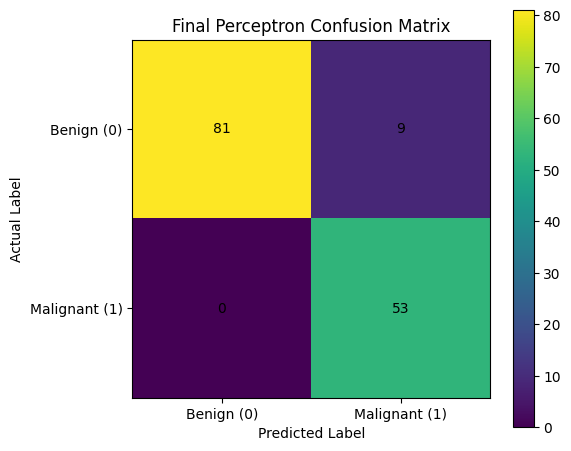

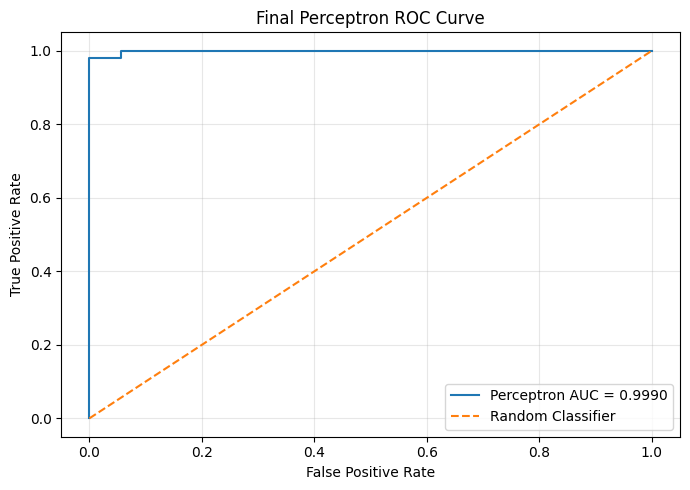

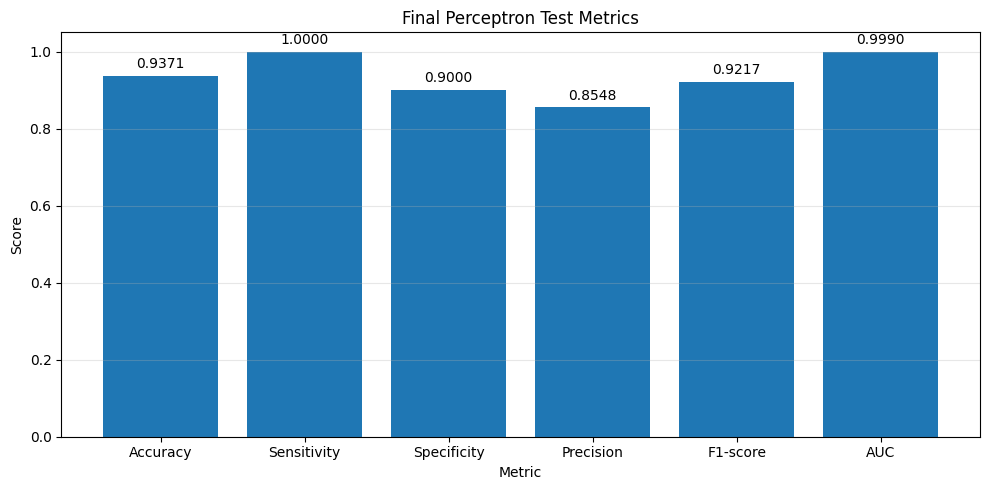


Confusion Matrix Interpretation:


,Item,Value,Meaning
0,True Negative (TN),81,Benign samples correctly classified as Benign
1,False Positive (FP),9,Benign samples incorrectly classified as Malignant
2,False Negative (FN),0,Malignant samples incorrectly classified as Benign
3,True Positive (TP),53,Malignant samples correctly classified as Malignant



Final Perceptron Test evaluation completed successfully.


In [35]:
# ============================================================
# BOX 33 — Final Perceptron Test Evaluation and Visual Report
#
# Purpose:
#   - Evaluate the final Perceptron model on the Test set
#   - Build the final confusion matrix
#   - Compute Accuracy, Sensitivity, Specificity, Precision, F1-score, and AUC
#   - Create report-ready tables and plots
#
# Notes:
#   - Test set is used only for final evaluation
#   - No hyperparameter tuning is performed in this box
#   - Sensitivity is emphasized because false negatives are critical in medical diagnosis
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_perceptron_model",
    "X_test_b",
    "y_test_b",
    "best_perceptron_params",
    "final_perceptron_training_metadata"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise ValueError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Generate Test predictions and decision scores
# ------------------------------------------------------------
y_test_pred_perceptron = final_perceptron_model.predict(X_test_b)
y_test_score_perceptron = final_perceptron_model.decision_function(X_test_b)

# ------------------------------------------------------------
# Step 2 — Build confusion matrix
# ------------------------------------------------------------
cm_perceptron = confusion_matrix(
    y_test_b,
    y_test_pred_perceptron,
    labels=[0, 1]
)

tn, fp, fn, tp = cm_perceptron.ravel()

# ------------------------------------------------------------
# Step 3 — Compute final Test metrics
# ------------------------------------------------------------
test_accuracy = accuracy_score(
    y_test_b,
    y_test_pred_perceptron
)

test_sensitivity = recall_score(
    y_test_b,
    y_test_pred_perceptron,
    pos_label=1,
    zero_division=0
)

test_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

test_precision = precision_score(
    y_test_b,
    y_test_pred_perceptron,
    pos_label=1,
    zero_division=0
)

test_f1_score = f1_score(
    y_test_b,
    y_test_pred_perceptron,
    pos_label=1,
    zero_division=0
)

test_auc = roc_auc_score(
    y_test_b,
    y_test_score_perceptron
)

# ------------------------------------------------------------
# Step 4 — Create final metrics table
# ------------------------------------------------------------
perceptron_test_metrics_df = pd.DataFrame([{
    "Model": "Perceptron",
    "Accuracy": test_accuracy,
    "Sensitivity": test_sensitivity,
    "Specificity": test_specificity,
    "Precision": test_precision,
    "F1-score": test_f1_score,
    "AUC": test_auc,
    "TP": int(tp),
    "FP": int(fp),
    "FN": int(fn),
    "TN": int(tn)
}])

metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 5 — Create confusion matrix table
# ------------------------------------------------------------
perceptron_confusion_matrix_df = pd.DataFrame(
    cm_perceptron,
    index=["Actual Benign (0)", "Actual Malignant (1)"],
    columns=["Predicted Benign (0)", "Predicted Malignant (1)"]
)

# ------------------------------------------------------------
# Step 6 — Display final metrics table
# ------------------------------------------------------------
print("Final Perceptron Test Metrics:")

display(
    perceptron_test_metrics_df.style
    .set_caption("Final Perceptron Test Evaluation Metrics")
    .format({
        "Accuracy": "{:.6f}",
        "Sensitivity": "{:.6f}",
        "Specificity": "{:.6f}",
        "Precision": "{:.6f}",
        "F1-score": "{:.6f}",
        "AUC": "{:.6f}"
    })
)

# ------------------------------------------------------------
# Step 7 — Display confusion matrix table
# ------------------------------------------------------------
print("\nFinal Perceptron Confusion Matrix:")

display(
    perceptron_confusion_matrix_df.style
    .set_caption("Final Perceptron Confusion Matrix")
)

# ------------------------------------------------------------
# Step 8 — Plot confusion matrix
# ------------------------------------------------------------
plt.figure(figsize=(6, 5))
plt.imshow(cm_perceptron)
plt.title("Final Perceptron Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.xticks(
    ticks=[0, 1],
    labels=["Benign (0)", "Malignant (1)"]
)
plt.yticks(
    ticks=[0, 1],
    labels=["Benign (0)", "Malignant (1)"]
)

for i in range(cm_perceptron.shape[0]):
    for j in range(cm_perceptron.shape[1]):
        plt.text(
            j,
            i,
            cm_perceptron[i, j],
            ha="center",
            va="center"
        )

plt.colorbar()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot ROC curve
# ------------------------------------------------------------
fpr_perceptron, tpr_perceptron, thresholds_perceptron = roc_curve(
    y_test_b,
    y_test_score_perceptron
)

plt.figure(figsize=(7, 5))
plt.plot(
    fpr_perceptron,
    tpr_perceptron,
    label=f"Perceptron AUC = {test_auc:.4f}"
)
plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    label="Random Classifier"
)
plt.title("Final Perceptron ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot final metric bar chart
# ------------------------------------------------------------
metric_values = perceptron_test_metrics_df[metric_columns].iloc[0]

plt.figure(figsize=(10, 5))
plt.bar(
    metric_values.index,
    metric_values.values
)
plt.title("Final Perceptron Test Metrics")
plt.xlabel("Metric")
plt.ylabel("Score")
plt.ylim(0, 1.05)
plt.grid(axis="y", alpha=0.3)

for index, value in enumerate(metric_values.values):
    plt.text(
        index,
        value + 0.02,
        f"{value:.4f}",
        ha="center"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Create interpretation table
# ------------------------------------------------------------
perceptron_confusion_interpretation_df = pd.DataFrame([
    {
        "Item": "True Negative (TN)",
        "Value": int(tn),
        "Meaning": "Benign samples correctly classified as Benign"
    },
    {
        "Item": "False Positive (FP)",
        "Value": int(fp),
        "Meaning": "Benign samples incorrectly classified as Malignant"
    },
    {
        "Item": "False Negative (FN)",
        "Value": int(fn),
        "Meaning": "Malignant samples incorrectly classified as Benign"
    },
    {
        "Item": "True Positive (TP)",
        "Value": int(tp),
        "Meaning": "Malignant samples correctly classified as Malignant"
    }
])

print("\nConfusion Matrix Interpretation:")

display(
    perceptron_confusion_interpretation_df.style
    .set_caption("Interpretation of Confusion Matrix Components")
)

# ------------------------------------------------------------
# Step 12 — Store final evaluation metadata
# ------------------------------------------------------------
final_perceptron_test_metadata = {
    "model": "Perceptron",
    "test_samples": len(X_test_b),
    "accuracy": test_accuracy,
    "sensitivity": test_sensitivity,
    "specificity": test_specificity,
    "precision": test_precision,
    "f1_score": test_f1_score,
    "auc": test_auc,
    "tp": int(tp),
    "fp": int(fp),
    "fn": int(fn),
    "tn": int(tn),
    "test_used_for_final_evaluation_only": True
}

print("\nFinal Perceptron Test evaluation completed successfully.")

In [36]:
# ============================================================
# BOX 34 — Stratified 5-Fold CV Data Preparation with Min-Max Scaling
#
# Purpose:
#   - Create stratified 5-fold cross-validation splits
#   - Keep fold sizes and class distributions as balanced as possible
#   - Fit MinMaxScaler only on the training part of each fold
#   - Transform the validation part using the scaler fitted on that fold train set
#   - Store all fold-level raw and scaled data for downstream algorithms
#
# Methodological Notes:
#   - No final test set is created in this box
#   - Each fold contains:
#         1) Training subset
#         2) Validation subset
#   - Scaling is performed separately inside each fold to avoid data leakage
#   - Variable names use the prefix "cv5_" to avoid conflicts with previous boxes
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = ["X", "y"]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise NameError(f"Missing required objects: {missing_objects}")

if not isinstance(X, pd.DataFrame):
    raise TypeError("X must be a pandas DataFrame.")

if not isinstance(y, pd.Series):
    raise TypeError("y must be a pandas Series.")

if X.shape[0] != y.shape[0]:
    raise ValueError("X and y must have the same number of rows.")

if X.isna().sum().sum() > 0:
    raise ValueError("X contains missing values.")

if y.isna().sum() > 0:
    raise ValueError("y contains missing values.")

if np.isinf(X.to_numpy()).sum() > 0:
    raise ValueError("X contains infinite values.")

if y.nunique() != 2:
    raise ValueError("This box expects a binary classification target.")

# ------------------------------------------------------------
# Step 1 — Define 5-fold CV configuration
# ------------------------------------------------------------
CV5_RANDOM_STATE = 42
CV5_N_SPLITS = 5
CV5_SCALER_RANGE = (0, 1)

# ------------------------------------------------------------
# Step 2 — Configure Stratified 5-Fold Cross-Validation
# ------------------------------------------------------------
cv5_strategy = StratifiedKFold(
    n_splits=CV5_N_SPLITS,
    shuffle=True,
    random_state=CV5_RANDOM_STATE
)

# ------------------------------------------------------------
# Step 3 — Create fold-level raw and scaled datasets
# ------------------------------------------------------------
cv5_scaled_folds = []

for cv5_fold_number, (cv5_train_idx, cv5_val_idx) in enumerate(
    cv5_strategy.split(X, y),
    start=1
):

    # --------------------------------------------------------
    # Step 3.1 — Create raw train and validation subsets
    # --------------------------------------------------------
    cv5_X_train_raw = X.iloc[cv5_train_idx].copy()
    cv5_X_val_raw   = X.iloc[cv5_val_idx].copy()

    cv5_y_train = y.iloc[cv5_train_idx].copy()
    cv5_y_val   = y.iloc[cv5_val_idx].copy()

    # --------------------------------------------------------
    # Step 3.2 — Fit MinMaxScaler only on current fold train set
    # --------------------------------------------------------
    cv5_fold_scaler = MinMaxScaler(feature_range=CV5_SCALER_RANGE)

    cv5_X_train_scaled_array = cv5_fold_scaler.fit_transform(cv5_X_train_raw)
    cv5_X_val_scaled_array   = cv5_fold_scaler.transform(cv5_X_val_raw)

    # --------------------------------------------------------
    # Step 3.3 — Convert scaled arrays back to DataFrames
    # --------------------------------------------------------
    cv5_X_train_scaled = pd.DataFrame(
        cv5_X_train_scaled_array,
        columns=X.columns,
        index=cv5_X_train_raw.index
    )

    cv5_X_val_scaled = pd.DataFrame(
        cv5_X_val_scaled_array,
        columns=X.columns,
        index=cv5_X_val_raw.index
    )

    # --------------------------------------------------------
    # Step 3.4 — Safety checks after scaling
    # --------------------------------------------------------
    if cv5_X_train_scaled.isna().sum().sum() > 0:
        raise ValueError(f"NaN values found in scaled training data of fold {cv5_fold_number}.")

    if cv5_X_val_scaled.isna().sum().sum() > 0:
        raise ValueError(f"NaN values found in scaled validation data of fold {cv5_fold_number}.")

    if np.isinf(cv5_X_train_scaled.to_numpy()).sum() > 0:
        raise ValueError(f"Infinite values found in scaled training data of fold {cv5_fold_number}.")

    if np.isinf(cv5_X_val_scaled.to_numpy()).sum() > 0:
        raise ValueError(f"Infinite values found in scaled validation data of fold {cv5_fold_number}.")

    # --------------------------------------------------------
    # Step 3.5 — Store current fold data
    # --------------------------------------------------------
    cv5_fold_data = {
        "fold_number": cv5_fold_number,

        "train_index": cv5_train_idx,
        "validation_index": cv5_val_idx,

        "X_train_raw": cv5_X_train_raw,
        "X_validation_raw": cv5_X_val_raw,

        "X_train_scaled": cv5_X_train_scaled,
        "X_validation_scaled": cv5_X_val_scaled,

        "y_train": cv5_y_train,
        "y_validation": cv5_y_val,

        "scaler": cv5_fold_scaler
    }

    cv5_scaled_folds.append(cv5_fold_data)

# ------------------------------------------------------------
# Step 4 — Build fold summary table
# ------------------------------------------------------------
cv5_fold_summary_rows = []

for cv5_fold_data in cv5_scaled_folds:

    cv5_fold_number = cv5_fold_data["fold_number"]

    cv5_X_train_scaled = cv5_fold_data["X_train_scaled"]
    cv5_X_val_scaled   = cv5_fold_data["X_validation_scaled"]

    cv5_y_train = cv5_fold_data["y_train"]
    cv5_y_val   = cv5_fold_data["y_validation"]

    cv5_train_counts = cv5_y_train.value_counts().sort_index()
    cv5_val_counts   = cv5_y_val.value_counts().sort_index()

    cv5_fold_summary_rows.append({
        "Fold": cv5_fold_number,

        "Train_Size": len(cv5_y_train),
        "Validation_Size": len(cv5_y_val),

        "Train_Class_0": cv5_train_counts.get(0, 0),
        "Train_Class_1": cv5_train_counts.get(1, 0),

        "Validation_Class_0": cv5_val_counts.get(0, 0),
        "Validation_Class_1": cv5_val_counts.get(1, 0),

        "Train_Class_0_Ratio": round((cv5_y_train == 0).mean(), 4),
        "Train_Class_1_Ratio": round((cv5_y_train == 1).mean(), 4),

        "Validation_Class_0_Ratio": round((cv5_y_val == 0).mean(), 4),
        "Validation_Class_1_Ratio": round((cv5_y_val == 1).mean(), 4),

        "Scaled_Train_Min": round(cv5_X_train_scaled.min().min(), 4),
        "Scaled_Train_Max": round(cv5_X_train_scaled.max().max(), 4),

        "Scaled_Validation_Min": round(cv5_X_val_scaled.min().min(), 4),
        "Scaled_Validation_Max": round(cv5_X_val_scaled.max().max(), 4)
    })

cv5_fold_summary_df = pd.DataFrame(cv5_fold_summary_rows)

# ------------------------------------------------------------
# Step 5 — Display final summary
# ------------------------------------------------------------
print("Stratified 5-Fold CV with fold-level Min-Max Scaling is ready.")
print(f"Number of folds: {len(cv5_scaled_folds)}")
print(f"Scaler range   : {CV5_SCALER_RANGE}")
print("\nImportant:")
print("No separate final test set is created in this box.")
print("Each fold contains only training and validation subsets.")

print("\nFold summary:")
display(cv5_fold_summary_df)

print("\nUse cv5_scaled_folds for downstream 5-Fold model evaluation.")

Stratified 5-Fold CV with fold-level Min-Max Scaling is ready.
Number of folds: 5
Scaler range   : (0, 1)

Important:
No separate final test set is created in this box.
Each fold contains only training and validation subsets.

Fold summary:


,Fold,Train_Size,Validation_Size,Train_Class_0,Train_Class_1,Validation_Class_0,Validation_Class_1,Train_Class_0_Ratio,Train_Class_1_Ratio,Validation_Class_0_Ratio,Validation_Class_1_Ratio,Scaled_Train_Min,Scaled_Train_Max,Scaled_Validation_Min,Scaled_Validation_Max
0,1,455,114,286,169,71,43,0.6286,0.3714,0.6228,0.3772,0.0,1.0,-0.0019,1.4667
1,2,455,114,286,169,71,43,0.6286,0.3714,0.6228,0.3772,0.0,1.0,-0.0992,2.5798
2,3,455,114,285,170,72,42,0.6264,0.3736,0.6316,0.3684,0.0,1.0,-0.1202,1.2925
3,4,455,114,285,170,72,42,0.6264,0.3736,0.6316,0.3684,0.0,1.0,-0.0615,1.1861
4,5,456,113,286,170,71,42,0.6272,0.3728,0.6283,0.3717,0.0,1.0,-0.0423,1.3488



Use cv5_scaled_folds for downstream 5-Fold model evaluation.


In [37]:
# ============================================================
# BOX 35 — 1-NN Evaluation Utilities for Stratified 5-Fold CV
#
# Purpose:
#   - Create reusable evaluation utilities for 1-NN experiments
#   - Compute confusion-matrix-based classification metrics
#   - Generate ROC curve data and AUC values
#   - Prepare standardized outputs for downstream reporting
#
# Metrics:
#   - Accuracy
#   - Sensitivity (Recall / True Positive Rate)
#   - Specificity (True Negative Rate)
#   - Precision
#   - F1-score
#   - AUC
#   - TP, FP, FN, TN
#
# Notes:
#   - This box does NOT train any model
#   - This box only defines reusable helper functions
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise NameError(f"Missing required objects: {missing_objects}")

if not isinstance(cv5_scaled_folds, list):
    raise TypeError("cv5_scaled_folds must be a list.")

if len(cv5_scaled_folds) == 0:
    raise ValueError("cv5_scaled_folds is empty.")

# ------------------------------------------------------------
# Step 1 — Define binary classification metric calculator
# ------------------------------------------------------------
def compute_binary_classification_metrics(
    y_true,
    y_pred,
    y_score=None
):
    """
    Compute standard binary classification metrics.

    Parameters
    ----------
    y_true : array-like
        Ground-truth binary labels.

    y_pred : array-like
        Predicted binary labels.

    y_score : array-like or None
        Probability scores or decision scores for positive class.
        Used for ROC-AUC calculation.

    Returns
    -------
    metrics_dict : dict
        Dictionary containing all evaluation metrics.
    """

    # --------------------------------------------------------
    # Confusion matrix
    # --------------------------------------------------------
    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred
    ).ravel()

    # --------------------------------------------------------
    # Core metrics
    # --------------------------------------------------------
    accuracy = accuracy_score(y_true, y_pred)

    sensitivity = recall_score(
        y_true,
        y_pred,
        zero_division=0
    )

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else 0.0
    )

    precision = precision_score(
        y_true,
        y_pred,
        zero_division=0
    )

    f1 = f1_score(
        y_true,
        y_pred,
        zero_division=0
    )

    # --------------------------------------------------------
    # ROC-AUC
    # --------------------------------------------------------
    if y_score is not None:

        auc = roc_auc_score(y_true, y_score)

    else:

        auc = np.nan

    # --------------------------------------------------------
    # Build results dictionary
    # --------------------------------------------------------
    metrics_dict = {

        "Accuracy": accuracy,
        "Sensitivity": sensitivity,
        "Specificity": specificity,
        "Precision": precision,
        "F1-score": f1,
        "AUC": auc,

        "TP": tp,
        "FP": fp,
        "FN": fn,
        "TN": tn
    }

    return metrics_dict

# ------------------------------------------------------------
# Step 2 — Define ROC curve data generator
# ------------------------------------------------------------
def compute_roc_curve_data(
    y_true,
    y_score
):
    """
    Compute ROC curve coordinates.

    Parameters
    ----------
    y_true : array-like
        Ground-truth binary labels.

    y_score : array-like
        Probability scores for positive class.

    Returns
    -------
    roc_data : dict
        Dictionary containing:
            - fpr
            - tpr
            - thresholds
            - auc
    """

    # --------------------------------------------------------
    # Compute ROC curve
    # --------------------------------------------------------
    fpr, tpr, thresholds = roc_curve(
        y_true,
        y_score
    )

    # --------------------------------------------------------
    # Compute AUC
    # --------------------------------------------------------
    auc_value = roc_auc_score(
        y_true,
        y_score
    )

    # --------------------------------------------------------
    # Store outputs
    # --------------------------------------------------------
    roc_data = {

        "fpr": fpr,
        "tpr": tpr,
        "thresholds": thresholds,
        "auc": auc_value
    }

    return roc_data

# ------------------------------------------------------------
# Step 3 — Create global evaluation containers
# ------------------------------------------------------------
all_model_summary_results = []

all_model_fold_results = []

all_model_confusion_matrices = []

all_model_roc_data = []

all_model_metric_plots = []

# ------------------------------------------------------------
# Step 4 — Final confirmation
# ------------------------------------------------------------
print("Global evaluation environment is ready.")

print("\nInitialized storage objects:")
print("- all_model_summary_results")
print("- all_model_fold_results")
print("- all_model_confusion_matrices")
print("- all_model_roc_data")
print("- all_model_metric_plots")

print("\nAvailable helper functions:")
print("- compute_binary_classification_metrics()")
print("- compute_roc_curve_data()")

print("\nEvaluation utilities are ready for downstream model analysis.")

Global evaluation environment is ready.

Initialized storage objects:
- all_model_summary_results
- all_model_fold_results
- all_model_confusion_matrices
- all_model_roc_data
- all_model_metric_plots

Available helper functions:
- compute_binary_classification_metrics()
- compute_roc_curve_data()

Evaluation utilities are ready for downstream model analysis.


In [38]:
# ============================================================
# BOX 36 — 1-NN Stratified 5-Fold Training and Evaluation
#
# Purpose:
#   - Train and evaluate 1-NN classifier on each CV fold
#   - Use fold-level Min-Max scaled datasets
#   - Compute fold-by-fold classification metrics
#   - Store confusion matrices and ROC curve data
#
# Model:
#   - 1-Nearest Neighbor (1-NN)
#
# Cross-Validation:
#   - Stratified 5-Fold CV
#
# Distance Metric:
#   - Euclidean distance
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "compute_binary_classification_metrics",
    "compute_roc_curve_data"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise NameError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Define 1-NN configuration
# ------------------------------------------------------------
NN1_N_NEIGHBORS = 1

NN1_DISTANCE_METRIC = "minkowski"

NN1_P = 2

NN1_MODEL_NAME = "1-NN"

# ------------------------------------------------------------
# Step 2 — Initialize storage objects
# ------------------------------------------------------------
nn1_fold_results = []

nn1_confusion_matrices = []

nn1_roc_data = []

nn1_trained_models = []

# ------------------------------------------------------------
# Step 3 — Run fold-by-fold evaluation
# ------------------------------------------------------------
for cv5_fold_data in cv5_scaled_folds:

    # --------------------------------------------------------
    # Step 3.1 — Extract fold information
    # --------------------------------------------------------
    fold_number = cv5_fold_data["fold_number"]

    X_train = cv5_fold_data["X_train_scaled"]
    X_val   = cv5_fold_data["X_validation_scaled"]

    y_train = cv5_fold_data["y_train"]
    y_val   = cv5_fold_data["y_validation"]

    # --------------------------------------------------------
    # Step 3.2 — Initialize 1-NN classifier
    # --------------------------------------------------------
    nn1_model = KNeighborsClassifier(
        n_neighbors=NN1_N_NEIGHBORS,
        metric=NN1_DISTANCE_METRIC,
        p=NN1_P
    )

    # --------------------------------------------------------
    # Step 3.3 — Train model
    # --------------------------------------------------------
    nn1_model.fit(X_train, y_train)

    # --------------------------------------------------------
    # Step 3.4 — Generate predictions
    # --------------------------------------------------------
    y_pred = nn1_model.predict(X_val)

    # --------------------------------------------------------
    # Step 3.5 — Generate probability scores
    # --------------------------------------------------------
    y_score = nn1_model.predict_proba(X_val)[:, 1]

    # --------------------------------------------------------
    # Step 3.6 — Compute evaluation metrics
    # --------------------------------------------------------
    fold_metrics = compute_binary_classification_metrics(
        y_true=y_val,
        y_pred=y_pred,
        y_score=y_score
    )

    # --------------------------------------------------------
    # Step 3.7 — Generate ROC curve data
    # --------------------------------------------------------
    fold_roc_data = compute_roc_curve_data(
        y_true=y_val,
        y_score=y_score
    )

    # --------------------------------------------------------
    # Step 3.8 — Build confusion matrix
    # --------------------------------------------------------
    confusion_mat = np.array([
        [fold_metrics["TN"], fold_metrics["FP"]],
        [fold_metrics["FN"], fold_metrics["TP"]]
    ])

    # --------------------------------------------------------
    # Step 3.9 — Store fold results
    # --------------------------------------------------------
    fold_result_row = {

        "Model": NN1_MODEL_NAME,
        "Fold": fold_number,

        "Accuracy": fold_metrics["Accuracy"],
        "Sensitivity": fold_metrics["Sensitivity"],
        "Specificity": fold_metrics["Specificity"],
        "Precision": fold_metrics["Precision"],
        "F1-score": fold_metrics["F1-score"],
        "AUC": fold_metrics["AUC"],

        "TP": fold_metrics["TP"],
        "FP": fold_metrics["FP"],
        "FN": fold_metrics["FN"],
        "TN": fold_metrics["TN"]
    }

    nn1_fold_results.append(fold_result_row)

    # --------------------------------------------------------
    # Step 3.10 — Store confusion matrix
    # --------------------------------------------------------
    nn1_confusion_matrices.append({
        "fold": fold_number,
        "matrix": confusion_mat
    })

    # --------------------------------------------------------
    # Step 3.11 — Store ROC data
    # --------------------------------------------------------
    nn1_roc_data.append({
        "fold": fold_number,
        "roc_data": fold_roc_data
    })

    # --------------------------------------------------------
    # Step 3.12 — Store trained model
    # --------------------------------------------------------
    nn1_trained_models.append({
        "fold": fold_number,
        "model": nn1_model
    })

# ------------------------------------------------------------
# Step 4 — Create fold-level results DataFrame
# ------------------------------------------------------------
nn1_fold_results_df = pd.DataFrame(nn1_fold_results)

# ------------------------------------------------------------
# Step 5 — Compute summary statistics
# ------------------------------------------------------------
summary_metrics = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

nn1_summary_rows = []

for metric_name in summary_metrics:

    metric_values = nn1_fold_results_df[metric_name]

    nn1_summary_rows.append({

        "Metric": metric_name,

        "Mean": metric_values.mean(),

        "Std": metric_values.std(),

        "Min": metric_values.min(),

        "Max": metric_values.max()
    })

nn1_summary_results_df = pd.DataFrame(nn1_summary_rows)

# ------------------------------------------------------------
# Step 6 — Store results in global containers
# ------------------------------------------------------------
all_model_fold_results.append(nn1_fold_results_df)

all_model_summary_results.append(nn1_summary_results_df)

all_model_confusion_matrices.append({
    "model": NN1_MODEL_NAME,
    "matrices": nn1_confusion_matrices
})

all_model_roc_data.append({
    "model": NN1_MODEL_NAME,
    "roc_data": nn1_roc_data
})

# ------------------------------------------------------------
# Step 7 — Display fold-level results
# ------------------------------------------------------------
print("1-NN fold-by-fold evaluation completed.")

print("\nFold-level results:")
display(nn1_fold_results_df)

# ------------------------------------------------------------
# Step 8 — Display summary results
# ------------------------------------------------------------
print("\n1-NN summary statistics across 5 folds:")
display(nn1_summary_results_df)

print("\n1-NN evaluation pipeline completed successfully.")

1-NN fold-by-fold evaluation completed.

Fold-level results:


,Model,Fold,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,1-NN,1,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,43,0,0,71
1,1-NN,2,0.929825,0.860465,0.971831,0.948718,0.902439,0.916148,37,2,6,69
2,1-NN,3,0.938596,0.880952,0.972222,0.948718,0.913580,0.926587,37,2,5,70
3,1-NN,4,0.947368,0.976190,0.930556,0.891304,0.931818,0.953373,41,5,1,67
4,1-NN,5,0.964602,0.904762,1.000000,1.000000,0.950000,0.952381,38,0,4,71



1-NN summary statistics across 5 folds:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.956078,0.027715,0.929825,1.0
1,Sensitivity,0.924474,0.060743,0.860465,1.0
2,Specificity,0.974922,0.028474,0.930556,1.0
3,Precision,0.957748,0.045134,0.891304,1.0
4,F1-score,0.939567,0.038324,0.902439,1.0
5,AUC,0.949698,0.032445,0.916148,1.0



1-NN evaluation pipeline completed successfully.


In [39]:
# ============================================================
# BOX 37 — 1-NN Fold-Level Results Table
#
# Purpose:
#   - Validate 1-NN fold-level evaluation results
#   - Format fold-by-fold metrics for reporting
#   - Display a clean table including:
#       Accuracy, Sensitivity, Specificity, Precision,
#       F1-score, AUC, TP, FP, FN, TN
#
# Notes:
#   - This box does not retrain the model
#   - Results are taken from nn1_fold_results_df created in BOX 36
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "nn1_fold_results_df"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise NameError(f"Missing required objects: {missing_objects}")

if not isinstance(nn1_fold_results_df, pd.DataFrame):
    raise TypeError("nn1_fold_results_df must be a pandas DataFrame.")

required_columns = [
    "Model",
    "Fold",
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC",
    "TP",
    "FP",
    "FN",
    "TN"
]

missing_columns = [
    col for col in required_columns
    if col not in nn1_fold_results_df.columns
]

if len(missing_columns) > 0:
    raise ValueError(f"Missing required columns in nn1_fold_results_df: {missing_columns}")

if nn1_fold_results_df.shape[0] != 5:
    raise ValueError("nn1_fold_results_df must contain exactly 5 fold rows.")

# ------------------------------------------------------------
# Step 1 — Select and order reporting columns
# ------------------------------------------------------------
nn1_fold_report_df = nn1_fold_results_df[required_columns].copy()

# ------------------------------------------------------------
# Step 2 — Sort results by fold number
# ------------------------------------------------------------
nn1_fold_report_df = nn1_fold_report_df.sort_values(
    by="Fold",
    ascending=True
).reset_index(drop=True)

# ------------------------------------------------------------
# Step 3 — Validate metric ranges
# ------------------------------------------------------------
metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

for metric_col in metric_columns:

    if nn1_fold_report_df[metric_col].isna().sum() > 0:
        raise ValueError(f"{metric_col} contains NaN values.")

    if not nn1_fold_report_df[metric_col].between(0, 1).all():
        raise ValueError(f"{metric_col} must be between 0 and 1.")

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN"
]

for count_col in count_columns:

    if nn1_fold_report_df[count_col].isna().sum() > 0:
        raise ValueError(f"{count_col} contains NaN values.")

    if (nn1_fold_report_df[count_col] < 0).any():
        raise ValueError(f"{count_col} contains negative values.")

# ------------------------------------------------------------
# Step 4 — Build rounded display table
# ------------------------------------------------------------
nn1_fold_report_display_df = nn1_fold_report_df.copy()

nn1_fold_report_display_df[metric_columns] = (
    nn1_fold_report_display_df[metric_columns].round(6)
)

nn1_fold_report_display_df[count_columns] = (
    nn1_fold_report_display_df[count_columns].astype(int)
)

# ------------------------------------------------------------
# Step 5 — Create styled report table
# ------------------------------------------------------------
nn1_fold_report_styled = (
    nn1_fold_report_display_df
    .style
    .set_caption("1-NN Stratified 5-Fold Cross-Validation — Fold-Level Results")
    .format({
        "Accuracy": "{:.6f}",
        "Sensitivity": "{:.6f}",
        "Specificity": "{:.6f}",
        "Precision": "{:.6f}",
        "F1-score": "{:.6f}",
        "AUC": "{:.6f}",
        "TP": "{:d}",
        "FP": "{:d}",
        "FN": "{:d}",
        "TN": "{:d}"
    })
    .background_gradient(
        subset=metric_columns,
        cmap="Blues"
    )
    .set_table_styles([
        {
            "selector": "caption",
            "props": [
                ("caption-side", "top"),
                ("font-size", "16px"),
                ("font-weight", "bold"),
                ("text-align", "center")
            ]
        },
        {
            "selector": "th",
            "props": [
                ("text-align", "center"),
                ("font-weight", "bold")
            ]
        },
        {
            "selector": "td",
            "props": [
                ("text-align", "center")
            ]
        }
    ])
)

# ------------------------------------------------------------
# Step 6 — Display final fold-level report
# ------------------------------------------------------------
print("1-NN fold-level report table is ready.")
display(nn1_fold_report_styled)

1-NN fold-level report table is ready.


,Model,Fold,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,1-NN,1,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,43,0,0,71
1,1-NN,2,0.929825,0.860465,0.971831,0.948718,0.902439,0.916148,37,2,6,69
2,1-NN,3,0.938596,0.880952,0.972222,0.948718,0.913580,0.926587,37,2,5,70
3,1-NN,4,0.947368,0.976190,0.930556,0.891304,0.931818,0.953373,41,5,1,67
4,1-NN,5,0.964602,0.904762,1.000000,1.000000,0.950000,0.952381,38,0,4,71


In [40]:
# ============================================================
# BOX 38 — 1-NN Cross-Validation Summary Analysis
#
# Purpose:
#   - Compute overall summary statistics for 1-NN
#   - Aggregate fold-level evaluation metrics
#   - Generate report-ready summary tables
#   - Identify best and worst folds for each metric
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# Statistics:
#   - Mean
#   - Standard Deviation
#   - Minimum
#   - Maximum
#   - Best Fold
#   - Worst Fold
#
# Notes:
#   - Results are derived from the 5-fold CV outputs
#   - No model retraining is performed in this box
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "nn1_fold_results_df"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise NameError(f"Missing required objects: {missing_objects}")

if not isinstance(nn1_fold_results_df, pd.DataFrame):
    raise TypeError("nn1_fold_results_df must be a pandas DataFrame.")

# ------------------------------------------------------------
# Step 1 — Define evaluation metrics
# ------------------------------------------------------------
summary_metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 2 — Compute detailed summary statistics
# ------------------------------------------------------------
nn1_cv_summary_rows = []

for metric_name in summary_metric_columns:

    metric_values = nn1_fold_results_df[metric_name]

    metric_mean = metric_values.mean()

    metric_std = metric_values.std()

    metric_min = metric_values.min()

    metric_max = metric_values.max()

    best_fold = nn1_fold_results_df.loc[
        metric_values.idxmax(),
        "Fold"
    ]

    worst_fold = nn1_fold_results_df.loc[
        metric_values.idxmin(),
        "Fold"
    ]

    nn1_cv_summary_rows.append({

        "Metric": metric_name,

        "Mean": metric_mean,
        "Std": metric_std,

        "Min": metric_min,
        "Max": metric_max,

        "Best_Fold": best_fold,
        "Worst_Fold": worst_fold
    })

# ------------------------------------------------------------
# Step 3 — Create summary DataFrame
# ------------------------------------------------------------
nn1_cv_summary_df = pd.DataFrame(nn1_cv_summary_rows)

# ------------------------------------------------------------
# Step 4 — Create rounded display version
# ------------------------------------------------------------
nn1_cv_summary_display_df = nn1_cv_summary_df.copy()

numeric_columns = [
    "Mean",
    "Std",
    "Min",
    "Max"
]

nn1_cv_summary_display_df[numeric_columns] = (
    nn1_cv_summary_display_df[numeric_columns]
    .round(6)
)

# ------------------------------------------------------------
# Step 5 — Compute overall model ranking indicators
# ------------------------------------------------------------
nn1_overall_performance = {

    "Model": "1-NN",

    "Mean_Accuracy":
        nn1_fold_results_df["Accuracy"].mean(),

    "Mean_Sensitivity":
        nn1_fold_results_df["Sensitivity"].mean(),

    "Mean_Specificity":
        nn1_fold_results_df["Specificity"].mean(),

    "Mean_Precision":
        nn1_fold_results_df["Precision"].mean(),

    "Mean_F1-score":
        nn1_fold_results_df["F1-score"].mean(),

    "Mean_AUC":
        nn1_fold_results_df["AUC"].mean(),

    "Std_Accuracy":
        nn1_fold_results_df["Accuracy"].std(),

    "Std_AUC":
        nn1_fold_results_df["AUC"].std()
}

nn1_overall_performance_df = pd.DataFrame(
    [nn1_overall_performance]
)

# ------------------------------------------------------------
# Step 6 — Create styled summary table
# ------------------------------------------------------------
nn1_cv_summary_styled = (
    nn1_cv_summary_display_df
    .style
    .set_caption("1-NN Cross-Validation Summary Statistics")
    .format({
        "Mean": "{:.6f}",
        "Std": "{:.6f}",
        "Min": "{:.6f}",
        "Max": "{:.6f}"
    })
    .background_gradient(
        subset=["Mean"],
        cmap="Greens"
    )
    .background_gradient(
        subset=["Std"],
        cmap="Reds_r"
    )
    .set_table_styles([
        {
            "selector": "caption",
            "props": [
                ("caption-side", "top"),
                ("font-size", "16px"),
                ("font-weight", "bold"),
                ("text-align", "center")
            ]
        },
        {
            "selector": "th",
            "props": [
                ("text-align", "center"),
                ("font-weight", "bold")
            ]
        },
        {
            "selector": "td",
            "props": [
                ("text-align", "center")
            ]
        }
    ])
)

# ------------------------------------------------------------
# Step 7 — Display summary statistics
# ------------------------------------------------------------
print("1-NN cross-validation summary analysis is ready.")

print("\nDetailed summary statistics:")
display(nn1_cv_summary_styled)

# ------------------------------------------------------------
# Step 8 — Display overall model performance
# ------------------------------------------------------------
print("\nOverall model performance:")
display(
    nn1_overall_performance_df.round(6)
)

# ------------------------------------------------------------
# Step 9 — Store results in global summary container
# ------------------------------------------------------------
all_model_summary_results.append({
    "model": "1-NN",
    "summary_statistics": nn1_cv_summary_df,
    "overall_performance": nn1_overall_performance_df
})

print("\n1-NN summary analysis completed successfully.")

1-NN cross-validation summary analysis is ready.

Detailed summary statistics:


,Metric,Mean,Std,Min,Max,Best_Fold,Worst_Fold
0,Accuracy,0.956078,0.027715,0.929825,1.000000,1,2
1,Sensitivity,0.924474,0.060743,0.860465,1.000000,1,2
2,Specificity,0.974922,0.028474,0.930556,1.000000,1,4
3,Precision,0.957748,0.045134,0.891304,1.000000,1,4
4,F1-score,0.939567,0.038324,0.902439,1.000000,1,2
5,AUC,0.949698,0.032445,0.916148,1.000000,1,2



Overall model performance:


,Model,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_Precision,Mean_F1-score,Mean_AUC,Std_Accuracy,Std_AUC
0,1-NN,0.956078,0.924474,0.974922,0.957748,0.939567,0.949698,0.027715,0.032445



1-NN summary analysis completed successfully.


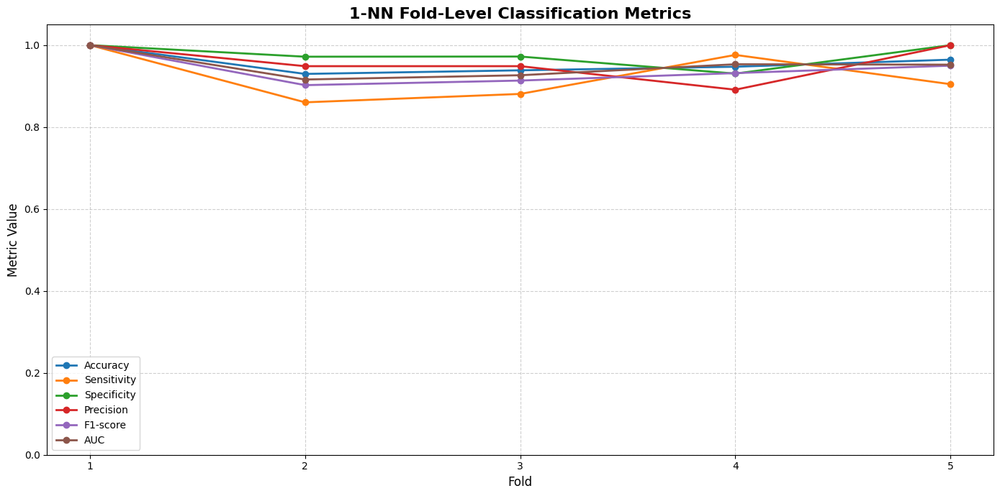

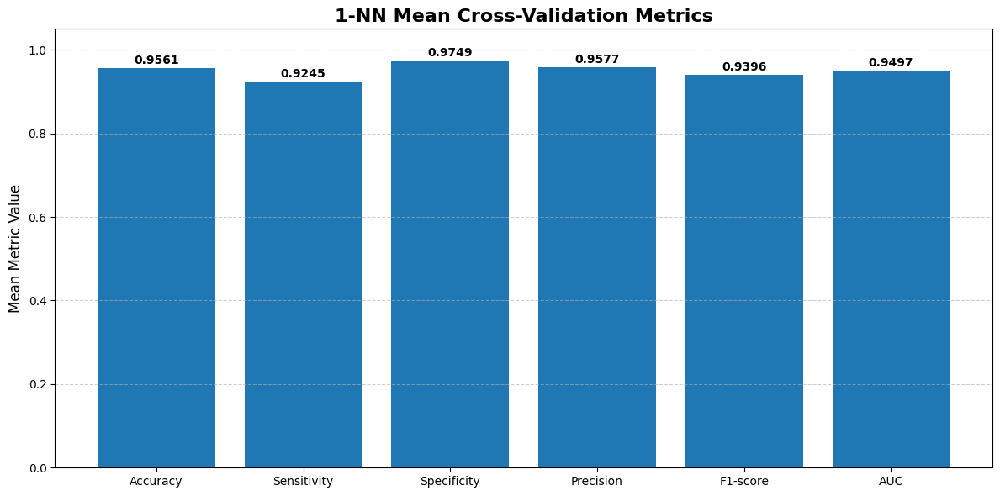

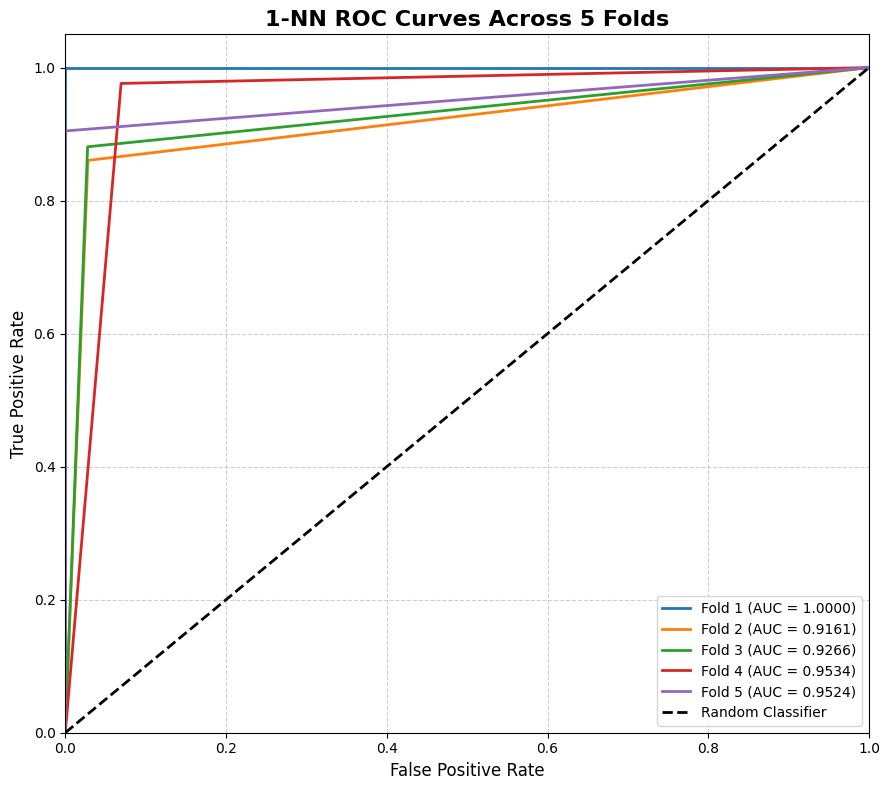

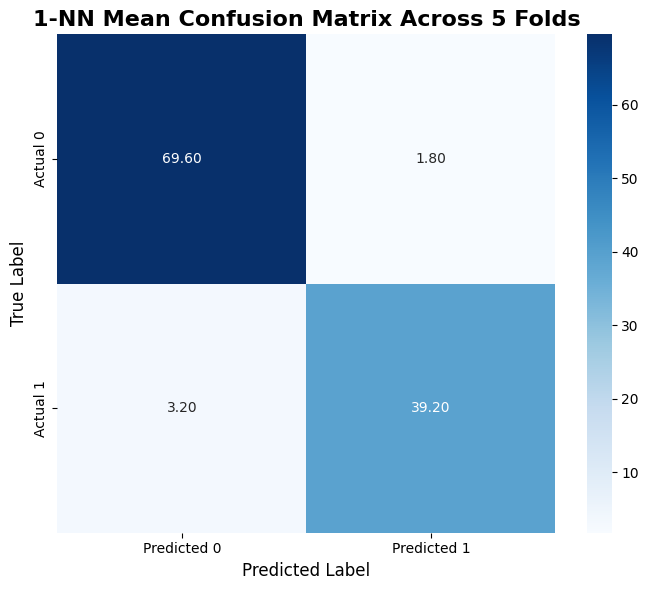

1-NN visual evaluation report is ready.

Compact metric summary:


,Metric,Mean,Std
0,Accuracy,0.956078,0.027715
1,Sensitivity,0.924474,0.060743
2,Specificity,0.974922,0.028474
3,Precision,0.957748,0.045134
4,F1-score,0.939567,0.038324
5,AUC,0.949698,0.032445



1-NN visual reporting pipeline completed successfully.


In [41]:
# ============================================================
# BOX 39 — 1-NN Visual Evaluation Report
#
# Purpose:
#   - Create visual evaluation reports for 1-NN
#   - Visualize fold-level classification metrics
#   - Plot ROC curves for all folds
#   - Plot mean confusion matrix
#   - Generate report-ready figures
#
# Visual Outputs:
#   1) Fold-level metric comparison
#   2) Mean metric summary
#   3) ROC curves for all folds
#   4) Mean confusion matrix heatmap
#
# Notes:
#   - This box does not retrain the model
#   - All results are derived from previous evaluation boxes
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "nn1_fold_results_df",
    "nn1_confusion_matrices",
    "nn1_roc_data"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]

if len(missing_objects) > 0:
    raise NameError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Define plotting metrics
# ------------------------------------------------------------
plot_metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 2 — Fold-level metric comparison plot
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in plot_metric_columns:

    plt.plot(
        nn1_fold_results_df["Fold"],
        nn1_fold_results_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    "1-NN Fold-Level Classification Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

plt.xticks(nn1_fold_results_df["Fold"])

plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)

plt.legend()

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 3 — Mean metric bar plot
# ------------------------------------------------------------
mean_metric_values = [
    nn1_fold_results_df[col].mean()
    for col in plot_metric_columns
]

plt.figure(figsize=(12, 6))

bars = plt.bar(
    plot_metric_columns,
    mean_metric_values
)

plt.title(
    "1-NN Mean Cross-Validation Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("Mean Metric Value", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

# ------------------------------------------------------------
# Step 3.1 — Add numeric labels above bars
# ------------------------------------------------------------
for bar, value in zip(bars, mean_metric_values):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.01,
        f"{value:.4f}",
        ha="center",
        fontsize=10,
        fontweight="bold"
    )

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 4 — ROC curves for all folds
# ------------------------------------------------------------
plt.figure(figsize=(9, 8))

for fold_roc_item in nn1_roc_data:

    fold_number = fold_roc_item["fold"]

    roc_data = fold_roc_item["roc_data"]

    plt.plot(
        roc_data["fpr"],
        roc_data["tpr"],
        linewidth=2,
        label=f"Fold {fold_number} (AUC = {roc_data['auc']:.4f})"
    )

# ------------------------------------------------------------
# Step 4.1 — Random classifier baseline
# ------------------------------------------------------------
plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    color="black",
    label="Random Classifier"
)

plt.title(
    "1-NN ROC Curves Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("False Positive Rate", fontsize=12)

plt.ylabel("True Positive Rate", fontsize=12)

plt.xlim(0, 1)

plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)

plt.legend(loc="lower right")

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 5 — Compute mean confusion matrix
# ------------------------------------------------------------
confusion_matrix_stack = np.array([
    item["matrix"]
    for item in nn1_confusion_matrices
])

mean_confusion_matrix = confusion_matrix_stack.mean(axis=0)

# ------------------------------------------------------------
# Step 6 — Plot mean confusion matrix heatmap
# ------------------------------------------------------------
plt.figure(figsize=(7, 6))

sns.heatmap(
    mean_confusion_matrix,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=True,
    xticklabels=["Predicted 0", "Predicted 1"],
    yticklabels=["Actual 0", "Actual 1"]
)

plt.title(
    "1-NN Mean Confusion Matrix Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Predicted Label", fontsize=12)

plt.ylabel("True Label", fontsize=12)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 7 — Create compact metric summary table
# ------------------------------------------------------------
nn1_visual_summary_df = pd.DataFrame({

    "Metric": plot_metric_columns,

    "Mean": [
        nn1_fold_results_df[col].mean()
        for col in plot_metric_columns
    ],

    "Std": [
        nn1_fold_results_df[col].std()
        for col in plot_metric_columns
    ]
})

nn1_visual_summary_df = nn1_visual_summary_df.round(6)

# ------------------------------------------------------------
# Step 8 — Display compact visual summary
# ------------------------------------------------------------
print("1-NN visual evaluation report is ready.")

print("\nCompact metric summary:")
display(nn1_visual_summary_df)

# ------------------------------------------------------------
# Step 9 — Store plot references
# ------------------------------------------------------------
all_model_metric_plots.append({
    "model": "1-NN",
    "plots": [
        "fold_level_metrics",
        "mean_metric_barplot",
        "roc_curves",
        "mean_confusion_matrix"
    ]
})


print("\n1-NN visual reporting pipeline completed successfully.")

In [42]:
# ============================================================
# BOX 40 — kNN Hyperparameter Search Space Definition
#
# Purpose:
#   - Define a fully analytical hyperparameter search space
#     for k-Nearest Neighbors (kNN)
#   - Avoid manual hyperparameter selection
#   - Prepare candidate configurations for downstream
#     5-Fold Cross-Validation experiments
#
# Hyperparameters:
#   1) Number of neighbors (k)
#   2) Neighbor weighting strategy
#   3) Distance metric
#
# Methodological Notes:
#   - Only odd k values are used to reduce tie probability
#   - Euclidean distance is implemented using:
#         metric = "minkowski"
#         p = 2
#   - Search space is intentionally controlled to:
#         a) avoid overfitting
#         b) avoid extremely large neighborhoods
#         c) maintain computational efficiency
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

# ------------------------------------------------------------
# Step 1 — Extract training size information
# ------------------------------------------------------------
first_fold_train_size = len(
    cv5_scaled_folds[0]["y_train"]
)

# ------------------------------------------------------------
# Step 2 — Define candidate k values
# ------------------------------------------------------------
# Rule:
#   - Use only odd values
#   - Start from 3 because 1-NN was already evaluated
#   - Limit upper bound to avoid excessively large neighborhoods
#
# Additional constraint:
#   k must remain much smaller than train size
# ------------------------------------------------------------

MAX_K_LIMIT = min(31, first_fold_train_size - 1)

candidate_k_values = list(
    range(3, MAX_K_LIMIT + 1, 2)
)

# ------------------------------------------------------------
# Step 3 — Define weighting strategies
# ------------------------------------------------------------
# uniform:
#   All neighbors contribute equally
#
# distance:
#   Closer neighbors receive larger influence
# ------------------------------------------------------------

candidate_weight_strategies = [
    "uniform",
    "distance"
]

# ------------------------------------------------------------
# Step 4 — Define distance metric configuration
# ------------------------------------------------------------
KNN_DISTANCE_METRIC = "minkowski"

KNN_DISTANCE_P = 2

KNN_DISTANCE_DESCRIPTION = "Euclidean Distance"

# ------------------------------------------------------------
# Step 5 — Build candidate configuration registry
# ------------------------------------------------------------
knn_candidate_configurations = []

configuration_counter = 1

for k_value in candidate_k_values:

    for weight_strategy in candidate_weight_strategies:

        configuration_record = {

            "config_id":
                f"KNN_CFG_{configuration_counter}",

            "n_neighbors":
                k_value,

            "weights":
                weight_strategy,

            "metric":
                KNN_DISTANCE_METRIC,

            "p":
                KNN_DISTANCE_P,

            "distance_description":
                KNN_DISTANCE_DESCRIPTION
        }

        knn_candidate_configurations.append(
            configuration_record
        )

        configuration_counter += 1

# ------------------------------------------------------------
# Step 6 — Convert registry to DataFrame
# ------------------------------------------------------------
knn_candidate_configurations_df = pd.DataFrame(
    knn_candidate_configurations
)

# ------------------------------------------------------------
# Step 7 — Safety checks
# ------------------------------------------------------------
if knn_candidate_configurations_df.empty:
    raise ValueError(
        "No kNN configurations were generated."
    )

if (
    knn_candidate_configurations_df["n_neighbors"]
    .min() <= 0
):
    raise ValueError(
        "Invalid k value detected."
    )

if (
    knn_candidate_configurations_df["n_neighbors"]
    .max() >= first_fold_train_size
):
    raise ValueError(
        "Some k values are too large for training folds."
    )

# ------------------------------------------------------------
# Step 8 — Build compact search-space summary
# ------------------------------------------------------------
knn_search_space_summary = {

    "Total_Configurations":
        len(knn_candidate_configurations_df),

    "Min_k":
        min(candidate_k_values),

    "Max_k":
        max(candidate_k_values),

    "Number_of_k_Values":
        len(candidate_k_values),

    "Weighting_Strategies":
        len(candidate_weight_strategies),

    "Distance_Metric":
        KNN_DISTANCE_DESCRIPTION
}

knn_search_space_summary_df = pd.DataFrame(
    [knn_search_space_summary]
)

# ------------------------------------------------------------
# Step 9 — Display search-space information
# ------------------------------------------------------------
print(
    "kNN hyperparameter search space is ready."
)

print("\nCandidate k values:")
print(candidate_k_values)

print("\nWeighting strategies:")
print(candidate_weight_strategies)

print("\nDistance metric:")
print(KNN_DISTANCE_DESCRIPTION)

print("\nSearch-space summary:")
display(knn_search_space_summary_df)

print("\nCandidate configurations:")
display(knn_candidate_configurations_df)

print(
    "\nkNN hyperparameter search space "
    "definition completed successfully."
)

kNN hyperparameter search space is ready.

Candidate k values:
[3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31]

Weighting strategies:
['uniform', 'distance']

Distance metric:
Euclidean Distance

Search-space summary:


,Total_Configurations,Min_k,Max_k,Number_of_k_Values,Weighting_Strategies,Distance_Metric
0,30,3,31,15,2,Euclidean Distance



Candidate configurations:


,config_id,n_neighbors,weights,metric,p,distance_description
0,KNN_CFG_1,3,uniform,minkowski,2,Euclidean Distance
1,KNN_CFG_2,3,distance,minkowski,2,Euclidean Distance
2,KNN_CFG_3,5,uniform,minkowski,2,Euclidean Distance
3,KNN_CFG_4,5,distance,minkowski,2,Euclidean Distance
4,KNN_CFG_5,7,uniform,minkowski,2,Euclidean Distance
5,KNN_CFG_6,7,distance,minkowski,2,Euclidean Distance
6,KNN_CFG_7,9,uniform,minkowski,2,Euclidean Distance
7,KNN_CFG_8,9,distance,minkowski,2,Euclidean Distance
8,KNN_CFG_9,11,uniform,minkowski,2,Euclidean Distance
9,KNN_CFG_10,11,distance,minkowski,2,Euclidean Distance



kNN hyperparameter search space definition completed successfully.


In [43]:
# ============================================================
# BOX 41 — kNN Hyperparameter 5-Fold Cross-Validation Evaluation
#
# Purpose:
#   - Evaluate all candidate kNN configurations
#     using Stratified 5-Fold Cross-Validation
#   - Compute fold-level classification metrics
#   - Perform fully analytical hyperparameter analysis
#   - Store all fold-level and configuration-level results
#
# Evaluated Hyperparameters:
#   - n_neighbors (k)
#   - weights
#
# Fixed Parameters:
#   - metric = minkowski
#   - p = 2 (Euclidean distance)
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "knn_candidate_configurations",
    "compute_binary_classification_metrics"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
knn_cv_all_results = []

knn_cv_fold_results = []

# ------------------------------------------------------------
# Step 2 — Evaluate all configurations
# ------------------------------------------------------------
for config in knn_candidate_configurations:

    # --------------------------------------------------------
    # Step 2.1 — Extract configuration information
    # --------------------------------------------------------
    config_id = config["config_id"]

    n_neighbors = config["n_neighbors"]

    weights = config["weights"]

    metric = config["metric"]

    p_value = config["p"]

    # --------------------------------------------------------
    # Step 2.2 — Initialize fold-level storage
    # --------------------------------------------------------
    current_config_fold_metrics = []

    # --------------------------------------------------------
    # Step 2.3 — Run Stratified 5-Fold CV
    # --------------------------------------------------------
    for fold_data in cv5_scaled_folds:

        fold_number = fold_data["fold_number"]

        X_train = fold_data["X_train_scaled"]

        X_val = fold_data["X_validation_scaled"]

        y_train = fold_data["y_train"]

        y_val = fold_data["y_validation"]

        # ----------------------------------------------------
        # Step 2.4 — Initialize kNN model
        # ----------------------------------------------------
        knn_model = KNeighborsClassifier(
            n_neighbors=n_neighbors,
            weights=weights,
            metric=metric,
            p=p_value
        )

        # ----------------------------------------------------
        # Step 2.5 — Train model
        # ----------------------------------------------------
        knn_model.fit(X_train, y_train)

        # ----------------------------------------------------
        # Step 2.6 — Generate predictions
        # ----------------------------------------------------
        y_pred = knn_model.predict(X_val)

        # ----------------------------------------------------
        # Step 2.7 — Generate probability scores
        # ----------------------------------------------------
        y_score = knn_model.predict_proba(X_val)[:, 1]

        # ----------------------------------------------------
        # Step 2.8 — Compute metrics
        # ----------------------------------------------------
        fold_metrics = (
            compute_binary_classification_metrics(
                y_true=y_val,
                y_pred=y_pred,
                y_score=y_score
            )
        )

        # ----------------------------------------------------
        # Step 2.9 — Build fold-level result row
        # ----------------------------------------------------
        fold_result_row = {

            "Config_ID":
                config_id,

            "Fold":
                fold_number,

            "n_neighbors":
                n_neighbors,

            "weights":
                weights,

            "metric":
                metric,

            "p":
                p_value,

            "Accuracy":
                fold_metrics["Accuracy"],

            "Sensitivity":
                fold_metrics["Sensitivity"],

            "Specificity":
                fold_metrics["Specificity"],

            "Precision":
                fold_metrics["Precision"],

            "F1-score":
                fold_metrics["F1-score"],

            "AUC":
                fold_metrics["AUC"],

            "TP":
                fold_metrics["TP"],

            "FP":
                fold_metrics["FP"],

            "FN":
                fold_metrics["FN"],

            "TN":
                fold_metrics["TN"]
        }

        # ----------------------------------------------------
        # Step 2.10 — Store fold results
        # ----------------------------------------------------
        current_config_fold_metrics.append(
            fold_result_row
        )

        knn_cv_fold_results.append(
            fold_result_row
        )

    # --------------------------------------------------------
    # Step 2.11 — Convert current fold metrics to DataFrame
    # --------------------------------------------------------
    current_config_df = pd.DataFrame(
        current_config_fold_metrics
    )

    # --------------------------------------------------------
    # Step 2.12 — Compute summary statistics
    # --------------------------------------------------------
    config_summary_row = {

        "Config_ID":
            config_id,

        "n_neighbors":
            n_neighbors,

        "weights":
            weights,

        "metric":
            metric,

        "p":
            p_value,

        "Mean_Accuracy":
            current_config_df["Accuracy"].mean(),

        "Std_Accuracy":
            current_config_df["Accuracy"].std(),

        "Mean_Sensitivity":
            current_config_df["Sensitivity"].mean(),

        "Std_Sensitivity":
            current_config_df["Sensitivity"].std(),

        "Mean_Specificity":
            current_config_df["Specificity"].mean(),

        "Std_Specificity":
            current_config_df["Specificity"].std(),

        "Mean_Precision":
            current_config_df["Precision"].mean(),

        "Std_Precision":
            current_config_df["Precision"].std(),

        "Mean_F1-score":
            current_config_df["F1-score"].mean(),

        "Std_F1-score":
            current_config_df["F1-score"].std(),

        "Mean_AUC":
            current_config_df["AUC"].mean(),

        "Std_AUC":
            current_config_df["AUC"].std(),

        "Min_AUC":
            current_config_df["AUC"].min(),

        "Max_AUC":
            current_config_df["AUC"].max()
    }

    # --------------------------------------------------------
    # Step 2.13 — Store summary row
    # --------------------------------------------------------
    knn_cv_all_results.append(
        config_summary_row
    )

# ------------------------------------------------------------
# Step 3 — Create final DataFrames
# ------------------------------------------------------------
knn_cv_fold_results_df = pd.DataFrame(
    knn_cv_fold_results
)

knn_cv_summary_results_df = pd.DataFrame(
    knn_cv_all_results
)

# ------------------------------------------------------------
# Step 4 — Sort configurations analytically
# ------------------------------------------------------------
knn_cv_summary_results_df = (
    knn_cv_summary_results_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC"
        ],
        ascending=[
            False,
            False,
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 5 — Create rounded display tables
# ------------------------------------------------------------
display_metric_columns = [
    col for col in knn_cv_summary_results_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
    )
]

knn_cv_summary_display_df = (
    knn_cv_summary_results_df.copy()
)

knn_cv_summary_display_df[
    display_metric_columns
] = (
    knn_cv_summary_display_df[
        display_metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 6 — Display evaluation summary
# ------------------------------------------------------------
print(
    "kNN hyperparameter evaluation completed."
)

print(
    "\nTotal evaluated configurations:"
)

print(
    len(knn_cv_summary_results_df)
)

print("\nTop configurations:")
display(
    knn_cv_summary_display_df.head(10)
)

# ------------------------------------------------------------
# Step 7 — Display fold-level results sample
# ------------------------------------------------------------
print(
    "\nFold-level results sample:"
)

display(
    knn_cv_fold_results_df.head(10)
)

print(
    "\nkNN 5-Fold hyperparameter "
    "evaluation completed successfully."
)

kNN hyperparameter evaluation completed.

Total evaluated configurations:
30

Top configurations:


,Config_ID,n_neighbors,weights,metric,p,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_Precision,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC
0,KNN_CFG_30,31,distance,minkowski,2,0.961357,0.021985,0.905759,0.061488,0.994405,0.007661,0.990086,0.013619,0.945021,0.032846,0.992181,0.007929,0.979001,0.997988
1,KNN_CFG_29,31,uniform,minkowski,2,0.956094,0.025535,0.896235,0.063045,0.991588,0.007679,0.984388,0.014354,0.937435,0.037652,0.991853,0.007882,0.979167,0.997988
2,KNN_CFG_28,29,distance,minkowski,2,0.959603,0.021087,0.905759,0.061488,0.991628,0.007643,0.985086,0.013658,0.942673,0.031640,0.991821,0.008490,0.978175,0.998323
3,KNN_CFG_27,29,uniform,minkowski,2,0.957848,0.022665,0.900997,0.064727,0.991628,0.007643,0.984943,0.013809,0.939951,0.034035,0.991592,0.008437,0.978175,0.998323
4,KNN_CFG_12,13,distance,minkowski,2,0.964866,0.020547,0.919934,0.060889,0.991628,0.007643,0.985324,0.013447,0.950458,0.030347,0.991499,0.009826,0.978505,0.999008
5,KNN_CFG_8,9,distance,minkowski,2,0.966636,0.022679,0.924585,0.050698,0.991667,0.012423,0.984866,0.022801,0.953256,0.032435,0.991329,0.010613,0.975529,0.999008
6,KNN_CFG_10,11,distance,minkowski,2,0.964866,0.021463,0.915172,0.056135,0.994444,0.007607,0.989859,0.013903,0.950289,0.031373,0.991297,0.010178,0.976687,0.998690
7,KNN_CFG_14,15,distance,minkowski,2,0.966620,0.022688,0.915172,0.056135,0.997222,0.006211,0.994737,0.011769,0.952640,0.033040,0.991104,0.010553,0.977017,0.999339
8,KNN_CFG_16,17,distance,minkowski,2,0.963127,0.019966,0.915172,0.056135,0.991628,0.007643,0.985086,0.013658,0.947993,0.029445,0.990906,0.010159,0.977679,0.998347
9,KNN_CFG_11,13,uniform,minkowski,2,0.964866,0.020547,0.919934,0.060889,0.991628,0.007643,0.985324,0.013447,0.950458,0.030347,0.990808,0.010285,0.977513,0.998491



Fold-level results sample:


,Config_ID,Fold,n_neighbors,weights,metric,p,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,KNN_CFG_1,1,3,uniform,minkowski,2,0.982456,0.953488,1.000000,1.000000,0.976190,0.998690,41,0,2,71
1,KNN_CFG_1,2,3,uniform,minkowski,2,0.956140,0.906977,0.985915,0.975000,0.939759,0.973796,39,1,4,70
2,KNN_CFG_1,3,3,uniform,minkowski,2,0.938596,0.880952,0.972222,0.948718,0.913580,0.948578,37,2,5,70
3,KNN_CFG_1,4,3,uniform,minkowski,2,0.973684,1.000000,0.958333,0.933333,0.965517,0.997520,42,3,0,69
4,KNN_CFG_1,5,3,uniform,minkowski,2,0.973451,0.928571,1.000000,1.000000,0.962963,0.986083,39,0,3,71
5,KNN_CFG_2,1,3,distance,minkowski,2,0.982456,0.953488,1.000000,1.000000,0.976190,0.999345,41,0,2,71
6,KNN_CFG_2,2,3,distance,minkowski,2,0.956140,0.906977,0.985915,0.975000,0.939759,0.973141,39,1,4,70
7,KNN_CFG_2,3,3,distance,minkowski,2,0.938596,0.880952,0.972222,0.948718,0.913580,0.949239,37,2,5,70
8,KNN_CFG_2,4,3,distance,minkowski,2,0.973684,1.000000,0.958333,0.933333,0.965517,0.998677,42,3,0,69
9,KNN_CFG_2,5,3,distance,minkowski,2,0.973451,0.928571,1.000000,1.000000,0.962963,0.986083,39,0,3,71



kNN 5-Fold hyperparameter evaluation completed successfully.


In [44]:
# ============================================================
# BOX 42 — kNN Hyperparameter Results Analysis Table
#
# Purpose:
#   - Create detailed analytical reporting tables
#     for all evaluated kNN configurations
#   - Validate configuration-level evaluation results
#   - Rank configurations analytically
#   - Generate report-ready tables for downstream analysis
#
# Analytical Objectives:
#   - Compare all kNN hyperparameter combinations
#   - Identify stable vs unstable configurations
#   - Analyze performance trade-offs
#   - Support fully evidence-based model selection
#
# Notes:
#   - No model training is performed in this box
#   - All results are derived from BOX 41
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "knn_cv_summary_results_df",
    "knn_cv_fold_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(
    knn_cv_summary_results_df,
    pd.DataFrame
):
    raise TypeError(
        "knn_cv_summary_results_df "
        "must be a pandas DataFrame."
    )

if not isinstance(
    knn_cv_fold_results_df,
    pd.DataFrame
):
    raise TypeError(
        "knn_cv_fold_results_df "
        "must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Define analytical ranking criteria
# ------------------------------------------------------------
ranking_priority = [

    "Mean_AUC",

    "Mean_Sensitivity",

    "Mean_F1-score",

    "Std_AUC"
]

# ------------------------------------------------------------
# Step 2 — Create ranked summary table
# ------------------------------------------------------------
knn_ranked_results_df = (
    knn_cv_summary_results_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "n_neighbors"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 3 — Add analytical ranking column
# ------------------------------------------------------------
knn_ranked_results_df.insert(
    0,
    "Rank",
    np.arange(
        1,
        len(knn_ranked_results_df) + 1
    )
)

# ------------------------------------------------------------
# Step 4 — Create compact analytical table
# ------------------------------------------------------------
compact_columns = [

    "Rank",

    "Config_ID",

    "n_neighbors",

    "weights",

    "Mean_Accuracy",
    "Std_Accuracy",

    "Mean_Sensitivity",
    "Std_Sensitivity",

    "Mean_Specificity",
    "Std_Specificity",

    "Mean_F1-score",
    "Std_F1-score",

    "Mean_AUC",
    "Std_AUC"
]

knn_compact_results_df = (
    knn_ranked_results_df[
        compact_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 5 — Create rounded display table
# ------------------------------------------------------------
metric_columns = [
    col for col in knn_compact_results_df.columns
    if (
        "Mean" in col
        or "Std" in col
    )
]

knn_compact_display_df = (
    knn_compact_results_df.copy()
)

knn_compact_display_df[
    metric_columns
] = (
    knn_compact_display_df[
        metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 6 — Identify best configuration
# ------------------------------------------------------------
best_knn_configuration = (
    knn_ranked_results_df.iloc[0]
)

best_knn_configuration_df = pd.DataFrame(
    [best_knn_configuration]
)

# ------------------------------------------------------------
# Step 7 — Create configuration stability analysis
# ------------------------------------------------------------
stability_analysis_df = (
    knn_ranked_results_df[
        [
            "Config_ID",
            "n_neighbors",
            "weights",
            "Std_Accuracy",
            "Std_Sensitivity",
            "Std_F1-score",
            "Std_AUC"
        ]
    ]
    .copy()
)

stability_analysis_df = (
    stability_analysis_df
    .sort_values(
        by="Std_AUC",
        ascending=True
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 8 — Create performance trade-off analysis
# ------------------------------------------------------------
tradeoff_analysis_df = (
    knn_ranked_results_df[
        [
            "Config_ID",
            "n_neighbors",
            "weights",
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_Specificity",
            "Mean_F1-score"
        ]
    ]
    .copy()
)

tradeoff_analysis_df = (
    tradeoff_analysis_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity"
        ],
        ascending=[
            False,
            False
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 9 — Create styled analytical table
# ------------------------------------------------------------
knn_analysis_styled = (
    knn_compact_display_df
    .style
    .set_caption(
        "kNN Hyperparameter Cross-Validation Analysis"
    )
    .format({
        col: "{:.6f}"
        for col in metric_columns
    })
    .background_gradient(
        subset=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score"
        ],
        cmap="Greens"
    )
    .background_gradient(
        subset=[
            "Std_AUC",
            "Std_Accuracy"
        ],
        cmap="Reds_r"
    )
    .set_table_styles([
        {
            "selector": "caption",
            "props": [
                ("caption-side", "top"),
                ("font-size", "16px"),
                ("font-weight", "bold"),
                ("text-align", "center")
            ]
        },
        {
            "selector": "th",
            "props": [
                ("text-align", "center"),
                ("font-weight", "bold")
            ]
        },
        {
            "selector": "td",
            "props": [
                ("text-align", "center")
            ]
        }
    ])
)

# ------------------------------------------------------------
# Step 10 — Display analytical reports
# ------------------------------------------------------------
print(
    "kNN analytical reporting tables are ready."
)

print(
    "\nAnalytical ranking criteria:"
)

for idx, criterion in enumerate(
    ranking_priority,
    start=1
):
    print(f"{idx}. {criterion}")

print("\nTop 15 configurations:")
display(
    knn_analysis_styled
)

# ------------------------------------------------------------
# Step 11 — Display best configuration
# ------------------------------------------------------------
print(
    "\nBest kNN configuration:"
)

display(
    best_knn_configuration_df.round(6)
)

# ------------------------------------------------------------
# Step 12 — Display stability analysis
# ------------------------------------------------------------
print(
    "\nMost stable configurations "
    "(lowest Std_AUC):"
)

display(
    stability_analysis_df
    .head(10)
    .round(6)
)

# ------------------------------------------------------------
# Step 13 — Display performance trade-off analysis
# ------------------------------------------------------------
print(
    "\nPerformance trade-off analysis:"
)

display(
    tradeoff_analysis_df
    .head(10)
    .round(6)
)

print(
    "\nkNN analytical reporting "
    "completed successfully."
)

kNN analytical reporting tables are ready.

Analytical ranking criteria:
1. Mean_AUC
2. Mean_Sensitivity
3. Mean_F1-score
4. Std_AUC

Top 15 configurations:


,Rank,Config_ID,n_neighbors,weights,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC
0,1,KNN_CFG_30,31,distance,0.961357,0.021985,0.905759,0.061488,0.994405,0.007661,0.945021,0.032846,0.992181,0.007929
1,2,KNN_CFG_29,31,uniform,0.956094,0.025535,0.896235,0.063045,0.991588,0.007679,0.937435,0.037652,0.991853,0.007882
2,3,KNN_CFG_28,29,distance,0.959603,0.021087,0.905759,0.061488,0.991628,0.007643,0.942673,0.031640,0.991821,0.008490
3,4,KNN_CFG_27,29,uniform,0.957848,0.022665,0.900997,0.064727,0.991628,0.007643,0.939951,0.034035,0.991592,0.008437
4,5,KNN_CFG_12,13,distance,0.964866,0.020547,0.919934,0.060889,0.991628,0.007643,0.950458,0.030347,0.991499,0.009826
5,6,KNN_CFG_8,9,distance,0.966636,0.022679,0.924585,0.050698,0.991667,0.012423,0.953256,0.032435,0.991329,0.010613
6,7,KNN_CFG_10,11,distance,0.964866,0.021463,0.915172,0.056135,0.994444,0.007607,0.950289,0.031373,0.991297,0.010178
7,8,KNN_CFG_14,15,distance,0.966620,0.022688,0.915172,0.056135,0.997222,0.006211,0.952640,0.033040,0.991104,0.010553
8,9,KNN_CFG_16,17,distance,0.963127,0.019966,0.915172,0.056135,0.991628,0.007643,0.947993,0.029445,0.990906,0.010159
9,10,KNN_CFG_11,13,uniform,0.964866,0.020547,0.919934,0.060889,0.991628,0.007643,0.950458,0.030347,0.990808,0.010285



Best kNN configuration:


,Rank,Config_ID,n_neighbors,weights,metric,p,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_Precision,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC
0,1,KNN_CFG_30,31,distance,minkowski,2,0.961357,0.021985,0.905759,0.061488,0.994405,0.007661,0.990086,0.013619,0.945021,0.032846,0.992181,0.007929,0.979001,0.997988



Most stable configurations (lowest Std_AUC):


,Config_ID,n_neighbors,weights,Std_Accuracy,Std_Sensitivity,Std_F1-score,Std_AUC
0,KNN_CFG_29,31,uniform,0.025535,0.063045,0.037652,0.007882
1,KNN_CFG_30,31,distance,0.021985,0.061488,0.032846,0.007929
2,KNN_CFG_27,29,uniform,0.022665,0.064727,0.034035,0.008437
3,KNN_CFG_28,29,distance,0.021087,0.061488,0.031640,0.008490
4,KNN_CFG_12,13,distance,0.020547,0.060889,0.030347,0.009826
5,KNN_CFG_9,11,uniform,0.021463,0.056135,0.031373,0.010078
6,KNN_CFG_16,17,distance,0.019966,0.056135,0.029445,0.010159
7,KNN_CFG_10,11,distance,0.021463,0.056135,0.031373,0.010178
8,KNN_CFG_11,13,uniform,0.020547,0.060889,0.030347,0.010285
9,KNN_CFG_7,9,uniform,0.022679,0.050698,0.032435,0.010467



Performance trade-off analysis:


,Config_ID,n_neighbors,weights,Mean_AUC,Mean_Sensitivity,Mean_Specificity,Mean_F1-score
0,KNN_CFG_30,31,distance,0.992181,0.905759,0.994405,0.945021
1,KNN_CFG_29,31,uniform,0.991853,0.896235,0.991588,0.937435
2,KNN_CFG_28,29,distance,0.991821,0.905759,0.991628,0.942673
3,KNN_CFG_27,29,uniform,0.991592,0.900997,0.991628,0.939951
4,KNN_CFG_12,13,distance,0.991499,0.919934,0.991628,0.950458
5,KNN_CFG_8,9,distance,0.991329,0.924585,0.991667,0.953256
6,KNN_CFG_10,11,distance,0.991297,0.915172,0.994444,0.950289
7,KNN_CFG_14,15,distance,0.991104,0.915172,0.997222,0.952640
8,KNN_CFG_16,17,distance,0.990906,0.915172,0.991628,0.947993
9,KNN_CFG_11,13,uniform,0.990808,0.919934,0.991628,0.950458



kNN analytical reporting completed successfully.


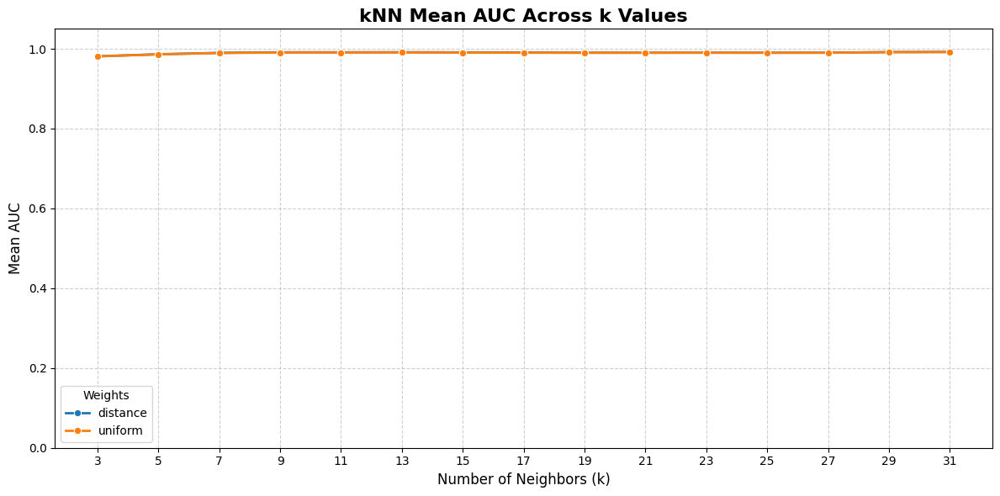

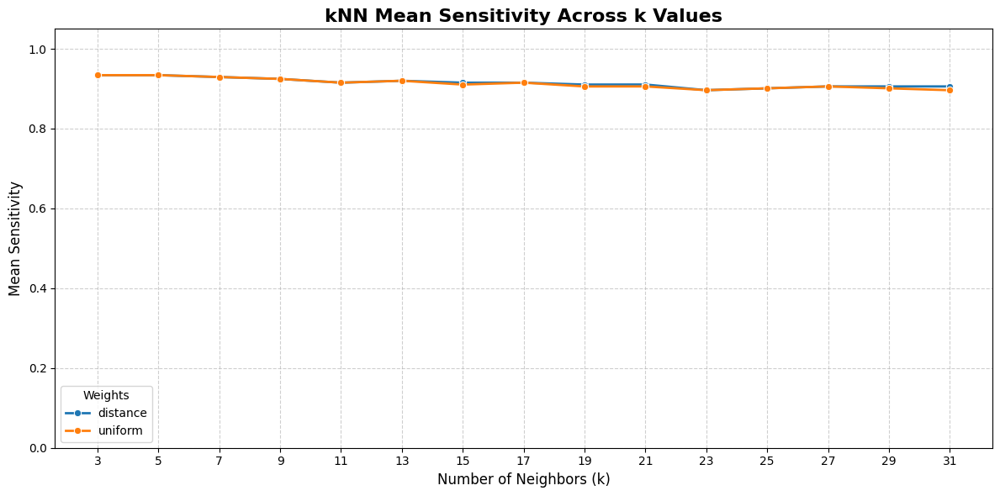

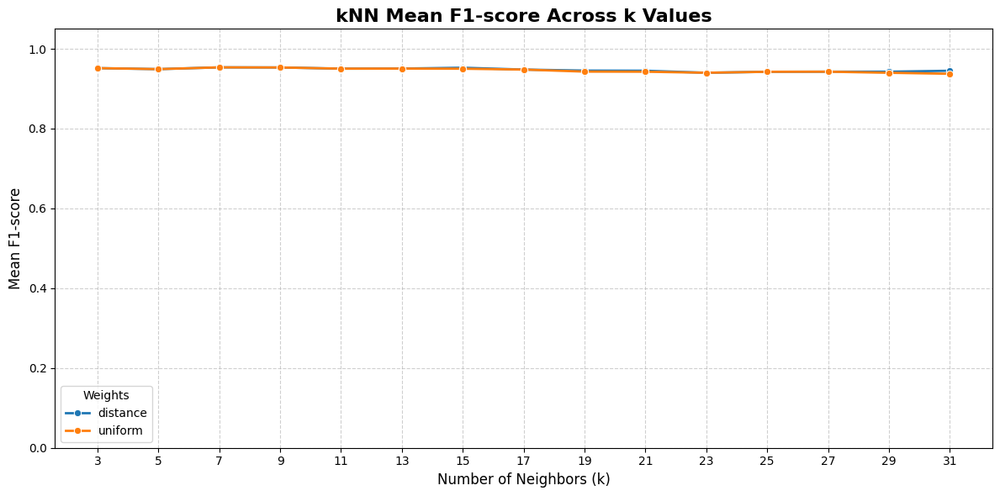

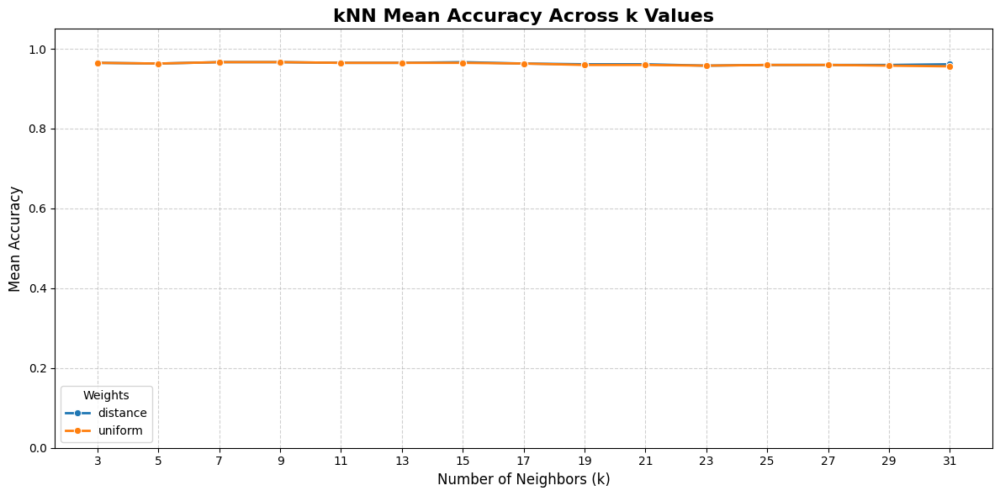

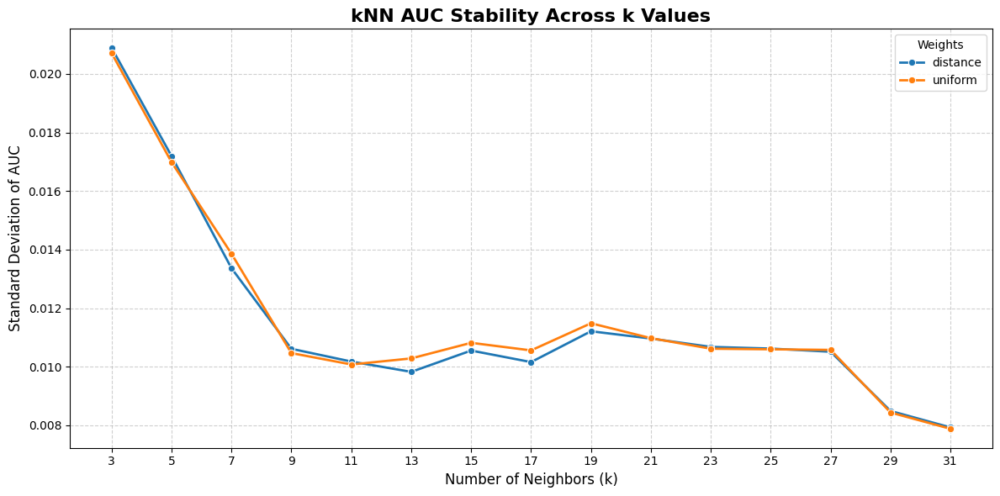

kNN weighting strategy comparison:


,weights,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Mean_Accuracy_Average,Mean_Accuracy_Max,Std_AUC_Average,Std_AUC_Min
0,distance,0.989955,0.992181,0.914862,0.933998,0.947477,0.953545,0.962757,0.966636,0.011545,0.007929
1,uniform,0.989514,0.991853,0.912957,0.933998,0.946288,0.953545,0.961939,0.966636,0.011621,0.007882


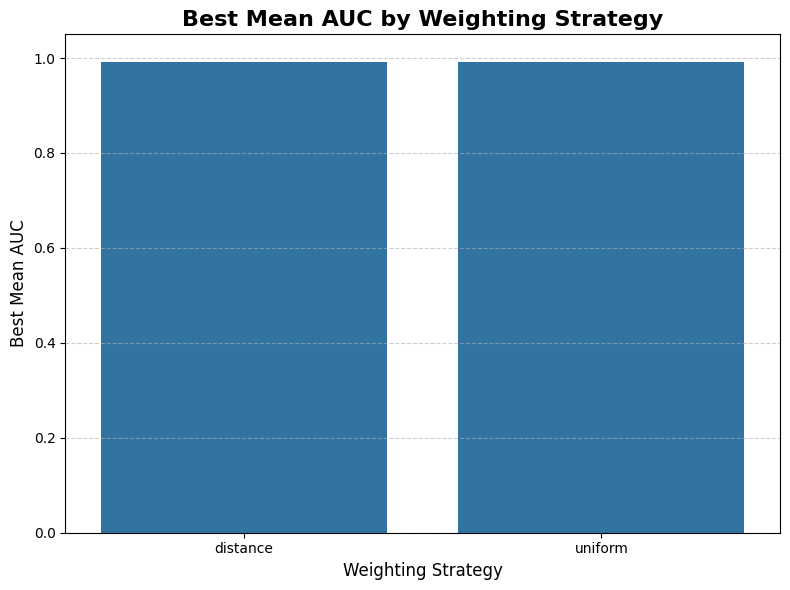

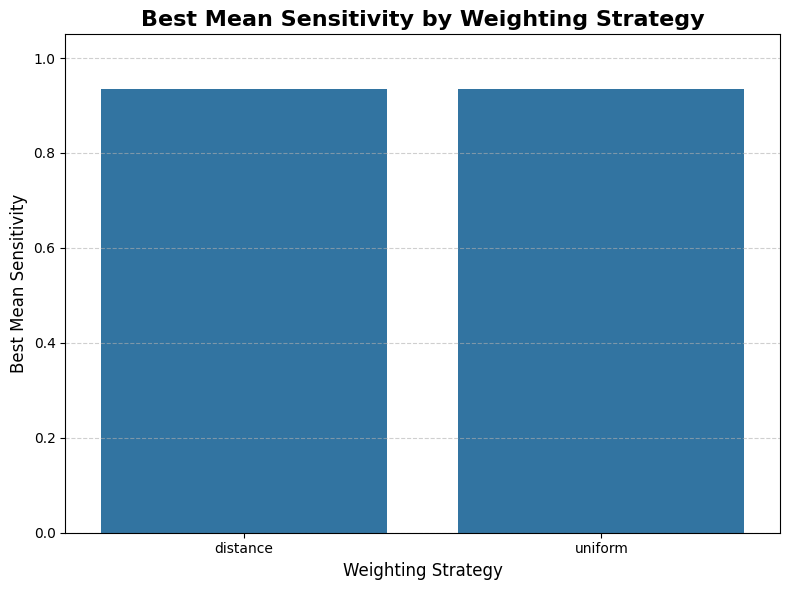

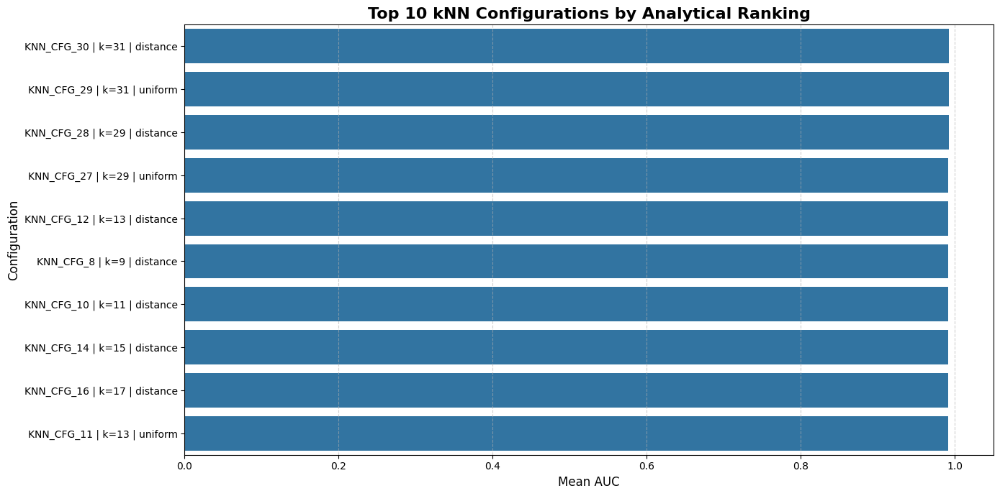


kNN hyperparameter selection plots completed successfully.


In [45]:
# ============================================================
# BOX 43 — kNN Hyperparameter Selection Plots
#
# Purpose:
#   - Visualize kNN hyperparameter search results
#   - Analyze performance trends across k values
#   - Compare weighting strategies
#   - Support fully evidence-based hyperparameter selection
#
# Visual Outputs:
#   1) Mean AUC vs k
#   2) Mean Sensitivity vs k
#   3) Mean F1-score vs k
#   4) Mean Accuracy vs k
#   5) AUC stability vs k
#   6) Analytical comparison of uniform vs distance weights
#
# Notes:
#   - No model training is performed in this box
#   - All plots are derived from BOX 41 and BOX 42 outputs
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "knn_ranked_results_df",
    "knn_cv_summary_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(knn_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "knn_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(knn_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "knn_cv_summary_results_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Prepare plotting DataFrame
# ------------------------------------------------------------
knn_plot_df = (
    knn_cv_summary_results_df
    .copy()
    .sort_values(
        by=[
            "weights",
            "n_neighbors"
        ],
        ascending=[
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

required_plot_columns = [
    "n_neighbors",
    "weights",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Sensitivity",
    "Mean_F1-score",
    "Mean_Accuracy"
]

missing_plot_columns = [
    col for col in required_plot_columns
    if col not in knn_plot_df.columns
]

if len(missing_plot_columns) > 0:
    raise ValueError(
        f"Missing required plot columns: {missing_plot_columns}"
    )

# ------------------------------------------------------------
# Step 2 — Define common plotting function
# ------------------------------------------------------------
def plot_knn_metric_vs_k(
    data,
    metric_column,
    title,
    ylabel
):
    """
    Plot a selected kNN metric against k values
    for each weighting strategy.
    """

    plt.figure(figsize=(12, 6))

    sns.lineplot(
        data=data,
        x="n_neighbors",
        y=metric_column,
        hue="weights",
        marker="o",
        linewidth=2
    )

    plt.title(
        title,
        fontsize=16,
        fontweight="bold"
    )

    plt.xlabel(
        "Number of Neighbors (k)",
        fontsize=12
    )

    plt.ylabel(
        ylabel,
        fontsize=12
    )

    plt.xticks(
        sorted(data["n_neighbors"].unique())
    )

    plt.ylim(
        0,
        1.05
    )

    plt.grid(
        True,
        linestyle="--",
        alpha=0.6
    )

    plt.legend(
        title="Weights"
    )

    plt.tight_layout()

    plt.show()

# ------------------------------------------------------------
# Step 3 — Plot Mean AUC vs k
# ------------------------------------------------------------
plot_knn_metric_vs_k(
    data=knn_plot_df,
    metric_column="Mean_AUC",
    title="kNN Mean AUC Across k Values",
    ylabel="Mean AUC"
)

# ------------------------------------------------------------
# Step 4 — Plot Mean Sensitivity vs k
# ------------------------------------------------------------
plot_knn_metric_vs_k(
    data=knn_plot_df,
    metric_column="Mean_Sensitivity",
    title="kNN Mean Sensitivity Across k Values",
    ylabel="Mean Sensitivity"
)

# ------------------------------------------------------------
# Step 5 — Plot Mean F1-score vs k
# ------------------------------------------------------------
plot_knn_metric_vs_k(
    data=knn_plot_df,
    metric_column="Mean_F1-score",
    title="kNN Mean F1-score Across k Values",
    ylabel="Mean F1-score"
)

# ------------------------------------------------------------
# Step 6 — Plot Mean Accuracy vs k
# ------------------------------------------------------------
plot_knn_metric_vs_k(
    data=knn_plot_df,
    metric_column="Mean_Accuracy",
    title="kNN Mean Accuracy Across k Values",
    ylabel="Mean Accuracy"
)

# ------------------------------------------------------------
# Step 7 — Plot AUC stability using Std_AUC
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=knn_plot_df,
    x="n_neighbors",
    y="Std_AUC",
    hue="weights",
    marker="o",
    linewidth=2
)

plt.title(
    "kNN AUC Stability Across k Values",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Number of Neighbors (k)",
    fontsize=12
)

plt.ylabel(
    "Standard Deviation of AUC",
    fontsize=12
)

plt.xticks(
    sorted(knn_plot_df["n_neighbors"].unique())
)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.legend(
    title="Weights"
)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 8 — Create weighted strategy comparison table
# ------------------------------------------------------------
knn_weight_strategy_comparison_df = (
    knn_plot_df
    .groupby("weights")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Mean_Accuracy_Average=("Mean_Accuracy", "mean"),
        Mean_Accuracy_Max=("Mean_Accuracy", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min")
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 9 — Display strategy comparison table
# ------------------------------------------------------------
print(
    "kNN weighting strategy comparison:"
)

display(
    knn_weight_strategy_comparison_df.round(6)
)

# ------------------------------------------------------------
# Step 10 — Plot best AUC by weighting strategy
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=knn_weight_strategy_comparison_df,
    x="weights",
    y="Mean_AUC_Max"
)

plt.title(
    "Best Mean AUC by Weighting Strategy",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Weighting Strategy",
    fontsize=12
)

plt.ylabel(
    "Best Mean AUC",
    fontsize=12
)

plt.ylim(
    0,
    1.05
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 11 — Plot best sensitivity by weighting strategy
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=knn_weight_strategy_comparison_df,
    x="weights",
    y="Mean_Sensitivity_Max"
)

plt.title(
    "Best Mean Sensitivity by Weighting Strategy",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Weighting Strategy",
    fontsize=12
)

plt.ylabel(
    "Best Mean Sensitivity",
    fontsize=12
)

plt.ylim(
    0,
    1.05
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 12 — Highlight top configurations visually
# ------------------------------------------------------------
top_knn_plot_df = (
    knn_ranked_results_df
    .head(10)
    .copy()
)

top_knn_plot_df["Config_Label"] = (
    top_knn_plot_df["Config_ID"].astype(str)
    + " | k="
    + top_knn_plot_df["n_neighbors"].astype(str)
    + " | "
    + top_knn_plot_df["weights"].astype(str)
)

plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_knn_plot_df,
    x="Mean_AUC",
    y="Config_Label"
)

plt.title(
    "Top 10 kNN Configurations by Analytical Ranking",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Mean AUC",
    fontsize=12
)

plt.ylabel(
    "Configuration",
    fontsize=12
)

plt.xlim(
    0,
    1.05
)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()

plt.show()

print(
    "\nkNN hyperparameter selection "
    "plots completed successfully."
)

In [46]:
# ============================================================
# BOX 44 — Analytical Best kNN Configuration Selection
#
# Purpose:
#   - Select the best kNN configuration analytically
#   - Avoid manual hyperparameter selection
#   - Apply a fully reproducible ranking strategy
#   - Generate final model-selection reports
#
# Selection Priority:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Smallest k (simpler model)
#
# Notes:
#   - No model training is performed in this box
#   - Results are derived from previous CV analysis
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "knn_ranked_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(
    knn_ranked_results_df,
    pd.DataFrame
):
    raise TypeError(
        "knn_ranked_results_df must be a pandas DataFrame."
    )

if knn_ranked_results_df.empty:
    raise ValueError(
        "knn_ranked_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Apply analytical ranking strategy
# ------------------------------------------------------------
knn_final_ranking_df = (
    knn_ranked_results_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "n_neighbors"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 2 — Select best configuration
# ------------------------------------------------------------
best_knn_configuration = (
    knn_final_ranking_df.iloc[0]
)

# ------------------------------------------------------------
# Step 3 — Extract best hyperparameters
# ------------------------------------------------------------
BEST_KNN_CONFIG_ID = (
    best_knn_configuration["Config_ID"]
)

BEST_KNN_N_NEIGHBORS = int(
    best_knn_configuration["n_neighbors"]
)

BEST_KNN_WEIGHTS = (
    best_knn_configuration["weights"]
)

BEST_KNN_METRIC = (
    best_knn_configuration["metric"]
)

BEST_KNN_P = int(
    best_knn_configuration["p"]
)

# ------------------------------------------------------------
# Step 4 — Create best-configuration report
# ------------------------------------------------------------
best_knn_configuration_report = {

    "Config_ID":
        BEST_KNN_CONFIG_ID,

    "n_neighbors":
        BEST_KNN_N_NEIGHBORS,

    "weights":
        BEST_KNN_WEIGHTS,

    "metric":
        BEST_KNN_METRIC,

    "p":
        BEST_KNN_P,

    "Mean_Accuracy":
        best_knn_configuration["Mean_Accuracy"],

    "Std_Accuracy":
        best_knn_configuration["Std_Accuracy"],

    "Mean_Sensitivity":
        best_knn_configuration["Mean_Sensitivity"],

    "Std_Sensitivity":
        best_knn_configuration["Std_Sensitivity"],

    "Mean_Specificity":
        best_knn_configuration["Mean_Specificity"],

    "Std_Specificity":
        best_knn_configuration["Std_Specificity"],

    "Mean_F1-score":
        best_knn_configuration["Mean_F1-score"],

    "Std_F1-score":
        best_knn_configuration["Std_F1-score"],

    "Mean_AUC":
        best_knn_configuration["Mean_AUC"],

    "Std_AUC":
        best_knn_configuration["Std_AUC"]
}

best_knn_configuration_df = pd.DataFrame(
    [best_knn_configuration_report]
)

# ------------------------------------------------------------
# Step 5 — Create top-5 comparison table
# ------------------------------------------------------------
top5_knn_configurations_df = (
    knn_final_ranking_df
    .head(5)
    .copy()
)

top5_display_columns = [

    "Config_ID",

    "n_neighbors",

    "weights",

    "Mean_Accuracy",

    "Mean_Sensitivity",

    "Mean_Specificity",

    "Mean_F1-score",

    "Mean_AUC",

    "Std_AUC"
]

top5_knn_configurations_df = (
    top5_knn_configurations_df[
        top5_display_columns
    ]
)

# ------------------------------------------------------------
# Step 6 — Create rounded display tables
# ------------------------------------------------------------
metric_columns = [
    col for col in best_knn_configuration_df.columns
    if (
        "Mean" in col
        or "Std" in col
    )
]

best_knn_configuration_display_df = (
    best_knn_configuration_df.copy()
)

best_knn_configuration_display_df[
    metric_columns
] = (
    best_knn_configuration_display_df[
        metric_columns
    ].round(6)
)

top5_knn_display_df = (
    top5_knn_configurations_df.copy()
)

top5_metric_columns = [
    col for col in top5_knn_display_df.columns
    if "Mean" in col or "Std" in col
]

top5_knn_display_df[
    top5_metric_columns
] = (
    top5_knn_display_df[
        top5_metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 7 — Create analytical interpretation report
# ------------------------------------------------------------
knn_selection_interpretation = {

    "Selected_Model":
        "kNN",

    "Selection_Method":
        "Fully Analytical Cross-Validation Ranking",

    "Primary_Criterion":
        "Highest Mean_AUC",

    "Secondary_Criterion":
        "Highest Mean_Sensitivity",

    "Stability_Criterion":
        "Lowest Std_AUC",

    "Model_Simplicity_Criterion":
        "Smallest k in case of ties"
}

knn_selection_interpretation_df = pd.DataFrame(
    [knn_selection_interpretation]
)

# ------------------------------------------------------------
# Step 8 — Display analytical selection results
# ------------------------------------------------------------
print(
    "Analytical best kNN configuration selected."
)

print("\nSelection criteria:")
display(
    knn_selection_interpretation_df
)

print("\nBest kNN configuration:")
display(
    best_knn_configuration_display_df
)

print("\nTop 5 ranked configurations:")
display(
    top5_knn_display_df
)

# ------------------------------------------------------------
# Step 9 — Store final metadata
# ------------------------------------------------------------
best_knn_metadata = {

    "model_name":
        "kNN",

    "config_id":
        BEST_KNN_CONFIG_ID,

    "n_neighbors":
        BEST_KNN_N_NEIGHBORS,

    "weights":
        BEST_KNN_WEIGHTS,

    "metric":
        BEST_KNN_METRIC,

    "p":
        BEST_KNN_P
}

# ------------------------------------------------------------
# Step 10 — Final confirmation
# ------------------------------------------------------------
print("\nSelected hyperparameters:")
print(f"n_neighbors : {BEST_KNN_N_NEIGHBORS}")
print(f"weights      : {BEST_KNN_WEIGHTS}")
print(f"metric       : {BEST_KNN_METRIC}")
print(f"p            : {BEST_KNN_P}")

print(
    "\nAnalytical kNN model selection "
    "completed successfully."
)

Analytical best kNN configuration selected.

Selection criteria:


,Selected_Model,Selection_Method,Primary_Criterion,Secondary_Criterion,Stability_Criterion,Model_Simplicity_Criterion
0,kNN,Fully Analytical Cross-Validation Ranking,Highest Mean_AUC,Highest Mean_Sensitivity,Lowest Std_AUC,Smallest k in case of ties



Best kNN configuration:


,Config_ID,n_neighbors,weights,metric,p,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC
0,KNN_CFG_30,31,distance,minkowski,2,0.961357,0.021985,0.905759,0.061488,0.994405,0.007661,0.945021,0.032846,0.992181,0.007929



Top 5 ranked configurations:


,Config_ID,n_neighbors,weights,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC
0,KNN_CFG_30,31,distance,0.961357,0.905759,0.994405,0.945021,0.992181,0.007929
1,KNN_CFG_29,31,uniform,0.956094,0.896235,0.991588,0.937435,0.991853,0.007882
2,KNN_CFG_28,29,distance,0.959603,0.905759,0.991628,0.942673,0.991821,0.008490
3,KNN_CFG_27,29,uniform,0.957848,0.900997,0.991628,0.939951,0.991592,0.008437
4,KNN_CFG_12,13,distance,0.964866,0.919934,0.991628,0.950458,0.991499,0.009826



Selected hyperparameters:
n_neighbors : 31
weights      : distance
metric       : minkowski
p            : 2

Analytical kNN model selection completed successfully.


In [47]:
# ============================================================
# BOX 45 — Final kNN 5-Fold Evaluation Using Best Configuration
#
# Purpose:
#   - Train and evaluate the final selected kNN model
#   - Use analytically selected hyperparameters
#   - Perform fold-by-fold evaluation using Stratified 5-Fold CV
#   - Generate standardized outputs for final reporting
#
# Selected Hyperparameters:
#   - Derived analytically from BOX 44
#   - No manual hyperparameter selection
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "BEST_KNN_N_NEIGHBORS",
    "BEST_KNN_WEIGHTS",
    "BEST_KNN_METRIC",
    "BEST_KNN_P",
    "compute_binary_classification_metrics",
    "compute_roc_curve_data"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Define final model metadata
# ------------------------------------------------------------
FINAL_KNN_MODEL_NAME = "kNN"

# ------------------------------------------------------------
# Step 2 — Initialize storage containers
# ------------------------------------------------------------
final_knn_fold_results = []

final_knn_confusion_matrices = []

final_knn_roc_data = []

final_knn_trained_models = []

# ------------------------------------------------------------
# Step 3 — Run fold-by-fold final evaluation
# ------------------------------------------------------------
for fold_data in cv5_scaled_folds:

    # --------------------------------------------------------
    # Step 3.1 — Extract fold data
    # --------------------------------------------------------
    fold_number = fold_data["fold_number"]

    X_train = fold_data["X_train_scaled"]

    X_val = fold_data["X_validation_scaled"]

    y_train = fold_data["y_train"]

    y_val = fold_data["y_validation"]

    # --------------------------------------------------------
    # Step 3.2 — Initialize final kNN model
    # --------------------------------------------------------
    final_knn_model = KNeighborsClassifier(
        n_neighbors=BEST_KNN_N_NEIGHBORS,
        weights=BEST_KNN_WEIGHTS,
        metric=BEST_KNN_METRIC,
        p=BEST_KNN_P
    )

    # --------------------------------------------------------
    # Step 3.3 — Train final model
    # --------------------------------------------------------
    final_knn_model.fit(X_train, y_train)

    # --------------------------------------------------------
    # Step 3.4 — Generate predictions
    # --------------------------------------------------------
    y_pred = final_knn_model.predict(X_val)

    # --------------------------------------------------------
    # Step 3.5 — Generate probability scores
    # --------------------------------------------------------
    y_score = (
        final_knn_model
        .predict_proba(X_val)[:, 1]
    )

    # --------------------------------------------------------
    # Step 3.6 — Compute evaluation metrics
    # --------------------------------------------------------
    fold_metrics = (
        compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )
    )

    # --------------------------------------------------------
    # Step 3.7 — Generate ROC curve data
    # --------------------------------------------------------
    fold_roc_data = (
        compute_roc_curve_data(
            y_true=y_val,
            y_score=y_score
        )
    )

    # --------------------------------------------------------
    # Step 3.8 — Build confusion matrix
    # --------------------------------------------------------
    confusion_mat = np.array([
        [fold_metrics["TN"], fold_metrics["FP"]],
        [fold_metrics["FN"], fold_metrics["TP"]]
    ])

    # --------------------------------------------------------
    # Step 3.9 — Store fold-level results
    # --------------------------------------------------------
    fold_result_row = {

        "Model":
            FINAL_KNN_MODEL_NAME,

        "Fold":
            fold_number,

        "n_neighbors":
            BEST_KNN_N_NEIGHBORS,

        "weights":
            BEST_KNN_WEIGHTS,

        "Accuracy":
            fold_metrics["Accuracy"],

        "Sensitivity":
            fold_metrics["Sensitivity"],

        "Specificity":
            fold_metrics["Specificity"],

        "Precision":
            fold_metrics["Precision"],

        "F1-score":
            fold_metrics["F1-score"],

        "AUC":
            fold_metrics["AUC"],

        "TP":
            fold_metrics["TP"],

        "FP":
            fold_metrics["FP"],

        "FN":
            fold_metrics["FN"],

        "TN":
            fold_metrics["TN"]
    }

    final_knn_fold_results.append(
        fold_result_row
    )

    # --------------------------------------------------------
    # Step 3.10 — Store confusion matrices
    # --------------------------------------------------------
    final_knn_confusion_matrices.append({

        "fold":
            fold_number,

        "matrix":
            confusion_mat
    })

    # --------------------------------------------------------
    # Step 3.11 — Store ROC data
    # --------------------------------------------------------
    final_knn_roc_data.append({

        "fold":
            fold_number,

        "roc_data":
            fold_roc_data
    })

    # --------------------------------------------------------
    # Step 3.12 — Store trained models
    # --------------------------------------------------------
    final_knn_trained_models.append({

        "fold":
            fold_number,

        "model":
            final_knn_model
    })

# ------------------------------------------------------------
# Step 4 — Create fold-level DataFrame
# ------------------------------------------------------------
final_knn_fold_results_df = pd.DataFrame(
    final_knn_fold_results
)

# ------------------------------------------------------------
# Step 5 — Compute summary statistics
# ------------------------------------------------------------
summary_metric_columns = [

    "Accuracy",

    "Sensitivity",

    "Specificity",

    "Precision",

    "F1-score",

    "AUC"
]

final_knn_summary_rows = []

for metric_name in summary_metric_columns:

    metric_values = (
        final_knn_fold_results_df[metric_name]
    )

    summary_row = {

        "Metric":
            metric_name,

        "Mean":
            metric_values.mean(),

        "Std":
            metric_values.std(),

        "Min":
            metric_values.min(),

        "Max":
            metric_values.max()
    }

    final_knn_summary_rows.append(
        summary_row
    )

final_knn_summary_results_df = pd.DataFrame(
    final_knn_summary_rows
)

# ------------------------------------------------------------
# Step 6 — Create rounded display tables
# ------------------------------------------------------------
final_knn_fold_display_df = (
    final_knn_fold_results_df.copy()
)

metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

final_knn_fold_display_df[
    metric_columns
] = (
    final_knn_fold_display_df[
        metric_columns
    ].round(6)
)

final_knn_summary_display_df = (
    final_knn_summary_results_df.copy()
)

summary_numeric_columns = [
    "Mean",
    "Std",
    "Min",
    "Max"
]

final_knn_summary_display_df[
    summary_numeric_columns
] = (
    final_knn_summary_display_df[
        summary_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 7 — Store results in global containers
# ------------------------------------------------------------
all_model_fold_results.append(
    final_knn_fold_results_df
)

all_model_summary_results.append({

    "model":
        FINAL_KNN_MODEL_NAME,

    "summary_statistics":
        final_knn_summary_results_df
})

all_model_confusion_matrices.append({

    "model":
        FINAL_KNN_MODEL_NAME,

    "matrices":
        final_knn_confusion_matrices
})

all_model_roc_data.append({

    "model":
        FINAL_KNN_MODEL_NAME,

    "roc_data":
        final_knn_roc_data
})

# ------------------------------------------------------------
# Step 8 — Display fold-level results
# ------------------------------------------------------------
print(
    "Final kNN fold-by-fold evaluation completed."
)

print("\nFold-level results:")
display(
    final_knn_fold_display_df
)

# ------------------------------------------------------------
# Step 9 — Display summary statistics
# ------------------------------------------------------------
print(
    "\nFinal kNN summary statistics:"
)

display(
    final_knn_summary_display_df
)

# ------------------------------------------------------------
# Step 10 — Final confirmation
# ------------------------------------------------------------
print("\nSelected configuration:")
print(
    f"k = {BEST_KNN_N_NEIGHBORS}"
)

print(
    f"weights = {BEST_KNN_WEIGHTS}"
)

print(
    f"metric = {BEST_KNN_METRIC}"
)

print(
    f"p = {BEST_KNN_P}"
)

print(
    "\nFinal kNN evaluation "
    "completed successfully."
)

Final kNN fold-by-fold evaluation completed.

Fold-level results:


,Model,Fold,n_neighbors,weights,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,kNN,1,31,distance,0.982456,0.976744,0.985915,0.976744,0.976744,0.997052,42,1,1,70
1,kNN,2,31,distance,0.929825,0.813953,1.000000,1.000000,0.897436,0.990501,35,0,8,71
2,kNN,3,31,distance,0.947368,0.880952,0.986111,0.973684,0.925000,0.979001,37,1,5,71
3,kNN,4,31,distance,0.973684,0.928571,1.000000,1.000000,0.962963,0.996362,39,0,3,72
4,kNN,5,31,distance,0.973451,0.928571,1.000000,1.000000,0.962963,0.997988,39,0,3,71



Final kNN summary statistics:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.961357,0.021985,0.929825,0.982456
1,Sensitivity,0.905759,0.061488,0.813953,0.976744
2,Specificity,0.994405,0.007661,0.985915,1.000000
3,Precision,0.990086,0.013619,0.973684,1.000000
4,F1-score,0.945021,0.032846,0.897436,0.976744
5,AUC,0.992181,0.007929,0.979001,0.997988



Selected configuration:
k = 31
weights = distance
metric = minkowski
p = 2

Final kNN evaluation completed successfully.


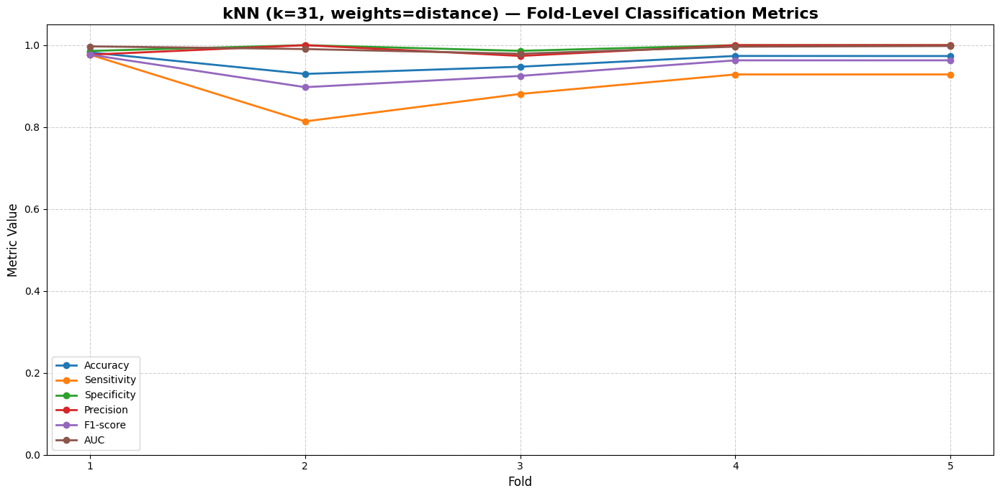

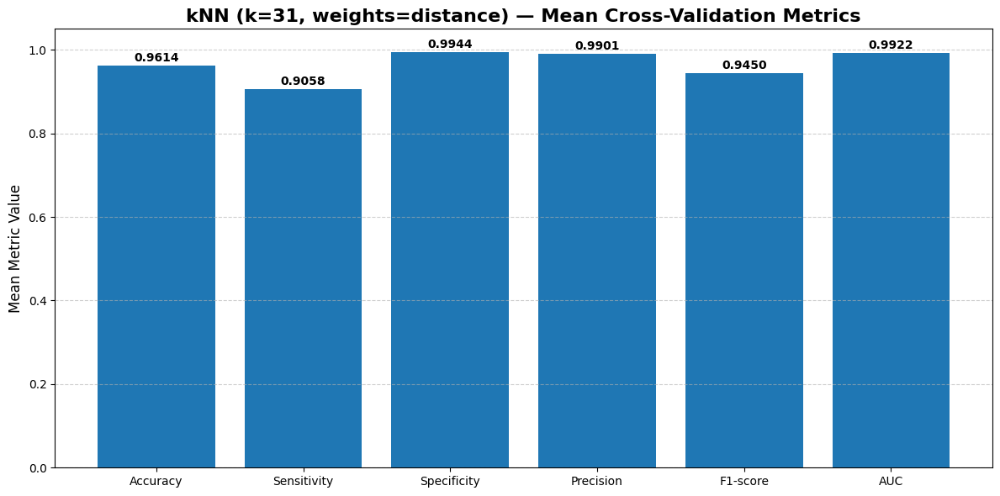

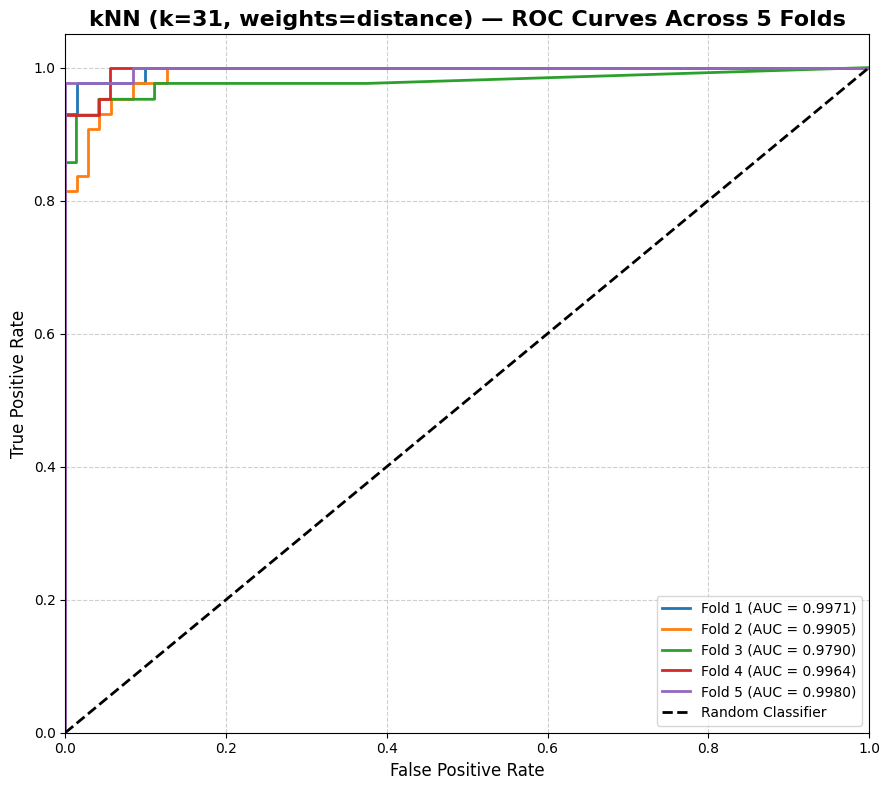

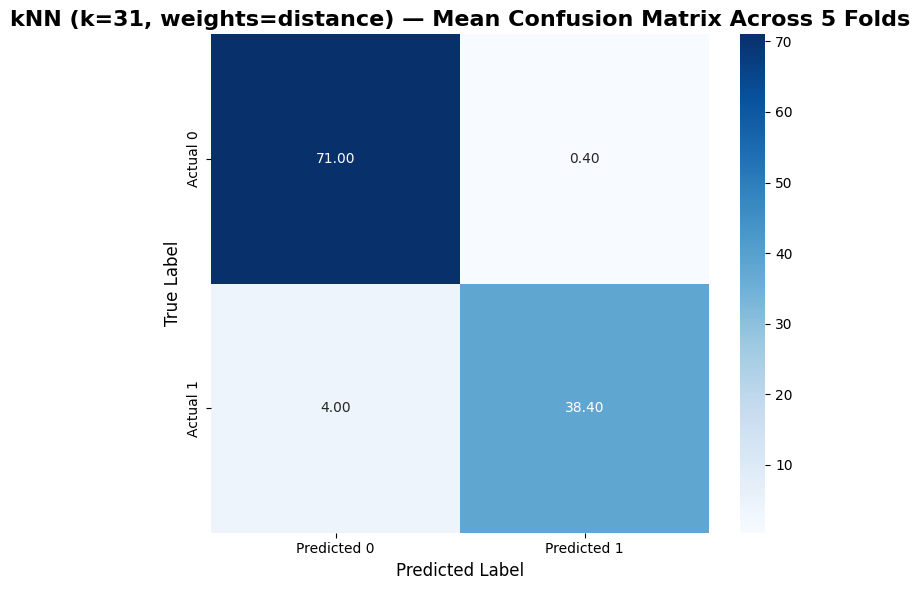

Final kNN visual evaluation report is ready.

Selected kNN configuration:
k        : 31
weights  : distance
metric   : minkowski
p        : 2

Fold-level results:


,Model,Fold,n_neighbors,weights,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,kNN,1,31,distance,0.982456,0.976744,0.985915,0.976744,0.976744,0.997052,42,1,1,70
1,kNN,2,31,distance,0.929825,0.813953,1.000000,1.000000,0.897436,0.990501,35,0,8,71
2,kNN,3,31,distance,0.947368,0.880952,0.986111,0.973684,0.925000,0.979001,37,1,5,71
3,kNN,4,31,distance,0.973684,0.928571,1.000000,1.000000,0.962963,0.996362,39,0,3,72
4,kNN,5,31,distance,0.973451,0.928571,1.000000,1.000000,0.962963,0.997988,39,0,3,71



Compact metric summary:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.961357,0.021985,0.929825,0.982456
1,Sensitivity,0.905759,0.061488,0.813953,0.976744
2,Specificity,0.994405,0.007661,0.985915,1.000000
3,Precision,0.990086,0.013619,0.973684,1.000000
4,F1-score,0.945021,0.032846,0.897436,0.976744
5,AUC,0.992181,0.007929,0.979001,0.997988



Final kNN visual reporting completed successfully.


In [48]:
# ============================================================
# BOX 46 — Final kNN Visual Evaluation Report
#
# Purpose:
#   - Create final visual and tabular reports for selected kNN
#   - Visualize fold-level classification metrics
#   - Plot ROC curves across all folds
#   - Plot mean confusion matrix
#   - Generate report-ready outputs
#
# Visual Outputs:
#   1) Fold-level metric comparison
#   2) Mean metric summary
#   3) ROC curves for all folds
#   4) Mean confusion matrix heatmap
#   5) Compact metric summary table
#
# Notes:
#   - This box does not retrain the model
#   - All results are derived from BOX 45
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_knn_fold_results_df",
    "final_knn_summary_results_df",
    "final_knn_confusion_matrices",
    "final_knn_roc_data",
    "BEST_KNN_N_NEIGHBORS",
    "BEST_KNN_WEIGHTS",
    "BEST_KNN_METRIC",
    "BEST_KNN_P"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(final_knn_fold_results_df, pd.DataFrame):
    raise TypeError(
        "final_knn_fold_results_df must be a pandas DataFrame."
    )

if len(final_knn_confusion_matrices) == 0:
    raise ValueError(
        "final_knn_confusion_matrices is empty."
    )

if len(final_knn_roc_data) == 0:
    raise ValueError(
        "final_knn_roc_data is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define plotting metrics
# ------------------------------------------------------------
plot_metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 2 — Validate required metric columns
# ------------------------------------------------------------
missing_metric_columns = [
    col for col in plot_metric_columns
    if col not in final_knn_fold_results_df.columns
]

if len(missing_metric_columns) > 0:
    raise ValueError(
        f"Missing metric columns: {missing_metric_columns}"
    )

# ------------------------------------------------------------
# Step 3 — Build model label
# ------------------------------------------------------------
final_knn_label = (
    f"kNN "
    f"(k={BEST_KNN_N_NEIGHBORS}, "
    f"weights={BEST_KNN_WEIGHTS})"
)

# ------------------------------------------------------------
# Step 4 — Fold-level metric comparison plot
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in plot_metric_columns:

    plt.plot(
        final_knn_fold_results_df["Fold"],
        final_knn_fold_results_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    f"{final_knn_label} — Fold-Level Classification Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Fold",
    fontsize=12
)

plt.ylabel(
    "Metric Value",
    fontsize=12
)

plt.xticks(
    final_knn_fold_results_df["Fold"]
)

plt.ylim(
    0,
    1.05
)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.legend()

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 5 — Mean metric bar plot
# ------------------------------------------------------------
mean_metric_values = [
    final_knn_fold_results_df[col].mean()
    for col in plot_metric_columns
]

plt.figure(figsize=(12, 6))

bars = plt.bar(
    plot_metric_columns,
    mean_metric_values
)

plt.title(
    f"{final_knn_label} — Mean Cross-Validation Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel(
    "Mean Metric Value",
    fontsize=12
)

plt.ylim(
    0,
    1.05
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

for bar, value in zip(
    bars,
    mean_metric_values
):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.01,
        f"{value:.4f}",
        ha="center",
        fontsize=10,
        fontweight="bold"
    )

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 6 — ROC curves across all folds
# ------------------------------------------------------------
plt.figure(figsize=(9, 8))

for fold_roc_item in final_knn_roc_data:

    fold_number = fold_roc_item["fold"]

    roc_data = fold_roc_item["roc_data"]

    plt.plot(
        roc_data["fpr"],
        roc_data["tpr"],
        linewidth=2,
        label=(
            f"Fold {fold_number} "
            f"(AUC = {roc_data['auc']:.4f})"
        )
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    color="black",
    label="Random Classifier"
)

plt.title(
    f"{final_knn_label} — ROC Curves Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "False Positive Rate",
    fontsize=12
)

plt.ylabel(
    "True Positive Rate",
    fontsize=12
)

plt.xlim(
    0,
    1
)

plt.ylim(
    0,
    1.05
)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.legend(
    loc="lower right"
)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 7 — Compute mean confusion matrix
# ------------------------------------------------------------
final_knn_confusion_matrix_stack = np.array([
    item["matrix"]
    for item in final_knn_confusion_matrices
])

final_knn_mean_confusion_matrix = (
    final_knn_confusion_matrix_stack.mean(axis=0)
)

# ------------------------------------------------------------
# Step 8 — Plot mean confusion matrix heatmap
# ------------------------------------------------------------
plt.figure(figsize=(7, 6))

sns.heatmap(
    final_knn_mean_confusion_matrix,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=True,
    xticklabels=[
        "Predicted 0",
        "Predicted 1"
    ],
    yticklabels=[
        "Actual 0",
        "Actual 1"
    ]
)

plt.title(
    f"{final_knn_label} — Mean Confusion Matrix Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Predicted Label",
    fontsize=12
)

plt.ylabel(
    "True Label",
    fontsize=12
)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 9 — Create compact metric summary table
# ------------------------------------------------------------
final_knn_visual_summary_df = pd.DataFrame({

    "Metric":
        plot_metric_columns,

    "Mean":
        [
            final_knn_fold_results_df[col].mean()
            for col in plot_metric_columns
        ],

    "Std":
        [
            final_knn_fold_results_df[col].std()
            for col in plot_metric_columns
        ],

    "Min":
        [
            final_knn_fold_results_df[col].min()
            for col in plot_metric_columns
        ],

    "Max":
        [
            final_knn_fold_results_df[col].max()
            for col in plot_metric_columns
        ]
})

final_knn_visual_summary_df = (
    final_knn_visual_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 10 — Create fold-level display table
# ------------------------------------------------------------
final_knn_fold_report_df = (
    final_knn_fold_results_df.copy()
)

final_knn_fold_report_df[
    plot_metric_columns
] = (
    final_knn_fold_report_df[
        plot_metric_columns
    ].round(6)
)

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN"
]

final_knn_fold_report_df[
    count_columns
] = (
    final_knn_fold_report_df[
        count_columns
    ].astype(int)
)

# ------------------------------------------------------------
# Step 11 — Display final tables
# ------------------------------------------------------------
print(
    "Final kNN visual evaluation report is ready."
)

print("\nSelected kNN configuration:")
print(f"k        : {BEST_KNN_N_NEIGHBORS}")
print(f"weights  : {BEST_KNN_WEIGHTS}")
print(f"metric   : {BEST_KNN_METRIC}")
print(f"p        : {BEST_KNN_P}")

print("\nFold-level results:")
display(
    final_knn_fold_report_df
)

print("\nCompact metric summary:")
display(
    final_knn_visual_summary_df
)

# ------------------------------------------------------------
# Step 12 — Store plot references
# ------------------------------------------------------------
all_model_metric_plots.append({

    "model":
        "kNN",

    "plots":
        [
            "fold_level_metrics",
            "mean_metric_barplot",
            "roc_curves",
            "mean_confusion_matrix"
        ]
})

print(
    "\nFinal kNN visual reporting "
    "completed successfully."
)

In [49]:
# ============================================================
# BOX 47 — Perceptron Hyperparameter Search Space Definition
#
# Purpose:
#   - Define a fully analytical hyperparameter search space
#     for the Perceptron classifier
#   - Avoid manual hyperparameter selection
#   - Prepare candidate configurations for downstream
#     Stratified 5-Fold Cross-Validation experiments
#
# Hyperparameters:
#   1) penalty
#   2) alpha
#   3) eta0
#   4) max_iter
#   5) class_weight
#
# Methodological Notes:
#   - The Perceptron is a linear classifier
#   - Min-Max scaled fold-level datasets are already available
#   - Hyperparameters are evaluated analytically in later boxes
#   - No model is trained in this box
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define Perceptron search-space values
# ------------------------------------------------------------
candidate_penalties = [
    None,
    "l2",
    "l1",
    "elasticnet"
]

candidate_alpha_values = [
    0.0001,
    0.001,
    0.01
]

candidate_eta0_values = [
    0.001,
    0.01,
    0.1,
    1.0
]

candidate_max_iter_values = [
    500,
    1000,
    2000
]

candidate_class_weight_values = [
    None,
    "balanced"
]

# ------------------------------------------------------------
# Step 2 — Define fixed Perceptron settings
# ------------------------------------------------------------
PERCEPTRON_RANDOM_STATE = 42

PERCEPTRON_TOL = 1e-4

PERCEPTRON_SHUFFLE = True

PERCEPTRON_EARLY_STOPPING = False

# ------------------------------------------------------------
# Step 3 — Build candidate configuration registry
# ------------------------------------------------------------
perceptron_candidate_configurations = []

configuration_counter = 1

for penalty_value in candidate_penalties:

    for alpha_value in candidate_alpha_values:

        for eta0_value in candidate_eta0_values:

            for max_iter_value in candidate_max_iter_values:

                for class_weight_value in candidate_class_weight_values:

                    configuration_record = {

                        "config_id":
                            f"PERCEPTRON_CFG_{configuration_counter}",

                        "penalty":
                            penalty_value,

                        "alpha":
                            alpha_value,

                        "eta0":
                            eta0_value,

                        "max_iter":
                            max_iter_value,

                        "class_weight":
                            class_weight_value,

                        "tol":
                            PERCEPTRON_TOL,

                        "shuffle":
                            PERCEPTRON_SHUFFLE,

                        "random_state":
                            PERCEPTRON_RANDOM_STATE,

                        "early_stopping":
                            PERCEPTRON_EARLY_STOPPING
                    }

                    perceptron_candidate_configurations.append(
                        configuration_record
                    )

                    configuration_counter += 1

# ------------------------------------------------------------
# Step 4 — Convert registry to DataFrame
# ------------------------------------------------------------
perceptron_candidate_configurations_df = pd.DataFrame(
    perceptron_candidate_configurations
)

# ------------------------------------------------------------
# Step 5 — Safety checks
# ------------------------------------------------------------
if perceptron_candidate_configurations_df.empty:
    raise ValueError(
        "No Perceptron configurations were generated."
    )

if (
    perceptron_candidate_configurations_df["alpha"] <= 0
).any():
    raise ValueError(
        "All alpha values must be positive."
    )

if (
    perceptron_candidate_configurations_df["eta0"] <= 0
).any():
    raise ValueError(
        "All eta0 values must be positive."
    )

if (
    perceptron_candidate_configurations_df["max_iter"] <= 0
).any():
    raise ValueError(
        "All max_iter values must be positive."
    )

# ------------------------------------------------------------
# Step 6 — Build compact search-space summary
# ------------------------------------------------------------
perceptron_search_space_summary = {

    "Total_Configurations":
        len(perceptron_candidate_configurations_df),

    "Number_of_Penalty_Values":
        len(candidate_penalties),

    "Number_of_Alpha_Values":
        len(candidate_alpha_values),

    "Number_of_Eta0_Values":
        len(candidate_eta0_values),

    "Number_of_Max_Iter_Values":
        len(candidate_max_iter_values),

    "Number_of_Class_Weight_Values":
        len(candidate_class_weight_values),

    "Random_State":
        PERCEPTRON_RANDOM_STATE,

    "Tolerance":
        PERCEPTRON_TOL
}

perceptron_search_space_summary_df = pd.DataFrame(
    [perceptron_search_space_summary]
)

# ------------------------------------------------------------
# Step 7 — Display search-space information
# ------------------------------------------------------------
print(
    "Perceptron hyperparameter search space is ready."
)

print("\nCandidate penalties:")
print(candidate_penalties)

print("\nCandidate alpha values:")
print(candidate_alpha_values)

print("\nCandidate eta0 values:")
print(candidate_eta0_values)

print("\nCandidate max_iter values:")
print(candidate_max_iter_values)

print("\nCandidate class_weight values:")
print(candidate_class_weight_values)

print("\nSearch-space summary:")
display(perceptron_search_space_summary_df)

print("\nCandidate configurations:")
display(perceptron_candidate_configurations_df)

print(
    "\nPerceptron hyperparameter search space "
    "definition completed successfully."
)

Perceptron hyperparameter search space is ready.

Candidate penalties:
[None, 'l2', 'l1', 'elasticnet']

Candidate alpha values:
[0.0001, 0.001, 0.01]

Candidate eta0 values:
[0.001, 0.01, 0.1, 1.0]

Candidate max_iter values:
[500, 1000, 2000]

Candidate class_weight values:
[None, 'balanced']

Search-space summary:


,Total_Configurations,Number_of_Penalty_Values,Number_of_Alpha_Values,Number_of_Eta0_Values,Number_of_Max_Iter_Values,Number_of_Class_Weight_Values,Random_State,Tolerance
0,288,4,3,4,3,2,42,0.0001



Candidate configurations:


,config_id,penalty,alpha,eta0,max_iter,class_weight,tol,shuffle,random_state,early_stopping
0,PERCEPTRON_CFG_1,None,0.0001,0.001,500,None,0.0001,True,42,False
1,PERCEPTRON_CFG_2,None,0.0001,0.001,500,balanced,0.0001,True,42,False
2,PERCEPTRON_CFG_3,None,0.0001,0.001,1000,None,0.0001,True,42,False
3,PERCEPTRON_CFG_4,None,0.0001,0.001,1000,balanced,0.0001,True,42,False
4,PERCEPTRON_CFG_5,None,0.0001,0.001,2000,None,0.0001,True,42,False
...,...,...,...,...,...,...,...,...,...,...
283,PERCEPTRON_CFG_284,elasticnet,0.0100,1.000,500,balanced,0.0001,True,42,False
284,PERCEPTRON_CFG_285,elasticnet,0.0100,1.000,1000,None,0.0001,True,42,False
285,PERCEPTRON_CFG_286,elasticnet,0.0100,1.000,1000,balanced,0.0001,True,42,False
286,PERCEPTRON_CFG_287,elasticnet,0.0100,1.000,2000,None,0.0001,True,42,False



Perceptron hyperparameter search space definition completed successfully.


In [50]:
# ============================================================
# BOX 48 — Perceptron Hyperparameter 5-Fold Cross-Validation Evaluation
#
# Purpose:
#   - Evaluate all candidate Perceptron configurations
#     using Stratified 5-Fold Cross-Validation
#   - Compute fold-level classification metrics
#   - Store all fold-level and configuration-level results
#   - Support fully analytical hyperparameter selection
#
# Evaluated Hyperparameters:
#   - penalty
#   - alpha
#   - eta0
#   - max_iter
#   - class_weight
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "perceptron_candidate_configurations",
    "compute_binary_classification_metrics"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
perceptron_cv_all_results = []

perceptron_cv_fold_results = []

# ------------------------------------------------------------
# Step 2 — Evaluate all configurations
# ------------------------------------------------------------
for config in perceptron_candidate_configurations:

    # --------------------------------------------------------
    # Step 2.1 — Extract configuration information
    # --------------------------------------------------------
    config_id = config["config_id"]

    penalty = config["penalty"]

    alpha = config["alpha"]

    eta0 = config["eta0"]

    max_iter = config["max_iter"]

    class_weight = config["class_weight"]

    tol = config["tol"]

    shuffle = config["shuffle"]

    random_state = config["random_state"]

    # --------------------------------------------------------
    # Step 2.2 — Initialize fold-level storage
    # --------------------------------------------------------
    current_config_fold_metrics = []

    # --------------------------------------------------------
    # Step 2.3 — Run Stratified 5-Fold CV
    # --------------------------------------------------------
    for fold_data in cv5_scaled_folds:

        fold_number = fold_data["fold_number"]

        X_train = fold_data["X_train_scaled"]

        X_val = fold_data["X_validation_scaled"]

        y_train = fold_data["y_train"]

        y_val = fold_data["y_validation"]

        # ----------------------------------------------------
        # Step 2.4 — Initialize Perceptron model
        # ----------------------------------------------------
        perceptron_model = Perceptron(
            penalty=penalty,
            alpha=alpha,
            eta0=eta0,
            max_iter=max_iter,
            tol=tol,
            shuffle=shuffle,
            random_state=random_state,
            class_weight=class_weight
        )

        # ----------------------------------------------------
        # Step 2.5 — Train model
        # ----------------------------------------------------
        perceptron_model.fit(
            X_train,
            y_train
        )

        # ----------------------------------------------------
        # Step 2.6 — Generate predictions
        # ----------------------------------------------------
        y_pred = perceptron_model.predict(
            X_val
        )

        # ----------------------------------------------------
        # Step 2.7 — Generate decision scores
        # ----------------------------------------------------
        y_score = perceptron_model.decision_function(
            X_val
        )

        # ----------------------------------------------------
        # Step 2.8 — Compute metrics
        # ----------------------------------------------------
        fold_metrics = (
            compute_binary_classification_metrics(
                y_true=y_val,
                y_pred=y_pred,
                y_score=y_score
            )
        )

        # ----------------------------------------------------
        # Step 2.9 — Build fold-level result row
        # ----------------------------------------------------
        fold_result_row = {

            "Config_ID":
                config_id,

            "Fold":
                fold_number,

            "penalty":
                str(penalty),

            "alpha":
                alpha,

            "eta0":
                eta0,

            "max_iter":
                max_iter,

            "class_weight":
                str(class_weight),

            "tol":
                tol,

            "Accuracy":
                fold_metrics["Accuracy"],

            "Sensitivity":
                fold_metrics["Sensitivity"],

            "Specificity":
                fold_metrics["Specificity"],

            "Precision":
                fold_metrics["Precision"],

            "F1-score":
                fold_metrics["F1-score"],

            "AUC":
                fold_metrics["AUC"],

            "TP":
                fold_metrics["TP"],

            "FP":
                fold_metrics["FP"],

            "FN":
                fold_metrics["FN"],

            "TN":
                fold_metrics["TN"]
        }

        # ----------------------------------------------------
        # Step 2.10 — Store fold results
        # ----------------------------------------------------
        current_config_fold_metrics.append(
            fold_result_row
        )

        perceptron_cv_fold_results.append(
            fold_result_row
        )

    # --------------------------------------------------------
    # Step 2.11 — Convert current fold metrics to DataFrame
    # --------------------------------------------------------
    current_config_df = pd.DataFrame(
        current_config_fold_metrics
    )

    # --------------------------------------------------------
    # Step 2.12 — Compute summary statistics
    # --------------------------------------------------------
    config_summary_row = {

        "Config_ID":
            config_id,

        "penalty":
            str(penalty),

        "alpha":
            alpha,

        "eta0":
            eta0,

        "max_iter":
            max_iter,

        "class_weight":
            str(class_weight),

        "tol":
            tol,

        "Mean_Accuracy":
            current_config_df["Accuracy"].mean(),

        "Std_Accuracy":
            current_config_df["Accuracy"].std(),

        "Mean_Sensitivity":
            current_config_df["Sensitivity"].mean(),

        "Std_Sensitivity":
            current_config_df["Sensitivity"].std(),

        "Mean_Specificity":
            current_config_df["Specificity"].mean(),

        "Std_Specificity":
            current_config_df["Specificity"].std(),

        "Mean_Precision":
            current_config_df["Precision"].mean(),

        "Std_Precision":
            current_config_df["Precision"].std(),

        "Mean_F1-score":
            current_config_df["F1-score"].mean(),

        "Std_F1-score":
            current_config_df["F1-score"].std(),

        "Mean_AUC":
            current_config_df["AUC"].mean(),

        "Std_AUC":
            current_config_df["AUC"].std(),

        "Min_AUC":
            current_config_df["AUC"].min(),

        "Max_AUC":
            current_config_df["AUC"].max()
    }

    # --------------------------------------------------------
    # Step 2.13 — Store summary row
    # --------------------------------------------------------
    perceptron_cv_all_results.append(
        config_summary_row
    )

# ------------------------------------------------------------
# Step 3 — Create final DataFrames
# ------------------------------------------------------------
perceptron_cv_fold_results_df = pd.DataFrame(
    perceptron_cv_fold_results
)

perceptron_cv_summary_results_df = pd.DataFrame(
    perceptron_cv_all_results
)

# ------------------------------------------------------------
# Step 4 — Sort configurations analytically
# ------------------------------------------------------------
perceptron_cv_summary_results_df = (
    perceptron_cv_summary_results_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC"
        ],
        ascending=[
            False,
            False,
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 5 — Create rounded display table
# ------------------------------------------------------------
display_metric_columns = [
    col for col in perceptron_cv_summary_results_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
    )
]

perceptron_cv_summary_display_df = (
    perceptron_cv_summary_results_df.copy()
)

perceptron_cv_summary_display_df[
    display_metric_columns
] = (
    perceptron_cv_summary_display_df[
        display_metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 6 — Display evaluation summary
# ------------------------------------------------------------
print(
    "Perceptron hyperparameter evaluation completed."
)

print("\nTotal evaluated configurations:")
print(
    len(perceptron_cv_summary_results_df)
)

print("\nTop configurations:")
display(
    perceptron_cv_summary_display_df.head(10)
)

# ------------------------------------------------------------
# Step 7 — Display fold-level results sample
# ------------------------------------------------------------
print("\nFold-level results sample:")
display(
    perceptron_cv_fold_results_df.head(10)
)

print(
    "\nPerceptron 5-Fold hyperparameter "
    "evaluation completed successfully."
)

Perceptron hyperparameter evaluation completed.

Total evaluated configurations:
288

Top configurations:


,Config_ID,penalty,alpha,eta0,max_iter,class_weight,tol,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,...,Mean_Specificity,Std_Specificity,Mean_Precision,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC
0,PERCEPTRON_CFG_224,elasticnet,0.0001,0.01,500,balanced,0.0001,0.971914,0.024326,0.948062,...,0.985915,0.024395,0.977460,0.038497,0.961511,0.033725,0.995645,0.005240,0.986772,1.000000
1,PERCEPTRON_CFG_226,elasticnet,0.0001,0.01,1000,balanced,0.0001,0.971914,0.024326,0.948062,...,0.985915,0.024395,0.977460,0.038497,0.961511,0.033725,0.995645,0.005240,0.986772,1.000000
2,PERCEPTRON_CFG_228,elasticnet,0.0001,0.01,2000,balanced,0.0001,0.971914,0.024326,0.948062,...,0.985915,0.024395,0.977460,0.038497,0.961511,0.033725,0.995645,0.005240,0.986772,1.000000
3,PERCEPTRON_CFG_115,l2,0.0010,1.00,500,None,0.0001,0.912265,0.084802,0.962348,...,0.882668,0.152850,0.863035,0.168246,0.899969,0.086763,0.995581,0.005751,0.986111,0.999669
4,PERCEPTRON_CFG_117,l2,0.0010,1.00,1000,None,0.0001,0.912265,0.084802,0.962348,...,0.882668,0.152850,0.863035,0.168246,0.899969,0.086763,0.995581,0.005751,0.986111,0.999669
5,PERCEPTRON_CFG_119,l2,0.0010,1.00,2000,None,0.0001,0.912265,0.084802,0.962348,...,0.882668,0.152850,0.863035,0.168246,0.899969,0.086763,0.995581,0.005751,0.986111,0.999669
6,PERCEPTRON_CFG_133,l2,0.0100,0.10,500,None,0.0001,0.912265,0.084802,0.962348,...,0.882668,0.152850,0.863035,0.168246,0.899969,0.086763,0.995581,0.005751,0.986111,0.999669
7,PERCEPTRON_CFG_135,l2,0.0100,0.10,1000,None,0.0001,0.912265,0.084802,0.962348,...,0.882668,0.152850,0.863035,0.168246,0.899969,0.086763,0.995581,0.005751,0.986111,0.999669
8,PERCEPTRON_CFG_137,l2,0.0100,0.10,2000,None,0.0001,0.912265,0.084802,0.962348,...,0.882668,0.152850,0.863035,0.168246,0.899969,0.086763,0.995581,0.005751,0.986111,0.999669
9,PERCEPTRON_CFG_152,l1,0.0001,0.01,500,balanced,0.0001,0.938550,0.030948,0.962126,...,0.924531,0.068719,0.893018,0.089252,0.922865,0.034015,0.995579,0.005967,0.985119,0.999665



Fold-level results sample:


,Config_ID,Fold,penalty,alpha,eta0,max_iter,class_weight,tol,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,PERCEPTRON_CFG_1,1,None,0.0001,0.001,500,None,0.0001,0.956140,0.976744,0.943662,0.913043,0.943820,0.995414,42,4,1,67
1,PERCEPTRON_CFG_1,2,None,0.0001,0.001,500,None,0.0001,0.938596,0.837209,1.000000,1.000000,0.911392,0.996069,36,0,7,71
2,PERCEPTRON_CFG_1,3,None,0.0001,0.001,500,None,0.0001,0.903509,0.738095,1.000000,1.000000,0.849315,0.986772,31,0,11,72
3,PERCEPTRON_CFG_1,4,None,0.0001,0.001,500,None,0.0001,0.991228,0.976190,1.000000,1.000000,0.987952,0.999339,41,0,1,72
4,PERCEPTRON_CFG_1,5,None,0.0001,0.001,500,None,0.0001,0.982301,0.976190,0.985915,0.976190,0.976190,0.998323,41,1,1,70
5,PERCEPTRON_CFG_2,1,None,0.0001,0.001,500,balanced,0.0001,0.964912,0.976744,0.957746,0.933333,0.954545,0.991484,42,3,1,68
6,PERCEPTRON_CFG_2,2,None,0.0001,0.001,500,balanced,0.0001,0.877193,0.674419,1.000000,1.000000,0.805556,0.997052,29,0,14,71
7,PERCEPTRON_CFG_2,3,None,0.0001,0.001,500,balanced,0.0001,0.877193,0.666667,1.000000,1.000000,0.800000,0.974868,28,0,14,72
8,PERCEPTRON_CFG_2,4,None,0.0001,0.001,500,balanced,0.0001,0.973684,0.928571,1.000000,1.000000,0.962963,0.999669,39,0,3,72
9,PERCEPTRON_CFG_2,5,None,0.0001,0.001,500,balanced,0.0001,0.778761,1.000000,0.647887,0.626866,0.770642,0.998323,42,25,0,46



Perceptron 5-Fold hyperparameter evaluation completed successfully.


In [51]:
# ============================================================
# BOX 49 — Perceptron Analytical Hyperparameter Reporting
#
# Purpose:
#   - Perform analytical ranking of Perceptron configurations
#   - Compare performance and stability across configurations
#   - Create report-ready analytical tables
#   - Identify best analytical configuration
#
# Analytical Ranking Criteria:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "perceptron_cv_summary_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(
    perceptron_cv_summary_results_df,
    pd.DataFrame
):
    raise TypeError(
        "perceptron_cv_summary_results_df "
        "must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Create ranked results table
# ------------------------------------------------------------
perceptron_ranked_results_df = (
    perceptron_cv_summary_results_df
    .copy()
)

perceptron_ranked_results_df.insert(
    0,
    "Rank",
    range(
        1,
        len(perceptron_ranked_results_df) + 1
    )
)

# ------------------------------------------------------------
# Step 2 — Create compact analytical table
# ------------------------------------------------------------
compact_columns = [

    "Rank",

    "Config_ID",

    "penalty",

    "alpha",

    "eta0",

    "max_iter",

    "class_weight",

    "Mean_Accuracy",

    "Std_Accuracy",

    "Mean_Sensitivity",

    "Std_Sensitivity",

    "Mean_Specificity",

    "Std_Specificity",

    "Mean_F1-score",

    "Std_F1-score",

    "Mean_AUC",

    "Std_AUC"
]

perceptron_compact_results_df = (
    perceptron_ranked_results_df[
        compact_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 3 — Create rounded display version
# ------------------------------------------------------------
perceptron_compact_display_df = (
    perceptron_compact_results_df.copy()
)

numeric_columns = [

    "alpha",

    "eta0",

    "Mean_Accuracy",

    "Std_Accuracy",

    "Mean_Sensitivity",

    "Std_Sensitivity",

    "Mean_Specificity",

    "Std_Specificity",

    "Mean_F1-score",

    "Std_F1-score",

    "Mean_AUC",

    "Std_AUC"
]

perceptron_compact_display_df[
    numeric_columns
] = (
    perceptron_compact_display_df[
        numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 4 — Extract best configuration
# ------------------------------------------------------------
best_perceptron_configuration_df = (
    perceptron_ranked_results_df
    .head(1)
    .copy()
)

# ------------------------------------------------------------
# Step 5 — Stability analysis
# ------------------------------------------------------------
perceptron_stability_analysis_df = (
    perceptron_ranked_results_df
    .sort_values(
        by="Std_AUC",
        ascending=True
    )
    .reset_index(drop=True)
)

stability_columns = [

    "Config_ID",

    "penalty",

    "alpha",

    "eta0",

    "Mean_Accuracy",

    "Std_Accuracy",

    "Mean_Sensitivity",

    "Std_Sensitivity",

    "Mean_F1-score",

    "Std_F1-score",

    "Mean_AUC",

    "Std_AUC"
]

perceptron_stability_analysis_df = (
    perceptron_stability_analysis_df[
        stability_columns
    ]
)

# ------------------------------------------------------------
# Step 6 — Performance trade-off analysis
# ------------------------------------------------------------
tradeoff_columns = [

    "Config_ID",

    "penalty",

    "alpha",

    "eta0",

    "Mean_AUC",

    "Mean_Sensitivity",

    "Mean_Specificity",

    "Mean_F1-score"
]

perceptron_tradeoff_analysis_df = (
    perceptron_ranked_results_df[
        tradeoff_columns
    ]
    .head(10)
    .copy()
)

# ------------------------------------------------------------
# Step 7 — Display analytical ranking criteria
# ------------------------------------------------------------
print(
    "Perceptron analytical reporting tables are ready."
)

print("\nAnalytical ranking criteria:")
print("1. Mean_AUC")
print("2. Mean_Sensitivity")
print("3. Mean_F1-score")
print("4. Std_AUC")

# ------------------------------------------------------------
# Step 8 — Display top ranked configurations
# ------------------------------------------------------------
print("\nTop 15 configurations:")

display(
    perceptron_compact_display_df
    .head(15)
    .style
    .set_caption(
        "Perceptron Hyperparameter "
        "Cross-Validation Analysis"
    )
    .background_gradient(
        subset=["Mean_AUC"],
        cmap="Greens"
    )
    .background_gradient(
        subset=["Std_AUC"],
        cmap="Reds_r"
    )
)

# ------------------------------------------------------------
# Step 9 — Display best configuration
# ------------------------------------------------------------
print("\nBest Perceptron configuration:")

display(
    best_perceptron_configuration_df.round(6)
)

# ------------------------------------------------------------
# Step 10 — Display most stable configurations
# ------------------------------------------------------------
print(
    "\nMost stable configurations "
    "(lowest Std_AUC):"
)

display(
    perceptron_stability_analysis_df
    .head(10)
    .round(6)
)

# ------------------------------------------------------------
# Step 11 — Display performance trade-off analysis
# ------------------------------------------------------------
print("\nPerformance trade-off analysis:")

display(
    perceptron_tradeoff_analysis_df
    .round(6)
)

print(
    "\nPerceptron analytical reporting "
    "completed successfully."
)

Perceptron analytical reporting tables are ready.

Analytical ranking criteria:
1. Mean_AUC
2. Mean_Sensitivity
3. Mean_F1-score
4. Std_AUC

Top 15 configurations:


,Rank,Config_ID,penalty,alpha,eta0,max_iter,class_weight,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC
0,1,PERCEPTRON_CFG_224,elasticnet,0.000100,0.010000,500,balanced,0.971914,0.024326,0.948062,0.054346,0.985915,0.024395,0.961511,0.033725,0.995645,0.005240
1,2,PERCEPTRON_CFG_226,elasticnet,0.000100,0.010000,1000,balanced,0.971914,0.024326,0.948062,0.054346,0.985915,0.024395,0.961511,0.033725,0.995645,0.005240
2,3,PERCEPTRON_CFG_228,elasticnet,0.000100,0.010000,2000,balanced,0.971914,0.024326,0.948062,0.054346,0.985915,0.024395,0.961511,0.033725,0.995645,0.005240
3,4,PERCEPTRON_CFG_115,l2,0.001000,1.000000,500,None,0.912265,0.084802,0.962348,0.042526,0.882668,0.152850,0.899969,0.086763,0.995581,0.005751
4,5,PERCEPTRON_CFG_117,l2,0.001000,1.000000,1000,None,0.912265,0.084802,0.962348,0.042526,0.882668,0.152850,0.899969,0.086763,0.995581,0.005751
5,6,PERCEPTRON_CFG_119,l2,0.001000,1.000000,2000,None,0.912265,0.084802,0.962348,0.042526,0.882668,0.152850,0.899969,0.086763,0.995581,0.005751
6,7,PERCEPTRON_CFG_133,l2,0.010000,0.100000,500,None,0.912265,0.084802,0.962348,0.042526,0.882668,0.152850,0.899969,0.086763,0.995581,0.005751
7,8,PERCEPTRON_CFG_135,l2,0.010000,0.100000,1000,None,0.912265,0.084802,0.962348,0.042526,0.882668,0.152850,0.899969,0.086763,0.995581,0.005751
8,9,PERCEPTRON_CFG_137,l2,0.010000,0.100000,2000,None,0.912265,0.084802,0.962348,0.042526,0.882668,0.152850,0.899969,0.086763,0.995581,0.005751
9,10,PERCEPTRON_CFG_152,l1,0.000100,0.010000,500,balanced,0.938550,0.030948,0.962126,0.036039,0.924531,0.068719,0.922865,0.034015,0.995579,0.005967



Best Perceptron configuration:


,Rank,Config_ID,penalty,alpha,eta0,max_iter,class_weight,tol,Mean_Accuracy,Std_Accuracy,...,Mean_Specificity,Std_Specificity,Mean_Precision,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC
0,1,PERCEPTRON_CFG_224,elasticnet,0.0001,0.01,500,balanced,0.0001,0.971914,0.024326,...,0.985915,0.024395,0.97746,0.038497,0.961511,0.033725,0.995645,0.00524,0.986772,1.0



Most stable configurations (lowest Std_AUC):


,Config_ID,penalty,alpha,eta0,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC
0,PERCEPTRON_CFG_143,l2,0.0100,1.000,0.829654,0.157503,0.825692,0.172407,0.802085,0.115808,0.991888,0.003983
1,PERCEPTRON_CFG_141,l2,0.0100,1.000,0.829654,0.157503,0.825692,0.172407,0.802085,0.115808,0.991888,0.003983
2,PERCEPTRON_CFG_139,l2,0.0100,1.000,0.829654,0.157503,0.825692,0.172407,0.802085,0.115808,0.991888,0.003983
3,PERCEPTRON_CFG_262,elasticnet,0.0010,1.000,0.928008,0.030546,0.920155,0.098294,0.905736,0.036975,0.994124,0.004593
4,PERCEPTRON_CFG_260,elasticnet,0.0010,1.000,0.928008,0.030546,0.920155,0.098294,0.905736,0.036975,0.994124,0.004593
5,PERCEPTRON_CFG_264,elasticnet,0.0010,1.000,0.928008,0.030546,0.920155,0.098294,0.905736,0.036975,0.994124,0.004593
6,PERCEPTRON_CFG_29,None,0.0010,0.001,0.954355,0.035276,0.900886,0.109146,0.933734,0.055834,0.995184,0.004968
7,PERCEPTRON_CFG_51,None,0.0100,0.001,0.954355,0.035276,0.900886,0.109146,0.933734,0.055834,0.995184,0.004968
8,PERCEPTRON_CFG_53,None,0.0100,0.001,0.954355,0.035276,0.900886,0.109146,0.933734,0.055834,0.995184,0.004968
9,PERCEPTRON_CFG_5,None,0.0001,0.001,0.954355,0.035276,0.900886,0.109146,0.933734,0.055834,0.995184,0.004968



Performance trade-off analysis:


,Config_ID,penalty,alpha,eta0,Mean_AUC,Mean_Sensitivity,Mean_Specificity,Mean_F1-score
0,PERCEPTRON_CFG_224,elasticnet,0.0001,0.01,0.995645,0.948062,0.985915,0.961511
1,PERCEPTRON_CFG_226,elasticnet,0.0001,0.01,0.995645,0.948062,0.985915,0.961511
2,PERCEPTRON_CFG_228,elasticnet,0.0001,0.01,0.995645,0.948062,0.985915,0.961511
3,PERCEPTRON_CFG_115,l2,0.0010,1.00,0.995581,0.962348,0.882668,0.899969
4,PERCEPTRON_CFG_117,l2,0.0010,1.00,0.995581,0.962348,0.882668,0.899969
5,PERCEPTRON_CFG_119,l2,0.0010,1.00,0.995581,0.962348,0.882668,0.899969
6,PERCEPTRON_CFG_133,l2,0.0100,0.10,0.995581,0.962348,0.882668,0.899969
7,PERCEPTRON_CFG_135,l2,0.0100,0.10,0.995581,0.962348,0.882668,0.899969
8,PERCEPTRON_CFG_137,l2,0.0100,0.10,0.995581,0.962348,0.882668,0.899969
9,PERCEPTRON_CFG_152,l1,0.0001,0.01,0.995579,0.962126,0.924531,0.922865



Perceptron analytical reporting completed successfully.


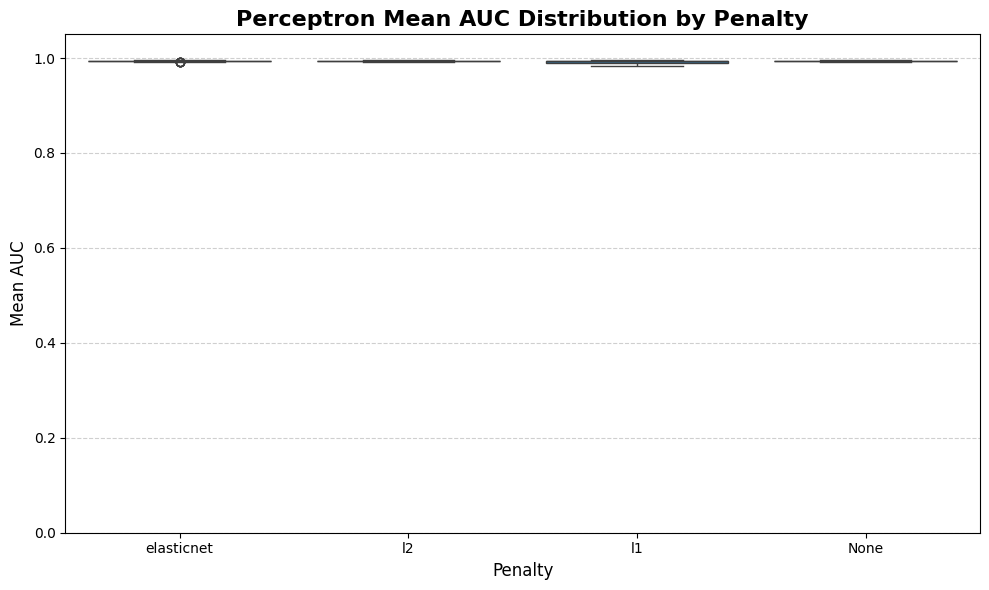

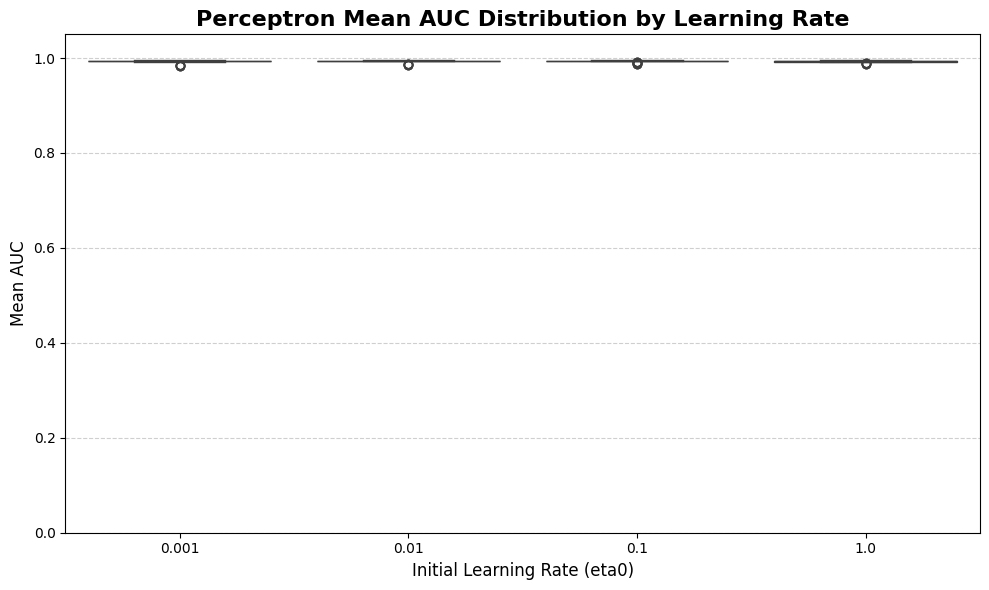

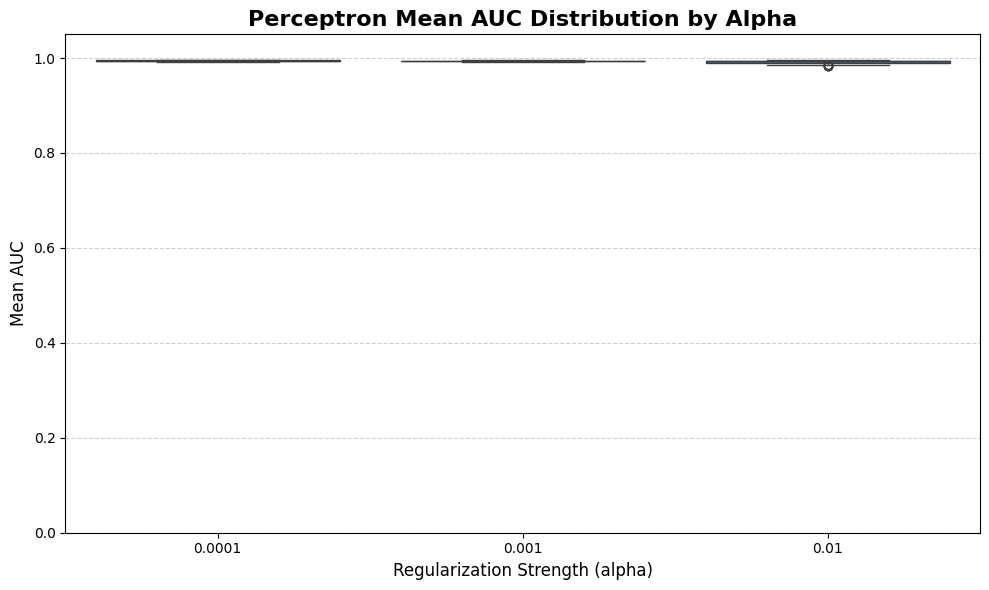

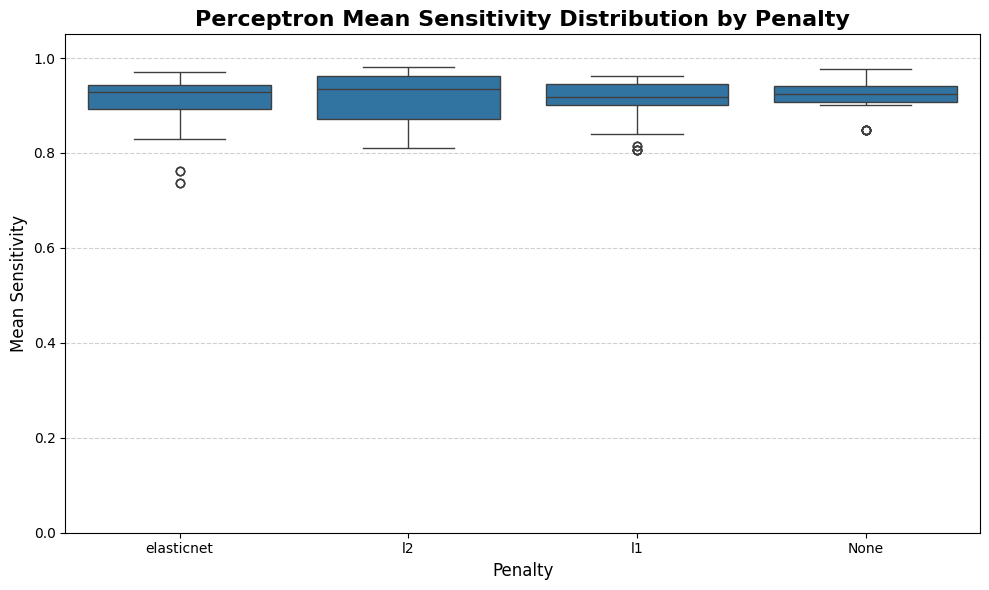

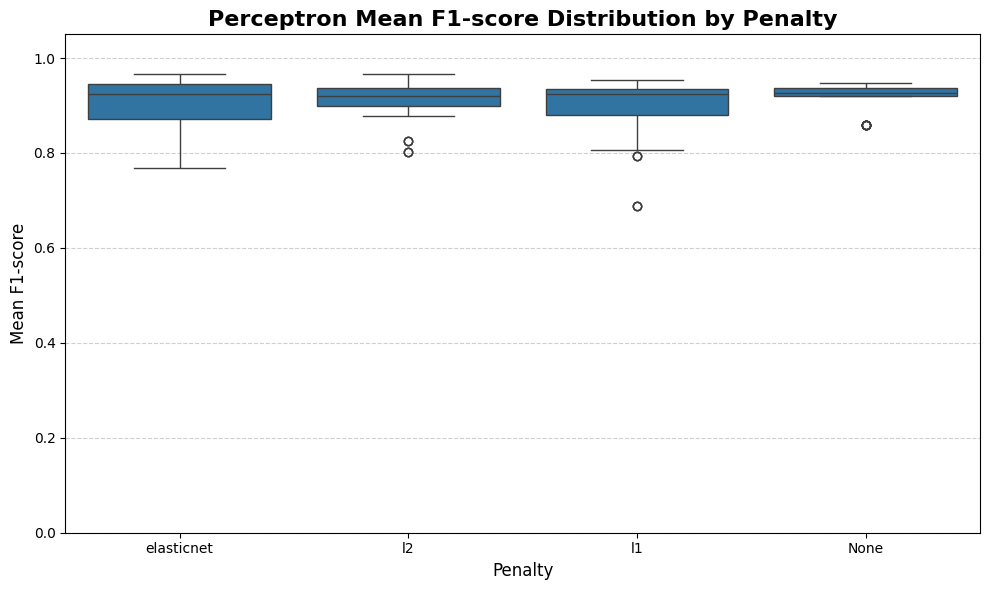

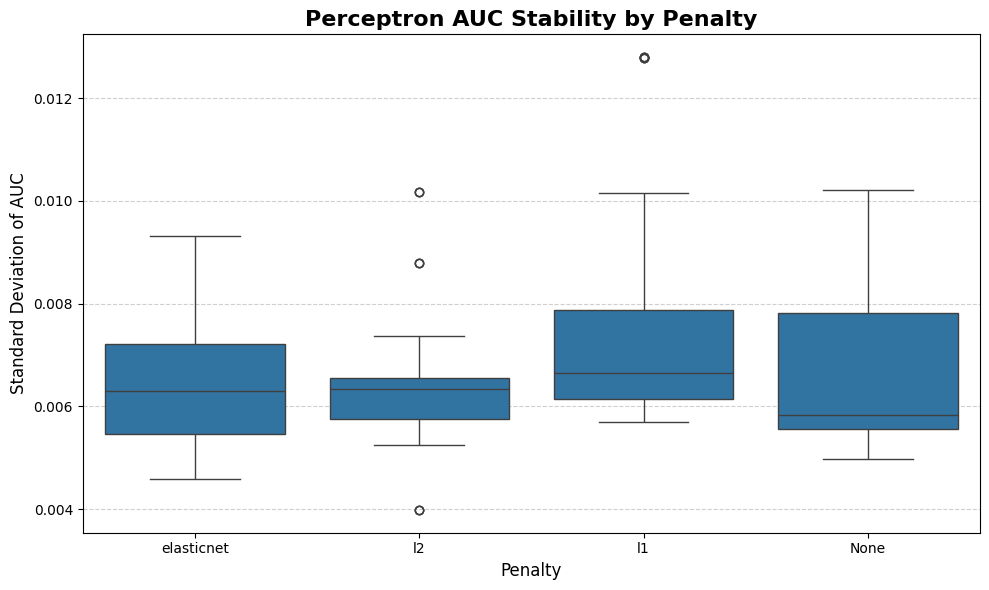

Perceptron class_weight comparison:


,class_weight_label,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Mean_Accuracy_Average,Mean_Accuracy_Max,Std_AUC_Average,Std_AUC_Min
0,None,0.993641,0.995581,0.911344,0.981063,0.913923,0.963057,0.933858,0.973653,0.006392,0.003983
1,balanced,0.993171,0.995645,0.914897,0.976412,0.905003,0.967204,0.924965,0.975423,0.007228,0.004593


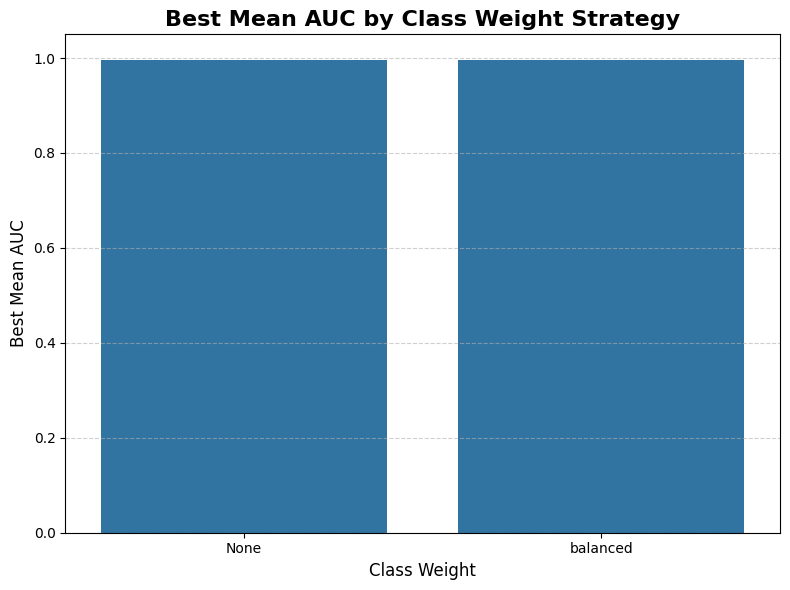

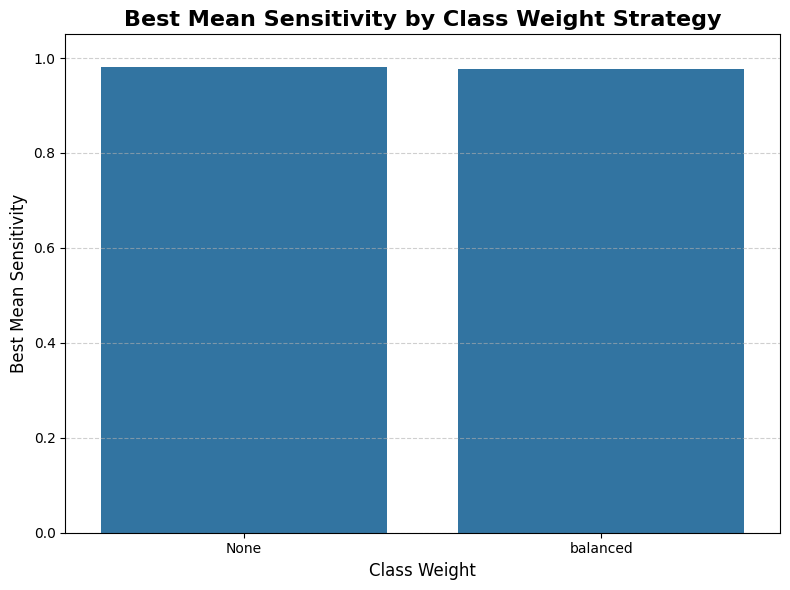

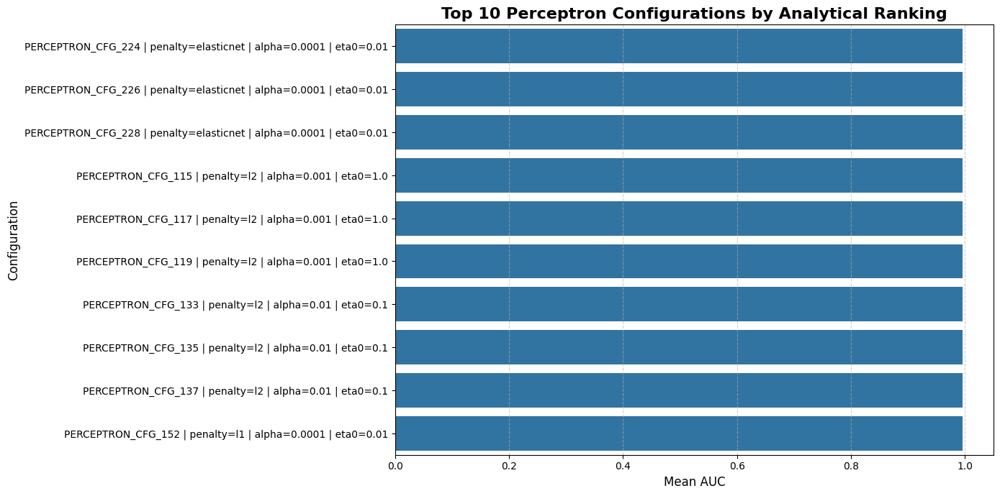


Top hyperparameter groups:


,penalty_label,alpha,eta0,class_weight_label,Mean_AUC,Mean_Sensitivity,Mean_F1_score,Std_AUC
27,elasticnet,0.0001,0.010,balanced,0.995645,0.948062,0.961511,0.005240
86,l2,0.0010,1.000,None,0.995581,0.962348,0.899969,0.005751
92,l2,0.0100,0.100,None,0.995581,0.962348,0.899969,0.005751
51,l1,0.0001,0.010,balanced,0.995579,0.962126,0.922865,0.005967
52,l1,0.0001,0.100,None,0.995578,0.957807,0.950899,0.006133
54,l1,0.0001,1.000,None,0.995578,0.943522,0.954333,0.006133
32,elasticnet,0.0010,0.001,None,0.995444,0.939092,0.944697,0.005099
50,l1,0.0001,0.010,None,0.995382,0.919491,0.933514,0.006156
0,None,0.0001,0.001,None,0.995184,0.900886,0.933734,0.004968
8,None,0.0010,0.001,None,0.995184,0.900886,0.933734,0.004968



Perceptron hyperparameter selection plots completed successfully.


In [52]:
# ============================================================
# BOX 50 — Perceptron Hyperparameter Selection Plots
#
# Purpose:
#   - Visualize Perceptron hyperparameter search results
#   - Analyze performance trends across candidate settings
#   - Compare penalty, alpha, eta0, max_iter, and class_weight
#   - Support fully evidence-based hyperparameter selection
#
# Visual Outputs:
#   1) Mean AUC by penalty
#   2) Mean AUC by eta0
#   3) Mean AUC by alpha
#   4) Mean Sensitivity by penalty
#   5) Mean F1-score by penalty
#   6) Std AUC by penalty
#   7) Top 10 configurations by analytical ranking
#
# Notes:
#   - No model training is performed in this box
#   - All plots are derived from previous Perceptron CV results
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "perceptron_ranked_results_df",
    "perceptron_cv_summary_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(perceptron_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "perceptron_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(perceptron_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "perceptron_cv_summary_results_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Prepare plotting DataFrame
# ------------------------------------------------------------
perceptron_plot_df = (
    perceptron_cv_summary_results_df
    .copy()
)

required_plot_columns = [
    "Config_ID",
    "penalty",
    "alpha",
    "eta0",
    "max_iter",
    "class_weight",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Sensitivity",
    "Mean_F1-score",
    "Mean_Accuracy"
]

missing_plot_columns = [
    col for col in required_plot_columns
    if col not in perceptron_plot_df.columns
]

if len(missing_plot_columns) > 0:
    raise ValueError(
        f"Missing required plot columns: {missing_plot_columns}"
    )

# ------------------------------------------------------------
# Step 2 — Create readable categorical labels
# ------------------------------------------------------------
perceptron_plot_df["penalty_label"] = (
    perceptron_plot_df["penalty"].astype(str)
)

perceptron_plot_df["class_weight_label"] = (
    perceptron_plot_df["class_weight"].astype(str)
)

# ------------------------------------------------------------
# Step 3 — Plot Mean AUC by penalty
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=perceptron_plot_df,
    x="penalty_label",
    y="Mean_AUC"
)

plt.title(
    "Perceptron Mean AUC Distribution by Penalty",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Penalty", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Plot Mean AUC by eta0
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=perceptron_plot_df,
    x="eta0",
    y="Mean_AUC"
)

plt.title(
    "Perceptron Mean AUC Distribution by Learning Rate",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Initial Learning Rate (eta0)", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Plot Mean AUC by alpha
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=perceptron_plot_df,
    x="alpha",
    y="Mean_AUC"
)

plt.title(
    "Perceptron Mean AUC Distribution by Alpha",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Regularization Strength (alpha)", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Plot Mean Sensitivity by penalty
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=perceptron_plot_df,
    x="penalty_label",
    y="Mean_Sensitivity"
)

plt.title(
    "Perceptron Mean Sensitivity Distribution by Penalty",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Penalty", fontsize=12)
plt.ylabel("Mean Sensitivity", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Plot Mean F1-score by penalty
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=perceptron_plot_df,
    x="penalty_label",
    y="Mean_F1-score"
)

plt.title(
    "Perceptron Mean F1-score Distribution by Penalty",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Penalty", fontsize=12)
plt.ylabel("Mean F1-score", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot Std AUC by penalty
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=perceptron_plot_df,
    x="penalty_label",
    y="Std_AUC"
)

plt.title(
    "Perceptron AUC Stability by Penalty",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Penalty", fontsize=12)
plt.ylabel("Standard Deviation of AUC", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Create class_weight comparison table
# ------------------------------------------------------------
perceptron_class_weight_comparison_df = (
    perceptron_plot_df
    .groupby("class_weight_label")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Mean_Accuracy_Average=("Mean_Accuracy", "mean"),
        Mean_Accuracy_Max=("Mean_Accuracy", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min")
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 10 — Display class_weight comparison table
# ------------------------------------------------------------
print(
    "Perceptron class_weight comparison:"
)

display(
    perceptron_class_weight_comparison_df.round(6)
)

# ------------------------------------------------------------
# Step 11 — Plot best Mean AUC by class_weight
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=perceptron_class_weight_comparison_df,
    x="class_weight_label",
    y="Mean_AUC_Max"
)

plt.title(
    "Best Mean AUC by Class Weight Strategy",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Class Weight", fontsize=12)
plt.ylabel("Best Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Plot best Mean Sensitivity by class_weight
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=perceptron_class_weight_comparison_df,
    x="class_weight_label",
    y="Mean_Sensitivity_Max"
)

plt.title(
    "Best Mean Sensitivity by Class Weight Strategy",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Class Weight", fontsize=12)
plt.ylabel("Best Mean Sensitivity", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 13 — Create top configuration labels
# ------------------------------------------------------------
top_perceptron_plot_df = (
    perceptron_ranked_results_df
    .head(10)
    .copy()
)

top_perceptron_plot_df["Config_Label"] = (
    top_perceptron_plot_df["Config_ID"].astype(str)
    + " | penalty="
    + top_perceptron_plot_df["penalty"].astype(str)
    + " | alpha="
    + top_perceptron_plot_df["alpha"].astype(str)
    + " | eta0="
    + top_perceptron_plot_df["eta0"].astype(str)
)

# ------------------------------------------------------------
# Step 14 — Plot Top 10 configurations by Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_perceptron_plot_df,
    x="Mean_AUC",
    y="Config_Label"
)

plt.title(
    "Top 10 Perceptron Configurations by Analytical Ranking",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean AUC", fontsize=12)
plt.ylabel("Configuration", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 15 — Create hyperparameter group summary
# ------------------------------------------------------------
perceptron_hyperparameter_summary_df = (
    perceptron_plot_df
    .groupby(
        [
            "penalty_label",
            "alpha",
            "eta0",
            "class_weight_label"
        ]
    )
    .agg(
        Mean_AUC=("Mean_AUC", "mean"),
        Mean_Sensitivity=("Mean_Sensitivity", "mean"),
        Mean_F1_score=("Mean_F1-score", "mean"),
        Std_AUC=("Std_AUC", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1_score",
            "Std_AUC"
        ],
        ascending=[
            False,
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 16 — Display compact hyperparameter summary
# ------------------------------------------------------------
print(
    "\nTop hyperparameter groups:"
)

display(
    perceptron_hyperparameter_summary_df
    .head(10)
    .round(6)
)

print(
    "\nPerceptron hyperparameter selection "
    "plots completed successfully."
)

In [53]:
# ============================================================
# BOX 51 — Analytical Best Perceptron Configuration Selection
#
# Purpose:
#   - Select the best Perceptron configuration analytically
#   - Avoid manual hyperparameter selection
#   - Apply a fully reproducible ranking strategy
#   - Generate final model-selection reports
#
# Selection Priority:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Simpler model in case of ties
#
# Notes:
#   - No model training is performed in this box
#   - Results are derived from previous CV analysis
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "perceptron_ranked_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(
    perceptron_ranked_results_df,
    pd.DataFrame
):
    raise TypeError(
        "perceptron_ranked_results_df must be a pandas DataFrame."
    )

if perceptron_ranked_results_df.empty:
    raise ValueError(
        "perceptron_ranked_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Add model simplicity score
# ------------------------------------------------------------
penalty_simplicity_map = {
    "None": 0,
    "l2": 1,
    "l1": 2,
    "elasticnet": 3
}

class_weight_simplicity_map = {
    "None": 0,
    "balanced": 1
}

perceptron_selection_df = (
    perceptron_ranked_results_df.copy()
)

perceptron_selection_df["Penalty_Simplicity"] = (
    perceptron_selection_df["penalty"]
    .astype(str)
    .map(penalty_simplicity_map)
    .fillna(99)
)

perceptron_selection_df["Class_Weight_Simplicity"] = (
    perceptron_selection_df["class_weight"]
    .astype(str)
    .map(class_weight_simplicity_map)
    .fillna(99)
)

# ------------------------------------------------------------
# Step 2 — Apply analytical ranking strategy
# ------------------------------------------------------------
perceptron_final_ranking_df = (
    perceptron_selection_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Penalty_Simplicity",
            "Class_Weight_Simplicity",
            "alpha",
            "eta0",
            "max_iter"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True,
            True,
            True,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 3 — Select best configuration
# ------------------------------------------------------------
best_perceptron_configuration = (
    perceptron_final_ranking_df.iloc[0]
)

# ------------------------------------------------------------
# Step 4 — Extract best hyperparameters
# ------------------------------------------------------------
BEST_PERCEPTRON_CONFIG_ID = (
    best_perceptron_configuration["Config_ID"]
)

BEST_PERCEPTRON_PENALTY = (
    None
    if best_perceptron_configuration["penalty"] == "None"
    else best_perceptron_configuration["penalty"]
)

BEST_PERCEPTRON_ALPHA = float(
    best_perceptron_configuration["alpha"]
)

BEST_PERCEPTRON_ETA0 = float(
    best_perceptron_configuration["eta0"]
)

BEST_PERCEPTRON_MAX_ITER = int(
    best_perceptron_configuration["max_iter"]
)

BEST_PERCEPTRON_CLASS_WEIGHT = (
    None
    if best_perceptron_configuration["class_weight"] == "None"
    else best_perceptron_configuration["class_weight"]
)

BEST_PERCEPTRON_TOL = float(
    best_perceptron_configuration["tol"]
)

BEST_PERCEPTRON_RANDOM_STATE = 42

BEST_PERCEPTRON_SHUFFLE = True

# ------------------------------------------------------------
# Step 5 — Create best-configuration report
# ------------------------------------------------------------
best_perceptron_configuration_report = {

    "Config_ID":
        BEST_PERCEPTRON_CONFIG_ID,

    "penalty":
        str(BEST_PERCEPTRON_PENALTY),

    "alpha":
        BEST_PERCEPTRON_ALPHA,

    "eta0":
        BEST_PERCEPTRON_ETA0,

    "max_iter":
        BEST_PERCEPTRON_MAX_ITER,

    "class_weight":
        str(BEST_PERCEPTRON_CLASS_WEIGHT),

    "tol":
        BEST_PERCEPTRON_TOL,

    "Mean_Accuracy":
        best_perceptron_configuration["Mean_Accuracy"],

    "Std_Accuracy":
        best_perceptron_configuration["Std_Accuracy"],

    "Mean_Sensitivity":
        best_perceptron_configuration["Mean_Sensitivity"],

    "Std_Sensitivity":
        best_perceptron_configuration["Std_Sensitivity"],

    "Mean_Specificity":
        best_perceptron_configuration["Mean_Specificity"],

    "Std_Specificity":
        best_perceptron_configuration["Std_Specificity"],

    "Mean_F1-score":
        best_perceptron_configuration["Mean_F1-score"],

    "Std_F1-score":
        best_perceptron_configuration["Std_F1-score"],

    "Mean_AUC":
        best_perceptron_configuration["Mean_AUC"],

    "Std_AUC":
        best_perceptron_configuration["Std_AUC"]
}

best_perceptron_configuration_df = pd.DataFrame(
    [best_perceptron_configuration_report]
)

# ------------------------------------------------------------
# Step 6 — Create top-5 comparison table
# ------------------------------------------------------------
top5_perceptron_configurations_df = (
    perceptron_final_ranking_df
    .head(5)
    .copy()
)

top5_display_columns = [
    "Config_ID",
    "penalty",
    "alpha",
    "eta0",
    "max_iter",
    "class_weight",
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC",
    "Std_AUC"
]

top5_perceptron_configurations_df = (
    top5_perceptron_configurations_df[
        top5_display_columns
    ]
)

# ------------------------------------------------------------
# Step 7 — Create rounded display tables
# ------------------------------------------------------------
metric_columns = [
    col for col in best_perceptron_configuration_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or col in ["alpha", "eta0", "tol"]
    )
]

best_perceptron_configuration_display_df = (
    best_perceptron_configuration_df.copy()
)

best_perceptron_configuration_display_df[
    metric_columns
] = (
    best_perceptron_configuration_display_df[
        metric_columns
    ].round(6)
)

top5_perceptron_display_df = (
    top5_perceptron_configurations_df.copy()
)

top5_metric_columns = [
    col for col in top5_perceptron_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or col in ["alpha", "eta0"]
    )
]

top5_perceptron_display_df[
    top5_metric_columns
] = (
    top5_perceptron_display_df[
        top5_metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 8 — Create analytical interpretation report
# ------------------------------------------------------------
perceptron_selection_interpretation = {

    "Selected_Model":
        "Perceptron",

    "Selection_Method":
        "Fully Analytical Cross-Validation Ranking",

    "Primary_Criterion":
        "Highest Mean_AUC",

    "Secondary_Criterion":
        "Highest Mean_Sensitivity",

    "Tertiary_Criterion":
        "Highest Mean_F1-score",

    "Stability_Criterion":
        "Lowest Std_AUC",

    "Simplicity_Criterion":
        "Simpler penalty and class_weight in case of ties"
}

perceptron_selection_interpretation_df = pd.DataFrame(
    [perceptron_selection_interpretation]
)

# ------------------------------------------------------------
# Step 9 — Display analytical selection results
# ------------------------------------------------------------
print(
    "Analytical best Perceptron configuration selected."
)

print("\nSelection criteria:")
display(
    perceptron_selection_interpretation_df
)

print("\nBest Perceptron configuration:")
display(
    best_perceptron_configuration_display_df
)

print("\nTop 5 ranked configurations:")
display(
    top5_perceptron_display_df
)

# ------------------------------------------------------------
# Step 10 — Store final metadata
# ------------------------------------------------------------
best_perceptron_metadata = {

    "model_name":
        "Perceptron",

    "config_id":
        BEST_PERCEPTRON_CONFIG_ID,

    "penalty":
        BEST_PERCEPTRON_PENALTY,

    "alpha":
        BEST_PERCEPTRON_ALPHA,

    "eta0":
        BEST_PERCEPTRON_ETA0,

    "max_iter":
        BEST_PERCEPTRON_MAX_ITER,

    "class_weight":
        BEST_PERCEPTRON_CLASS_WEIGHT,

    "tol":
        BEST_PERCEPTRON_TOL,

    "random_state":
        BEST_PERCEPTRON_RANDOM_STATE,

    "shuffle":
        BEST_PERCEPTRON_SHUFFLE
}

# ------------------------------------------------------------
# Step 11 — Final confirmation
# ------------------------------------------------------------
print("\nSelected hyperparameters:")
print(f"penalty      : {BEST_PERCEPTRON_PENALTY}")
print(f"alpha        : {BEST_PERCEPTRON_ALPHA}")
print(f"eta0         : {BEST_PERCEPTRON_ETA0}")
print(f"max_iter     : {BEST_PERCEPTRON_MAX_ITER}")
print(f"class_weight : {BEST_PERCEPTRON_CLASS_WEIGHT}")
print(f"tol          : {BEST_PERCEPTRON_TOL}")

print(
    "\nAnalytical Perceptron model selection "
    "completed successfully."
)

Analytical best Perceptron configuration selected.

Selection criteria:


,Selected_Model,Selection_Method,Primary_Criterion,Secondary_Criterion,Tertiary_Criterion,Stability_Criterion,Simplicity_Criterion
0,Perceptron,Fully Analytical Cross-Validation Ranking,Highest Mean_AUC,Highest Mean_Sensitivity,Highest Mean_F1-score,Lowest Std_AUC,Simpler penalty and class_weight in case of ties



Best Perceptron configuration:


,Config_ID,penalty,alpha,eta0,max_iter,class_weight,tol,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC
0,PERCEPTRON_CFG_224,elasticnet,0.0001,0.01,500,balanced,0.0001,0.971914,0.024326,0.948062,0.054346,0.985915,0.024395,0.961511,0.033725,0.995645,0.00524



Top 5 ranked configurations:


,Config_ID,penalty,alpha,eta0,max_iter,class_weight,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC
0,PERCEPTRON_CFG_224,elasticnet,0.0001,0.01,500,balanced,0.971914,0.948062,0.985915,0.961511,0.995645,0.005240
1,PERCEPTRON_CFG_226,elasticnet,0.0001,0.01,1000,balanced,0.971914,0.948062,0.985915,0.961511,0.995645,0.005240
2,PERCEPTRON_CFG_228,elasticnet,0.0001,0.01,2000,balanced,0.971914,0.948062,0.985915,0.961511,0.995645,0.005240
3,PERCEPTRON_CFG_115,l2,0.0010,1.00,500,None,0.912265,0.962348,0.882668,0.899969,0.995581,0.005751
4,PERCEPTRON_CFG_117,l2,0.0010,1.00,1000,None,0.912265,0.962348,0.882668,0.899969,0.995581,0.005751



Selected hyperparameters:
penalty      : elasticnet
alpha        : 0.0001
eta0         : 0.01
max_iter     : 500
class_weight : balanced
tol          : 0.0001

Analytical Perceptron model selection completed successfully.


In [54]:
# ============================================================
# BOX 52 — Final Perceptron 5-Fold Evaluation
#
# Purpose:
#   - Train and evaluate the analytically selected
#     Perceptron configuration
#   - Perform final Stratified 5-Fold evaluation
#   - Compute fold-level classification metrics
#   - Store ROC and confusion-matrix information
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "BEST_PERCEPTRON_PENALTY",
    "BEST_PERCEPTRON_ALPHA",
    "BEST_PERCEPTRON_ETA0",
    "BEST_PERCEPTRON_MAX_ITER",
    "BEST_PERCEPTRON_CLASS_WEIGHT",
    "BEST_PERCEPTRON_TOL",
    "BEST_PERCEPTRON_RANDOM_STATE",
    "BEST_PERCEPTRON_SHUFFLE",
    "compute_binary_classification_metrics",
    "compute_roc_curve_data"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
final_perceptron_fold_results = []

final_perceptron_confusion_matrices = []

final_perceptron_roc_data = []

final_perceptron_trained_models = []

# ------------------------------------------------------------
# Step 2 — Run final 5-Fold evaluation
# ------------------------------------------------------------
for fold_data in cv5_scaled_folds:

    # --------------------------------------------------------
    # Step 2.1 — Extract fold information
    # --------------------------------------------------------
    fold_number = fold_data["fold_number"]

    X_train = fold_data["X_train_scaled"]

    X_val = fold_data["X_validation_scaled"]

    y_train = fold_data["y_train"]

    y_val = fold_data["y_validation"]

    # --------------------------------------------------------
    # Step 2.2 — Initialize final Perceptron model
    # --------------------------------------------------------
    final_perceptron_model = Perceptron(

        penalty=BEST_PERCEPTRON_PENALTY,

        alpha=BEST_PERCEPTRON_ALPHA,

        eta0=BEST_PERCEPTRON_ETA0,

        max_iter=BEST_PERCEPTRON_MAX_ITER,

        class_weight=BEST_PERCEPTRON_CLASS_WEIGHT,

        tol=BEST_PERCEPTRON_TOL,

        shuffle=BEST_PERCEPTRON_SHUFFLE,

        random_state=BEST_PERCEPTRON_RANDOM_STATE
    )

    # --------------------------------------------------------
    # Step 2.3 — Train model
    # --------------------------------------------------------
    final_perceptron_model.fit(
        X_train,
        y_train
    )

    # --------------------------------------------------------
    # Step 2.4 — Generate predictions
    # --------------------------------------------------------
    y_pred = final_perceptron_model.predict(
        X_val
    )

    # --------------------------------------------------------
    # Step 2.5 — Generate decision scores
    # --------------------------------------------------------
    y_score = final_perceptron_model.decision_function(
        X_val
    )

    # --------------------------------------------------------
    # Step 2.6 — Compute evaluation metrics
    # --------------------------------------------------------
    fold_metrics = (
        compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )
    )

    # --------------------------------------------------------
    # Step 2.7 — Compute ROC curve data
    # --------------------------------------------------------
    fold_roc_data = (
        compute_roc_curve_data(
            y_true=y_val,
            y_score=y_score
        )
    )

    # --------------------------------------------------------
    # Step 2.8 — Build confusion matrix
    # --------------------------------------------------------
    confusion_mat = confusion_matrix(
        y_val,
        y_pred
    )

    # --------------------------------------------------------
    # Step 2.9 — Build fold-level result row
    # --------------------------------------------------------
    fold_result_row = {

        "Model":
            "Perceptron",

        "Fold":
            fold_number,

        "penalty":
            str(BEST_PERCEPTRON_PENALTY),

        "alpha":
            BEST_PERCEPTRON_ALPHA,

        "eta0":
            BEST_PERCEPTRON_ETA0,

        "max_iter":
            BEST_PERCEPTRON_MAX_ITER,

        "class_weight":
            str(BEST_PERCEPTRON_CLASS_WEIGHT),

        "Accuracy":
            fold_metrics["Accuracy"],

        "Sensitivity":
            fold_metrics["Sensitivity"],

        "Specificity":
            fold_metrics["Specificity"],

        "Precision":
            fold_metrics["Precision"],

        "F1-score":
            fold_metrics["F1-score"],

        "AUC":
            fold_metrics["AUC"],

        "TP":
            fold_metrics["TP"],

        "FP":
            fold_metrics["FP"],

        "FN":
            fold_metrics["FN"],

        "TN":
            fold_metrics["TN"]
    }

    # --------------------------------------------------------
    # Step 2.10 — Store fold-level results
    # --------------------------------------------------------
    final_perceptron_fold_results.append(
        fold_result_row
    )

    # --------------------------------------------------------
    # Step 2.11 — Store confusion matrices
    # --------------------------------------------------------
    final_perceptron_confusion_matrices.append({

        "fold":
            fold_number,

        "matrix":
            confusion_mat
    })

    # --------------------------------------------------------
    # Step 2.12 — Store ROC curve data
    # --------------------------------------------------------
    final_perceptron_roc_data.append({

        "fold":
            fold_number,

        "roc_data":
            fold_roc_data
    })

    # --------------------------------------------------------
    # Step 2.13 — Store trained models
    # --------------------------------------------------------
    final_perceptron_trained_models.append({

        "fold":
            fold_number,

        "model":
            final_perceptron_model
    })

# ------------------------------------------------------------
# Step 3 — Create fold-level results DataFrame
# ------------------------------------------------------------
final_perceptron_fold_results_df = pd.DataFrame(
    final_perceptron_fold_results
)

# ------------------------------------------------------------
# Step 4 — Compute summary statistics
# ------------------------------------------------------------
summary_metrics = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

final_perceptron_summary_rows = []

for metric_name in summary_metrics:

    metric_values = (
        final_perceptron_fold_results_df[
            metric_name
        ]
    )

    summary_row = {

        "Metric":
            metric_name,

        "Mean":
            metric_values.mean(),

        "Std":
            metric_values.std(),

        "Min":
            metric_values.min(),

        "Max":
            metric_values.max()
    }

    final_perceptron_summary_rows.append(
        summary_row
    )

# ------------------------------------------------------------
# Step 5 — Create summary DataFrame
# ------------------------------------------------------------
final_perceptron_summary_results_df = pd.DataFrame(
    final_perceptron_summary_rows
)

# ------------------------------------------------------------
# Step 6 — Create rounded display versions
# ------------------------------------------------------------
final_perceptron_fold_display_df = (
    final_perceptron_fold_results_df.copy()
)

metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

final_perceptron_fold_display_df[
    metric_columns
] = (
    final_perceptron_fold_display_df[
        metric_columns
    ].round(6)
)

final_perceptron_summary_display_df = (
    final_perceptron_summary_results_df.copy()
)

summary_numeric_columns = [
    "Mean",
    "Std",
    "Min",
    "Max"
]

final_perceptron_summary_display_df[
    summary_numeric_columns
] = (
    final_perceptron_summary_display_df[
        summary_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 7 — Display fold-level results
# ------------------------------------------------------------
print(
    "Final Perceptron fold-by-fold evaluation completed."
)

print("\nFold-level results:")

display(
    final_perceptron_fold_display_df
)

# ------------------------------------------------------------
# Step 8 — Display summary statistics
# ------------------------------------------------------------
print("\nFinal Perceptron summary statistics:")

display(
    final_perceptron_summary_display_df
)

# ------------------------------------------------------------
# Step 9 — Display selected configuration
# ------------------------------------------------------------
print("\nSelected configuration:")

print(f"penalty      = {BEST_PERCEPTRON_PENALTY}")
print(f"alpha        = {BEST_PERCEPTRON_ALPHA}")
print(f"eta0         = {BEST_PERCEPTRON_ETA0}")
print(f"max_iter     = {BEST_PERCEPTRON_MAX_ITER}")
print(f"class_weight = {BEST_PERCEPTRON_CLASS_WEIGHT}")

print(
    "\nFinal Perceptron evaluation "
    "completed successfully."
)

Final Perceptron fold-by-fold evaluation completed.

Fold-level results:


,Model,Fold,penalty,alpha,eta0,max_iter,class_weight,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,Perceptron,1,elasticnet,0.0001,0.01,500,balanced,0.973684,0.953488,0.985915,0.976190,0.964706,0.997380,41,1,2,70
1,Perceptron,2,elasticnet,0.0001,0.01,500,balanced,0.947368,0.953488,0.943662,0.911111,0.931818,0.995414,41,4,2,67
2,Perceptron,3,elasticnet,0.0001,0.01,500,balanced,0.947368,0.857143,1.000000,1.000000,0.923077,0.986772,36,0,6,72
3,Perceptron,4,elasticnet,0.0001,0.01,500,balanced,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,42,0,0,72
4,Perceptron,5,elasticnet,0.0001,0.01,500,balanced,0.991150,0.976190,1.000000,1.000000,0.987952,0.998659,41,0,1,71



Final Perceptron summary statistics:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.971914,0.024326,0.947368,1.0
1,Sensitivity,0.948062,0.054346,0.857143,1.0
2,Specificity,0.985915,0.024395,0.943662,1.0
3,Precision,0.977460,0.038497,0.911111,1.0
4,F1-score,0.961511,0.033725,0.923077,1.0
5,AUC,0.995645,0.005240,0.986772,1.0



Selected configuration:
penalty      = elasticnet
alpha        = 0.0001
eta0         = 0.01
max_iter     = 500
class_weight = balanced

Final Perceptron evaluation completed successfully.


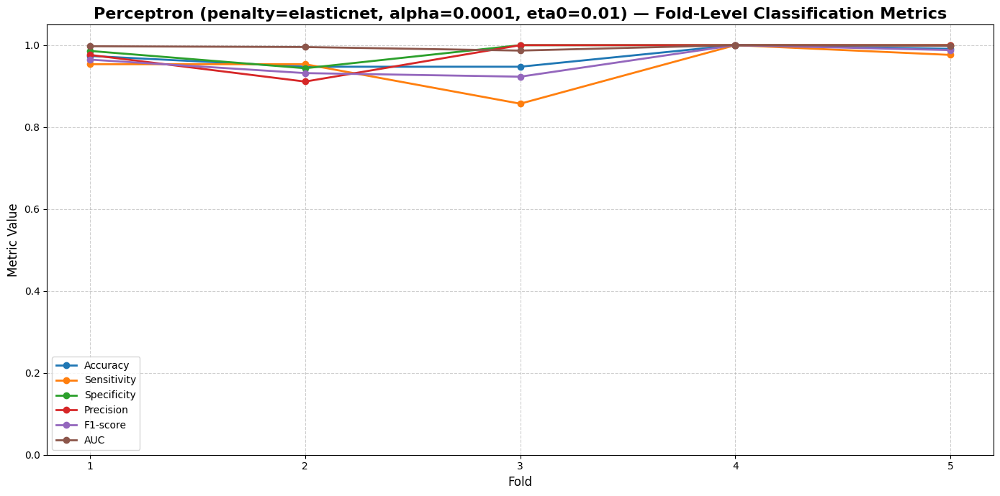

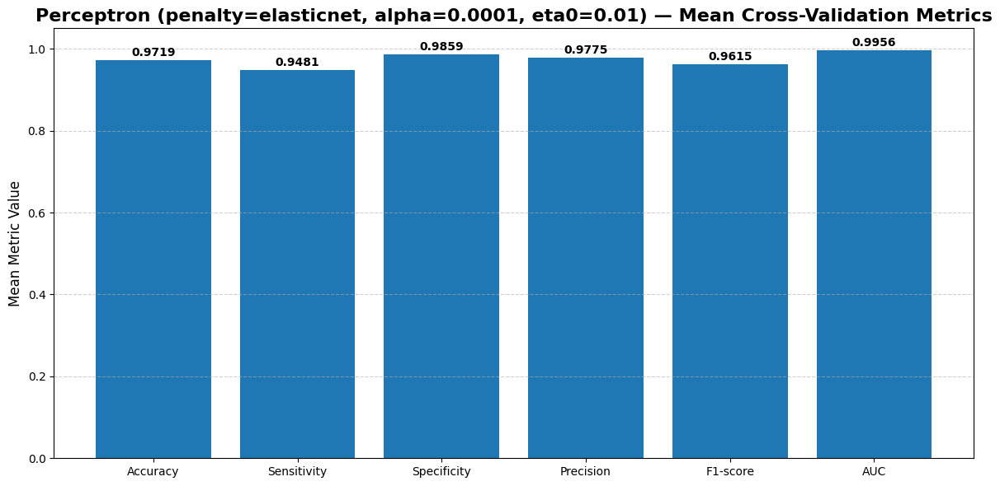

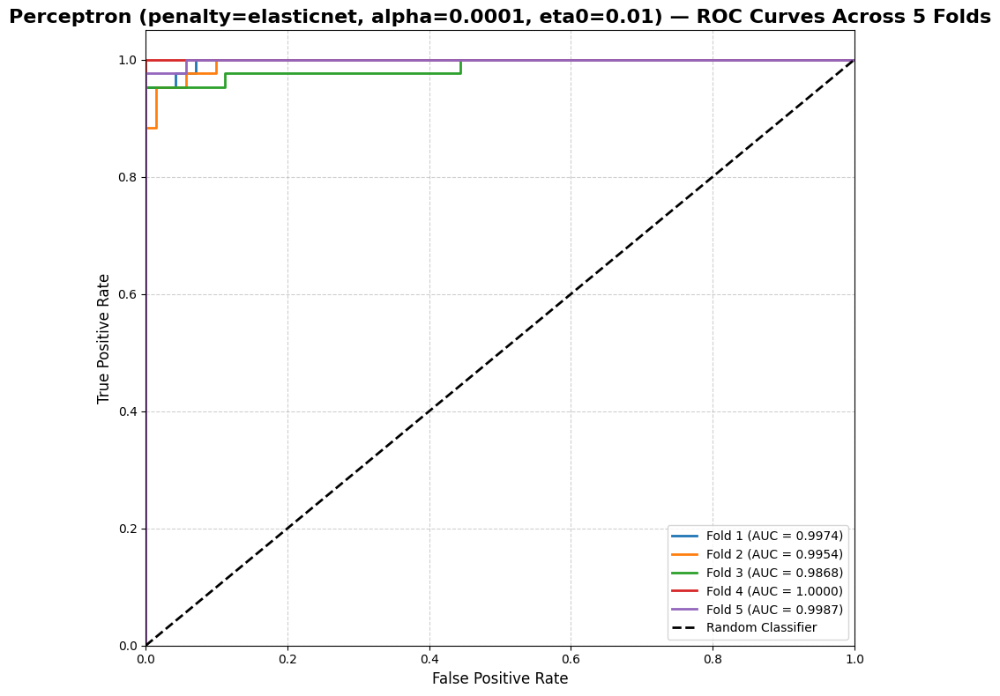

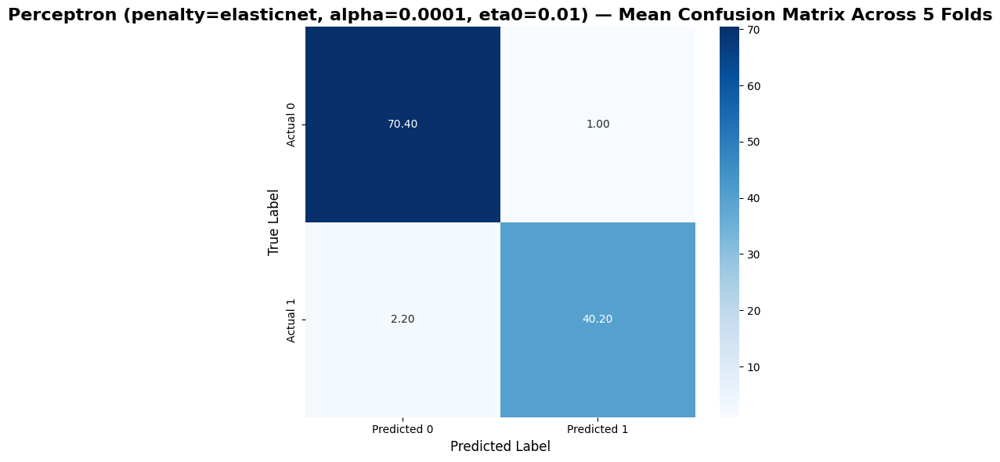

Final Perceptron visual evaluation report is ready.

Selected Perceptron configuration:
penalty      : elasticnet
alpha        : 0.0001
eta0         : 0.01
max_iter     : 500
class_weight : balanced

Fold-level results:


,Model,Fold,penalty,alpha,eta0,max_iter,class_weight,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,Perceptron,1,elasticnet,0.0001,0.01,500,balanced,0.973684,0.953488,0.985915,0.976190,0.964706,0.997380,41,1,2,70
1,Perceptron,2,elasticnet,0.0001,0.01,500,balanced,0.947368,0.953488,0.943662,0.911111,0.931818,0.995414,41,4,2,67
2,Perceptron,3,elasticnet,0.0001,0.01,500,balanced,0.947368,0.857143,1.000000,1.000000,0.923077,0.986772,36,0,6,72
3,Perceptron,4,elasticnet,0.0001,0.01,500,balanced,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,42,0,0,72
4,Perceptron,5,elasticnet,0.0001,0.01,500,balanced,0.991150,0.976190,1.000000,1.000000,0.987952,0.998659,41,0,1,71



Compact metric summary:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.971914,0.024326,0.947368,1.0
1,Sensitivity,0.948062,0.054346,0.857143,1.0
2,Specificity,0.985915,0.024395,0.943662,1.0
3,Precision,0.977460,0.038497,0.911111,1.0
4,F1-score,0.961511,0.033725,0.923077,1.0
5,AUC,0.995645,0.005240,0.986772,1.0



Final Perceptron visual reporting completed successfully.


In [55]:
# ============================================================
# BOX 53 — Final Perceptron Visual Evaluation Report
#
# Purpose:
#   - Create visual evaluation reports for the final
#     analytically selected Perceptron model
#   - Visualize fold-level classification metrics
#   - Plot ROC curves across all folds
#   - Plot mean confusion matrix
#   - Generate report-ready outputs
#
# Visual Outputs:
#   1) Fold-level metric comparison
#   2) Mean metric summary
#   3) ROC curves for all folds
#   4) Mean confusion matrix heatmap
#   5) Compact metric summary table
#
# Notes:
#   - This box does not retrain the model
#   - All results are derived from BOX 52
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_perceptron_fold_results_df",
    "final_perceptron_summary_results_df",
    "final_perceptron_confusion_matrices",
    "final_perceptron_roc_data",
    "BEST_PERCEPTRON_PENALTY",
    "BEST_PERCEPTRON_ALPHA",
    "BEST_PERCEPTRON_ETA0",
    "BEST_PERCEPTRON_MAX_ITER",
    "BEST_PERCEPTRON_CLASS_WEIGHT"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(
    final_perceptron_fold_results_df,
    pd.DataFrame
):
    raise TypeError(
        "final_perceptron_fold_results_df "
        "must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Define plotting metrics
# ------------------------------------------------------------
plot_metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 2 — Build readable model label
# ------------------------------------------------------------
perceptron_label = (
    f"Perceptron "
    f"(penalty={BEST_PERCEPTRON_PENALTY}, "
    f"alpha={BEST_PERCEPTRON_ALPHA}, "
    f"eta0={BEST_PERCEPTRON_ETA0})"
)

# ------------------------------------------------------------
# Step 3 — Fold-level metric comparison plot
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in plot_metric_columns:

    plt.plot(
        final_perceptron_fold_results_df["Fold"],
        final_perceptron_fold_results_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    f"{perceptron_label} — Fold-Level Classification Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Fold",
    fontsize=12
)

plt.ylabel(
    "Metric Value",
    fontsize=12
)

plt.xticks(
    final_perceptron_fold_results_df["Fold"]
)

plt.ylim(
    0,
    1.05
)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.legend()

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 4 — Mean metric bar plot
# ------------------------------------------------------------
mean_metric_values = [
    final_perceptron_fold_results_df[col].mean()
    for col in plot_metric_columns
]

plt.figure(figsize=(12, 6))

bars = plt.bar(
    plot_metric_columns,
    mean_metric_values
)

plt.title(
    f"{perceptron_label} — Mean Cross-Validation Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel(
    "Mean Metric Value",
    fontsize=12
)

plt.ylim(
    0,
    1.05
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

# ------------------------------------------------------------
# Step 4.1 — Add numeric labels above bars
# ------------------------------------------------------------
for bar, value in zip(
    bars,
    mean_metric_values
):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.01,
        f"{value:.4f}",
        ha="center",
        fontsize=10,
        fontweight="bold"
    )

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 5 — ROC curves across all folds
# ------------------------------------------------------------
plt.figure(figsize=(9, 8))

for fold_roc_item in final_perceptron_roc_data:

    fold_number = fold_roc_item["fold"]

    roc_data = fold_roc_item["roc_data"]

    plt.plot(
        roc_data["fpr"],
        roc_data["tpr"],
        linewidth=2,
        label=(
            f"Fold {fold_number} "
            f"(AUC = {roc_data['auc']:.4f})"
        )
    )

# ------------------------------------------------------------
# Step 5.1 — Random classifier baseline
# ------------------------------------------------------------
plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    color="black",
    label="Random Classifier"
)

plt.title(
    f"{perceptron_label} — ROC Curves Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "False Positive Rate",
    fontsize=12
)

plt.ylabel(
    "True Positive Rate",
    fontsize=12
)

plt.xlim(
    0,
    1
)

plt.ylim(
    0,
    1.05
)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.legend(
    loc="lower right"
)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 6 — Compute mean confusion matrix
# ------------------------------------------------------------
perceptron_confusion_matrix_stack = np.array([
    item["matrix"]
    for item in final_perceptron_confusion_matrices
])

mean_perceptron_confusion_matrix = (
    perceptron_confusion_matrix_stack.mean(axis=0)
)

# ------------------------------------------------------------
# Step 7 — Plot mean confusion matrix heatmap
# ------------------------------------------------------------
plt.figure(figsize=(7, 6))

sns.heatmap(
    mean_perceptron_confusion_matrix,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=True,
    xticklabels=[
        "Predicted 0",
        "Predicted 1"
    ],
    yticklabels=[
        "Actual 0",
        "Actual 1"
    ]
)

plt.title(
    f"{perceptron_label} — Mean Confusion Matrix Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Predicted Label",
    fontsize=12
)

plt.ylabel(
    "True Label",
    fontsize=12
)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# Step 8 — Create compact metric summary table
# ------------------------------------------------------------
final_perceptron_visual_summary_df = pd.DataFrame({

    "Metric":
        plot_metric_columns,

    "Mean":
        [
            final_perceptron_fold_results_df[col].mean()
            for col in plot_metric_columns
        ],

    "Std":
        [
            final_perceptron_fold_results_df[col].std()
            for col in plot_metric_columns
        ],

    "Min":
        [
            final_perceptron_fold_results_df[col].min()
            for col in plot_metric_columns
        ],

    "Max":
        [
            final_perceptron_fold_results_df[col].max()
            for col in plot_metric_columns
        ]
})

final_perceptron_visual_summary_df = (
    final_perceptron_visual_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 9 — Create fold-level display table
# ------------------------------------------------------------
final_perceptron_fold_report_df = (
    final_perceptron_fold_results_df.copy()
)

final_perceptron_fold_report_df[
    plot_metric_columns
] = (
    final_perceptron_fold_report_df[
        plot_metric_columns
    ].round(6)
)

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN"
]

final_perceptron_fold_report_df[
    count_columns
] = (
    final_perceptron_fold_report_df[
        count_columns
    ].astype(int)
)

# ------------------------------------------------------------
# Step 10 — Display final tables
# ------------------------------------------------------------
print(
    "Final Perceptron visual evaluation report is ready."
)

print("\nSelected Perceptron configuration:")
print(f"penalty      : {BEST_PERCEPTRON_PENALTY}")
print(f"alpha        : {BEST_PERCEPTRON_ALPHA}")
print(f"eta0         : {BEST_PERCEPTRON_ETA0}")
print(f"max_iter     : {BEST_PERCEPTRON_MAX_ITER}")
print(f"class_weight : {BEST_PERCEPTRON_CLASS_WEIGHT}")

print("\nFold-level results:")
display(
    final_perceptron_fold_report_df
)

print("\nCompact metric summary:")
display(
    final_perceptron_visual_summary_df
)

# ------------------------------------------------------------
# Step 11 — Store plot references
# ------------------------------------------------------------
all_model_metric_plots.append({

    "model":
        "Perceptron",

    "plots":
        [
            "fold_level_metrics",
            "mean_metric_barplot",
            "roc_curves",
            "mean_confusion_matrix"
        ]
})

print(
    "\nFinal Perceptron visual reporting "
    "completed successfully."
)

In [56]:
# ============================================================
# BOX 54 — MLP Hyperparameter Search Space Definition
#
# Purpose:
#   - Define a fully analytical hyperparameter search space
#     for the Multilayer Perceptron (MLP) classifier
#   - Avoid manual hyperparameter selection
#   - Prepare candidate configurations for downstream
#     Stratified 5-Fold Cross-Validation experiments
#
# Hyperparameters:
#   1) hidden_layer_sizes
#   2) activation
#   3) alpha
#   4) learning_rate_init
#   5) solver
#   6) max_iter
#
# Methodological Notes:
#   - MLP is sensitive to scaling, so fold-level Min-Max
#     scaled data will be used in later boxes
#   - Search space is intentionally controlled to avoid
#     excessive runtime and over-complex architectures
#   - No model is trained in this box
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

# ------------------------------------------------------------
# Step 1 — Extract feature-space information
# ------------------------------------------------------------
first_fold_X_train = cv5_scaled_folds[0]["X_train_scaled"]

if not isinstance(first_fold_X_train, pd.DataFrame):
    raise TypeError(
        "Fold-level X_train_scaled must be a pandas DataFrame."
    )

MLP_INPUT_DIMENSION = first_fold_X_train.shape[1]

# ------------------------------------------------------------
# Step 2 — Define candidate network architectures
# ------------------------------------------------------------
# Architecture design:
#   - Small, medium, and larger architectures are included
#   - Both one-hidden-layer and two-hidden-layer structures
#     are evaluated
#   - Architecture size is controlled to reduce overfitting risk
# ------------------------------------------------------------

candidate_hidden_layer_sizes = [
    (8,),
    (16,),
    (32,),
    (64,),
    (16, 8),
    (32, 16),
    (64, 32)
]

# ------------------------------------------------------------
# Step 3 — Define activation functions
# ------------------------------------------------------------
candidate_activation_values = [
    "relu",
    "tanh"
]

# ------------------------------------------------------------
# Step 4 — Define regularization strengths
# ------------------------------------------------------------
candidate_alpha_values = [
    0.0001,
    0.001,
    0.01
]

# ------------------------------------------------------------
# Step 5 — Define learning rates
# ------------------------------------------------------------
candidate_learning_rate_init_values = [
    0.0005,
    0.001,
    0.01
]

# ------------------------------------------------------------
# Step 6 — Define solvers
# ------------------------------------------------------------
# adam:
#   Suitable for neural networks and robust default optimizer
#
# lbfgs:
#   Often effective on small datasets
# ------------------------------------------------------------

candidate_solver_values = [
    "adam",
    "lbfgs"
]

# ------------------------------------------------------------
# Step 7 — Define maximum iteration values
# ------------------------------------------------------------
candidate_max_iter_values = [
    500,
    1000
]

# ------------------------------------------------------------
# Step 8 — Define fixed MLP settings
# ------------------------------------------------------------
MLP_RANDOM_STATE = 42

MLP_TOL = 1e-4

MLP_EARLY_STOPPING = False

MLP_SHUFFLE = True

MLP_MAX_FUN = 15000

# ------------------------------------------------------------
# Step 9 — Build candidate configuration registry
# ------------------------------------------------------------
mlp_candidate_configurations = []

configuration_counter = 1

for hidden_layer_sizes in candidate_hidden_layer_sizes:

    for activation in candidate_activation_values:

        for alpha in candidate_alpha_values:

            for learning_rate_init in candidate_learning_rate_init_values:

                for solver in candidate_solver_values:

                    for max_iter in candidate_max_iter_values:

                        total_hidden_neurons = int(
                            np.sum(hidden_layer_sizes)
                        )

                        number_of_hidden_layers = len(
                            hidden_layer_sizes
                        )

                        configuration_record = {

                            "config_id":
                                f"MLP_CFG_{configuration_counter}",

                            "hidden_layer_sizes":
                                hidden_layer_sizes,

                            "hidden_layer_sizes_label":
                                str(hidden_layer_sizes),

                            "number_of_hidden_layers":
                                number_of_hidden_layers,

                            "total_hidden_neurons":
                                total_hidden_neurons,

                            "activation":
                                activation,

                            "alpha":
                                alpha,

                            "learning_rate_init":
                                learning_rate_init,

                            "solver":
                                solver,

                            "max_iter":
                                max_iter,

                            "random_state":
                                MLP_RANDOM_STATE,

                            "tol":
                                MLP_TOL,

                            "early_stopping":
                                MLP_EARLY_STOPPING,

                            "shuffle":
                                MLP_SHUFFLE,

                            "max_fun":
                                MLP_MAX_FUN,

                            "input_dimension":
                                MLP_INPUT_DIMENSION
                        }

                        mlp_candidate_configurations.append(
                            configuration_record
                        )

                        configuration_counter += 1

# ------------------------------------------------------------
# Step 10 — Convert registry to DataFrame
# ------------------------------------------------------------
mlp_candidate_configurations_df = pd.DataFrame(
    mlp_candidate_configurations
)

# ------------------------------------------------------------
# Step 11 — Safety checks
# ------------------------------------------------------------
if mlp_candidate_configurations_df.empty:
    raise ValueError(
        "No MLP configurations were generated."
    )

if (
    mlp_candidate_configurations_df["alpha"] <= 0
).any():
    raise ValueError(
        "All alpha values must be positive."
    )

if (
    mlp_candidate_configurations_df["learning_rate_init"] <= 0
).any():
    raise ValueError(
        "All learning_rate_init values must be positive."
    )

if (
    mlp_candidate_configurations_df["max_iter"] <= 0
).any():
    raise ValueError(
        "All max_iter values must be positive."
    )

if (
    mlp_candidate_configurations_df["total_hidden_neurons"] <= 0
).any():
    raise ValueError(
        "All MLP architectures must contain hidden neurons."
    )

# ------------------------------------------------------------
# Step 12 — Build compact search-space summary
# ------------------------------------------------------------
mlp_search_space_summary = {

    "Total_Configurations":
        len(mlp_candidate_configurations_df),

    "Input_Dimension":
        MLP_INPUT_DIMENSION,

    "Number_of_Architectures":
        len(candidate_hidden_layer_sizes),

    "Number_of_Activations":
        len(candidate_activation_values),

    "Number_of_Alpha_Values":
        len(candidate_alpha_values),

    "Number_of_Learning_Rates":
        len(candidate_learning_rate_init_values),

    "Number_of_Solvers":
        len(candidate_solver_values),

    "Number_of_Max_Iter_Values":
        len(candidate_max_iter_values),

    "Random_State":
        MLP_RANDOM_STATE,

    "Tolerance":
        MLP_TOL
}

mlp_search_space_summary_df = pd.DataFrame(
    [mlp_search_space_summary]
)

# ------------------------------------------------------------
# Step 13 — Display search-space information
# ------------------------------------------------------------
print(
    "MLP hyperparameter search space is ready."
)

print("\nCandidate hidden-layer architectures:")
print(candidate_hidden_layer_sizes)

print("\nCandidate activation functions:")
print(candidate_activation_values)

print("\nCandidate alpha values:")
print(candidate_alpha_values)

print("\nCandidate learning_rate_init values:")
print(candidate_learning_rate_init_values)

print("\nCandidate solvers:")
print(candidate_solver_values)

print("\nCandidate max_iter values:")
print(candidate_max_iter_values)

print("\nSearch-space summary:")
display(mlp_search_space_summary_df)

print("\nCandidate configurations:")
display(mlp_candidate_configurations_df)

print(
    "\nMLP hyperparameter search space "
    "definition completed successfully."
)

MLP hyperparameter search space is ready.

Candidate hidden-layer architectures:
[(8,), (16,), (32,), (64,), (16, 8), (32, 16), (64, 32)]

Candidate activation functions:
['relu', 'tanh']

Candidate alpha values:
[0.0001, 0.001, 0.01]

Candidate learning_rate_init values:
[0.0005, 0.001, 0.01]

Candidate solvers:
['adam', 'lbfgs']

Candidate max_iter values:
[500, 1000]

Search-space summary:


,Total_Configurations,Input_Dimension,Number_of_Architectures,Number_of_Activations,Number_of_Alpha_Values,Number_of_Learning_Rates,Number_of_Solvers,Number_of_Max_Iter_Values,Random_State,Tolerance
0,504,30,7,2,3,3,2,2,42,0.0001



Candidate configurations:


,config_id,hidden_layer_sizes,hidden_layer_sizes_label,number_of_hidden_layers,total_hidden_neurons,activation,alpha,learning_rate_init,solver,max_iter,random_state,tol,early_stopping,shuffle,max_fun,input_dimension
0,MLP_CFG_1,"(8,)","(8,)",1,8,relu,0.0001,0.0005,adam,500,42,0.0001,False,True,15000,30
1,MLP_CFG_2,"(8,)","(8,)",1,8,relu,0.0001,0.0005,adam,1000,42,0.0001,False,True,15000,30
2,MLP_CFG_3,"(8,)","(8,)",1,8,relu,0.0001,0.0005,lbfgs,500,42,0.0001,False,True,15000,30
3,MLP_CFG_4,"(8,)","(8,)",1,8,relu,0.0001,0.0005,lbfgs,1000,42,0.0001,False,True,15000,30
4,MLP_CFG_5,"(8,)","(8,)",1,8,relu,0.0001,0.0010,adam,500,42,0.0001,False,True,15000,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,MLP_CFG_500,"(64, 32)","(64, 32)",2,96,tanh,0.0100,0.0010,lbfgs,1000,42,0.0001,False,True,15000,30
500,MLP_CFG_501,"(64, 32)","(64, 32)",2,96,tanh,0.0100,0.0100,adam,500,42,0.0001,False,True,15000,30
501,MLP_CFG_502,"(64, 32)","(64, 32)",2,96,tanh,0.0100,0.0100,adam,1000,42,0.0001,False,True,15000,30
502,MLP_CFG_503,"(64, 32)","(64, 32)",2,96,tanh,0.0100,0.0100,lbfgs,500,42,0.0001,False,True,15000,30



MLP hyperparameter search space definition completed successfully.


In [57]:
# ============================================================
# BOX 55 — MLP Architecture Complexity Analysis
#
# Purpose:
#   - Analyze the structural complexity of candidate MLP
#     architectures before model training
#   - Estimate the number of trainable parameters
#   - Categorize architectures by complexity level
#   - Support evidence-based interpretation of MLP results
#
# Methodological Notes:
#   - No model is trained in this box
#   - Complexity is estimated from:
#         input dimension
#         hidden-layer sizes
#         output dimension
#   - Binary classification uses one output unit
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "mlp_candidate_configurations_df",
    "MLP_INPUT_DIMENSION"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(
    mlp_candidate_configurations_df,
    pd.DataFrame
):
    raise TypeError(
        "mlp_candidate_configurations_df must be a pandas DataFrame."
    )

if mlp_candidate_configurations_df.empty:
    raise ValueError(
        "mlp_candidate_configurations_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define helper function for parameter counting
# ------------------------------------------------------------
def compute_mlp_trainable_parameters(
    input_dim,
    hidden_layer_sizes,
    output_dim=1
):
    """
    Estimate the number of trainable parameters
    in a fully connected MLP.

    Parameters include:
    - weights
    - biases
    """

    layer_sizes = (
        [input_dim]
        + list(hidden_layer_sizes)
        + [output_dim]
    )

    total_parameters = 0

    for layer_index in range(
        len(layer_sizes) - 1
    ):

        input_units = layer_sizes[layer_index]

        output_units = layer_sizes[layer_index + 1]

        weights_count = input_units * output_units

        bias_count = output_units

        total_parameters += (
            weights_count + bias_count
        )

    return total_parameters

# ------------------------------------------------------------
# Step 2 — Extract unique architectures
# ------------------------------------------------------------
mlp_unique_architectures_df = (
    mlp_candidate_configurations_df[
        [
            "hidden_layer_sizes",
            "hidden_layer_sizes_label",
            "number_of_hidden_layers",
            "total_hidden_neurons",
            "input_dimension"
        ]
    ]
    .drop_duplicates(
        subset=["hidden_layer_sizes_label"]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 3 — Compute architecture complexity statistics
# ------------------------------------------------------------
architecture_rows = []

for _, row in mlp_unique_architectures_df.iterrows():

    hidden_layer_sizes = row["hidden_layer_sizes"]

    trainable_parameters = compute_mlp_trainable_parameters(
        input_dim=MLP_INPUT_DIMENSION,
        hidden_layer_sizes=hidden_layer_sizes,
        output_dim=1
    )

    architecture_rows.append({

        "Architecture":
            row["hidden_layer_sizes_label"],

        "Hidden_Layers":
            row["number_of_hidden_layers"],

        "Total_Hidden_Neurons":
            row["total_hidden_neurons"],

        "Input_Dimension":
            MLP_INPUT_DIMENSION,

        "Output_Dimension":
            1,

        "Estimated_Trainable_Parameters":
            trainable_parameters
    })

mlp_architecture_complexity_df = pd.DataFrame(
    architecture_rows
)

# ------------------------------------------------------------
# Step 4 — Assign complexity levels
# ------------------------------------------------------------
parameter_quantiles = (
    mlp_architecture_complexity_df[
        "Estimated_Trainable_Parameters"
    ]
    .quantile([0.33, 0.66])
)

low_threshold = parameter_quantiles.loc[0.33]

high_threshold = parameter_quantiles.loc[0.66]

def assign_architecture_complexity_level(
    parameter_count
):
    """
    Assign architecture complexity level
    based on parameter-count quantiles.
    """

    if parameter_count <= low_threshold:
        return "Low"

    if parameter_count <= high_threshold:
        return "Medium"

    return "High"

mlp_architecture_complexity_df[
    "Complexity_Level"
] = (
    mlp_architecture_complexity_df[
        "Estimated_Trainable_Parameters"
    ]
    .apply(assign_architecture_complexity_level)
)

# ------------------------------------------------------------
# Step 5 — Sort architectures by complexity
# ------------------------------------------------------------
mlp_architecture_complexity_df = (
    mlp_architecture_complexity_df
    .sort_values(
        by=[
            "Estimated_Trainable_Parameters",
            "Total_Hidden_Neurons",
            "Hidden_Layers"
        ],
        ascending=[
            True,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 6 — Build architecture summary table
# ------------------------------------------------------------
mlp_architecture_summary_df = (
    mlp_architecture_complexity_df
    .groupby("Complexity_Level")
    .agg(
        Number_of_Architectures=(
            "Architecture",
            "count"
        ),
        Mean_Parameters=(
            "Estimated_Trainable_Parameters",
            "mean"
        ),
        Min_Parameters=(
            "Estimated_Trainable_Parameters",
            "min"
        ),
        Max_Parameters=(
            "Estimated_Trainable_Parameters",
            "max"
        ),
        Mean_Hidden_Neurons=(
            "Total_Hidden_Neurons",
            "mean"
        )
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 7 — Create display versions
# ------------------------------------------------------------
mlp_architecture_complexity_display_df = (
    mlp_architecture_complexity_df.copy()
)

mlp_architecture_summary_display_df = (
    mlp_architecture_summary_df.copy()
)

summary_numeric_columns = [
    "Mean_Parameters",
    "Mean_Hidden_Neurons"
]

mlp_architecture_summary_display_df[
    summary_numeric_columns
] = (
    mlp_architecture_summary_display_df[
        summary_numeric_columns
    ].round(2)
)

# ------------------------------------------------------------
# Step 8 — Display architecture complexity analysis
# ------------------------------------------------------------
print(
    "MLP architecture complexity analysis is ready."
)

print("\nArchitecture-level complexity table:")
display(
    mlp_architecture_complexity_display_df
)

print("\nComplexity-level summary:")
display(
    mlp_architecture_summary_display_df
)


print(
    "\nMLP architecture complexity analysis "
    "completed successfully."
)

MLP architecture complexity analysis is ready.

Architecture-level complexity table:


,Architecture,Hidden_Layers,Total_Hidden_Neurons,Input_Dimension,Output_Dimension,Estimated_Trainable_Parameters,Complexity_Level
0,"(8,)",1,8,30,1,257,Low
1,"(16,)",1,16,30,1,513,Low
2,"(16, 8)",2,24,30,1,641,Medium
3,"(32,)",1,32,30,1,1025,Medium
4,"(32, 16)",2,48,30,1,1537,High
5,"(64,)",1,64,30,1,2049,High
6,"(64, 32)",2,96,30,1,4097,High



Complexity-level summary:


,Complexity_Level,Number_of_Architectures,Mean_Parameters,Min_Parameters,Max_Parameters,Mean_Hidden_Neurons
0,High,3,2561.0,1537,4097,69.33
1,Low,2,385.0,257,513,12.00
2,Medium,2,833.0,641,1025,28.00



MLP architecture complexity analysis completed successfully.


In [58]:
# ============================================================
# BOX 56 — MLP Controlled Analytical 5-Fold Evaluation
#
# Purpose:
#   - Evaluate a controlled but still analytical MLP search space
#   - Reduce excessive runtime from the full brute-force grid
#   - Preserve strong candidate architectures and hyperparameters
#   - Perform Stratified 5-Fold Cross-Validation
#
# Note:
#   - This box filters the large search space created in BOX 54
#   - No manual final model selection is performed here
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "mlp_candidate_configurations",
    "compute_binary_classification_metrics"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(f"Missing required objects: {missing_objects}")

# ------------------------------------------------------------
# Step 1 — Build controlled analytical search space
# ------------------------------------------------------------
selected_architectures = [
    (16,),
    (32,),
    (64,),
    (32, 16),
    (64, 32)
]

selected_activations = [
    "relu",
    "tanh"
]

selected_alpha_values = [
    0.0001,
    0.001
]

selected_learning_rates = [
    0.001,
    0.01
]

selected_solvers = [
    "adam"
]

selected_max_iter_values = [
    500
]

mlp_evaluation_configurations = []

for config in mlp_candidate_configurations:

    if config["hidden_layer_sizes"] not in selected_architectures:
        continue

    if config["activation"] not in selected_activations:
        continue

    if config["alpha"] not in selected_alpha_values:
        continue

    if config["learning_rate_init"] not in selected_learning_rates:
        continue

    if config["solver"] not in selected_solvers:
        continue

    if config["max_iter"] not in selected_max_iter_values:
        continue

    mlp_evaluation_configurations.append(config)

if len(mlp_evaluation_configurations) == 0:
    raise ValueError("No MLP configurations remained after filtering.")

# ------------------------------------------------------------
# Step 2 — Initialize storage containers
# ------------------------------------------------------------
mlp_cv_all_results = []
mlp_cv_fold_results = []

# ------------------------------------------------------------
# Step 3 — Evaluate selected MLP configurations
# ------------------------------------------------------------
for config in mlp_evaluation_configurations:

    config_id = config["config_id"]
    hidden_layer_sizes = config["hidden_layer_sizes"]
    hidden_layer_sizes_label = config["hidden_layer_sizes_label"]
    number_of_hidden_layers = config["number_of_hidden_layers"]
    total_hidden_neurons = config["total_hidden_neurons"]
    activation = config["activation"]
    alpha = config["alpha"]
    learning_rate_init = config["learning_rate_init"]
    solver = config["solver"]
    max_iter = config["max_iter"]
    random_state = config["random_state"]
    tol = config["tol"]
    early_stopping = config["early_stopping"]
    shuffle = config["shuffle"]
    max_fun = config["max_fun"]

    current_config_fold_metrics = []

    for fold_data in cv5_scaled_folds:

        fold_number = fold_data["fold_number"]

        X_train = fold_data["X_train_scaled"]
        X_val = fold_data["X_validation_scaled"]

        y_train = fold_data["y_train"]
        y_val = fold_data["y_validation"]

        mlp_model = MLPClassifier(
            hidden_layer_sizes=hidden_layer_sizes,
            activation=activation,
            solver=solver,
            alpha=alpha,
            learning_rate_init=learning_rate_init,
            max_iter=max_iter,
            random_state=random_state,
            tol=tol,
            early_stopping=early_stopping,
            shuffle=shuffle,
            max_fun=max_fun
        )

        convergence_warning_detected = False

        with warnings.catch_warnings(record=True) as caught_warnings:

            warnings.simplefilter("always", ConvergenceWarning)

            mlp_model.fit(X_train, y_train)

            for warning_item in caught_warnings:

                if issubclass(warning_item.category, ConvergenceWarning):
                    convergence_warning_detected = True

        model_n_iter = getattr(mlp_model, "n_iter_", np.nan)
        model_final_loss = getattr(mlp_model, "loss_", np.nan)
        model_converged = not convergence_warning_detected

        y_pred = mlp_model.predict(X_val)
        y_score = mlp_model.predict_proba(X_val)[:, 1]

        fold_metrics = compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )

        fold_result_row = {
            "Config_ID": config_id,
            "Fold": fold_number,

            "hidden_layer_sizes": hidden_layer_sizes_label,
            "number_of_hidden_layers": number_of_hidden_layers,
            "total_hidden_neurons": total_hidden_neurons,

            "activation": activation,
            "alpha": alpha,
            "learning_rate_init": learning_rate_init,
            "solver": solver,
            "max_iter": max_iter,

            "n_iter": model_n_iter,
            "final_loss": model_final_loss,
            "converged": model_converged,

            "Accuracy": fold_metrics["Accuracy"],
            "Sensitivity": fold_metrics["Sensitivity"],
            "Specificity": fold_metrics["Specificity"],
            "Precision": fold_metrics["Precision"],
            "F1-score": fold_metrics["F1-score"],
            "AUC": fold_metrics["AUC"],

            "TP": fold_metrics["TP"],
            "FP": fold_metrics["FP"],
            "FN": fold_metrics["FN"],
            "TN": fold_metrics["TN"]
        }

        current_config_fold_metrics.append(fold_result_row)
        mlp_cv_fold_results.append(fold_result_row)

    current_config_df = pd.DataFrame(current_config_fold_metrics)

    config_summary_row = {
        "Config_ID": config_id,

        "hidden_layer_sizes": hidden_layer_sizes_label,
        "number_of_hidden_layers": number_of_hidden_layers,
        "total_hidden_neurons": total_hidden_neurons,

        "activation": activation,
        "alpha": alpha,
        "learning_rate_init": learning_rate_init,
        "solver": solver,
        "max_iter": max_iter,

        "Mean_Accuracy": current_config_df["Accuracy"].mean(),
        "Std_Accuracy": current_config_df["Accuracy"].std(),

        "Mean_Sensitivity": current_config_df["Sensitivity"].mean(),
        "Std_Sensitivity": current_config_df["Sensitivity"].std(),

        "Mean_Specificity": current_config_df["Specificity"].mean(),
        "Std_Specificity": current_config_df["Specificity"].std(),

        "Mean_Precision": current_config_df["Precision"].mean(),
        "Std_Precision": current_config_df["Precision"].std(),

        "Mean_F1-score": current_config_df["F1-score"].mean(),
        "Std_F1-score": current_config_df["F1-score"].std(),

        "Mean_AUC": current_config_df["AUC"].mean(),
        "Std_AUC": current_config_df["AUC"].std(),
        "Min_AUC": current_config_df["AUC"].min(),
        "Max_AUC": current_config_df["AUC"].max(),

        "Mean_n_iter": current_config_df["n_iter"].mean(),
        "Max_n_iter": current_config_df["n_iter"].max(),
        "Mean_final_loss": current_config_df["final_loss"].mean(),
        "Convergence_Rate": current_config_df["converged"].mean()
    }

    mlp_cv_all_results.append(config_summary_row)

# ------------------------------------------------------------
# Step 4 — Create final DataFrames
# ------------------------------------------------------------
mlp_cv_fold_results_df = pd.DataFrame(mlp_cv_fold_results)

mlp_cv_summary_results_df = pd.DataFrame(mlp_cv_all_results)

# ------------------------------------------------------------
# Step 5 — Sort configurations analytically
# ------------------------------------------------------------
mlp_cv_summary_results_df = (
    mlp_cv_summary_results_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Convergence_Rate",
            "total_hidden_neurons"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 6 — Create rounded display table
# ------------------------------------------------------------
display_metric_columns = [
    col for col in mlp_cv_summary_results_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
        or "Rate" in col
    )
]

mlp_cv_summary_display_df = mlp_cv_summary_results_df.copy()

mlp_cv_summary_display_df[display_metric_columns] = (
    mlp_cv_summary_display_df[display_metric_columns].round(6)
)

# ------------------------------------------------------------
# Step 7 — Display evaluation summary
# ------------------------------------------------------------
print("Controlled MLP hyperparameter evaluation completed.")

print("\nOriginal configurations:")
print(len(mlp_candidate_configurations))

print("\nEvaluated configurations after controlled filtering:")
print(len(mlp_evaluation_configurations))

print("\nTotal fold-level evaluations:")
print(len(mlp_cv_fold_results_df))

print("\nTop configurations:")
display(mlp_cv_summary_display_df.head(10))

print("\nFold-level results sample:")
display(mlp_cv_fold_results_df.head(10))

print("\nControlled MLP 5-Fold evaluation completed successfully.")

Controlled MLP hyperparameter evaluation completed.

Original configurations:
504

Evaluated configurations after controlled filtering:
40

Total fold-level evaluations:
200

Top configurations:


,Config_ID,hidden_layer_sizes,number_of_hidden_layers,total_hidden_neurons,activation,alpha,learning_rate_init,solver,max_iter,Mean_Accuracy,...,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_n_iter,Max_n_iter,Mean_final_loss,Convergence_Rate
0,MLP_CFG_441,"(64, 32)",2,96,relu,0.0001,0.010,adam,500,0.957879,...,0.944134,0.035146,0.995122,0.006764,0.984127,1.000000,83.2,115,0.041893,1.0
1,MLP_CFG_477,"(64, 32)",2,96,tanh,0.0001,0.010,adam,500,0.968406,...,0.955326,0.029814,0.993477,0.007556,0.982804,0.999669,61.0,72,0.062826,1.0
2,MLP_CFG_489,"(64, 32)",2,96,tanh,0.0010,0.010,adam,500,0.968406,...,0.955326,0.029814,0.993477,0.007556,0.982804,0.999669,61.0,72,0.063399,1.0
3,MLP_CFG_113,"(16,)",1,16,tanh,0.0001,0.001,adam,500,0.977177,...,0.968653,0.016639,0.993088,0.007296,0.984605,0.999669,500.0,500,0.067020,0.0
4,MLP_CFG_125,"(16,)",1,16,tanh,0.0010,0.001,adam,500,0.977177,...,0.968653,0.016639,0.993088,0.007296,0.984605,0.999669,500.0,500,0.067324,0.0
5,MLP_CFG_77,"(16,)",1,16,relu,0.0001,0.001,adam,500,0.977177,...,0.968653,0.016639,0.992431,0.007816,0.982640,0.999339,500.0,500,0.070308,0.0
6,MLP_CFG_89,"(16,)",1,16,relu,0.0010,0.001,adam,500,0.977177,...,0.968653,0.016639,0.992299,0.007967,0.982640,0.999339,500.0,500,0.069349,0.0
7,MLP_CFG_185,"(32,)",1,32,tanh,0.0001,0.001,adam,500,0.977177,...,0.968817,0.018563,0.992100,0.008780,0.982474,0.999669,500.0,500,0.057472,0.0
8,MLP_CFG_197,"(32,)",1,32,tanh,0.0010,0.001,adam,500,0.977177,...,0.968817,0.018563,0.992100,0.008780,0.982474,0.999669,500.0,500,0.057869,0.0
9,MLP_CFG_273,"(64,)",1,64,tanh,0.0010,0.010,adam,500,0.970160,...,0.959801,0.023536,0.992096,0.009569,0.978505,0.999669,113.0,144,0.050315,1.0



Fold-level results sample:


,Config_ID,Fold,hidden_layer_sizes,number_of_hidden_layers,total_hidden_neurons,activation,alpha,learning_rate_init,solver,max_iter,...,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,MLP_CFG_77,1,"(16,)",1,16,relu,0.0001,0.001,adam,500,...,0.982456,0.976744,0.985915,0.976744,0.976744,0.982640,42,1,1,70
1,MLP_CFG_77,2,"(16,)",1,16,relu,0.0001,0.001,adam,500,...,0.964912,0.930233,0.985915,0.975610,0.952381,0.996069,40,1,3,70
2,MLP_CFG_77,3,"(16,)",1,16,relu,0.0001,0.001,adam,500,...,0.964912,0.904762,1.000000,1.000000,0.950000,0.985450,38,0,4,72
3,MLP_CFG_77,4,"(16,)",1,16,relu,0.0001,0.001,adam,500,...,0.982456,0.976190,0.986111,0.976190,0.976190,0.999339,41,1,1,71
4,MLP_CFG_77,5,"(16,)",1,16,relu,0.0001,0.001,adam,500,...,0.991150,0.976190,1.000000,1.000000,0.987952,0.998659,41,0,1,71
5,MLP_CFG_81,1,"(16,)",1,16,relu,0.0001,0.010,adam,500,...,0.973684,0.976744,0.971831,0.954545,0.965517,0.980347,42,2,1,69
6,MLP_CFG_81,2,"(16,)",1,16,relu,0.0001,0.010,adam,500,...,0.956140,0.906977,0.985915,0.975000,0.939759,0.997380,39,1,4,70
7,MLP_CFG_81,3,"(16,)",1,16,relu,0.0001,0.010,adam,500,...,0.956140,0.904762,0.986111,0.974359,0.938272,0.977183,38,1,4,71
8,MLP_CFG_81,4,"(16,)",1,16,relu,0.0001,0.010,adam,500,...,0.991228,1.000000,0.986111,0.976744,0.988235,0.999669,42,1,0,71
9,MLP_CFG_81,5,"(16,)",1,16,relu,0.0001,0.010,adam,500,...,0.982301,0.952381,1.000000,1.000000,0.975610,1.000000,40,0,2,71



Controlled MLP 5-Fold evaluation completed successfully.


In [59]:
# ============================================================
# BOX 57 — MLP Hyperparameter Analytical Reporting
#
# Purpose:
#   - Perform analytical ranking of MLP configurations
#   - Compare performance, stability, convergence, and complexity
#   - Create report-ready analytical tables
#   - Identify best candidate configurations before final selection
#
# Analytical Ranking Criteria:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Highest Convergence_Rate
#   6) Lower architectural complexity in case of ties
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "mlp_cv_summary_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(mlp_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "mlp_cv_summary_results_df must be a pandas DataFrame."
    )

if mlp_cv_summary_results_df.empty:
    raise ValueError(
        "mlp_cv_summary_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Create analytical ranked results table
# ------------------------------------------------------------
mlp_ranked_results_df = (
    mlp_cv_summary_results_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Convergence_Rate",
            "total_hidden_neurons",
            "number_of_hidden_layers"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

mlp_ranked_results_df.insert(
    0,
    "Rank",
    np.arange(
        1,
        len(mlp_ranked_results_df) + 1
    )
)

# ------------------------------------------------------------
# Step 2 — Create compact analytical table
# ------------------------------------------------------------
compact_columns = [
    "Rank",
    "Config_ID",
    "hidden_layer_sizes",
    "number_of_hidden_layers",
    "total_hidden_neurons",
    "activation",
    "alpha",
    "learning_rate_init",
    "solver",
    "max_iter",
    "Mean_Accuracy",
    "Std_Accuracy",
    "Mean_Sensitivity",
    "Std_Sensitivity",
    "Mean_Specificity",
    "Std_Specificity",
    "Mean_F1-score",
    "Std_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Mean_n_iter",
    "Mean_final_loss",
    "Convergence_Rate"
]

missing_compact_columns = [
    col for col in compact_columns
    if col not in mlp_ranked_results_df.columns
]

if len(missing_compact_columns) > 0:
    raise ValueError(
        f"Missing compact columns: {missing_compact_columns}"
    )

mlp_compact_results_df = (
    mlp_ranked_results_df[
        compact_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 3 — Create rounded display version
# ------------------------------------------------------------
mlp_compact_display_df = (
    mlp_compact_results_df.copy()
)

numeric_columns = [
    col for col in mlp_compact_display_df.columns
    if col not in [
        "Config_ID",
        "hidden_layer_sizes",
        "activation",
        "solver"
    ]
]

mlp_compact_display_df[
    numeric_columns
] = (
    mlp_compact_display_df[
        numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 4 — Extract best candidate configuration
# ------------------------------------------------------------
best_mlp_configuration_df = (
    mlp_ranked_results_df
    .head(1)
    .copy()
)

# ------------------------------------------------------------
# Step 5 — Stability analysis
# ------------------------------------------------------------
mlp_stability_analysis_df = (
    mlp_ranked_results_df
    .sort_values(
        by=[
            "Std_AUC",
            "Std_Accuracy",
            "Std_F1-score",
            "Mean_AUC"
        ],
        ascending=[
            True,
            True,
            True,
            False
        ]
    )
    .reset_index(drop=True)
)

stability_columns = [
    "Config_ID",
    "hidden_layer_sizes",
    "activation",
    "alpha",
    "learning_rate_init",
    "solver",
    "max_iter",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Accuracy",
    "Std_Accuracy",
    "Mean_F1-score",
    "Std_F1-score",
    "Convergence_Rate"
]

mlp_stability_analysis_df = (
    mlp_stability_analysis_df[
        stability_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 6 — Performance trade-off analysis
# ------------------------------------------------------------
tradeoff_columns = [
    "Config_ID",
    "hidden_layer_sizes",
    "activation",
    "alpha",
    "learning_rate_init",
    "solver",
    "Mean_AUC",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Convergence_Rate"
]

mlp_tradeoff_analysis_df = (
    mlp_ranked_results_df[
        tradeoff_columns
    ]
    .head(10)
    .copy()
)

# ------------------------------------------------------------
# Step 7 — Complexity-performance analysis
# ------------------------------------------------------------
mlp_complexity_performance_df = (
    mlp_ranked_results_df[
        [
            "Config_ID",
            "hidden_layer_sizes",
            "number_of_hidden_layers",
            "total_hidden_neurons",
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Convergence_Rate",
            "Mean_final_loss"
        ]
    ]
    .copy()
)

mlp_complexity_performance_df = (
    mlp_complexity_performance_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Std_AUC",
            "total_hidden_neurons"
        ],
        ascending=[
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 8 — Solver-level summary
# ------------------------------------------------------------
mlp_solver_summary_df = (
    mlp_ranked_results_df
    .groupby("solver")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Mean_Convergence_Rate=("Convergence_Rate", "mean"),
        Mean_Final_Loss=("Mean_final_loss", "mean"),
        Mean_Std_AUC=("Std_AUC", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Mean_Convergence_Rate"
        ],
        ascending=[
            False,
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 9 — Activation-level summary
# ------------------------------------------------------------
mlp_activation_summary_df = (
    mlp_ranked_results_df
    .groupby("activation")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Mean_Std_AUC=("Std_AUC", "mean"),
        Mean_Convergence_Rate=("Convergence_Rate", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 10 — Display analytical reports
# ------------------------------------------------------------
print(
    "MLP analytical reporting tables are ready."
)

print("\nAnalytical ranking criteria:")
print("1. Mean_AUC")
print("2. Mean_Sensitivity")
print("3. Mean_F1-score")
print("4. Std_AUC")
print("5. Convergence_Rate")
print("6. Lower architectural complexity")

print("\nTop 15 configurations:")

display(
    mlp_compact_display_df
    .head(15)
    .style
    .set_caption(
        "MLP Hyperparameter Cross-Validation Analysis"
    )
    .background_gradient(
        subset=["Mean_AUC", "Mean_Sensitivity", "Mean_F1-score"],
        cmap="Greens"
    )
    .background_gradient(
        subset=["Std_AUC", "Mean_final_loss"],
        cmap="Reds_r"
    )
)

print("\nBest MLP candidate configuration:")

display(
    best_mlp_configuration_df.round(6)
)

print("\nMost stable configurations:")

display(
    mlp_stability_analysis_df
    .head(10)
    .round(6)
)

print("\nPerformance trade-off analysis:")

display(
    mlp_tradeoff_analysis_df
    .round(6)
)

print("\nComplexity-performance analysis:")

display(
    mlp_complexity_performance_df
    .head(10)
    .round(6)
)

print("\nSolver-level summary:")

display(
    mlp_solver_summary_df.round(6)
)

print("\nActivation-level summary:")

display(
    mlp_activation_summary_df.round(6)
)

print(
    "\nMLP analytical reporting "
    "completed successfully."
)

MLP analytical reporting tables are ready.

Analytical ranking criteria:
1. Mean_AUC
2. Mean_Sensitivity
3. Mean_F1-score
4. Std_AUC
5. Convergence_Rate
6. Lower architectural complexity

Top 15 configurations:


,Rank,Config_ID,hidden_layer_sizes,number_of_hidden_layers,total_hidden_neurons,activation,alpha,learning_rate_init,solver,max_iter,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Mean_n_iter,Mean_final_loss,Convergence_Rate
0,1,MLP_CFG_441,"(64, 32)",2,96,relu,0.000100,0.010000,adam,500,0.957879,0.026582,0.953045,0.046655,0.960915,0.033222,0.944134,0.035146,0.995122,0.006764,83.200000,0.041893,1.000000
1,2,MLP_CFG_477,"(64, 32)",2,96,tanh,0.000100,0.010000,adam,500,0.968406,0.020173,0.924806,0.065273,0.994444,0.012423,0.955326,0.029814,0.993477,0.007556,61.000000,0.062826,1.000000
2,3,MLP_CFG_489,"(64, 32)",2,96,tanh,0.001000,0.010000,adam,500,0.968406,0.020173,0.924806,0.065273,0.994444,0.012423,0.955326,0.029814,0.993477,0.007556,61.000000,0.063399,1.000000
3,4,MLP_CFG_113,"(16,)",1,16,tanh,0.000100,0.001000,adam,500,0.977177,0.011746,0.952824,0.033483,0.991588,0.007679,0.968653,0.016639,0.993088,0.007296,500.000000,0.067020,0.000000
4,5,MLP_CFG_125,"(16,)",1,16,tanh,0.001000,0.001000,adam,500,0.977177,0.011746,0.952824,0.033483,0.991588,0.007679,0.968653,0.016639,0.993088,0.007296,500.000000,0.067324,0.000000
5,6,MLP_CFG_77,"(16,)",1,16,relu,0.000100,0.001000,adam,500,0.977177,0.011746,0.952824,0.033483,0.991588,0.007679,0.968653,0.016639,0.992431,0.007816,500.000000,0.070308,0.000000
6,7,MLP_CFG_89,"(16,)",1,16,relu,0.001000,0.001000,adam,500,0.977177,0.011746,0.952824,0.033483,0.991588,0.007679,0.968653,0.016639,0.992299,0.007967,500.000000,0.069349,0.000000
7,8,MLP_CFG_185,"(32,)",1,32,tanh,0.000100,0.001000,adam,500,0.977177,0.013283,0.957586,0.038893,0.988772,0.011773,0.968817,0.018563,0.992100,0.008780,500.000000,0.057472,0.000000
8,9,MLP_CFG_197,"(32,)",1,32,tanh,0.001000,0.001000,adam,500,0.977177,0.013283,0.957586,0.038893,0.988772,0.011773,0.968817,0.018563,0.992100,0.008780,500.000000,0.057869,0.000000
9,10,MLP_CFG_273,"(64,)",1,64,tanh,0.001000,0.010000,adam,500,0.970160,0.017076,0.957475,0.031090,0.977582,0.016051,0.959801,0.023536,0.992096,0.009569,113.000000,0.050315,1.000000



Best MLP candidate configuration:


,Rank,Config_ID,hidden_layer_sizes,number_of_hidden_layers,total_hidden_neurons,activation,alpha,learning_rate_init,solver,max_iter,...,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_n_iter,Max_n_iter,Mean_final_loss,Convergence_Rate
0,1,MLP_CFG_441,"(64, 32)",2,96,relu,0.0001,0.01,adam,500,...,0.944134,0.035146,0.995122,0.006764,0.984127,1.0,83.2,115,0.041893,1.0



Most stable configurations:


,Config_ID,hidden_layer_sizes,activation,alpha,learning_rate_init,solver,max_iter,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_F1-score,Std_F1-score,Convergence_Rate
0,MLP_CFG_441,"(64, 32)",relu,0.0001,0.010,adam,500,0.995122,0.006764,0.957879,0.026582,0.944134,0.035146,1.0
1,MLP_CFG_113,"(16,)",tanh,0.0001,0.001,adam,500,0.993088,0.007296,0.977177,0.011746,0.968653,0.016639,0.0
2,MLP_CFG_125,"(16,)",tanh,0.0010,0.001,adam,500,0.993088,0.007296,0.977177,0.011746,0.968653,0.016639,0.0
3,MLP_CFG_477,"(64, 32)",tanh,0.0001,0.010,adam,500,0.993477,0.007556,0.968406,0.020173,0.955326,0.029814,1.0
4,MLP_CFG_489,"(64, 32)",tanh,0.0010,0.010,adam,500,0.993477,0.007556,0.968406,0.020173,0.955326,0.029814,1.0
5,MLP_CFG_77,"(16,)",relu,0.0001,0.001,adam,500,0.992431,0.007816,0.977177,0.011746,0.968653,0.016639,0.0
6,MLP_CFG_89,"(16,)",relu,0.0010,0.001,adam,500,0.992299,0.007967,0.977177,0.011746,0.968653,0.016639,0.0
7,MLP_CFG_185,"(32,)",tanh,0.0001,0.001,adam,500,0.992100,0.008780,0.977177,0.013283,0.968817,0.018563,0.0
8,MLP_CFG_197,"(32,)",tanh,0.0010,0.001,adam,500,0.992100,0.008780,0.977177,0.013283,0.968817,0.018563,0.0
9,MLP_CFG_269,"(64,)",tanh,0.0010,0.001,adam,500,0.991702,0.009401,0.973669,0.020555,0.963606,0.029010,0.6



Performance trade-off analysis:


,Config_ID,hidden_layer_sizes,activation,alpha,learning_rate_init,solver,Mean_AUC,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Convergence_Rate
0,MLP_CFG_441,"(64, 32)",relu,0.0001,0.010,adam,0.995122,0.953045,0.960915,0.944134,1.0
1,MLP_CFG_477,"(64, 32)",tanh,0.0001,0.010,adam,0.993477,0.924806,0.994444,0.955326,1.0
2,MLP_CFG_489,"(64, 32)",tanh,0.0010,0.010,adam,0.993477,0.924806,0.994444,0.955326,1.0
3,MLP_CFG_113,"(16,)",tanh,0.0001,0.001,adam,0.993088,0.952824,0.991588,0.968653,0.0
4,MLP_CFG_125,"(16,)",tanh,0.0010,0.001,adam,0.993088,0.952824,0.991588,0.968653,0.0
5,MLP_CFG_77,"(16,)",relu,0.0001,0.001,adam,0.992431,0.952824,0.991588,0.968653,0.0
6,MLP_CFG_89,"(16,)",relu,0.0010,0.001,adam,0.992299,0.952824,0.991588,0.968653,0.0
7,MLP_CFG_185,"(32,)",tanh,0.0001,0.001,adam,0.992100,0.957586,0.988772,0.968817,0.0
8,MLP_CFG_197,"(32,)",tanh,0.0010,0.001,adam,0.992100,0.957586,0.988772,0.968817,0.0
9,MLP_CFG_273,"(64,)",tanh,0.0010,0.010,adam,0.992096,0.957475,0.977582,0.959801,1.0



Complexity-performance analysis:


,Config_ID,hidden_layer_sizes,number_of_hidden_layers,total_hidden_neurons,Mean_AUC,Mean_Sensitivity,Mean_F1-score,Std_AUC,Convergence_Rate,Mean_final_loss
0,MLP_CFG_441,"(64, 32)",2,96,0.995122,0.953045,0.944134,0.006764,1.0,0.041893
1,MLP_CFG_477,"(64, 32)",2,96,0.993477,0.924806,0.955326,0.007556,1.0,0.062826
2,MLP_CFG_489,"(64, 32)",2,96,0.993477,0.924806,0.955326,0.007556,1.0,0.063399
3,MLP_CFG_113,"(16,)",1,16,0.993088,0.952824,0.968653,0.007296,0.0,0.067020
4,MLP_CFG_125,"(16,)",1,16,0.993088,0.952824,0.968653,0.007296,0.0,0.067324
5,MLP_CFG_77,"(16,)",1,16,0.992431,0.952824,0.968653,0.007816,0.0,0.070308
6,MLP_CFG_89,"(16,)",1,16,0.992299,0.952824,0.968653,0.007967,0.0,0.069349
7,MLP_CFG_185,"(32,)",1,32,0.992100,0.957586,0.968817,0.008780,0.0,0.057472
8,MLP_CFG_197,"(32,)",1,32,0.992100,0.957586,0.968817,0.008780,0.0,0.057869
9,MLP_CFG_273,"(64,)",1,64,0.992096,0.957475,0.959801,0.009569,1.0,0.050315



Solver-level summary:


,solver,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Mean_Convergence_Rate,Mean_Final_Loss,Mean_Std_AUC
0,adam,0.991246,0.995122,0.951024,0.962348,0.96158,0.968817,0.715,0.050102,0.010558



Activation-level summary:


,activation,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Mean_Std_AUC,Mean_Convergence_Rate
0,relu,0.990922,0.995122,0.951960,0.962348,0.961599,0.968653,0.011055,0.69
1,tanh,0.991571,0.993477,0.950089,0.957586,0.961562,0.968817,0.010062,0.74



MLP analytical reporting completed successfully.


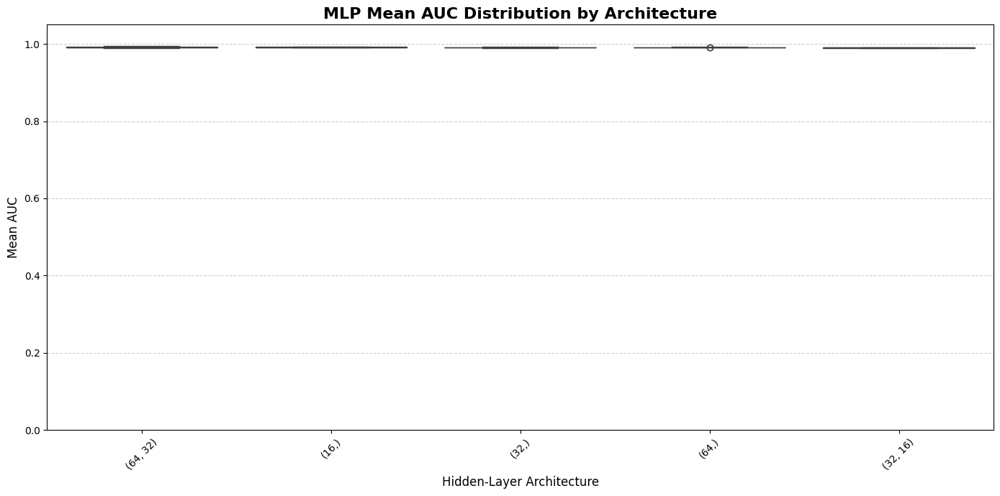

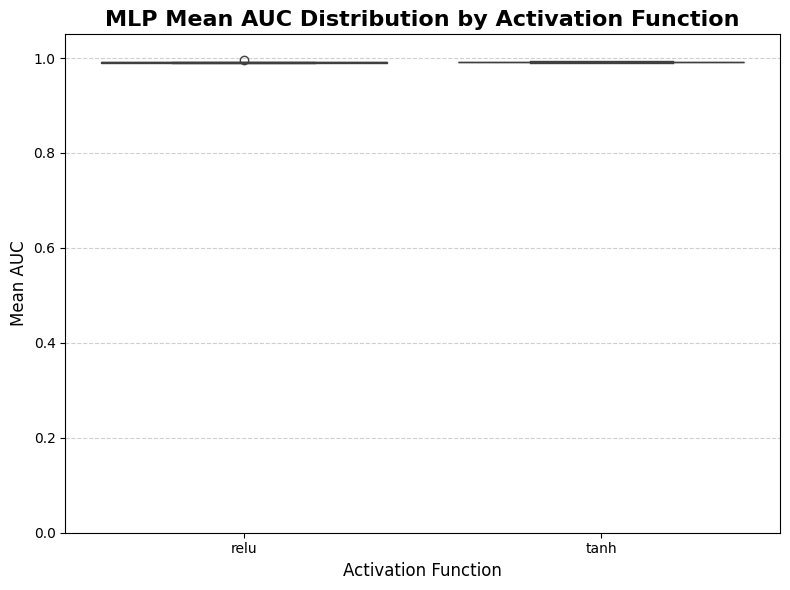

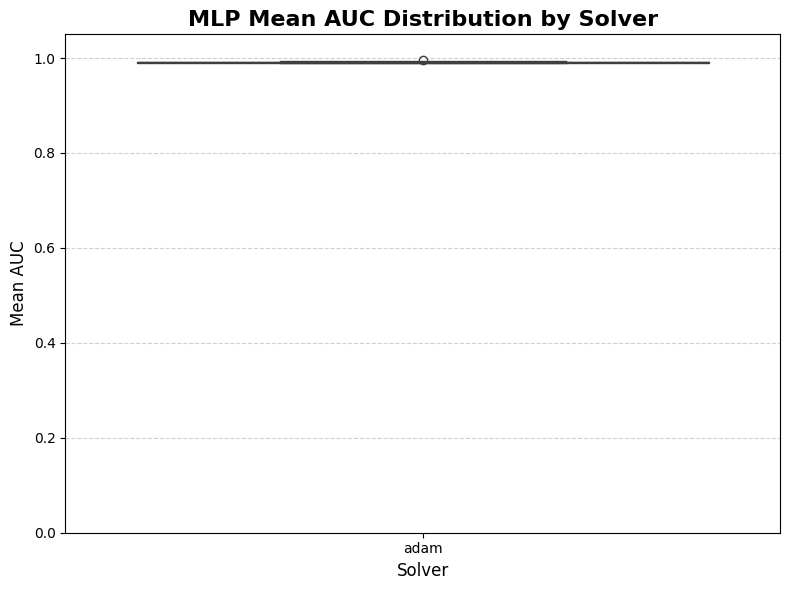

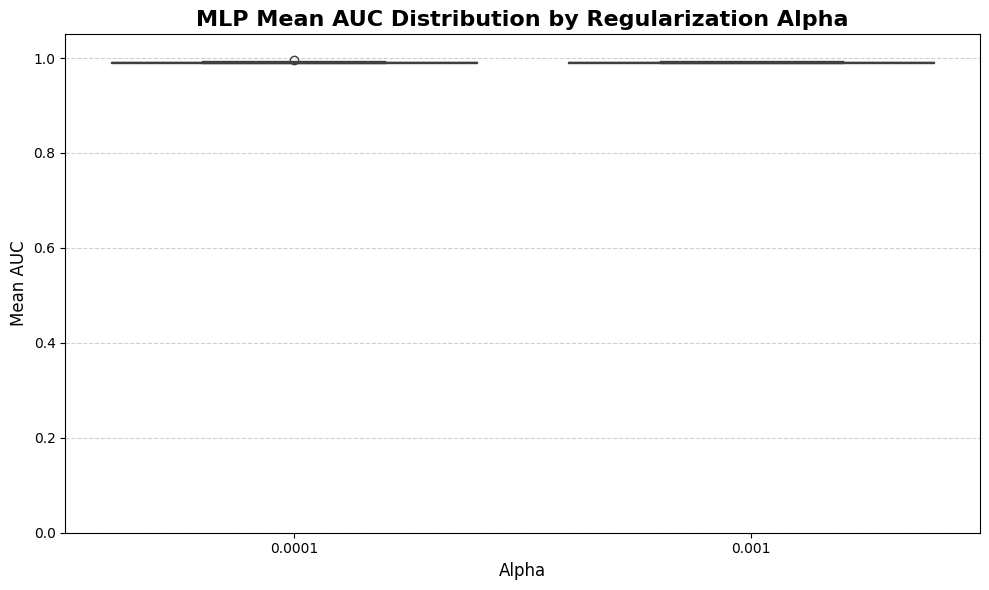

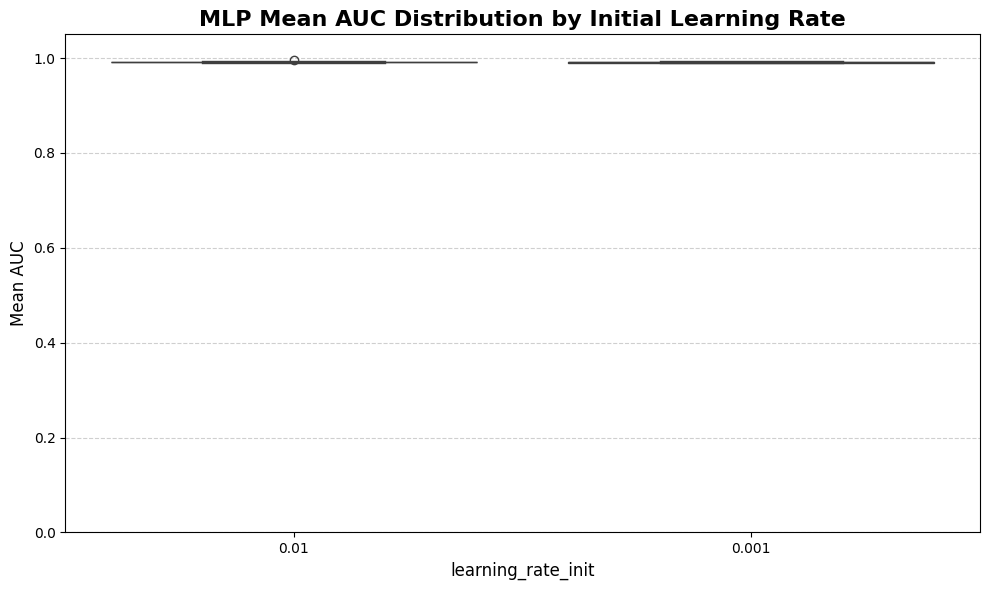

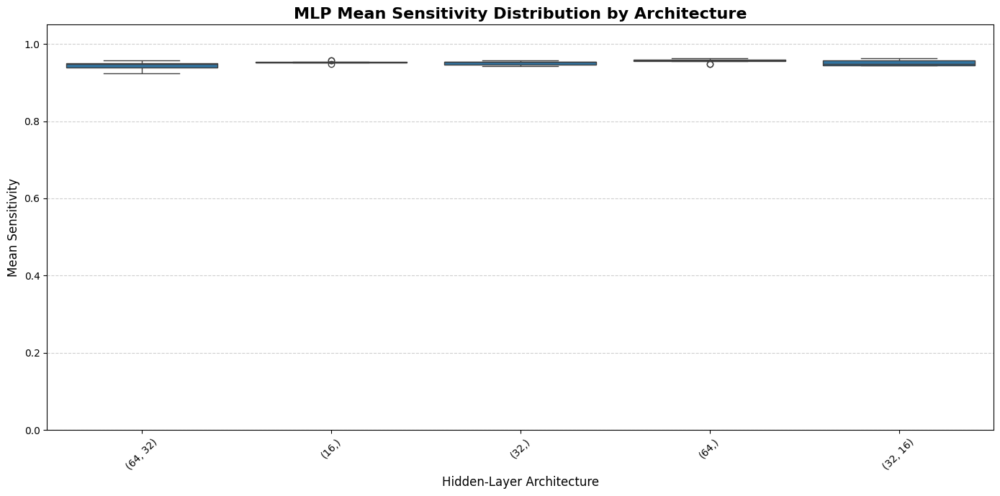

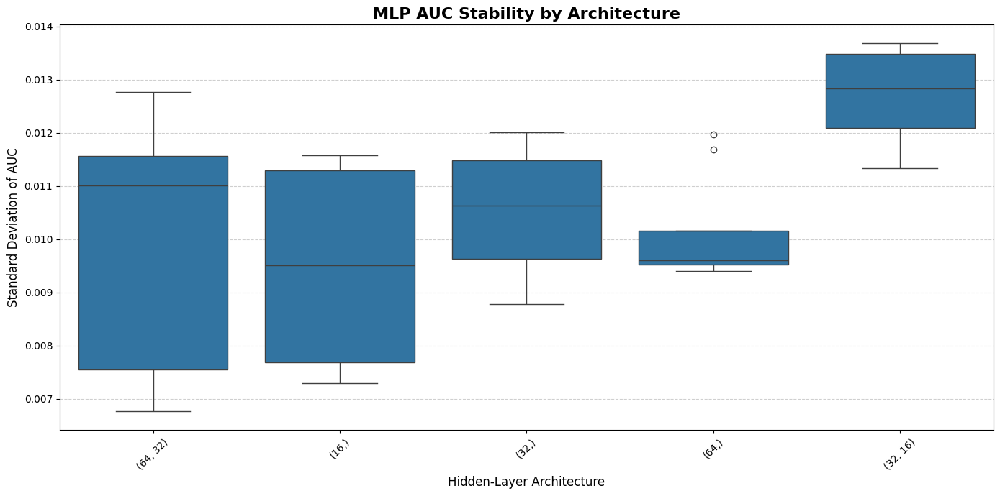

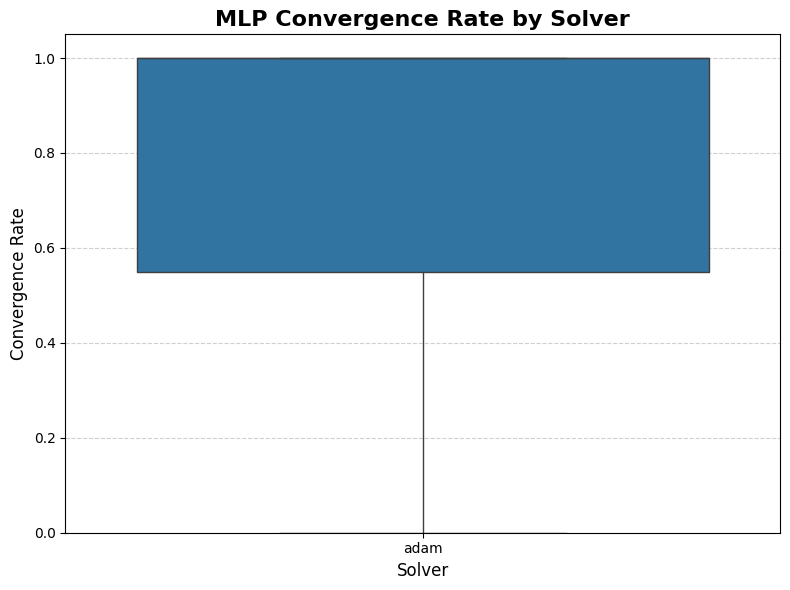

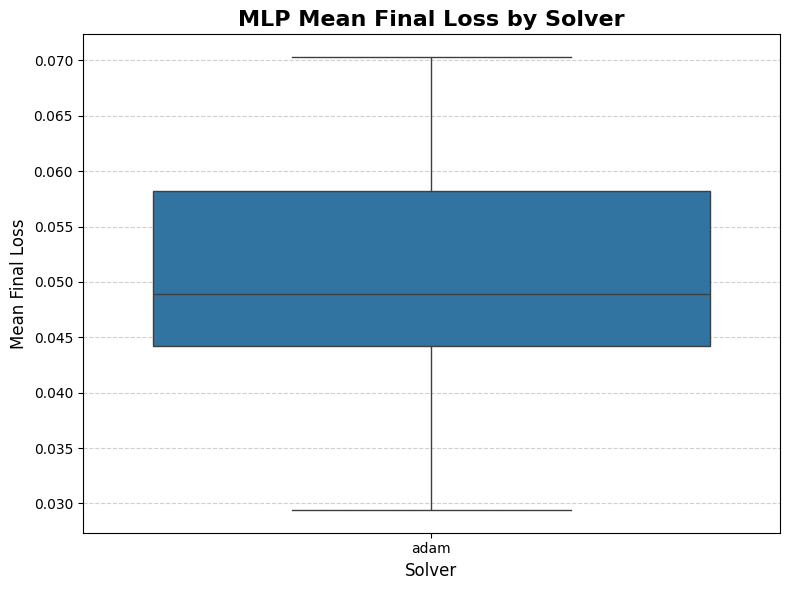

MLP architecture comparison:


,architecture_label,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Mean_Accuracy_Average,Mean_Accuracy_Max,Std_AUC_Average,Std_AUC_Min,Mean_Convergence_Rate,Mean_Final_Loss
3,"(64, 32)",0.991838,0.995122,0.943577,0.957475,0.956372,0.961888,0.968186,0.971914,0.010021,0.006764,0.975,0.045755
0,"(16,)",0.991736,0.993088,0.953419,0.957475,0.966396,0.968653,0.975421,0.977177,0.009474,0.007296,0.500,0.057243
2,"(32,)",0.991103,0.992100,0.951094,0.957586,0.963976,0.968817,0.973661,0.977177,0.010505,0.008780,0.500,0.054599
4,"(64,)",0.991472,0.992096,0.956395,0.962237,0.962725,0.966471,0.972572,0.975423,0.010115,0.009401,0.750,0.047417
1,"(32, 16)",0.990082,0.991942,0.950637,0.962348,0.958432,0.964575,0.969502,0.973669,0.012676,0.011337,0.850,0.045494



MLP solver comparison:


,solver,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min,Mean_Convergence_Rate,Mean_Final_Loss
0,adam,0.991246,0.995122,0.951024,0.962348,0.96158,0.968817,0.010558,0.006764,0.715,0.050102


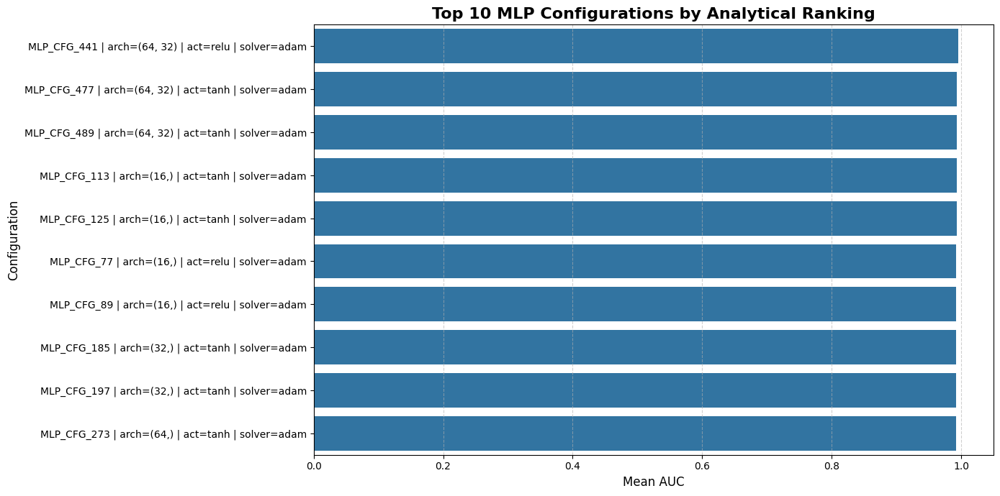


MLP hyperparameter selection plots completed successfully.


In [60]:
# ============================================================
# BOX 58 — MLP Hyperparameter Selection Plots
#
# Purpose:
#   - Visualize MLP hyperparameter search results
#   - Analyze performance trends across architecture,
#     activation, solver, alpha, and learning_rate_init
#   - Support fully evidence-based hyperparameter selection
#
# Visual Outputs:
#   1) Mean AUC by architecture
#   2) Mean AUC by activation
#   3) Mean AUC by solver
#   4) Mean AUC by alpha
#   5) Mean AUC by learning_rate_init
#   6) Mean Sensitivity by architecture
#   7) AUC stability by architecture
#   8) Top 10 configurations by analytical ranking
#
# Notes:
#   - No model training is performed in this box
#   - All plots are derived from previous MLP CV results
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "mlp_ranked_results_df",
    "mlp_cv_summary_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(mlp_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "mlp_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(mlp_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "mlp_cv_summary_results_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Prepare plotting DataFrame
# ------------------------------------------------------------
mlp_plot_df = (
    mlp_cv_summary_results_df
    .copy()
)

required_plot_columns = [
    "Config_ID",
    "hidden_layer_sizes",
    "number_of_hidden_layers",
    "total_hidden_neurons",
    "activation",
    "alpha",
    "learning_rate_init",
    "solver",
    "max_iter",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Sensitivity",
    "Mean_F1-score",
    "Mean_Accuracy",
    "Convergence_Rate",
    "Mean_final_loss"
]

missing_plot_columns = [
    col for col in required_plot_columns
    if col not in mlp_plot_df.columns
]

if len(missing_plot_columns) > 0:
    raise ValueError(
        f"Missing required plot columns: {missing_plot_columns}"
    )

# ------------------------------------------------------------
# Step 2 — Create readable labels
# ------------------------------------------------------------
mlp_plot_df["architecture_label"] = (
    mlp_plot_df["hidden_layer_sizes"].astype(str)
)

mlp_plot_df["alpha_label"] = (
    mlp_plot_df["alpha"].astype(str)
)

mlp_plot_df["learning_rate_label"] = (
    mlp_plot_df["learning_rate_init"].astype(str)
)

mlp_plot_df["complexity_label"] = (
    mlp_plot_df["number_of_hidden_layers"].astype(str)
    + " layer(s), "
    + mlp_plot_df["total_hidden_neurons"].astype(str)
    + " neurons"
)

# ------------------------------------------------------------
# Step 3 — Plot Mean AUC by architecture
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.boxplot(
    data=mlp_plot_df,
    x="architecture_label",
    y="Mean_AUC"
)

plt.title(
    "MLP Mean AUC Distribution by Architecture",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Hidden-Layer Architecture", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.xticks(rotation=45)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Plot Mean AUC by activation
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=mlp_plot_df,
    x="activation",
    y="Mean_AUC"
)

plt.title(
    "MLP Mean AUC Distribution by Activation Function",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Activation Function", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Plot Mean AUC by solver
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=mlp_plot_df,
    x="solver",
    y="Mean_AUC"
)

plt.title(
    "MLP Mean AUC Distribution by Solver",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Solver", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Plot Mean AUC by alpha
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=mlp_plot_df,
    x="alpha_label",
    y="Mean_AUC"
)

plt.title(
    "MLP Mean AUC Distribution by Regularization Alpha",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Alpha", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Plot Mean AUC by learning_rate_init
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=mlp_plot_df,
    x="learning_rate_label",
    y="Mean_AUC"
)

plt.title(
    "MLP Mean AUC Distribution by Initial Learning Rate",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("learning_rate_init", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot Mean Sensitivity by architecture
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.boxplot(
    data=mlp_plot_df,
    x="architecture_label",
    y="Mean_Sensitivity"
)

plt.title(
    "MLP Mean Sensitivity Distribution by Architecture",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Hidden-Layer Architecture", fontsize=12)
plt.ylabel("Mean Sensitivity", fontsize=12)

plt.ylim(0, 1.05)

plt.xticks(rotation=45)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot AUC stability by architecture
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.boxplot(
    data=mlp_plot_df,
    x="architecture_label",
    y="Std_AUC"
)

plt.title(
    "MLP AUC Stability by Architecture",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Hidden-Layer Architecture", fontsize=12)
plt.ylabel("Standard Deviation of AUC", fontsize=12)

plt.xticks(rotation=45)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot convergence rate by solver
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=mlp_plot_df,
    x="solver",
    y="Convergence_Rate"
)

plt.title(
    "MLP Convergence Rate by Solver",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Solver", fontsize=12)
plt.ylabel("Convergence Rate", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot final loss by solver
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=mlp_plot_df,
    x="solver",
    y="Mean_final_loss"
)

plt.title(
    "MLP Mean Final Loss by Solver",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Solver", fontsize=12)
plt.ylabel("Mean Final Loss", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Create architecture-level comparison table
# ------------------------------------------------------------
mlp_architecture_comparison_df = (
    mlp_plot_df
    .groupby("architecture_label")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Mean_Accuracy_Average=("Mean_Accuracy", "mean"),
        Mean_Accuracy_Max=("Mean_Accuracy", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Convergence_Rate=("Convergence_Rate", "mean"),
        Mean_Final_Loss=("Mean_final_loss", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 13 — Create solver-level comparison table
# ------------------------------------------------------------
mlp_solver_comparison_df = (
    mlp_plot_df
    .groupby("solver")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Convergence_Rate=("Convergence_Rate", "mean"),
        Mean_Final_Loss=("Mean_final_loss", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Mean_Convergence_Rate"
        ],
        ascending=[
            False,
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 14 — Display analytical comparison tables
# ------------------------------------------------------------
print("MLP architecture comparison:")

display(
    mlp_architecture_comparison_df.round(6)
)

print("\nMLP solver comparison:")

display(
    mlp_solver_comparison_df.round(6)
)

# ------------------------------------------------------------
# Step 15 — Create top configuration labels
# ------------------------------------------------------------
top_mlp_plot_df = (
    mlp_ranked_results_df
    .head(10)
    .copy()
)

top_mlp_plot_df["Config_Label"] = (
    top_mlp_plot_df["Config_ID"].astype(str)
    + " | arch="
    + top_mlp_plot_df["hidden_layer_sizes"].astype(str)
    + " | act="
    + top_mlp_plot_df["activation"].astype(str)
    + " | solver="
    + top_mlp_plot_df["solver"].astype(str)
)

# ------------------------------------------------------------
# Step 16 — Plot Top 10 configurations by Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_mlp_plot_df,
    x="Mean_AUC",
    y="Config_Label"
)

plt.title(
    "Top 10 MLP Configurations by Analytical Ranking",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean AUC", fontsize=12)
plt.ylabel("Configuration", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

print(
    "\nMLP hyperparameter selection "
    "plots completed successfully."
)

MLP stability and convergence analysis is ready.

Top reliable configurations:


,Config_ID,hidden_layer_sizes,activation,solver,alpha,learning_rate_init,max_iter,Mean_AUC,Std_AUC,Mean_Accuracy,...,Convergence_Rate,total_hidden_neurons,number_of_hidden_layers,AUC_Score,Sensitivity_Score,F1_Score_Normalized,AUC_Stability_Score,Convergence_Score,Loss_Score,Reliability_Score
0,MLP_CFG_441,"(64, 32)",relu,adam,0.0001,0.010,500,0.995122,0.006764,0.957879,...,1.0,96,2,1.000000,0.752212,0.000000,1.000000,1.0,0.694691,0.735177
1,MLP_CFG_113,"(16,)",tanh,adam,0.0001,0.001,500,0.993088,0.007296,0.977177,...,0.0,16,1,0.681117,0.746313,0.993373,0.923099,0.0,0.080406,0.694758
2,MLP_CFG_125,"(16,)",tanh,adam,0.0010,0.001,500,0.993088,0.007296,0.977177,...,0.0,16,1,0.681117,0.746313,0.993373,0.923099,0.0,0.072960,0.694385
3,MLP_CFG_273,"(64,)",tanh,adam,0.0010,0.010,500,0.992096,0.009569,0.970160,...,1.0,64,1,0.525669,0.870206,0.634729,0.594825,1.0,0.488792,0.672351
4,MLP_CFG_261,"(64,)",tanh,adam,0.0001,0.010,500,0.991899,0.009544,0.970160,...,1.0,64,1,0.494866,0.870206,0.634729,0.598390,1.0,0.510914,0.664751
5,MLP_CFG_185,"(32,)",tanh,adam,0.0001,0.001,500,0.992100,0.008780,0.977177,...,0.0,32,1,0.526362,0.873156,1.000000,0.708749,0.0,0.313819,0.654543
6,MLP_CFG_197,"(32,)",tanh,adam,0.0010,0.001,500,0.992100,0.008780,0.977177,...,0.0,32,1,0.526362,0.873156,1.000000,0.708749,0.0,0.304112,0.654058
7,MLP_CFG_77,"(16,)",relu,adam,0.0001,0.001,500,0.992431,0.007816,0.977177,...,0.0,16,1,0.578244,0.746313,0.993373,0.848050,0.0,0.000000,0.648618
8,MLP_CFG_221,"(64,)",relu,adam,0.0001,0.001,500,0.991638,0.009645,0.975423,...,0.4,64,1,0.453846,0.873156,0.904968,0.583854,0.4,0.483131,0.643513
9,MLP_CFG_233,"(64,)",relu,adam,0.0010,0.001,500,0.991638,0.009645,0.975423,...,0.4,64,1,0.453846,0.873156,0.904968,0.583854,0.4,0.471583,0.642936



Convergence summary by solver:


,solver,Mean_n_iter,Max_n_iter,Mean_final_loss,Convergence_Rate,Mean_AUC,Mean_Sensitivity,Mean_F1_score
0,adam,273.74,500,0.050102,0.715,0.991246,0.951024,0.96158



Convergence summary by architecture:


,hidden_layer_sizes,Mean_n_iter,Mean_final_loss,Convergence_Rate,Mean_AUC,Std_AUC,Mean_Sensitivity,Mean_F1_score
3,"(64, 32)",176.950,0.045755,0.975,0.991838,0.009485,0.943577,0.956372
0,"(16,)",339.875,0.057243,0.500,0.991736,0.008814,0.953419,0.966396
4,"(64,)",297.500,0.047417,0.750,0.991472,0.009225,0.956395,0.962725
2,"(32,)",322.475,0.054599,0.500,0.991103,0.009613,0.951094,0.963976
1,"(32, 16)",231.900,0.045494,0.850,0.990082,0.011555,0.950637,0.958432


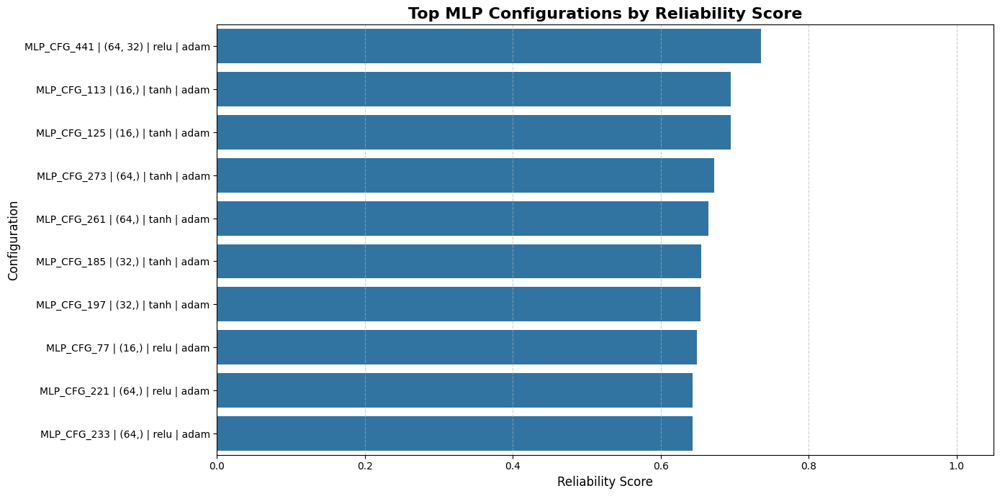

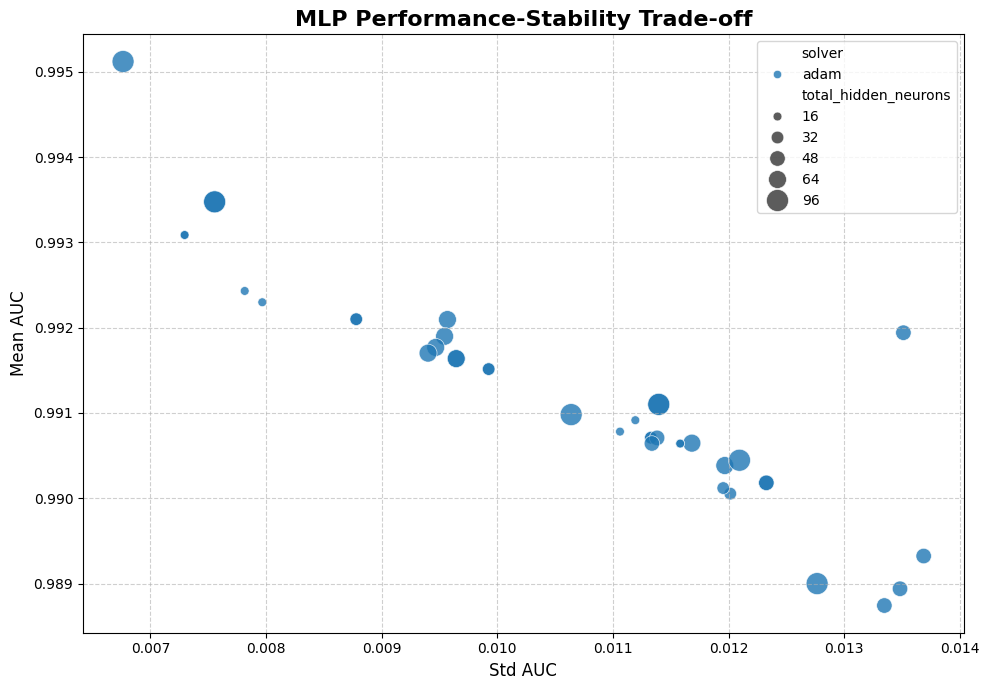

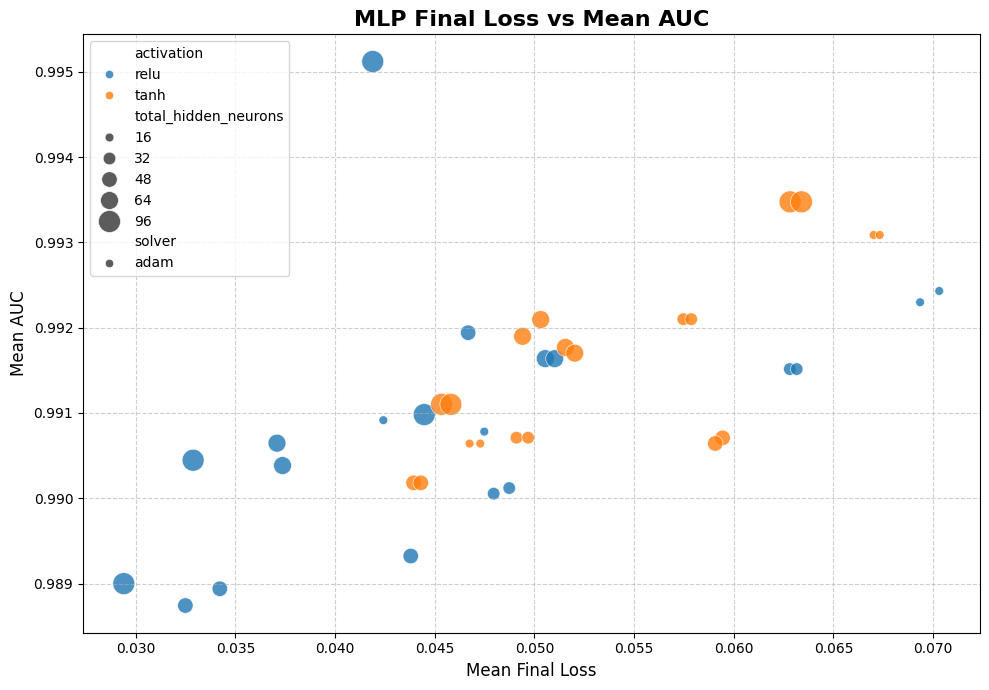

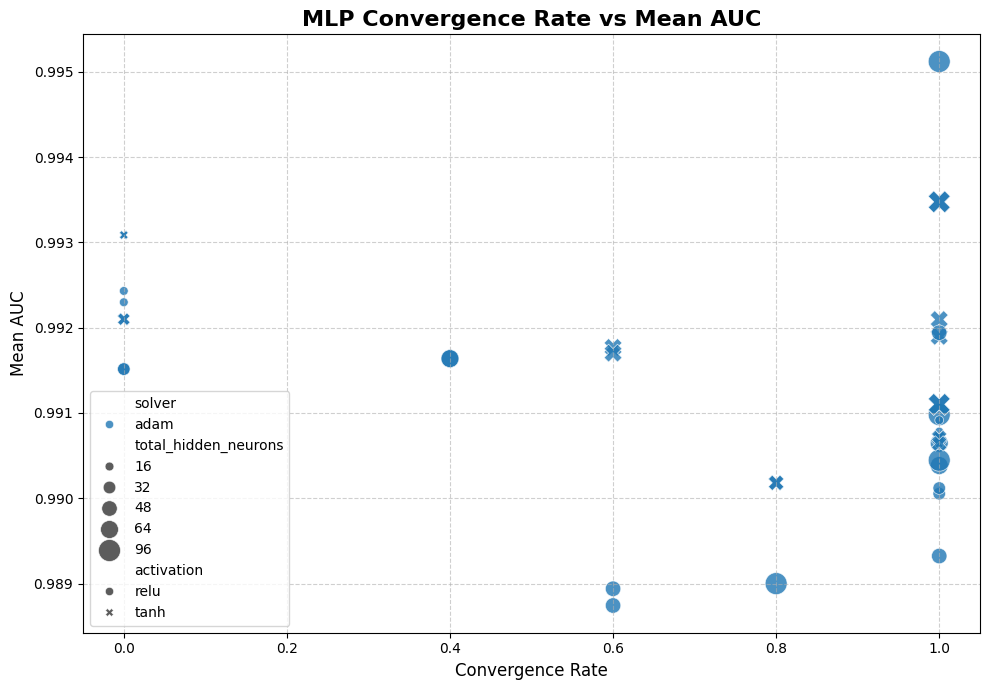


MLP stability and convergence analysis completed successfully.


In [61]:
# ============================================================
# BOX 59 — MLP Stability and Convergence Analysis
#
# Purpose:
#   - Analyze MLP stability across folds
#   - Analyze convergence behavior across configurations
#   - Compare performance stability with convergence quality
#   - Identify reliable configurations before final selection
#
# Analytical Dimensions:
#   1) AUC stability
#   2) Accuracy stability
#   3) F1-score stability
#   4) Convergence rate
#   5) Final loss
#   6) Number of iterations
#
# Notes:
#   - No model training is performed in this box
#   - All results are derived from previous MLP CV outputs
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "mlp_ranked_results_df",
    "mlp_cv_fold_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(mlp_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "mlp_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(mlp_cv_fold_results_df, pd.DataFrame):
    raise TypeError(
        "mlp_cv_fold_results_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Build reliability analysis table
# ------------------------------------------------------------
mlp_reliability_analysis_df = (
    mlp_ranked_results_df[
        [
            "Config_ID",
            "hidden_layer_sizes",
            "activation",
            "solver",
            "alpha",
            "learning_rate_init",
            "max_iter",
            "Mean_AUC",
            "Std_AUC",
            "Mean_Accuracy",
            "Std_Accuracy",
            "Mean_F1-score",
            "Std_F1-score",
            "Mean_Sensitivity",
            "Mean_final_loss",
            "Mean_n_iter",
            "Convergence_Rate",
            "total_hidden_neurons",
            "number_of_hidden_layers"
        ]
    ]
    .copy()
)

# ------------------------------------------------------------
# Step 2 — Create normalized reliability score
# ------------------------------------------------------------
def min_max_normalize(series):
    """
    Apply min-max normalization.
    If all values are equal, return ones.
    """

    min_value = series.min()
    max_value = series.max()

    if max_value == min_value:
        return pd.Series(
            np.ones(len(series)),
            index=series.index
        )

    return (
        (series - min_value)
        / (max_value - min_value)
    )

mlp_reliability_analysis_df["AUC_Score"] = (
    min_max_normalize(
        mlp_reliability_analysis_df["Mean_AUC"]
    )
)

mlp_reliability_analysis_df["Sensitivity_Score"] = (
    min_max_normalize(
        mlp_reliability_analysis_df["Mean_Sensitivity"]
    )
)

mlp_reliability_analysis_df["F1_Score_Normalized"] = (
    min_max_normalize(
        mlp_reliability_analysis_df["Mean_F1-score"]
    )
)

mlp_reliability_analysis_df["AUC_Stability_Score"] = (
    1
    - min_max_normalize(
        mlp_reliability_analysis_df["Std_AUC"]
    )
)

mlp_reliability_analysis_df["Convergence_Score"] = (
    mlp_reliability_analysis_df["Convergence_Rate"]
)

mlp_reliability_analysis_df["Loss_Score"] = (
    1
    - min_max_normalize(
        mlp_reliability_analysis_df["Mean_final_loss"]
    )
)

# ------------------------------------------------------------
# Step 3 — Compute overall reliability score
# ------------------------------------------------------------
mlp_reliability_analysis_df["Reliability_Score"] = (
    0.30 * mlp_reliability_analysis_df["AUC_Score"]
    + 0.20 * mlp_reliability_analysis_df["Sensitivity_Score"]
    + 0.20 * mlp_reliability_analysis_df["F1_Score_Normalized"]
    + 0.15 * mlp_reliability_analysis_df["AUC_Stability_Score"]
    + 0.10 * mlp_reliability_analysis_df["Convergence_Score"]
    + 0.05 * mlp_reliability_analysis_df["Loss_Score"]
)

mlp_reliability_analysis_df = (
    mlp_reliability_analysis_df
    .sort_values(
        by=[
            "Reliability_Score",
            "Mean_AUC",
            "Std_AUC"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 4 — Create convergence summary by solver
# ------------------------------------------------------------
mlp_convergence_summary_df = (
    mlp_cv_fold_results_df
    .groupby("solver")
    .agg(
        Mean_n_iter=("n_iter", "mean"),
        Max_n_iter=("n_iter", "max"),
        Mean_final_loss=("final_loss", "mean"),
        Convergence_Rate=("converged", "mean"),
        Mean_AUC=("AUC", "mean"),
        Mean_Sensitivity=("Sensitivity", "mean"),
        Mean_F1_score=("F1-score", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC",
            "Convergence_Rate"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 5 — Create convergence summary by architecture
# ------------------------------------------------------------
mlp_architecture_convergence_summary_df = (
    mlp_cv_fold_results_df
    .groupby("hidden_layer_sizes")
    .agg(
        Mean_n_iter=("n_iter", "mean"),
        Mean_final_loss=("final_loss", "mean"),
        Convergence_Rate=("converged", "mean"),
        Mean_AUC=("AUC", "mean"),
        Std_AUC=("AUC", "std"),
        Mean_Sensitivity=("Sensitivity", "mean"),
        Mean_F1_score=("F1-score", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC",
            "Convergence_Rate",
            "Std_AUC"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 6 — Extract top reliable configurations
# ------------------------------------------------------------
mlp_stability_convergence_top_df = (
    mlp_reliability_analysis_df
    .head(10)
    .copy()
)

# ------------------------------------------------------------
# Step 7 — Display reliability analysis
# ------------------------------------------------------------
print(
    "MLP stability and convergence analysis is ready."
)

print("\nTop reliable configurations:")

display(
    mlp_stability_convergence_top_df
    .round(6)
)

print("\nConvergence summary by solver:")

display(
    mlp_convergence_summary_df.round(6)
)

print("\nConvergence summary by architecture:")

display(
    mlp_architecture_convergence_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 8 — Plot Reliability Score for top configurations
# ------------------------------------------------------------
top_reliability_plot_df = (
    mlp_stability_convergence_top_df.copy()
)

top_reliability_plot_df["Config_Label"] = (
    top_reliability_plot_df["Config_ID"].astype(str)
    + " | "
    + top_reliability_plot_df["hidden_layer_sizes"].astype(str)
    + " | "
    + top_reliability_plot_df["activation"].astype(str)
    + " | "
    + top_reliability_plot_df["solver"].astype(str)
)

plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_reliability_plot_df,
    x="Reliability_Score",
    y="Config_Label"
)

plt.title(
    "Top MLP Configurations by Reliability Score",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Reliability Score", fontsize=12)
plt.ylabel("Configuration", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot Mean AUC vs Std AUC
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=mlp_reliability_analysis_df,
    x="Std_AUC",
    y="Mean_AUC",
    hue="solver",
    size="total_hidden_neurons",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "MLP Performance-Stability Trade-off",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Std AUC", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot Final Loss vs Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=mlp_reliability_analysis_df,
    x="Mean_final_loss",
    y="Mean_AUC",
    hue="activation",
    style="solver",
    size="total_hidden_neurons",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "MLP Final Loss vs Mean AUC",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean Final Loss", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot Convergence Rate vs Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=mlp_reliability_analysis_df,
    x="Convergence_Rate",
    y="Mean_AUC",
    hue="solver",
    style="activation",
    size="total_hidden_neurons",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "MLP Convergence Rate vs Mean AUC",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Convergence Rate", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.xlim(-0.05, 1.05)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()


print(
    "\nMLP stability and convergence analysis "
    "completed successfully."
)

In [62]:
# ============================================================
# BOX 60 — Analytical Best MLP Configuration Selection
#
# Purpose:
#   - Select the best MLP configuration analytically
#   - Avoid manual hyperparameter selection
#   - Apply a fully reproducible ranking strategy
#   - Combine performance, stability, convergence, and simplicity
#
# Selection Priority:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Highest Convergence_Rate
#   6) Simpler architecture in case of ties
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "mlp_ranked_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(mlp_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "mlp_ranked_results_df must be a pandas DataFrame."
    )

if mlp_ranked_results_df.empty:
    raise ValueError(
        "mlp_ranked_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Apply final analytical ranking strategy
# ------------------------------------------------------------
mlp_final_ranking_df = (
    mlp_ranked_results_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Convergence_Rate",
            "total_hidden_neurons",
            "number_of_hidden_layers",
            "Mean_final_loss",
            "Mean_n_iter"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            False,
            True,
            True,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 2 — Select best configuration
# ------------------------------------------------------------
best_mlp_configuration = (
    mlp_final_ranking_df.iloc[0]
)

# ------------------------------------------------------------
# Step 3 — Extract selected hyperparameters
# ------------------------------------------------------------
BEST_MLP_CONFIG_ID = (
    best_mlp_configuration["Config_ID"]
)

BEST_MLP_HIDDEN_LAYER_SIZES = (
    eval(best_mlp_configuration["hidden_layer_sizes"])
    if isinstance(best_mlp_configuration["hidden_layer_sizes"], str)
    else best_mlp_configuration["hidden_layer_sizes"]
)

BEST_MLP_ACTIVATION = (
    best_mlp_configuration["activation"]
)

BEST_MLP_ALPHA = float(
    best_mlp_configuration["alpha"]
)

BEST_MLP_LEARNING_RATE_INIT = float(
    best_mlp_configuration["learning_rate_init"]
)

BEST_MLP_SOLVER = (
    best_mlp_configuration["solver"]
)

BEST_MLP_MAX_ITER = int(
    best_mlp_configuration["max_iter"]
)

BEST_MLP_RANDOM_STATE = 42

BEST_MLP_TOL = 1e-4

BEST_MLP_EARLY_STOPPING = False

BEST_MLP_SHUFFLE = True

BEST_MLP_MAX_FUN = 15000

# ------------------------------------------------------------
# Step 4 — Create best-configuration report
# ------------------------------------------------------------
best_mlp_configuration_report = {

    "Config_ID":
        BEST_MLP_CONFIG_ID,

    "hidden_layer_sizes":
        str(BEST_MLP_HIDDEN_LAYER_SIZES),

    "activation":
        BEST_MLP_ACTIVATION,

    "alpha":
        BEST_MLP_ALPHA,

    "learning_rate_init":
        BEST_MLP_LEARNING_RATE_INIT,

    "solver":
        BEST_MLP_SOLVER,

    "max_iter":
        BEST_MLP_MAX_ITER,

    "total_hidden_neurons":
        best_mlp_configuration["total_hidden_neurons"],

    "number_of_hidden_layers":
        best_mlp_configuration["number_of_hidden_layers"],

    "Mean_Accuracy":
        best_mlp_configuration["Mean_Accuracy"],

    "Std_Accuracy":
        best_mlp_configuration["Std_Accuracy"],

    "Mean_Sensitivity":
        best_mlp_configuration["Mean_Sensitivity"],

    "Std_Sensitivity":
        best_mlp_configuration["Std_Sensitivity"],

    "Mean_Specificity":
        best_mlp_configuration["Mean_Specificity"],

    "Std_Specificity":
        best_mlp_configuration["Std_Specificity"],

    "Mean_F1-score":
        best_mlp_configuration["Mean_F1-score"],

    "Std_F1-score":
        best_mlp_configuration["Std_F1-score"],

    "Mean_AUC":
        best_mlp_configuration["Mean_AUC"],

    "Std_AUC":
        best_mlp_configuration["Std_AUC"],

    "Mean_n_iter":
        best_mlp_configuration["Mean_n_iter"],

    "Mean_final_loss":
        best_mlp_configuration["Mean_final_loss"],

    "Convergence_Rate":
        best_mlp_configuration["Convergence_Rate"]
}

best_mlp_configuration_df = pd.DataFrame(
    [best_mlp_configuration_report]
)

# ------------------------------------------------------------
# Step 5 — Create top-5 comparison table
# ------------------------------------------------------------
top5_mlp_configurations_df = (
    mlp_final_ranking_df
    .head(5)
    .copy()
)

top5_display_columns = [
    "Config_ID",
    "hidden_layer_sizes",
    "activation",
    "alpha",
    "learning_rate_init",
    "solver",
    "max_iter",
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Convergence_Rate"
]

top5_mlp_configurations_df = (
    top5_mlp_configurations_df[
        top5_display_columns
    ]
)

# ------------------------------------------------------------
# Step 6 — Create rounded display tables
# ------------------------------------------------------------
best_mlp_configuration_display_df = (
    best_mlp_configuration_df.copy()
)

best_numeric_columns = [
    col for col in best_mlp_configuration_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Rate" in col
        or col in [
            "alpha",
            "learning_rate_init"
        ]
    )
]

best_mlp_configuration_display_df[
    best_numeric_columns
] = (
    best_mlp_configuration_display_df[
        best_numeric_columns
    ].round(6)
)

top5_mlp_display_df = (
    top5_mlp_configurations_df.copy()
)

top5_numeric_columns = [
    col for col in top5_mlp_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Rate" in col
        or col in [
            "alpha",
            "learning_rate_init"
        ]
    )
]

top5_mlp_display_df[
    top5_numeric_columns
] = (
    top5_mlp_display_df[
        top5_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 7 — Create analytical interpretation report
# ------------------------------------------------------------
mlp_selection_interpretation = {

    "Selected_Model":
        "MLP",

    "Selection_Method":
        "Fully Analytical Cross-Validation Ranking",

    "Primary_Criterion":
        "Highest Mean_AUC",

    "Secondary_Criterion":
        "Highest Mean_Sensitivity",

    "Tertiary_Criterion":
        "Highest Mean_F1-score",

    "Stability_Criterion":
        "Lowest Std_AUC",

    "Convergence_Criterion":
        "Highest Convergence_Rate",

    "Simplicity_Criterion":
        "Lower total hidden neurons and fewer hidden layers in case of ties"
}

mlp_selection_interpretation_df = pd.DataFrame(
    [mlp_selection_interpretation]
)

# ------------------------------------------------------------
# Step 8 — Store final metadata
# ------------------------------------------------------------
best_mlp_metadata = {

    "model_name":
        "MLP",

    "config_id":
        BEST_MLP_CONFIG_ID,

    "hidden_layer_sizes":
        BEST_MLP_HIDDEN_LAYER_SIZES,

    "activation":
        BEST_MLP_ACTIVATION,

    "alpha":
        BEST_MLP_ALPHA,

    "learning_rate_init":
        BEST_MLP_LEARNING_RATE_INIT,

    "solver":
        BEST_MLP_SOLVER,

    "max_iter":
        BEST_MLP_MAX_ITER,

    "random_state":
        BEST_MLP_RANDOM_STATE,

    "tol":
        BEST_MLP_TOL,

    "early_stopping":
        BEST_MLP_EARLY_STOPPING,

    "shuffle":
        BEST_MLP_SHUFFLE,

    "max_fun":
        BEST_MLP_MAX_FUN
}

# ------------------------------------------------------------
# Step 9 — Display analytical selection results
# ------------------------------------------------------------
print(
    "Analytical best MLP configuration selected."
)

print("\nSelection criteria:")
display(
    mlp_selection_interpretation_df
)

print("\nBest MLP configuration:")
display(
    best_mlp_configuration_display_df
)

print("\nTop 5 ranked configurations:")
display(
    top5_mlp_display_df
)

# ------------------------------------------------------------
# Step 10 — Final confirmation
# ------------------------------------------------------------
print("\nSelected hyperparameters:")
print(f"hidden_layer_sizes  : {BEST_MLP_HIDDEN_LAYER_SIZES}")
print(f"activation          : {BEST_MLP_ACTIVATION}")
print(f"alpha               : {BEST_MLP_ALPHA}")
print(f"learning_rate_init  : {BEST_MLP_LEARNING_RATE_INIT}")
print(f"solver              : {BEST_MLP_SOLVER}")
print(f"max_iter            : {BEST_MLP_MAX_ITER}")

print(
    "\nAnalytical MLP model selection "
    "completed successfully."
)

Analytical best MLP configuration selected.

Selection criteria:


,Selected_Model,Selection_Method,Primary_Criterion,Secondary_Criterion,Tertiary_Criterion,Stability_Criterion,Convergence_Criterion,Simplicity_Criterion
0,MLP,Fully Analytical Cross-Validation Ranking,Highest Mean_AUC,Highest Mean_Sensitivity,Highest Mean_F1-score,Lowest Std_AUC,Highest Convergence_Rate,Lower total hidden neurons and fewer hidden la...



Best MLP configuration:


,Config_ID,hidden_layer_sizes,activation,alpha,learning_rate_init,solver,max_iter,total_hidden_neurons,number_of_hidden_layers,Mean_Accuracy,...,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Mean_n_iter,Mean_final_loss,Convergence_Rate
0,MLP_CFG_441,"(64, 32)",relu,0.0001,0.01,adam,500,96,2,0.957879,...,0.046655,0.960915,0.033222,0.944134,0.035146,0.995122,0.006764,83.2,0.041893,1.0



Top 5 ranked configurations:


,Config_ID,hidden_layer_sizes,activation,alpha,learning_rate_init,solver,max_iter,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC,Convergence_Rate
0,MLP_CFG_441,"(64, 32)",relu,0.0001,0.010,adam,500,0.957879,0.953045,0.960915,0.944134,0.995122,0.006764,1.0
1,MLP_CFG_477,"(64, 32)",tanh,0.0001,0.010,adam,500,0.968406,0.924806,0.994444,0.955326,0.993477,0.007556,1.0
2,MLP_CFG_489,"(64, 32)",tanh,0.0010,0.010,adam,500,0.968406,0.924806,0.994444,0.955326,0.993477,0.007556,1.0
3,MLP_CFG_113,"(16,)",tanh,0.0001,0.001,adam,500,0.977177,0.952824,0.991588,0.968653,0.993088,0.007296,0.0
4,MLP_CFG_125,"(16,)",tanh,0.0010,0.001,adam,500,0.977177,0.952824,0.991588,0.968653,0.993088,0.007296,0.0



Selected hyperparameters:
hidden_layer_sizes  : (64, 32)
activation          : relu
alpha               : 0.0001
learning_rate_init  : 0.01
solver              : adam
max_iter            : 500

Analytical MLP model selection completed successfully.


In [63]:
# ============================================================
# BOX 61 — Final MLP 5-Fold Evaluation
#
# Purpose:
#   - Train and evaluate the analytically selected MLP model
#   - Perform final Stratified 5-Fold evaluation
#   - Compute fold-level classification metrics
#   - Store ROC, confusion matrix, and convergence information
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "BEST_MLP_HIDDEN_LAYER_SIZES",
    "BEST_MLP_ACTIVATION",
    "BEST_MLP_ALPHA",
    "BEST_MLP_LEARNING_RATE_INIT",
    "BEST_MLP_SOLVER",
    "BEST_MLP_MAX_ITER",
    "BEST_MLP_RANDOM_STATE",
    "BEST_MLP_TOL",
    "BEST_MLP_EARLY_STOPPING",
    "BEST_MLP_SHUFFLE",
    "BEST_MLP_MAX_FUN",
    "compute_binary_classification_metrics",
    "compute_roc_curve_data"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
final_mlp_fold_results = []

final_mlp_confusion_matrices = []

final_mlp_roc_data = []

final_mlp_trained_models = []

# ------------------------------------------------------------
# Step 2 — Run final 5-Fold evaluation
# ------------------------------------------------------------
for fold_data in cv5_scaled_folds:

    fold_number = fold_data["fold_number"]

    X_train = fold_data["X_train_scaled"]

    X_val = fold_data["X_validation_scaled"]

    y_train = fold_data["y_train"]

    y_val = fold_data["y_validation"]

    # --------------------------------------------------------
    # Step 2.1 — Initialize final MLP model
    # --------------------------------------------------------
    final_mlp_model = MLPClassifier(
        hidden_layer_sizes=BEST_MLP_HIDDEN_LAYER_SIZES,
        activation=BEST_MLP_ACTIVATION,
        solver=BEST_MLP_SOLVER,
        alpha=BEST_MLP_ALPHA,
        learning_rate_init=BEST_MLP_LEARNING_RATE_INIT,
        max_iter=BEST_MLP_MAX_ITER,
        random_state=BEST_MLP_RANDOM_STATE,
        tol=BEST_MLP_TOL,
        early_stopping=BEST_MLP_EARLY_STOPPING,
        shuffle=BEST_MLP_SHUFFLE,
        max_fun=BEST_MLP_MAX_FUN
    )

    # --------------------------------------------------------
    # Step 2.2 — Train model and track convergence warning
    # --------------------------------------------------------
    convergence_warning_detected = False

    with warnings.catch_warnings(record=True) as caught_warnings:

        warnings.simplefilter(
            "always",
            ConvergenceWarning
        )

        final_mlp_model.fit(
            X_train,
            y_train
        )

        for warning_item in caught_warnings:

            if issubclass(
                warning_item.category,
                ConvergenceWarning
            ):
                convergence_warning_detected = True

    # --------------------------------------------------------
    # Step 2.3 — Extract convergence information
    # --------------------------------------------------------
    model_n_iter = getattr(
        final_mlp_model,
        "n_iter_",
        np.nan
    )

    model_final_loss = getattr(
        final_mlp_model,
        "loss_",
        np.nan
    )

    model_converged = (
        not convergence_warning_detected
    )

    # --------------------------------------------------------
    # Step 2.4 — Generate predictions
    # --------------------------------------------------------
    y_pred = final_mlp_model.predict(
        X_val
    )

    # --------------------------------------------------------
    # Step 2.5 — Generate probability scores
    # --------------------------------------------------------
    y_score = (
        final_mlp_model
        .predict_proba(X_val)[:, 1]
    )

    # --------------------------------------------------------
    # Step 2.6 — Compute evaluation metrics
    # --------------------------------------------------------
    fold_metrics = (
        compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )
    )

    # --------------------------------------------------------
    # Step 2.7 — Compute ROC curve data
    # --------------------------------------------------------
    fold_roc_data = (
        compute_roc_curve_data(
            y_true=y_val,
            y_score=y_score
        )
    )

    # --------------------------------------------------------
    # Step 2.8 — Build confusion matrix
    # --------------------------------------------------------
    confusion_mat = confusion_matrix(
        y_val,
        y_pred
    )

    # --------------------------------------------------------
    # Step 2.9 — Store fold-level result row
    # --------------------------------------------------------
    fold_result_row = {

        "Model":
            "MLP",

        "Fold":
            fold_number,

        "hidden_layer_sizes":
            str(BEST_MLP_HIDDEN_LAYER_SIZES),

        "activation":
            BEST_MLP_ACTIVATION,

        "alpha":
            BEST_MLP_ALPHA,

        "learning_rate_init":
            BEST_MLP_LEARNING_RATE_INIT,

        "solver":
            BEST_MLP_SOLVER,

        "max_iter":
            BEST_MLP_MAX_ITER,

        "n_iter":
            model_n_iter,

        "final_loss":
            model_final_loss,

        "converged":
            model_converged,

        "Accuracy":
            fold_metrics["Accuracy"],

        "Sensitivity":
            fold_metrics["Sensitivity"],

        "Specificity":
            fold_metrics["Specificity"],

        "Precision":
            fold_metrics["Precision"],

        "F1-score":
            fold_metrics["F1-score"],

        "AUC":
            fold_metrics["AUC"],

        "TP":
            fold_metrics["TP"],

        "FP":
            fold_metrics["FP"],

        "FN":
            fold_metrics["FN"],

        "TN":
            fold_metrics["TN"]
    }

    final_mlp_fold_results.append(
        fold_result_row
    )

    final_mlp_confusion_matrices.append({

        "fold":
            fold_number,

        "matrix":
            confusion_mat
    })

    final_mlp_roc_data.append({

        "fold":
            fold_number,

        "roc_data":
            fold_roc_data
    })

    final_mlp_trained_models.append({

        "fold":
            fold_number,

        "model":
            final_mlp_model
    })

# ------------------------------------------------------------
# Step 3 — Create fold-level results DataFrame
# ------------------------------------------------------------
final_mlp_fold_results_df = pd.DataFrame(
    final_mlp_fold_results
)

# ------------------------------------------------------------
# Step 4 — Compute summary statistics
# ------------------------------------------------------------
summary_metrics = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

final_mlp_summary_rows = []

for metric_name in summary_metrics:

    metric_values = (
        final_mlp_fold_results_df[
            metric_name
        ]
    )

    summary_row = {

        "Metric":
            metric_name,

        "Mean":
            metric_values.mean(),

        "Std":
            metric_values.std(),

        "Min":
            metric_values.min(),

        "Max":
            metric_values.max()
    }

    final_mlp_summary_rows.append(
        summary_row
    )

final_mlp_summary_results_df = pd.DataFrame(
    final_mlp_summary_rows
)

# ------------------------------------------------------------
# Step 5 — Compute convergence summary
# ------------------------------------------------------------
final_mlp_convergence_summary = {

    "Mean_n_iter":
        final_mlp_fold_results_df["n_iter"].mean(),

    "Max_n_iter":
        final_mlp_fold_results_df["n_iter"].max(),

    "Mean_final_loss":
        final_mlp_fold_results_df["final_loss"].mean(),

    "Convergence_Rate":
        final_mlp_fold_results_df["converged"].mean()
}

final_mlp_convergence_summary_df = pd.DataFrame(
    [final_mlp_convergence_summary]
)

# ------------------------------------------------------------
# Step 6 — Create rounded display versions
# ------------------------------------------------------------
final_mlp_fold_display_df = (
    final_mlp_fold_results_df.copy()
)

metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC",
    "final_loss"
]

final_mlp_fold_display_df[
    metric_columns
] = (
    final_mlp_fold_display_df[
        metric_columns
    ].round(6)
)

final_mlp_summary_display_df = (
    final_mlp_summary_results_df.copy()
)

summary_numeric_columns = [
    "Mean",
    "Std",
    "Min",
    "Max"
]

final_mlp_summary_display_df[
    summary_numeric_columns
] = (
    final_mlp_summary_display_df[
        summary_numeric_columns
    ].round(6)
)

final_mlp_convergence_summary_display_df = (
    final_mlp_convergence_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 7 — Store results in global containers
# ------------------------------------------------------------
all_model_fold_results.append(
    final_mlp_fold_results_df
)

all_model_summary_results.append({

    "model":
        "MLP",

    "summary_statistics":
        final_mlp_summary_results_df,

    "convergence_summary":
        final_mlp_convergence_summary_df
})

all_model_confusion_matrices.append({

    "model":
        "MLP",

    "matrices":
        final_mlp_confusion_matrices
})

all_model_roc_data.append({

    "model":
        "MLP",

    "roc_data":
        final_mlp_roc_data
})

# ------------------------------------------------------------
# Step 8 — Display fold-level results
# ------------------------------------------------------------
print(
    "Final MLP fold-by-fold evaluation completed."
)

print("\nFold-level results:")

display(
    final_mlp_fold_display_df
)

# ------------------------------------------------------------
# Step 9 — Display summary statistics
# ------------------------------------------------------------
print("\nFinal MLP summary statistics:")

display(
    final_mlp_summary_display_df
)

print("\nFinal MLP convergence summary:")

display(
    final_mlp_convergence_summary_display_df
)

# ------------------------------------------------------------
# Step 10 — Display selected configuration
# ------------------------------------------------------------
print("\nSelected configuration:")

print(f"hidden_layer_sizes = {BEST_MLP_HIDDEN_LAYER_SIZES}")
print(f"activation         = {BEST_MLP_ACTIVATION}")
print(f"alpha              = {BEST_MLP_ALPHA}")
print(f"learning_rate_init = {BEST_MLP_LEARNING_RATE_INIT}")
print(f"solver             = {BEST_MLP_SOLVER}")
print(f"max_iter           = {BEST_MLP_MAX_ITER}")

print(
    "\nFinal MLP evaluation "
    "completed successfully."
)

Final MLP fold-by-fold evaluation completed.

Fold-level results:


,Model,Fold,hidden_layer_sizes,activation,alpha,learning_rate_init,solver,max_iter,n_iter,final_loss,...,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,MLP,1,"(64, 32)",relu,0.0001,0.01,adam,500,108,0.034156,...,0.956140,0.976744,0.943662,0.913043,0.943820,0.998362,42,4,1,67
1,MLP,2,"(64, 32)",relu,0.0001,0.01,adam,500,115,0.024106,...,0.947368,0.883721,0.985915,0.974359,0.926829,0.993122,38,1,5,70
2,MLP,3,"(64, 32)",relu,0.0001,0.01,adam,500,60,0.038574,...,0.921053,0.928571,0.916667,0.866667,0.896552,0.984127,39,6,3,66
3,MLP,4,"(64, 32)",relu,0.0001,0.01,adam,500,68,0.046042,...,0.973684,1.000000,0.958333,0.933333,0.965517,1.000000,42,3,0,69
4,MLP,5,"(64, 32)",relu,0.0001,0.01,adam,500,65,0.066589,...,0.991150,0.976190,1.000000,1.000000,0.987952,1.000000,41,0,1,71



Final MLP summary statistics:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.957879,0.026582,0.921053,0.991150
1,Sensitivity,0.953045,0.046655,0.883721,1.000000
2,Specificity,0.960915,0.033222,0.916667,1.000000
3,Precision,0.937480,0.052196,0.866667,1.000000
4,F1-score,0.944134,0.035146,0.896552,0.987952
5,AUC,0.995122,0.006764,0.984127,1.000000



Final MLP convergence summary:


,Mean_n_iter,Max_n_iter,Mean_final_loss,Convergence_Rate
0,83.2,115,0.041893,1.0



Selected configuration:
hidden_layer_sizes = (64, 32)
activation         = relu
alpha              = 0.0001
learning_rate_init = 0.01
solver             = adam
max_iter           = 500

Final MLP evaluation completed successfully.


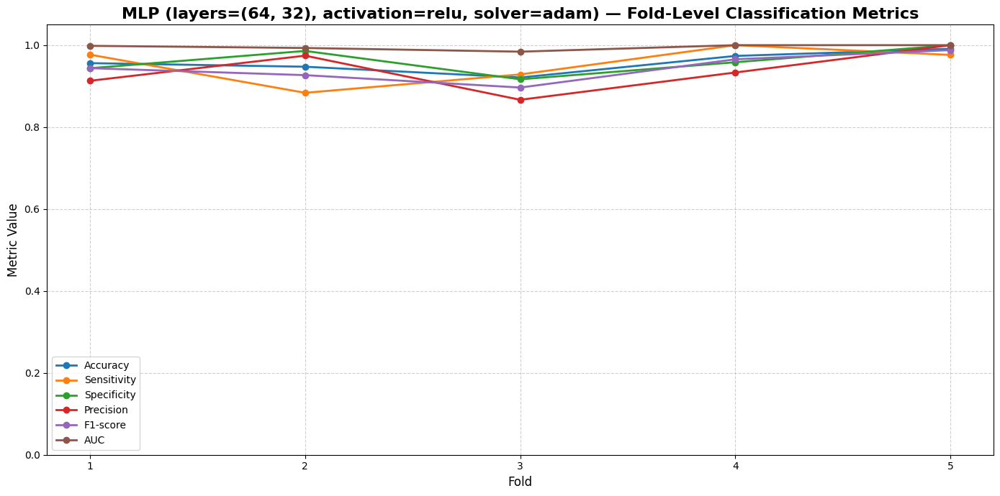

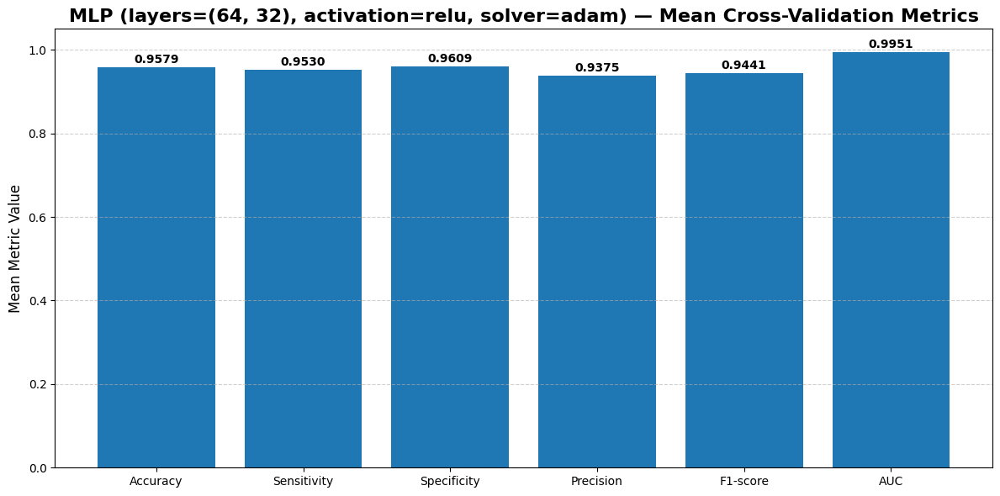

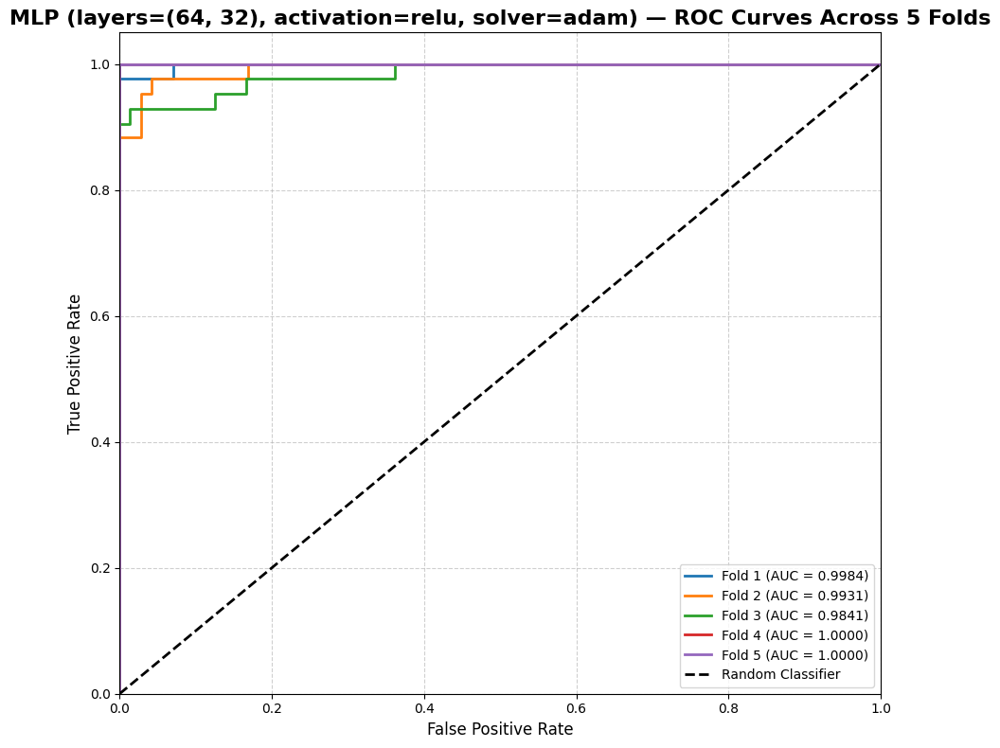

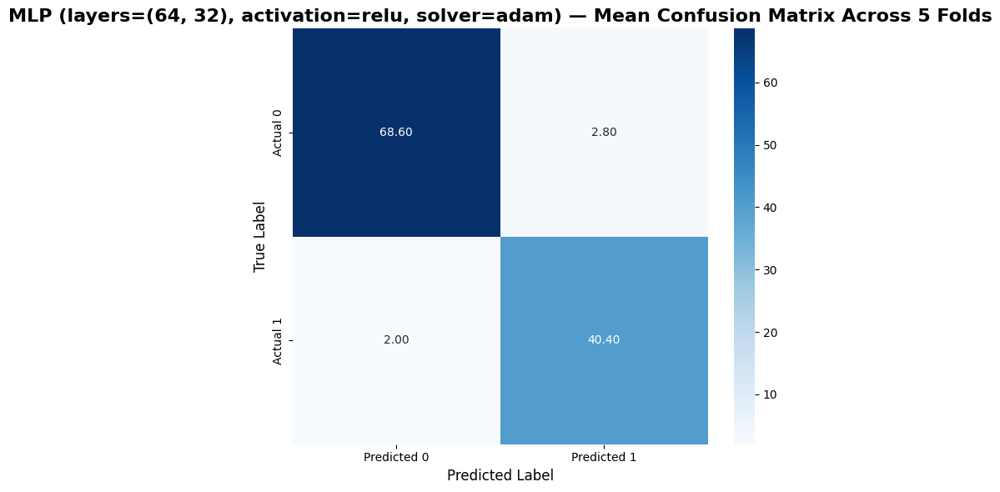

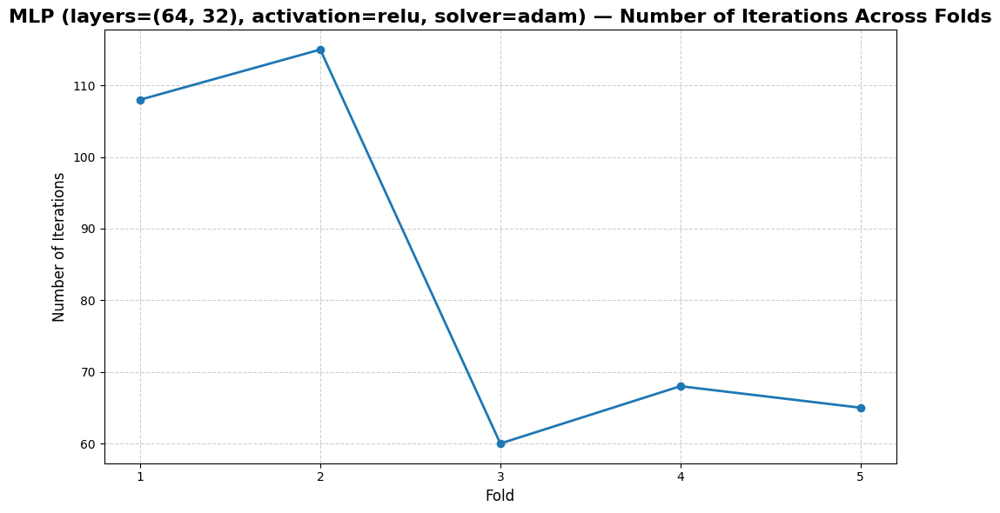

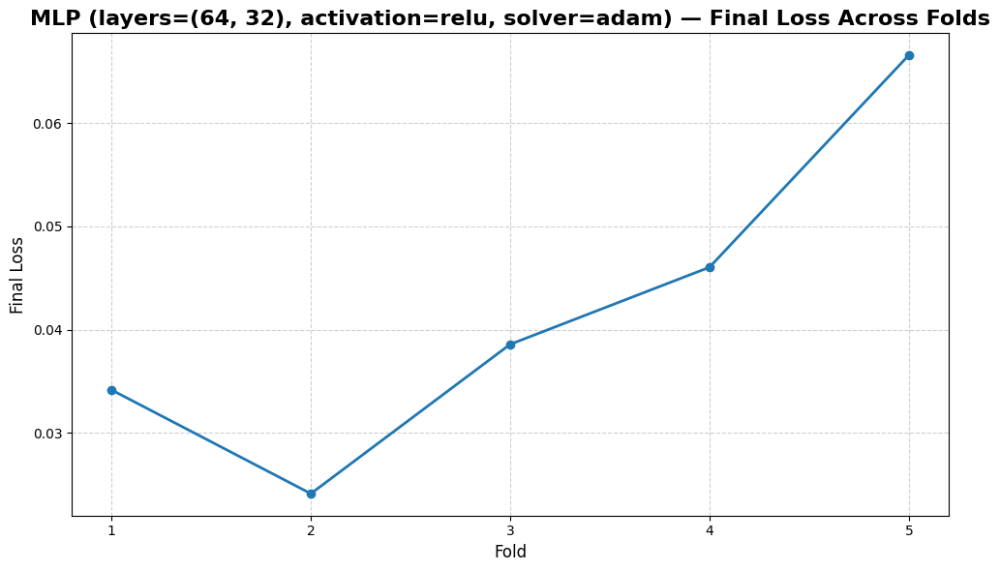

Final MLP visual evaluation report is ready.

Selected MLP configuration:
hidden_layer_sizes : (64, 32)
activation         : relu
alpha              : 0.0001
learning_rate_init : 0.01
solver             : adam
max_iter           : 500

Fold-level results:


,Model,Fold,hidden_layer_sizes,activation,alpha,learning_rate_init,solver,max_iter,n_iter,final_loss,...,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,MLP,1,"(64, 32)",relu,0.0001,0.01,adam,500,108,0.034156,...,0.956140,0.976744,0.943662,0.913043,0.943820,0.998362,42,4,1,67
1,MLP,2,"(64, 32)",relu,0.0001,0.01,adam,500,115,0.024106,...,0.947368,0.883721,0.985915,0.974359,0.926829,0.993122,38,1,5,70
2,MLP,3,"(64, 32)",relu,0.0001,0.01,adam,500,60,0.038574,...,0.921053,0.928571,0.916667,0.866667,0.896552,0.984127,39,6,3,66
3,MLP,4,"(64, 32)",relu,0.0001,0.01,adam,500,68,0.046042,...,0.973684,1.000000,0.958333,0.933333,0.965517,1.000000,42,3,0,69
4,MLP,5,"(64, 32)",relu,0.0001,0.01,adam,500,65,0.066589,...,0.991150,0.976190,1.000000,1.000000,0.987952,1.000000,41,0,1,71



Compact metric summary:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.957879,0.026582,0.921053,0.991150
1,Sensitivity,0.953045,0.046655,0.883721,1.000000
2,Specificity,0.960915,0.033222,0.916667,1.000000
3,Precision,0.937480,0.052196,0.866667,1.000000
4,F1-score,0.944134,0.035146,0.896552,0.987952
5,AUC,0.995122,0.006764,0.984127,1.000000



Convergence summary:


,Mean_n_iter,Max_n_iter,Mean_final_loss,Convergence_Rate
0,83.2,115,0.041893,1.0



Final MLP visual reporting completed successfully.


In [64]:
# ============================================================
# BOX 62 — Final MLP Visual Evaluation Report
#
# Purpose:
#   - Create final visual and tabular reports for the
#     analytically selected MLP model
#   - Visualize fold-level classification metrics
#   - Plot ROC curves across all folds
#   - Plot mean confusion matrix
#   - Report convergence behavior
#
# Visual Outputs:
#   1) Fold-level metric comparison
#   2) Mean metric summary
#   3) ROC curves for all folds
#   4) Mean confusion matrix heatmap
#   5) Convergence summary plots
#   6) Compact metric summary table
#
# Notes:
#   - This box does not retrain the model
#   - All results are derived from BOX 61
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_mlp_fold_results_df",
    "final_mlp_summary_results_df",
    "final_mlp_confusion_matrices",
    "final_mlp_roc_data",
    "final_mlp_convergence_summary_df",
    "BEST_MLP_HIDDEN_LAYER_SIZES",
    "BEST_MLP_ACTIVATION",
    "BEST_MLP_ALPHA",
    "BEST_MLP_LEARNING_RATE_INIT",
    "BEST_MLP_SOLVER",
    "BEST_MLP_MAX_ITER"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(final_mlp_fold_results_df, pd.DataFrame):
    raise TypeError(
        "final_mlp_fold_results_df must be a pandas DataFrame."
    )

if len(final_mlp_confusion_matrices) == 0:
    raise ValueError(
        "final_mlp_confusion_matrices is empty."
    )

if len(final_mlp_roc_data) == 0:
    raise ValueError(
        "final_mlp_roc_data is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define plotting metrics
# ------------------------------------------------------------
plot_metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 2 — Validate required metric columns
# ------------------------------------------------------------
missing_metric_columns = [
    col for col in plot_metric_columns
    if col not in final_mlp_fold_results_df.columns
]

if len(missing_metric_columns) > 0:
    raise ValueError(
        f"Missing metric columns: {missing_metric_columns}"
    )

# ------------------------------------------------------------
# Step 3 — Build readable model label
# ------------------------------------------------------------
final_mlp_label = (
    f"MLP "
    f"(layers={BEST_MLP_HIDDEN_LAYER_SIZES}, "
    f"activation={BEST_MLP_ACTIVATION}, "
    f"solver={BEST_MLP_SOLVER})"
)

# ------------------------------------------------------------
# Step 4 — Fold-level metric comparison plot
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in plot_metric_columns:

    plt.plot(
        final_mlp_fold_results_df["Fold"],
        final_mlp_fold_results_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    f"{final_mlp_label} — Fold-Level Classification Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

plt.xticks(final_mlp_fold_results_df["Fold"])
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Mean metric bar plot
# ------------------------------------------------------------
mean_metric_values = [
    final_mlp_fold_results_df[col].mean()
    for col in plot_metric_columns
]

plt.figure(figsize=(12, 6))

bars = plt.bar(
    plot_metric_columns,
    mean_metric_values
)

plt.title(
    f"{final_mlp_label} — Mean Cross-Validation Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("Mean Metric Value", fontsize=12)
plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

for bar, value in zip(bars, mean_metric_values):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.01,
        f"{value:.4f}",
        ha="center",
        fontsize=10,
        fontweight="bold"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — ROC curves across all folds
# ------------------------------------------------------------
plt.figure(figsize=(9, 8))

for fold_roc_item in final_mlp_roc_data:

    fold_number = fold_roc_item["fold"]

    roc_data = fold_roc_item["roc_data"]

    plt.plot(
        roc_data["fpr"],
        roc_data["tpr"],
        linewidth=2,
        label=f"Fold {fold_number} (AUC = {roc_data['auc']:.4f})"
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    color="black",
    label="Random Classifier"
)

plt.title(
    f"{final_mlp_label} — ROC Curves Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)

plt.xlim(0, 1)
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Compute mean confusion matrix
# ------------------------------------------------------------
final_mlp_confusion_matrix_stack = np.array([
    item["matrix"]
    for item in final_mlp_confusion_matrices
])

final_mlp_mean_confusion_matrix = (
    final_mlp_confusion_matrix_stack.mean(axis=0)
)

# ------------------------------------------------------------
# Step 8 — Plot mean confusion matrix heatmap
# ------------------------------------------------------------
plt.figure(figsize=(7, 6))

sns.heatmap(
    final_mlp_mean_confusion_matrix,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=True,
    xticklabels=[
        "Predicted 0",
        "Predicted 1"
    ],
    yticklabels=[
        "Actual 0",
        "Actual 1"
    ]
)

plt.title(
    f"{final_mlp_label} — Mean Confusion Matrix Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Convergence plots
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.plot(
    final_mlp_fold_results_df["Fold"],
    final_mlp_fold_results_df["n_iter"],
    marker="o",
    linewidth=2
)

plt.title(
    f"{final_mlp_label} — Number of Iterations Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Number of Iterations", fontsize=12)

plt.xticks(final_mlp_fold_results_df["Fold"])

plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))

plt.plot(
    final_mlp_fold_results_df["Fold"],
    final_mlp_fold_results_df["final_loss"],
    marker="o",
    linewidth=2
)

plt.title(
    f"{final_mlp_label} — Final Loss Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Final Loss", fontsize=12)

plt.xticks(final_mlp_fold_results_df["Fold"])

plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Create compact metric summary table
# ------------------------------------------------------------
final_mlp_visual_summary_df = pd.DataFrame({

    "Metric":
        plot_metric_columns,

    "Mean":
        [
            final_mlp_fold_results_df[col].mean()
            for col in plot_metric_columns
        ],

    "Std":
        [
            final_mlp_fold_results_df[col].std()
            for col in plot_metric_columns
        ],

    "Min":
        [
            final_mlp_fold_results_df[col].min()
            for col in plot_metric_columns
        ],

    "Max":
        [
            final_mlp_fold_results_df[col].max()
            for col in plot_metric_columns
        ]
})

final_mlp_visual_summary_df = (
    final_mlp_visual_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 11 — Create fold-level display table
# ------------------------------------------------------------
final_mlp_fold_report_df = (
    final_mlp_fold_results_df.copy()
)

final_mlp_fold_report_df[
    plot_metric_columns
] = (
    final_mlp_fold_report_df[
        plot_metric_columns
    ].round(6)
)

final_mlp_fold_report_df["final_loss"] = (
    final_mlp_fold_report_df["final_loss"].round(6)
)

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN"
]

final_mlp_fold_report_df[
    count_columns
] = (
    final_mlp_fold_report_df[
        count_columns
    ].astype(int)
)

# ------------------------------------------------------------
# Step 12 — Display final tables
# ------------------------------------------------------------
print(
    "Final MLP visual evaluation report is ready."
)

print("\nSelected MLP configuration:")
print(f"hidden_layer_sizes : {BEST_MLP_HIDDEN_LAYER_SIZES}")
print(f"activation         : {BEST_MLP_ACTIVATION}")
print(f"alpha              : {BEST_MLP_ALPHA}")
print(f"learning_rate_init : {BEST_MLP_LEARNING_RATE_INIT}")
print(f"solver             : {BEST_MLP_SOLVER}")
print(f"max_iter           : {BEST_MLP_MAX_ITER}")

print("\nFold-level results:")
display(
    final_mlp_fold_report_df
)

print("\nCompact metric summary:")
display(
    final_mlp_visual_summary_df
)

print("\nConvergence summary:")
display(
    final_mlp_convergence_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 13 — Store plot references
# ------------------------------------------------------------
all_model_metric_plots.append({

    "model":
        "MLP",

    "plots":
        [
            "fold_level_metrics",
            "mean_metric_barplot",
            "roc_curves",
            "mean_confusion_matrix",
            "n_iter_across_folds",
            "final_loss_across_folds"
        ]
})


print(
    "\nFinal MLP visual reporting "
    "completed successfully."
)

In [65]:
# ============================================================
# BOX 63 — RBF Network Methodology and Search Space Definition
#
# Purpose:
#   - Define the analytical RBF Network methodology
#   - Construct the RBF hyperparameter search space
#   - Prepare candidate configurations for:
#         1) Number of RBF centers
#         2) Gamma values
#         3) Logistic Regression regularization
#         4) Class-weight strategy
#
# RBF Network Pipeline:
#   Input Features
#       ->
#   KMeans Center Extraction
#       ->
#   Gaussian RBF Transformation
#       ->
#   Logistic Regression Output Layer
#
# Analytical Goals:
#   - Fully analytical model selection
#   - No manual hyperparameter selection
#   - Fair comparison across all candidate configurations
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define analytical RBF search space
# ------------------------------------------------------------

# ------------------------------------------------------------
# Number of RBF centers
# ------------------------------------------------------------
RBF_NUMBER_OF_CENTERS = [
    5,
    10,
    15,
    20,
    25
]

# ------------------------------------------------------------
# Gaussian kernel gamma values
# ------------------------------------------------------------
RBF_GAMMA_VALUES = [
    0.01,
    0.05,
    0.10,
    0.50,
    1.00
]

# ------------------------------------------------------------
# Logistic Regression regularization strengths
# ------------------------------------------------------------
RBF_LOGISTIC_C_VALUES = [
    0.1,
    1.0,
    10.0
]

# ------------------------------------------------------------
# Logistic Regression class-weight strategies
# ------------------------------------------------------------
RBF_CLASS_WEIGHT_OPTIONS = [
    None,
    "balanced"
]

# ------------------------------------------------------------
# KMeans random state
# ------------------------------------------------------------
RBF_RANDOM_STATE = 42

# ------------------------------------------------------------
# KMeans initialization count
# ------------------------------------------------------------
RBF_N_INIT = 10

# ------------------------------------------------------------
# Maximum iterations for Logistic Regression
# ------------------------------------------------------------
RBF_LOGISTIC_MAX_ITER = 2000

# ------------------------------------------------------------
# Logistic Regression solver
# ------------------------------------------------------------
RBF_LOGISTIC_SOLVER = "lbfgs"

# ------------------------------------------------------------
# Step 2 — Build analytical configuration grid
# ------------------------------------------------------------
rbf_candidate_configurations = []

configuration_counter = 1

all_rbf_combinations = list(product(
    RBF_NUMBER_OF_CENTERS,
    RBF_GAMMA_VALUES,
    RBF_LOGISTIC_C_VALUES,
    RBF_CLASS_WEIGHT_OPTIONS
))

# ------------------------------------------------------------
# Step 3 — Create configuration dictionaries
# ------------------------------------------------------------
for (
    number_of_centers,
    gamma_value,
    logistic_c,
    class_weight_option
) in all_rbf_combinations:

    # --------------------------------------------------------
    # Create configuration ID
    # --------------------------------------------------------
    config_id = (
        f"RBF_CFG_{configuration_counter}"
    )

    # --------------------------------------------------------
    # Build configuration dictionary
    # --------------------------------------------------------
    config_dict = {

        "config_id":
            config_id,

        "number_of_centers":
            number_of_centers,

        "gamma":
            gamma_value,

        "logistic_C":
            logistic_c,

        "class_weight":
            class_weight_option,

        "random_state":
            RBF_RANDOM_STATE,

        "n_init":
            RBF_N_INIT,

        "logistic_max_iter":
            RBF_LOGISTIC_MAX_ITER,

        "logistic_solver":
            RBF_LOGISTIC_SOLVER,

        "rbf_description":
            (
                f"Centers={number_of_centers} | "
                f"Gamma={gamma_value} | "
                f"C={logistic_c} | "
                f"ClassWeight={class_weight_option}"
            )
    }

    # --------------------------------------------------------
    # Store configuration
    # --------------------------------------------------------
    rbf_candidate_configurations.append(
        config_dict
    )

    configuration_counter += 1

# ------------------------------------------------------------
# Step 4 — Convert configurations to DataFrame
# ------------------------------------------------------------
rbf_candidate_configurations_df = pd.DataFrame(
    rbf_candidate_configurations
)

# ------------------------------------------------------------
# Step 5 — Build search-space summary
# ------------------------------------------------------------
rbf_search_space_summary = {

    "Total_Configurations":
        len(rbf_candidate_configurations),

    "Number_of_Center_Options":
        len(RBF_NUMBER_OF_CENTERS),

    "Gamma_Options":
        len(RBF_GAMMA_VALUES),

    "Logistic_C_Options":
        len(RBF_LOGISTIC_C_VALUES),

    "Class_Weight_Options":
        len(RBF_CLASS_WEIGHT_OPTIONS),

    "Minimum_Centers":
        min(RBF_NUMBER_OF_CENTERS),

    "Maximum_Centers":
        max(RBF_NUMBER_OF_CENTERS),

    "Minimum_Gamma":
        min(RBF_GAMMA_VALUES),

    "Maximum_Gamma":
        max(RBF_GAMMA_VALUES)
}

rbf_search_space_summary_df = pd.DataFrame(
    [rbf_search_space_summary]
)

# ------------------------------------------------------------
# Step 6 — Display analytical search-space summary
# ------------------------------------------------------------
print(
    "RBF Network hyperparameter search space is ready."
)

print("\nCandidate number of centers:")
print(RBF_NUMBER_OF_CENTERS)

print("\nCandidate gamma values:")
print(RBF_GAMMA_VALUES)

print("\nCandidate Logistic Regression C values:")
print(RBF_LOGISTIC_C_VALUES)

print("\nClass-weight strategies:")
print(RBF_CLASS_WEIGHT_OPTIONS)

print("\nSearch-space summary:")
display(
    rbf_search_space_summary_df
)

# ------------------------------------------------------------
# Step 7 — Display candidate configurations
# ------------------------------------------------------------
print("\nCandidate RBF configurations:")
display(
    rbf_candidate_configurations_df.head(20)
)

print(
    "\nRBF Network search-space definition "
    "completed successfully."
)

RBF Network hyperparameter search space is ready.

Candidate number of centers:
[5, 10, 15, 20, 25]

Candidate gamma values:
[0.01, 0.05, 0.1, 0.5, 1.0]

Candidate Logistic Regression C values:
[0.1, 1.0, 10.0]

Class-weight strategies:
[None, 'balanced']

Search-space summary:


,Total_Configurations,Number_of_Center_Options,Gamma_Options,Logistic_C_Options,Class_Weight_Options,Minimum_Centers,Maximum_Centers,Minimum_Gamma,Maximum_Gamma
0,150,5,5,3,2,5,25,0.01,1.0



Candidate RBF configurations:


,config_id,number_of_centers,gamma,logistic_C,class_weight,random_state,n_init,logistic_max_iter,logistic_solver,rbf_description
0,RBF_CFG_1,5,0.01,0.1,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=0.1 | ClassWeight=None
1,RBF_CFG_2,5,0.01,0.1,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=0.1 | ClassWeight=b...
2,RBF_CFG_3,5,0.01,1.0,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=1.0 | ClassWeight=None
3,RBF_CFG_4,5,0.01,1.0,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=1.0 | ClassWeight=b...
4,RBF_CFG_5,5,0.01,10.0,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=10.0 | ClassWeight=...
5,RBF_CFG_6,5,0.01,10.0,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=10.0 | ClassWeight=...
6,RBF_CFG_7,5,0.05,0.1,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.05 | C=0.1 | ClassWeight=None
7,RBF_CFG_8,5,0.05,0.1,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.05 | C=0.1 | ClassWeight=b...
8,RBF_CFG_9,5,0.05,1.0,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.05 | C=1.0 | ClassWeight=None
9,RBF_CFG_10,5,0.05,1.0,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.05 | C=1.0 | ClassWeight=b...



RBF Network search-space definition completed successfully.


In [66]:
# ============================================================
# BOX 64 — RBF Center Selection and Feature Transformation Utilities
#
# Purpose:
#   - Define reusable utilities for RBF Networks
#   - Perform KMeans center extraction
#   - Compute Gaussian RBF feature transformation
#   - Build transformed RBF feature matrices
#   - Support analytical and reproducible RBF experiments
#
# RBF Transformation:
#
#   phi(x, c) = exp( -gamma * ||x - c||^2 )
#
# where:
#   x       = input sample
#   c       = RBF center
#   gamma   = Gaussian kernel parameter
#
# Outputs:
#   - extract_rbf_centers()
#   - compute_rbf_feature_matrix()
#   - build_rbf_transformed_datasets()
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "rbf_candidate_configurations"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Define RBF center extraction utility
# ------------------------------------------------------------
def extract_rbf_centers(
    X_train,
    number_of_centers,
    random_state=42,
    n_init=10
):
    """
    Extract RBF centers using KMeans clustering.

    Parameters
    ----------
    X_train : array-like
        Training feature matrix.

    number_of_centers : int
        Number of RBF centers.

    random_state : int
        Random seed for reproducibility.

    n_init : int
        Number of KMeans initializations.

    Returns
    -------
    centers : ndarray
        Extracted RBF centers.

    kmeans_model : KMeans
        Trained KMeans model.
    """

    # --------------------------------------------------------
    # Input validation
    # --------------------------------------------------------
    if not isinstance(number_of_centers, int):
        raise TypeError(
            "number_of_centers must be an integer."
        )

    if number_of_centers <= 0:
        raise ValueError(
            "number_of_centers must be positive."
        )

    # --------------------------------------------------------
    # Initialize KMeans model
    # --------------------------------------------------------
    kmeans_model = KMeans(
        n_clusters=number_of_centers,
        random_state=random_state,
        n_init=n_init
    )

    # --------------------------------------------------------
    # Fit KMeans model
    # --------------------------------------------------------
    kmeans_model.fit(X_train)

    # --------------------------------------------------------
    # Extract cluster centers
    # --------------------------------------------------------
    centers = kmeans_model.cluster_centers_

    return centers, kmeans_model

# ------------------------------------------------------------
# Step 2 — Define Gaussian RBF transformation utility
# ------------------------------------------------------------
def compute_rbf_feature_matrix(
    X,
    centers,
    gamma
):
    """
    Compute Gaussian RBF transformed feature matrix.

    Parameters
    ----------
    X : array-like
        Input feature matrix.

    centers : ndarray
        RBF centers.

    gamma : float
        Gaussian kernel parameter.

    Returns
    -------
    rbf_feature_matrix : ndarray
        RBF transformed feature matrix.
    """

    # --------------------------------------------------------
    # Input validation
    # --------------------------------------------------------
    if gamma <= 0:
        raise ValueError(
            "gamma must be positive."
        )

    if centers.shape[0] == 0:
        raise ValueError(
            "centers array is empty."
        )

    # --------------------------------------------------------
    # Compute squared Euclidean distances
    # --------------------------------------------------------
    squared_distances = (
        pairwise_distances(
            X,
            centers,
            metric="euclidean"
        ) ** 2
    )

    # --------------------------------------------------------
    # Compute Gaussian RBF transformation
    # --------------------------------------------------------
    rbf_feature_matrix = np.exp(
        -gamma * squared_distances
    )

    return rbf_feature_matrix

# ------------------------------------------------------------
# Step 3 — Define complete RBF dataset builder
# ------------------------------------------------------------
def build_rbf_transformed_datasets(
    X_train,
    X_validation,
    number_of_centers,
    gamma,
    random_state=42,
    n_init=10
):
    """
    Build transformed RBF datasets for
    training and validation.

    Parameters
    ----------
    X_train : array-like
        Training feature matrix.

    X_validation : array-like
        Validation feature matrix.

    number_of_centers : int
        Number of RBF centers.

    gamma : float
        Gaussian kernel parameter.

    random_state : int
        Random seed.

    n_init : int
        Number of KMeans initializations.

    Returns
    -------
    rbf_output : dict
        Dictionary containing:
            - X_train_rbf
            - X_validation_rbf
            - centers
            - kmeans_model
            - transformation_metadata
    """

    # --------------------------------------------------------
    # Extract RBF centers from training data
    # --------------------------------------------------------
    centers, kmeans_model = extract_rbf_centers(
        X_train=X_train,
        number_of_centers=number_of_centers,
        random_state=random_state,
        n_init=n_init
    )

    # --------------------------------------------------------
    # Transform training data
    # --------------------------------------------------------
    X_train_rbf = compute_rbf_feature_matrix(
        X=X_train,
        centers=centers,
        gamma=gamma
    )

    # --------------------------------------------------------
    # Transform validation data
    # --------------------------------------------------------
    X_validation_rbf = compute_rbf_feature_matrix(
        X=X_validation,
        centers=centers,
        gamma=gamma
    )

    # --------------------------------------------------------
    # Build transformation metadata
    # --------------------------------------------------------
    transformation_metadata = {

        "number_of_centers":
            number_of_centers,

        "gamma":
            gamma,

        "train_shape_before":
            X_train.shape,

        "validation_shape_before":
            X_validation.shape,

        "train_shape_after":
            X_train_rbf.shape,

        "validation_shape_after":
            X_validation_rbf.shape
    }

    # --------------------------------------------------------
    # Build final output dictionary
    # --------------------------------------------------------
    rbf_output = {

        "X_train_rbf":
            X_train_rbf,

        "X_validation_rbf":
            X_validation_rbf,

        "centers":
            centers,

        "kmeans_model":
            kmeans_model,

        "transformation_metadata":
            transformation_metadata
    }

    return rbf_output

# ------------------------------------------------------------
# Step 4 — Validate utility functions using first fold
# ------------------------------------------------------------
validation_fold = cv5_scaled_folds[0]

X_train_validation = (
    validation_fold["X_train_scaled"]
)

X_validation_validation = (
    validation_fold["X_validation_scaled"]
)

# ------------------------------------------------------------
# Build sample RBF transformation
# ------------------------------------------------------------
sample_rbf_output = build_rbf_transformed_datasets(
    X_train=X_train_validation,
    X_validation=X_validation_validation,
    number_of_centers=10,
    gamma=0.10,
    random_state=42,
    n_init=10
)

# ------------------------------------------------------------
# Step 5 — Extract validation metadata
# ------------------------------------------------------------
sample_rbf_metadata = (
    sample_rbf_output[
        "transformation_metadata"
    ]
)

sample_rbf_metadata_df = pd.DataFrame(
    [sample_rbf_metadata]
)

# ------------------------------------------------------------
# Step 6 — Display validation summary
# ------------------------------------------------------------
print(
    "RBF transformation utilities are ready."
)

print("\nSample RBF transformation metadata:")
display(
    sample_rbf_metadata_df
)

print("\nGenerated RBF matrix shapes:")
print(
    "X_train_rbf :",
    sample_rbf_output["X_train_rbf"].shape
)

print(
    "X_validation_rbf :",
    sample_rbf_output["X_validation_rbf"].shape
)

# ------------------------------------------------------------
# Step 7 — Final confirmation
# ------------------------------------------------------------
print("\nAvailable utility functions:")
print("- extract_rbf_centers()")
print("- compute_rbf_feature_matrix()")
print("- build_rbf_transformed_datasets()")

print(
    "\nRBF transformation utilities "
    "completed successfully."
)

RBF transformation utilities are ready.

Sample RBF transformation metadata:


,number_of_centers,gamma,train_shape_before,validation_shape_before,train_shape_after,validation_shape_after
0,10,0.1,"(455, 30)","(114, 30)","(455, 10)","(114, 10)"



Generated RBF matrix shapes:
X_train_rbf : (455, 10)
X_validation_rbf : (114, 10)

Available utility functions:
- extract_rbf_centers()
- compute_rbf_feature_matrix()
- build_rbf_transformed_datasets()

RBF transformation utilities completed successfully.


In [67]:
# ============================================================
# BOX 65 — RBF Architecture Complexity Analysis
#
# Purpose:
#   - Analyze the complexity of candidate RBF Network
#     configurations before model evaluation
#   - Estimate transformed feature dimensions
#   - Compare center counts, gamma values, and classifier settings
#   - Support evidence-based interpretation of RBF results
#
# Complexity Dimensions:
#   1) Number of RBF centers
#   2) Transformed feature dimension
#   3) Gamma value
#   4) Logistic Regression regularization C
#   5) Class-weight strategy
#
# Notes:
#   - No classifier is trained in this box
#   - No cross-validation evaluation is performed here
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "rbf_candidate_configurations_df",
    "cv5_scaled_folds"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(rbf_candidate_configurations_df, pd.DataFrame):
    raise TypeError(
        "rbf_candidate_configurations_df must be a pandas DataFrame."
    )

if rbf_candidate_configurations_df.empty:
    raise ValueError(
        "rbf_candidate_configurations_df is empty."
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

# ------------------------------------------------------------
# Step 1 — Extract original feature dimension
# ------------------------------------------------------------
sample_X_train = cv5_scaled_folds[0]["X_train_scaled"]

if not isinstance(sample_X_train, pd.DataFrame):
    raise TypeError(
        "X_train_scaled inside cv5_scaled_folds must be a DataFrame."
    )

RBF_ORIGINAL_FEATURE_DIMENSION = sample_X_train.shape[1]

# ------------------------------------------------------------
# Step 2 — Build architecture complexity table
# ------------------------------------------------------------
rbf_architecture_complexity_df = (
    rbf_candidate_configurations_df.copy()
)

rbf_architecture_complexity_df[
    "Original_Feature_Dimension"
] = RBF_ORIGINAL_FEATURE_DIMENSION

rbf_architecture_complexity_df[
    "RBF_Transformed_Dimension"
] = (
    rbf_architecture_complexity_df[
        "number_of_centers"
    ]
)

rbf_architecture_complexity_df[
    "Dimension_Expansion_Ratio"
] = (
    rbf_architecture_complexity_df[
        "RBF_Transformed_Dimension"
    ]
    / rbf_architecture_complexity_df[
        "Original_Feature_Dimension"
    ]
)

# ------------------------------------------------------------
# Step 3 — Estimate output-layer parameter count
# ------------------------------------------------------------
# Logistic Regression output layer:
#   parameters = number_of_rbf_features + bias
# ------------------------------------------------------------
rbf_architecture_complexity_df[
    "Estimated_Output_Layer_Parameters"
] = (
    rbf_architecture_complexity_df[
        "RBF_Transformed_Dimension"
    ]
    + 1
)

# ------------------------------------------------------------
# Step 4 — Assign center-complexity level
# ------------------------------------------------------------
def assign_rbf_center_complexity(
    number_of_centers
):
    """
    Assign RBF complexity level based on
    the number of centers.
    """

    if number_of_centers <= 10:
        return "Low"

    if number_of_centers <= 20:
        return "Medium"

    return "High"

rbf_architecture_complexity_df[
    "Center_Complexity_Level"
] = (
    rbf_architecture_complexity_df[
        "number_of_centers"
    ]
    .apply(assign_rbf_center_complexity)
)

# ------------------------------------------------------------
# Step 5 — Assign gamma scale category
# ------------------------------------------------------------
def assign_gamma_scale(
    gamma_value
):
    """
    Assign gamma scale category.
    """

    if gamma_value <= 0.05:
        return "Low_Gamma_Wide_RBF"

    if gamma_value <= 0.50:
        return "Medium_Gamma"

    return "High_Gamma_Narrow_RBF"

rbf_architecture_complexity_df[
    "Gamma_Scale"
] = (
    rbf_architecture_complexity_df[
        "gamma"
    ]
    .apply(assign_gamma_scale)
)

# ------------------------------------------------------------
# Step 6 — Assign regularization level
# ------------------------------------------------------------
def assign_logistic_regularization_level(
    c_value
):
    """
    Interpret Logistic Regression C.
    Lower C means stronger regularization.
    """

    if c_value <= 0.1:
        return "Strong_Regularization"

    if c_value <= 1.0:
        return "Medium_Regularization"

    return "Weak_Regularization"

rbf_architecture_complexity_df[
    "Logistic_Regularization_Level"
] = (
    rbf_architecture_complexity_df[
        "logistic_C"
    ]
    .apply(assign_logistic_regularization_level)
)

# ------------------------------------------------------------
# Step 7 — Create architecture-level summary
# ------------------------------------------------------------
rbf_architecture_summary_df = (
    rbf_architecture_complexity_df
    .groupby("number_of_centers")
    .agg(
        Configurations=(
            "config_id",
            "count"
        ),
        RBF_Transformed_Dimension=(
            "RBF_Transformed_Dimension",
            "first"
        ),
        Mean_Expansion_Ratio=(
            "Dimension_Expansion_Ratio",
            "mean"
        ),
        Estimated_Output_Parameters=(
            "Estimated_Output_Layer_Parameters",
            "first"
        )
    )
    .reset_index()
    .sort_values(
        by="number_of_centers",
        ascending=True
    )
)

# ------------------------------------------------------------
# Step 8 — Create gamma-level summary
# ------------------------------------------------------------
rbf_gamma_complexity_summary_df = (
    rbf_architecture_complexity_df
    .groupby("Gamma_Scale")
    .agg(
        Configurations=(
            "config_id",
            "count"
        ),
        Min_Gamma=(
            "gamma",
            "min"
        ),
        Max_Gamma=(
            "gamma",
            "max"
        ),
        Mean_Gamma=(
            "gamma",
            "mean"
        )
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 9 — Create regularization-level summary
# ------------------------------------------------------------
rbf_regularization_summary_df = (
    rbf_architecture_complexity_df
    .groupby("Logistic_Regularization_Level")
    .agg(
        Configurations=(
            "config_id",
            "count"
        ),
        Min_C=(
            "logistic_C",
            "min"
        ),
        Max_C=(
            "logistic_C",
            "max"
        ),
        Mean_C=(
            "logistic_C",
            "mean"
        )
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 10 — Create display version
# ------------------------------------------------------------
rbf_architecture_complexity_display_df = (
    rbf_architecture_complexity_df.copy()
)

display_numeric_columns = [
    "Dimension_Expansion_Ratio"
]

rbf_architecture_complexity_display_df[
    display_numeric_columns
] = (
    rbf_architecture_complexity_display_df[
        display_numeric_columns
    ].round(4)
)

rbf_architecture_summary_display_df = (
    rbf_architecture_summary_df.copy()
)

rbf_architecture_summary_display_df[
    "Mean_Expansion_Ratio"
] = (
    rbf_architecture_summary_display_df[
        "Mean_Expansion_Ratio"
    ].round(4)
)

# ------------------------------------------------------------
# Step 11 — Display complexity reports
# ------------------------------------------------------------
print(
    "RBF architecture complexity analysis is ready."
)

print("\nOriginal feature dimension:")
print(RBF_ORIGINAL_FEATURE_DIMENSION)

print("\nArchitecture-level summary:")
display(
    rbf_architecture_summary_display_df
)

print("\nGamma-level complexity summary:")
display(
    rbf_gamma_complexity_summary_df.round(6)
)

print("\nRegularization-level summary:")
display(
    rbf_regularization_summary_df.round(6)
)

print("\nCandidate configuration complexity table sample:")
display(
    rbf_architecture_complexity_display_df.head(20)
)

print(
    "\nRBF architecture complexity analysis "
    "completed successfully."
)

RBF architecture complexity analysis is ready.

Original feature dimension:
30

Architecture-level summary:


,number_of_centers,Configurations,RBF_Transformed_Dimension,Mean_Expansion_Ratio,Estimated_Output_Parameters
0,5,30,5,0.1667,6
1,10,30,10,0.3333,11
2,15,30,15,0.5000,16
3,20,30,20,0.6667,21
4,25,30,25,0.8333,26



Gamma-level complexity summary:


,Gamma_Scale,Configurations,Min_Gamma,Max_Gamma,Mean_Gamma
0,High_Gamma_Narrow_RBF,30,1.00,1.00,1.00
1,Low_Gamma_Wide_RBF,60,0.01,0.05,0.03
2,Medium_Gamma,60,0.10,0.50,0.30



Regularization-level summary:


,Logistic_Regularization_Level,Configurations,Min_C,Max_C,Mean_C
0,Medium_Regularization,50,1.0,1.0,1.0
1,Strong_Regularization,50,0.1,0.1,0.1
2,Weak_Regularization,50,10.0,10.0,10.0



Candidate configuration complexity table sample:


,config_id,number_of_centers,gamma,logistic_C,class_weight,random_state,n_init,logistic_max_iter,logistic_solver,rbf_description,Original_Feature_Dimension,RBF_Transformed_Dimension,Dimension_Expansion_Ratio,Estimated_Output_Layer_Parameters,Center_Complexity_Level,Gamma_Scale,Logistic_Regularization_Level
0,RBF_CFG_1,5,0.01,0.1,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=0.1 | ClassWeight=None,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Strong_Regularization
1,RBF_CFG_2,5,0.01,0.1,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=0.1 | ClassWeight=b...,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Strong_Regularization
2,RBF_CFG_3,5,0.01,1.0,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=1.0 | ClassWeight=None,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Medium_Regularization
3,RBF_CFG_4,5,0.01,1.0,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=1.0 | ClassWeight=b...,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Medium_Regularization
4,RBF_CFG_5,5,0.01,10.0,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=10.0 | ClassWeight=...,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Weak_Regularization
5,RBF_CFG_6,5,0.01,10.0,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.01 | C=10.0 | ClassWeight=...,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Weak_Regularization
6,RBF_CFG_7,5,0.05,0.1,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.05 | C=0.1 | ClassWeight=None,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Strong_Regularization
7,RBF_CFG_8,5,0.05,0.1,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.05 | C=0.1 | ClassWeight=b...,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Strong_Regularization
8,RBF_CFG_9,5,0.05,1.0,None,42,10,2000,lbfgs,Centers=5 | Gamma=0.05 | C=1.0 | ClassWeight=None,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Medium_Regularization
9,RBF_CFG_10,5,0.05,1.0,balanced,42,10,2000,lbfgs,Centers=5 | Gamma=0.05 | C=1.0 | ClassWeight=b...,30,5,0.1667,6,Low,Low_Gamma_Wide_RBF,Medium_Regularization



RBF architecture complexity analysis completed successfully.


In [68]:
# ============================================================
# BOX 66 — RBF Hyperparameter 5-Fold Cross-Validation Evaluation
#
# Purpose:
#   - Evaluate all candidate RBF Network configurations using
#     Stratified 5-Fold Cross-Validation
#   - Extract RBF centers from each training fold only
#   - Transform train and validation folds using Gaussian RBFs
#   - Train Logistic Regression as the output layer
#   - Compute fold-level classification metrics
#   - Store configuration-level summary results
#
# RBF Pipeline:
#   X_scaled
#       ->
#   KMeans centers fitted on training fold only
#       ->
#   Gaussian RBF transformation
#       ->
#   Logistic Regression classifier
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "rbf_candidate_configurations",
    "build_rbf_transformed_datasets",
    "compute_binary_classification_metrics"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

if not isinstance(rbf_candidate_configurations, list):
    raise TypeError(
        "rbf_candidate_configurations must be a list."
    )

if len(rbf_candidate_configurations) == 0:
    raise ValueError(
        "rbf_candidate_configurations is empty."
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
rbf_cv_all_results = []

rbf_cv_fold_results = []

# ------------------------------------------------------------
# Step 2 — Evaluate all RBF configurations
# ------------------------------------------------------------
for config in rbf_candidate_configurations:

    # --------------------------------------------------------
    # Step 2.1 — Extract configuration information
    # --------------------------------------------------------
    config_id = config["config_id"]

    number_of_centers = config["number_of_centers"]

    gamma = config["gamma"]

    logistic_C = config["logistic_C"]

    class_weight = config["class_weight"]

    random_state = config["random_state"]

    n_init = config["n_init"]

    logistic_max_iter = config["logistic_max_iter"]

    logistic_solver = config["logistic_solver"]

    # --------------------------------------------------------
    # Step 2.2 — Initialize fold-level storage
    # --------------------------------------------------------
    current_config_fold_metrics = []

    current_config_inertias = []

    # --------------------------------------------------------
    # Step 2.3 — Run Stratified 5-Fold CV
    # --------------------------------------------------------
    for fold_data in cv5_scaled_folds:

        fold_number = fold_data["fold_number"]

        X_train = fold_data["X_train_scaled"]

        X_val = fold_data["X_validation_scaled"]

        y_train = fold_data["y_train"]

        y_val = fold_data["y_validation"]

        # ----------------------------------------------------
        # Step 2.4 — Build RBF-transformed datasets
        # ----------------------------------------------------
        rbf_transformed_output = build_rbf_transformed_datasets(
            X_train=X_train,
            X_validation=X_val,
            number_of_centers=number_of_centers,
            gamma=gamma,
            random_state=random_state,
            n_init=n_init
        )

        X_train_rbf = rbf_transformed_output["X_train_rbf"]

        X_val_rbf = rbf_transformed_output["X_validation_rbf"]

        kmeans_model = rbf_transformed_output["kmeans_model"]

        kmeans_inertia = getattr(
            kmeans_model,
            "inertia_",
            np.nan
        )

        current_config_inertias.append(
            kmeans_inertia
        )

        # ----------------------------------------------------
        # Step 2.5 — Initialize Logistic Regression output layer
        # ----------------------------------------------------
        rbf_output_classifier = LogisticRegression(
            C=logistic_C,
            class_weight=class_weight,
            solver=logistic_solver,
            max_iter=logistic_max_iter,
            random_state=random_state
        )

        # ----------------------------------------------------
        # Step 2.6 — Train output layer
        # ----------------------------------------------------
        rbf_output_classifier.fit(
            X_train_rbf,
            y_train
        )

        # ----------------------------------------------------
        # Step 2.7 — Generate predictions
        # ----------------------------------------------------
        y_pred = rbf_output_classifier.predict(
            X_val_rbf
        )

        # ----------------------------------------------------
        # Step 2.8 — Generate probability scores
        # ----------------------------------------------------
        y_score = (
            rbf_output_classifier
            .predict_proba(X_val_rbf)[:, 1]
        )

        # ----------------------------------------------------
        # Step 2.9 — Compute metrics
        # ----------------------------------------------------
        fold_metrics = compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )

        # ----------------------------------------------------
        # Step 2.10 — Build fold-level result row
        # ----------------------------------------------------
        fold_result_row = {

            "Config_ID":
                config_id,

            "Fold":
                fold_number,

            "number_of_centers":
                number_of_centers,

            "gamma":
                gamma,

            "logistic_C":
                logistic_C,

            "class_weight":
                str(class_weight),

            "logistic_solver":
                logistic_solver,

            "kmeans_inertia":
                kmeans_inertia,

            "RBF_Feature_Dimension":
                X_train_rbf.shape[1],

            "Accuracy":
                fold_metrics["Accuracy"],

            "Sensitivity":
                fold_metrics["Sensitivity"],

            "Specificity":
                fold_metrics["Specificity"],

            "Precision":
                fold_metrics["Precision"],

            "F1-score":
                fold_metrics["F1-score"],

            "AUC":
                fold_metrics["AUC"],

            "TP":
                fold_metrics["TP"],

            "FP":
                fold_metrics["FP"],

            "FN":
                fold_metrics["FN"],

            "TN":
                fold_metrics["TN"]
        }

        # ----------------------------------------------------
        # Step 2.11 — Store fold results
        # ----------------------------------------------------
        current_config_fold_metrics.append(
            fold_result_row
        )

        rbf_cv_fold_results.append(
            fold_result_row
        )

    # --------------------------------------------------------
    # Step 2.12 — Convert current configuration results
    # --------------------------------------------------------
    current_config_df = pd.DataFrame(
        current_config_fold_metrics
    )

    # --------------------------------------------------------
    # Step 2.13 — Compute configuration-level summary
    # --------------------------------------------------------
    config_summary_row = {

        "Config_ID":
            config_id,

        "number_of_centers":
            number_of_centers,

        "gamma":
            gamma,

        "logistic_C":
            logistic_C,

        "class_weight":
            str(class_weight),

        "logistic_solver":
            logistic_solver,

        "RBF_Feature_Dimension":
            number_of_centers,

        "Mean_Accuracy":
            current_config_df["Accuracy"].mean(),

        "Std_Accuracy":
            current_config_df["Accuracy"].std(),

        "Mean_Sensitivity":
            current_config_df["Sensitivity"].mean(),

        "Std_Sensitivity":
            current_config_df["Sensitivity"].std(),

        "Mean_Specificity":
            current_config_df["Specificity"].mean(),

        "Std_Specificity":
            current_config_df["Specificity"].std(),

        "Mean_Precision":
            current_config_df["Precision"].mean(),

        "Std_Precision":
            current_config_df["Precision"].std(),

        "Mean_F1-score":
            current_config_df["F1-score"].mean(),

        "Std_F1-score":
            current_config_df["F1-score"].std(),

        "Mean_AUC":
            current_config_df["AUC"].mean(),

        "Std_AUC":
            current_config_df["AUC"].std(),

        "Min_AUC":
            current_config_df["AUC"].min(),

        "Max_AUC":
            current_config_df["AUC"].max(),

        "Mean_KMeans_Inertia":
            np.mean(current_config_inertias),

        "Std_KMeans_Inertia":
            np.std(current_config_inertias, ddof=1)
    }

    # --------------------------------------------------------
    # Step 2.14 — Store configuration-level summary
    # --------------------------------------------------------
    rbf_cv_all_results.append(
        config_summary_row
    )

# ------------------------------------------------------------
# Step 3 — Create final DataFrames
# ------------------------------------------------------------
rbf_cv_fold_results_df = pd.DataFrame(
    rbf_cv_fold_results
)

rbf_cv_summary_results_df = pd.DataFrame(
    rbf_cv_all_results
)

# ------------------------------------------------------------
# Step 4 — Sort configurations analytically
# ------------------------------------------------------------
rbf_cv_summary_results_df = (
    rbf_cv_summary_results_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "number_of_centers"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 5 — Create rounded display table
# ------------------------------------------------------------
display_metric_columns = [
    col for col in rbf_cv_summary_results_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
    )
]

rbf_cv_summary_display_df = (
    rbf_cv_summary_results_df.copy()
)

rbf_cv_summary_display_df[
    display_metric_columns
] = (
    rbf_cv_summary_display_df[
        display_metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 6 — Display evaluation summary
# ------------------------------------------------------------
print(
    "RBF Network hyperparameter evaluation completed."
)

print("\nTotal evaluated configurations:")
print(
    len(rbf_cv_summary_results_df)
)

print("\nTotal fold-level evaluations:")
print(
    len(rbf_cv_fold_results_df)
)

print("\nTop configurations:")
display(
    rbf_cv_summary_display_df.head(10)
)

print("\nFold-level results sample:")
display(
    rbf_cv_fold_results_df.head(10)
)

print(
    "\nRBF 5-Fold hyperparameter evaluation "
    "completed successfully."
)

RBF Network hyperparameter evaluation completed.

Total evaluated configurations:
150

Total fold-level evaluations:
750

Top configurations:


,Config_ID,number_of_centers,gamma,logistic_C,class_weight,logistic_solver,RBF_Feature_Dimension,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,...,Mean_Precision,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_KMeans_Inertia,Std_KMeans_Inertia
0,RBF_CFG_113,20,0.5,10.0,None,lbfgs,20,0.964881,0.016369,0.943522,...,0.963518,0.036989,0.952267,0.022752,0.993738,0.006840,0.985119,0.999669,82.165090,4.130692
1,RBF_CFG_143,25,0.5,10.0,None,lbfgs,25,0.963127,0.016829,0.938870,...,0.963030,0.034494,0.949864,0.023084,0.993672,0.006341,0.985450,0.999008,74.981655,3.749081
2,RBF_CFG_114,20,0.5,10.0,balanced,lbfgs,20,0.959618,0.015880,0.957697,...,0.938128,0.040986,0.946390,0.021587,0.993672,0.006821,0.984788,0.999669,82.165090,4.130692
3,RBF_CFG_144,25,0.5,10.0,balanced,lbfgs,25,0.961372,0.019176,0.957697,...,0.941191,0.031852,0.948455,0.026332,0.993542,0.006863,0.984458,0.999339,74.981655,3.749081
4,RBF_CFG_83,15,0.5,10.0,None,lbfgs,15,0.959618,0.020151,0.943522,...,0.950295,0.040327,0.945287,0.028496,0.993342,0.006457,0.985119,0.998362,90.972164,4.090814
5,RBF_CFG_84,15,0.5,10.0,balanced,lbfgs,15,0.957864,0.016817,0.957697,...,0.934405,0.046513,0.944292,0.022393,0.993275,0.006563,0.984788,0.998362,90.972164,4.090814
6,RBF_CFG_149,25,1.0,10.0,None,lbfgs,25,0.963127,0.016829,0.938870,...,0.963030,0.034494,0.949864,0.023084,0.992751,0.008147,0.981812,0.999669,74.981655,3.749081
7,RBF_CFG_150,25,1.0,10.0,balanced,lbfgs,25,0.963142,0.021817,0.957697,...,0.945953,0.039301,0.950807,0.029735,0.992750,0.008014,0.981812,0.999339,74.981655,3.749081
8,RBF_CFG_119,20,1.0,10.0,None,lbfgs,20,0.964881,0.017505,0.943522,...,0.962448,0.025579,0.952116,0.024656,0.992746,0.008155,0.981812,0.999669,82.165090,4.130692
9,RBF_CFG_120,20,1.0,10.0,balanced,lbfgs,20,0.957879,0.025848,0.957697,...,0.934071,0.051277,0.944523,0.034157,0.992682,0.008139,0.981481,0.999669,82.165090,4.130692



Fold-level results sample:


,Config_ID,Fold,number_of_centers,gamma,logistic_C,class_weight,logistic_solver,kmeans_inertia,RBF_Feature_Dimension,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,RBF_CFG_1,1,5,0.01,0.1,None,lbfgs,130.932817,5,0.622807,0.000000,1.000000,0.000000,0.000000,0.993777,0,0,43,71
1,RBF_CFG_1,2,5,0.01,0.1,None,lbfgs,142.814424,5,0.622807,0.000000,1.000000,0.000000,0.000000,0.979365,0,0,43,71
2,RBF_CFG_1,3,5,0.01,0.1,None,lbfgs,138.230813,5,0.631579,0.000000,1.000000,0.000000,0.000000,0.972884,0,0,42,72
3,RBF_CFG_1,4,5,0.01,0.1,None,lbfgs,125.359089,5,0.631579,0.000000,1.000000,0.000000,0.000000,0.978175,0,0,42,72
4,RBF_CFG_1,5,5,0.01,0.1,None,lbfgs,137.130272,5,0.628319,0.000000,1.000000,0.000000,0.000000,0.989940,0,0,42,71
5,RBF_CFG_2,1,5,0.01,0.1,balanced,lbfgs,130.932817,5,0.973684,0.953488,0.985915,0.976190,0.964706,0.993777,41,1,2,70
6,RBF_CFG_2,2,5,0.01,0.1,balanced,lbfgs,142.814424,5,0.938596,0.837209,1.000000,1.000000,0.911392,0.979692,36,0,7,71
7,RBF_CFG_2,3,5,0.01,0.1,balanced,lbfgs,138.230813,5,0.921053,0.809524,0.986111,0.971429,0.883117,0.972884,34,1,8,71
8,RBF_CFG_2,4,5,0.01,0.1,balanced,lbfgs,125.359089,5,0.903509,0.904762,0.902778,0.844444,0.873563,0.978175,38,7,4,65
9,RBF_CFG_2,5,5,0.01,0.1,balanced,lbfgs,137.130272,5,0.955752,0.928571,0.971831,0.951220,0.939759,0.989604,39,2,3,69



RBF 5-Fold hyperparameter evaluation completed successfully.


In [69]:
# ============================================================
# BOX 67 — RBF Hyperparameter Analytical Reporting
#
# Purpose:
#   - Perform analytical ranking of RBF Network configurations
#   - Compare performance, stability, transformation complexity,
#     and KMeans center quality
#   - Create report-ready analytical tables
#   - Identify best candidate configurations before final selection
#
# Analytical Ranking Criteria:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Lower number of centers in case of ties
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "rbf_cv_summary_results_df",
    "rbf_cv_fold_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(rbf_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "rbf_cv_summary_results_df must be a pandas DataFrame."
    )

if not isinstance(rbf_cv_fold_results_df, pd.DataFrame):
    raise TypeError(
        "rbf_cv_fold_results_df must be a pandas DataFrame."
    )

if rbf_cv_summary_results_df.empty:
    raise ValueError(
        "rbf_cv_summary_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Create ranked results table
# ------------------------------------------------------------
rbf_ranked_results_df = (
    rbf_cv_summary_results_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "number_of_centers"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

rbf_ranked_results_df.insert(
    0,
    "Rank",
    np.arange(
        1,
        len(rbf_ranked_results_df) + 1
    )
)

# ------------------------------------------------------------
# Step 2 — Create compact analytical table
# ------------------------------------------------------------
compact_columns = [
    "Rank",
    "Config_ID",
    "number_of_centers",
    "gamma",
    "logistic_C",
    "class_weight",
    "RBF_Feature_Dimension",
    "Mean_Accuracy",
    "Std_Accuracy",
    "Mean_Sensitivity",
    "Std_Sensitivity",
    "Mean_Specificity",
    "Std_Specificity",
    "Mean_F1-score",
    "Std_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Mean_KMeans_Inertia",
    "Std_KMeans_Inertia"
]

missing_compact_columns = [
    col for col in compact_columns
    if col not in rbf_ranked_results_df.columns
]

if len(missing_compact_columns) > 0:
    raise ValueError(
        f"Missing compact columns: {missing_compact_columns}"
    )

rbf_compact_results_df = (
    rbf_ranked_results_df[
        compact_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 3 — Create rounded display table
# ------------------------------------------------------------
rbf_compact_display_df = (
    rbf_compact_results_df.copy()
)

numeric_columns = [
    col for col in rbf_compact_display_df.columns
    if col not in [
        "Config_ID",
        "class_weight"
    ]
]

rbf_compact_display_df[
    numeric_columns
] = (
    rbf_compact_display_df[
        numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 4 — Extract best candidate configuration
# ------------------------------------------------------------
best_rbf_configuration_df = (
    rbf_ranked_results_df
    .head(1)
    .copy()
)

# ------------------------------------------------------------
# Step 5 — Stability analysis
# ------------------------------------------------------------
rbf_stability_analysis_df = (
    rbf_ranked_results_df
    .sort_values(
        by=[
            "Std_AUC",
            "Std_Accuracy",
            "Std_F1-score",
            "Mean_AUC"
        ],
        ascending=[
            True,
            True,
            True,
            False
        ]
    )
    .reset_index(drop=True)
)

stability_columns = [
    "Config_ID",
    "number_of_centers",
    "gamma",
    "logistic_C",
    "class_weight",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Accuracy",
    "Std_Accuracy",
    "Mean_F1-score",
    "Std_F1-score",
    "Mean_KMeans_Inertia"
]

rbf_stability_analysis_df = (
    rbf_stability_analysis_df[
        stability_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 6 — Performance trade-off analysis
# ------------------------------------------------------------
tradeoff_columns = [
    "Config_ID",
    "number_of_centers",
    "gamma",
    "logistic_C",
    "class_weight",
    "Mean_AUC",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Std_AUC"
]

rbf_tradeoff_analysis_df = (
    rbf_ranked_results_df[
        tradeoff_columns
    ]
    .head(10)
    .copy()
)

# ------------------------------------------------------------
# Step 7 — Center and gamma analysis
# ------------------------------------------------------------
rbf_center_gamma_analysis_df = (
    rbf_ranked_results_df
    .groupby(
        [
            "number_of_centers",
            "gamma"
        ]
    )
    .agg(
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Average=(
            "Mean_Sensitivity",
            "mean"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Average=(
            "Mean_F1-score",
            "mean"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Average=(
            "Std_AUC",
            "mean"
        ),
        Mean_Inertia=(
            "Mean_KMeans_Inertia",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Average"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 8 — Class-weight summary
# ------------------------------------------------------------
rbf_class_weight_summary_df = (
    rbf_ranked_results_df
    .groupby("class_weight")
    .agg(
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Average=(
            "Mean_Sensitivity",
            "mean"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Average=(
            "Mean_F1-score",
            "mean"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Average=(
            "Std_AUC",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 9 — Logistic C summary
# ------------------------------------------------------------
rbf_logistic_c_summary_df = (
    rbf_ranked_results_df
    .groupby("logistic_C")
    .agg(
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Average=(
            "Mean_Sensitivity",
            "mean"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Average=(
            "Mean_F1-score",
            "mean"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Average=(
            "Std_AUC",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 10 — Display analytical reports
# ------------------------------------------------------------
print(
    "RBF analytical reporting tables are ready."
)

print("\nAnalytical ranking criteria:")
print("1. Mean_AUC")
print("2. Mean_Sensitivity")
print("3. Mean_F1-score")
print("4. Std_AUC")
print("5. Lower number_of_centers")

print("\nTop 15 configurations:")

display(
    rbf_compact_display_df
    .head(15)
    .style
    .set_caption(
        "RBF Network Hyperparameter Cross-Validation Analysis"
    )
    .background_gradient(
        subset=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score"
        ],
        cmap="Greens"
    )
    .background_gradient(
        subset=[
            "Std_AUC",
            "Std_Accuracy"
        ],
        cmap="Reds_r"
    )
)

print("\nBest RBF candidate configuration:")

display(
    best_rbf_configuration_df.round(6)
)

print("\nMost stable configurations:")

display(
    rbf_stability_analysis_df
    .head(10)
    .round(6)
)

print("\nPerformance trade-off analysis:")

display(
    rbf_tradeoff_analysis_df
    .round(6)
)

print("\nCenter-gamma analytical summary:")

display(
    rbf_center_gamma_analysis_df
    .head(15)
    .round(6)
)

print("\nClass-weight summary:")

display(
    rbf_class_weight_summary_df
    .round(6)
)

print("\nLogistic C summary:")

display(
    rbf_logistic_c_summary_df
    .round(6)
)

print(
    "\nRBF analytical reporting "
    "completed successfully."
)

RBF analytical reporting tables are ready.

Analytical ranking criteria:
1. Mean_AUC
2. Mean_Sensitivity
3. Mean_F1-score
4. Std_AUC
5. Lower number_of_centers

Top 15 configurations:


,Rank,Config_ID,number_of_centers,gamma,logistic_C,class_weight,RBF_Feature_Dimension,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Mean_KMeans_Inertia,Std_KMeans_Inertia
0,1,RBF_CFG_113,20,0.500000,10.000000,None,20,0.964881,0.016369,0.943522,0.048607,0.977621,0.023288,0.952267,0.022752,0.993738,0.006840,82.165090,4.130692
1,2,RBF_CFG_143,25,0.500000,10.000000,None,25,0.963127,0.016829,0.938870,0.045656,0.977582,0.021226,0.949864,0.023084,0.993672,0.006341,74.981655,3.749081
2,3,RBF_CFG_114,20,0.500000,10.000000,balanced,20,0.959618,0.015880,0.957697,0.050601,0.960798,0.028647,0.946390,0.021587,0.993672,0.006821,82.165090,4.130692
3,4,RBF_CFG_144,25,0.500000,10.000000,balanced,25,0.961372,0.019176,0.957697,0.050601,0.963576,0.021234,0.948455,0.026332,0.993542,0.006863,74.981655,3.749081
4,5,RBF_CFG_83,15,0.500000,10.000000,None,15,0.959618,0.020151,0.943522,0.060948,0.969249,0.026768,0.945287,0.028496,0.993342,0.006457,90.972164,4.090814
5,6,RBF_CFG_84,15,0.500000,10.000000,balanced,15,0.957864,0.016817,0.957697,0.050601,0.958020,0.032700,0.944292,0.022393,0.993275,0.006563,90.972164,4.090814
6,7,RBF_CFG_149,25,1.000000,10.000000,None,25,0.963127,0.016829,0.938870,0.045656,0.977582,0.021226,0.949864,0.023084,0.992751,0.008147,74.981655,3.749081
7,8,RBF_CFG_150,25,1.000000,10.000000,balanced,25,0.963142,0.021817,0.957697,0.050601,0.966393,0.025453,0.950807,0.029735,0.992750,0.008014,74.981655,3.749081
8,9,RBF_CFG_119,20,1.000000,10.000000,None,20,0.964881,0.017505,0.943522,0.048607,0.977621,0.015906,0.952116,0.024656,0.992746,0.008155,82.165090,4.130692
9,10,RBF_CFG_120,20,1.000000,10.000000,balanced,20,0.957879,0.025848,0.957697,0.050601,0.957942,0.034462,0.944523,0.034157,0.992682,0.008139,82.165090,4.130692



Best RBF candidate configuration:


,Rank,Config_ID,number_of_centers,gamma,logistic_C,class_weight,logistic_solver,RBF_Feature_Dimension,Mean_Accuracy,Std_Accuracy,...,Mean_Precision,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_KMeans_Inertia,Std_KMeans_Inertia
0,1,RBF_CFG_113,20,0.5,10.0,None,lbfgs,20,0.964881,0.016369,...,0.963518,0.036989,0.952267,0.022752,0.993738,0.00684,0.985119,0.999669,82.16509,4.130692



Most stable configurations:


,Config_ID,number_of_centers,gamma,logistic_C,class_weight,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_F1-score,Std_F1-score,Mean_KMeans_Inertia
0,RBF_CFG_138,25,0.10,10.0,balanced,0.992674,0.005545,0.956094,0.013796,0.942241,0.015704,74.981655
1,RBF_CFG_132,25,0.05,10.0,balanced,0.990424,0.005563,0.947306,0.013772,0.928763,0.019643,74.981655
2,RBF_CFG_131,25,0.05,10.0,None,0.989963,0.005564,0.947322,0.022296,0.926379,0.031205,74.981655
3,RBF_CFG_137,25,0.10,10.0,None,0.992608,0.005598,0.954324,0.014358,0.936492,0.020776,74.981655
4,RBF_CFG_77,15,0.10,10.0,None,0.990689,0.005758,0.950831,0.021957,0.931136,0.031875,90.972164
5,RBF_CFG_108,20,0.10,10.0,balanced,0.992144,0.005776,0.952585,0.013211,0.936765,0.017954,82.165090
6,RBF_CFG_78,15,0.10,10.0,balanced,0.991283,0.005778,0.949076,0.016789,0.931916,0.021943,90.972164
7,RBF_CFG_107,20,0.10,10.0,None,0.992077,0.005801,0.949061,0.015614,0.928958,0.023636,82.165090
8,RBF_CFG_141,25,0.50,1.0,None,0.991884,0.005878,0.947322,0.022296,0.927020,0.031408,74.981655
9,RBF_CFG_142,25,0.50,1.0,balanced,0.992150,0.005904,0.949076,0.015601,0.931882,0.022063,74.981655



Performance trade-off analysis:


,Config_ID,number_of_centers,gamma,logistic_C,class_weight,Mean_AUC,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Std_AUC
0,RBF_CFG_113,20,0.5,10.0,None,0.993738,0.943522,0.977621,0.952267,0.006840
1,RBF_CFG_143,25,0.5,10.0,None,0.993672,0.938870,0.977582,0.949864,0.006341
2,RBF_CFG_114,20,0.5,10.0,balanced,0.993672,0.957697,0.960798,0.946390,0.006821
3,RBF_CFG_144,25,0.5,10.0,balanced,0.993542,0.957697,0.963576,0.948455,0.006863
4,RBF_CFG_83,15,0.5,10.0,None,0.993342,0.943522,0.969249,0.945287,0.006457
5,RBF_CFG_84,15,0.5,10.0,balanced,0.993275,0.957697,0.958020,0.944292,0.006563
6,RBF_CFG_149,25,1.0,10.0,None,0.992751,0.938870,0.977582,0.949864,0.008147
7,RBF_CFG_150,25,1.0,10.0,balanced,0.992750,0.957697,0.966393,0.950807,0.008014
8,RBF_CFG_119,20,1.0,10.0,None,0.992746,0.943522,0.977621,0.952116,0.008155
9,RBF_CFG_120,20,1.0,10.0,balanced,0.992682,0.957697,0.957942,0.944523,0.008139



Center-gamma analytical summary:


,number_of_centers,gamma,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Mean_Inertia
18,20,0.50,0.989937,0.993738,0.913529,0.957697,0.928936,0.952267,0.007224,82.165090
23,25,0.50,0.990793,0.993672,0.915135,0.957697,0.929308,0.949864,0.006596,74.981655
13,15,0.50,0.988946,0.993342,0.908029,0.957697,0.922892,0.945287,0.007263,90.972164
24,25,1.00,0.989838,0.992751,0.923053,0.957697,0.930489,0.950807,0.008107,74.981655
19,20,1.00,0.989214,0.992746,0.922222,0.957697,0.929106,0.952116,0.008651,82.165090
8,10,0.50,0.987910,0.992681,0.902547,0.962348,0.920062,0.944819,0.007666,104.093045
22,25,0.10,0.987433,0.992674,0.872591,0.952824,0.907602,0.942241,0.006956,74.981655
14,15,1.00,0.988043,0.992481,0.917497,0.957697,0.923748,0.950127,0.008542,90.972164
9,10,1.00,0.987095,0.992219,0.911997,0.957697,0.919173,0.943034,0.008684,104.093045
17,20,0.10,0.986132,0.992144,0.860059,0.943411,0.898134,0.936765,0.007792,82.165090



Class-weight summary:


,class_weight,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average
0,None,0.985614,0.993738,0.674772,0.948173,0.725816,0.952267,0.008537
1,balanced,0.985770,0.993672,0.907406,0.962348,0.917718,0.950807,0.008441



Logistic C summary:


,logistic_C,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average
2,10.0,0.989059,0.993738,0.893220,0.962348,0.913283,0.952267,0.007293
1,1.0,0.985910,0.992150,0.799045,0.943522,0.826881,0.939509,0.008232
0,0.1,0.982107,0.986855,0.681001,0.900997,0.725136,0.914507,0.009942



RBF analytical reporting completed successfully.


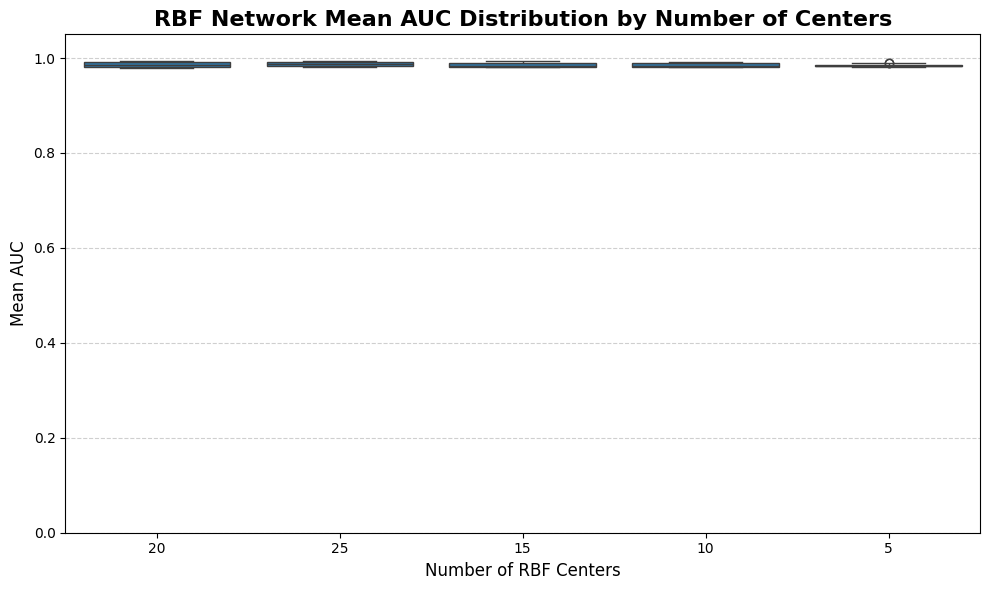

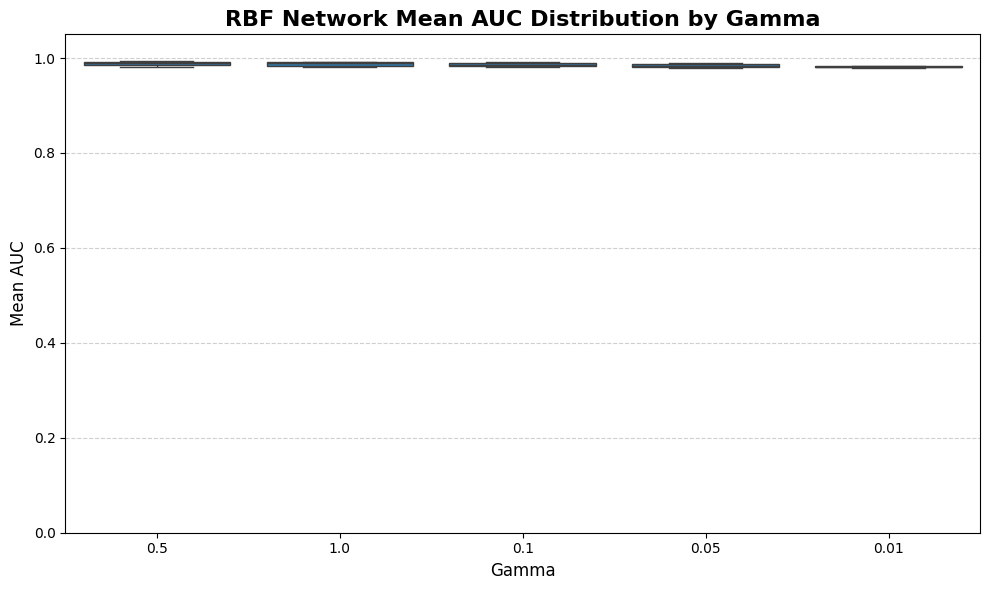

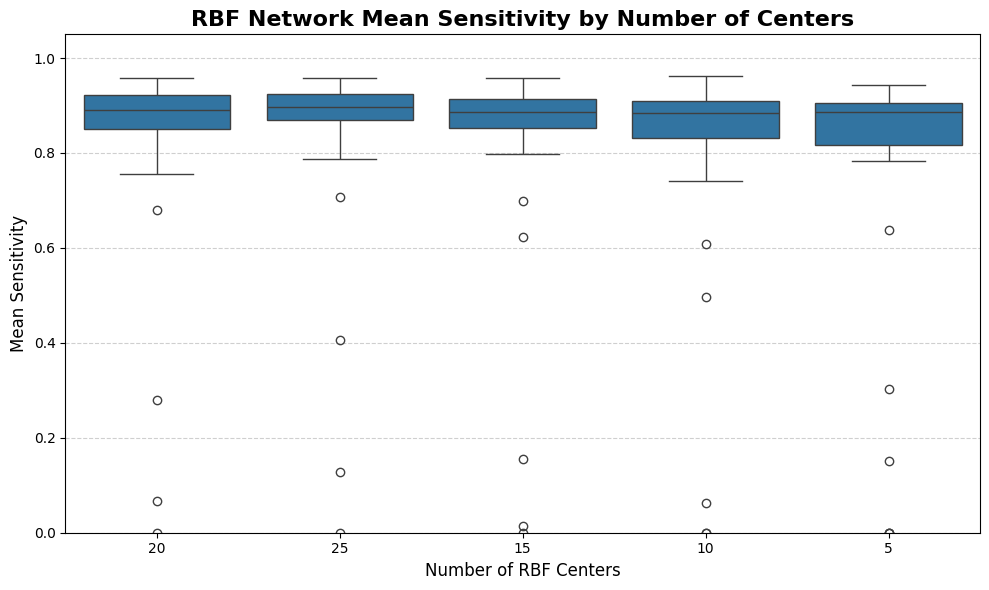

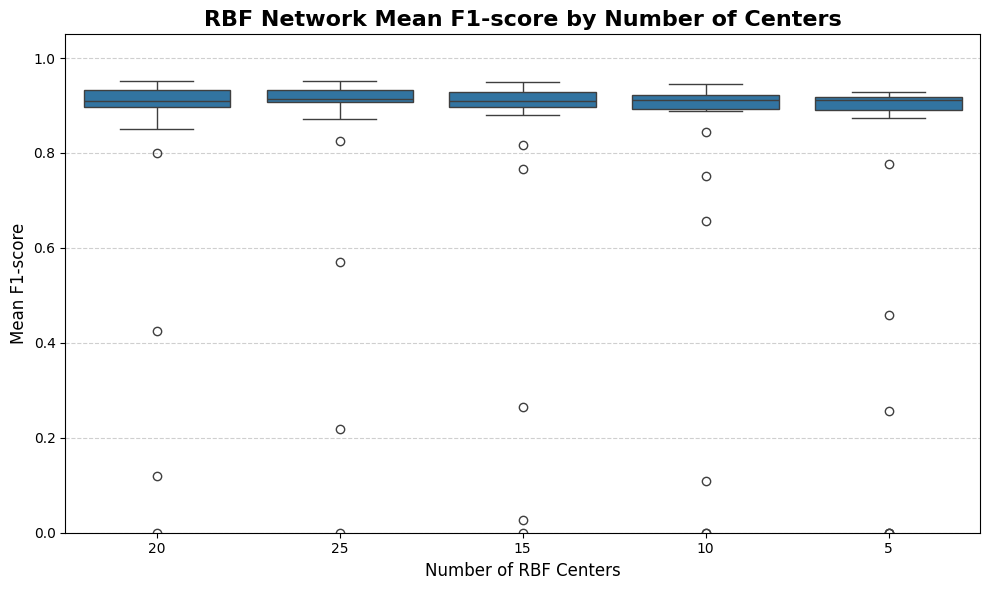

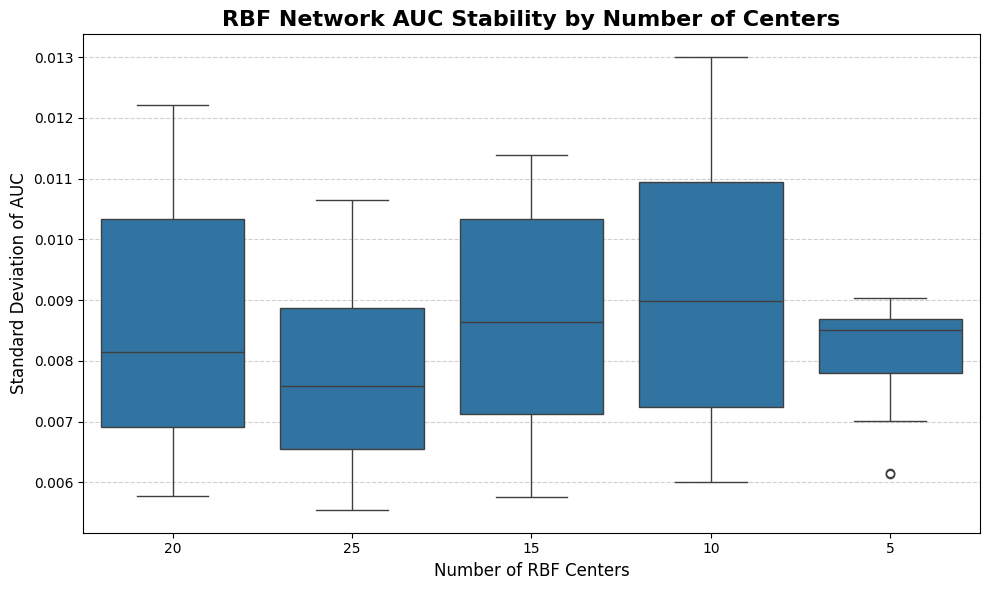

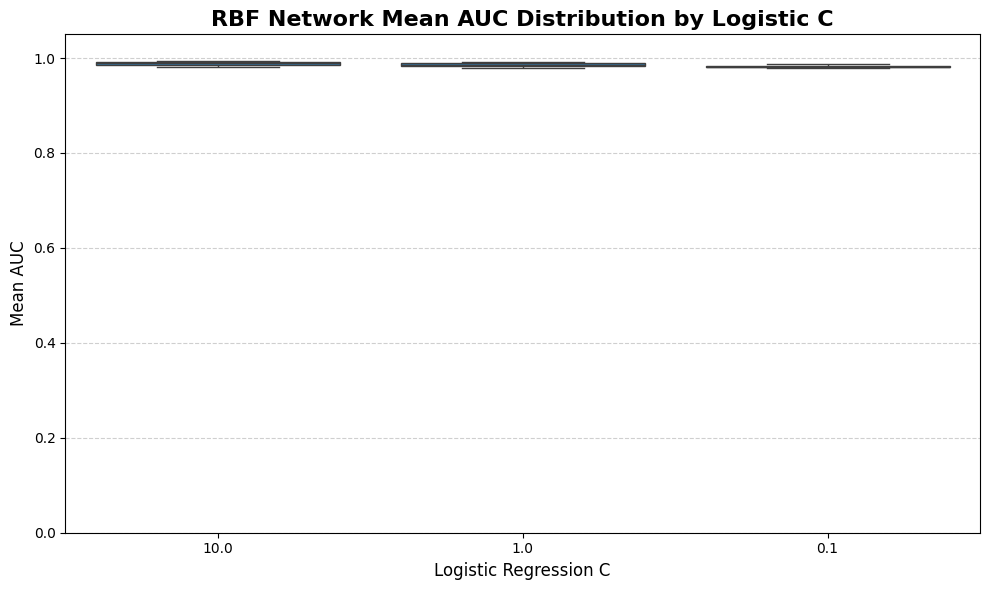

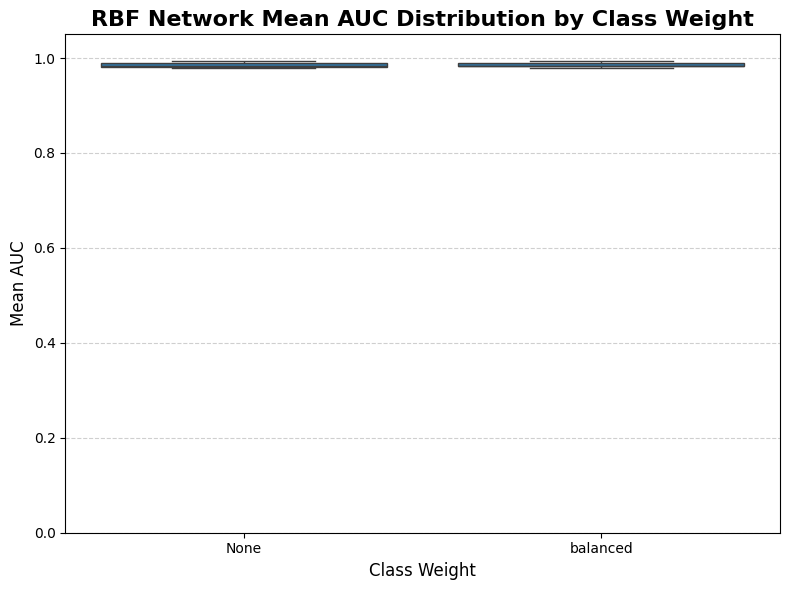

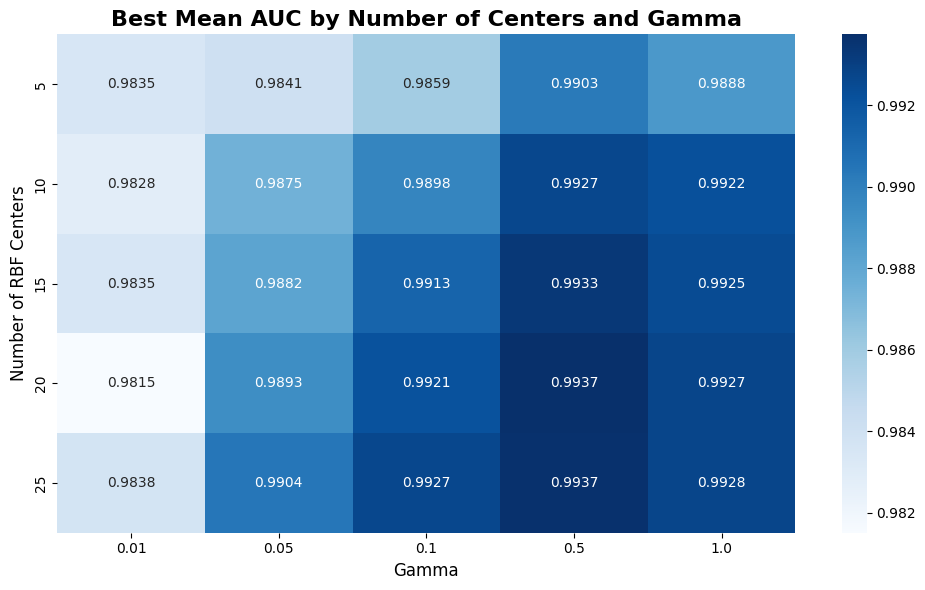

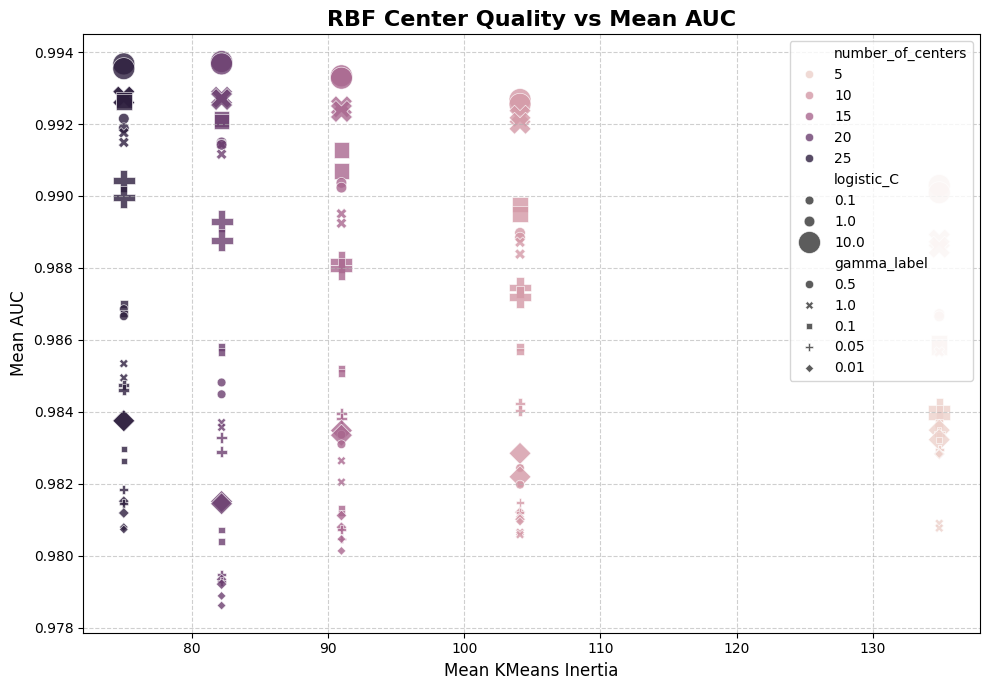

RBF center-count comparison:


,number_of_centers,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Mean_Accuracy_Average,Mean_Accuracy_Max,Std_AUC_Average,Std_AUC_Min,Mean_KMeans_Inertia
3,20,0.985789,0.993738,0.809033,0.957697,0.838994,0.952267,0.910874,0.964881,0.008684,0.005776,82.165090
4,25,0.987105,0.993672,0.822359,0.957697,0.852353,0.950807,0.916494,0.963142,0.007746,0.005545,74.981655
2,15,0.985704,0.993342,0.796992,0.957697,0.826222,0.950127,0.906013,0.963127,0.008604,0.005758,90.972164
1,10,0.985336,0.992681,0.780240,0.962348,0.812011,0.944819,0.900741,0.957864,0.009256,0.006008,104.093045
0,5,0.984527,0.990290,0.746822,0.943411,0.779253,0.928391,0.888373,0.947322,0.008155,0.006141,134.893483



RBF gamma comparison:


,gamma,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min
3,0.50,0.988883,0.993738,0.904718,0.962348,0.922573,0.952267,0.007178,0.005878
4,1.00,0.987856,0.992751,0.913876,0.957697,0.922278,0.952116,0.008384,0.007029
2,0.10,0.985898,0.992674,0.832540,0.952824,0.874387,0.942241,0.007919,0.005545
1,0.05,0.984245,0.990424,0.751912,0.924363,0.798251,0.928763,0.008613,0.005563
0,0.01,0.981578,0.983751,0.552399,0.905426,0.591345,0.918443,0.010351,0.008183



RBF class-weight comparison:


,class_weight_label,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min
0,None,0.985614,0.993738,0.674772,0.948173,0.725816,0.952267,0.008537,0.005564
1,balanced,0.985770,0.993672,0.907406,0.962348,0.917718,0.950807,0.008441,0.005545


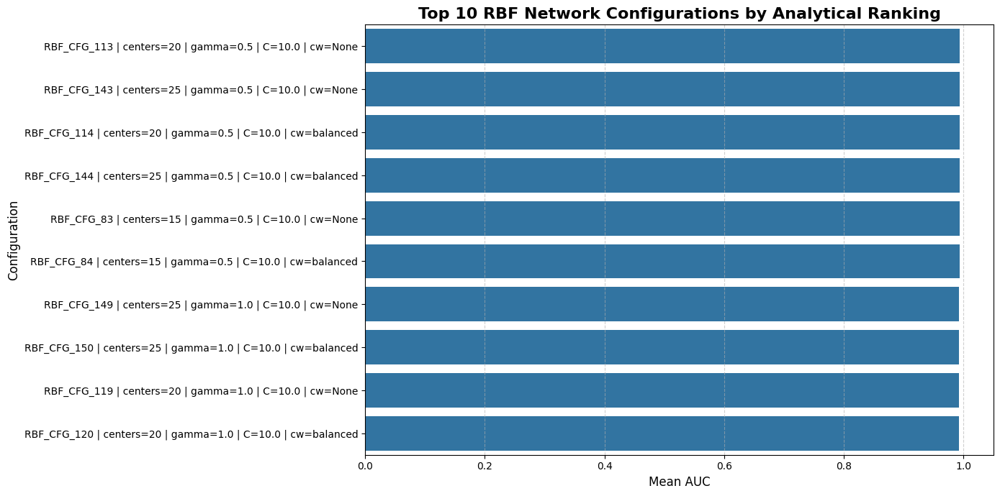


RBF hyperparameter selection plots completed successfully.


In [70]:
# ============================================================
# BOX 68 — RBF Hyperparameter Selection Plots
#
# Purpose:
#   - Visualize RBF Network hyperparameter search results
#   - Analyze performance trends across:
#         1) number_of_centers
#         2) gamma
#         3) logistic_C
#         4) class_weight
#   - Support fully analytical hyperparameter selection
#
# Visual Outputs:
#   1) Mean AUC by number of centers
#   2) Mean AUC by gamma
#   3) Mean Sensitivity by number of centers
#   4) Mean F1-score by number of centers
#   5) Std AUC by number of centers
#   6) Mean AUC by Logistic C
#   7) Mean AUC by class_weight
#   8) Top 10 configurations by analytical ranking
#
# Notes:
#   - No model training is performed in this box
#   - All plots are derived from previous RBF CV results
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "rbf_ranked_results_df",
    "rbf_cv_summary_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(rbf_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "rbf_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(rbf_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "rbf_cv_summary_results_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Prepare plotting DataFrame
# ------------------------------------------------------------
rbf_plot_df = (
    rbf_cv_summary_results_df
    .copy()
)

required_plot_columns = [
    "Config_ID",
    "number_of_centers",
    "gamma",
    "logistic_C",
    "class_weight",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Sensitivity",
    "Mean_F1-score",
    "Mean_Accuracy",
    "Mean_KMeans_Inertia"
]

missing_plot_columns = [
    col for col in required_plot_columns
    if col not in rbf_plot_df.columns
]

if len(missing_plot_columns) > 0:
    raise ValueError(
        f"Missing required plot columns: {missing_plot_columns}"
    )

# ------------------------------------------------------------
# Step 2 — Create readable categorical labels
# ------------------------------------------------------------
rbf_plot_df["centers_label"] = (
    rbf_plot_df["number_of_centers"].astype(str)
)

rbf_plot_df["gamma_label"] = (
    rbf_plot_df["gamma"].astype(str)
)

rbf_plot_df["logistic_C_label"] = (
    rbf_plot_df["logistic_C"].astype(str)
)

rbf_plot_df["class_weight_label"] = (
    rbf_plot_df["class_weight"].astype(str)
)

# ------------------------------------------------------------
# Step 3 — Plot Mean AUC by number of centers
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=rbf_plot_df,
    x="centers_label",
    y="Mean_AUC"
)

plt.title(
    "RBF Network Mean AUC Distribution by Number of Centers",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of RBF Centers", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Plot Mean AUC by gamma
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=rbf_plot_df,
    x="gamma_label",
    y="Mean_AUC"
)

plt.title(
    "RBF Network Mean AUC Distribution by Gamma",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Gamma", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Plot Mean Sensitivity by number of centers
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=rbf_plot_df,
    x="centers_label",
    y="Mean_Sensitivity"
)

plt.title(
    "RBF Network Mean Sensitivity by Number of Centers",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of RBF Centers", fontsize=12)
plt.ylabel("Mean Sensitivity", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Plot Mean F1-score by number of centers
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=rbf_plot_df,
    x="centers_label",
    y="Mean_F1-score"
)

plt.title(
    "RBF Network Mean F1-score by Number of Centers",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of RBF Centers", fontsize=12)
plt.ylabel("Mean F1-score", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Plot AUC stability by number of centers
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=rbf_plot_df,
    x="centers_label",
    y="Std_AUC"
)

plt.title(
    "RBF Network AUC Stability by Number of Centers",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of RBF Centers", fontsize=12)
plt.ylabel("Standard Deviation of AUC", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot Mean AUC by Logistic C
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=rbf_plot_df,
    x="logistic_C_label",
    y="Mean_AUC"
)

plt.title(
    "RBF Network Mean AUC Distribution by Logistic C",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Logistic Regression C", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot Mean AUC by class_weight
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=rbf_plot_df,
    x="class_weight_label",
    y="Mean_AUC"
)

plt.title(
    "RBF Network Mean AUC Distribution by Class Weight",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Class Weight", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot gamma-center performance heatmap
# ------------------------------------------------------------
rbf_gamma_center_heatmap_df = (
    rbf_plot_df
    .groupby(
        [
            "number_of_centers",
            "gamma"
        ]
    )
    .agg(
        Mean_AUC=(
            "Mean_AUC",
            "max"
        )
    )
    .reset_index()
    .pivot(
        index="number_of_centers",
        columns="gamma",
        values="Mean_AUC"
    )
)

plt.figure(figsize=(10, 6))

sns.heatmap(
    rbf_gamma_center_heatmap_df,
    annot=True,
    fmt=".4f",
    cmap="Blues",
    cbar=True
)

plt.title(
    "Best Mean AUC by Number of Centers and Gamma",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Gamma", fontsize=12)
plt.ylabel("Number of RBF Centers", fontsize=12)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot KMeans inertia vs Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=rbf_plot_df,
    x="Mean_KMeans_Inertia",
    y="Mean_AUC",
    hue="number_of_centers",
    style="gamma_label",
    size="logistic_C",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "RBF Center Quality vs Mean AUC",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean KMeans Inertia", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Create comparison tables
# ------------------------------------------------------------
rbf_centers_comparison_df = (
    rbf_plot_df
    .groupby("number_of_centers")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Mean_Accuracy_Average=("Mean_Accuracy", "mean"),
        Mean_Accuracy_Max=("Mean_Accuracy", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_KMeans_Inertia=("Mean_KMeans_Inertia", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

rbf_gamma_comparison_df = (
    rbf_plot_df
    .groupby("gamma")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

rbf_class_weight_comparison_df = (
    rbf_plot_df
    .groupby("class_weight_label")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 13 — Display comparison tables
# ------------------------------------------------------------
print("RBF center-count comparison:")
display(
    rbf_centers_comparison_df.round(6)
)

print("\nRBF gamma comparison:")
display(
    rbf_gamma_comparison_df.round(6)
)

print("\nRBF class-weight comparison:")
display(
    rbf_class_weight_comparison_df.round(6)
)

# ------------------------------------------------------------
# Step 14 — Create top configuration labels
# ------------------------------------------------------------
top_rbf_plot_df = (
    rbf_ranked_results_df
    .head(10)
    .copy()
)

top_rbf_plot_df["Config_Label"] = (
    top_rbf_plot_df["Config_ID"].astype(str)
    + " | centers="
    + top_rbf_plot_df["number_of_centers"].astype(str)
    + " | gamma="
    + top_rbf_plot_df["gamma"].astype(str)
    + " | C="
    + top_rbf_plot_df["logistic_C"].astype(str)
    + " | cw="
    + top_rbf_plot_df["class_weight"].astype(str)
)

# ------------------------------------------------------------
# Step 15 — Plot Top 10 configurations by Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_rbf_plot_df,
    x="Mean_AUC",
    y="Config_Label"
)

plt.title(
    "Top 10 RBF Network Configurations by Analytical Ranking",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean AUC", fontsize=12)
plt.ylabel("Configuration", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()


print(
    "\nRBF hyperparameter selection plots "
    "completed successfully."
)

RBF stability and transformation analysis is ready.

Top reliable RBF configurations:


,Config_ID,number_of_centers,gamma,logistic_C,class_weight,RBF_Feature_Dimension,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,...,Mean_Specificity,Mean_KMeans_Inertia,Std_KMeans_Inertia,AUC_Score,Sensitivity_Score,F1_Score_Normalized,AUC_Stability_Score,Center_Quality_Score,Complexity_Simplicity_Score,Reliability_Score
0,RBF_CFG_143,25,0.5,10.0,None,25,0.993672,0.006341,0.963127,0.016829,...,0.977582,74.981655,3.749081,0.995627,0.975604,0.997476,0.893192,1.000000,0.00,0.927283
1,RBF_CFG_138,25,0.1,10.0,balanced,25,0.992674,0.005545,0.956094,0.013796,...,0.958059,74.981655,3.749081,0.929625,0.990104,0.989472,1.000000,1.000000,0.00,0.924803
2,RBF_CFG_114,20,0.5,10.0,balanced,20,0.993672,0.006821,0.959618,0.015880,...,0.960798,82.165090,4.130692,0.995627,0.995167,0.993828,0.828882,0.880100,0.25,0.921330
3,RBF_CFG_113,20,0.5,10.0,None,20,0.993738,0.006840,0.964881,0.016369,...,0.977621,82.165090,4.130692,1.000000,0.980437,1.000000,0.826236,0.880100,0.25,0.920533
4,RBF_CFG_144,25,0.5,10.0,balanced,25,0.993542,0.006863,0.961372,0.019176,...,0.963576,74.981655,3.749081,0.986985,0.995167,0.995996,0.823250,1.000000,0.00,0.917816
5,RBF_CFG_83,15,0.5,10.0,None,15,0.993342,0.006457,0.959618,0.020151,...,0.969249,90.972164,4.090814,0.973764,0.980437,0.992670,0.877636,0.733099,0.50,0.916706
6,RBF_CFG_84,15,0.5,10.0,balanced,15,0.993275,0.006563,0.957864,0.016817,...,0.958020,90.972164,4.090814,0.969391,0.995167,0.991625,0.863407,0.733099,0.50,0.915997
7,RBF_CFG_137,25,0.1,10.0,None,25,0.992608,0.005598,0.954324,0.014358,...,0.980438,74.981655,3.749081,0.925294,0.945915,0.983434,0.992876,1.000000,0.00,0.912389
8,RBF_CFG_108,20,0.1,10.0,balanced,20,0.992144,0.005776,0.952585,0.013211,...,0.958059,82.165090,4.130692,0.894562,0.980322,0.983721,0.968965,0.880100,0.25,0.907032
9,RBF_CFG_54,10,0.5,10.0,balanced,10,0.992681,0.006108,0.957864,0.015631,...,0.955203,104.093045,4.216535,0.930121,1.000000,0.992179,0.924413,0.514096,0.75,0.905044



Center-count stability summary:


,number_of_centers,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Mean_F1_score,Mean_KMeans_Inertia,Std_KMeans_Inertia
4,25,0.987105,0.008393,0.916494,0.081726,0.822359,0.852353,74.981655,3.364513
3,20,0.985789,0.009590,0.910874,0.086864,0.809033,0.838994,82.165090,3.706980
2,15,0.985704,0.009045,0.906013,0.091949,0.796992,0.826222,90.972164,3.671193
1,10,0.985336,0.009479,0.900741,0.096607,0.780240,0.812011,104.093045,3.784018
0,5,0.984527,0.007731,0.888373,0.107015,0.746822,0.779253,134.893483,6.110952



Gamma stability summary:


,gamma,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Mean_F1_score,Mean_KMeans_Inertia,Std_KMeans_Inertia
3,0.50,0.988883,0.007615,0.944094,0.024400,0.904718,0.922573,97.421087,21.59492
4,1.00,0.987856,0.008736,0.942978,0.026429,0.913876,0.922278,97.421087,21.59492
2,0.10,0.985898,0.008175,0.920892,0.058513,0.832540,0.874387,97.421087,21.59492
1,0.05,0.984245,0.008470,0.892537,0.096201,0.751912,0.798251,97.421087,21.59492
0,0.01,0.981578,0.009506,0.821994,0.140071,0.552399,0.591345,97.421087,21.59492


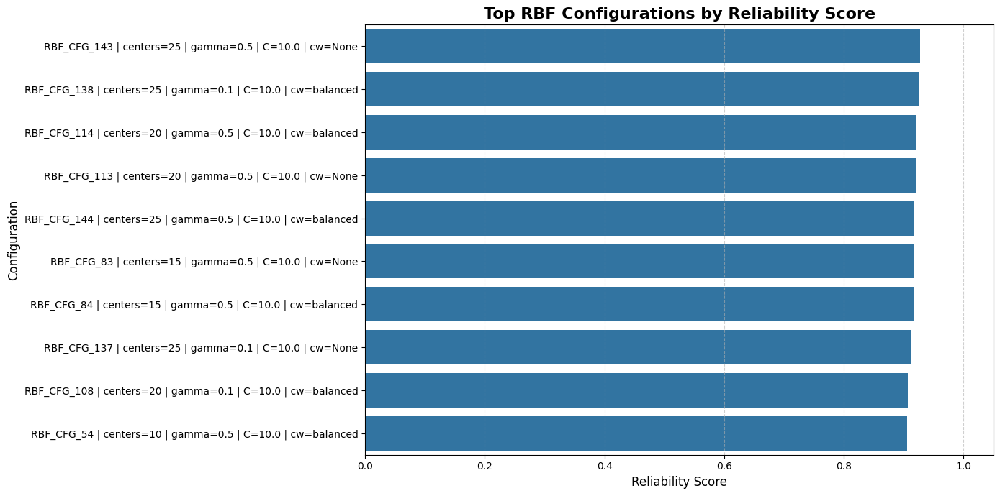

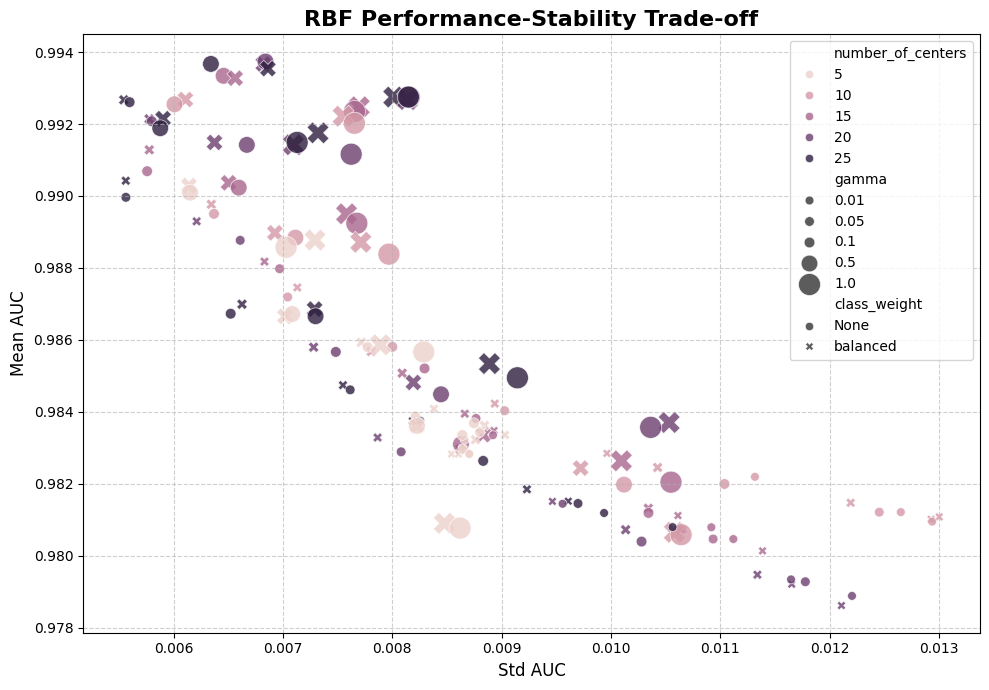

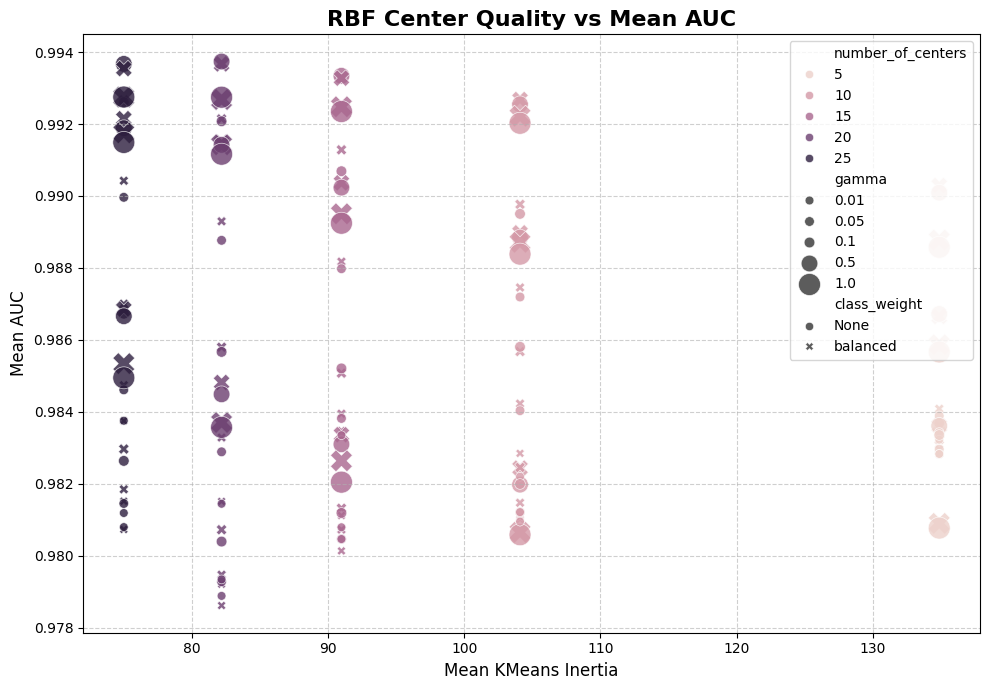

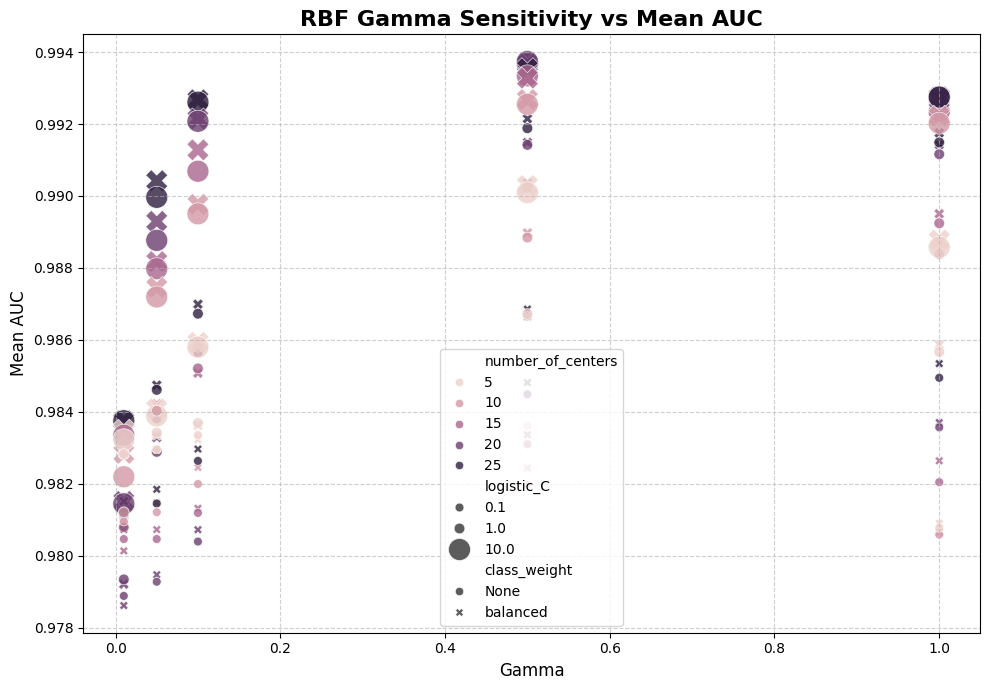


RBF stability and transformation analysis completed successfully.


In [71]:
# ============================================================
# BOX 69 — RBF Stability and Transformation Analysis
#
# Purpose:
#   - Analyze RBF Network stability across folds
#   - Analyze transformation behavior across configurations
#   - Compare performance stability with RBF center quality
#   - Identify reliable configurations before final selection
#
# Analytical Dimensions:
#   1) AUC stability
#   2) Accuracy stability
#   3) F1-score stability
#   4) KMeans inertia
#   5) Number of RBF centers
#   6) Gamma sensitivity
#
# Notes:
#   - No model training is performed in this box
#   - All results are derived from previous RBF CV outputs
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "rbf_ranked_results_df",
    "rbf_cv_fold_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(rbf_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "rbf_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(rbf_cv_fold_results_df, pd.DataFrame):
    raise TypeError(
        "rbf_cv_fold_results_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Build reliability analysis table
# ------------------------------------------------------------
rbf_reliability_analysis_df = (
    rbf_ranked_results_df[
        [
            "Config_ID",
            "number_of_centers",
            "gamma",
            "logistic_C",
            "class_weight",
            "RBF_Feature_Dimension",
            "Mean_AUC",
            "Std_AUC",
            "Mean_Accuracy",
            "Std_Accuracy",
            "Mean_F1-score",
            "Std_F1-score",
            "Mean_Sensitivity",
            "Mean_Specificity",
            "Mean_KMeans_Inertia",
            "Std_KMeans_Inertia"
        ]
    ]
    .copy()
)

# ------------------------------------------------------------
# Step 2 — Define min-max normalization utility
# ------------------------------------------------------------
def min_max_normalize(series):
    """
    Apply min-max normalization.
    If all values are equal, return ones.
    """

    min_value = series.min()
    max_value = series.max()

    if max_value == min_value:
        return pd.Series(
            np.ones(len(series)),
            index=series.index
        )

    return (
        (series - min_value)
        / (max_value - min_value)
    )

# ------------------------------------------------------------
# Step 3 — Compute normalized reliability components
# ------------------------------------------------------------
rbf_reliability_analysis_df["AUC_Score"] = (
    min_max_normalize(
        rbf_reliability_analysis_df["Mean_AUC"]
    )
)

rbf_reliability_analysis_df["Sensitivity_Score"] = (
    min_max_normalize(
        rbf_reliability_analysis_df["Mean_Sensitivity"]
    )
)

rbf_reliability_analysis_df["F1_Score_Normalized"] = (
    min_max_normalize(
        rbf_reliability_analysis_df["Mean_F1-score"]
    )
)

rbf_reliability_analysis_df["AUC_Stability_Score"] = (
    1
    - min_max_normalize(
        rbf_reliability_analysis_df["Std_AUC"]
    )
)

rbf_reliability_analysis_df["Center_Quality_Score"] = (
    1
    - min_max_normalize(
        rbf_reliability_analysis_df["Mean_KMeans_Inertia"]
    )
)

rbf_reliability_analysis_df["Complexity_Simplicity_Score"] = (
    1
    - min_max_normalize(
        rbf_reliability_analysis_df["number_of_centers"]
    )
)

# ------------------------------------------------------------
# Step 4 — Compute overall reliability score
# ------------------------------------------------------------
rbf_reliability_analysis_df["Reliability_Score"] = (
    0.30 * rbf_reliability_analysis_df["AUC_Score"]
    + 0.20 * rbf_reliability_analysis_df["Sensitivity_Score"]
    + 0.20 * rbf_reliability_analysis_df["F1_Score_Normalized"]
    + 0.15 * rbf_reliability_analysis_df["AUC_Stability_Score"]
    + 0.10 * rbf_reliability_analysis_df["Center_Quality_Score"]
    + 0.05 * rbf_reliability_analysis_df["Complexity_Simplicity_Score"]
)

rbf_reliability_analysis_df = (
    rbf_reliability_analysis_df
    .sort_values(
        by=[
            "Reliability_Score",
            "Mean_AUC",
            "Std_AUC"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 5 — Create center-count stability summary
# ------------------------------------------------------------
rbf_center_stability_summary_df = (
    rbf_cv_fold_results_df
    .groupby("number_of_centers")
    .agg(
        Mean_AUC=("AUC", "mean"),
        Std_AUC=("AUC", "std"),
        Mean_Accuracy=("Accuracy", "mean"),
        Std_Accuracy=("Accuracy", "std"),
        Mean_Sensitivity=("Sensitivity", "mean"),
        Mean_F1_score=("F1-score", "mean"),
        Mean_KMeans_Inertia=("kmeans_inertia", "mean"),
        Std_KMeans_Inertia=("kmeans_inertia", "std")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC",
            "Std_AUC",
            "number_of_centers"
        ],
        ascending=[
            False,
            True,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 6 — Create gamma stability summary
# ------------------------------------------------------------
rbf_gamma_stability_summary_df = (
    rbf_cv_fold_results_df
    .groupby("gamma")
    .agg(
        Mean_AUC=("AUC", "mean"),
        Std_AUC=("AUC", "std"),
        Mean_Accuracy=("Accuracy", "mean"),
        Std_Accuracy=("Accuracy", "std"),
        Mean_Sensitivity=("Sensitivity", "mean"),
        Mean_F1_score=("F1-score", "mean"),
        Mean_KMeans_Inertia=("kmeans_inertia", "mean"),
        Std_KMeans_Inertia=("kmeans_inertia", "std")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC",
            "Std_AUC",
            "gamma"
        ],
        ascending=[
            False,
            True,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 7 — Extract top reliable configurations
# ------------------------------------------------------------
rbf_stability_transformation_top_df = (
    rbf_reliability_analysis_df
    .head(10)
    .copy()
)

# ------------------------------------------------------------
# Step 8 — Display reliability and stability reports
# ------------------------------------------------------------
print(
    "RBF stability and transformation analysis is ready."
)

print("\nTop reliable RBF configurations:")

display(
    rbf_stability_transformation_top_df
    .round(6)
)

print("\nCenter-count stability summary:")

display(
    rbf_center_stability_summary_df
    .round(6)
)

print("\nGamma stability summary:")

display(
    rbf_gamma_stability_summary_df
    .round(6)
)

# ------------------------------------------------------------
# Step 9 — Plot reliability score for top configurations
# ------------------------------------------------------------
top_rbf_reliability_plot_df = (
    rbf_stability_transformation_top_df.copy()
)

top_rbf_reliability_plot_df["Config_Label"] = (
    top_rbf_reliability_plot_df["Config_ID"].astype(str)
    + " | centers="
    + top_rbf_reliability_plot_df["number_of_centers"].astype(str)
    + " | gamma="
    + top_rbf_reliability_plot_df["gamma"].astype(str)
    + " | C="
    + top_rbf_reliability_plot_df["logistic_C"].astype(str)
    + " | cw="
    + top_rbf_reliability_plot_df["class_weight"].astype(str)
)

plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_rbf_reliability_plot_df,
    x="Reliability_Score",
    y="Config_Label"
)

plt.title(
    "Top RBF Configurations by Reliability Score",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Reliability Score", fontsize=12)
plt.ylabel("Configuration", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot Mean AUC vs Std AUC
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=rbf_reliability_analysis_df,
    x="Std_AUC",
    y="Mean_AUC",
    hue="number_of_centers",
    style="class_weight",
    size="gamma",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "RBF Performance-Stability Trade-off",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Std AUC", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot KMeans inertia vs Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=rbf_reliability_analysis_df,
    x="Mean_KMeans_Inertia",
    y="Mean_AUC",
    hue="number_of_centers",
    style="class_weight",
    size="gamma",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "RBF Center Quality vs Mean AUC",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean KMeans Inertia", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Plot gamma vs Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=rbf_reliability_analysis_df,
    x="gamma",
    y="Mean_AUC",
    hue="number_of_centers",
    style="class_weight",
    size="logistic_C",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "RBF Gamma Sensitivity vs Mean AUC",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Gamma", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

print(
    "\nRBF stability and transformation analysis "
    "completed successfully."
)

In [72]:
# ============================================================
# BOX 70 — Analytical Best RBF Configuration Selection
#
# Purpose:
#   - Select the best RBF Network configuration analytically
#   - Avoid manual hyperparameter selection
#   - Apply a fully reproducible ranking strategy
#   - Combine performance, stability, center quality, and simplicity
#
# Selection Priority:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Lower number_of_centers in case of ties
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "rbf_ranked_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(rbf_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "rbf_ranked_results_df must be a pandas DataFrame."
    )

if rbf_ranked_results_df.empty:
    raise ValueError(
        "rbf_ranked_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Apply final analytical ranking strategy
# ------------------------------------------------------------
rbf_final_ranking_df = (
    rbf_ranked_results_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "number_of_centers",
            "Mean_KMeans_Inertia",
            "logistic_C"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 2 — Select best configuration
# ------------------------------------------------------------
best_rbf_configuration = (
    rbf_final_ranking_df.iloc[0]
)

# ------------------------------------------------------------
# Step 3 — Extract selected hyperparameters
# ------------------------------------------------------------
BEST_RBF_CONFIG_ID = (
    best_rbf_configuration["Config_ID"]
)

BEST_RBF_NUMBER_OF_CENTERS = int(
    best_rbf_configuration["number_of_centers"]
)

BEST_RBF_GAMMA = float(
    best_rbf_configuration["gamma"]
)

BEST_RBF_LOGISTIC_C = float(
    best_rbf_configuration["logistic_C"]
)

BEST_RBF_CLASS_WEIGHT = (
    None
    if str(best_rbf_configuration["class_weight"]) == "None"
    else best_rbf_configuration["class_weight"]
)

BEST_RBF_RANDOM_STATE = 42

BEST_RBF_N_INIT = 10

BEST_RBF_LOGISTIC_MAX_ITER = 2000

BEST_RBF_LOGISTIC_SOLVER = "lbfgs"

# ------------------------------------------------------------
# Step 4 — Create best-configuration report
# ------------------------------------------------------------
best_rbf_configuration_report = {

    "Config_ID":
        BEST_RBF_CONFIG_ID,

    "number_of_centers":
        BEST_RBF_NUMBER_OF_CENTERS,

    "gamma":
        BEST_RBF_GAMMA,

    "logistic_C":
        BEST_RBF_LOGISTIC_C,

    "class_weight":
        str(BEST_RBF_CLASS_WEIGHT),

    "logistic_solver":
        BEST_RBF_LOGISTIC_SOLVER,

    "Mean_Accuracy":
        best_rbf_configuration["Mean_Accuracy"],

    "Std_Accuracy":
        best_rbf_configuration["Std_Accuracy"],

    "Mean_Sensitivity":
        best_rbf_configuration["Mean_Sensitivity"],

    "Std_Sensitivity":
        best_rbf_configuration["Std_Sensitivity"],

    "Mean_Specificity":
        best_rbf_configuration["Mean_Specificity"],

    "Std_Specificity":
        best_rbf_configuration["Std_Specificity"],

    "Mean_F1-score":
        best_rbf_configuration["Mean_F1-score"],

    "Std_F1-score":
        best_rbf_configuration["Std_F1-score"],

    "Mean_AUC":
        best_rbf_configuration["Mean_AUC"],

    "Std_AUC":
        best_rbf_configuration["Std_AUC"],

    "Mean_KMeans_Inertia":
        best_rbf_configuration["Mean_KMeans_Inertia"],

    "Std_KMeans_Inertia":
        best_rbf_configuration["Std_KMeans_Inertia"]
}

best_rbf_configuration_df = pd.DataFrame(
    [best_rbf_configuration_report]
)

# ------------------------------------------------------------
# Step 5 — Create top-5 comparison table
# ------------------------------------------------------------
top5_rbf_configurations_df = (
    rbf_final_ranking_df
    .head(5)
    .copy()
)

top5_display_columns = [
    "Config_ID",
    "number_of_centers",
    "gamma",
    "logistic_C",
    "class_weight",
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Mean_KMeans_Inertia"
]

top5_rbf_configurations_df = (
    top5_rbf_configurations_df[
        top5_display_columns
    ]
)

# ------------------------------------------------------------
# Step 6 — Create rounded display tables
# ------------------------------------------------------------
best_rbf_configuration_display_df = (
    best_rbf_configuration_df.copy()
)

best_numeric_columns = [
    col for col in best_rbf_configuration_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or col in [
            "gamma",
            "logistic_C"
        ]
    )
]

best_rbf_configuration_display_df[
    best_numeric_columns
] = (
    best_rbf_configuration_display_df[
        best_numeric_columns
    ].round(6)
)

top5_rbf_display_df = (
    top5_rbf_configurations_df.copy()
)

top5_numeric_columns = [
    col for col in top5_rbf_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or col in [
            "gamma",
            "logistic_C"
        ]
    )
]

top5_rbf_display_df[
    top5_numeric_columns
] = (
    top5_rbf_display_df[
        top5_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 7 — Create analytical interpretation report
# ------------------------------------------------------------
rbf_selection_interpretation = {

    "Selected_Model":
        "RBF Network",

    "Selection_Method":
        "Fully Analytical Cross-Validation Ranking",

    "Primary_Criterion":
        "Highest Mean_AUC",

    "Secondary_Criterion":
        "Highest Mean_Sensitivity",

    "Tertiary_Criterion":
        "Highest Mean_F1-score",

    "Stability_Criterion":
        "Lowest Std_AUC",

    "Simplicity_Criterion":
        "Lower number_of_centers in case of ties",

    "Center_Quality_Criterion":
        "Lower Mean_KMeans_Inertia in case of ties"
}

rbf_selection_interpretation_df = pd.DataFrame(
    [rbf_selection_interpretation]
)

# ------------------------------------------------------------
# Step 8 — Store final metadata
# ------------------------------------------------------------
best_rbf_metadata = {

    "model_name":
        "RBF Network",

    "config_id":
        BEST_RBF_CONFIG_ID,

    "number_of_centers":
        BEST_RBF_NUMBER_OF_CENTERS,

    "gamma":
        BEST_RBF_GAMMA,

    "logistic_C":
        BEST_RBF_LOGISTIC_C,

    "class_weight":
        BEST_RBF_CLASS_WEIGHT,

    "random_state":
        BEST_RBF_RANDOM_STATE,

    "n_init":
        BEST_RBF_N_INIT,

    "logistic_max_iter":
        BEST_RBF_LOGISTIC_MAX_ITER,

    "logistic_solver":
        BEST_RBF_LOGISTIC_SOLVER
}

# ------------------------------------------------------------
# Step 9 — Display analytical selection results
# ------------------------------------------------------------
print(
    "Analytical best RBF Network configuration selected."
)

print("\nSelection criteria:")
display(
    rbf_selection_interpretation_df
)

print("\nBest RBF Network configuration:")
display(
    best_rbf_configuration_display_df
)

print("\nTop 5 ranked configurations:")
display(
    top5_rbf_display_df
)

# ------------------------------------------------------------
# Step 10 — Final confirmation
# ------------------------------------------------------------
print("\nSelected hyperparameters:")
print(f"number_of_centers : {BEST_RBF_NUMBER_OF_CENTERS}")
print(f"gamma             : {BEST_RBF_GAMMA}")
print(f"logistic_C        : {BEST_RBF_LOGISTIC_C}")
print(f"class_weight      : {BEST_RBF_CLASS_WEIGHT}")
print(f"logistic_solver   : {BEST_RBF_LOGISTIC_SOLVER}")

print(
    "\nAnalytical RBF Network model selection "
    "completed successfully."
)

Analytical best RBF Network configuration selected.

Selection criteria:


,Selected_Model,Selection_Method,Primary_Criterion,Secondary_Criterion,Tertiary_Criterion,Stability_Criterion,Simplicity_Criterion,Center_Quality_Criterion
0,RBF Network,Fully Analytical Cross-Validation Ranking,Highest Mean_AUC,Highest Mean_Sensitivity,Highest Mean_F1-score,Lowest Std_AUC,Lower number_of_centers in case of ties,Lower Mean_KMeans_Inertia in case of ties



Best RBF Network configuration:


,Config_ID,number_of_centers,gamma,logistic_C,class_weight,logistic_solver,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Mean_KMeans_Inertia,Std_KMeans_Inertia
0,RBF_CFG_113,20,0.5,10.0,None,lbfgs,0.964881,0.016369,0.943522,0.048607,0.977621,0.023288,0.952267,0.022752,0.993738,0.00684,82.16509,4.130692



Top 5 ranked configurations:


,Config_ID,number_of_centers,gamma,logistic_C,class_weight,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC,Mean_KMeans_Inertia
0,RBF_CFG_113,20,0.5,10.0,None,0.964881,0.943522,0.977621,0.952267,0.993738,0.006840,82.165090
1,RBF_CFG_143,25,0.5,10.0,None,0.963127,0.938870,0.977582,0.949864,0.993672,0.006341,74.981655
2,RBF_CFG_114,20,0.5,10.0,balanced,0.959618,0.957697,0.960798,0.946390,0.993672,0.006821,82.165090
3,RBF_CFG_144,25,0.5,10.0,balanced,0.961372,0.957697,0.963576,0.948455,0.993542,0.006863,74.981655
4,RBF_CFG_83,15,0.5,10.0,None,0.959618,0.943522,0.969249,0.945287,0.993342,0.006457,90.972164



Selected hyperparameters:
number_of_centers : 20
gamma             : 0.5
logistic_C        : 10.0
class_weight      : None
logistic_solver   : lbfgs

Analytical RBF Network model selection completed successfully.


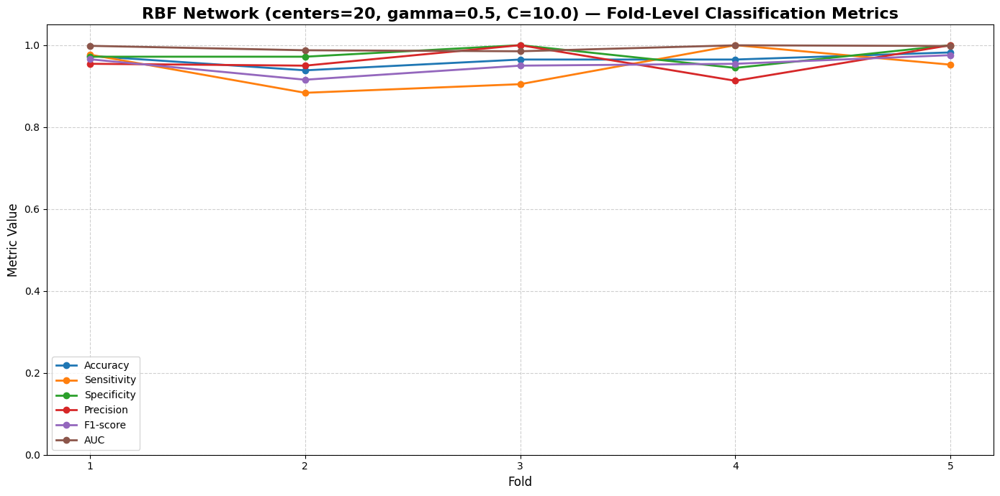

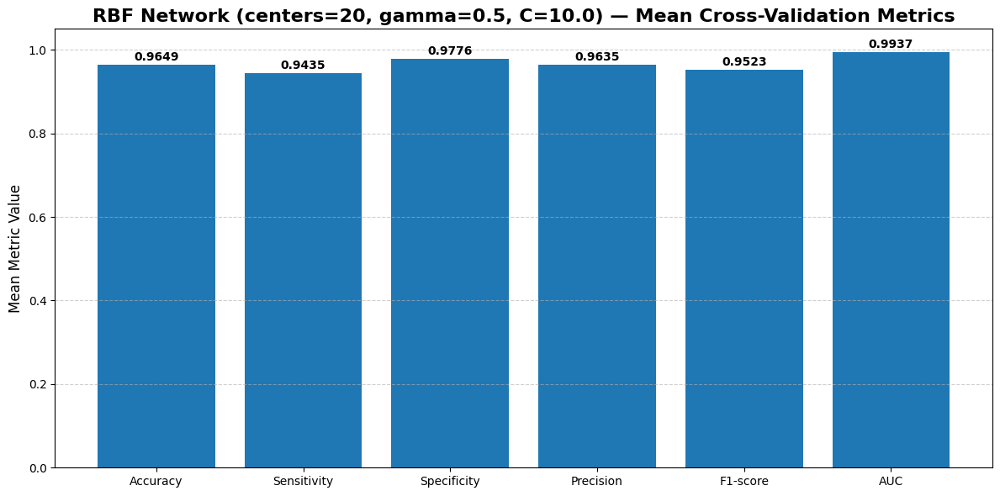

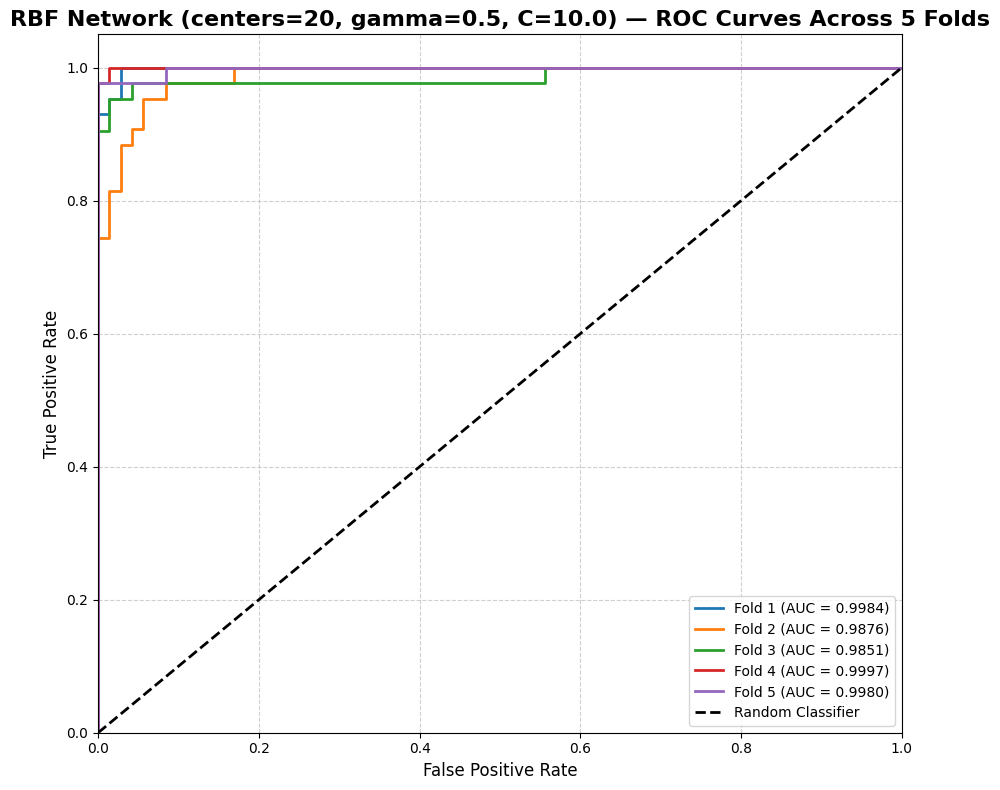

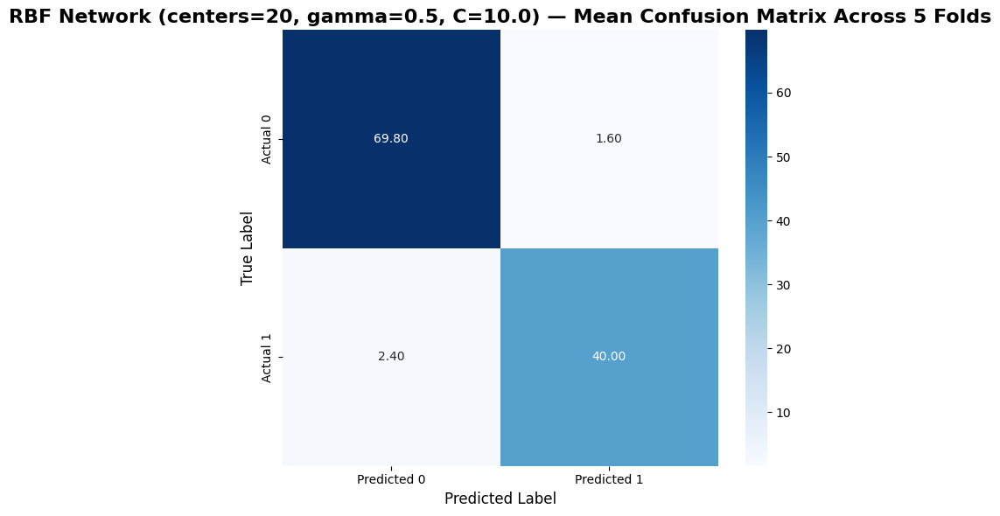

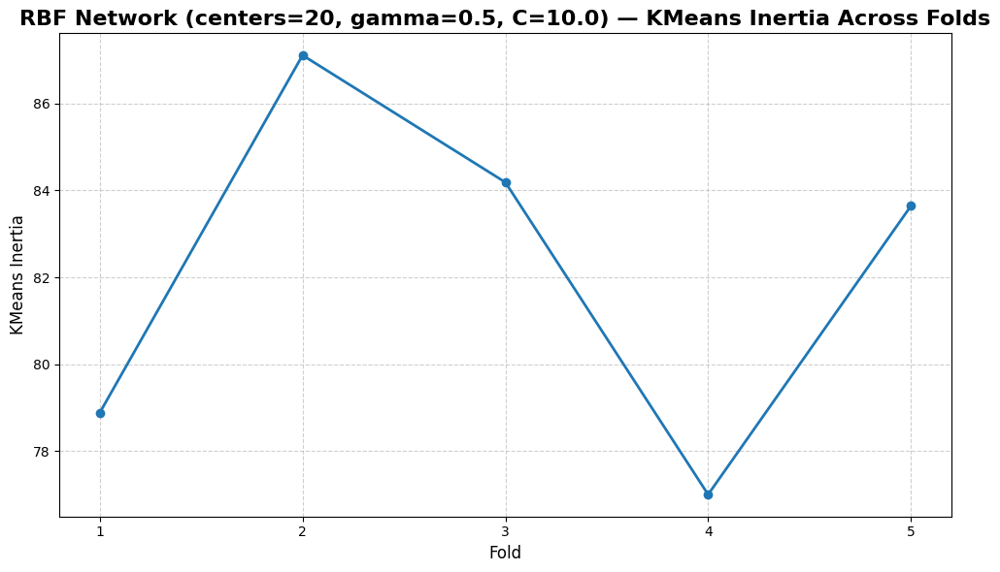

Final RBF Network evaluation and visual report is ready.

Selected RBF configuration:
number_of_centers : 20
gamma             : 0.5
logistic_C        : 10.0
class_weight      : None
logistic_solver   : lbfgs

Fold-level results:


,Model,Fold,number_of_centers,gamma,logistic_C,class_weight,RBF_Feature_Dimension,kmeans_inertia,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,RBF Network,1,20,0.5,10.0,None,20,78.882748,0.973684,0.976744,0.971831,0.954545,0.965517,0.998362,42,2,1,69
1,RBF Network,2,20,0.5,10.0,None,20,87.114163,0.938596,0.883721,0.971831,0.950000,0.915663,0.987553,38,2,5,69
2,RBF Network,3,20,0.5,10.0,None,20,84.188586,0.964912,0.904762,1.000000,1.000000,0.950000,0.985119,38,0,4,72
3,RBF Network,4,20,0.5,10.0,None,20,76.997332,0.964912,1.000000,0.944444,0.913043,0.954545,0.999669,42,4,0,68
4,RBF Network,5,20,0.5,10.0,None,20,83.642621,0.982301,0.952381,1.000000,1.000000,0.975610,0.997988,40,0,2,71



Compact metric summary:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.964881,0.016369,0.938596,0.982301
1,Sensitivity,0.943522,0.048607,0.883721,1.000000
2,Specificity,0.977621,0.023288,0.944444,1.000000
3,Precision,0.963518,0.036989,0.913043,1.000000
4,F1-score,0.952267,0.022752,0.915663,0.975610
5,AUC,0.993738,0.006840,0.985119,0.999669



Transformation summary:


,Mean_KMeans_Inertia,Std_KMeans_Inertia,RBF_Feature_Dimension
0,82.16509,4.130692,20



Final RBF Network evaluation completed successfully.


In [73]:
# ============================================================
# BOX 71 — Final RBF 5-Fold Evaluation and Visual Report
#
# Purpose:
#   - Train and evaluate the analytically selected RBF Network
#   - Perform final Stratified 5-Fold evaluation
#   - Plot fold-level metrics, ROC curves, and mean confusion matrix
#   - Generate report-ready final tables and figures
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "build_rbf_transformed_datasets",
    "compute_binary_classification_metrics",
    "compute_roc_curve_data",
    "BEST_RBF_NUMBER_OF_CENTERS",
    "BEST_RBF_GAMMA",
    "BEST_RBF_LOGISTIC_C",
    "BEST_RBF_CLASS_WEIGHT",
    "BEST_RBF_RANDOM_STATE",
    "BEST_RBF_N_INIT",
    "BEST_RBF_LOGISTIC_MAX_ITER",
    "BEST_RBF_LOGISTIC_SOLVER"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
final_rbf_fold_results = []
final_rbf_confusion_matrices = []
final_rbf_roc_data = []
final_rbf_trained_models = []
final_rbf_transformers = []

# ------------------------------------------------------------
# Step 2 — Run final 5-Fold evaluation
# ------------------------------------------------------------
for fold_data in cv5_scaled_folds:

    fold_number = fold_data["fold_number"]

    X_train = fold_data["X_train_scaled"]
    X_val = fold_data["X_validation_scaled"]

    y_train = fold_data["y_train"]
    y_val = fold_data["y_validation"]

    # --------------------------------------------------------
    # Step 2.1 — Build RBF-transformed datasets
    # --------------------------------------------------------
    rbf_transformed_output = build_rbf_transformed_datasets(
        X_train=X_train,
        X_validation=X_val,
        number_of_centers=BEST_RBF_NUMBER_OF_CENTERS,
        gamma=BEST_RBF_GAMMA,
        random_state=BEST_RBF_RANDOM_STATE,
        n_init=BEST_RBF_N_INIT
    )

    X_train_rbf = rbf_transformed_output["X_train_rbf"]
    X_val_rbf = rbf_transformed_output["X_validation_rbf"]

    kmeans_model = rbf_transformed_output["kmeans_model"]

    kmeans_inertia = getattr(
        kmeans_model,
        "inertia_",
        np.nan
    )

    # --------------------------------------------------------
    # Step 2.2 — Train Logistic Regression output layer
    # --------------------------------------------------------
    final_rbf_classifier = LogisticRegression(
        C=BEST_RBF_LOGISTIC_C,
        class_weight=BEST_RBF_CLASS_WEIGHT,
        solver=BEST_RBF_LOGISTIC_SOLVER,
        max_iter=BEST_RBF_LOGISTIC_MAX_ITER,
        random_state=BEST_RBF_RANDOM_STATE
    )

    final_rbf_classifier.fit(
        X_train_rbf,
        y_train
    )

    # --------------------------------------------------------
    # Step 2.3 — Generate predictions and scores
    # --------------------------------------------------------
    y_pred = final_rbf_classifier.predict(
        X_val_rbf
    )

    y_score = (
        final_rbf_classifier
        .predict_proba(X_val_rbf)[:, 1]
    )

    # --------------------------------------------------------
    # Step 2.4 — Compute metrics
    # --------------------------------------------------------
    fold_metrics = compute_binary_classification_metrics(
        y_true=y_val,
        y_pred=y_pred,
        y_score=y_score
    )

    fold_roc_data = compute_roc_curve_data(
        y_true=y_val,
        y_score=y_score
    )

    confusion_mat = confusion_matrix(
        y_val,
        y_pred
    )

    # --------------------------------------------------------
    # Step 2.5 — Store fold-level result row
    # --------------------------------------------------------
    fold_result_row = {
        "Model": "RBF Network",
        "Fold": fold_number,

        "number_of_centers": BEST_RBF_NUMBER_OF_CENTERS,
        "gamma": BEST_RBF_GAMMA,
        "logistic_C": BEST_RBF_LOGISTIC_C,
        "class_weight": str(BEST_RBF_CLASS_WEIGHT),

        "RBF_Feature_Dimension": X_train_rbf.shape[1],
        "kmeans_inertia": kmeans_inertia,

        "Accuracy": fold_metrics["Accuracy"],
        "Sensitivity": fold_metrics["Sensitivity"],
        "Specificity": fold_metrics["Specificity"],
        "Precision": fold_metrics["Precision"],
        "F1-score": fold_metrics["F1-score"],
        "AUC": fold_metrics["AUC"],

        "TP": fold_metrics["TP"],
        "FP": fold_metrics["FP"],
        "FN": fold_metrics["FN"],
        "TN": fold_metrics["TN"]
    }

    final_rbf_fold_results.append(
        fold_result_row
    )

    final_rbf_confusion_matrices.append({
        "fold": fold_number,
        "matrix": confusion_mat
    })

    final_rbf_roc_data.append({
        "fold": fold_number,
        "roc_data": fold_roc_data
    })

    final_rbf_trained_models.append({
        "fold": fold_number,
        "model": final_rbf_classifier
    })

    final_rbf_transformers.append({
        "fold": fold_number,
        "kmeans_model": kmeans_model,
        "centers": rbf_transformed_output["centers"]
    })

# ------------------------------------------------------------
# Step 3 — Create fold-level DataFrame
# ------------------------------------------------------------
final_rbf_fold_results_df = pd.DataFrame(
    final_rbf_fold_results
)

# ------------------------------------------------------------
# Step 4 — Compute summary statistics
# ------------------------------------------------------------
summary_metrics = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

final_rbf_summary_rows = []

for metric_name in summary_metrics:

    metric_values = final_rbf_fold_results_df[
        metric_name
    ]

    final_rbf_summary_rows.append({
        "Metric": metric_name,
        "Mean": metric_values.mean(),
        "Std": metric_values.std(),
        "Min": metric_values.min(),
        "Max": metric_values.max()
    })

final_rbf_summary_results_df = pd.DataFrame(
    final_rbf_summary_rows
)

# ------------------------------------------------------------
# Step 5 — Compute transformation summary
# ------------------------------------------------------------
final_rbf_transformation_summary_df = pd.DataFrame([{
    "Mean_KMeans_Inertia":
        final_rbf_fold_results_df["kmeans_inertia"].mean(),

    "Std_KMeans_Inertia":
        final_rbf_fold_results_df["kmeans_inertia"].std(),

    "RBF_Feature_Dimension":
        BEST_RBF_NUMBER_OF_CENTERS
}])

# ------------------------------------------------------------
# Step 6 — Create rounded display tables
# ------------------------------------------------------------
plot_metric_columns = summary_metrics

final_rbf_fold_report_df = (
    final_rbf_fold_results_df.copy()
)

final_rbf_fold_report_df[
    plot_metric_columns
] = (
    final_rbf_fold_report_df[
        plot_metric_columns
    ].round(6)
)

final_rbf_fold_report_df["kmeans_inertia"] = (
    final_rbf_fold_report_df["kmeans_inertia"].round(6)
)

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN"
]

final_rbf_fold_report_df[
    count_columns
] = (
    final_rbf_fold_report_df[
        count_columns
    ].astype(int)
)

final_rbf_summary_display_df = (
    final_rbf_summary_results_df.copy()
)

final_rbf_summary_display_df[
    ["Mean", "Std", "Min", "Max"]
] = (
    final_rbf_summary_display_df[
        ["Mean", "Std", "Min", "Max"]
    ].round(6)
)

# ------------------------------------------------------------
# Step 7 — Store results in global containers
# ------------------------------------------------------------
all_model_fold_results.append(
    final_rbf_fold_results_df
)

all_model_summary_results.append({
    "model": "RBF Network",
    "summary_statistics": final_rbf_summary_results_df,
    "transformation_summary": final_rbf_transformation_summary_df
})

all_model_confusion_matrices.append({
    "model": "RBF Network",
    "matrices": final_rbf_confusion_matrices
})

all_model_roc_data.append({
    "model": "RBF Network",
    "roc_data": final_rbf_roc_data
})

# ------------------------------------------------------------
# Step 8 — Build final model label
# ------------------------------------------------------------
final_rbf_label = (
    f"RBF Network "
    f"(centers={BEST_RBF_NUMBER_OF_CENTERS}, "
    f"gamma={BEST_RBF_GAMMA}, "
    f"C={BEST_RBF_LOGISTIC_C})"
)

# ------------------------------------------------------------
# Step 9 — Fold-level metric comparison plot
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in plot_metric_columns:

    plt.plot(
        final_rbf_fold_results_df["Fold"],
        final_rbf_fold_results_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    f"{final_rbf_label} — Fold-Level Classification Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

plt.xticks(final_rbf_fold_results_df["Fold"])
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Mean metric bar plot
# ------------------------------------------------------------
mean_metric_values = [
    final_rbf_fold_results_df[col].mean()
    for col in plot_metric_columns
]

plt.figure(figsize=(12, 6))

bars = plt.bar(
    plot_metric_columns,
    mean_metric_values
)

plt.title(
    f"{final_rbf_label} — Mean Cross-Validation Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("Mean Metric Value", fontsize=12)
plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

for bar, value in zip(bars, mean_metric_values):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.01,
        f"{value:.4f}",
        ha="center",
        fontsize=10,
        fontweight="bold"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — ROC curves across folds
# ------------------------------------------------------------
plt.figure(figsize=(9, 8))

for fold_roc_item in final_rbf_roc_data:

    fold_number = fold_roc_item["fold"]
    roc_data = fold_roc_item["roc_data"]

    plt.plot(
        roc_data["fpr"],
        roc_data["tpr"],
        linewidth=2,
        label=f"Fold {fold_number} (AUC = {roc_data['auc']:.4f})"
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    color="black",
    label="Random Classifier"
)

plt.title(
    f"{final_rbf_label} — ROC Curves Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)

plt.xlim(0, 1)
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Mean confusion matrix
# ------------------------------------------------------------
final_rbf_confusion_matrix_stack = np.array([
    item["matrix"]
    for item in final_rbf_confusion_matrices
])

final_rbf_mean_confusion_matrix = (
    final_rbf_confusion_matrix_stack.mean(axis=0)
)

plt.figure(figsize=(7, 6))

sns.heatmap(
    final_rbf_mean_confusion_matrix,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=True,
    xticklabels=[
        "Predicted 0",
        "Predicted 1"
    ],
    yticklabels=[
        "Actual 0",
        "Actual 1"
    ]
)

plt.title(
    f"{final_rbf_label} — Mean Confusion Matrix Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 13 — KMeans inertia plot
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.plot(
    final_rbf_fold_results_df["Fold"],
    final_rbf_fold_results_df["kmeans_inertia"],
    marker="o",
    linewidth=2
)

plt.title(
    f"{final_rbf_label} — KMeans Inertia Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("KMeans Inertia", fontsize=12)

plt.xticks(final_rbf_fold_results_df["Fold"])

plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 14 — Compact metric summary table
# ------------------------------------------------------------
final_rbf_visual_summary_df = pd.DataFrame({

    "Metric":
        plot_metric_columns,

    "Mean":
        [
            final_rbf_fold_results_df[col].mean()
            for col in plot_metric_columns
        ],

    "Std":
        [
            final_rbf_fold_results_df[col].std()
            for col in plot_metric_columns
        ],

    "Min":
        [
            final_rbf_fold_results_df[col].min()
            for col in plot_metric_columns
        ],

    "Max":
        [
            final_rbf_fold_results_df[col].max()
            for col in plot_metric_columns
        ]
})

final_rbf_visual_summary_df = (
    final_rbf_visual_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 15 — Display final tables
# ------------------------------------------------------------
print(
    "Final RBF Network evaluation and visual report is ready."
)

print("\nSelected RBF configuration:")
print(f"number_of_centers : {BEST_RBF_NUMBER_OF_CENTERS}")
print(f"gamma             : {BEST_RBF_GAMMA}")
print(f"logistic_C        : {BEST_RBF_LOGISTIC_C}")
print(f"class_weight      : {BEST_RBF_CLASS_WEIGHT}")
print(f"logistic_solver   : {BEST_RBF_LOGISTIC_SOLVER}")

print("\nFold-level results:")
display(
    final_rbf_fold_report_df
)

print("\nCompact metric summary:")
display(
    final_rbf_visual_summary_df
)

print("\nTransformation summary:")
display(
    final_rbf_transformation_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 16 — Store plot references
# ------------------------------------------------------------
all_model_metric_plots.append({

    "model":
        "RBF Network",

    "plots":
        [
            "fold_level_metrics",
            "mean_metric_barplot",
            "roc_curves",
            "mean_confusion_matrix",
            "kmeans_inertia_across_folds"
        ]
})


print(
    "\nFinal RBF Network evaluation "
    "completed successfully."
)

In [74]:
# ============================================================
# BOX 72 — SVM Hyperparameter Search Space Definition
#
# Purpose:
#   - Define analytical hyperparameter search space for SVM
#   - Generate all candidate SVM configurations
#   - Support fully reproducible model selection
#   - Prepare configurations for 5-Fold CV evaluation
#
# Evaluated Hyperparameters:
#   - kernel
#   - C
#   - gamma
#   - degree
#   - class_weight
#
# Kernels:
#   - linear
#   - rbf
#   - poly
#
# Notes:
#   - gamma is only relevant for:
#         rbf
#         poly
#
#   - degree is only relevant for:
#         poly
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define analytical hyperparameter ranges
# ------------------------------------------------------------

# ------------------------------------------------------------
# Kernel types
# ------------------------------------------------------------
SVM_KERNELS = [
    "linear",
    "rbf",
    "poly"
]

# ------------------------------------------------------------
# Regularization parameter
# ------------------------------------------------------------
SVM_C_VALUES = [
    0.01,
    0.1,
    1,
    10,
    100
]

# ------------------------------------------------------------
# Gamma values
# ------------------------------------------------------------
SVM_GAMMA_VALUES = [
    "scale",
    0.001,
    0.01,
    0.1,
    1
]

# ------------------------------------------------------------
# Polynomial degrees
# ------------------------------------------------------------
SVM_DEGREE_VALUES = [
    2,
    3,
    4
]

# ------------------------------------------------------------
# Class-weight strategies
# ------------------------------------------------------------
SVM_CLASS_WEIGHT_OPTIONS = [
    None,
    "balanced"
]

# ------------------------------------------------------------
# Random state
# ------------------------------------------------------------
SVM_RANDOM_STATE = 42

# ------------------------------------------------------------
# Step 2 — Initialize configuration storage
# ------------------------------------------------------------
svm_candidate_configurations = []

configuration_counter = 1

# ------------------------------------------------------------
# Step 3 — Generate linear kernel configurations
# ------------------------------------------------------------
for C_value in SVM_C_VALUES:

    for class_weight_option in SVM_CLASS_WEIGHT_OPTIONS:

        configuration = {

            "config_id":
                f"SVM_CFG_{configuration_counter}",

            "kernel":
                "linear",

            "C":
                C_value,

            "gamma":
                "not_applicable",

            "degree":
                "not_applicable",

            "class_weight":
                class_weight_option,

            "random_state":
                SVM_RANDOM_STATE,

            "kernel_complexity":
                "Low",

            "nonlinear":
                False
        }

        svm_candidate_configurations.append(
            configuration
        )

        configuration_counter += 1

# ------------------------------------------------------------
# Step 4 — Generate RBF kernel configurations
# ------------------------------------------------------------
for C_value in SVM_C_VALUES:

    for gamma_value in SVM_GAMMA_VALUES:

        for class_weight_option in SVM_CLASS_WEIGHT_OPTIONS:

            configuration = {

                "config_id":
                    f"SVM_CFG_{configuration_counter}",

                "kernel":
                    "rbf",

                "C":
                    C_value,

                "gamma":
                    gamma_value,

                "degree":
                    "not_applicable",

                "class_weight":
                    class_weight_option,

                "random_state":
                    SVM_RANDOM_STATE,

                "kernel_complexity":
                    "Medium",

                "nonlinear":
                    True
            }

            svm_candidate_configurations.append(
                configuration
            )

            configuration_counter += 1

# ------------------------------------------------------------
# Step 5 — Generate polynomial kernel configurations
# ------------------------------------------------------------
for C_value in SVM_C_VALUES:

    for gamma_value in SVM_GAMMA_VALUES:

        for degree_value in SVM_DEGREE_VALUES:

            for class_weight_option in SVM_CLASS_WEIGHT_OPTIONS:

                configuration = {

                    "config_id":
                        f"SVM_CFG_{configuration_counter}",

                    "kernel":
                        "poly",

                    "C":
                        C_value,

                    "gamma":
                        gamma_value,

                    "degree":
                        degree_value,

                    "class_weight":
                        class_weight_option,

                    "random_state":
                        SVM_RANDOM_STATE,

                    "kernel_complexity":
                        "High",

                    "nonlinear":
                        True
                }

                svm_candidate_configurations.append(
                    configuration
                )

                configuration_counter += 1

# ------------------------------------------------------------
# Step 6 — Convert configurations to DataFrame
# ------------------------------------------------------------
svm_candidate_configurations_df = pd.DataFrame(
    svm_candidate_configurations
)

# ------------------------------------------------------------
# Step 7 — Create search-space summary table
# ------------------------------------------------------------
svm_search_space_summary = {

    "Total_Configurations":
        len(svm_candidate_configurations),

    "Number_of_Kernels":
        len(SVM_KERNELS),

    "C_Values":
        len(SVM_C_VALUES),

    "Gamma_Values":
        len(SVM_GAMMA_VALUES),

    "Degree_Values":
        len(SVM_DEGREE_VALUES),

    "Class_Weight_Options":
        len(SVM_CLASS_WEIGHT_OPTIONS),

    "Linear_Configurations":
        (
            len(SVM_C_VALUES)
            * len(SVM_CLASS_WEIGHT_OPTIONS)
        ),

    "RBF_Configurations":
        (
            len(SVM_C_VALUES)
            * len(SVM_GAMMA_VALUES)
            * len(SVM_CLASS_WEIGHT_OPTIONS)
        ),

    "Polynomial_Configurations":
        (
            len(SVM_C_VALUES)
            * len(SVM_GAMMA_VALUES)
            * len(SVM_DEGREE_VALUES)
            * len(SVM_CLASS_WEIGHT_OPTIONS)
        )
}

svm_search_space_summary_df = pd.DataFrame(
    [svm_search_space_summary]
)

# ------------------------------------------------------------
# Step 8 — Create kernel distribution table
# ------------------------------------------------------------
svm_kernel_distribution_df = (
    svm_candidate_configurations_df[
        "kernel"
    ]
    .value_counts()
    .reset_index()
)

svm_kernel_distribution_df.columns = [
    "kernel",
    "count"
]

# ------------------------------------------------------------
# Step 9 — Create complexity distribution table
# ------------------------------------------------------------
svm_complexity_distribution_df = (
    svm_candidate_configurations_df[
        "kernel_complexity"
    ]
    .value_counts()
    .reset_index()
)

svm_complexity_distribution_df.columns = [
    "kernel_complexity",
    "count"
]

# ------------------------------------------------------------
# Step 10 — Create rounded display version
# ------------------------------------------------------------
svm_candidate_display_df = (
    svm_candidate_configurations_df.copy()
)

# ------------------------------------------------------------
# Step 11 — Display search-space summary
# ------------------------------------------------------------
print(
    "SVM hyperparameter search space is ready."
)

print("\nSearch-space summary:")
display(
    svm_search_space_summary_df
)

print("\nKernel distribution:")
display(
    svm_kernel_distribution_df
)

print("\nKernel complexity distribution:")
display(
    svm_complexity_distribution_df
)

print("\nCandidate configurations sample:")
display(
    svm_candidate_display_df.head(20)
)

print(
    "\nSVM hyperparameter search space "
    "definition completed successfully."
)

SVM hyperparameter search space is ready.

Search-space summary:


,Total_Configurations,Number_of_Kernels,C_Values,Gamma_Values,Degree_Values,Class_Weight_Options,Linear_Configurations,RBF_Configurations,Polynomial_Configurations
0,210,3,5,5,3,2,10,50,150



Kernel distribution:


,kernel,count
0,poly,150
1,rbf,50
2,linear,10



Kernel complexity distribution:


,kernel_complexity,count
0,High,150
1,Medium,50
2,Low,10



Candidate configurations sample:


,config_id,kernel,C,gamma,degree,class_weight,random_state,kernel_complexity,nonlinear
0,SVM_CFG_1,linear,0.01,not_applicable,not_applicable,None,42,Low,False
1,SVM_CFG_2,linear,0.01,not_applicable,not_applicable,balanced,42,Low,False
2,SVM_CFG_3,linear,0.10,not_applicable,not_applicable,None,42,Low,False
3,SVM_CFG_4,linear,0.10,not_applicable,not_applicable,balanced,42,Low,False
4,SVM_CFG_5,linear,1.00,not_applicable,not_applicable,None,42,Low,False
5,SVM_CFG_6,linear,1.00,not_applicable,not_applicable,balanced,42,Low,False
6,SVM_CFG_7,linear,10.00,not_applicable,not_applicable,None,42,Low,False
7,SVM_CFG_8,linear,10.00,not_applicable,not_applicable,balanced,42,Low,False
8,SVM_CFG_9,linear,100.00,not_applicable,not_applicable,None,42,Low,False
9,SVM_CFG_10,linear,100.00,not_applicable,not_applicable,balanced,42,Low,False



SVM hyperparameter search space definition completed successfully.


SVM kernel and complexity analysis is ready.

Kernel-level analysis:


,kernel,Number_of_Configurations,Unique_C_Values,Unique_Gamma_Values,Unique_Degree_Values,Uses_Nonlinearity
0,linear,10,5,1,1,False
1,poly,150,5,5,3,True
2,rbf,50,5,5,1,True



Complexity-level analysis:


,kernel_complexity,Number_of_Configurations,Average_C
0,High,150,22.222
1,Low,10,22.222
2,Medium,50,22.222



Parameter coverage analysis:


,Parameter,Number_of_Unique_Values,Values
0,kernel,3,"linear, poly, rbf"
1,C,5,"0.01, 0.1, 1.0, 10.0, 100.0"
2,gamma,5,"0.001, 0.01, 0.1, 1, scale"
3,degree,3,"2, 3, 4"
4,class_weight,2,"None, balanced"



Kernel analytical summary:


,kernel,Configurations,Complexity_Level,Uses_Gamma,Uses_Degree,Nonlinear
0,linear,10,Low,False,False,False
1,poly,150,High,True,True,True
2,rbf,50,Medium,True,False,True


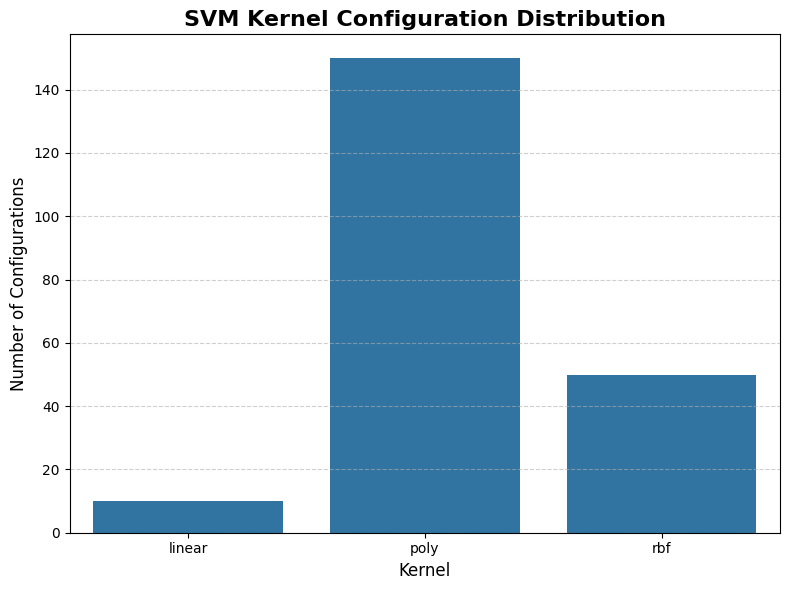

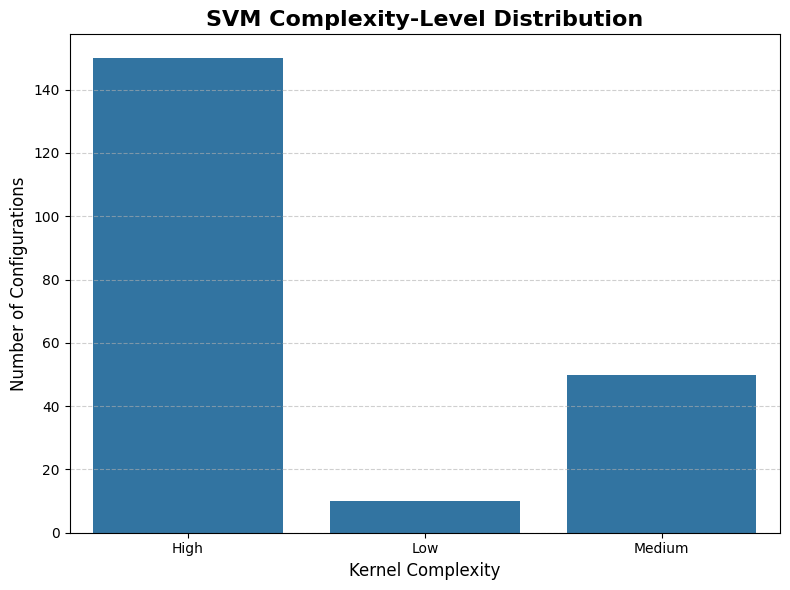

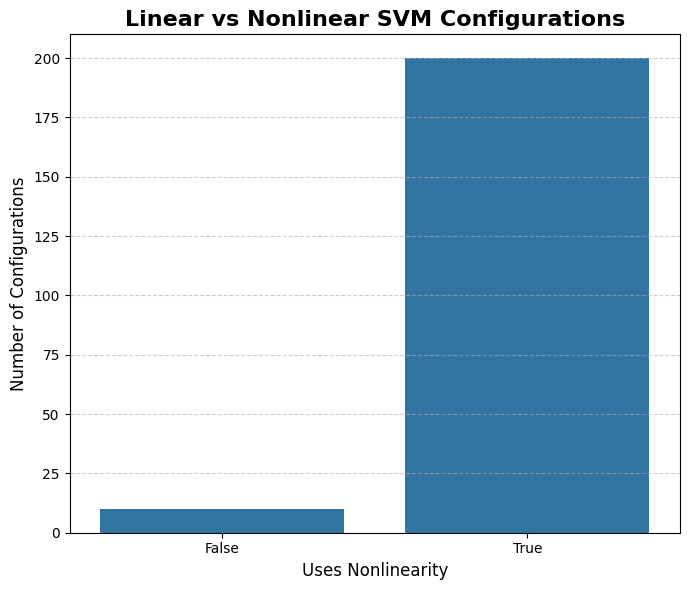


Output objects created:
- svm_analysis_df
- svm_kernel_analysis_df
- svm_complexity_analysis_df
- svm_parameter_coverage_df
- svm_kernel_summary_df

SVM kernel and complexity analysis completed successfully.


In [75]:
# ============================================================
# BOX 73 — SVM Kernel and Complexity Analysis
#
# Purpose:
#   - Analyze SVM kernel families analytically
#   - Evaluate search-space complexity
#   - Compare kernel-related configuration density
#   - Prepare report-ready analytical summaries
#
# Analytical Dimensions:
#   1) Kernel distribution
#   2) Kernel complexity levels
#   3) Regularization coverage
#   4) Gamma coverage
#   5) Polynomial degree coverage
#   6) Class-weight coverage
#
# Notes:
#   - No model training is performed
#   - This box performs only analytical preparation
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "svm_candidate_configurations_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(svm_candidate_configurations_df, pd.DataFrame):
    raise TypeError(
        "svm_candidate_configurations_df must be a pandas DataFrame."
    )

if svm_candidate_configurations_df.empty:
    raise ValueError(
        "svm_candidate_configurations_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Create safe analysis copy
# ------------------------------------------------------------
svm_analysis_df = svm_candidate_configurations_df.copy()

svm_analysis_df["gamma_str"] = (
    svm_analysis_df["gamma"].astype(str)
)

svm_analysis_df["degree_str"] = (
    svm_analysis_df["degree"].astype(str)
)

svm_analysis_df["class_weight_str"] = (
    svm_analysis_df["class_weight"].astype(str)
)

# ------------------------------------------------------------
# Step 2 — Kernel-level configuration analysis
# ------------------------------------------------------------
svm_kernel_analysis_df = (
    svm_analysis_df
    .groupby("kernel")
    .agg(
        Number_of_Configurations=("config_id", "count"),
        Unique_C_Values=("C", "nunique"),
        Unique_Gamma_Values=("gamma_str", "nunique"),
        Unique_Degree_Values=("degree_str", "nunique"),
        Uses_Nonlinearity=("nonlinear", "first")
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 3 — Complexity-level analysis
# ------------------------------------------------------------
svm_complexity_analysis_df = (
    svm_analysis_df
    .groupby("kernel_complexity")
    .agg(
        Number_of_Configurations=("config_id", "count"),
        Average_C=("C", "mean")
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 4 — Parameter coverage analysis
# ------------------------------------------------------------
svm_parameter_coverage = []

svm_parameter_coverage.append({
    "Parameter": "kernel",
    "Number_of_Unique_Values": svm_analysis_df["kernel"].nunique(),
    "Values": ", ".join(
        sorted(
            svm_analysis_df["kernel"].astype(str).unique()
        )
    )
})

svm_parameter_coverage.append({
    "Parameter": "C",
    "Number_of_Unique_Values": svm_analysis_df["C"].nunique(),
    "Values": ", ".join(
        map(
            str,
            sorted(svm_analysis_df["C"].unique())
        )
    )
})

valid_gamma_values = (
    svm_analysis_df[
        svm_analysis_df["gamma_str"] != "not_applicable"
    ]["gamma_str"]
)

svm_parameter_coverage.append({
    "Parameter": "gamma",
    "Number_of_Unique_Values": valid_gamma_values.nunique(),
    "Values": ", ".join(
        sorted(valid_gamma_values.unique())
    )
})

valid_degree_values = (
    svm_analysis_df[
        svm_analysis_df["degree_str"] != "not_applicable"
    ]["degree_str"]
)

svm_parameter_coverage.append({
    "Parameter": "degree",
    "Number_of_Unique_Values": valid_degree_values.nunique(),
    "Values": ", ".join(
        sorted(valid_degree_values.unique())
    )
})

svm_parameter_coverage.append({
    "Parameter": "class_weight",
    "Number_of_Unique_Values": svm_analysis_df["class_weight_str"].nunique(),
    "Values": ", ".join(
        sorted(
            svm_analysis_df["class_weight_str"].unique()
        )
    )
})

svm_parameter_coverage_df = pd.DataFrame(
    svm_parameter_coverage
)

# ------------------------------------------------------------
# Step 5 — Build analytical kernel summary
# ------------------------------------------------------------
svm_kernel_summary = []

for kernel_name in sorted(
    svm_analysis_df["kernel"].unique()
):

    kernel_subset = (
        svm_analysis_df[
            svm_analysis_df["kernel"] == kernel_name
        ]
    )

    svm_kernel_summary.append({

        "kernel":
            kernel_name,

        "Configurations":
            len(kernel_subset),

        "Complexity_Level":
            kernel_subset["kernel_complexity"].iloc[0],

        "Uses_Gamma":
            kernel_name in ["rbf", "poly"],

        "Uses_Degree":
            kernel_name == "poly",

        "Nonlinear":
            kernel_subset["nonlinear"].iloc[0]
    })

svm_kernel_summary_df = pd.DataFrame(
    svm_kernel_summary
)

# ------------------------------------------------------------
# Step 6 — Display analytical reports
# ------------------------------------------------------------
print(
    "SVM kernel and complexity analysis is ready."
)

print("\nKernel-level analysis:")
display(
    svm_kernel_analysis_df
)

print("\nComplexity-level analysis:")
display(
    svm_complexity_analysis_df
)

print("\nParameter coverage analysis:")
display(
    svm_parameter_coverage_df
)

print("\nKernel analytical summary:")
display(
    svm_kernel_summary_df
)

# ------------------------------------------------------------
# Step 7 — Plot kernel distribution
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=svm_kernel_analysis_df,
    x="kernel",
    y="Number_of_Configurations"
)

plt.title(
    "SVM Kernel Configuration Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Kernel", fontsize=12)
plt.ylabel("Number of Configurations", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot complexity distribution
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=svm_complexity_analysis_df,
    x="kernel_complexity",
    y="Number_of_Configurations"
)

plt.title(
    "SVM Complexity-Level Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Kernel Complexity", fontsize=12)
plt.ylabel("Number of Configurations", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot kernel nonlinear behavior
# ------------------------------------------------------------
nonlinear_counts = (
    svm_analysis_df["nonlinear"]
    .value_counts()
    .reset_index()
)

nonlinear_counts.columns = [
    "nonlinear",
    "count"
]

plt.figure(figsize=(7, 6))

sns.barplot(
    data=nonlinear_counts,
    x="nonlinear",
    y="count"
)

plt.title(
    "Linear vs Nonlinear SVM Configurations",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Uses Nonlinearity", fontsize=12)
plt.ylabel("Number of Configurations", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Final confirmation
# ------------------------------------------------------------
print("\nOutput objects created:")
print("- svm_analysis_df")
print("- svm_kernel_analysis_df")
print("- svm_complexity_analysis_df")
print("- svm_parameter_coverage_df")
print("- svm_kernel_summary_df")

print(
    "\nSVM kernel and complexity analysis "
    "completed successfully."
)

In [76]:
# ============================================================
# BOX 74 — SVM Hyperparameter 5-Fold Cross-Validation Evaluation
#
# Purpose:
#   - Evaluate all candidate SVM configurations using
#     Stratified 5-Fold Cross-Validation
#   - Train SVM models on fold-level Min-Max scaled data
#   - Compute fold-level classification metrics
#   - Store configuration-level summary results
#
# Evaluated Hyperparameters:
#   - kernel
#   - C
#   - gamma
#   - degree
#   - class_weight
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "svm_candidate_configurations",
    "compute_binary_classification_metrics"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

if not isinstance(svm_candidate_configurations, list):
    raise TypeError(
        "svm_candidate_configurations must be a list."
    )

if len(svm_candidate_configurations) == 0:
    raise ValueError(
        "svm_candidate_configurations is empty."
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
svm_cv_all_results = []

svm_cv_fold_results = []

# ------------------------------------------------------------
# Step 2 — Evaluate all SVM configurations
# ------------------------------------------------------------
for config in svm_candidate_configurations:

    # --------------------------------------------------------
    # Step 2.1 — Extract configuration information
    # --------------------------------------------------------
    config_id = config["config_id"]

    kernel = config["kernel"]

    C_value = config["C"]

    gamma_value = config["gamma"]

    degree_value = config["degree"]

    class_weight = config["class_weight"]

    random_state = config["random_state"]

    kernel_complexity = config["kernel_complexity"]

    nonlinear = config["nonlinear"]

    # --------------------------------------------------------
    # Step 2.2 — Initialize fold-level storage
    # --------------------------------------------------------
    current_config_fold_metrics = []

    current_config_support_vectors = []

    # --------------------------------------------------------
    # Step 2.3 — Run Stratified 5-Fold CV
    # --------------------------------------------------------
    for fold_data in cv5_scaled_folds:

        fold_number = fold_data["fold_number"]

        X_train = fold_data["X_train_scaled"]

        X_val = fold_data["X_validation_scaled"]

        y_train = fold_data["y_train"]

        y_val = fold_data["y_validation"]

        # ----------------------------------------------------
        # Step 2.4 — Configure kernel-specific SVM model
        # ----------------------------------------------------
        if kernel == "linear":

            svm_model = SVC(
                kernel="linear",
                C=C_value,
                class_weight=class_weight,
                probability=False,
                random_state=random_state
            )

        elif kernel == "rbf":

            svm_model = SVC(
                kernel="rbf",
                C=C_value,
                gamma=gamma_value,
                class_weight=class_weight,
                probability=False,
                random_state=random_state
            )

        elif kernel == "poly":

            svm_model = SVC(
                kernel="poly",
                C=C_value,
                gamma=gamma_value,
                degree=degree_value,
                class_weight=class_weight,
                probability=False,
                random_state=random_state
            )

        else:

            raise ValueError(
                f"Unsupported SVM kernel: {kernel}"
            )

        # ----------------------------------------------------
        # Step 2.5 — Train SVM model
        # ----------------------------------------------------
        svm_model.fit(
            X_train,
            y_train
        )

        # ----------------------------------------------------
        # Step 2.6 — Generate predictions
        # ----------------------------------------------------
        y_pred = svm_model.predict(
            X_val
        )

        # ----------------------------------------------------
        # Step 2.7 — Generate decision scores for AUC
        # ----------------------------------------------------
        y_score = svm_model.decision_function(
            X_val
        )

        # ----------------------------------------------------
        # Step 2.8 — Compute evaluation metrics
        # ----------------------------------------------------
        fold_metrics = compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )

        # ----------------------------------------------------
        # Step 2.9 — Extract support-vector information
        # ----------------------------------------------------
        total_support_vectors = int(
            np.sum(svm_model.n_support_)
        )

        support_vector_ratio = (
            total_support_vectors
            / X_train.shape[0]
        )

        current_config_support_vectors.append(
            total_support_vectors
        )

        # ----------------------------------------------------
        # Step 2.10 — Build fold-level result row
        # ----------------------------------------------------
        fold_result_row = {

            "Config_ID":
                config_id,

            "Fold":
                fold_number,

            "kernel":
                kernel,

            "C":
                C_value,

            "gamma":
                gamma_value,

            "degree":
                degree_value,

            "class_weight":
                str(class_weight),

            "kernel_complexity":
                kernel_complexity,

            "nonlinear":
                nonlinear,

            "total_support_vectors":
                total_support_vectors,

            "support_vector_ratio":
                support_vector_ratio,

            "Accuracy":
                fold_metrics["Accuracy"],

            "Sensitivity":
                fold_metrics["Sensitivity"],

            "Specificity":
                fold_metrics["Specificity"],

            "Precision":
                fold_metrics["Precision"],

            "F1-score":
                fold_metrics["F1-score"],

            "AUC":
                fold_metrics["AUC"],

            "TP":
                fold_metrics["TP"],

            "FP":
                fold_metrics["FP"],

            "FN":
                fold_metrics["FN"],

            "TN":
                fold_metrics["TN"]
        }

        current_config_fold_metrics.append(
            fold_result_row
        )

        svm_cv_fold_results.append(
            fold_result_row
        )

    # --------------------------------------------------------
    # Step 2.11 — Convert current configuration results
    # --------------------------------------------------------
    current_config_df = pd.DataFrame(
        current_config_fold_metrics
    )

    # --------------------------------------------------------
    # Step 2.12 — Compute configuration-level summary
    # --------------------------------------------------------
    config_summary_row = {

        "Config_ID":
            config_id,

        "kernel":
            kernel,

        "C":
            C_value,

        "gamma":
            gamma_value,

        "degree":
            degree_value,

        "class_weight":
            str(class_weight),

        "kernel_complexity":
            kernel_complexity,

        "nonlinear":
            nonlinear,

        "Mean_Accuracy":
            current_config_df["Accuracy"].mean(),

        "Std_Accuracy":
            current_config_df["Accuracy"].std(),

        "Mean_Sensitivity":
            current_config_df["Sensitivity"].mean(),

        "Std_Sensitivity":
            current_config_df["Sensitivity"].std(),

        "Mean_Specificity":
            current_config_df["Specificity"].mean(),

        "Std_Specificity":
            current_config_df["Specificity"].std(),

        "Mean_Precision":
            current_config_df["Precision"].mean(),

        "Std_Precision":
            current_config_df["Precision"].std(),

        "Mean_F1-score":
            current_config_df["F1-score"].mean(),

        "Std_F1-score":
            current_config_df["F1-score"].std(),

        "Mean_AUC":
            current_config_df["AUC"].mean(),

        "Std_AUC":
            current_config_df["AUC"].std(),

        "Min_AUC":
            current_config_df["AUC"].min(),

        "Max_AUC":
            current_config_df["AUC"].max(),

        "Mean_Support_Vectors":
            current_config_df[
                "total_support_vectors"
            ].mean(),

        "Std_Support_Vectors":
            current_config_df[
                "total_support_vectors"
            ].std(),

        "Mean_Support_Vector_Ratio":
            current_config_df[
                "support_vector_ratio"
            ].mean()
    }

    svm_cv_all_results.append(
        config_summary_row
    )

# ------------------------------------------------------------
# Step 3 — Create final DataFrames
# ------------------------------------------------------------
svm_cv_fold_results_df = pd.DataFrame(
    svm_cv_fold_results
)

svm_cv_summary_results_df = pd.DataFrame(
    svm_cv_all_results
)

# ------------------------------------------------------------
# Step 4 — Sort configurations analytically
# ------------------------------------------------------------
svm_cv_summary_results_df = (
    svm_cv_summary_results_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Mean_Support_Vector_Ratio"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 5 — Create rounded display table
# ------------------------------------------------------------
display_metric_columns = [
    col for col in svm_cv_summary_results_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
        or "Ratio" in col
    )
]

svm_cv_summary_display_df = (
    svm_cv_summary_results_df.copy()
)

svm_cv_summary_display_df[
    display_metric_columns
] = (
    svm_cv_summary_display_df[
        display_metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 6 — Display evaluation summary
# ------------------------------------------------------------
print(
    "SVM hyperparameter evaluation completed."
)

print("\nTotal evaluated configurations:")
print(
    len(svm_cv_summary_results_df)
)

print("\nTotal fold-level evaluations:")
print(
    len(svm_cv_fold_results_df)
)

print("\nTop configurations:")
display(
    svm_cv_summary_display_df.head(10)
)

print("\nFold-level results sample:")
display(
    svm_cv_fold_results_df.head(10)
)

print(
    "\nSVM 5-Fold hyperparameter evaluation "
    "completed successfully."
)

SVM hyperparameter evaluation completed.

Total evaluated configurations:
210

Total fold-level evaluations:
1050

Top configurations:


,Config_ID,kernel,C,gamma,degree,class_weight,kernel_complexity,nonlinear,Mean_Accuracy,Std_Accuracy,...,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Support_Vectors,Std_Support_Vectors,Mean_Support_Vector_Ratio
0,SVM_CFG_145,poly,1.0,1,2,None,High,True,0.978932,0.013285,...,0.012738,0.970830,0.019036,0.996102,0.006419,0.984788,0.999672,48.8,3.114482,0.107205
1,SVM_CFG_199,poly,100.0,0.1,2,None,High,True,0.978932,0.013285,...,0.012738,0.970830,0.019036,0.996102,0.006419,0.984788,0.999672,48.8,3.114482,0.107205
2,SVM_CFG_146,poly,1.0,1,2,balanced,High,True,0.973669,0.013845,...,0.028551,0.964096,0.019790,0.996036,0.005999,0.985450,0.999669,53.6,4.393177,0.117749
3,SVM_CFG_200,poly,100.0,0.1,2,balanced,High,True,0.973669,0.013845,...,0.028551,0.964096,0.019790,0.996036,0.005999,0.985450,0.999669,53.6,4.393177,0.117749
4,SVM_CFG_8,linear,10.0,not_applicable,not_applicable,balanced,Low,False,0.973669,0.013845,...,0.018783,0.964238,0.019294,0.995969,0.006458,0.984458,0.999669,48.2,5.357238,0.105885
5,SVM_CFG_121,poly,1.0,scale,2,None,High,True,0.978932,0.013285,...,0.012738,0.970830,0.019036,0.995903,0.007018,0.983466,0.999672,48.0,2.828427,0.105446
6,SVM_CFG_94,poly,0.1,scale,3,balanced,High,True,0.973669,0.012378,...,0.031608,0.964092,0.017210,0.995839,0.006277,0.984788,0.999669,63.0,2.915476,0.138400
7,SVM_CFG_118,poly,0.1,1,3,balanced,High,True,0.973669,0.012378,...,0.031608,0.964092,0.017210,0.995838,0.005937,0.985450,0.999669,65.6,3.781534,0.144111
8,SVM_CFG_202,poly,100.0,0.1,3,balanced,High,True,0.973669,0.012378,...,0.031608,0.964092,0.017210,0.995838,0.005937,0.985450,0.999669,65.6,3.781534,0.144111
9,SVM_CFG_93,poly,0.1,scale,3,None,High,True,0.978932,0.014662,...,0.012738,0.970833,0.020935,0.995710,0.005644,0.986111,0.999339,57.6,2.073644,0.126536



Fold-level results sample:


,Config_ID,Fold,kernel,C,gamma,degree,class_weight,kernel_complexity,nonlinear,total_support_vectors,...,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,SVM_CFG_1,1,linear,0.01,not_applicable,not_applicable,None,Low,False,313,...,0.868421,0.651163,1.000000,1.000000,0.788732,0.996069,28,0,15,71
1,SVM_CFG_1,2,linear,0.01,not_applicable,not_applicable,None,Low,False,310,...,0.824561,0.534884,1.000000,1.000000,0.696970,0.975762,23,0,20,71
2,SVM_CFG_1,3,linear,0.01,not_applicable,not_applicable,None,Low,False,320,...,0.850877,0.595238,1.000000,1.000000,0.746269,0.981151,25,0,17,72
3,SVM_CFG_1,4,linear,0.01,not_applicable,not_applicable,None,Low,False,317,...,0.885965,0.690476,1.000000,1.000000,0.816901,0.989087,29,0,13,72
4,SVM_CFG_1,5,linear,0.01,not_applicable,not_applicable,None,Low,False,315,...,0.893805,0.714286,1.000000,1.000000,0.833333,0.993628,30,0,12,71
5,SVM_CFG_2,1,linear,0.01,not_applicable,not_applicable,balanced,Low,False,362,...,0.973684,0.953488,0.985915,0.976190,0.964706,0.996069,41,1,2,70
6,SVM_CFG_2,2,linear,0.01,not_applicable,not_applicable,balanced,Low,False,361,...,0.912281,0.813953,0.971831,0.945946,0.875000,0.973469,35,2,8,69
7,SVM_CFG_2,3,linear,0.01,not_applicable,not_applicable,balanced,Low,False,363,...,0.921053,0.809524,0.986111,0.971429,0.883117,0.979828,34,1,8,71
8,SVM_CFG_2,4,linear,0.01,not_applicable,not_applicable,balanced,Low,False,370,...,0.947368,0.857143,1.000000,1.000000,0.923077,0.986772,36,0,6,72
9,SVM_CFG_2,5,linear,0.01,not_applicable,not_applicable,balanced,Low,False,357,...,0.946903,0.857143,1.000000,1.000000,0.923077,0.992622,36,0,6,71



SVM 5-Fold hyperparameter evaluation completed successfully.


In [77]:
# ============================================================
# BOX 75 — SVM Hyperparameter Analytical Reporting
#
# Purpose:
#   - Perform analytical ranking of SVM configurations
#   - Compare kernel performance, stability, and complexity
#   - Analyze support-vector behavior
#   - Create report-ready analytical tables
#
# Analytical Ranking Criteria:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Lower Mean_Support_Vector_Ratio
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "svm_cv_summary_results_df",
    "svm_cv_fold_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(svm_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "svm_cv_summary_results_df must be a pandas DataFrame."
    )

if not isinstance(svm_cv_fold_results_df, pd.DataFrame):
    raise TypeError(
        "svm_cv_fold_results_df must be a pandas DataFrame."
    )

if svm_cv_summary_results_df.empty:
    raise ValueError(
        "svm_cv_summary_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Create analytical ranked results table
# ------------------------------------------------------------
svm_ranked_results_df = (
    svm_cv_summary_results_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Mean_Support_Vector_Ratio"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

svm_ranked_results_df.insert(
    0,
    "Rank",
    np.arange(
        1,
        len(svm_ranked_results_df) + 1
    )
)

# ------------------------------------------------------------
# Step 2 — Create compact analytical table
# ------------------------------------------------------------
compact_columns = [
    "Rank",
    "Config_ID",
    "kernel",
    "C",
    "gamma",
    "degree",
    "class_weight",
    "kernel_complexity",
    "nonlinear",
    "Mean_Accuracy",
    "Std_Accuracy",
    "Mean_Sensitivity",
    "Std_Sensitivity",
    "Mean_Specificity",
    "Std_Specificity",
    "Mean_F1-score",
    "Std_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Support_Vectors",
    "Mean_Support_Vector_Ratio"
]

missing_compact_columns = [
    col for col in compact_columns
    if col not in svm_ranked_results_df.columns
]

if len(missing_compact_columns) > 0:
    raise ValueError(
        f"Missing compact columns: {missing_compact_columns}"
    )

svm_compact_results_df = (
    svm_ranked_results_df[
        compact_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 3 — Create rounded display version
# ------------------------------------------------------------
svm_compact_display_df = (
    svm_compact_results_df.copy()
)

numeric_columns = [
    col for col in svm_compact_display_df.columns
    if col not in [
        "Config_ID",
        "kernel",
        "gamma",
        "degree",
        "class_weight",
        "kernel_complexity",
        "nonlinear"
    ]
]

svm_compact_display_df[
    numeric_columns
] = (
    svm_compact_display_df[
        numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 4 — Extract best candidate configuration
# ------------------------------------------------------------
best_svm_configuration_df = (
    svm_ranked_results_df
    .head(1)
    .copy()
)

# ------------------------------------------------------------
# Step 5 — Stability analysis
# ------------------------------------------------------------
svm_stability_analysis_df = (
    svm_ranked_results_df
    .sort_values(
        by=[
            "Std_AUC",
            "Std_Accuracy",
            "Std_F1-score",
            "Mean_AUC"
        ],
        ascending=[
            True,
            True,
            True,
            False
        ]
    )
    .reset_index(drop=True)
)

stability_columns = [
    "Config_ID",
    "kernel",
    "C",
    "gamma",
    "degree",
    "class_weight",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Accuracy",
    "Std_Accuracy",
    "Mean_F1-score",
    "Std_F1-score",
    "Mean_Support_Vector_Ratio"
]

svm_stability_analysis_df = (
    svm_stability_analysis_df[
        stability_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 6 — Performance trade-off analysis
# ------------------------------------------------------------
tradeoff_columns = [
    "Config_ID",
    "kernel",
    "C",
    "gamma",
    "degree",
    "class_weight",
    "Mean_AUC",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Std_AUC",
    "Mean_Support_Vector_Ratio"
]

svm_tradeoff_analysis_df = (
    svm_ranked_results_df[
        tradeoff_columns
    ]
    .head(10)
    .copy()
)

# ------------------------------------------------------------
# Step 7 — Kernel-level performance summary
# ------------------------------------------------------------
svm_kernel_performance_summary_df = (
    svm_ranked_results_df
    .groupby("kernel")
    .agg(
        Number_of_Configurations=(
            "Config_ID",
            "count"
        ),
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Average=(
            "Mean_Sensitivity",
            "mean"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Average=(
            "Mean_F1-score",
            "mean"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Average=(
            "Std_AUC",
            "mean"
        ),
        Std_AUC_Min=(
            "Std_AUC",
            "min"
        ),
        Mean_Support_Vector_Ratio_Average=(
            "Mean_Support_Vector_Ratio",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 8 — Class-weight summary
# ------------------------------------------------------------
svm_class_weight_summary_df = (
    svm_ranked_results_df
    .groupby("class_weight")
    .agg(
        Number_of_Configurations=(
            "Config_ID",
            "count"
        ),
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Average=(
            "Mean_Sensitivity",
            "mean"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Average=(
            "Mean_F1-score",
            "mean"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Average=(
            "Std_AUC",
            "mean"
        ),
        Mean_Support_Vector_Ratio_Average=(
            "Mean_Support_Vector_Ratio",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 9 — C-level summary
# ------------------------------------------------------------
svm_c_summary_df = (
    svm_ranked_results_df
    .groupby("C")
    .agg(
        Number_of_Configurations=(
            "Config_ID",
            "count"
        ),
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Average=(
            "Mean_Sensitivity",
            "mean"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Average=(
            "Mean_F1-score",
            "mean"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Average=(
            "Std_AUC",
            "mean"
        ),
        Mean_Support_Vector_Ratio_Average=(
            "Mean_Support_Vector_Ratio",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Average"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 10 — Kernel-gamma summary for nonlinear kernels
# ------------------------------------------------------------
svm_nonlinear_subset_df = (
    svm_ranked_results_df[
        svm_ranked_results_df["kernel"].isin(
            ["rbf", "poly"]
        )
    ]
    .copy()
)

svm_kernel_gamma_summary_df = (
    svm_nonlinear_subset_df
    .groupby(
        [
            "kernel",
            "gamma"
        ]
    )
    .agg(
        Number_of_Configurations=(
            "Config_ID",
            "count"
        ),
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Std_AUC_Min=(
            "Std_AUC",
            "min"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 11 — Display analytical reports
# ------------------------------------------------------------
print(
    "SVM analytical reporting tables are ready."
)

print("\nAnalytical ranking criteria:")
print("1. Mean_AUC")
print("2. Mean_Sensitivity")
print("3. Mean_F1-score")
print("4. Std_AUC")
print("5. Mean_Support_Vector_Ratio")

print("\nTop 15 configurations:")

display(
    svm_compact_display_df
    .head(15)
    .style
    .set_caption(
        "SVM Hyperparameter Cross-Validation Analysis"
    )
    .background_gradient(
        subset=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score"
        ],
        cmap="Greens"
    )
    .background_gradient(
        subset=[
            "Std_AUC",
            "Mean_Support_Vector_Ratio"
        ],
        cmap="Reds_r"
    )
)

print("\nBest SVM candidate configuration:")

display(
    best_svm_configuration_df.round(6)
)

print("\nMost stable configurations:")

display(
    svm_stability_analysis_df
    .head(10)
    .round(6)
)

print("\nPerformance trade-off analysis:")

display(
    svm_tradeoff_analysis_df
    .round(6)
)

print("\nKernel-level performance summary:")

display(
    svm_kernel_performance_summary_df
    .round(6)
)

print("\nClass-weight summary:")

display(
    svm_class_weight_summary_df
    .round(6)
)

print("\nC-level summary:")

display(
    svm_c_summary_df
    .round(6)
)

print("\nKernel-gamma summary:")

display(
    svm_kernel_gamma_summary_df
    .round(6)
)

print(
    "\nSVM analytical reporting "
    "completed successfully."
)

SVM analytical reporting tables are ready.

Analytical ranking criteria:
1. Mean_AUC
2. Mean_Sensitivity
3. Mean_F1-score
4. Std_AUC
5. Mean_Support_Vector_Ratio

Top 15 configurations:


,Rank,Config_ID,kernel,C,gamma,degree,class_weight,kernel_complexity,nonlinear,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Mean_Support_Vectors,Mean_Support_Vector_Ratio
0,1,SVM_CFG_145,poly,1.000000,1,2,None,High,True,0.978932,0.013285,0.952935,0.044033,0.994405,0.007661,0.970830,0.019036,0.996102,0.006419,48.800000,0.107205
1,2,SVM_CFG_199,poly,100.000000,0.100000,2,None,High,True,0.978932,0.013285,0.952935,0.044033,0.994405,0.007661,0.970830,0.019036,0.996102,0.006419,48.800000,0.107205
2,3,SVM_CFG_146,poly,1.000000,1,2,balanced,High,True,0.973669,0.013845,0.957586,0.048207,0.983216,0.018312,0.964096,0.019790,0.996036,0.005999,53.600000,0.117749
3,4,SVM_CFG_200,poly,100.000000,0.100000,2,balanced,High,True,0.973669,0.013845,0.957586,0.048207,0.983216,0.018312,0.964096,0.019790,0.996036,0.005999,53.600000,0.117749
4,5,SVM_CFG_8,linear,10.000000,not_applicable,not_applicable,balanced,Low,False,0.973669,0.013845,0.957697,0.038455,0.983216,0.011703,0.964238,0.019294,0.995969,0.006458,48.200000,0.105885
5,6,SVM_CFG_121,poly,1.000000,scale,2,None,High,True,0.978932,0.013285,0.952935,0.044033,0.994405,0.007661,0.970830,0.019036,0.995903,0.007018,48.000000,0.105446
6,7,SVM_CFG_94,poly,0.100000,scale,3,balanced,High,True,0.973669,0.012378,0.952935,0.044033,0.985994,0.019850,0.964092,0.017210,0.995839,0.006277,63.000000,0.138400
7,8,SVM_CFG_118,poly,0.100000,1,3,balanced,High,True,0.973669,0.012378,0.952935,0.044033,0.985994,0.019850,0.964092,0.017210,0.995838,0.005937,65.600000,0.144111
8,9,SVM_CFG_202,poly,100.000000,0.100000,3,balanced,High,True,0.973669,0.012378,0.952935,0.044033,0.985994,0.019850,0.964092,0.017210,0.995838,0.005937,65.600000,0.144111
9,10,SVM_CFG_93,poly,0.100000,scale,3,None,High,True,0.978932,0.014662,0.953045,0.046655,0.994405,0.007661,0.970833,0.020935,0.995710,0.005644,57.600000,0.126536



Best SVM candidate configuration:


,Rank,Config_ID,kernel,C,gamma,degree,class_weight,kernel_complexity,nonlinear,Mean_Accuracy,...,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Support_Vectors,Std_Support_Vectors,Mean_Support_Vector_Ratio
0,1,SVM_CFG_145,poly,1.0,1,2,None,High,True,0.978932,...,0.012738,0.97083,0.019036,0.996102,0.006419,0.984788,0.999672,48.8,3.114482,0.107205



Most stable configurations:


,Config_ID,kernel,C,gamma,degree,class_weight,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_F1-score,Std_F1-score,Mean_Support_Vector_Ratio
0,SVM_CFG_90,poly,0.01,1,4,balanced,0.995182,0.005381,0.968374,0.011743,0.956021,0.017096,0.186294
1,SVM_CFG_204,poly,100.00,0.1,4,balanced,0.995182,0.005381,0.968374,0.011743,0.956021,0.017096,0.186732
2,SVM_CFG_50,rbf,10.00,1,not_applicable,balanced,0.995576,0.005572,0.970160,0.018167,0.960196,0.024479,0.146748
3,SVM_CFG_49,rbf,10.00,1,not_applicable,None,0.995707,0.005604,0.977162,0.018179,0.969109,0.024153,0.147622
4,SVM_CFG_93,poly,0.10,scale,3,None,0.995710,0.005644,0.978932,0.014662,0.970833,0.020935,0.126536
5,SVM_CFG_65,poly,0.01,scale,4,None,0.994918,0.005713,0.959603,0.021087,0.942288,0.031919,0.156856
6,SVM_CFG_173,poly,10.00,0.1,4,None,0.989890,0.005772,0.936733,0.019006,0.906340,0.030939,0.293063
7,SVM_CFG_117,poly,0.10,1,3,None,0.995512,0.005807,0.977177,0.013283,0.968424,0.019039,0.133128
8,SVM_CFG_201,poly,100.00,0.1,3,None,0.995512,0.005807,0.977177,0.013283,0.968424,0.019039,0.133128
9,SVM_CFG_89,poly,0.01,1,4,None,0.994983,0.005877,0.963111,0.022679,0.947313,0.033671,0.166961



Performance trade-off analysis:


,Config_ID,kernel,C,gamma,degree,class_weight,Mean_AUC,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Std_AUC,Mean_Support_Vector_Ratio
0,SVM_CFG_145,poly,1.0,1,2,None,0.996102,0.952935,0.994405,0.970830,0.006419,0.107205
1,SVM_CFG_199,poly,100.0,0.1,2,None,0.996102,0.952935,0.994405,0.970830,0.006419,0.107205
2,SVM_CFG_146,poly,1.0,1,2,balanced,0.996036,0.957586,0.983216,0.964096,0.005999,0.117749
3,SVM_CFG_200,poly,100.0,0.1,2,balanced,0.996036,0.957586,0.983216,0.964096,0.005999,0.117749
4,SVM_CFG_8,linear,10.0,not_applicable,not_applicable,balanced,0.995969,0.957697,0.983216,0.964238,0.006458,0.105885
5,SVM_CFG_121,poly,1.0,scale,2,None,0.995903,0.952935,0.994405,0.970830,0.007018,0.105446
6,SVM_CFG_94,poly,0.1,scale,3,balanced,0.995839,0.952935,0.985994,0.964092,0.006277,0.138400
7,SVM_CFG_118,poly,0.1,1,3,balanced,0.995838,0.952935,0.985994,0.964092,0.005937,0.144111
8,SVM_CFG_202,poly,100.0,0.1,3,balanced,0.995838,0.952935,0.985994,0.964092,0.005937,0.144111
9,SVM_CFG_93,poly,0.1,scale,3,None,0.995710,0.953045,0.994405,0.970833,0.005644,0.126536



Kernel-level performance summary:


,kernel,Number_of_Configurations,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min,Mean_Support_Vector_Ratio_Average
1,poly,150,0.985292,0.996102,0.586980,0.957697,0.578647,0.970939,0.012212,0.005381,0.496163
0,linear,10,0.992358,0.995969,0.901019,0.962348,0.935607,0.971510,0.008424,0.006391,0.289894
2,rbf,50,0.990232,0.995707,0.730288,0.971650,0.736592,0.971568,0.007834,0.005572,0.472742



Class-weight summary:


,class_weight,Number_of_Configurations,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Mean_Support_Vector_Ratio_Average
0,None,105,0.987152,0.996102,0.552522,0.966888,0.579747,0.971568,0.010834,0.424801
1,balanced,105,0.986458,0.996036,0.719589,0.971650,0.686755,0.971510,0.011145,0.536727



C-level summary:


,C,Number_of_Configurations,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Mean_Support_Vector_Ratio_Average
4,100.00,42,0.987758,0.996102,0.730222,0.966999,0.741490,0.971409,0.012179,0.306646
2,1.00,42,0.987836,0.996102,0.669288,0.962458,0.667641,0.971510,0.010551,0.458250
3,10.00,42,0.988077,0.995969,0.740413,0.971650,0.737825,0.971568,0.011484,0.373692
1,0.10,42,0.985741,0.995839,0.567389,0.953045,0.568178,0.970833,0.010664,0.573406
0,0.01,42,0.984614,0.995182,0.472966,0.938760,0.451121,0.960897,0.010068,0.691826



Kernel-gamma summary:


,kernel,gamma,Number_of_Configurations,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Max,Std_AUC_Min
3,poly,1,30,0.991146,0.996102,0.957697,0.005381
2,poly,0.1,30,0.986628,0.996102,0.957586,0.005381
4,poly,scale,30,0.990941,0.995903,0.957586,0.005644
8,rbf,1,10,0.991455,0.995707,0.966999,0.005572
9,rbf,scale,10,0.991369,0.995510,0.971650,0.005896
7,rbf,0.1,10,0.991658,0.995506,0.967110,0.005914
6,rbf,0.01,10,0.989355,0.995248,0.957697,0.006189
5,rbf,0.001,10,0.987325,0.994130,0.957697,0.006189
1,poly,0.01,30,0.979301,0.991483,0.882060,0.006556
0,poly,0.001,30,0.978446,0.981399,0.447619,0.011993



SVM analytical reporting completed successfully.


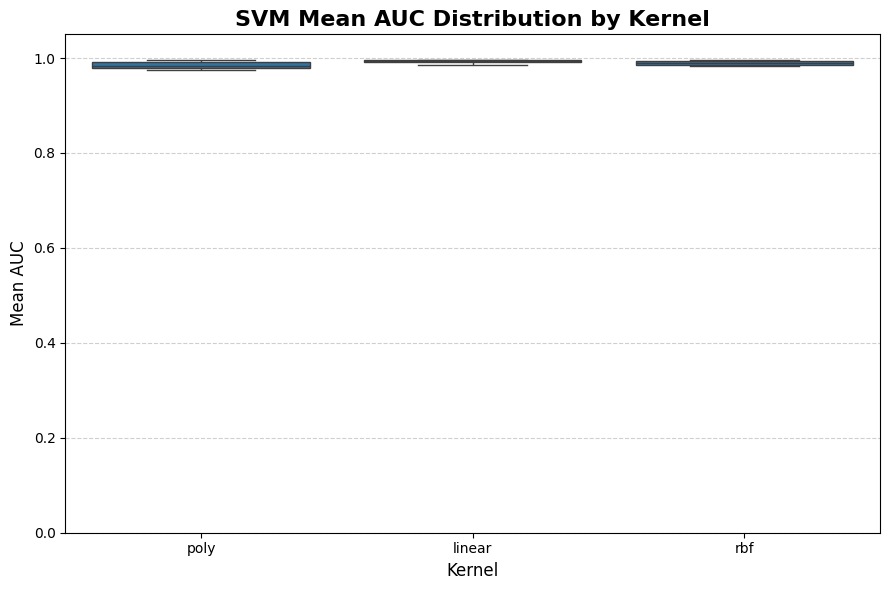

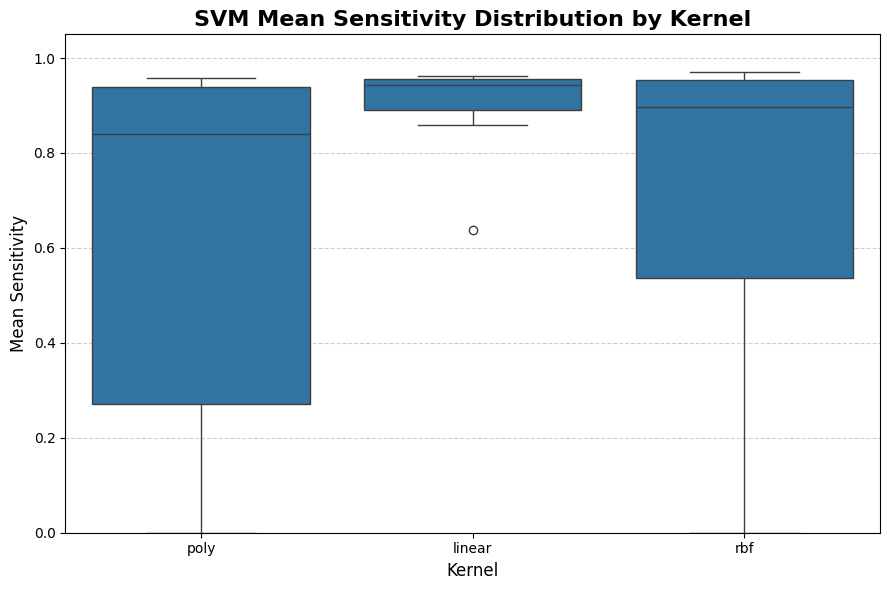

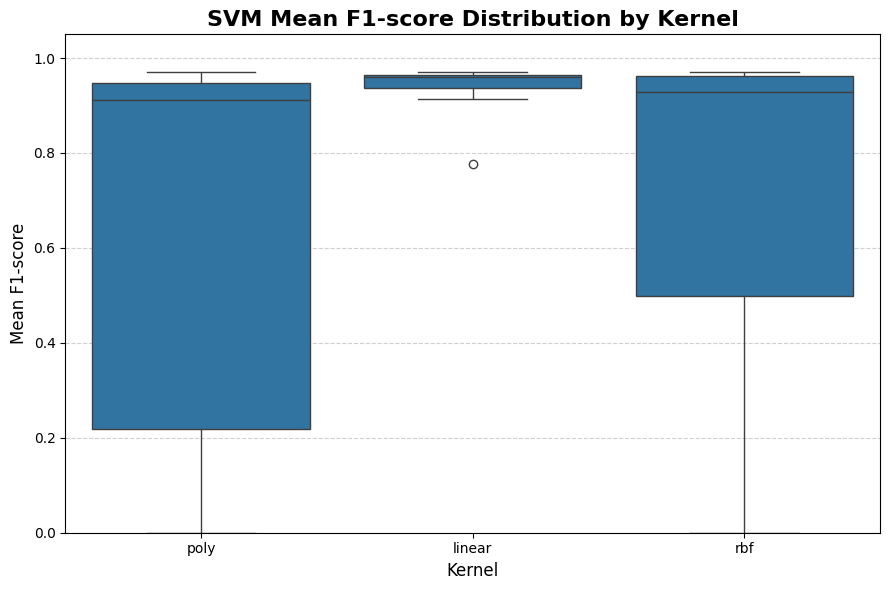

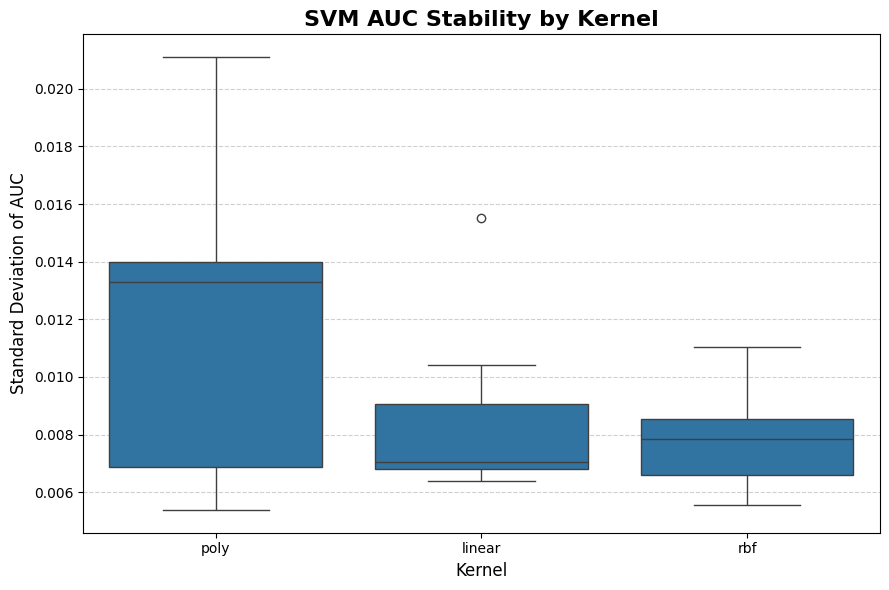

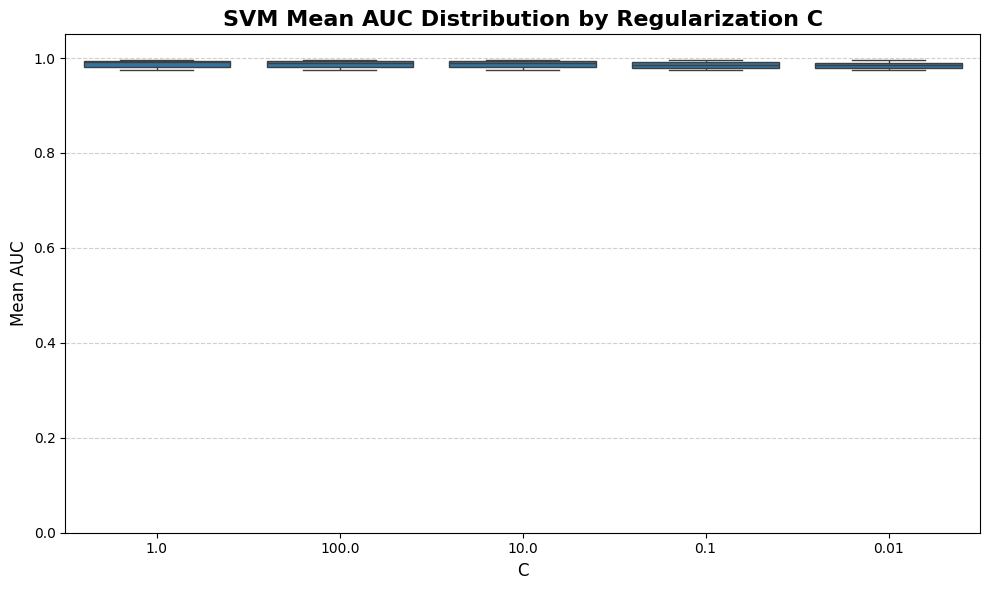

...

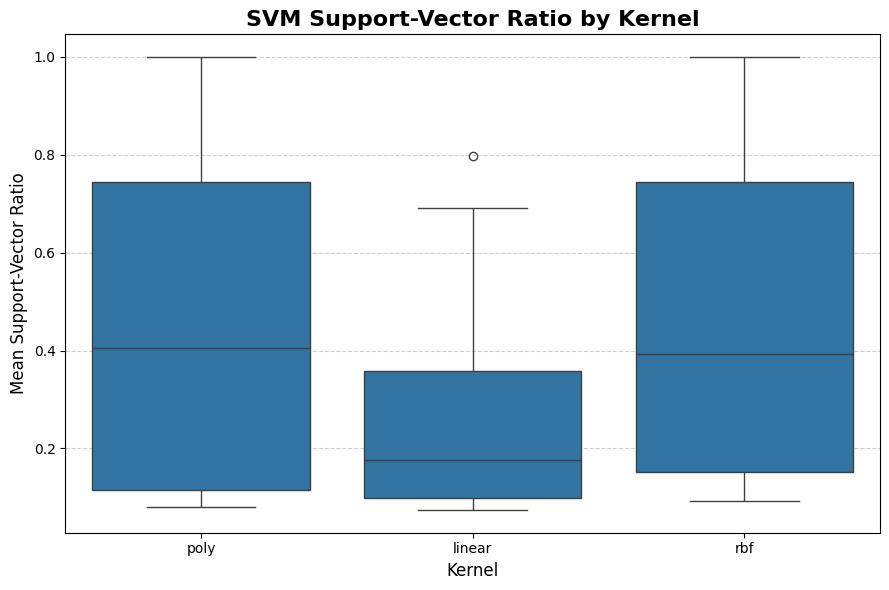

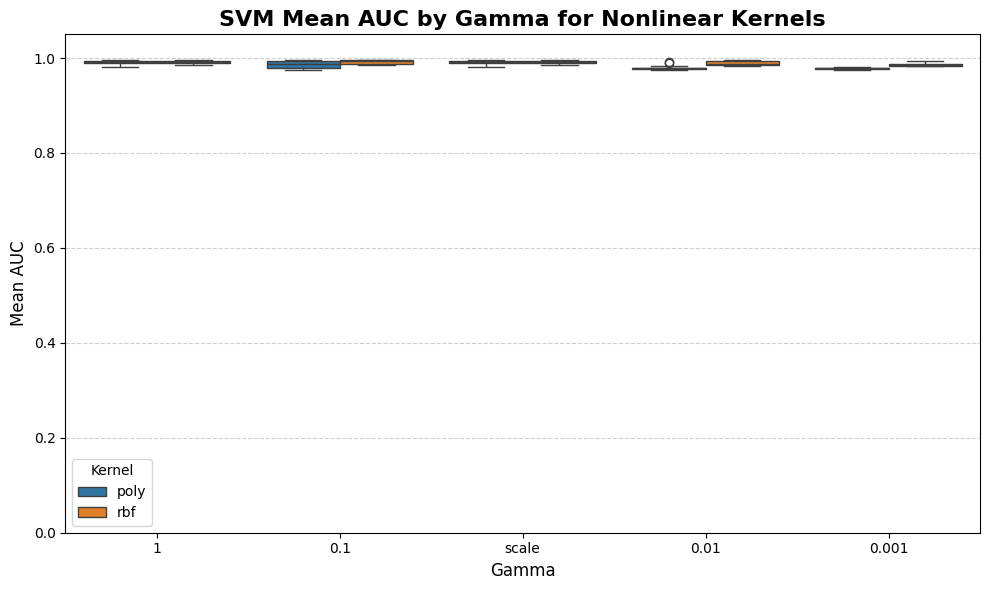

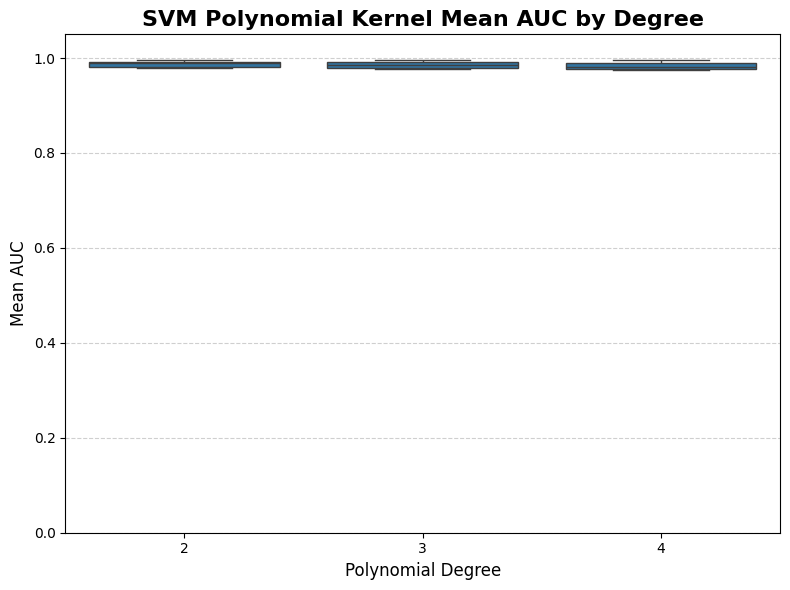

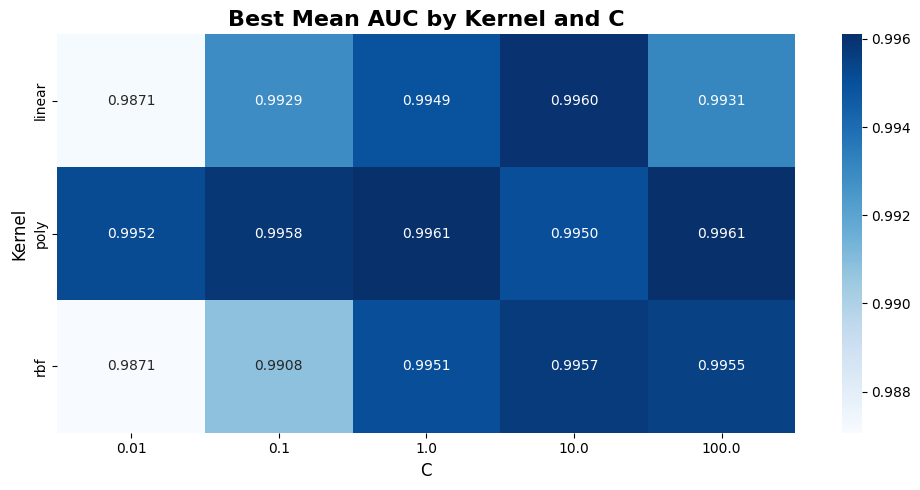

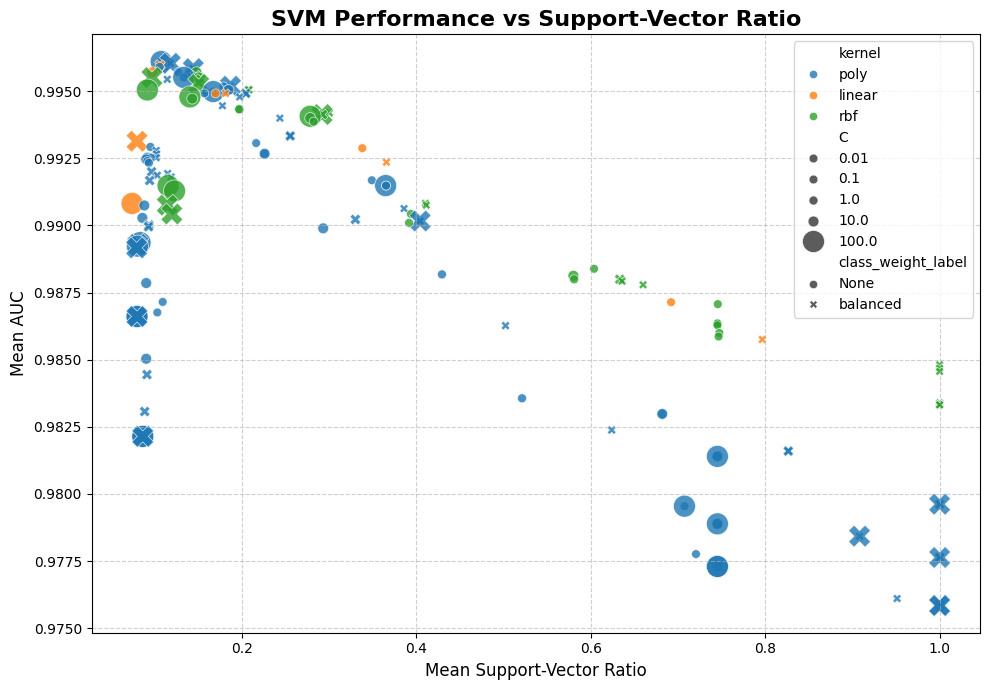

SVM kernel comparison:


,kernel,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Mean_Accuracy_Average,Mean_Accuracy_Max,Std_AUC_Average,Std_AUC_Min,Mean_Support_Vector_Ratio
1,poly,0.985292,0.996102,0.586980,0.957697,0.578647,0.970939,0.797371,0.978932,0.012212,0.005381,0.496163
0,linear,0.992358,0.995969,0.901019,0.962348,0.935607,0.971510,0.956445,0.978932,0.008424,0.006391,0.289894
2,rbf,0.990232,0.995707,0.730288,0.971650,0.736592,0.971568,0.869228,0.978932,0.007834,0.005572,0.472742



SVM C comparison:


,C,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min,Mean_Support_Vector_Ratio
4,100.00,0.987758,0.996102,0.730222,0.966999,0.741490,0.971409,0.012179,0.005381,0.306646
2,1.00,0.987836,0.996102,0.669288,0.962458,0.667641,0.971510,0.010551,0.005999,0.458250
3,10.00,0.988077,0.995969,0.740413,0.971650,0.737825,0.971568,0.011484,0.005572,0.373692
1,0.10,0.985741,0.995839,0.567389,0.953045,0.568178,0.970833,0.010664,0.005644,0.573406
0,0.01,0.984614,0.995182,0.472966,0.938760,0.451121,0.960897,0.010068,0.005381,0.691826



SVM class-weight comparison:


,class_weight_label,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min,Mean_Support_Vector_Ratio
0,None,0.987152,0.996102,0.552522,0.966888,0.579747,0.971568,0.010834,0.005604,0.424801
1,balanced,0.986458,0.996036,0.719589,0.971650,0.686755,0.971510,0.011145,0.005381,0.536727


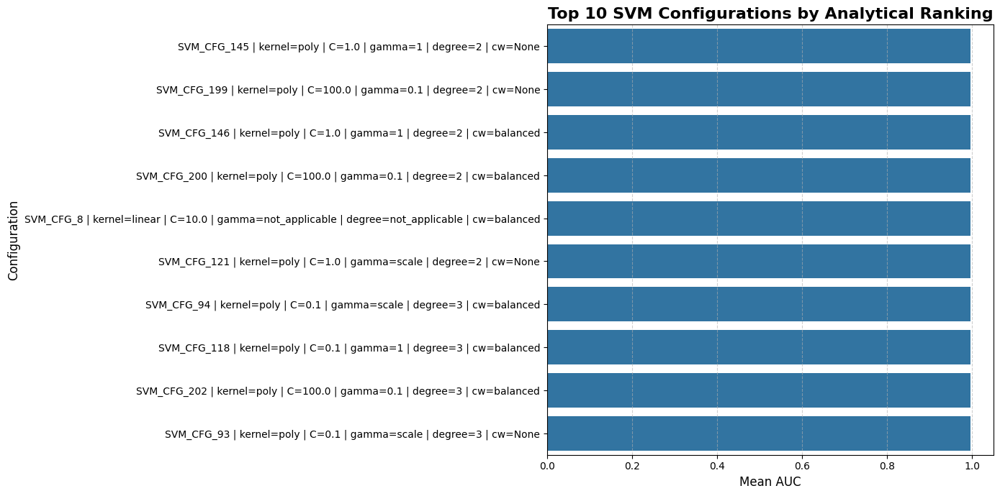


SVM hyperparameter selection plots completed successfully.


In [78]:
# ============================================================
# BOX 76 — SVM Hyperparameter Selection Plots
#
# Purpose:
#   - Visualize SVM hyperparameter search results
#   - Analyze performance trends across:
#         1) kernel
#         2) C
#         3) gamma
#         4) degree
#         5) class_weight
#   - Support fully analytical hyperparameter selection
#
# Visual Outputs:
#   1) Mean AUC by kernel
#   2) Mean Sensitivity by kernel
#   3) Mean F1-score by kernel
#   4) Std AUC by kernel
#   5) Mean AUC by C
#   6) Mean AUC by class_weight
#   7) Support-vector ratio by kernel
#   8) Top 10 configurations by analytical ranking
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "svm_ranked_results_df",
    "svm_cv_summary_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(svm_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "svm_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(svm_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "svm_cv_summary_results_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Prepare plotting DataFrame
# ------------------------------------------------------------
svm_plot_df = svm_cv_summary_results_df.copy()

required_plot_columns = [
    "Config_ID",
    "kernel",
    "C",
    "gamma",
    "degree",
    "class_weight",
    "kernel_complexity",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Sensitivity",
    "Mean_F1-score",
    "Mean_Accuracy",
    "Mean_Support_Vector_Ratio"
]

missing_plot_columns = [
    col for col in required_plot_columns
    if col not in svm_plot_df.columns
]

if len(missing_plot_columns) > 0:
    raise ValueError(
        f"Missing required plot columns: {missing_plot_columns}"
    )

# ------------------------------------------------------------
# Step 2 — Create readable categorical labels
# ------------------------------------------------------------
svm_plot_df["C_label"] = svm_plot_df["C"].astype(str)

svm_plot_df["gamma_label"] = svm_plot_df["gamma"].astype(str)

svm_plot_df["degree_label"] = svm_plot_df["degree"].astype(str)

svm_plot_df["class_weight_label"] = (
    svm_plot_df["class_weight"].astype(str)
)

# ------------------------------------------------------------
# Step 3 — Plot Mean AUC by kernel
# ------------------------------------------------------------
plt.figure(figsize=(9, 6))

sns.boxplot(
    data=svm_plot_df,
    x="kernel",
    y="Mean_AUC"
)

plt.title(
    "SVM Mean AUC Distribution by Kernel",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Kernel", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Plot Mean Sensitivity by kernel
# ------------------------------------------------------------
plt.figure(figsize=(9, 6))

sns.boxplot(
    data=svm_plot_df,
    x="kernel",
    y="Mean_Sensitivity"
)

plt.title(
    "SVM Mean Sensitivity Distribution by Kernel",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Kernel", fontsize=12)
plt.ylabel("Mean Sensitivity", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Plot Mean F1-score by kernel
# ------------------------------------------------------------
plt.figure(figsize=(9, 6))

sns.boxplot(
    data=svm_plot_df,
    x="kernel",
    y="Mean_F1-score"
)

plt.title(
    "SVM Mean F1-score Distribution by Kernel",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Kernel", fontsize=12)
plt.ylabel("Mean F1-score", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Plot AUC stability by kernel
# ------------------------------------------------------------
plt.figure(figsize=(9, 6))

sns.boxplot(
    data=svm_plot_df,
    x="kernel",
    y="Std_AUC"
)

plt.title(
    "SVM AUC Stability by Kernel",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Kernel", fontsize=12)
plt.ylabel("Standard Deviation of AUC", fontsize=12)

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Plot Mean AUC by C
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=svm_plot_df,
    x="C_label",
    y="Mean_AUC"
)

plt.title(
    "SVM Mean AUC Distribution by Regularization C",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("C", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot Mean AUC by class_weight
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=svm_plot_df,
    x="class_weight_label",
    y="Mean_AUC"
)

plt.title(
    "SVM Mean AUC Distribution by Class Weight",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Class Weight", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot support-vector ratio by kernel
# ------------------------------------------------------------
plt.figure(figsize=(9, 6))

sns.boxplot(
    data=svm_plot_df,
    x="kernel",
    y="Mean_Support_Vector_Ratio"
)

plt.title(
    "SVM Support-Vector Ratio by Kernel",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Kernel", fontsize=12)
plt.ylabel("Mean Support-Vector Ratio", fontsize=12)

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot Mean AUC by gamma for nonlinear kernels
# ------------------------------------------------------------
svm_nonlinear_plot_df = (
    svm_plot_df[
        svm_plot_df["kernel"].isin(["rbf", "poly"])
    ]
    .copy()
)

plt.figure(figsize=(10, 6))

sns.boxplot(
    data=svm_nonlinear_plot_df,
    x="gamma_label",
    y="Mean_AUC",
    hue="kernel"
)

plt.title(
    "SVM Mean AUC by Gamma for Nonlinear Kernels",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Gamma", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.legend(title="Kernel")

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot Mean AUC by polynomial degree
# ------------------------------------------------------------
svm_poly_plot_df = (
    svm_plot_df[
        svm_plot_df["kernel"] == "poly"
    ]
    .copy()
)

if len(svm_poly_plot_df) > 0:

    plt.figure(figsize=(8, 6))

    sns.boxplot(
        data=svm_poly_plot_df,
        x="degree_label",
        y="Mean_AUC"
    )

    plt.title(
        "SVM Polynomial Kernel Mean AUC by Degree",
        fontsize=16,
        fontweight="bold"
    )

    plt.xlabel("Polynomial Degree", fontsize=12)
    plt.ylabel("Mean AUC", fontsize=12)

    plt.ylim(0, 1.05)

    plt.grid(axis="y", linestyle="--", alpha=0.6)

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# Step 12 — Kernel-C performance heatmap
# ------------------------------------------------------------
svm_kernel_c_heatmap_df = (
    svm_plot_df
    .groupby(
        [
            "kernel",
            "C"
        ]
    )
    .agg(
        Mean_AUC=(
            "Mean_AUC",
            "max"
        )
    )
    .reset_index()
    .pivot(
        index="kernel",
        columns="C",
        values="Mean_AUC"
    )
)

plt.figure(figsize=(10, 5))

sns.heatmap(
    svm_kernel_c_heatmap_df,
    annot=True,
    fmt=".4f",
    cmap="Blues",
    cbar=True
)

plt.title(
    "Best Mean AUC by Kernel and C",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("C", fontsize=12)
plt.ylabel("Kernel", fontsize=12)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 13 — Performance vs support-vector ratio
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=svm_plot_df,
    x="Mean_Support_Vector_Ratio",
    y="Mean_AUC",
    hue="kernel",
    style="class_weight_label",
    size="C",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "SVM Performance vs Support-Vector Ratio",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean Support-Vector Ratio", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 14 — Create comparison tables
# ------------------------------------------------------------
svm_kernel_comparison_df = (
    svm_plot_df
    .groupby("kernel")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Mean_Accuracy_Average=("Mean_Accuracy", "mean"),
        Mean_Accuracy_Max=("Mean_Accuracy", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Support_Vector_Ratio=(
            "Mean_Support_Vector_Ratio",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

svm_c_comparison_df = (
    svm_plot_df
    .groupby("C")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Support_Vector_Ratio=(
            "Mean_Support_Vector_Ratio",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

svm_class_weight_comparison_df = (
    svm_plot_df
    .groupby("class_weight_label")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Support_Vector_Ratio=(
            "Mean_Support_Vector_Ratio",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 15 — Display comparison tables
# ------------------------------------------------------------
print("SVM kernel comparison:")
display(
    svm_kernel_comparison_df.round(6)
)

print("\nSVM C comparison:")
display(
    svm_c_comparison_df.round(6)
)

print("\nSVM class-weight comparison:")
display(
    svm_class_weight_comparison_df.round(6)
)

# ------------------------------------------------------------
# Step 16 — Create top configuration labels
# ------------------------------------------------------------
top_svm_plot_df = (
    svm_ranked_results_df
    .head(10)
    .copy()
)

top_svm_plot_df["Config_Label"] = (
    top_svm_plot_df["Config_ID"].astype(str)
    + " | kernel="
    + top_svm_plot_df["kernel"].astype(str)
    + " | C="
    + top_svm_plot_df["C"].astype(str)
    + " | gamma="
    + top_svm_plot_df["gamma"].astype(str)
    + " | degree="
    + top_svm_plot_df["degree"].astype(str)
    + " | cw="
    + top_svm_plot_df["class_weight"].astype(str)
)

# ------------------------------------------------------------
# Step 17 — Plot Top 10 configurations by Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_svm_plot_df,
    x="Mean_AUC",
    y="Config_Label"
)

plt.title(
    "Top 10 SVM Configurations by Analytical Ranking",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean AUC", fontsize=12)
plt.ylabel("Configuration", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(axis="x", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

print(
    "\nSVM hyperparameter selection plots "
    "completed successfully."
)

In [79]:
# ============================================================
# BOX 77 — Analytical Best SVM Configuration Selection
#
# Purpose:
#   - Select the best SVM configuration analytically
#   - Avoid manual hyperparameter selection
#   - Apply a fully reproducible ranking strategy
#   - Combine performance, stability, and model complexity
#
# Selection Priority:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Lower Mean_Support_Vector_Ratio
#   6) Simpler kernel in case of ties
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "svm_ranked_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(svm_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "svm_ranked_results_df must be a pandas DataFrame."
    )

if svm_ranked_results_df.empty:
    raise ValueError(
        "svm_ranked_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define kernel simplicity score
# ------------------------------------------------------------
kernel_simplicity_map = {
    "linear": 0,
    "rbf": 1,
    "poly": 2
}

svm_selection_df = (
    svm_ranked_results_df.copy()
)

svm_selection_df["Kernel_Simplicity"] = (
    svm_selection_df["kernel"]
    .map(kernel_simplicity_map)
    .fillna(99)
)

# ------------------------------------------------------------
# Step 2 — Apply final analytical ranking strategy
# ------------------------------------------------------------
svm_final_ranking_df = (
    svm_selection_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Mean_Support_Vector_Ratio",
            "Kernel_Simplicity",
            "C"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 3 — Select best configuration
# ------------------------------------------------------------
best_svm_configuration = (
    svm_final_ranking_df.iloc[0]
)

# ------------------------------------------------------------
# Step 4 — Extract selected hyperparameters
# ------------------------------------------------------------
BEST_SVM_CONFIG_ID = (
    best_svm_configuration["Config_ID"]
)

BEST_SVM_KERNEL = (
    best_svm_configuration["kernel"]
)

BEST_SVM_C = float(
    best_svm_configuration["C"]
)

BEST_SVM_GAMMA = (
    None
    if str(best_svm_configuration["gamma"]) == "not_applicable"
    else best_svm_configuration["gamma"]
)

BEST_SVM_DEGREE = (
    None
    if str(best_svm_configuration["degree"]) == "not_applicable"
    else int(best_svm_configuration["degree"])
)

BEST_SVM_CLASS_WEIGHT = (
    None
    if str(best_svm_configuration["class_weight"]) == "None"
    else best_svm_configuration["class_weight"]
)

BEST_SVM_RANDOM_STATE = 42

# ------------------------------------------------------------
# Step 5 — Create best-configuration report
# ------------------------------------------------------------
best_svm_configuration_report = {

    "Config_ID":
        BEST_SVM_CONFIG_ID,

    "kernel":
        BEST_SVM_KERNEL,

    "C":
        BEST_SVM_C,

    "gamma":
        str(BEST_SVM_GAMMA),

    "degree":
        str(BEST_SVM_DEGREE),

    "class_weight":
        str(BEST_SVM_CLASS_WEIGHT),

    "Mean_Accuracy":
        best_svm_configuration["Mean_Accuracy"],

    "Std_Accuracy":
        best_svm_configuration["Std_Accuracy"],

    "Mean_Sensitivity":
        best_svm_configuration["Mean_Sensitivity"],

    "Std_Sensitivity":
        best_svm_configuration["Std_Sensitivity"],

    "Mean_Specificity":
        best_svm_configuration["Mean_Specificity"],

    "Std_Specificity":
        best_svm_configuration["Std_Specificity"],

    "Mean_F1-score":
        best_svm_configuration["Mean_F1-score"],

    "Std_F1-score":
        best_svm_configuration["Std_F1-score"],

    "Mean_AUC":
        best_svm_configuration["Mean_AUC"],

    "Std_AUC":
        best_svm_configuration["Std_AUC"],

    "Mean_Support_Vectors":
        best_svm_configuration["Mean_Support_Vectors"],

    "Mean_Support_Vector_Ratio":
        best_svm_configuration["Mean_Support_Vector_Ratio"]
}

best_svm_configuration_df = pd.DataFrame(
    [best_svm_configuration_report]
)

# ------------------------------------------------------------
# Step 6 — Create top-5 comparison table
# ------------------------------------------------------------
top5_svm_configurations_df = (
    svm_final_ranking_df
    .head(5)
    .copy()
)

top5_display_columns = [
    "Config_ID",
    "kernel",
    "C",
    "gamma",
    "degree",
    "class_weight",
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Support_Vector_Ratio"
]

top5_svm_configurations_df = (
    top5_svm_configurations_df[
        top5_display_columns
    ]
)

# ------------------------------------------------------------
# Step 7 — Create rounded display tables
# ------------------------------------------------------------
best_svm_configuration_display_df = (
    best_svm_configuration_df.copy()
)

best_numeric_columns = [
    col for col in best_svm_configuration_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or col == "C"
    )
]

best_svm_configuration_display_df[
    best_numeric_columns
] = (
    best_svm_configuration_display_df[
        best_numeric_columns
    ].round(6)
)

top5_svm_display_df = (
    top5_svm_configurations_df.copy()
)

top5_numeric_columns = [
    col for col in top5_svm_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or col == "C"
    )
]

top5_svm_display_df[
    top5_numeric_columns
] = (
    top5_svm_display_df[
        top5_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 8 — Create analytical interpretation report
# ------------------------------------------------------------
svm_selection_interpretation = {

    "Selected_Model":
        "SVM",

    "Selection_Method":
        "Fully Analytical Cross-Validation Ranking",

    "Primary_Criterion":
        "Highest Mean_AUC",

    "Secondary_Criterion":
        "Highest Mean_Sensitivity",

    "Tertiary_Criterion":
        "Highest Mean_F1-score",

    "Stability_Criterion":
        "Lowest Std_AUC",

    "Complexity_Criterion":
        "Lower Mean_Support_Vector_Ratio",

    "Simplicity_Criterion":
        "Simpler kernel and lower C in case of ties"
}

svm_selection_interpretation_df = pd.DataFrame(
    [svm_selection_interpretation]
)

# ------------------------------------------------------------
# Step 9 — Store final metadata
# ------------------------------------------------------------
best_svm_metadata = {

    "model_name":
        "SVM",

    "config_id":
        BEST_SVM_CONFIG_ID,

    "kernel":
        BEST_SVM_KERNEL,

    "C":
        BEST_SVM_C,

    "gamma":
        BEST_SVM_GAMMA,

    "degree":
        BEST_SVM_DEGREE,

    "class_weight":
        BEST_SVM_CLASS_WEIGHT,

    "random_state":
        BEST_SVM_RANDOM_STATE
}

# ------------------------------------------------------------
# Step 10 — Display analytical selection results
# ------------------------------------------------------------
print(
    "Analytical best SVM configuration selected."
)

print("\nSelection criteria:")
display(
    svm_selection_interpretation_df
)

print("\nBest SVM configuration:")
display(
    best_svm_configuration_display_df
)

print("\nTop 5 ranked configurations:")
display(
    top5_svm_display_df
)

# ------------------------------------------------------------
# Step 11 — Final confirmation
# ------------------------------------------------------------
print("\nSelected hyperparameters:")
print(f"kernel       : {BEST_SVM_KERNEL}")
print(f"C            : {BEST_SVM_C}")
print(f"gamma        : {BEST_SVM_GAMMA}")
print(f"degree       : {BEST_SVM_DEGREE}")
print(f"class_weight : {BEST_SVM_CLASS_WEIGHT}")

print(
    "\nAnalytical SVM model selection "
    "completed successfully."
)

Analytical best SVM configuration selected.

Selection criteria:


,Selected_Model,Selection_Method,Primary_Criterion,Secondary_Criterion,Tertiary_Criterion,Stability_Criterion,Complexity_Criterion,Simplicity_Criterion
0,SVM,Fully Analytical Cross-Validation Ranking,Highest Mean_AUC,Highest Mean_Sensitivity,Highest Mean_F1-score,Lowest Std_AUC,Lower Mean_Support_Vector_Ratio,Simpler kernel and lower C in case of ties



Best SVM configuration:


,Config_ID,kernel,C,gamma,degree,class_weight,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Mean_Support_Vectors,Mean_Support_Vector_Ratio
0,SVM_CFG_145,poly,1.0,1,2,None,0.978932,0.013285,0.952935,0.044033,0.994405,0.007661,0.97083,0.019036,0.996102,0.006419,48.8,0.107205



Top 5 ranked configurations:


,Config_ID,kernel,C,gamma,degree,class_weight,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC,Mean_Support_Vector_Ratio
0,SVM_CFG_145,poly,1.0,1,2,None,0.978932,0.952935,0.994405,0.970830,0.996102,0.006419,0.107205
1,SVM_CFG_199,poly,100.0,0.1,2,None,0.978932,0.952935,0.994405,0.970830,0.996102,0.006419,0.107205
2,SVM_CFG_146,poly,1.0,1,2,balanced,0.973669,0.957586,0.983216,0.964096,0.996036,0.005999,0.117749
3,SVM_CFG_200,poly,100.0,0.1,2,balanced,0.973669,0.957586,0.983216,0.964096,0.996036,0.005999,0.117749
4,SVM_CFG_8,linear,10.0,not_applicable,not_applicable,balanced,0.973669,0.957697,0.983216,0.964238,0.995969,0.006458,0.105885



Selected hyperparameters:
kernel       : poly
C            : 1.0
gamma        : 1
degree       : 2
class_weight : None

Analytical SVM model selection completed successfully.


In [80]:
# ============================================================
# BOX 78 — Final SVM 5-Fold Evaluation
#
# Purpose:
#   - Train and evaluate the analytically selected SVM model
#   - Perform final Stratified 5-Fold evaluation
#   - Compute fold-level classification metrics
#   - Store ROC, confusion matrix, and support-vector information
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "BEST_SVM_KERNEL",
    "BEST_SVM_C",
    "BEST_SVM_GAMMA",
    "BEST_SVM_DEGREE",
    "BEST_SVM_CLASS_WEIGHT",
    "BEST_SVM_RANDOM_STATE",
    "compute_binary_classification_metrics",
    "compute_roc_curve_data"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
final_svm_fold_results = []

final_svm_confusion_matrices = []

final_svm_roc_data = []

final_svm_trained_models = []

# ------------------------------------------------------------
# Step 2 — Run final 5-Fold evaluation
# ------------------------------------------------------------
for fold_data in cv5_scaled_folds:

    # --------------------------------------------------------
    # Step 2.1 — Extract fold data
    # --------------------------------------------------------
    fold_number = fold_data["fold_number"]

    X_train = fold_data["X_train_scaled"]

    X_val = fold_data["X_validation_scaled"]

    y_train = fold_data["y_train"]

    y_val = fold_data["y_validation"]

    # --------------------------------------------------------
    # Step 2.2 — Initialize final SVM model
    # --------------------------------------------------------
    if BEST_SVM_KERNEL == "linear":

        final_svm_model = SVC(
            kernel="linear",
            C=BEST_SVM_C,
            class_weight=BEST_SVM_CLASS_WEIGHT,
            probability=False,
            random_state=BEST_SVM_RANDOM_STATE
        )

    elif BEST_SVM_KERNEL == "rbf":

        final_svm_model = SVC(
            kernel="rbf",
            C=BEST_SVM_C,
            gamma=BEST_SVM_GAMMA,
            class_weight=BEST_SVM_CLASS_WEIGHT,
            probability=False,
            random_state=BEST_SVM_RANDOM_STATE
        )

    elif BEST_SVM_KERNEL == "poly":

        final_svm_model = SVC(
            kernel="poly",
            C=BEST_SVM_C,
            gamma=BEST_SVM_GAMMA,
            degree=BEST_SVM_DEGREE,
            class_weight=BEST_SVM_CLASS_WEIGHT,
            probability=False,
            random_state=BEST_SVM_RANDOM_STATE
        )

    else:

        raise ValueError(
            f"Unsupported SVM kernel: {BEST_SVM_KERNEL}"
        )

    # --------------------------------------------------------
    # Step 2.3 — Train final SVM model
    # --------------------------------------------------------
    final_svm_model.fit(
        X_train,
        y_train
    )

    # --------------------------------------------------------
    # Step 2.4 — Generate predictions
    # --------------------------------------------------------
    y_pred = final_svm_model.predict(
        X_val
    )

    # --------------------------------------------------------
    # Step 2.5 — Generate decision scores for ROC-AUC
    # --------------------------------------------------------
    y_score = final_svm_model.decision_function(
        X_val
    )

    # --------------------------------------------------------
    # Step 2.6 — Compute evaluation metrics
    # --------------------------------------------------------
    fold_metrics = compute_binary_classification_metrics(
        y_true=y_val,
        y_pred=y_pred,
        y_score=y_score
    )

    # --------------------------------------------------------
    # Step 2.7 — Compute ROC curve data
    # --------------------------------------------------------
    fold_roc_data = compute_roc_curve_data(
        y_true=y_val,
        y_score=y_score
    )

    # --------------------------------------------------------
    # Step 2.8 — Build confusion matrix
    # --------------------------------------------------------
    confusion_mat = confusion_matrix(
        y_val,
        y_pred
    )

    # --------------------------------------------------------
    # Step 2.9 — Extract support-vector information
    # --------------------------------------------------------
    total_support_vectors = int(
        np.sum(final_svm_model.n_support_)
    )

    support_vector_ratio = (
        total_support_vectors
        / X_train.shape[0]
    )

    # --------------------------------------------------------
    # Step 2.10 — Store fold-level results
    # --------------------------------------------------------
    fold_result_row = {

        "Model":
            "SVM",

        "Fold":
            fold_number,

        "kernel":
            BEST_SVM_KERNEL,

        "C":
            BEST_SVM_C,

        "gamma":
            str(BEST_SVM_GAMMA),

        "degree":
            str(BEST_SVM_DEGREE),

        "class_weight":
            str(BEST_SVM_CLASS_WEIGHT),

        "total_support_vectors":
            total_support_vectors,

        "support_vector_ratio":
            support_vector_ratio,

        "Accuracy":
            fold_metrics["Accuracy"],

        "Sensitivity":
            fold_metrics["Sensitivity"],

        "Specificity":
            fold_metrics["Specificity"],

        "Precision":
            fold_metrics["Precision"],

        "F1-score":
            fold_metrics["F1-score"],

        "AUC":
            fold_metrics["AUC"],

        "TP":
            fold_metrics["TP"],

        "FP":
            fold_metrics["FP"],

        "FN":
            fold_metrics["FN"],

        "TN":
            fold_metrics["TN"]
    }

    final_svm_fold_results.append(
        fold_result_row
    )

    final_svm_confusion_matrices.append({

        "fold":
            fold_number,

        "matrix":
            confusion_mat
    })

    final_svm_roc_data.append({

        "fold":
            fold_number,

        "roc_data":
            fold_roc_data
    })

    final_svm_trained_models.append({

        "fold":
            fold_number,

        "model":
            final_svm_model
    })

# ------------------------------------------------------------
# Step 3 — Create fold-level DataFrame
# ------------------------------------------------------------
final_svm_fold_results_df = pd.DataFrame(
    final_svm_fold_results
)

# ------------------------------------------------------------
# Step 4 — Compute summary statistics
# ------------------------------------------------------------
summary_metrics = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

final_svm_summary_rows = []

for metric_name in summary_metrics:

    metric_values = final_svm_fold_results_df[
        metric_name
    ]

    summary_row = {

        "Metric":
            metric_name,

        "Mean":
            metric_values.mean(),

        "Std":
            metric_values.std(),

        "Min":
            metric_values.min(),

        "Max":
            metric_values.max()
    }

    final_svm_summary_rows.append(
        summary_row
    )

final_svm_summary_results_df = pd.DataFrame(
    final_svm_summary_rows
)

# ------------------------------------------------------------
# Step 5 — Compute support-vector summary
# ------------------------------------------------------------
final_svm_support_vector_summary_df = pd.DataFrame([{

    "Mean_Support_Vectors":
        final_svm_fold_results_df[
            "total_support_vectors"
        ].mean(),

    "Std_Support_Vectors":
        final_svm_fold_results_df[
            "total_support_vectors"
        ].std(),

    "Mean_Support_Vector_Ratio":
        final_svm_fold_results_df[
            "support_vector_ratio"
        ].mean(),

    "Std_Support_Vector_Ratio":
        final_svm_fold_results_df[
            "support_vector_ratio"
        ].std()
}])

# ------------------------------------------------------------
# Step 6 — Create rounded display tables
# ------------------------------------------------------------
final_svm_fold_display_df = (
    final_svm_fold_results_df.copy()
)

metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC",
    "support_vector_ratio"
]

final_svm_fold_display_df[
    metric_columns
] = (
    final_svm_fold_display_df[
        metric_columns
    ].round(6)
)

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN",
    "total_support_vectors"
]

final_svm_fold_display_df[
    count_columns
] = (
    final_svm_fold_display_df[
        count_columns
    ].astype(int)
)

final_svm_summary_display_df = (
    final_svm_summary_results_df.copy()
)

final_svm_summary_display_df[
    ["Mean", "Std", "Min", "Max"]
] = (
    final_svm_summary_display_df[
        ["Mean", "Std", "Min", "Max"]
    ].round(6)
)

final_svm_support_vector_summary_display_df = (
    final_svm_support_vector_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 7 — Store results in global containers
# ------------------------------------------------------------
all_model_fold_results.append(
    final_svm_fold_results_df
)

all_model_summary_results.append({

    "model":
        "SVM",

    "summary_statistics":
        final_svm_summary_results_df,

    "support_vector_summary":
        final_svm_support_vector_summary_df
})

all_model_confusion_matrices.append({

    "model":
        "SVM",

    "matrices":
        final_svm_confusion_matrices
})

all_model_roc_data.append({

    "model":
        "SVM",

    "roc_data":
        final_svm_roc_data
})

# ------------------------------------------------------------
# Step 8 — Display final results
# ------------------------------------------------------------
print(
    "Final SVM fold-by-fold evaluation completed."
)

print("\nSelected configuration:")
print(f"kernel       : {BEST_SVM_KERNEL}")
print(f"C            : {BEST_SVM_C}")
print(f"gamma        : {BEST_SVM_GAMMA}")
print(f"degree       : {BEST_SVM_DEGREE}")
print(f"class_weight : {BEST_SVM_CLASS_WEIGHT}")

print("\nFold-level results:")
display(
    final_svm_fold_display_df
)

print("\nFinal SVM summary statistics:")
display(
    final_svm_summary_display_df
)

print("\nSupport-vector summary:")
display(
    final_svm_support_vector_summary_display_df
)

print(
    "\nFinal SVM evaluation "
    "completed successfully."
)

Final SVM fold-by-fold evaluation completed.

Selected configuration:
kernel       : poly
C            : 1.0
gamma        : 1
degree       : 2
class_weight : None

Fold-level results:


,Model,Fold,kernel,C,gamma,degree,class_weight,total_support_vectors,support_vector_ratio,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,SVM,1,poly,1.0,1,2,None,52,0.114286,0.982456,0.976744,0.985915,0.976744,0.976744,0.999672,42,1,1,70
1,SVM,2,poly,1.0,1,2,None,46,0.101099,0.964912,0.906977,1.000000,1.000000,0.951220,0.997052,39,0,4,71
2,SVM,3,poly,1.0,1,2,None,45,0.098901,0.964912,0.904762,1.000000,1.000000,0.950000,0.984788,38,0,4,72
3,SVM,4,poly,1.0,1,2,None,51,0.112088,0.991228,1.000000,0.986111,0.976744,0.988235,0.999669,42,1,0,71
4,SVM,5,poly,1.0,1,2,None,50,0.109649,0.991150,0.976190,1.000000,1.000000,0.987952,0.999329,41,0,1,71



Final SVM summary statistics:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.978932,0.013285,0.964912,0.991228
1,Sensitivity,0.952935,0.044033,0.904762,1.000000
2,Specificity,0.994405,0.007661,0.985915,1.000000
3,Precision,0.990698,0.012738,0.976744,1.000000
4,F1-score,0.970830,0.019036,0.950000,0.988235
5,AUC,0.996102,0.006419,0.984788,0.999672



Support-vector summary:


,Mean_Support_Vectors,Std_Support_Vectors,Mean_Support_Vector_Ratio,Std_Support_Vector_Ratio
0,48.8,3.114482,0.107205,0.006823



Final SVM evaluation completed successfully.


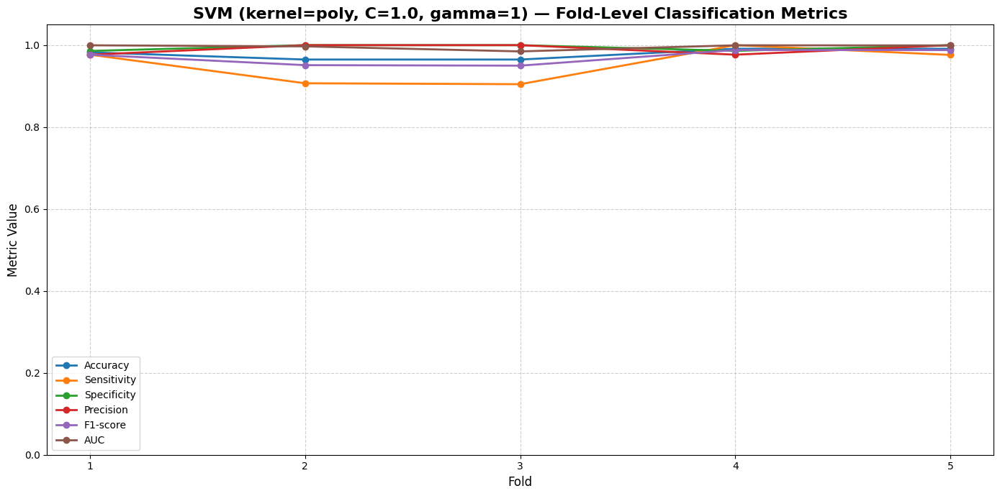

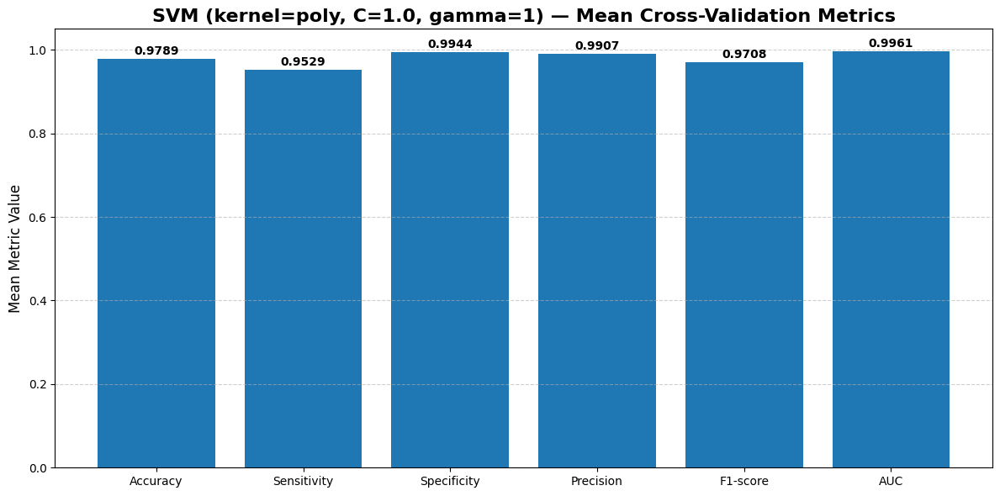

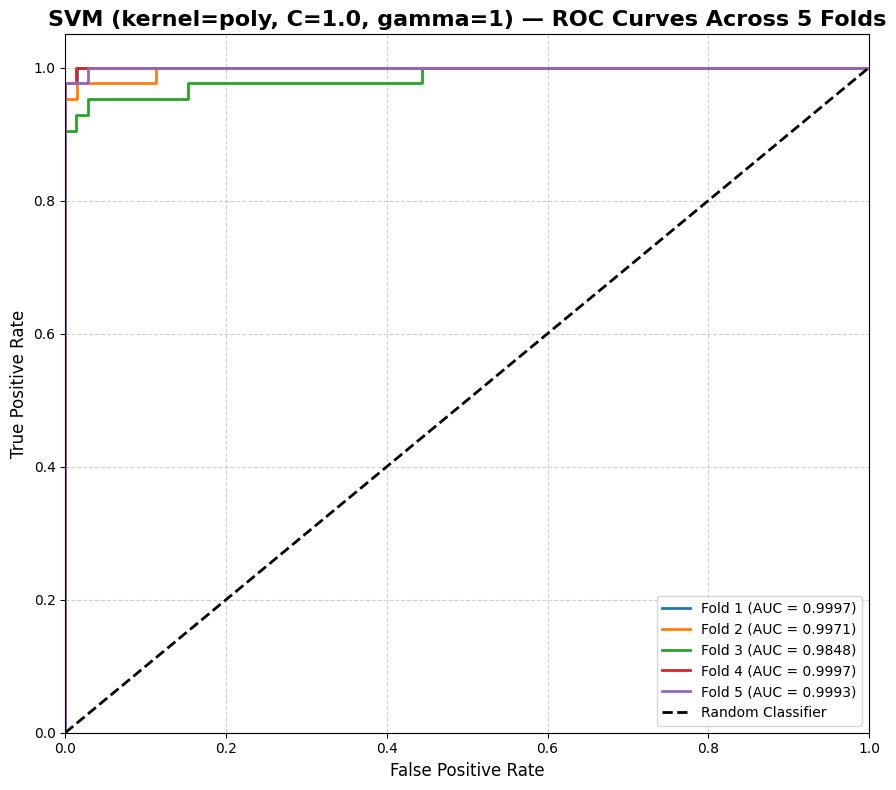

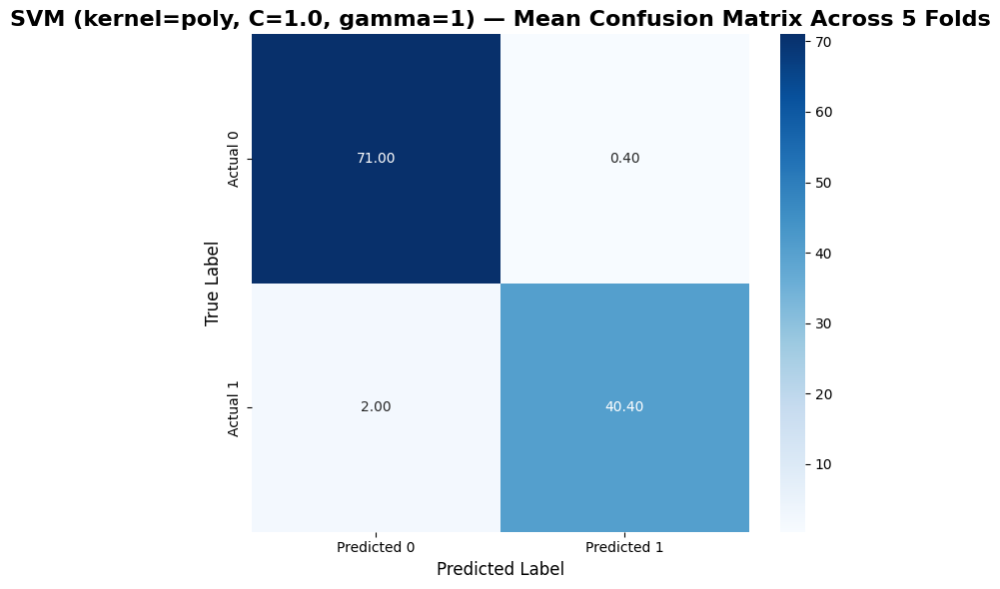

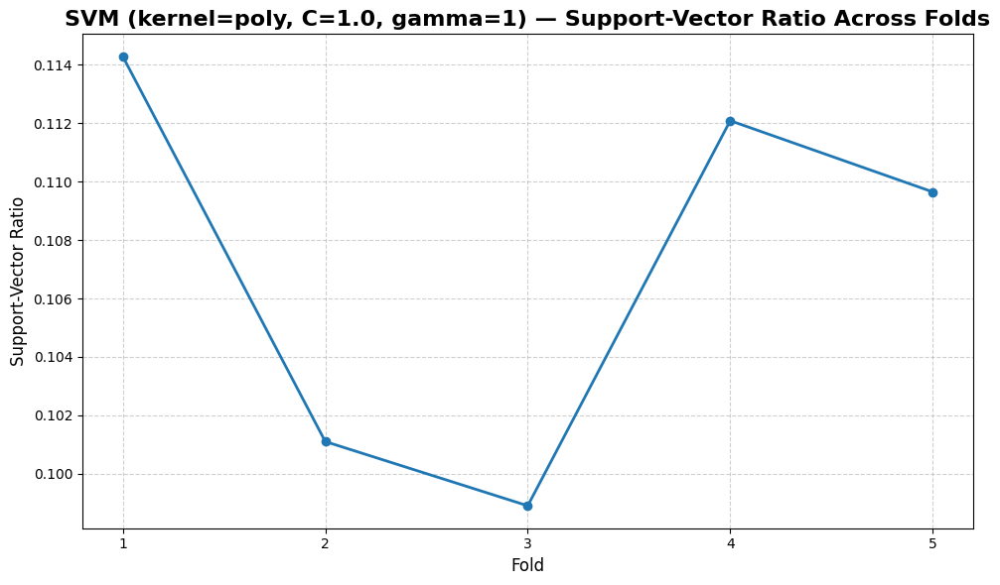

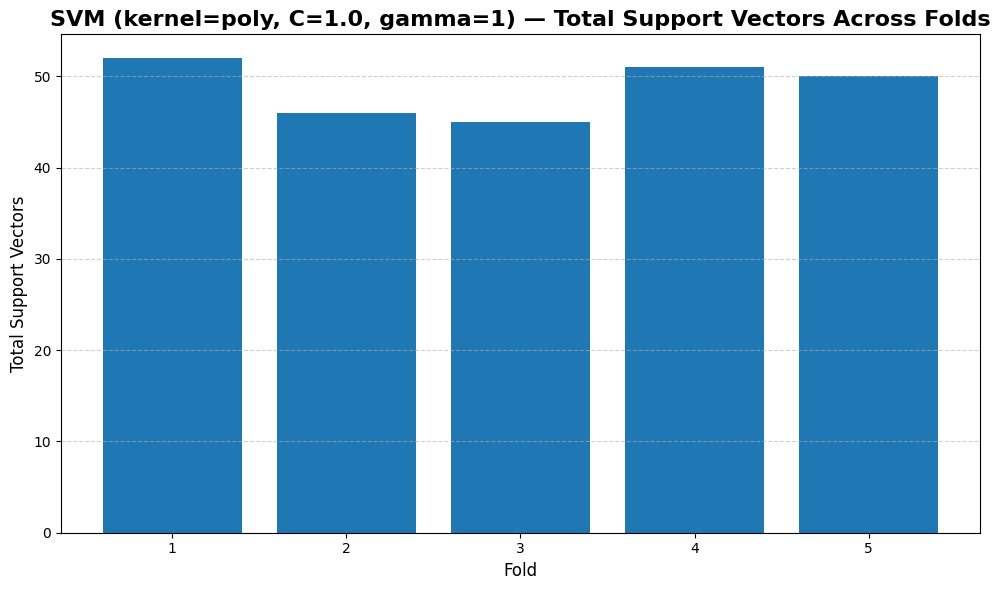

Final SVM visual evaluation report is ready.

Selected SVM configuration:
kernel       : poly
C            : 1.0
gamma        : 1
degree       : 2
class_weight : None

Fold-level results:


,Model,Fold,kernel,C,gamma,degree,class_weight,total_support_vectors,support_vector_ratio,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,SVM,1,poly,1.0,1,2,None,52,0.114286,0.982456,0.976744,0.985915,0.976744,0.976744,0.999672,42,1,1,70
1,SVM,2,poly,1.0,1,2,None,46,0.101099,0.964912,0.906977,1.000000,1.000000,0.951220,0.997052,39,0,4,71
2,SVM,3,poly,1.0,1,2,None,45,0.098901,0.964912,0.904762,1.000000,1.000000,0.950000,0.984788,38,0,4,72
3,SVM,4,poly,1.0,1,2,None,51,0.112088,0.991228,1.000000,0.986111,0.976744,0.988235,0.999669,42,1,0,71
4,SVM,5,poly,1.0,1,2,None,50,0.109649,0.991150,0.976190,1.000000,1.000000,0.987952,0.999329,41,0,1,71



Compact metric summary:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.978932,0.013285,0.964912,0.991228
1,Sensitivity,0.952935,0.044033,0.904762,1.000000
2,Specificity,0.994405,0.007661,0.985915,1.000000
3,Precision,0.990698,0.012738,0.976744,1.000000
4,F1-score,0.970830,0.019036,0.950000,0.988235
5,AUC,0.996102,0.006419,0.984788,0.999672



Support-vector summary:


,Mean_Support_Vectors,Std_Support_Vectors,Mean_Support_Vector_Ratio,Std_Support_Vector_Ratio
0,48.8,3.114482,0.107205,0.006823



Final SVM visual reporting completed successfully.


In [81]:
# ============================================================
# BOX 79 — Final SVM Visual Evaluation Report
#
# Purpose:
#   - Create final visual and tabular reports for the
#     analytically selected SVM model
#   - Visualize fold-level classification metrics
#   - Plot ROC curves across all folds
#   - Plot mean confusion matrix
#   - Report support-vector behavior
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_svm_fold_results_df",
    "final_svm_summary_results_df",
    "final_svm_confusion_matrices",
    "final_svm_roc_data",
    "final_svm_support_vector_summary_df",
    "BEST_SVM_KERNEL",
    "BEST_SVM_C",
    "BEST_SVM_GAMMA",
    "BEST_SVM_DEGREE",
    "BEST_SVM_CLASS_WEIGHT"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Define plotting metrics
# ------------------------------------------------------------
plot_metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 2 — Build readable model label
# ------------------------------------------------------------
final_svm_label = (
    f"SVM "
    f"(kernel={BEST_SVM_KERNEL}, "
    f"C={BEST_SVM_C}, "
    f"gamma={BEST_SVM_GAMMA})"
)

# ------------------------------------------------------------
# Step 3 — Fold-level metric comparison plot
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in plot_metric_columns:

    plt.plot(
        final_svm_fold_results_df["Fold"],
        final_svm_fold_results_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    f"{final_svm_label} — Fold-Level Classification Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

plt.xticks(final_svm_fold_results_df["Fold"])
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Mean metric bar plot
# ------------------------------------------------------------
mean_metric_values = [
    final_svm_fold_results_df[col].mean()
    for col in plot_metric_columns
]

plt.figure(figsize=(12, 6))

bars = plt.bar(
    plot_metric_columns,
    mean_metric_values
)

plt.title(
    f"{final_svm_label} — Mean Cross-Validation Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("Mean Metric Value", fontsize=12)
plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

for bar, value in zip(bars, mean_metric_values):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.01,
        f"{value:.4f}",
        ha="center",
        fontsize=10,
        fontweight="bold"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — ROC curves across folds
# ------------------------------------------------------------
plt.figure(figsize=(9, 8))

for fold_roc_item in final_svm_roc_data:

    fold_number = fold_roc_item["fold"]
    roc_data = fold_roc_item["roc_data"]

    plt.plot(
        roc_data["fpr"],
        roc_data["tpr"],
        linewidth=2,
        label=f"Fold {fold_number} (AUC = {roc_data['auc']:.4f})"
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    color="black",
    label="Random Classifier"
)

plt.title(
    f"{final_svm_label} — ROC Curves Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)

plt.xlim(0, 1)
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Mean confusion matrix
# ------------------------------------------------------------
final_svm_confusion_matrix_stack = np.array([
    item["matrix"]
    for item in final_svm_confusion_matrices
])

final_svm_mean_confusion_matrix = (
    final_svm_confusion_matrix_stack.mean(axis=0)
)

plt.figure(figsize=(7, 6))

sns.heatmap(
    final_svm_mean_confusion_matrix,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=True,
    xticklabels=[
        "Predicted 0",
        "Predicted 1"
    ],
    yticklabels=[
        "Actual 0",
        "Actual 1"
    ]
)

plt.title(
    f"{final_svm_label} — Mean Confusion Matrix Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Support-vector ratio across folds
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.plot(
    final_svm_fold_results_df["Fold"],
    final_svm_fold_results_df["support_vector_ratio"],
    marker="o",
    linewidth=2
)

plt.title(
    f"{final_svm_label} — Support-Vector Ratio Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Support-Vector Ratio", fontsize=12)

plt.xticks(final_svm_fold_results_df["Fold"])

plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Total support vectors across folds
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.bar(
    final_svm_fold_results_df["Fold"],
    final_svm_fold_results_df["total_support_vectors"]
)

plt.title(
    f"{final_svm_label} — Total Support Vectors Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Total Support Vectors", fontsize=12)

plt.xticks(final_svm_fold_results_df["Fold"])

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Compact metric summary table
# ------------------------------------------------------------
final_svm_visual_summary_df = pd.DataFrame({

    "Metric":
        plot_metric_columns,

    "Mean":
        [
            final_svm_fold_results_df[col].mean()
            for col in plot_metric_columns
        ],

    "Std":
        [
            final_svm_fold_results_df[col].std()
            for col in plot_metric_columns
        ],

    "Min":
        [
            final_svm_fold_results_df[col].min()
            for col in plot_metric_columns
        ],

    "Max":
        [
            final_svm_fold_results_df[col].max()
            for col in plot_metric_columns
        ]
})

final_svm_visual_summary_df = (
    final_svm_visual_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 10 — Fold-level display table
# ------------------------------------------------------------
final_svm_fold_report_df = (
    final_svm_fold_results_df.copy()
)

final_svm_fold_report_df[
    plot_metric_columns
] = (
    final_svm_fold_report_df[
        plot_metric_columns
    ].round(6)
)

final_svm_fold_report_df["support_vector_ratio"] = (
    final_svm_fold_report_df["support_vector_ratio"].round(6)
)

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN",
    "total_support_vectors"
]

final_svm_fold_report_df[
    count_columns
] = (
    final_svm_fold_report_df[
        count_columns
    ].astype(int)
)

# ------------------------------------------------------------
# Step 11 — Display final reports
# ------------------------------------------------------------
print(
    "Final SVM visual evaluation report is ready."
)

print("\nSelected SVM configuration:")
print(f"kernel       : {BEST_SVM_KERNEL}")
print(f"C            : {BEST_SVM_C}")
print(f"gamma        : {BEST_SVM_GAMMA}")
print(f"degree       : {BEST_SVM_DEGREE}")
print(f"class_weight : {BEST_SVM_CLASS_WEIGHT}")

print("\nFold-level results:")
display(
    final_svm_fold_report_df
)

print("\nCompact metric summary:")
display(
    final_svm_visual_summary_df
)

print("\nSupport-vector summary:")
display(
    final_svm_support_vector_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 12 — Store plot references
# ------------------------------------------------------------
all_model_metric_plots.append({

    "model":
        "SVM",

    "plots":
        [
            "fold_level_metrics",
            "mean_metric_barplot",
            "roc_curves",
            "mean_confusion_matrix",
            "support_vector_ratio",
            "total_support_vectors"
        ]
})


print(
    "\nFinal SVM visual reporting "
    "completed successfully."
)

In [82]:
# ============================================================
# BOX 80 — Decision Tree Search Space Definition
#
# Purpose:
#   - Define a fully analytical Decision Tree
#     hyperparameter search space
#   - Avoid manual hyperparameter selection
#   - Prepare candidate configurations for
#     Stratified 5-Fold Cross-Validation
#
# Search Dimensions:
#   1) Splitting criterion
#   2) Maximum tree depth
#   3) Minimum samples for split
#   4) Minimum samples for leaf
#   5) Class weighting strategy
#
# Notes:
#   - All configurations are generated systematically
#   - Search space is designed to balance:
#         • performance
#         • generalization
#         • interpretability
#         • overfitting control
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Define analytical search space
# ------------------------------------------------------------

# ------------------------------------------------------------
# Step 1.1 — Splitting criteria
# ------------------------------------------------------------
dt_criteria = [
    "gini",
    "entropy"
]

# ------------------------------------------------------------
# Step 1.2 — Maximum depth values
# ------------------------------------------------------------
dt_max_depth_values = [
    2,
    3,
    4,
    5,
    6,
    8,
    10,
    None
]

# ------------------------------------------------------------
# Step 1.3 — Minimum samples for split
# ------------------------------------------------------------
dt_min_samples_split_values = [
    2,
    4,
    6,
    8,
    10
]

# ------------------------------------------------------------
# Step 1.4 — Minimum samples for leaf
# ------------------------------------------------------------
dt_min_samples_leaf_values = [
    1,
    2,
    4,
    6
]

# ------------------------------------------------------------
# Step 1.5 — Class-weight strategies
# ------------------------------------------------------------
dt_class_weight_values = [
    None,
    "balanced"
]

# ------------------------------------------------------------
# Step 1.6 — Random state
# ------------------------------------------------------------
DT_RANDOM_STATE = 42

# ------------------------------------------------------------
# Step 2 — Generate all candidate configurations
# ------------------------------------------------------------
dt_candidate_configurations = []

configuration_counter = 1

for (
    criterion,
    max_depth,
    min_samples_split,
    min_samples_leaf,
    class_weight
) in product(

    dt_criteria,
    dt_max_depth_values,
    dt_min_samples_split_values,
    dt_min_samples_leaf_values,
    dt_class_weight_values
):

    # --------------------------------------------------------
    # Step 2.1 — Complexity estimation
    # --------------------------------------------------------
    if max_depth is None:

        complexity_level = "Very High"

    elif max_depth <= 3:

        complexity_level = "Low"

    elif max_depth <= 6:

        complexity_level = "Medium"

    else:

        complexity_level = "High"

    # --------------------------------------------------------
    # Step 2.2 — Interpretability estimation
    # --------------------------------------------------------
    if max_depth is None:

        interpretability = "Low"

    elif max_depth <= 3:

        interpretability = "Very High"

    elif max_depth <= 6:

        interpretability = "High"

    else:

        interpretability = "Medium"

    # --------------------------------------------------------
    # Step 2.3 — Overfitting risk estimation
    # --------------------------------------------------------
    if (
        max_depth is None
        or (
            max_depth is not None
            and max_depth >= 8
        )
    ):

        overfitting_risk = "High"

    elif max_depth <= 3:

        overfitting_risk = "Low"

    else:

        overfitting_risk = "Moderate"

    # --------------------------------------------------------
    # Step 2.4 — Build configuration dictionary
    # --------------------------------------------------------
    configuration_dict = {

        "config_id":
            f"DT_CFG_{configuration_counter}",

        "criterion":
            criterion,

        "max_depth":
            max_depth,

        "min_samples_split":
            min_samples_split,

        "min_samples_leaf":
            min_samples_leaf,

        "class_weight":
            class_weight,

        "complexity_level":
            complexity_level,

        "interpretability":
            interpretability,

        "overfitting_risk":
            overfitting_risk,

        "random_state":
            DT_RANDOM_STATE
    }

    dt_candidate_configurations.append(
        configuration_dict
    )

    configuration_counter += 1

# ------------------------------------------------------------
# Step 3 — Convert configurations to DataFrame
# ------------------------------------------------------------
dt_candidate_configurations_df = pd.DataFrame(
    dt_candidate_configurations
)

# ------------------------------------------------------------
# Step 4 — Create search-space summary
# ------------------------------------------------------------
dt_search_space_summary_df = pd.DataFrame([{

    "Total_Configurations":
        len(dt_candidate_configurations),

    "Criteria":
        ", ".join(dt_criteria),

    "Number_of_Criteria":
        len(dt_criteria),

    "Max_Depth_Values":
        len(dt_max_depth_values),

    "Min_Samples_Split_Values":
        len(dt_min_samples_split_values),

    "Min_Samples_Leaf_Values":
        len(dt_min_samples_leaf_values),

    "Class_Weight_Strategies":
        len(dt_class_weight_values),

    "Random_State":
        DT_RANDOM_STATE
}])

# ------------------------------------------------------------
# Step 5 — Create compact display version
# ------------------------------------------------------------
dt_candidate_display_df = (
    dt_candidate_configurations_df.copy()
)

# ------------------------------------------------------------
# Step 6 — Display search-space summary
# ------------------------------------------------------------
print(
    "Decision Tree hyperparameter search space is ready."
)

print("\nSearch-space summary:")
display(
    dt_search_space_summary_df
)

print("\nCandidate configurations:")
display(
    dt_candidate_display_df.head(20)
)

print("\nTotal generated configurations:")
print(
    len(dt_candidate_configurations_df)
)

# ------------------------------------------------------------
# Step 7 — Complexity distribution analysis
# ------------------------------------------------------------
complexity_distribution_df = (
    dt_candidate_configurations_df[
        "complexity_level"
    ]
    .value_counts()
    .reset_index()
)

complexity_distribution_df.columns = [
    "Complexity_Level",
    "Count"
]

print("\nComplexity-level distribution:")
display(
    complexity_distribution_df
)

# ------------------------------------------------------------
# Step 8 — Interpretability distribution analysis
# ------------------------------------------------------------
interpretability_distribution_df = (
    dt_candidate_configurations_df[
        "interpretability"
    ]
    .value_counts()
    .reset_index()
)

interpretability_distribution_df.columns = [
    "Interpretability",
    "Count"
]

print("\nInterpretability distribution:")
display(
    interpretability_distribution_df
)

# ------------------------------------------------------------
# Step 9 — Overfitting-risk distribution analysis
# ------------------------------------------------------------
overfitting_distribution_df = (
    dt_candidate_configurations_df[
        "overfitting_risk"
    ]
    .value_counts()
    .reset_index()
)

overfitting_distribution_df.columns = [
    "Overfitting_Risk",
    "Count"
]

print("\nOverfitting-risk distribution:")
display(
    overfitting_distribution_df
)

print(
    "\nDecision Tree search-space definition "
    "completed successfully."
)

Decision Tree hyperparameter search space is ready.

Search-space summary:


,Total_Configurations,Criteria,Number_of_Criteria,Max_Depth_Values,Min_Samples_Split_Values,Min_Samples_Leaf_Values,Class_Weight_Strategies,Random_State
0,640,"gini, entropy",2,8,5,4,2,42



Candidate configurations:


,config_id,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,complexity_level,interpretability,overfitting_risk,random_state
0,DT_CFG_1,gini,2.0,2,1,None,Low,Very High,Low,42
1,DT_CFG_2,gini,2.0,2,1,balanced,Low,Very High,Low,42
2,DT_CFG_3,gini,2.0,2,2,None,Low,Very High,Low,42
3,DT_CFG_4,gini,2.0,2,2,balanced,Low,Very High,Low,42
4,DT_CFG_5,gini,2.0,2,4,None,Low,Very High,Low,42
5,DT_CFG_6,gini,2.0,2,4,balanced,Low,Very High,Low,42
6,DT_CFG_7,gini,2.0,2,6,None,Low,Very High,Low,42
7,DT_CFG_8,gini,2.0,2,6,balanced,Low,Very High,Low,42
8,DT_CFG_9,gini,2.0,4,1,None,Low,Very High,Low,42
9,DT_CFG_10,gini,2.0,4,1,balanced,Low,Very High,Low,42



Total generated configurations:
640

Complexity-level distribution:


,Complexity_Level,Count
0,Medium,240
1,Low,160
2,High,160
3,Very High,80



Interpretability distribution:


,Interpretability,Count
0,High,240
1,Very High,160
2,Medium,160
3,Low,80



Overfitting-risk distribution:


,Overfitting_Risk,Count
0,Moderate,240
1,High,240
2,Low,160



Decision Tree search-space definition completed successfully.


Decision Tree complexity analysis is ready.

Criterion-level analysis:


,criterion,Number_of_Configurations,Unique_Depths,Unique_Min_Split_Values,Unique_Min_Leaf_Values,Uses_Class_Weight
0,entropy,320,8,5,4,True
1,gini,320,8,5,4,True



Complexity-level analysis:


,complexity_level,Number_of_Configurations,Average_Min_Samples_Split,Average_Min_Samples_Leaf
0,High,160,6.0,3.25
1,Low,160,6.0,3.25
2,Medium,240,6.0,3.25
3,Very High,80,6.0,3.25



Interpretability analysis:


,interpretability,Number_of_Configurations,Average_Min_Samples_Split,Average_Min_Samples_Leaf
0,High,240,6.0,3.25
1,Low,80,6.0,3.25
2,Medium,160,6.0,3.25
3,Very High,160,6.0,3.25



Depth distribution analysis:


,max_depth,count
0,2.0,80
1,3.0,80
2,4.0,80
3,5.0,80
4,6.0,80
5,8.0,80
6,10.0,80
7,nan,80



Parameter coverage analysis:


,Parameter,Number_of_Unique_Values,Values
0,criterion,2,"entropy, gini"
1,max_depth,8,"10.0, 2.0, 3.0, 4.0, 5.0, 6.0, 8.0, nan"
2,min_samples_split,5,"2, 4, 6, 8, 10"
3,min_samples_leaf,4,"1, 2, 4, 6"
4,class_weight,2,"None, balanced"


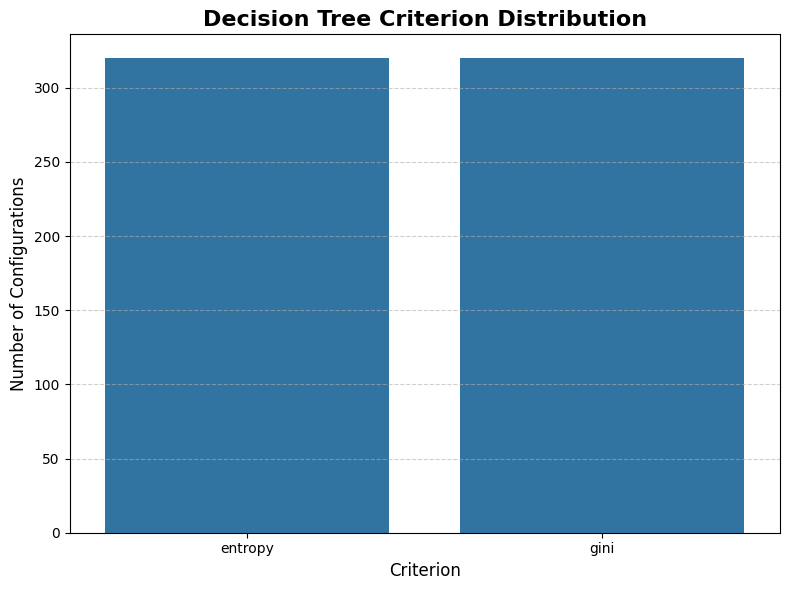

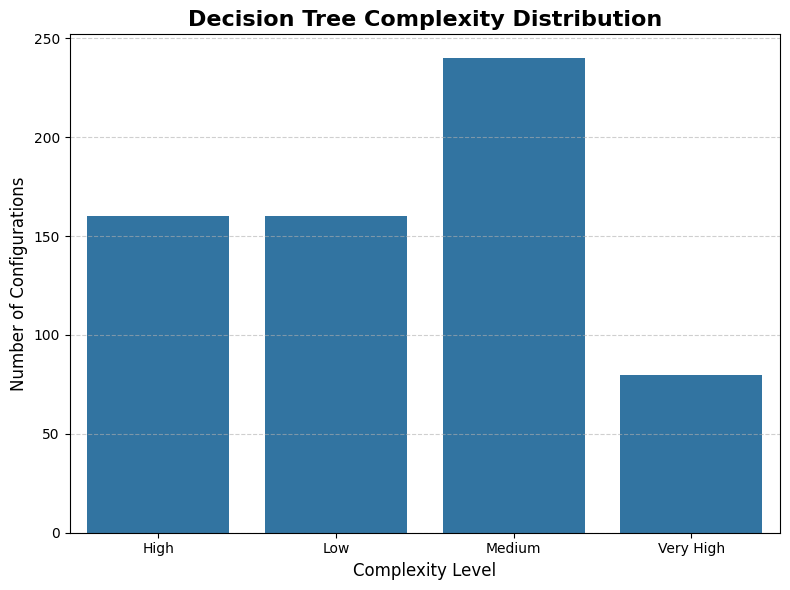

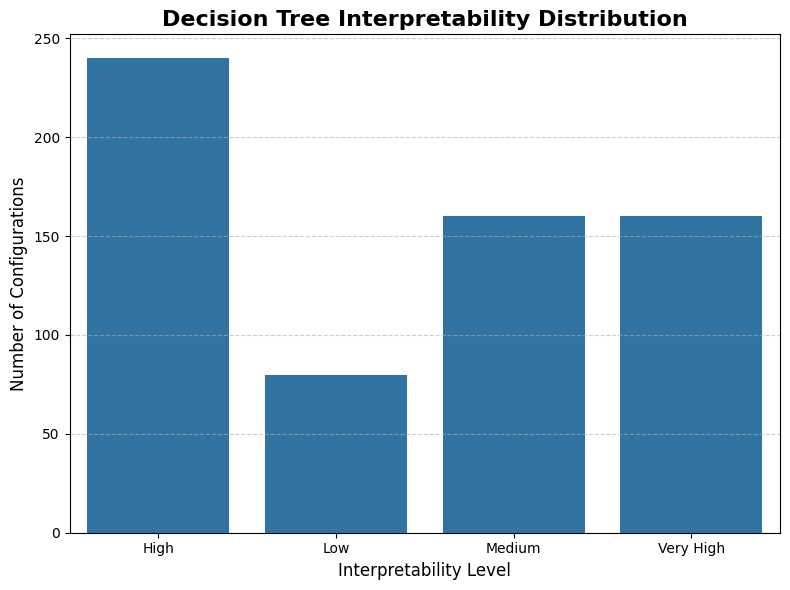

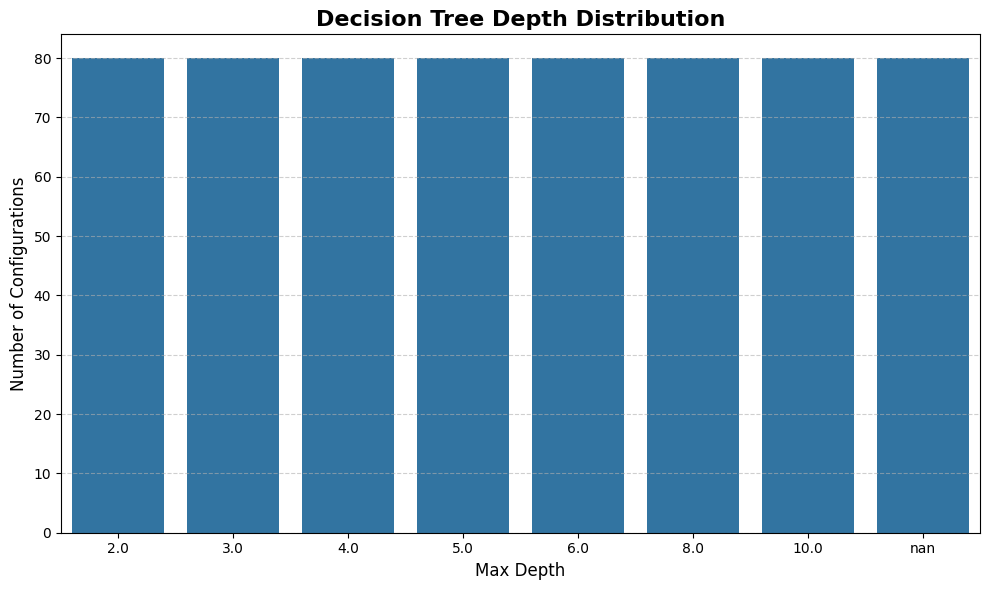


Decision Tree complexity and interpretability analysis completed successfully.


In [83]:
# ============================================================
# BOX 81 — Decision Tree Complexity and Interpretability Analysis
#
# Purpose:
#   - Analyze Decision Tree search-space complexity
#   - Evaluate interpretability characteristics
#   - Study overfitting-control coverage
#   - Prepare analytical summaries and visual reports
#
# Analytical Dimensions:
#   1) Criterion distribution
#   2) Depth complexity distribution
#   3) Interpretability coverage
#   4) Overfitting-risk analysis
#   5) Class-weight coverage
#   6) Hyperparameter diversity
#
# Notes:
#   - No model training is performed
#   - This box performs analytical preparation only
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "dt_candidate_configurations_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:

    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(
    dt_candidate_configurations_df,
    pd.DataFrame
):

    raise TypeError(
        "dt_candidate_configurations_df "
        "must be a pandas DataFrame."
    )

if dt_candidate_configurations_df.empty:

    raise ValueError(
        "dt_candidate_configurations_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Criterion-level analysis
# ------------------------------------------------------------
dt_criterion_analysis_df = (
    dt_candidate_configurations_df
    .groupby("criterion")
    .agg(

        Number_of_Configurations=(
            "config_id",
            "count"
        ),

        Unique_Depths=(
            "max_depth",
            lambda x: len(pd.Series(x).astype(str).unique())
        ),

        Unique_Min_Split_Values=(
            "min_samples_split",
            lambda x: len(np.unique(x))
        ),

        Unique_Min_Leaf_Values=(
            "min_samples_leaf",
            lambda x: len(np.unique(x))
        ),

        Uses_Class_Weight=(
            "class_weight",
            lambda x: (
                x.astype(str)
                .str.contains("balanced")
                .any()
            )
        )
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 2 — Complexity-level analysis
# ------------------------------------------------------------
dt_complexity_analysis_df = (
    dt_candidate_configurations_df
    .groupby("complexity_level")
    .agg(

        Number_of_Configurations=(
            "config_id",
            "count"
        ),

        Average_Min_Samples_Split=(
            "min_samples_split",
            "mean"
        ),

        Average_Min_Samples_Leaf=(
            "min_samples_leaf",
            "mean"
        )
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 3 — Interpretability analysis
# ------------------------------------------------------------
dt_interpretability_analysis_df = (
    dt_candidate_configurations_df
    .groupby("interpretability")
    .agg(

        Number_of_Configurations=(
            "config_id",
            "count"
        ),

        Average_Min_Samples_Split=(
            "min_samples_split",
            "mean"
        ),

        Average_Min_Samples_Leaf=(
            "min_samples_leaf",
            "mean"
        )
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 4 — Depth distribution analysis
# ------------------------------------------------------------
depth_values_series = (
    dt_candidate_configurations_df[
        "max_depth"
    ]
    .astype(str)
)

dt_depth_distribution_df = (
    depth_values_series
    .value_counts()
    .reset_index()
)

dt_depth_distribution_df.columns = [
    "max_depth",
    "count"
]

# ------------------------------------------------------------
# Step 5 — Parameter coverage analysis
# ------------------------------------------------------------
dt_parameter_coverage = []

# ------------------------------------------------------------
# Step 5.1 — Criterion coverage
# ------------------------------------------------------------
dt_parameter_coverage.append({

    "Parameter":
        "criterion",

    "Number_of_Unique_Values":
        dt_candidate_configurations_df[
            "criterion"
        ].nunique(),

    "Values":
        ", ".join(
            sorted(
                map(
                    str,
                    dt_candidate_configurations_df[
                        "criterion"
                    ].unique()
                )
            )
        )
})

# ------------------------------------------------------------
# Step 5.2 — Max-depth coverage
# ------------------------------------------------------------
dt_parameter_coverage.append({

    "Parameter":
        "max_depth",

    "Number_of_Unique_Values":
        dt_candidate_configurations_df[
            "max_depth"
        ]
        .astype(str)
        .nunique(),

    "Values":
        ", ".join(
            sorted(
                map(
                    str,
                    dt_candidate_configurations_df[
                        "max_depth"
                    ]
                    .astype(str)
                    .unique()
                )
            )
        )
})

# ------------------------------------------------------------
# Step 5.3 — Min-samples-split coverage
# ------------------------------------------------------------
dt_parameter_coverage.append({

    "Parameter":
        "min_samples_split",

    "Number_of_Unique_Values":
        dt_candidate_configurations_df[
            "min_samples_split"
        ].nunique(),

    "Values":
        ", ".join(
            map(
                str,
                sorted(
                    dt_candidate_configurations_df[
                        "min_samples_split"
                    ].unique()
                )
            )
        )
})

# ------------------------------------------------------------
# Step 5.4 — Min-samples-leaf coverage
# ------------------------------------------------------------
dt_parameter_coverage.append({

    "Parameter":
        "min_samples_leaf",

    "Number_of_Unique_Values":
        dt_candidate_configurations_df[
            "min_samples_leaf"
        ].nunique(),

    "Values":
        ", ".join(
            map(
                str,
                sorted(
                    dt_candidate_configurations_df[
                        "min_samples_leaf"
                    ].unique()
                )
            )
        )
})

# ------------------------------------------------------------
# Step 5.5 — Class-weight coverage
# ------------------------------------------------------------
dt_parameter_coverage.append({

    "Parameter":
        "class_weight",

    "Number_of_Unique_Values":
        dt_candidate_configurations_df[
            "class_weight"
        ]
        .astype(str)
        .nunique(),

    "Values":
        ", ".join(
            sorted(
                map(
                    str,
                    dt_candidate_configurations_df[
                        "class_weight"
                    ]
                    .astype(str)
                    .unique()
                )
            )
        )
})

# ------------------------------------------------------------
# Step 6 — Convert parameter coverage to DataFrame
# ------------------------------------------------------------
dt_parameter_coverage_df = pd.DataFrame(
    dt_parameter_coverage
)

# ------------------------------------------------------------
# Step 7 — Display analytical reports
# ------------------------------------------------------------
print(
    "Decision Tree complexity analysis is ready."
)

print("\nCriterion-level analysis:")
display(
    dt_criterion_analysis_df
)

print("\nComplexity-level analysis:")
display(
    dt_complexity_analysis_df
)

print("\nInterpretability analysis:")
display(
    dt_interpretability_analysis_df
)

print("\nDepth distribution analysis:")
display(
    dt_depth_distribution_df
)

print("\nParameter coverage analysis:")
display(
    dt_parameter_coverage_df
)

# ------------------------------------------------------------
# Step 8 — Plot criterion distribution
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=dt_criterion_analysis_df,
    x="criterion",
    y="Number_of_Configurations"
)

plt.title(
    "Decision Tree Criterion Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Criterion",
    fontsize=12
)

plt.ylabel(
    "Number of Configurations",
    fontsize=12
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot complexity distribution
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=dt_complexity_analysis_df,
    x="complexity_level",
    y="Number_of_Configurations"
)

plt.title(
    "Decision Tree Complexity Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Complexity Level",
    fontsize=12
)

plt.ylabel(
    "Number of Configurations",
    fontsize=12
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot interpretability distribution
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=dt_interpretability_analysis_df,
    x="interpretability",
    y="Number_of_Configurations"
)

plt.title(
    "Decision Tree Interpretability Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Interpretability Level",
    fontsize=12
)

plt.ylabel(
    "Number of Configurations",
    fontsize=12
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot depth distribution
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.barplot(
    data=dt_depth_distribution_df,
    x="max_depth",
    y="count"
)

plt.title(
    "Decision Tree Depth Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Max Depth",
    fontsize=12
)

plt.ylabel(
    "Number of Configurations",
    fontsize=12
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

print(
    "\nDecision Tree complexity and "
    "interpretability analysis completed successfully."
)

In [84]:
# ============================================================
# BOX 82 — Decision Tree Hyperparameter 5-Fold Evaluation
#
# Purpose:
#   - Evaluate all candidate Decision Tree configurations using
#     Stratified 5-Fold Cross-Validation
#   - Train Decision Tree models on fold-level scaled data
#   - Compute fold-level classification metrics
#   - Track tree complexity after training
#   - Store configuration-level summary results
#
# Evaluated Hyperparameters:
#   - criterion
#   - max_depth
#   - min_samples_split
#   - min_samples_leaf
#   - class_weight
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "dt_candidate_configurations",
    "compute_binary_classification_metrics"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

if not isinstance(dt_candidate_configurations, list):
    raise TypeError(
        "dt_candidate_configurations must be a list."
    )

if len(dt_candidate_configurations) == 0:
    raise ValueError(
        "dt_candidate_configurations is empty."
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
dt_cv_all_results = []

dt_cv_fold_results = []

# ------------------------------------------------------------
# Step 2 — Evaluate all Decision Tree configurations
# ------------------------------------------------------------
for config in dt_candidate_configurations:

    # --------------------------------------------------------
    # Step 2.1 — Extract configuration information
    # --------------------------------------------------------
    config_id = config["config_id"]

    criterion = config["criterion"]

    max_depth = config["max_depth"]

    min_samples_split = config["min_samples_split"]

    min_samples_leaf = config["min_samples_leaf"]

    class_weight = config["class_weight"]

    complexity_level = config["complexity_level"]

    interpretability = config["interpretability"]

    overfitting_risk = config["overfitting_risk"]

    random_state = config["random_state"]

    # --------------------------------------------------------
    # Step 2.2 — Initialize fold-level storage
    # --------------------------------------------------------
    current_config_fold_metrics = []

    # --------------------------------------------------------
    # Step 2.3 — Run Stratified 5-Fold CV
    # --------------------------------------------------------
    for fold_data in cv5_scaled_folds:

        fold_number = fold_data["fold_number"]

        X_train = fold_data["X_train_scaled"]

        X_val = fold_data["X_validation_scaled"]

        y_train = fold_data["y_train"]

        y_val = fold_data["y_validation"]

        # ----------------------------------------------------
        # Step 2.4 — Initialize Decision Tree model
        # ----------------------------------------------------
        dt_model = DecisionTreeClassifier(
            criterion=criterion,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            class_weight=class_weight,
            random_state=random_state
        )

        # ----------------------------------------------------
        # Step 2.5 — Train model
        # ----------------------------------------------------
        dt_model.fit(
            X_train,
            y_train
        )

        # ----------------------------------------------------
        # Step 2.6 — Generate predictions
        # ----------------------------------------------------
        y_pred = dt_model.predict(
            X_val
        )

        # ----------------------------------------------------
        # Step 2.7 — Generate probability scores
        # ----------------------------------------------------
        y_score = (
            dt_model
            .predict_proba(X_val)[:, 1]
        )

        # ----------------------------------------------------
        # Step 2.8 — Compute evaluation metrics
        # ----------------------------------------------------
        fold_metrics = compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )

        # ----------------------------------------------------
        # Step 2.9 — Extract trained tree complexity
        # ----------------------------------------------------
        trained_tree_depth = dt_model.get_depth()

        trained_tree_leaves = dt_model.get_n_leaves()

        trained_tree_nodes = dt_model.tree_.node_count

        # ----------------------------------------------------
        # Step 2.10 — Build fold-level result row
        # ----------------------------------------------------
        fold_result_row = {

            "Config_ID":
                config_id,

            "Fold":
                fold_number,

            "criterion":
                criterion,

            "max_depth":
                str(max_depth),

            "min_samples_split":
                min_samples_split,

            "min_samples_leaf":
                min_samples_leaf,

            "class_weight":
                str(class_weight),

            "complexity_level":
                complexity_level,

            "interpretability":
                interpretability,

            "overfitting_risk":
                overfitting_risk,

            "trained_tree_depth":
                trained_tree_depth,

            "trained_tree_leaves":
                trained_tree_leaves,

            "trained_tree_nodes":
                trained_tree_nodes,

            "Accuracy":
                fold_metrics["Accuracy"],

            "Sensitivity":
                fold_metrics["Sensitivity"],

            "Specificity":
                fold_metrics["Specificity"],

            "Precision":
                fold_metrics["Precision"],

            "F1-score":
                fold_metrics["F1-score"],

            "AUC":
                fold_metrics["AUC"],

            "TP":
                fold_metrics["TP"],

            "FP":
                fold_metrics["FP"],

            "FN":
                fold_metrics["FN"],

            "TN":
                fold_metrics["TN"]
        }

        current_config_fold_metrics.append(
            fold_result_row
        )

        dt_cv_fold_results.append(
            fold_result_row
        )

    # --------------------------------------------------------
    # Step 2.11 — Convert current configuration results
    # --------------------------------------------------------
    current_config_df = pd.DataFrame(
        current_config_fold_metrics
    )

    # --------------------------------------------------------
    # Step 2.12 — Compute configuration-level summary
    # --------------------------------------------------------
    config_summary_row = {

        "Config_ID":
            config_id,

        "criterion":
            criterion,

        "max_depth":
            str(max_depth),

        "min_samples_split":
            min_samples_split,

        "min_samples_leaf":
            min_samples_leaf,

        "class_weight":
            str(class_weight),

        "complexity_level":
            complexity_level,

        "interpretability":
            interpretability,

        "overfitting_risk":
            overfitting_risk,

        "Mean_Accuracy":
            current_config_df["Accuracy"].mean(),

        "Std_Accuracy":
            current_config_df["Accuracy"].std(),

        "Mean_Sensitivity":
            current_config_df["Sensitivity"].mean(),

        "Std_Sensitivity":
            current_config_df["Sensitivity"].std(),

        "Mean_Specificity":
            current_config_df["Specificity"].mean(),

        "Std_Specificity":
            current_config_df["Specificity"].std(),

        "Mean_Precision":
            current_config_df["Precision"].mean(),

        "Std_Precision":
            current_config_df["Precision"].std(),

        "Mean_F1-score":
            current_config_df["F1-score"].mean(),

        "Std_F1-score":
            current_config_df["F1-score"].std(),

        "Mean_AUC":
            current_config_df["AUC"].mean(),

        "Std_AUC":
            current_config_df["AUC"].std(),

        "Min_AUC":
            current_config_df["AUC"].min(),

        "Max_AUC":
            current_config_df["AUC"].max(),

        "Mean_Tree_Depth":
            current_config_df["trained_tree_depth"].mean(),

        "Std_Tree_Depth":
            current_config_df["trained_tree_depth"].std(),

        "Mean_Tree_Leaves":
            current_config_df["trained_tree_leaves"].mean(),

        "Std_Tree_Leaves":
            current_config_df["trained_tree_leaves"].std(),

        "Mean_Tree_Nodes":
            current_config_df["trained_tree_nodes"].mean(),

        "Std_Tree_Nodes":
            current_config_df["trained_tree_nodes"].std()
    }

    dt_cv_all_results.append(
        config_summary_row
    )

# ------------------------------------------------------------
# Step 3 — Create final DataFrames
# ------------------------------------------------------------
dt_cv_fold_results_df = pd.DataFrame(
    dt_cv_fold_results
)

dt_cv_summary_results_df = pd.DataFrame(
    dt_cv_all_results
)

# ------------------------------------------------------------
# Step 4 — Sort configurations analytically
# ------------------------------------------------------------
dt_cv_summary_results_df = (
    dt_cv_summary_results_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Mean_Tree_Depth",
            "Mean_Tree_Leaves"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 5 — Create rounded display table
# ------------------------------------------------------------
display_metric_columns = [
    col for col in dt_cv_summary_results_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
    )
]

dt_cv_summary_display_df = (
    dt_cv_summary_results_df.copy()
)

dt_cv_summary_display_df[
    display_metric_columns
] = (
    dt_cv_summary_display_df[
        display_metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 6 — Display evaluation summary
# ------------------------------------------------------------
print(
    "Decision Tree hyperparameter evaluation completed."
)

print("\nTotal evaluated configurations:")
print(
    len(dt_cv_summary_results_df)
)

print("\nTotal fold-level evaluations:")
print(
    len(dt_cv_fold_results_df)
)

print("\nTop configurations:")
display(
    dt_cv_summary_display_df.head(10)
)

print("\nFold-level results sample:")
display(
    dt_cv_fold_results_df.head(10)
)

print(
    "\nDecision Tree 5-Fold hyperparameter "
    "evaluation completed successfully."
)

Decision Tree hyperparameter evaluation completed.

Total evaluated configurations:
640

Total fold-level evaluations:
3200

Top configurations:


,Config_ID,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,complexity_level,interpretability,overfitting_risk,Mean_Accuracy,...,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Tree_Depth,Std_Tree_Depth,Mean_Tree_Leaves,Std_Tree_Leaves,Mean_Tree_Nodes,Std_Tree_Nodes
0,DT_CFG_408,entropy,4,2,6,balanced,Medium,High,Moderate,0.934995,...,0.964302,0.011110,0.948692,0.975762,4.0,0.0,10.4,1.516575,19.8,3.033150
1,DT_CFG_416,entropy,4,4,6,balanced,Medium,High,Moderate,0.934995,...,0.964302,0.011110,0.948692,0.975762,4.0,0.0,10.4,1.516575,19.8,3.033150
2,DT_CFG_424,entropy,4,6,6,balanced,Medium,High,Moderate,0.934995,...,0.964302,0.011110,0.948692,0.975762,4.0,0.0,10.4,1.516575,19.8,3.033150
3,DT_CFG_432,entropy,4,8,6,balanced,Medium,High,Moderate,0.934995,...,0.964302,0.011110,0.948692,0.975762,4.0,0.0,10.4,1.516575,19.8,3.033150
4,DT_CFG_440,entropy,4,10,6,balanced,Medium,High,Moderate,0.934995,...,0.964302,0.011110,0.948692,0.975762,4.0,0.0,10.4,1.516575,19.8,3.033150
5,DT_CFG_407,entropy,4,2,6,None,Medium,High,Moderate,0.924422,...,0.963992,0.006983,0.953652,0.969742,4.0,0.0,10.0,1.581139,19.0,3.162278
6,DT_CFG_415,entropy,4,4,6,None,Medium,High,Moderate,0.924422,...,0.963992,0.006983,0.953652,0.969742,4.0,0.0,10.0,1.581139,19.0,3.162278
7,DT_CFG_423,entropy,4,6,6,None,Medium,High,Moderate,0.924422,...,0.963992,0.006983,0.953652,0.969742,4.0,0.0,10.0,1.581139,19.0,3.162278
8,DT_CFG_431,entropy,4,8,6,None,Medium,High,Moderate,0.924422,...,0.963992,0.006983,0.953652,0.969742,4.0,0.0,10.0,1.581139,19.0,3.162278
9,DT_CFG_439,entropy,4,10,6,None,Medium,High,Moderate,0.924422,...,0.963992,0.006983,0.953652,0.969742,4.0,0.0,10.0,1.581139,19.0,3.162278



Fold-level results sample:


,Config_ID,Fold,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,complexity_level,interpretability,overfitting_risk,...,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,DT_CFG_1,1,gini,2,2,1,None,Low,Very High,Low,...,0.877193,0.813953,0.915493,0.853659,0.833333,0.945955,35,6,8,65
1,DT_CFG_1,2,gini,2,2,1,None,Low,Very High,Low,...,0.868421,0.744186,0.943662,0.888889,0.810127,0.856371,32,4,11,67
2,DT_CFG_1,3,gini,2,2,1,None,Low,Very High,Low,...,0.947368,0.880952,0.986111,0.973684,0.925000,0.937500,37,1,5,71
3,DT_CFG_1,4,gini,2,2,1,None,Low,Very High,Low,...,0.894737,0.976190,0.847222,0.788462,0.872340,0.919478,41,11,1,61
4,DT_CFG_1,5,gini,2,2,1,None,Low,Very High,Low,...,0.938053,0.880952,0.971831,0.948718,0.913580,0.936955,37,2,5,69
5,DT_CFG_2,1,gini,2,2,1,balanced,Low,Very High,Low,...,0.868421,0.883721,0.859155,0.791667,0.835165,0.918932,38,10,5,61
6,DT_CFG_2,2,gini,2,2,1,balanced,Low,Very High,Low,...,0.921053,0.953488,0.901408,0.854167,0.901099,0.948739,41,7,2,64
7,DT_CFG_2,3,gini,2,2,1,balanced,Low,Very High,Low,...,0.912281,0.809524,0.972222,0.944444,0.871795,0.935516,34,2,8,70
8,DT_CFG_2,4,gini,2,2,1,balanced,Low,Very High,Low,...,0.903509,0.952381,0.875000,0.816327,0.879121,0.931548,40,9,2,63
9,DT_CFG_2,5,gini,2,2,1,balanced,Low,Very High,Low,...,0.946903,0.928571,0.957746,0.928571,0.928571,0.954896,39,3,3,68



Decision Tree 5-Fold hyperparameter evaluation completed successfully.


In [85]:
# ============================================================
# BOX 83 — Decision Tree Hyperparameter Analytical Reporting
#
# Purpose:
#   - Perform analytical ranking of Decision Tree configurations
#   - Compare performance, stability, complexity, and interpretability
#   - Analyze tree depth, leaves, and node behavior
#   - Create report-ready analytical tables
#
# Analytical Ranking Criteria:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Lower Mean_Tree_Depth
#   6) Lower Mean_Tree_Leaves
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "dt_cv_summary_results_df",
    "dt_cv_fold_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(dt_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "dt_cv_summary_results_df must be a pandas DataFrame."
    )

if not isinstance(dt_cv_fold_results_df, pd.DataFrame):
    raise TypeError(
        "dt_cv_fold_results_df must be a pandas DataFrame."
    )

if dt_cv_summary_results_df.empty:
    raise ValueError(
        "dt_cv_summary_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Create analytical ranked results table
# ------------------------------------------------------------
dt_ranked_results_df = (
    dt_cv_summary_results_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Mean_Tree_Depth",
            "Mean_Tree_Leaves"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

dt_ranked_results_df.insert(
    0,
    "Rank",
    np.arange(
        1,
        len(dt_ranked_results_df) + 1
    )
)

# ------------------------------------------------------------
# Step 2 — Create compact analytical table
# ------------------------------------------------------------
compact_columns = [
    "Rank",
    "Config_ID",
    "criterion",
    "max_depth",
    "min_samples_split",
    "min_samples_leaf",
    "class_weight",
    "complexity_level",
    "interpretability",
    "overfitting_risk",
    "Mean_Accuracy",
    "Std_Accuracy",
    "Mean_Sensitivity",
    "Std_Sensitivity",
    "Mean_Specificity",
    "Std_Specificity",
    "Mean_F1-score",
    "Std_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Tree_Depth",
    "Mean_Tree_Leaves",
    "Mean_Tree_Nodes"
]

missing_compact_columns = [
    col for col in compact_columns
    if col not in dt_ranked_results_df.columns
]

if len(missing_compact_columns) > 0:
    raise ValueError(
        f"Missing compact columns: {missing_compact_columns}"
    )

dt_compact_results_df = (
    dt_ranked_results_df[
        compact_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 3 — Create rounded display version
# ------------------------------------------------------------
dt_compact_display_df = (
    dt_compact_results_df.copy()
)

numeric_columns = [
    col for col in dt_compact_display_df.columns
    if col not in [
        "Config_ID",
        "criterion",
        "max_depth",
        "class_weight",
        "complexity_level",
        "interpretability",
        "overfitting_risk"
    ]
]

dt_compact_display_df[
    numeric_columns
] = (
    dt_compact_display_df[
        numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 4 — Extract best candidate configuration
# ------------------------------------------------------------
best_dt_configuration_df = (
    dt_ranked_results_df
    .head(1)
    .copy()
)

# ------------------------------------------------------------
# Step 5 — Stability analysis
# ------------------------------------------------------------
dt_stability_analysis_df = (
    dt_ranked_results_df
    .sort_values(
        by=[
            "Std_AUC",
            "Std_Accuracy",
            "Std_F1-score",
            "Mean_AUC"
        ],
        ascending=[
            True,
            True,
            True,
            False
        ]
    )
    .reset_index(drop=True)
)

stability_columns = [
    "Config_ID",
    "criterion",
    "max_depth",
    "min_samples_split",
    "min_samples_leaf",
    "class_weight",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Accuracy",
    "Std_Accuracy",
    "Mean_F1-score",
    "Std_F1-score",
    "Mean_Tree_Depth",
    "Mean_Tree_Leaves"
]

dt_stability_analysis_df = (
    dt_stability_analysis_df[
        stability_columns
    ].copy()
)

# ------------------------------------------------------------
# Step 6 — Performance trade-off analysis
# ------------------------------------------------------------
tradeoff_columns = [
    "Config_ID",
    "criterion",
    "max_depth",
    "min_samples_split",
    "min_samples_leaf",
    "class_weight",
    "Mean_AUC",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Std_AUC",
    "Mean_Tree_Depth",
    "Mean_Tree_Leaves"
]

dt_tradeoff_analysis_df = (
    dt_ranked_results_df[
        tradeoff_columns
    ]
    .head(10)
    .copy()
)

# ------------------------------------------------------------
# Step 7 — Criterion-level performance summary
# ------------------------------------------------------------
dt_criterion_performance_summary_df = (
    dt_ranked_results_df
    .groupby("criterion")
    .agg(
        Number_of_Configurations=(
            "Config_ID",
            "count"
        ),
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Average=(
            "Mean_Sensitivity",
            "mean"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Average=(
            "Mean_F1-score",
            "mean"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Average=(
            "Std_AUC",
            "mean"
        ),
        Std_AUC_Min=(
            "Std_AUC",
            "min"
        ),
        Mean_Depth_Average=(
            "Mean_Tree_Depth",
            "mean"
        ),
        Mean_Leaves_Average=(
            "Mean_Tree_Leaves",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 8 — Complexity-performance summary
# ------------------------------------------------------------
dt_complexity_performance_summary_df = (
    dt_ranked_results_df
    .groupby("complexity_level")
    .agg(
        Number_of_Configurations=(
            "Config_ID",
            "count"
        ),
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Min=(
            "Std_AUC",
            "min"
        ),
        Mean_Depth_Average=(
            "Mean_Tree_Depth",
            "mean"
        ),
        Mean_Leaves_Average=(
            "Mean_Tree_Leaves",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 9 — Interpretability-performance summary
# ------------------------------------------------------------
dt_interpretability_performance_summary_df = (
    dt_ranked_results_df
    .groupby("interpretability")
    .agg(
        Number_of_Configurations=(
            "Config_ID",
            "count"
        ),
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Min=(
            "Std_AUC",
            "min"
        ),
        Mean_Depth_Average=(
            "Mean_Tree_Depth",
            "mean"
        ),
        Mean_Leaves_Average=(
            "Mean_Tree_Leaves",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 10 — Class-weight summary
# ------------------------------------------------------------
dt_class_weight_summary_df = (
    dt_ranked_results_df
    .groupby("class_weight")
    .agg(
        Number_of_Configurations=(
            "Config_ID",
            "count"
        ),
        Mean_AUC_Average=(
            "Mean_AUC",
            "mean"
        ),
        Mean_AUC_Max=(
            "Mean_AUC",
            "max"
        ),
        Mean_Sensitivity_Average=(
            "Mean_Sensitivity",
            "mean"
        ),
        Mean_Sensitivity_Max=(
            "Mean_Sensitivity",
            "max"
        ),
        Mean_F1_Average=(
            "Mean_F1-score",
            "mean"
        ),
        Mean_F1_Max=(
            "Mean_F1-score",
            "max"
        ),
        Std_AUC_Min=(
            "Std_AUC",
            "min"
        )
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 11 — Display analytical reports
# ------------------------------------------------------------
print(
    "Decision Tree analytical reporting tables are ready."
)

print("\nAnalytical ranking criteria:")
print("1. Mean_AUC")
print("2. Mean_Sensitivity")
print("3. Mean_F1-score")
print("4. Std_AUC")
print("5. Mean_Tree_Depth")
print("6. Mean_Tree_Leaves")

print("\nTop 15 configurations:")

display(
    dt_compact_display_df
    .head(15)
    .style
    .set_caption(
        "Decision Tree Hyperparameter Cross-Validation Analysis"
    )
    .background_gradient(
        subset=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score"
        ],
        cmap="Greens"
    )
    .background_gradient(
        subset=[
            "Std_AUC",
            "Mean_Tree_Depth",
            "Mean_Tree_Leaves"
        ],
        cmap="Reds_r"
    )
)

print("\nBest Decision Tree candidate configuration:")

display(
    best_dt_configuration_df.round(6)
)

print("\nMost stable configurations:")

display(
    dt_stability_analysis_df
    .head(10)
    .round(6)
)

print("\nPerformance-complexity trade-off analysis:")

display(
    dt_tradeoff_analysis_df
    .round(6)
)

print("\nCriterion-level performance summary:")

display(
    dt_criterion_performance_summary_df
    .round(6)
)

print("\nComplexity-performance summary:")

display(
    dt_complexity_performance_summary_df
    .round(6)
)

print("\nInterpretability-performance summary:")

display(
    dt_interpretability_performance_summary_df
    .round(6)
)

print("\nClass-weight summary:")

display(
    dt_class_weight_summary_df
    .round(6)
)


print(
    "\nDecision Tree analytical reporting "
    "completed successfully."
)

Decision Tree analytical reporting tables are ready.

Analytical ranking criteria:
1. Mean_AUC
2. Mean_Sensitivity
3. Mean_F1-score
4. Std_AUC
5. Mean_Tree_Depth
6. Mean_Tree_Leaves

Top 15 configurations:


,Rank,Config_ID,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,complexity_level,interpretability,overfitting_risk,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Mean_Tree_Depth,Mean_Tree_Leaves,Mean_Tree_Nodes
0,1,DT_CFG_408,entropy,4,2,6,balanced,Medium,High,Moderate,0.934995,0.021953,0.915172,0.060975,0.946870,0.054135,0.913496,0.026102,0.964302,0.011110,4.000000,10.400000,19.800000
1,2,DT_CFG_416,entropy,4,4,6,balanced,Medium,High,Moderate,0.934995,0.021953,0.915172,0.060975,0.946870,0.054135,0.913496,0.026102,0.964302,0.011110,4.000000,10.400000,19.800000
2,3,DT_CFG_424,entropy,4,6,6,balanced,Medium,High,Moderate,0.934995,0.021953,0.915172,0.060975,0.946870,0.054135,0.913496,0.026102,0.964302,0.011110,4.000000,10.400000,19.800000
3,4,DT_CFG_432,entropy,4,8,6,balanced,Medium,High,Moderate,0.934995,0.021953,0.915172,0.060975,0.946870,0.054135,0.913496,0.026102,0.964302,0.011110,4.000000,10.400000,19.800000
4,5,DT_CFG_440,entropy,4,10,6,balanced,Medium,High,Moderate,0.934995,0.021953,0.915172,0.060975,0.946870,0.054135,0.913496,0.026102,0.964302,0.011110,4.000000,10.400000,19.800000
5,6,DT_CFG_407,entropy,4,2,6,None,Medium,High,Moderate,0.924422,0.038052,0.849502,0.117131,0.969210,0.026737,0.890406,0.062829,0.963992,0.006983,4.000000,10.000000,19.000000
6,7,DT_CFG_415,entropy,4,4,6,None,Medium,High,Moderate,0.924422,0.038052,0.849502,0.117131,0.969210,0.026737,0.890406,0.062829,0.963992,0.006983,4.000000,10.000000,19.000000
7,8,DT_CFG_423,entropy,4,6,6,None,Medium,High,Moderate,0.924422,0.038052,0.849502,0.117131,0.969210,0.026737,0.890406,0.062829,0.963992,0.006983,4.000000,10.000000,19.000000
8,9,DT_CFG_431,entropy,4,8,6,None,Medium,High,Moderate,0.924422,0.038052,0.849502,0.117131,0.969210,0.026737,0.890406,0.062829,0.963992,0.006983,4.000000,10.000000,19.000000
9,10,DT_CFG_439,entropy,4,10,6,None,Medium,High,Moderate,0.924422,0.038052,0.849502,0.117131,0.969210,0.026737,0.890406,0.062829,0.963992,0.006983,4.000000,10.000000,19.000000



Best Decision Tree candidate configuration:


,Rank,Config_ID,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,complexity_level,interpretability,overfitting_risk,...,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Tree_Depth,Std_Tree_Depth,Mean_Tree_Leaves,Std_Tree_Leaves,Mean_Tree_Nodes,Std_Tree_Nodes
0,1,DT_CFG_408,entropy,4,2,6,balanced,Medium,High,Moderate,...,0.964302,0.01111,0.948692,0.975762,4.0,0.0,10.4,1.516575,19.8,3.03315



Most stable configurations:


,Config_ID,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_F1-score,Std_F1-score,Mean_Tree_Depth,Mean_Tree_Leaves
0,DT_CFG_88,gini,4,2,6,balanced,0.959977,0.006185,0.940273,0.014308,0.921198,0.014553,4.0,11.2
1,DT_CFG_96,gini,4,4,6,balanced,0.959977,0.006185,0.940273,0.014308,0.921198,0.014553,4.0,11.2
2,DT_CFG_104,gini,4,6,6,balanced,0.959977,0.006185,0.940273,0.014308,0.921198,0.014553,4.0,11.2
3,DT_CFG_112,gini,4,8,6,balanced,0.959977,0.006185,0.940273,0.014308,0.921198,0.014553,4.0,11.2
4,DT_CFG_120,gini,4,10,6,balanced,0.959977,0.006185,0.940273,0.014308,0.921198,0.014553,4.0,11.2
5,DT_CFG_204,gini,8,2,2,balanced,0.937220,0.006876,0.929685,0.010890,0.907296,0.015024,6.2,17.8
6,DT_CFG_212,gini,8,4,2,balanced,0.937220,0.006876,0.929685,0.010890,0.907296,0.015024,6.2,17.8
7,DT_CFG_244,gini,10,2,2,balanced,0.937220,0.006876,0.929685,0.010890,0.907296,0.015024,6.2,17.8
8,DT_CFG_252,gini,10,4,2,balanced,0.937220,0.006876,0.929685,0.010890,0.907296,0.015024,6.2,17.8
9,DT_CFG_284,gini,None,2,2,balanced,0.937220,0.006876,0.929685,0.010890,0.907296,0.015024,6.2,17.8



Performance-complexity trade-off analysis:


,Config_ID,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,Mean_AUC,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Std_AUC,Mean_Tree_Depth,Mean_Tree_Leaves
0,DT_CFG_408,entropy,4,2,6,balanced,0.964302,0.915172,0.94687,0.913496,0.011110,4.0,10.4
1,DT_CFG_416,entropy,4,4,6,balanced,0.964302,0.915172,0.94687,0.913496,0.011110,4.0,10.4
2,DT_CFG_424,entropy,4,6,6,balanced,0.964302,0.915172,0.94687,0.913496,0.011110,4.0,10.4
3,DT_CFG_432,entropy,4,8,6,balanced,0.964302,0.915172,0.94687,0.913496,0.011110,4.0,10.4
4,DT_CFG_440,entropy,4,10,6,balanced,0.964302,0.915172,0.94687,0.913496,0.011110,4.0,10.4
5,DT_CFG_407,entropy,4,2,6,None,0.963992,0.849502,0.96921,0.890406,0.006983,4.0,10.0
6,DT_CFG_415,entropy,4,4,6,None,0.963992,0.849502,0.96921,0.890406,0.006983,4.0,10.0
7,DT_CFG_423,entropy,4,6,6,None,0.963992,0.849502,0.96921,0.890406,0.006983,4.0,10.0
8,DT_CFG_431,entropy,4,8,6,None,0.963992,0.849502,0.96921,0.890406,0.006983,4.0,10.0
9,DT_CFG_439,entropy,4,10,6,None,0.963992,0.849502,0.96921,0.890406,0.006983,4.0,10.0



Criterion-level performance summary:


,criterion,Number_of_Configurations,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min,Mean_Depth_Average,Mean_Leaves_Average
0,entropy,320,0.947789,0.964302,0.893404,0.957586,0.898893,0.920535,0.019843,0.006983,4.65375,11.588125
1,gini,320,0.936070,0.959977,0.888585,0.929236,0.893395,0.921198,0.021302,0.006185,4.80875,11.950625



Complexity-performance summary:


,complexity_level,Number_of_Configurations,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Max,Mean_F1_Max,Std_AUC_Min,Mean_Depth_Average,Mean_Leaves_Average
2,Medium,240,0.942879,0.964302,0.929347,0.921198,0.006185,4.915,12.853333
0,High,160,0.940293,0.963447,0.929347,0.920535,0.006876,6.035,14.735000
3,Very High,80,0.940293,0.963447,0.929347,0.920535,0.006876,6.035,14.735000
1,Low,160,0.942962,0.959650,0.957586,0.899254,0.011874,2.500,5.695000



Interpretability-performance summary:


,interpretability,Number_of_Configurations,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Max,Mean_F1_Max,Std_AUC_Min,Mean_Depth_Average,Mean_Leaves_Average
0,High,240,0.942879,0.964302,0.929347,0.921198,0.006185,4.915,12.853333
1,Low,80,0.940293,0.963447,0.929347,0.920535,0.006876,6.035,14.735000
2,Medium,160,0.940293,0.963447,0.929347,0.920535,0.006876,6.035,14.735000
3,Very High,160,0.942962,0.959650,0.957586,0.899254,0.011874,2.500,5.695000



Class-weight summary:


,class_weight,Number_of_Configurations,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Min
1,balanced,320,0.947047,0.964302,0.912773,0.957586,0.902831,0.921198,0.006185
0,None,320,0.936813,0.963992,0.869217,0.924695,0.889457,0.917908,0.006907



Decision Tree analytical reporting completed successfully.


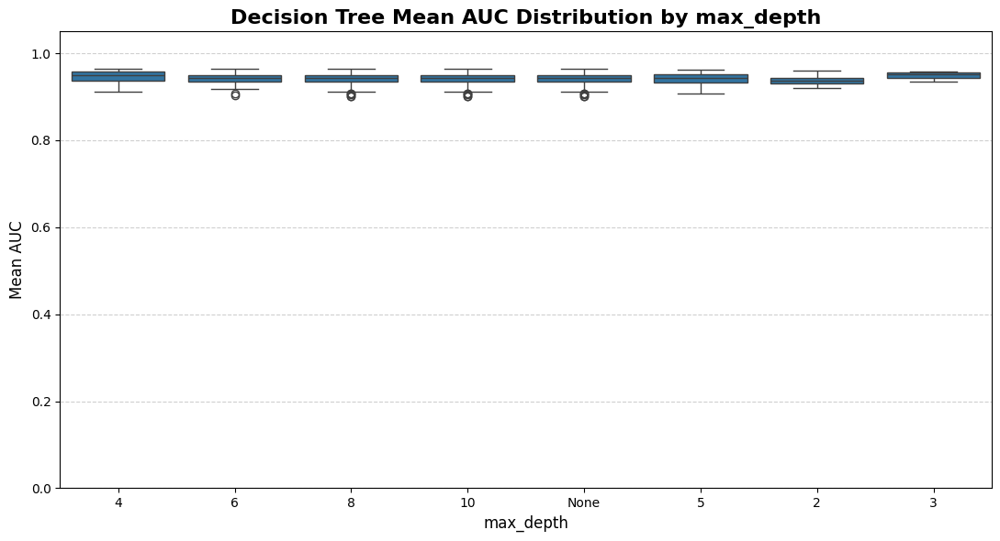

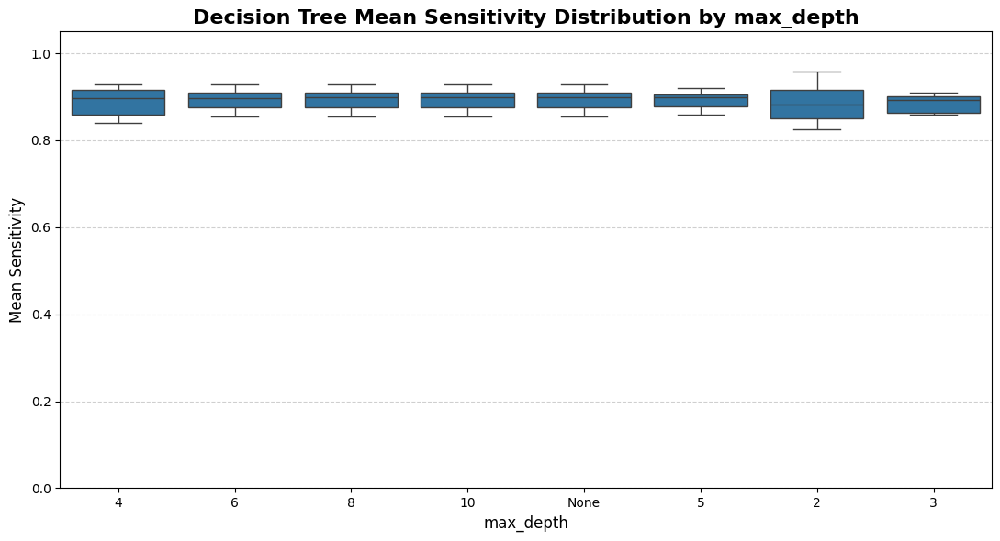

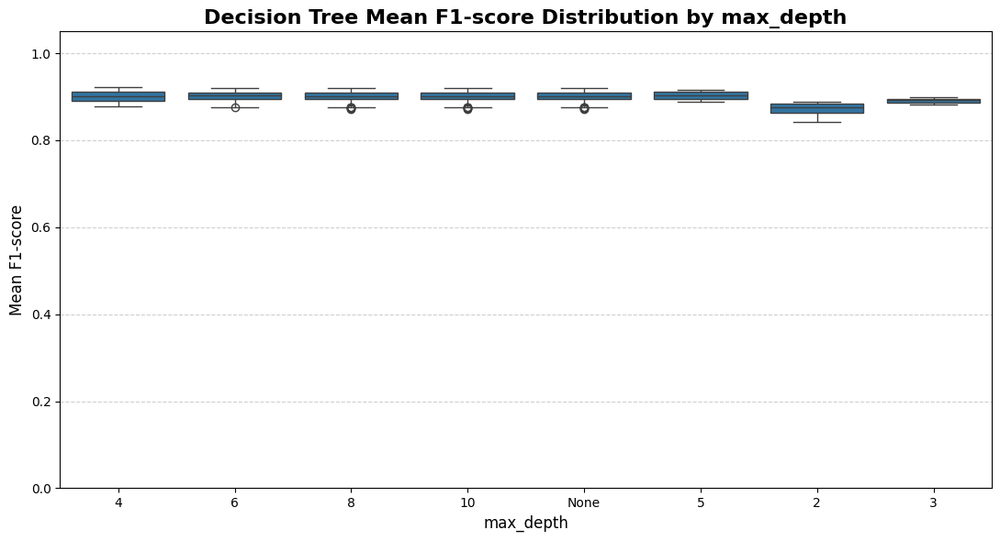

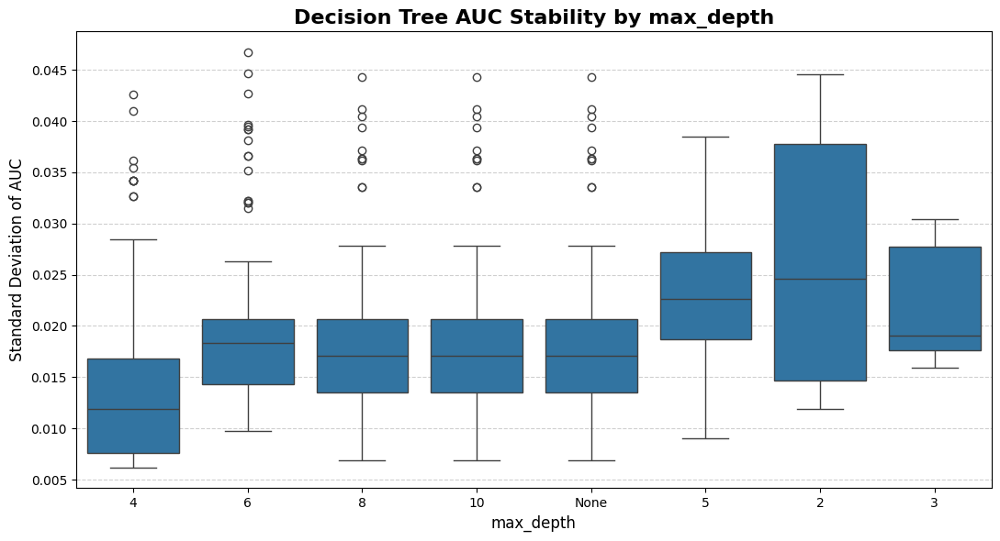

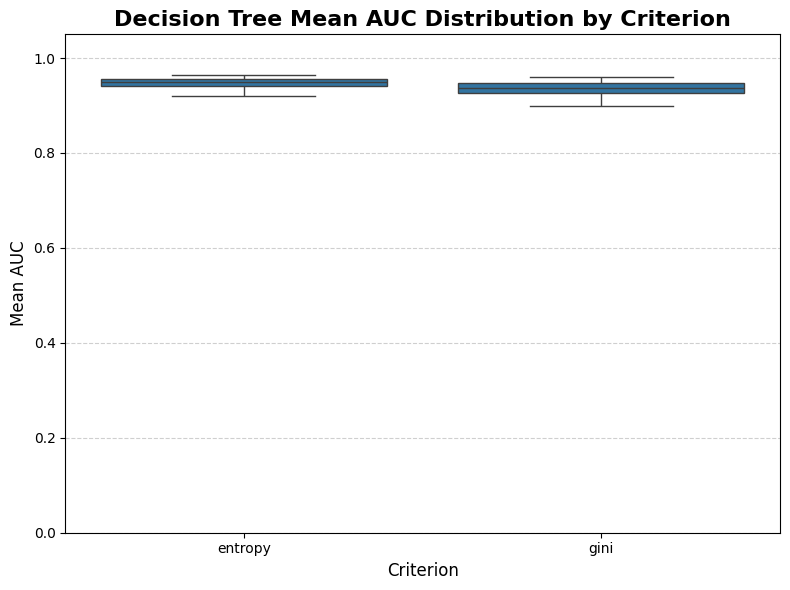

...

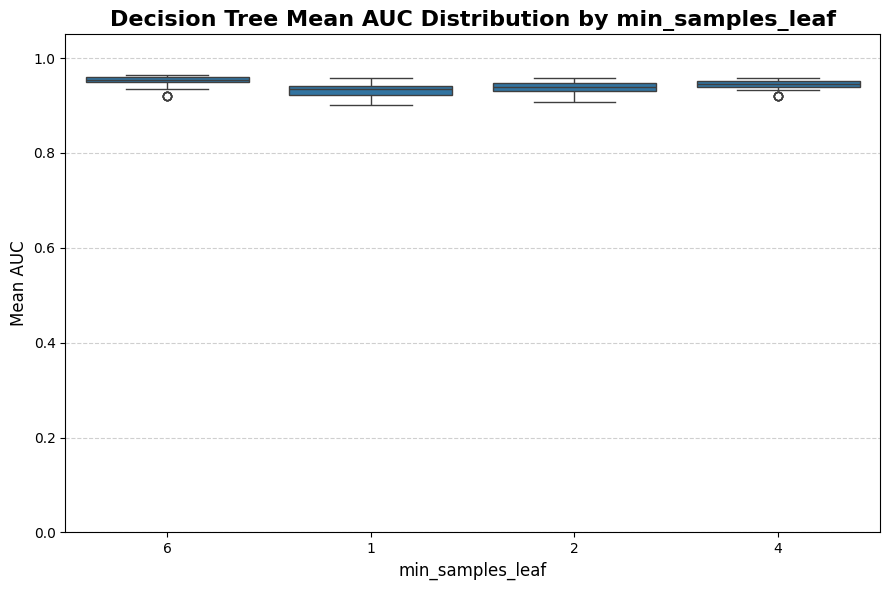

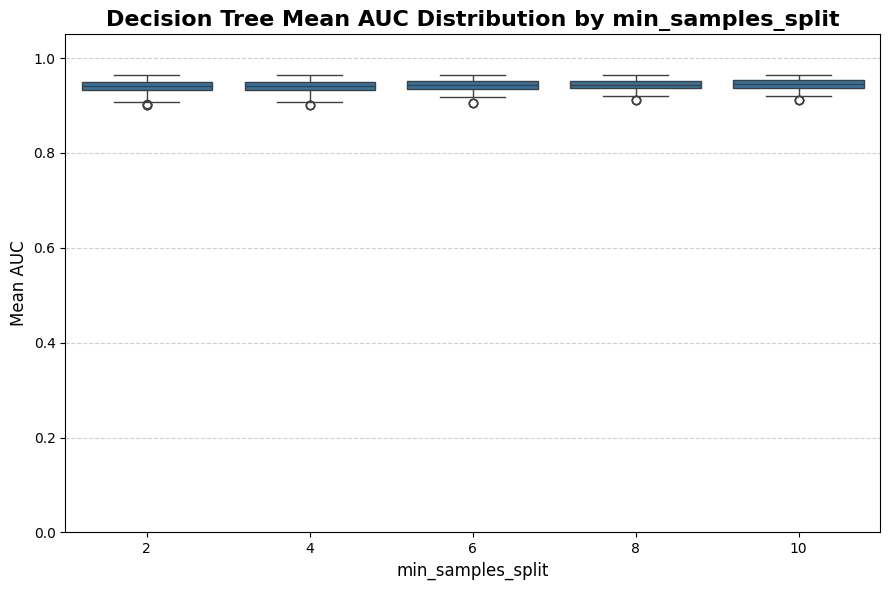

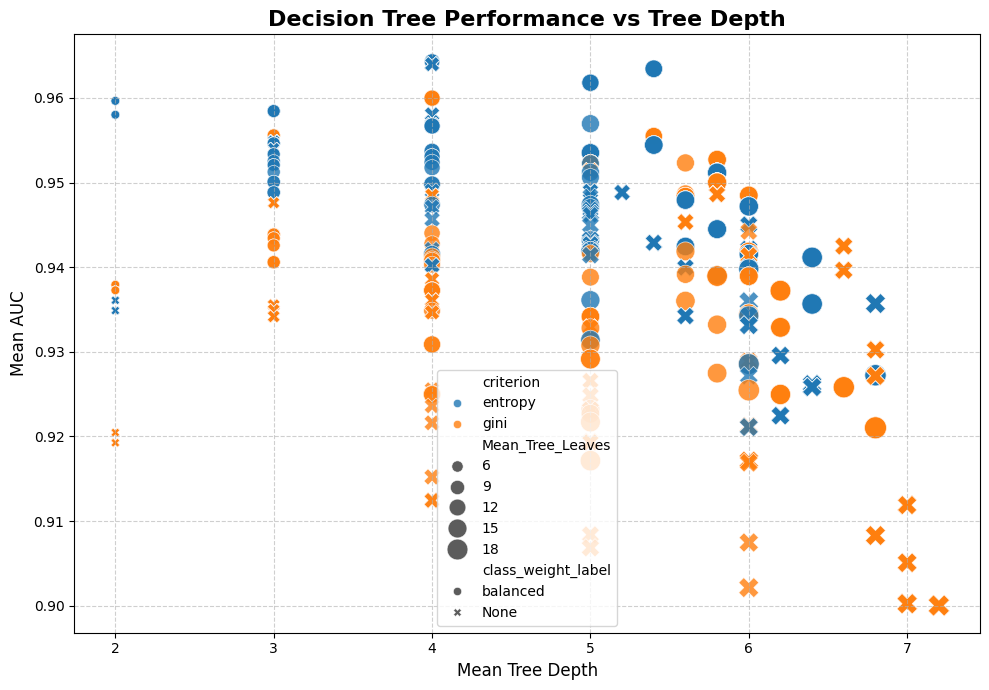

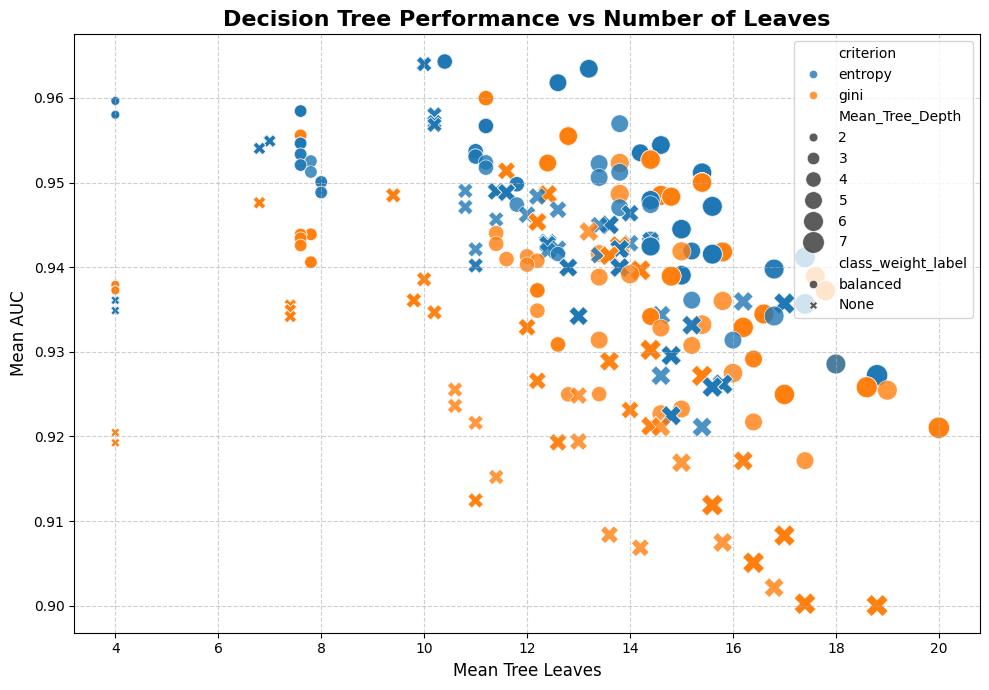

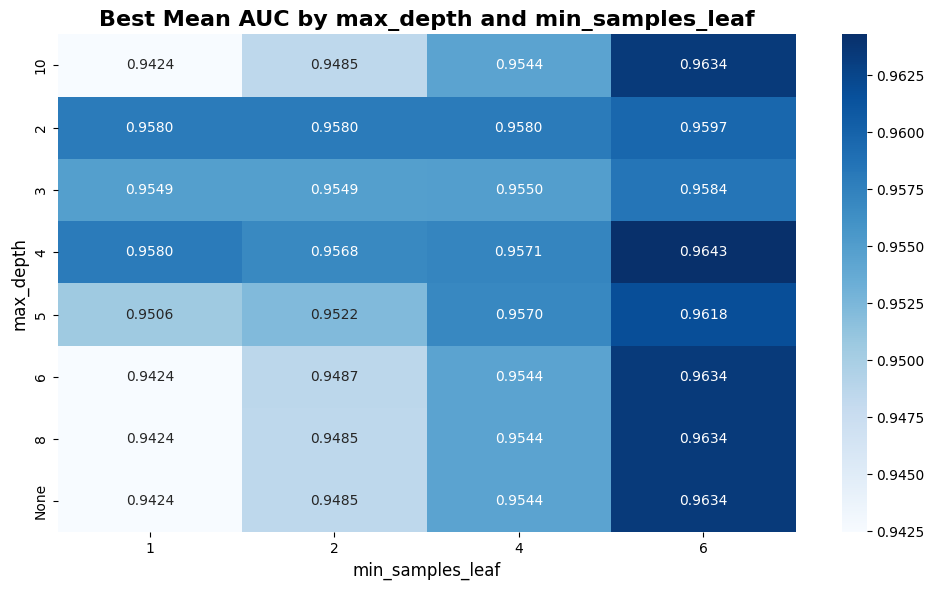

Decision Tree depth comparison:


,max_depth_label,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Mean_Accuracy_Average,Mean_Accuracy_Max,Std_AUC_Average,Std_AUC_Min,Mean_Tree_Depth_Average,Mean_Tree_Leaves_Average
3,4,0.946708,0.964302,0.888826,0.929236,0.900247,0.921198,0.927555,0.940273,0.015087,0.006185,4.000,10.890
0,10,0.940293,0.963447,0.893739,0.929347,0.901017,0.920535,0.927449,0.940258,0.019048,0.006876,6.035,14.735
6,8,0.940293,0.963447,0.893739,0.929347,0.901017,0.920535,0.927449,0.940258,0.019048,0.006876,6.035,14.735
7,None,0.940293,0.963447,0.893739,0.929347,0.901017,0.920535,0.927449,0.940258,0.019048,0.006876,6.035,14.735
5,6,0.941116,0.963447,0.892218,0.929347,0.901290,0.920535,0.927805,0.940258,0.020679,0.009794,5.745,14.355
4,5,0.940811,0.961798,0.892626,0.920044,0.902769,0.916441,0.928859,0.938472,0.022684,0.009069,5.000,13.315
1,2,0.937729,0.959650,0.886489,0.957586,0.870585,0.888377,0.902311,0.910433,0.027078,0.011874,2.000,4.000
2,3,0.948195,0.958449,0.886582,0.910520,0.891209,0.899254,0.919987,0.924468,0.021910,0.015923,3.000,7.390



Decision Tree criterion comparison:


,criterion,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min,Mean_Tree_Depth_Average,Mean_Tree_Leaves_Average
0,entropy,0.947789,0.964302,0.893404,0.957586,0.898893,0.920535,0.019843,0.006983,4.65375,11.588125
1,gini,0.936070,0.959977,0.888585,0.929236,0.893395,0.921198,0.021302,0.006185,4.80875,11.950625



Decision Tree min_samples_leaf comparison:


,min_samples_leaf,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min,Mean_Tree_Depth_Average,Mean_Tree_Leaves_Average
3,6,0.952505,0.964302,0.889168,0.948283,0.898865,0.921198,0.016680,0.006185,4.46875,10.4250
0,1,0.932418,0.958048,0.892448,0.957586,0.894634,0.920295,0.023851,0.008360,4.90000,12.6750
1,2,0.937750,0.958013,0.892064,0.957586,0.895352,0.920535,0.022258,0.006876,4.83125,12.3525
2,4,0.945046,0.958013,0.890299,0.957586,0.895725,0.913071,0.019501,0.008238,4.72500,11.6250



Decision Tree class_weight comparison:


,class_weight_label,Mean_AUC_Average,Mean_AUC_Max,Mean_Sensitivity_Average,Mean_Sensitivity_Max,Mean_F1_Average,Mean_F1_Max,Std_AUC_Average,Std_AUC_Min,Mean_Tree_Depth_Average,Mean_Tree_Leaves_Average
1,balanced,0.947047,0.964302,0.912773,0.957586,0.902831,0.921198,0.016070,0.006185,4.65875,12.280625
0,None,0.936813,0.963992,0.869217,0.924695,0.889457,0.917908,0.025075,0.006907,4.80375,11.258125


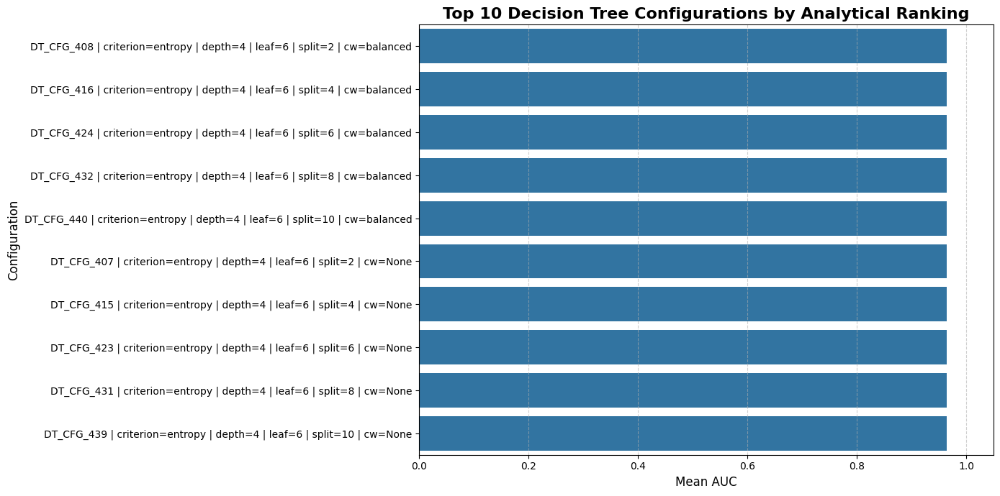


Decision Tree selection plots completed successfully.


In [86]:
# ============================================================
# BOX 84 — Decision Tree Selection Plots
#
# Purpose:
#   - Visualize Decision Tree hyperparameter search results
#   - Analyze performance trends across:
#         1) criterion
#         2) max_depth
#         3) min_samples_split
#         4) min_samples_leaf
#         5) class_weight
#   - Compare performance, stability, and interpretability
#   - Support fully analytical hyperparameter selection
#
# Visual Outputs:
#   1) Mean AUC by max_depth
#   2) Mean Sensitivity by max_depth
#   3) Mean F1-score by max_depth
#   4) Std AUC by max_depth
#   5) Mean AUC by criterion
#   6) Mean AUC by class_weight
#   7) Mean AUC vs tree depth
#   8) Top 10 configurations by analytical ranking
#
# Notes:
#   - No model training is performed in this box
#   - All plots are derived from previous Decision Tree CV results
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "dt_ranked_results_df",
    "dt_cv_summary_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(dt_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "dt_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(dt_cv_summary_results_df, pd.DataFrame):
    raise TypeError(
        "dt_cv_summary_results_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Prepare plotting DataFrame
# ------------------------------------------------------------
dt_plot_df = (
    dt_cv_summary_results_df.copy()
)

required_plot_columns = [
    "Config_ID",
    "criterion",
    "max_depth",
    "min_samples_split",
    "min_samples_leaf",
    "class_weight",
    "complexity_level",
    "interpretability",
    "overfitting_risk",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Sensitivity",
    "Mean_F1-score",
    "Mean_Accuracy",
    "Mean_Tree_Depth",
    "Mean_Tree_Leaves",
    "Mean_Tree_Nodes"
]

missing_plot_columns = [
    col for col in required_plot_columns
    if col not in dt_plot_df.columns
]

if len(missing_plot_columns) > 0:
    raise ValueError(
        f"Missing required plot columns: {missing_plot_columns}"
    )

# ------------------------------------------------------------
# Step 2 — Create readable categorical labels
# ------------------------------------------------------------
dt_plot_df["max_depth_label"] = (
    dt_plot_df["max_depth"].astype(str)
)

dt_plot_df["class_weight_label"] = (
    dt_plot_df["class_weight"].astype(str)
)

dt_plot_df["min_samples_split_label"] = (
    dt_plot_df["min_samples_split"].astype(str)
)

dt_plot_df["min_samples_leaf_label"] = (
    dt_plot_df["min_samples_leaf"].astype(str)
)

# ------------------------------------------------------------
# Step 3 — Plot Mean AUC by max_depth
# ------------------------------------------------------------
plt.figure(figsize=(11, 6))

sns.boxplot(
    data=dt_plot_df,
    x="max_depth_label",
    y="Mean_AUC"
)

plt.title(
    "Decision Tree Mean AUC Distribution by max_depth",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("max_depth", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Plot Mean Sensitivity by max_depth
# ------------------------------------------------------------
plt.figure(figsize=(11, 6))

sns.boxplot(
    data=dt_plot_df,
    x="max_depth_label",
    y="Mean_Sensitivity"
)

plt.title(
    "Decision Tree Mean Sensitivity Distribution by max_depth",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("max_depth", fontsize=12)
plt.ylabel("Mean Sensitivity", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Plot Mean F1-score by max_depth
# ------------------------------------------------------------
plt.figure(figsize=(11, 6))

sns.boxplot(
    data=dt_plot_df,
    x="max_depth_label",
    y="Mean_F1-score"
)

plt.title(
    "Decision Tree Mean F1-score Distribution by max_depth",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("max_depth", fontsize=12)
plt.ylabel("Mean F1-score", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Plot Std AUC by max_depth
# ------------------------------------------------------------
plt.figure(figsize=(11, 6))

sns.boxplot(
    data=dt_plot_df,
    x="max_depth_label",
    y="Std_AUC"
)

plt.title(
    "Decision Tree AUC Stability by max_depth",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("max_depth", fontsize=12)
plt.ylabel("Standard Deviation of AUC", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Plot Mean AUC by criterion
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=dt_plot_df,
    x="criterion",
    y="Mean_AUC"
)

plt.title(
    "Decision Tree Mean AUC Distribution by Criterion",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Criterion", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot Mean AUC by class_weight
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.boxplot(
    data=dt_plot_df,
    x="class_weight_label",
    y="Mean_AUC"
)

plt.title(
    "Decision Tree Mean AUC Distribution by Class Weight",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("class_weight", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot Mean AUC by min_samples_leaf
# ------------------------------------------------------------
plt.figure(figsize=(9, 6))

sns.boxplot(
    data=dt_plot_df,
    x="min_samples_leaf_label",
    y="Mean_AUC"
)

plt.title(
    "Decision Tree Mean AUC Distribution by min_samples_leaf",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("min_samples_leaf", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot Mean AUC by min_samples_split
# ------------------------------------------------------------
plt.figure(figsize=(9, 6))

sns.boxplot(
    data=dt_plot_df,
    x="min_samples_split_label",
    y="Mean_AUC"
)

plt.title(
    "Decision Tree Mean AUC Distribution by min_samples_split",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("min_samples_split", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot Mean AUC vs trained tree depth
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=dt_plot_df,
    x="Mean_Tree_Depth",
    y="Mean_AUC",
    hue="criterion",
    style="class_weight_label",
    size="Mean_Tree_Leaves",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "Decision Tree Performance vs Tree Depth",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean Tree Depth", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Plot Mean AUC vs number of leaves
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=dt_plot_df,
    x="Mean_Tree_Leaves",
    y="Mean_AUC",
    hue="criterion",
    style="class_weight_label",
    size="Mean_Tree_Depth",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "Decision Tree Performance vs Number of Leaves",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean Tree Leaves", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 13 — Performance heatmap by max_depth and min_samples_leaf
# ------------------------------------------------------------
dt_depth_leaf_heatmap_df = (
    dt_plot_df
    .groupby(
        [
            "max_depth_label",
            "min_samples_leaf"
        ]
    )
    .agg(
        Mean_AUC=(
            "Mean_AUC",
            "max"
        )
    )
    .reset_index()
    .pivot(
        index="max_depth_label",
        columns="min_samples_leaf",
        values="Mean_AUC"
    )
)

plt.figure(figsize=(10, 6))

sns.heatmap(
    dt_depth_leaf_heatmap_df,
    annot=True,
    fmt=".4f",
    cmap="Blues",
    cbar=True
)

plt.title(
    "Best Mean AUC by max_depth and min_samples_leaf",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("min_samples_leaf", fontsize=12)
plt.ylabel("max_depth", fontsize=12)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 14 — Create comparison tables
# ------------------------------------------------------------
dt_depth_comparison_df = (
    dt_plot_df
    .groupby("max_depth_label")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Mean_Accuracy_Average=("Mean_Accuracy", "mean"),
        Mean_Accuracy_Max=("Mean_Accuracy", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Tree_Depth_Average=("Mean_Tree_Depth", "mean"),
        Mean_Tree_Leaves_Average=("Mean_Tree_Leaves", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max",
            "Std_AUC_Min"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
)

dt_criterion_comparison_df = (
    dt_plot_df
    .groupby("criterion")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Tree_Depth_Average=("Mean_Tree_Depth", "mean"),
        Mean_Tree_Leaves_Average=("Mean_Tree_Leaves", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

dt_leaf_comparison_df = (
    dt_plot_df
    .groupby("min_samples_leaf")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Tree_Depth_Average=("Mean_Tree_Depth", "mean"),
        Mean_Tree_Leaves_Average=("Mean_Tree_Leaves", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

dt_class_weight_comparison_df = (
    dt_plot_df
    .groupby("class_weight_label")
    .agg(
        Mean_AUC_Average=("Mean_AUC", "mean"),
        Mean_AUC_Max=("Mean_AUC", "max"),
        Mean_Sensitivity_Average=("Mean_Sensitivity", "mean"),
        Mean_Sensitivity_Max=("Mean_Sensitivity", "max"),
        Mean_F1_Average=("Mean_F1-score", "mean"),
        Mean_F1_Max=("Mean_F1-score", "max"),
        Std_AUC_Average=("Std_AUC", "mean"),
        Std_AUC_Min=("Std_AUC", "min"),
        Mean_Tree_Depth_Average=("Mean_Tree_Depth", "mean"),
        Mean_Tree_Leaves_Average=("Mean_Tree_Leaves", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC_Max",
            "Mean_Sensitivity_Max"
        ],
        ascending=[
            False,
            False
        ]
    )
)

# ------------------------------------------------------------
# Step 15 — Display comparison tables
# ------------------------------------------------------------
print("Decision Tree depth comparison:")
display(
    dt_depth_comparison_df.round(6)
)

print("\nDecision Tree criterion comparison:")
display(
    dt_criterion_comparison_df.round(6)
)

print("\nDecision Tree min_samples_leaf comparison:")
display(
    dt_leaf_comparison_df.round(6)
)

print("\nDecision Tree class_weight comparison:")
display(
    dt_class_weight_comparison_df.round(6)
)

# ------------------------------------------------------------
# Step 16 — Create top configuration labels
# ------------------------------------------------------------
top_dt_plot_df = (
    dt_ranked_results_df
    .head(10)
    .copy()
)

top_dt_plot_df["Config_Label"] = (
    top_dt_plot_df["Config_ID"].astype(str)
    + " | criterion="
    + top_dt_plot_df["criterion"].astype(str)
    + " | depth="
    + top_dt_plot_df["max_depth"].astype(str)
    + " | leaf="
    + top_dt_plot_df["min_samples_leaf"].astype(str)
    + " | split="
    + top_dt_plot_df["min_samples_split"].astype(str)
    + " | cw="
    + top_dt_plot_df["class_weight"].astype(str)
)

# ------------------------------------------------------------
# Step 17 — Plot Top 10 configurations by Mean AUC
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_dt_plot_df,
    x="Mean_AUC",
    y="Config_Label"
)

plt.title(
    "Top 10 Decision Tree Configurations by Analytical Ranking",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean AUC", fontsize=12)
plt.ylabel("Configuration", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()


print(
    "\nDecision Tree selection plots "
    "completed successfully."
)

Decision Tree stability and generalization analysis is ready.

Top reliable Decision Tree configurations:


,Config_ID,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,complexity_level,interpretability,overfitting_risk,Mean_AUC,...,Mean_Tree_Nodes,Std_Tree_Nodes,AUC_Score,Sensitivity_Score,F1_Score_Normalized,AUC_Stability_Score,Accuracy_Stability_Score,Complexity_Simplicity_Score,Leaf_Simplicity_Score,Reliability_Score
0,DT_CFG_88,gini,4,2,6,balanced,Medium,High,Moderate,0.959977,...,21.4,1.67332,0.932712,0.784693,1.000000,1.000000,0.715911,0.615385,0.55,0.880817
1,DT_CFG_96,gini,4,4,6,balanced,Medium,High,Moderate,0.959977,...,21.4,1.67332,0.932712,0.784693,1.000000,1.000000,0.715911,0.615385,0.55,0.880817
2,DT_CFG_104,gini,4,6,6,balanced,Medium,High,Moderate,0.959977,...,21.4,1.67332,0.932712,0.784693,1.000000,1.000000,0.715911,0.615385,0.55,0.880817
3,DT_CFG_112,gini,4,8,6,balanced,Medium,High,Moderate,0.959977,...,21.4,1.67332,0.932712,0.784693,1.000000,1.000000,0.715911,0.615385,0.55,0.880817
4,DT_CFG_120,gini,4,10,6,balanced,Medium,High,Moderate,0.959977,...,21.4,1.67332,0.932712,0.784693,1.000000,1.000000,0.715911,0.615385,0.55,0.880817
5,DT_CFG_408,entropy,4,2,6,balanced,Medium,High,Moderate,0.964302,...,19.8,3.03315,1.000000,0.677881,0.903854,0.878507,0.489611,0.615385,0.60,0.833373
6,DT_CFG_416,entropy,4,4,6,balanced,Medium,High,Moderate,0.964302,...,19.8,3.03315,1.000000,0.677881,0.903854,0.878507,0.489611,0.615385,0.60,0.833373
7,DT_CFG_424,entropy,4,6,6,balanced,Medium,High,Moderate,0.964302,...,19.8,3.03315,1.000000,0.677881,0.903854,0.878507,0.489611,0.615385,0.60,0.833373
8,DT_CFG_432,entropy,4,8,6,balanced,Medium,High,Moderate,0.964302,...,19.8,3.03315,1.000000,0.677881,0.903854,0.878507,0.489611,0.615385,0.60,0.833373
9,DT_CFG_440,entropy,4,10,6,balanced,Medium,High,Moderate,0.964302,...,19.8,3.03315,1.000000,0.677881,0.903854,0.878507,0.489611,0.615385,0.60,0.833373



Depth-level stability summary:


,max_depth,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_F1_score,Std_F1_score,Mean_Tree_Depth,Std_Tree_Depth,Mean_Tree_Leaves,Std_Tree_Leaves
2,3,0.948195,0.021703,0.919987,0.026402,0.886582,0.085720,0.891209,0.038304,3.000,0.000000,7.390,0.699373
3,4,0.946708,0.020743,0.927555,0.024508,0.888826,0.079113,0.900247,0.038161,4.000,0.000000,10.890,1.548837
5,6,0.941116,0.023859,0.927805,0.022742,0.892218,0.071519,0.901290,0.034137,5.745,0.436407,14.355,2.240877
4,5,0.940811,0.024541,0.928859,0.021074,0.892626,0.066447,0.902769,0.031306,5.000,0.000000,13.315,2.031278
0,10,0.940293,0.023657,0.927449,0.022520,0.893739,0.071665,0.901017,0.033615,6.035,0.768278,14.735,2.421660
6,8,0.940293,0.023657,0.927449,0.022520,0.893739,0.071665,0.901017,0.033615,6.035,0.768278,14.735,2.421660
7,None,0.940293,0.023657,0.927449,0.022520,0.893739,0.071665,0.901017,0.033615,6.035,0.768278,14.735,2.421660
1,2,0.937729,0.030300,0.902311,0.030430,0.886489,0.090953,0.870585,0.041756,2.000,0.000000,4.000,0.000000



Complexity-level stability summary:


,complexity_level,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_F1_score,Std_F1_score,Mean_Tree_Depth,Mean_Tree_Leaves
1,Low,0.942962,0.026853,0.911149,0.029812,0.886536,0.088320,0.880897,0.041350,2.500,5.695000
2,Medium,0.942879,0.023246,0.928073,0.022806,0.891223,0.072506,0.901435,0.034636,4.915,12.853333
0,High,0.940293,0.023643,0.927449,0.022506,0.893739,0.071620,0.901017,0.033593,6.035,14.735000
3,Very High,0.940293,0.023657,0.927449,0.022520,0.893739,0.071665,0.901017,0.033615,6.035,14.735000



Overfitting-risk summary:


,overfitting_risk,Mean_AUC,Std_AUC,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Mean_F1_score,Mean_Tree_Depth,Mean_Tree_Leaves
1,Low,0.942962,0.026853,0.911149,0.029812,0.886536,0.880897,2.500,5.695000
2,Moderate,0.942879,0.023246,0.928073,0.022806,0.891223,0.901435,4.915,12.853333
0,High,0.940293,0.023638,0.927449,0.022502,0.893739,0.901017,6.035,14.735000


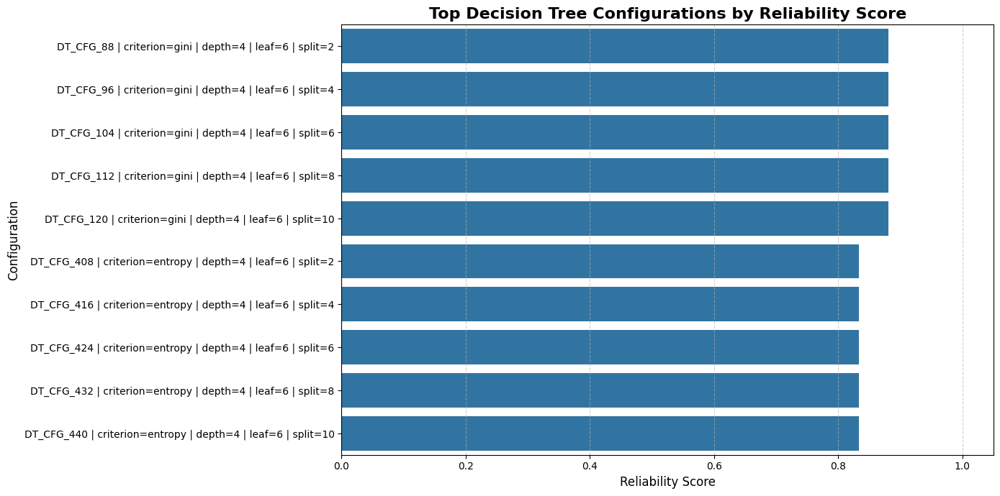

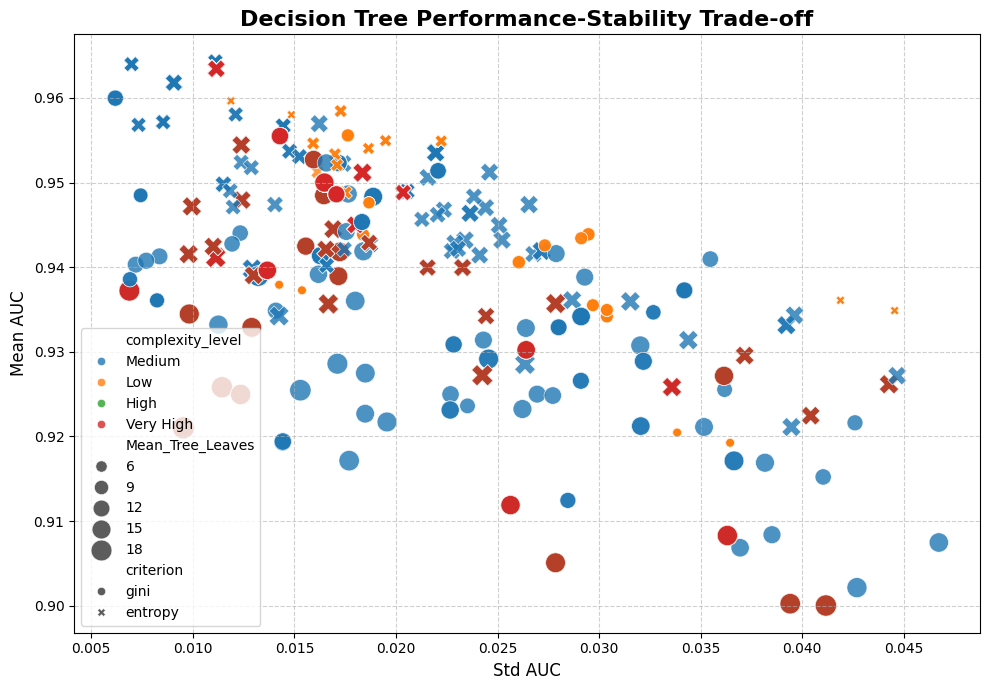

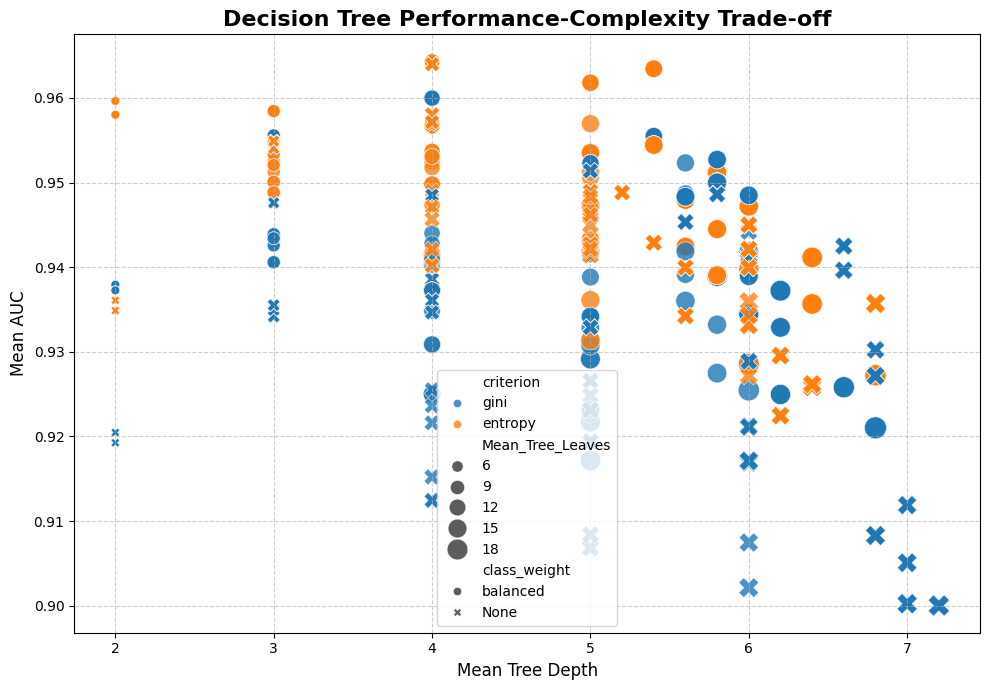

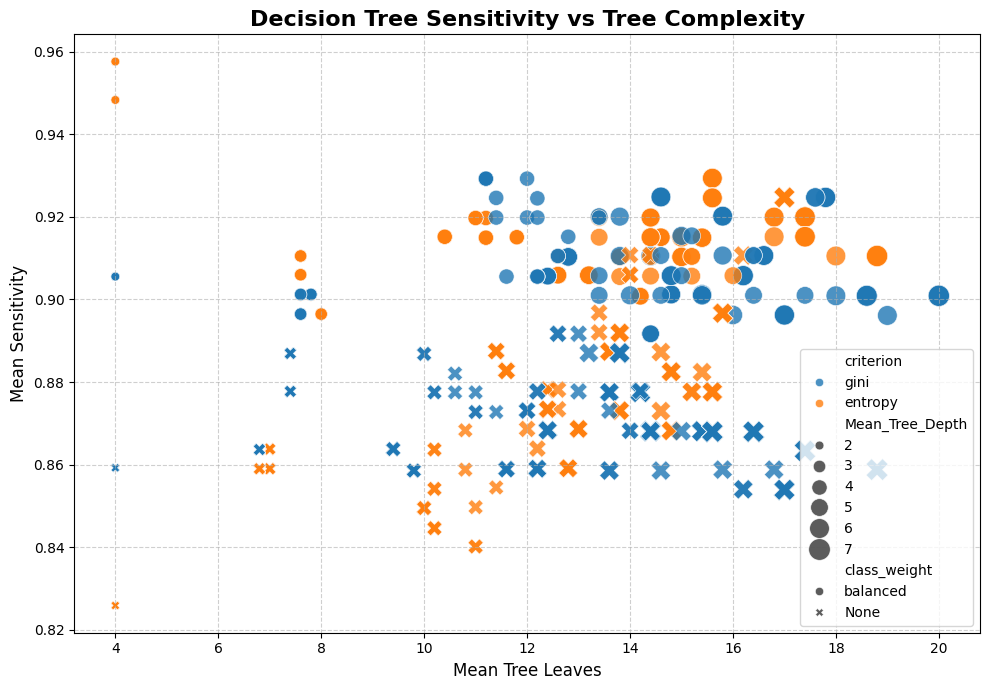

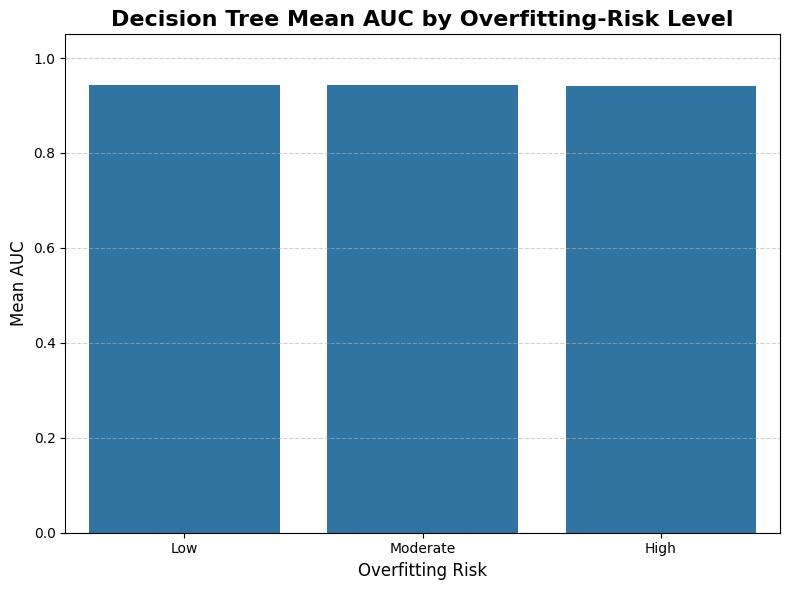


Decision Tree stability and generalization analysis completed successfully.


In [87]:
# ============================================================
# BOX 85 — Decision Tree Stability and Generalization Analysis
#
# Purpose:
#   - Analyze Decision Tree stability across folds
#   - Evaluate generalization behavior using CV variability
#   - Compare performance with tree complexity
#   - Identify reliable and interpretable configurations
#
# Analytical Dimensions:
#   1) AUC stability
#   2) Accuracy stability
#   3) F1-score stability
#   4) Sensitivity stability
#   5) Tree-depth stability
#   6) Leaf-count stability
#   7) Performance-complexity trade-off
#
# Notes:
#   - No model training is performed in this box
#   - All results are derived from previous Decision Tree CV outputs
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "dt_ranked_results_df",
    "dt_cv_fold_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(dt_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "dt_ranked_results_df must be a pandas DataFrame."
    )

if not isinstance(dt_cv_fold_results_df, pd.DataFrame):
    raise TypeError(
        "dt_cv_fold_results_df must be a pandas DataFrame."
    )

if dt_ranked_results_df.empty:
    raise ValueError(
        "dt_ranked_results_df is empty."
    )

if dt_cv_fold_results_df.empty:
    raise ValueError(
        "dt_cv_fold_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Build reliability analysis table
# ------------------------------------------------------------
dt_reliability_analysis_df = (
    dt_ranked_results_df[
        [
            "Config_ID",
            "criterion",
            "max_depth",
            "min_samples_split",
            "min_samples_leaf",
            "class_weight",
            "complexity_level",
            "interpretability",
            "overfitting_risk",
            "Mean_AUC",
            "Std_AUC",
            "Mean_Accuracy",
            "Std_Accuracy",
            "Mean_Sensitivity",
            "Std_Sensitivity",
            "Mean_F1-score",
            "Std_F1-score",
            "Mean_Tree_Depth",
            "Std_Tree_Depth",
            "Mean_Tree_Leaves",
            "Std_Tree_Leaves",
            "Mean_Tree_Nodes",
            "Std_Tree_Nodes"
        ]
    ]
    .copy()
)

# ------------------------------------------------------------
# Step 2 — Define min-max normalization utility
# ------------------------------------------------------------
def min_max_normalize(series):
    """
    Apply min-max normalization.
    If all values are equal, return ones.
    """

    min_value = series.min()
    max_value = series.max()

    if max_value == min_value:
        return pd.Series(
            np.ones(len(series)),
            index=series.index
        )

    return (
        (series - min_value)
        / (max_value - min_value)
    )

# ------------------------------------------------------------
# Step 3 — Compute normalized reliability components
# ------------------------------------------------------------
dt_reliability_analysis_df["AUC_Score"] = (
    min_max_normalize(
        dt_reliability_analysis_df["Mean_AUC"]
    )
)

dt_reliability_analysis_df["Sensitivity_Score"] = (
    min_max_normalize(
        dt_reliability_analysis_df["Mean_Sensitivity"]
    )
)

dt_reliability_analysis_df["F1_Score_Normalized"] = (
    min_max_normalize(
        dt_reliability_analysis_df["Mean_F1-score"]
    )
)

dt_reliability_analysis_df["AUC_Stability_Score"] = (
    1
    - min_max_normalize(
        dt_reliability_analysis_df["Std_AUC"]
    )
)

dt_reliability_analysis_df["Accuracy_Stability_Score"] = (
    1
    - min_max_normalize(
        dt_reliability_analysis_df["Std_Accuracy"]
    )
)

dt_reliability_analysis_df["Complexity_Simplicity_Score"] = (
    1
    - min_max_normalize(
        dt_reliability_analysis_df["Mean_Tree_Depth"]
    )
)

dt_reliability_analysis_df["Leaf_Simplicity_Score"] = (
    1
    - min_max_normalize(
        dt_reliability_analysis_df["Mean_Tree_Leaves"]
    )
)

# ------------------------------------------------------------
# Step 4 — Compute overall reliability score
# ------------------------------------------------------------
dt_reliability_analysis_df["Reliability_Score"] = (
    0.30 * dt_reliability_analysis_df["AUC_Score"]
    + 0.20 * dt_reliability_analysis_df["Sensitivity_Score"]
    + 0.20 * dt_reliability_analysis_df["F1_Score_Normalized"]
    + 0.15 * dt_reliability_analysis_df["AUC_Stability_Score"]
    + 0.05 * dt_reliability_analysis_df["Accuracy_Stability_Score"]
    + 0.05 * dt_reliability_analysis_df["Complexity_Simplicity_Score"]
    + 0.05 * dt_reliability_analysis_df["Leaf_Simplicity_Score"]
)

dt_reliability_analysis_df = (
    dt_reliability_analysis_df
    .sort_values(
        by=[
            "Reliability_Score",
            "Mean_AUC",
            "Std_AUC",
            "Mean_Tree_Depth"
        ],
        ascending=[
            False,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 5 — Extract top reliable configurations
# ------------------------------------------------------------
dt_stability_generalization_top_df = (
    dt_reliability_analysis_df
    .head(10)
    .copy()
)

# ------------------------------------------------------------
# Step 6 — Depth-level stability summary
# ------------------------------------------------------------
dt_depth_stability_summary_df = (
    dt_cv_fold_results_df
    .groupby("max_depth")
    .agg(
        Mean_AUC=("AUC", "mean"),
        Std_AUC=("AUC", "std"),
        Mean_Accuracy=("Accuracy", "mean"),
        Std_Accuracy=("Accuracy", "std"),
        Mean_Sensitivity=("Sensitivity", "mean"),
        Std_Sensitivity=("Sensitivity", "std"),
        Mean_F1_score=("F1-score", "mean"),
        Std_F1_score=("F1-score", "std"),
        Mean_Tree_Depth=("trained_tree_depth", "mean"),
        Std_Tree_Depth=("trained_tree_depth", "std"),
        Mean_Tree_Leaves=("trained_tree_leaves", "mean"),
        Std_Tree_Leaves=("trained_tree_leaves", "std")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC",
            "Std_AUC",
            "Mean_Tree_Depth"
        ],
        ascending=[
            False,
            True,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 7 — Complexity-level stability summary
# ------------------------------------------------------------
dt_complexity_stability_summary_df = (
    dt_cv_fold_results_df
    .groupby("complexity_level")
    .agg(
        Mean_AUC=("AUC", "mean"),
        Std_AUC=("AUC", "std"),
        Mean_Accuracy=("Accuracy", "mean"),
        Std_Accuracy=("Accuracy", "std"),
        Mean_Sensitivity=("Sensitivity", "mean"),
        Std_Sensitivity=("Sensitivity", "std"),
        Mean_F1_score=("F1-score", "mean"),
        Std_F1_score=("F1-score", "std"),
        Mean_Tree_Depth=("trained_tree_depth", "mean"),
        Mean_Tree_Leaves=("trained_tree_leaves", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC",
            "Std_AUC"
        ],
        ascending=[
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 8 — Overfitting-risk summary
# ------------------------------------------------------------
dt_overfitting_risk_summary_df = (
    dt_cv_fold_results_df
    .groupby("overfitting_risk")
    .agg(
        Mean_AUC=("AUC", "mean"),
        Std_AUC=("AUC", "std"),
        Mean_Accuracy=("Accuracy", "mean"),
        Std_Accuracy=("Accuracy", "std"),
        Mean_Sensitivity=("Sensitivity", "mean"),
        Mean_F1_score=("F1-score", "mean"),
        Mean_Tree_Depth=("trained_tree_depth", "mean"),
        Mean_Tree_Leaves=("trained_tree_leaves", "mean")
    )
    .reset_index()
    .sort_values(
        by=[
            "Mean_AUC",
            "Std_AUC"
        ],
        ascending=[
            False,
            True
        ]
    )
)

# ------------------------------------------------------------
# Step 9 — Display stability and reliability reports
# ------------------------------------------------------------
print(
    "Decision Tree stability and generalization analysis is ready."
)

print("\nTop reliable Decision Tree configurations:")

display(
    dt_stability_generalization_top_df
    .round(6)
)

print("\nDepth-level stability summary:")

display(
    dt_depth_stability_summary_df
    .round(6)
)

print("\nComplexity-level stability summary:")

display(
    dt_complexity_stability_summary_df
    .round(6)
)

print("\nOverfitting-risk summary:")

display(
    dt_overfitting_risk_summary_df
    .round(6)
)

# ------------------------------------------------------------
# Step 10 — Plot reliability score for top configurations
# ------------------------------------------------------------
top_dt_reliability_plot_df = (
    dt_stability_generalization_top_df.copy()
)

top_dt_reliability_plot_df["Config_Label"] = (
    top_dt_reliability_plot_df["Config_ID"].astype(str)
    + " | criterion="
    + top_dt_reliability_plot_df["criterion"].astype(str)
    + " | depth="
    + top_dt_reliability_plot_df["max_depth"].astype(str)
    + " | leaf="
    + top_dt_reliability_plot_df["min_samples_leaf"].astype(str)
    + " | split="
    + top_dt_reliability_plot_df["min_samples_split"].astype(str)
)

plt.figure(figsize=(14, 7))

sns.barplot(
    data=top_dt_reliability_plot_df,
    x="Reliability_Score",
    y="Config_Label"
)

plt.title(
    "Top Decision Tree Configurations by Reliability Score",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Reliability Score", fontsize=12)
plt.ylabel("Configuration", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot performance-stability trade-off
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=dt_reliability_analysis_df,
    x="Std_AUC",
    y="Mean_AUC",
    hue="complexity_level",
    style="criterion",
    size="Mean_Tree_Leaves",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "Decision Tree Performance-Stability Trade-off",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Std AUC", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Plot performance-complexity trade-off
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=dt_reliability_analysis_df,
    x="Mean_Tree_Depth",
    y="Mean_AUC",
    hue="criterion",
    style="class_weight",
    size="Mean_Tree_Leaves",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "Decision Tree Performance-Complexity Trade-off",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean Tree Depth", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 13 — Plot sensitivity vs complexity
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=dt_reliability_analysis_df,
    x="Mean_Tree_Leaves",
    y="Mean_Sensitivity",
    hue="criterion",
    style="class_weight",
    size="Mean_Tree_Depth",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "Decision Tree Sensitivity vs Tree Complexity",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean Tree Leaves", fontsize=12)
plt.ylabel("Mean Sensitivity", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 14 — Plot overfitting-risk summary
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.barplot(
    data=dt_overfitting_risk_summary_df,
    x="overfitting_risk",
    y="Mean_AUC"
)

plt.title(
    "Decision Tree Mean AUC by Overfitting-Risk Level",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Overfitting Risk", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()


print(
    "\nDecision Tree stability and generalization "
    "analysis completed successfully."
)

In [88]:
# ============================================================
# BOX 86 — Analytical Best Decision Tree Configuration Selection
#
# Purpose:
#   - Select the best Decision Tree configuration analytically
#   - Avoid manual hyperparameter selection
#   - Apply a fully reproducible ranking strategy
#   - Combine performance, stability, simplicity, and interpretability
#
# Selection Priority:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Lower Mean_Tree_Depth
#   6) Lower Mean_Tree_Leaves
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "dt_ranked_results_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(dt_ranked_results_df, pd.DataFrame):
    raise TypeError(
        "dt_ranked_results_df must be a pandas DataFrame."
    )

if dt_ranked_results_df.empty:
    raise ValueError(
        "dt_ranked_results_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Add interpretability and risk scores
# ------------------------------------------------------------
interpretability_score_map = {
    "Very High": 0,
    "High": 1,
    "Medium": 2,
    "Low": 3
}

overfitting_risk_score_map = {
    "Low": 0,
    "Moderate": 1,
    "High": 2
}

complexity_score_map = {
    "Low": 0,
    "Medium": 1,
    "High": 2,
    "Very High": 3
}

dt_selection_df = (
    dt_ranked_results_df.copy()
)

dt_selection_df["Interpretability_Score"] = (
    dt_selection_df["interpretability"]
    .map(interpretability_score_map)
    .fillna(99)
)

dt_selection_df["Overfitting_Risk_Score"] = (
    dt_selection_df["overfitting_risk"]
    .map(overfitting_risk_score_map)
    .fillna(99)
)

dt_selection_df["Complexity_Score"] = (
    dt_selection_df["complexity_level"]
    .map(complexity_score_map)
    .fillna(99)
)

# ------------------------------------------------------------
# Step 2 — Apply final analytical ranking strategy
# ------------------------------------------------------------
dt_final_ranking_df = (
    dt_selection_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Mean_Tree_Depth",
            "Mean_Tree_Leaves",
            "Interpretability_Score",
            "Overfitting_Risk_Score",
            "Complexity_Score",
            "min_samples_leaf",
            "min_samples_split"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True,
            True,
            True,
            True,
            True,
            False,
            False
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 3 — Select best configuration
# ------------------------------------------------------------
best_dt_configuration = (
    dt_final_ranking_df.iloc[0]
)

# ------------------------------------------------------------
# Step 4 — Extract selected hyperparameters
# ------------------------------------------------------------
BEST_DT_CONFIG_ID = (
    best_dt_configuration["Config_ID"]
)

BEST_DT_CRITERION = (
    best_dt_configuration["criterion"]
)

BEST_DT_MAX_DEPTH = (
    None
    if str(best_dt_configuration["max_depth"]) == "None"
    else int(best_dt_configuration["max_depth"])
)

BEST_DT_MIN_SAMPLES_SPLIT = int(
    best_dt_configuration["min_samples_split"]
)

BEST_DT_MIN_SAMPLES_LEAF = int(
    best_dt_configuration["min_samples_leaf"]
)

BEST_DT_CLASS_WEIGHT = (
    None
    if str(best_dt_configuration["class_weight"]) == "None"
    else best_dt_configuration["class_weight"]
)

BEST_DT_RANDOM_STATE = 42

# ------------------------------------------------------------
# Step 5 — Create best-configuration report
# ------------------------------------------------------------
best_dt_configuration_report = {

    "Config_ID":
        BEST_DT_CONFIG_ID,

    "criterion":
        BEST_DT_CRITERION,

    "max_depth":
        str(BEST_DT_MAX_DEPTH),

    "min_samples_split":
        BEST_DT_MIN_SAMPLES_SPLIT,

    "min_samples_leaf":
        BEST_DT_MIN_SAMPLES_LEAF,

    "class_weight":
        str(BEST_DT_CLASS_WEIGHT),

    "complexity_level":
        best_dt_configuration["complexity_level"],

    "interpretability":
        best_dt_configuration["interpretability"],

    "overfitting_risk":
        best_dt_configuration["overfitting_risk"],

    "Mean_Accuracy":
        best_dt_configuration["Mean_Accuracy"],

    "Std_Accuracy":
        best_dt_configuration["Std_Accuracy"],

    "Mean_Sensitivity":
        best_dt_configuration["Mean_Sensitivity"],

    "Std_Sensitivity":
        best_dt_configuration["Std_Sensitivity"],

    "Mean_Specificity":
        best_dt_configuration["Mean_Specificity"],

    "Std_Specificity":
        best_dt_configuration["Std_Specificity"],

    "Mean_F1-score":
        best_dt_configuration["Mean_F1-score"],

    "Std_F1-score":
        best_dt_configuration["Std_F1-score"],

    "Mean_AUC":
        best_dt_configuration["Mean_AUC"],

    "Std_AUC":
        best_dt_configuration["Std_AUC"],

    "Mean_Tree_Depth":
        best_dt_configuration["Mean_Tree_Depth"],

    "Mean_Tree_Leaves":
        best_dt_configuration["Mean_Tree_Leaves"],

    "Mean_Tree_Nodes":
        best_dt_configuration["Mean_Tree_Nodes"]
}

best_dt_configuration_df = pd.DataFrame(
    [best_dt_configuration_report]
)

# ------------------------------------------------------------
# Step 6 — Create top-5 comparison table
# ------------------------------------------------------------
top5_dt_configurations_df = (
    dt_final_ranking_df
    .head(5)
    .copy()
)

top5_display_columns = [
    "Config_ID",
    "criterion",
    "max_depth",
    "min_samples_split",
    "min_samples_leaf",
    "class_weight",
    "complexity_level",
    "interpretability",
    "overfitting_risk",
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Tree_Depth",
    "Mean_Tree_Leaves"
]

top5_dt_configurations_df = (
    top5_dt_configurations_df[
        top5_display_columns
    ]
)

# ------------------------------------------------------------
# Step 7 — Create rounded display tables
# ------------------------------------------------------------
best_dt_configuration_display_df = (
    best_dt_configuration_df.copy()
)

best_numeric_columns = [
    col for col in best_dt_configuration_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or col in [
            "min_samples_split",
            "min_samples_leaf"
        ]
    )
]

best_dt_configuration_display_df[
    best_numeric_columns
] = (
    best_dt_configuration_display_df[
        best_numeric_columns
    ].round(6)
)

top5_dt_display_df = (
    top5_dt_configurations_df.copy()
)

top5_numeric_columns = [
    col for col in top5_dt_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or col in [
            "min_samples_split",
            "min_samples_leaf"
        ]
    )
]

top5_dt_display_df[
    top5_numeric_columns
] = (
    top5_dt_display_df[
        top5_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 8 — Create analytical interpretation report
# ------------------------------------------------------------
dt_selection_interpretation = {

    "Selected_Model":
        "Decision Tree",

    "Selection_Method":
        "Fully Analytical Cross-Validation Ranking",

    "Primary_Criterion":
        "Highest Mean_AUC",

    "Secondary_Criterion":
        "Highest Mean_Sensitivity",

    "Tertiary_Criterion":
        "Highest Mean_F1-score",

    "Stability_Criterion":
        "Lowest Std_AUC",

    "Simplicity_Criterion":
        "Lower Mean_Tree_Depth and Mean_Tree_Leaves",

    "Interpretability_Criterion":
        "Higher interpretability in case of ties",

    "Overfitting_Control_Criterion":
        "Lower overfitting-risk level in case of ties"
}

dt_selection_interpretation_df = pd.DataFrame(
    [dt_selection_interpretation]
)

# ------------------------------------------------------------
# Step 9 — Store final metadata
# ------------------------------------------------------------
best_dt_metadata = {

    "model_name":
        "Decision Tree",

    "config_id":
        BEST_DT_CONFIG_ID,

    "criterion":
        BEST_DT_CRITERION,

    "max_depth":
        BEST_DT_MAX_DEPTH,

    "min_samples_split":
        BEST_DT_MIN_SAMPLES_SPLIT,

    "min_samples_leaf":
        BEST_DT_MIN_SAMPLES_LEAF,

    "class_weight":
        BEST_DT_CLASS_WEIGHT,

    "random_state":
        BEST_DT_RANDOM_STATE
}

# ------------------------------------------------------------
# Step 10 — Display analytical selection results
# ------------------------------------------------------------
print(
    "Analytical best Decision Tree configuration selected."
)

print("\nSelection criteria:")
display(
    dt_selection_interpretation_df
)

print("\nBest Decision Tree configuration:")
display(
    best_dt_configuration_display_df
)

print("\nTop 5 ranked configurations:")
display(
    top5_dt_display_df
)

# ------------------------------------------------------------
# Step 11 — Final confirmation
# ------------------------------------------------------------
print("\nSelected hyperparameters:")
print(f"criterion          : {BEST_DT_CRITERION}")
print(f"max_depth          : {BEST_DT_MAX_DEPTH}")
print(f"min_samples_split  : {BEST_DT_MIN_SAMPLES_SPLIT}")
print(f"min_samples_leaf   : {BEST_DT_MIN_SAMPLES_LEAF}")
print(f"class_weight       : {BEST_DT_CLASS_WEIGHT}")

print(
    "\nAnalytical Decision Tree model selection "
    "completed successfully."
)

Analytical best Decision Tree configuration selected.

Selection criteria:


,Selected_Model,Selection_Method,Primary_Criterion,Secondary_Criterion,Tertiary_Criterion,Stability_Criterion,Simplicity_Criterion,Interpretability_Criterion,Overfitting_Control_Criterion
0,Decision Tree,Fully Analytical Cross-Validation Ranking,Highest Mean_AUC,Highest Mean_Sensitivity,Highest Mean_F1-score,Lowest Std_AUC,Lower Mean_Tree_Depth and Mean_Tree_Leaves,Higher interpretability in case of ties,Lower overfitting-risk level in case of ties



Best Decision Tree configuration:


,Config_ID,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,complexity_level,interpretability,overfitting_risk,Mean_Accuracy,...,Std_Sensitivity,Mean_Specificity,Std_Specificity,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Mean_Tree_Depth,Mean_Tree_Leaves,Mean_Tree_Nodes
0,DT_CFG_440,entropy,4,10,6,balanced,Medium,High,Moderate,0.934995,...,0.060975,0.94687,0.054135,0.913496,0.026102,0.964302,0.01111,4.0,10.4,19.8



Top 5 ranked configurations:


,Config_ID,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,complexity_level,interpretability,overfitting_risk,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC,Mean_Tree_Depth,Mean_Tree_Leaves
0,DT_CFG_440,entropy,4,10,6,balanced,Medium,High,Moderate,0.934995,0.915172,0.94687,0.913496,0.964302,0.01111,4.0,10.4
1,DT_CFG_432,entropy,4,8,6,balanced,Medium,High,Moderate,0.934995,0.915172,0.94687,0.913496,0.964302,0.01111,4.0,10.4
2,DT_CFG_424,entropy,4,6,6,balanced,Medium,High,Moderate,0.934995,0.915172,0.94687,0.913496,0.964302,0.01111,4.0,10.4
3,DT_CFG_416,entropy,4,4,6,balanced,Medium,High,Moderate,0.934995,0.915172,0.94687,0.913496,0.964302,0.01111,4.0,10.4
4,DT_CFG_408,entropy,4,2,6,balanced,Medium,High,Moderate,0.934995,0.915172,0.94687,0.913496,0.964302,0.01111,4.0,10.4



Selected hyperparameters:
criterion          : entropy
max_depth          : 4
min_samples_split  : 10
min_samples_leaf   : 6
class_weight       : balanced

Analytical Decision Tree model selection completed successfully.


In [89]:
# ============================================================
# BOX 87 — Final Decision Tree 5-Fold Evaluation
#
# Purpose:
#   - Evaluate the analytically selected Decision Tree model
#     using Stratified 5-Fold Cross-Validation
#   - Compute fold-level classification metrics
#   - Compute tree-complexity statistics
#   - Store trained models and ROC information
#   - Prepare final evaluation artifacts
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# Complexity Metrics:
#   - Tree depth
#   - Number of leaves
#   - Number of nodes
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "BEST_DT_CRITERION",
    "BEST_DT_MAX_DEPTH",
    "BEST_DT_MIN_SAMPLES_SPLIT",
    "BEST_DT_MIN_SAMPLES_LEAF",
    "BEST_DT_CLASS_WEIGHT",
    "BEST_DT_RANDOM_STATE",
    "compute_binary_classification_metrics",
    "compute_roc_curve_data"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:

    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Initialize storage containers
# ------------------------------------------------------------
final_dt_fold_results = []

final_dt_confusion_matrices = []

final_dt_roc_data = []

final_dt_trained_models = []

# ------------------------------------------------------------
# Step 2 — Perform final 5-Fold evaluation
# ------------------------------------------------------------
for fold_data in cv5_scaled_folds:

    # --------------------------------------------------------
    # Step 2.1 — Extract fold information
    # --------------------------------------------------------
    fold_number = fold_data["fold_number"]

    X_train = fold_data["X_train_scaled"]

    X_val = fold_data["X_validation_scaled"]

    y_train = fold_data["y_train"]

    y_val = fold_data["y_validation"]

    # --------------------------------------------------------
    # Step 2.2 — Initialize final Decision Tree model
    # --------------------------------------------------------
    final_dt_model = DecisionTreeClassifier(

        criterion=BEST_DT_CRITERION,

        max_depth=BEST_DT_MAX_DEPTH,

        min_samples_split=BEST_DT_MIN_SAMPLES_SPLIT,

        min_samples_leaf=BEST_DT_MIN_SAMPLES_LEAF,

        class_weight=BEST_DT_CLASS_WEIGHT,

        random_state=BEST_DT_RANDOM_STATE
    )

    # --------------------------------------------------------
    # Step 2.3 — Train model
    # --------------------------------------------------------
    final_dt_model.fit(
        X_train,
        y_train
    )

    # --------------------------------------------------------
    # Step 2.4 — Generate predictions
    # --------------------------------------------------------
    y_pred = final_dt_model.predict(
        X_val
    )

    # --------------------------------------------------------
    # Step 2.5 — Generate probability scores
    # --------------------------------------------------------
    y_score = (
        final_dt_model
        .predict_proba(X_val)[:, 1]
    )

    # --------------------------------------------------------
    # Step 2.6 — Compute evaluation metrics
    # --------------------------------------------------------
    fold_metrics = (
        compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )
    )

    # --------------------------------------------------------
    # Step 2.7 — Compute ROC data
    # --------------------------------------------------------
    fold_roc_data = (
        compute_roc_curve_data(
            y_true=y_val,
            y_score=y_score
        )
    )

    # --------------------------------------------------------
    # Step 2.8 — Extract tree-complexity information
    # --------------------------------------------------------
    trained_tree_depth = (
        final_dt_model.get_depth()
    )

    trained_tree_leaves = (
        final_dt_model.get_n_leaves()
    )

    trained_tree_nodes = (
        final_dt_model.tree_.node_count
    )

    # --------------------------------------------------------
    # Step 2.9 — Build fold-level result row
    # --------------------------------------------------------
    fold_result_row = {

        "Model":
            "Decision Tree",

        "Fold":
            fold_number,

        "criterion":
            BEST_DT_CRITERION,

        "max_depth":
            str(BEST_DT_MAX_DEPTH),

        "min_samples_split":
            BEST_DT_MIN_SAMPLES_SPLIT,

        "min_samples_leaf":
            BEST_DT_MIN_SAMPLES_LEAF,

        "class_weight":
            str(BEST_DT_CLASS_WEIGHT),

        "trained_tree_depth":
            trained_tree_depth,

        "trained_tree_leaves":
            trained_tree_leaves,

        "trained_tree_nodes":
            trained_tree_nodes,

        "Accuracy":
            fold_metrics["Accuracy"],

        "Sensitivity":
            fold_metrics["Sensitivity"],

        "Specificity":
            fold_metrics["Specificity"],

        "Precision":
            fold_metrics["Precision"],

        "F1-score":
            fold_metrics["F1-score"],

        "AUC":
            fold_metrics["AUC"],

        "TP":
            fold_metrics["TP"],

        "FP":
            fold_metrics["FP"],

        "FN":
            fold_metrics["FN"],

        "TN":
            fold_metrics["TN"]
    }

    final_dt_fold_results.append(
        fold_result_row
    )

    # --------------------------------------------------------
    # Step 2.10 — Store confusion matrix
    # --------------------------------------------------------
    final_dt_confusion_matrices.append({

        "fold":
            fold_number,

        "matrix":
            np.array([
                [
                    fold_metrics["TN"],
                    fold_metrics["FP"]
                ],
                [
                    fold_metrics["FN"],
                    fold_metrics["TP"]
                ]
            ])
    })

    # --------------------------------------------------------
    # Step 2.11 — Store ROC data
    # --------------------------------------------------------
    final_dt_roc_data.append({

        "fold":
            fold_number,

        "roc_data":
            fold_roc_data
    })

    # --------------------------------------------------------
    # Step 2.12 — Store trained model
    # --------------------------------------------------------
    final_dt_trained_models.append({

        "fold":
            fold_number,

        "model":
            final_dt_model
    })

# ------------------------------------------------------------
# Step 3 — Create fold-level DataFrame
# ------------------------------------------------------------
final_dt_fold_results_df = pd.DataFrame(
    final_dt_fold_results
)

# ------------------------------------------------------------
# Step 4 — Create summary statistics table
# ------------------------------------------------------------
summary_metrics = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC",
    "trained_tree_depth",
    "trained_tree_leaves",
    "trained_tree_nodes"
]

summary_rows = []

for metric_name in summary_metrics:

    summary_rows.append({

        "Metric":
            metric_name,

        "Mean":
            final_dt_fold_results_df[
                metric_name
            ].mean(),

        "Std":
            final_dt_fold_results_df[
                metric_name
            ].std(),

        "Min":
            final_dt_fold_results_df[
                metric_name
            ].min(),

        "Max":
            final_dt_fold_results_df[
                metric_name
            ].max()
    })

final_dt_summary_results_df = pd.DataFrame(
    summary_rows
)

# ------------------------------------------------------------
# Step 5 — Create rounded display tables
# ------------------------------------------------------------
final_dt_fold_display_df = (
    final_dt_fold_results_df.copy()
)

metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

final_dt_fold_display_df[
    metric_columns
] = (
    final_dt_fold_display_df[
        metric_columns
    ].round(6)
)

final_dt_summary_display_df = (
    final_dt_summary_results_df.copy()
)

summary_numeric_columns = [
    "Mean",
    "Std",
    "Min",
    "Max"
]

final_dt_summary_display_df[
    summary_numeric_columns
] = (
    final_dt_summary_display_df[
        summary_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 6 — Display final evaluation results
# ------------------------------------------------------------
print(
    "Final Decision Tree fold-by-fold evaluation completed."
)

print("\nFold-level results:")

display(
    final_dt_fold_display_df
)

print("\nFinal Decision Tree summary statistics:")

display(
    final_dt_summary_display_df
)

# ------------------------------------------------------------
# Step 7 — Display selected configuration
# ------------------------------------------------------------
print("\nSelected configuration:")
print(f"criterion         = {BEST_DT_CRITERION}")
print(f"max_depth         = {BEST_DT_MAX_DEPTH}")
print(f"min_samples_split = {BEST_DT_MIN_SAMPLES_SPLIT}")
print(f"min_samples_leaf  = {BEST_DT_MIN_SAMPLES_LEAF}")
print(f"class_weight      = {BEST_DT_CLASS_WEIGHT}")

print(
    "\nFinal Decision Tree evaluation "
    "completed successfully."
)

Final Decision Tree fold-by-fold evaluation completed.

Fold-level results:


,Model,Fold,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,trained_tree_depth,trained_tree_leaves,trained_tree_nodes,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,Decision Tree,1,entropy,4,10,6,balanced,4,9,17,0.947368,0.976744,0.929577,0.893617,0.933333,0.975762,42,5,1,66
1,Decision Tree,2,entropy,4,10,6,balanced,4,9,17,0.921053,0.837209,0.971831,0.947368,0.888889,0.958565,36,2,7,69
2,Decision Tree,3,entropy,4,10,6,balanced,4,12,23,0.956140,0.880952,1.000000,1.000000,0.936709,0.964947,37,0,5,72
3,Decision Tree,4,entropy,4,10,6,balanced,4,12,23,0.903509,0.976190,0.861111,0.803922,0.881720,0.973545,41,10,1,62
4,Decision Tree,5,entropy,4,10,6,balanced,4,10,19,0.946903,0.904762,0.971831,0.950000,0.926829,0.948692,38,2,4,69



Final Decision Tree summary statistics:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.934995,0.021953,0.903509,0.956140
1,Sensitivity,0.915172,0.060975,0.837209,0.976744
2,Specificity,0.946870,0.054135,0.861111,1.000000
3,Precision,0.918981,0.074522,0.803922,1.000000
4,F1-score,0.913496,0.026102,0.881720,0.936709
5,AUC,0.964302,0.011110,0.948692,0.975762
6,trained_tree_depth,4.000000,0.000000,4.000000,4.000000
7,trained_tree_leaves,10.400000,1.516575,9.000000,12.000000
8,trained_tree_nodes,19.800000,3.033150,17.000000,23.000000



Selected configuration:
criterion         = entropy
max_depth         = 4
min_samples_split = 10
min_samples_leaf  = 6
class_weight      = balanced

Final Decision Tree evaluation completed successfully.


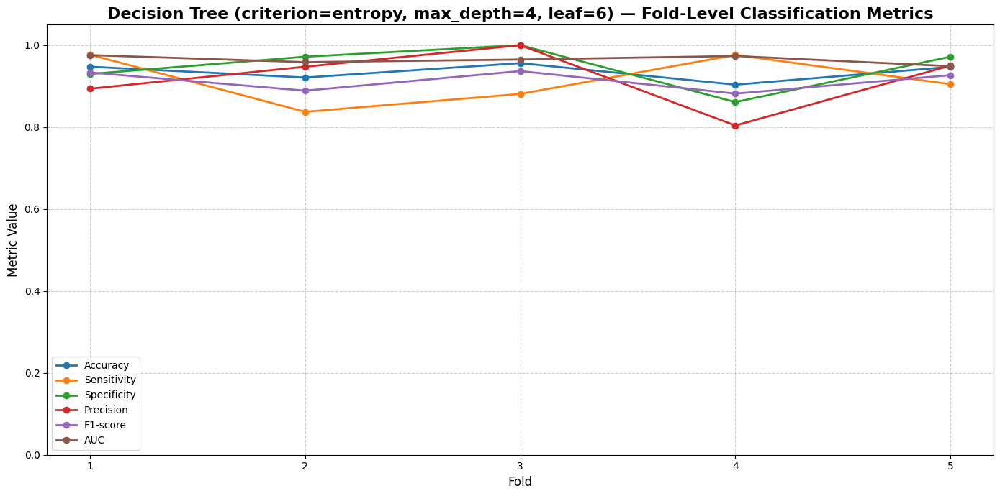

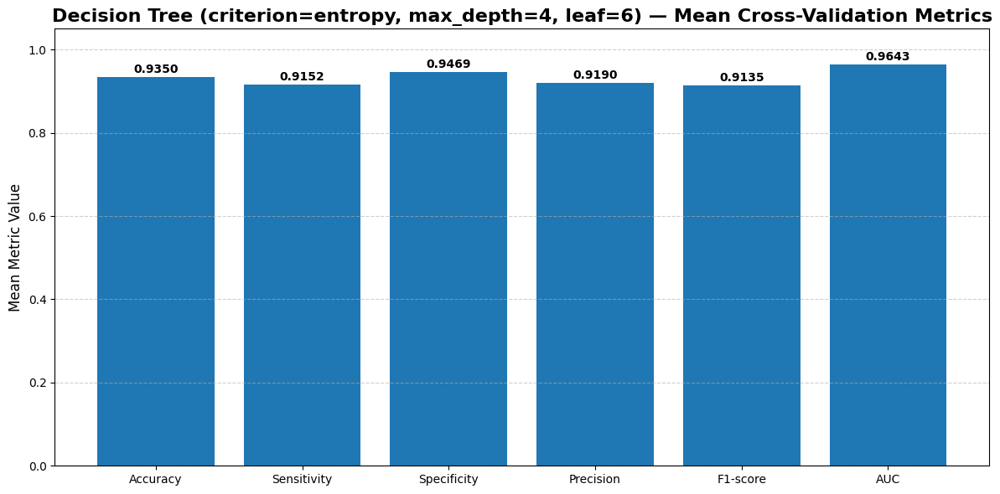

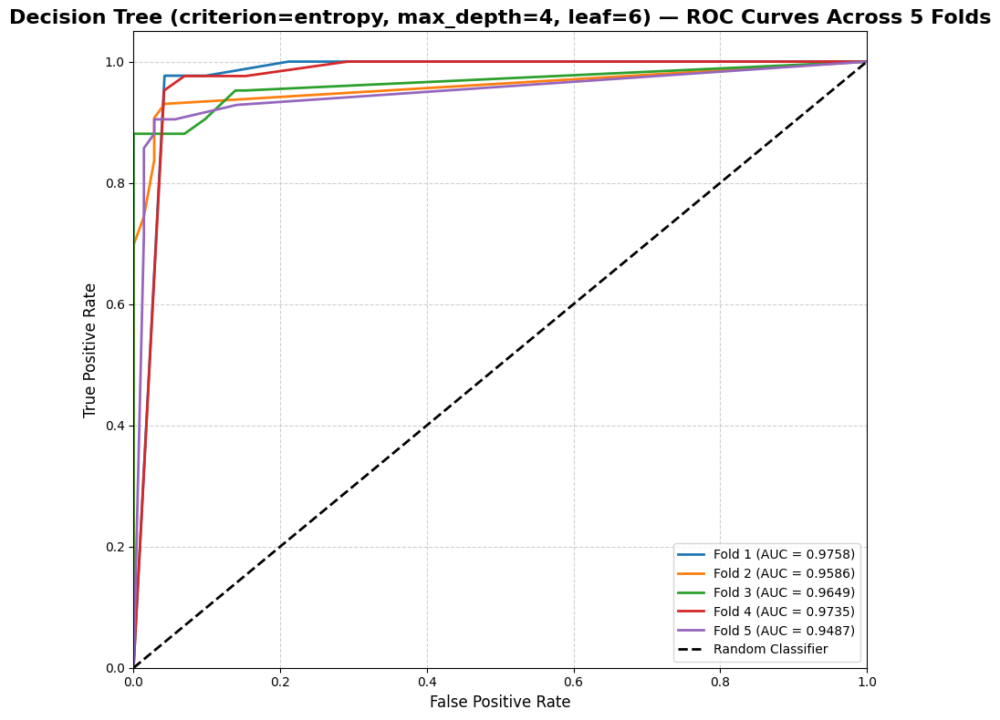

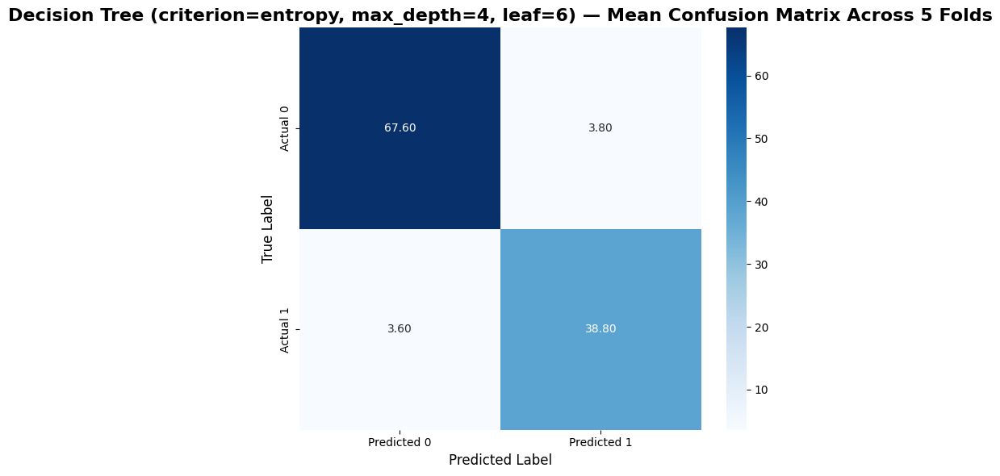

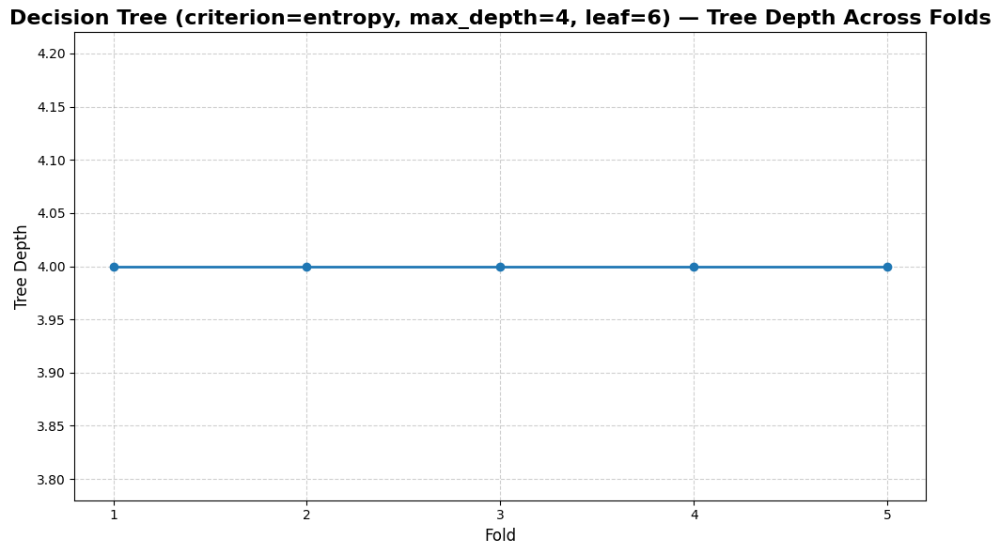

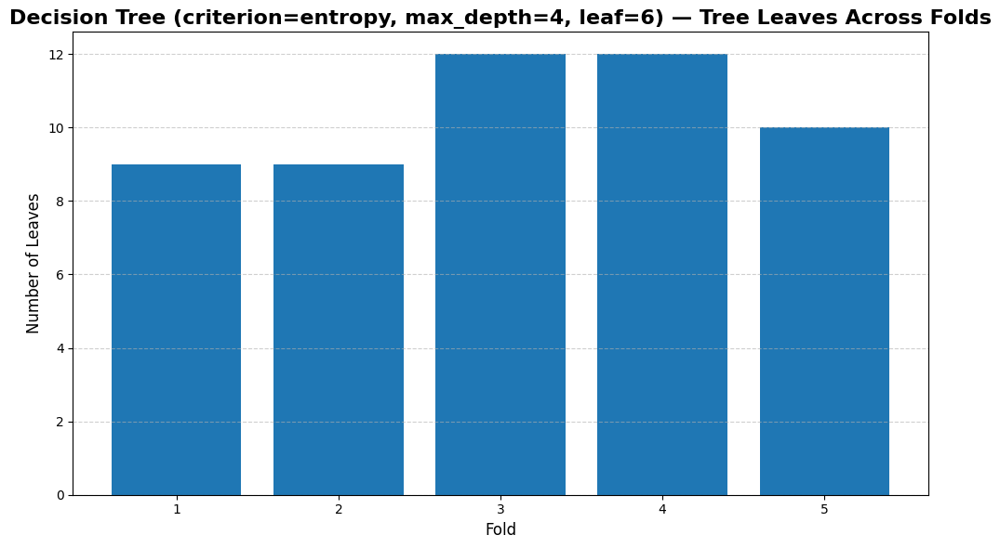

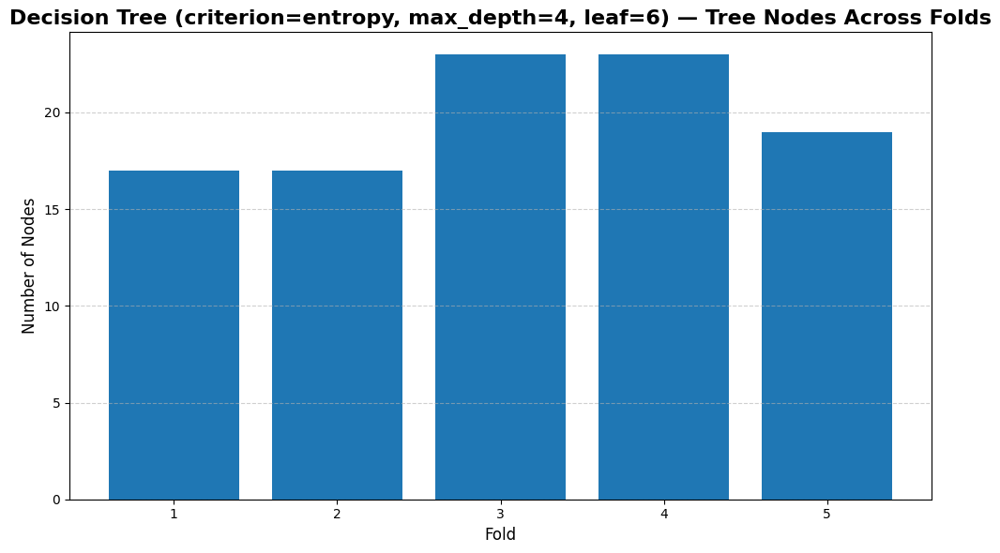

Final Decision Tree visual evaluation report is ready.

Selected Decision Tree configuration:
criterion         : entropy
max_depth         : 4
min_samples_split : 10
min_samples_leaf  : 6
class_weight      : balanced

Fold-level results:


,Model,Fold,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,trained_tree_depth,trained_tree_leaves,trained_tree_nodes,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,Decision Tree,1,entropy,4,10,6,balanced,4,9,17,0.947368,0.976744,0.929577,0.893617,0.933333,0.975762,42,5,1,66
1,Decision Tree,2,entropy,4,10,6,balanced,4,9,17,0.921053,0.837209,0.971831,0.947368,0.888889,0.958565,36,2,7,69
2,Decision Tree,3,entropy,4,10,6,balanced,4,12,23,0.956140,0.880952,1.000000,1.000000,0.936709,0.964947,37,0,5,72
3,Decision Tree,4,entropy,4,10,6,balanced,4,12,23,0.903509,0.976190,0.861111,0.803922,0.881720,0.973545,41,10,1,62
4,Decision Tree,5,entropy,4,10,6,balanced,4,10,19,0.946903,0.904762,0.971831,0.950000,0.926829,0.948692,38,2,4,69



Compact metric summary:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.934995,0.021953,0.903509,0.956140
1,Sensitivity,0.915172,0.060975,0.837209,0.976744
2,Specificity,0.946870,0.054135,0.861111,1.000000
3,Precision,0.918981,0.074522,0.803922,1.000000
4,F1-score,0.913496,0.026102,0.881720,0.936709
5,AUC,0.964302,0.011110,0.948692,0.975762



Final Decision Tree visual reporting completed successfully.


In [90]:
# ============================================================
# BOX 88 — Final Decision Tree Visual Evaluation Report
#
# Purpose:
#   - Create final visual and tabular reports for the
#     analytically selected Decision Tree model
#   - Visualize fold-level classification metrics
#   - Plot ROC curves across all folds
#   - Plot mean confusion matrix
#   - Visualize tree-complexity behavior
#
# Visual Outputs:
#   1) Fold-level metric comparison
#   2) Mean metric summary
#   3) ROC curves for all folds
#   4) Mean confusion matrix heatmap
#   5) Tree depth across folds
#   6) Tree leaves across folds
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_dt_fold_results_df",
    "final_dt_summary_results_df",
    "final_dt_confusion_matrices",
    "final_dt_roc_data",
    "BEST_DT_CRITERION",
    "BEST_DT_MAX_DEPTH",
    "BEST_DT_MIN_SAMPLES_SPLIT",
    "BEST_DT_MIN_SAMPLES_LEAF",
    "BEST_DT_CLASS_WEIGHT"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(final_dt_fold_results_df, pd.DataFrame):
    raise TypeError(
        "final_dt_fold_results_df must be a pandas DataFrame."
    )

if len(final_dt_confusion_matrices) == 0:
    raise ValueError(
        "final_dt_confusion_matrices is empty."
    )

if len(final_dt_roc_data) == 0:
    raise ValueError(
        "final_dt_roc_data is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define plotting metrics
# ------------------------------------------------------------
plot_metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 2 — Validate required metric columns
# ------------------------------------------------------------
missing_metric_columns = [
    col for col in plot_metric_columns
    if col not in final_dt_fold_results_df.columns
]

if len(missing_metric_columns) > 0:
    raise ValueError(
        f"Missing metric columns: {missing_metric_columns}"
    )

# ------------------------------------------------------------
# Step 3 — Build readable model label
# ------------------------------------------------------------
final_dt_label = (
    f"Decision Tree "
    f"(criterion={BEST_DT_CRITERION}, "
    f"max_depth={BEST_DT_MAX_DEPTH}, "
    f"leaf={BEST_DT_MIN_SAMPLES_LEAF})"
)

# ------------------------------------------------------------
# Step 4 — Fold-level metric comparison plot
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in plot_metric_columns:

    plt.plot(
        final_dt_fold_results_df["Fold"],
        final_dt_fold_results_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    f"{final_dt_label} — Fold-Level Classification Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

plt.xticks(final_dt_fold_results_df["Fold"])
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Mean metric bar plot
# ------------------------------------------------------------
mean_metric_values = [
    final_dt_fold_results_df[col].mean()
    for col in plot_metric_columns
]

plt.figure(figsize=(12, 6))

bars = plt.bar(
    plot_metric_columns,
    mean_metric_values
)

plt.title(
    f"{final_dt_label} — Mean Cross-Validation Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("Mean Metric Value", fontsize=12)
plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

for bar, value in zip(bars, mean_metric_values):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.01,
        f"{value:.4f}",
        ha="center",
        fontsize=10,
        fontweight="bold"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — ROC curves across all folds
# ------------------------------------------------------------
plt.figure(figsize=(9, 8))

for fold_roc_item in final_dt_roc_data:

    fold_number = fold_roc_item["fold"]

    roc_data = fold_roc_item["roc_data"]

    plt.plot(
        roc_data["fpr"],
        roc_data["tpr"],
        linewidth=2,
        label=f"Fold {fold_number} (AUC = {roc_data['auc']:.4f})"
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    color="black",
    label="Random Classifier"
)

plt.title(
    f"{final_dt_label} — ROC Curves Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)

plt.xlim(0, 1)
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Compute mean confusion matrix
# ------------------------------------------------------------
final_dt_confusion_matrix_stack = np.array([
    item["matrix"]
    for item in final_dt_confusion_matrices
])

final_dt_mean_confusion_matrix = (
    final_dt_confusion_matrix_stack.mean(axis=0)
)

# ------------------------------------------------------------
# Step 8 — Plot mean confusion matrix heatmap
# ------------------------------------------------------------
plt.figure(figsize=(7, 6))

sns.heatmap(
    final_dt_mean_confusion_matrix,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=True,
    xticklabels=[
        "Predicted 0",
        "Predicted 1"
    ],
    yticklabels=[
        "Actual 0",
        "Actual 1"
    ]
)

plt.title(
    f"{final_dt_label} — Mean Confusion Matrix Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Tree depth across folds
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.plot(
    final_dt_fold_results_df["Fold"],
    final_dt_fold_results_df["trained_tree_depth"],
    marker="o",
    linewidth=2
)

plt.title(
    f"{final_dt_label} — Tree Depth Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Tree Depth", fontsize=12)

plt.xticks(final_dt_fold_results_df["Fold"])

plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Tree leaves across folds
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.bar(
    final_dt_fold_results_df["Fold"],
    final_dt_fold_results_df["trained_tree_leaves"]
)

plt.title(
    f"{final_dt_label} — Tree Leaves Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Number of Leaves", fontsize=12)

plt.xticks(final_dt_fold_results_df["Fold"])

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Tree nodes across folds
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.bar(
    final_dt_fold_results_df["Fold"],
    final_dt_fold_results_df["trained_tree_nodes"]
)

plt.title(
    f"{final_dt_label} — Tree Nodes Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Number of Nodes", fontsize=12)

plt.xticks(final_dt_fold_results_df["Fold"])

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Compact metric summary table
# ------------------------------------------------------------
final_dt_visual_summary_df = pd.DataFrame({

    "Metric":
        plot_metric_columns,

    "Mean":
        [
            final_dt_fold_results_df[col].mean()
            for col in plot_metric_columns
        ],

    "Std":
        [
            final_dt_fold_results_df[col].std()
            for col in plot_metric_columns
        ],

    "Min":
        [
            final_dt_fold_results_df[col].min()
            for col in plot_metric_columns
        ],

    "Max":
        [
            final_dt_fold_results_df[col].max()
            for col in plot_metric_columns
        ]
})

final_dt_visual_summary_df = (
    final_dt_visual_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 13 — Fold-level report table
# ------------------------------------------------------------
final_dt_fold_report_df = (
    final_dt_fold_results_df.copy()
)

final_dt_fold_report_df[
    plot_metric_columns
] = (
    final_dt_fold_report_df[
        plot_metric_columns
    ].round(6)
)

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN",
    "trained_tree_depth",
    "trained_tree_leaves",
    "trained_tree_nodes"
]

final_dt_fold_report_df[
    count_columns
] = (
    final_dt_fold_report_df[
        count_columns
    ].astype(int)
)

# ------------------------------------------------------------
# Step 14 — Display final reports
# ------------------------------------------------------------
print(
    "Final Decision Tree visual evaluation report is ready."
)

print("\nSelected Decision Tree configuration:")
print(f"criterion         : {BEST_DT_CRITERION}")
print(f"max_depth         : {BEST_DT_MAX_DEPTH}")
print(f"min_samples_split : {BEST_DT_MIN_SAMPLES_SPLIT}")
print(f"min_samples_leaf  : {BEST_DT_MIN_SAMPLES_LEAF}")
print(f"class_weight      : {BEST_DT_CLASS_WEIGHT}")

print("\nFold-level results:")
display(
    final_dt_fold_report_df
)

print("\nCompact metric summary:")
display(
    final_dt_visual_summary_df
)

# ------------------------------------------------------------
# Step 15 — Store plot references
# ------------------------------------------------------------
all_model_metric_plots.append({

    "model":
        "Decision Tree",

    "plots":
        [
            "fold_level_metrics",
            "mean_metric_barplot",
            "roc_curves",
            "mean_confusion_matrix",
            "tree_depth_across_folds",
            "tree_leaves_across_folds",
            "tree_nodes_across_folds"
        ]
})


print(
    "\nFinal Decision Tree visual reporting "
    "completed successfully."
)

Final Decision Tree structure model is ready.

Final tree metadata:


,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,final_tree_depth,final_tree_leaves,final_tree_nodes,number_of_features,number_of_samples
0,entropy,4,10,6,balanced,4,12,23,30,569



Feature importance table:


,Rank,Feature,Importance
0,1,perimeter_worst,0.742851
1,2,concave points_worst,0.100077
2,3,texture_worst,0.072887
3,4,smoothness_worst,0.044903
4,5,area_se,0.020084
5,6,fractal_dimension_worst,0.015993
6,7,area_mean,0.003205
7,8,compactness_mean,0.000000
8,9,symmetry_mean,0.000000
9,10,concavity_mean,0.000000


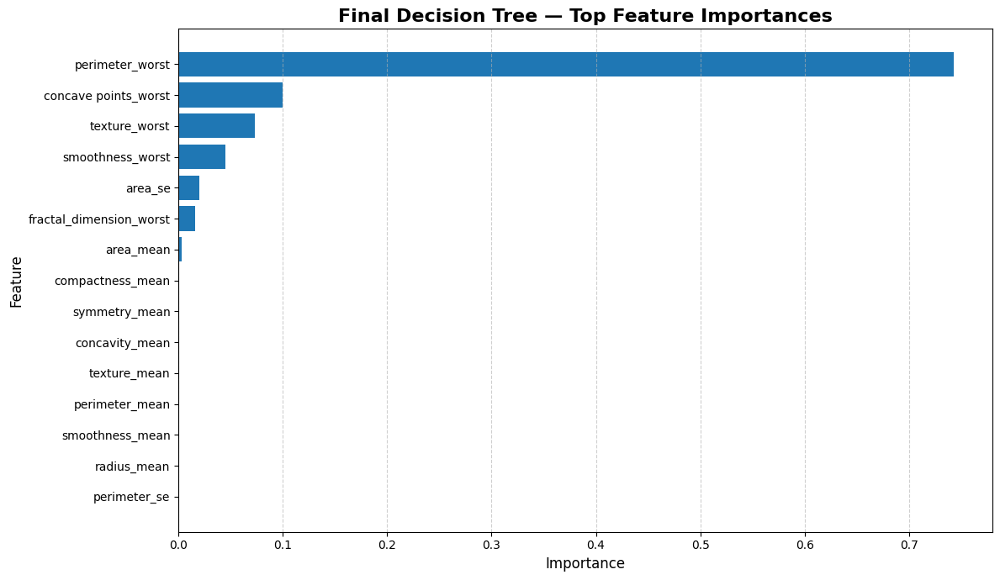

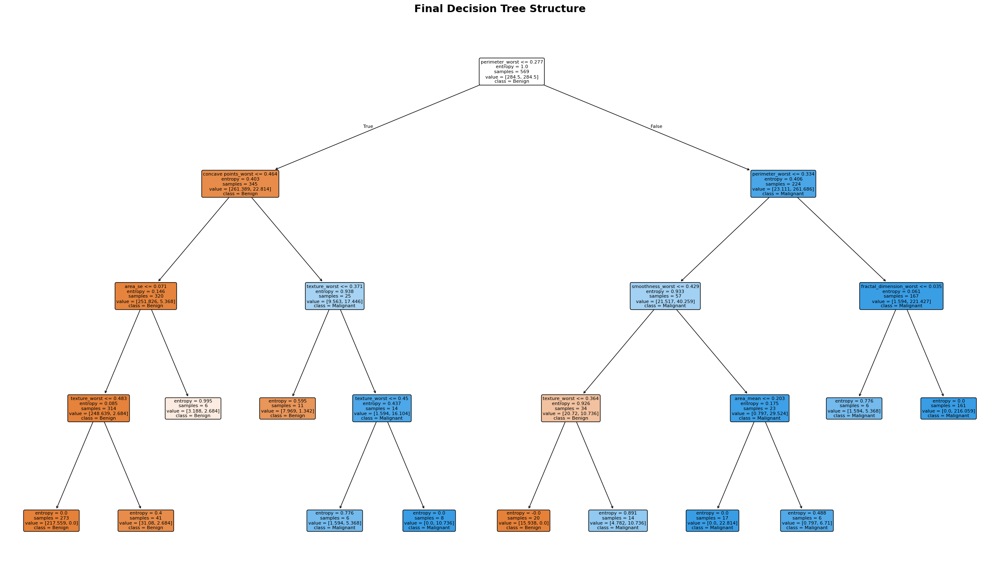

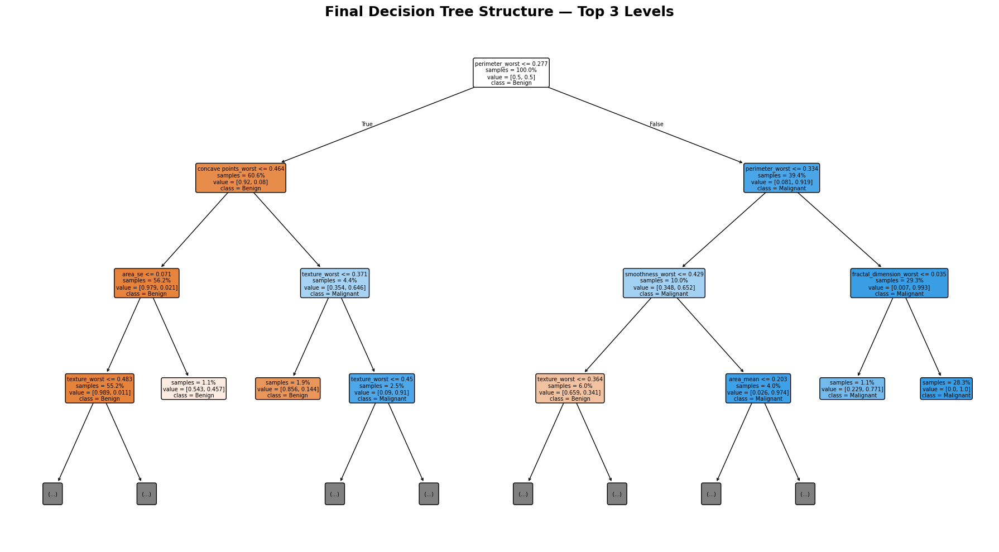


Final Decision Tree structure visualization completed successfully.


In [91]:
# ============================================================
# BOX 89 — Final Decision Tree Structure Visualization
#
# Purpose:
#   - Train one final Decision Tree model using the analytically
#     selected hyperparameters
#   - Use the full available dataset for final structure visualization
#   - Plot the final Decision Tree structure
#   - Create feature-importance report
#
# Notes:
#   - This box is for interpretability and reporting
#   - The performance evaluation was already done in BOX 87
#   - The tree is trained on the full scaled feature matrix only
#     to visualize the final learned structure
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "X",
    "y",
    "cv5_scaled_folds",
    "BEST_DT_CRITERION",
    "BEST_DT_MAX_DEPTH",
    "BEST_DT_MIN_SAMPLES_SPLIT",
    "BEST_DT_MIN_SAMPLES_LEAF",
    "BEST_DT_CLASS_WEIGHT",
    "BEST_DT_RANDOM_STATE"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(X, pd.DataFrame):
    raise TypeError(
        "X must be a pandas DataFrame."
    )

if not isinstance(y, pd.Series):
    raise TypeError(
        "y must be a pandas Series."
    )

# ------------------------------------------------------------
# Step 1 — Reconstruct full Min-Max scaled feature matrix
# ------------------------------------------------------------
# Important:
#   - For final visualization only, scaler information is taken
#     from fold-level scaled data structure.
#   - Since each fold has its own scaler, a new final scaler is
#     fitted on the full X only for final tree visualization.
# ------------------------------------------------------------
from sklearn.preprocessing import MinMaxScaler

final_dt_visual_scaler = MinMaxScaler()

X_full_scaled_array = final_dt_visual_scaler.fit_transform(
    X
)

X_full_scaled = pd.DataFrame(
    X_full_scaled_array,
    columns=X.columns,
    index=X.index
)

# ------------------------------------------------------------
# Step 2 — Train final Decision Tree structure model
# ------------------------------------------------------------
final_dt_structure_model = DecisionTreeClassifier(
    criterion=BEST_DT_CRITERION,
    max_depth=BEST_DT_MAX_DEPTH,
    min_samples_split=BEST_DT_MIN_SAMPLES_SPLIT,
    min_samples_leaf=BEST_DT_MIN_SAMPLES_LEAF,
    class_weight=BEST_DT_CLASS_WEIGHT,
    random_state=BEST_DT_RANDOM_STATE
)

final_dt_structure_model.fit(
    X_full_scaled,
    y
)

# ------------------------------------------------------------
# Step 3 — Extract final tree metadata
# ------------------------------------------------------------
final_tree_depth = final_dt_structure_model.get_depth()

final_tree_leaves = final_dt_structure_model.get_n_leaves()

final_tree_nodes = final_dt_structure_model.tree_.node_count

final_dt_structure_metadata = {
    "criterion": BEST_DT_CRITERION,
    "max_depth": BEST_DT_MAX_DEPTH,
    "min_samples_split": BEST_DT_MIN_SAMPLES_SPLIT,
    "min_samples_leaf": BEST_DT_MIN_SAMPLES_LEAF,
    "class_weight": str(BEST_DT_CLASS_WEIGHT),
    "final_tree_depth": final_tree_depth,
    "final_tree_leaves": final_tree_leaves,
    "final_tree_nodes": final_tree_nodes,
    "number_of_features": X_full_scaled.shape[1],
    "number_of_samples": X_full_scaled.shape[0]
}

final_dt_structure_metadata_df = pd.DataFrame(
    [final_dt_structure_metadata]
)

# ------------------------------------------------------------
# Step 4 — Build feature-importance table
# ------------------------------------------------------------
final_dt_feature_importance_df = pd.DataFrame({

    "Feature":
        X_full_scaled.columns,

    "Importance":
        final_dt_structure_model.feature_importances_
})

final_dt_feature_importance_df = (
    final_dt_feature_importance_df
    .sort_values(
        by="Importance",
        ascending=False
    )
    .reset_index(drop=True)
)

final_dt_feature_importance_df["Rank"] = (
    np.arange(
        1,
        len(final_dt_feature_importance_df) + 1
    )
)

final_dt_feature_importance_df = (
    final_dt_feature_importance_df[
        [
            "Rank",
            "Feature",
            "Importance"
        ]
    ]
)

# ------------------------------------------------------------
# Step 5 — Display final tree metadata
# ------------------------------------------------------------
print(
    "Final Decision Tree structure model is ready."
)

print("\nFinal tree metadata:")
display(
    final_dt_structure_metadata_df
)

print("\nFeature importance table:")
display(
    final_dt_feature_importance_df.round(6)
)

# ------------------------------------------------------------
# Step 6 — Plot feature importance
# ------------------------------------------------------------
top_feature_importance_df = (
    final_dt_feature_importance_df
    .head(15)
    .copy()
)

plt.figure(figsize=(12, 7))

plt.barh(
    top_feature_importance_df["Feature"],
    top_feature_importance_df["Importance"]
)

plt.title(
    "Final Decision Tree — Top Feature Importances",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Importance",
    fontsize=12
)

plt.ylabel(
    "Feature",
    fontsize=12
)

plt.gca().invert_yaxis()

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Plot final Decision Tree structure
# ------------------------------------------------------------
plt.figure(figsize=(24, 14))

plot_tree(
    final_dt_structure_model,
    feature_names=X_full_scaled.columns,
    class_names=[
        "Benign",
        "Malignant"
    ],
    filled=True,
    rounded=True,
    impurity=True,
    proportion=False,
    precision=3,
    fontsize=8
)

plt.title(
    "Final Decision Tree Structure",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Optional compact tree plot for report readability
# ------------------------------------------------------------
plt.figure(figsize=(18, 10))

plot_tree(
    final_dt_structure_model,
    feature_names=X_full_scaled.columns,
    class_names=[
        "Benign",
        "Malignant"
    ],
    filled=True,
    rounded=True,
    impurity=False,
    proportion=True,
    precision=3,
    fontsize=7,
    max_depth=3
)

plt.title(
    "Final Decision Tree Structure — Top 3 Levels",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()


print(
    "\nFinal Decision Tree structure visualization "
    "completed successfully."
)

Decision Tree rule extraction completed.

Rule summary:


,Total_Extracted_Rules,Average_Rule_Length,Maximum_Rule_Length,Minimum_Rule_Length,Average_Leaf_Impurity,Maximum_Leaf_Impurity,Minimum_Leaf_Impurity,Average_Samples_per_Leaf,Maximum_Samples_per_Leaf,Minimum_Samples_per_Leaf
0,12,3.666667,4,3,0.410131,0.994685,-0.0,0.916667,1,0



Rule complexity analysis:


,Rule_Length,Number_of_Rules,Average_Leaf_Impurity,Average_Samples,Maximum_Class_1_Ratio,Average_Class_1_Ratio
0,3,4,0.591447,0.75,1.0,0.333333
1,4,8,0.319473,1.00,1.0,0.250000



Top extracted rules:


,Leaf_Node_ID,Rule,Rule_Length,Predicted_Class,Samples_in_Leaf,Class_0_Count,Class_1_Count,Class_0_Ratio,Class_1_Ratio,Leaf_Impurity,Tree_Depth
0,11,perimeter_worst <= 0.276607 AND concave points...,4,1,1,0,1,0.0,1.0,0.000000,4
1,18,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,1,0,1,0.0,1.0,0.000000,4
2,22,perimeter_worst > 0.276607 AND perimeter_worst...,3,1,1,0,1,0.0,1.0,0.000000,3
3,15,perimeter_worst > 0.276607 AND perimeter_worst...,4,0,1,1,0,1.0,0.0,-0.000000,4
4,4,perimeter_worst <= 0.276607 AND concave points...,4,0,1,1,0,1.0,0.0,0.000000,4
5,5,perimeter_worst <= 0.276607 AND concave points...,4,0,1,0,0,0.0,0.0,0.400388,4
6,19,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,1,0,0,0.0,0.0,0.488221,4
7,10,perimeter_worst <= 0.276607 AND concave points...,4,1,1,0,0,0.0,0.0,0.776162,4
8,21,perimeter_worst > 0.276607 AND perimeter_worst...,3,1,1,0,0,0.0,0.0,0.776162,3
9,16,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,1,0,0,0.0,0.0,0.891014,4



Terminal-node analysis:


,Leaf_Node_ID,Rule_Length,Predicted_Class,Samples_in_Leaf,Class_0_Count,Class_1_Count,Class_0_Ratio,Class_1_Ratio,Leaf_Impurity,Tree_Depth
0,11,4,1,1,0,1,0.0,1.0,0.000000,4
1,18,4,1,1,0,1,0.0,1.0,0.000000,4
2,22,3,1,1,0,1,0.0,1.0,0.000000,3
3,15,4,0,1,1,0,1.0,0.0,-0.000000,4
4,4,4,0,1,1,0,1.0,0.0,0.000000,4
5,5,4,0,1,0,0,0.0,0.0,0.400388,4
6,19,4,1,1,0,0,0.0,0.0,0.488221,4
7,10,4,1,1,0,0,0.0,0.0,0.776162,4
8,21,3,1,1,0,0,0.0,0.0,0.776162,3
9,16,4,1,1,0,0,0.0,0.0,0.891014,4


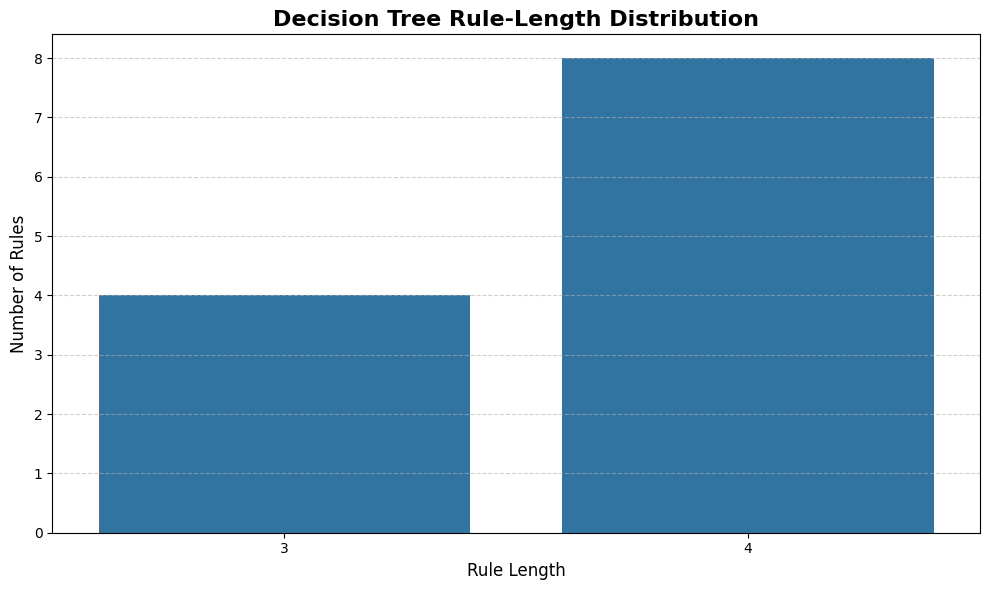

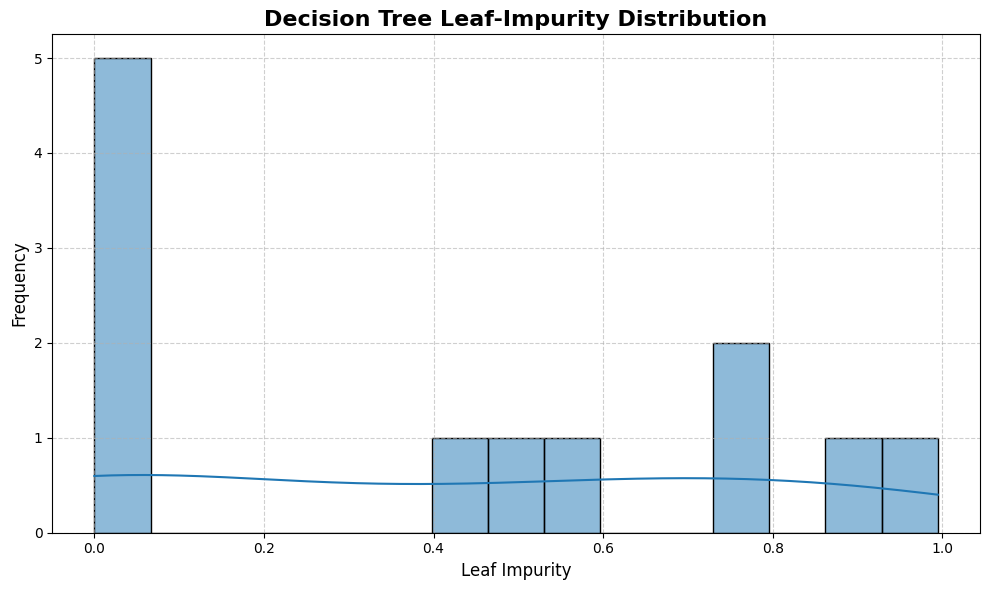

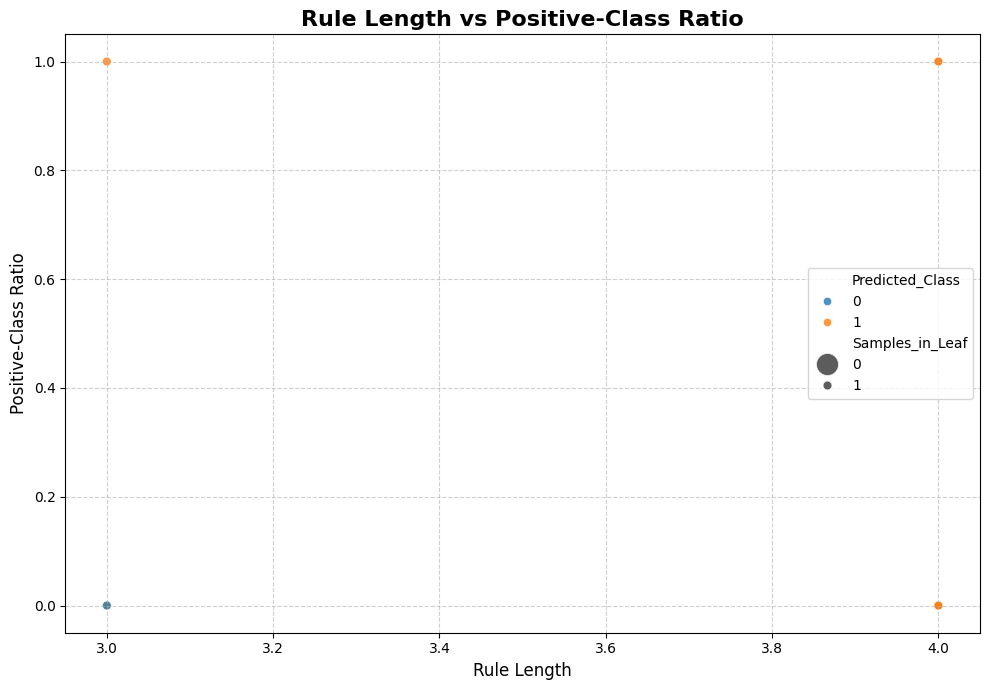


Decision Tree rule extraction and rule analysis completed successfully.


In [92]:
# ============================================================
# BOX 90 — Decision Tree Rule Extraction and Rule Analysis
#
# Purpose:
#   - Extract interpretable Decision Tree decision rules
#   - Analyze rule complexity and coverage
#   - Build analytical rule summaries
#   - Prepare report-ready interpretability outputs
#
# Notes:
#   - Uses the final trained Decision Tree structure model
#   - Focuses on explainability and interpretability
#   - No model retraining is performed
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_dt_structure_model",
    "X_full_scaled",
    "y"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:

    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(X_full_scaled, pd.DataFrame):

    raise TypeError(
        "X_full_scaled must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Initialize tree references
# ------------------------------------------------------------
tree_structure = (
    final_dt_structure_model.tree_
)

feature_names = (
    X_full_scaled.columns.tolist()
)

# ------------------------------------------------------------
# Step 2 — Initialize rule storage
# ------------------------------------------------------------
dt_extracted_rules = []

# ------------------------------------------------------------
# Step 3 — Recursive rule extraction function
# ------------------------------------------------------------
def extract_tree_rules(
    node_id,
    current_rule_conditions,
    current_depth
):
    """
    Recursively extract Decision Tree rules.
    """

    # --------------------------------------------------------
    # Step 3.1 — Detect leaf node
    # --------------------------------------------------------
    is_leaf = (
        tree_structure.feature[node_id]
        == _tree.TREE_UNDEFINED
    )

    # --------------------------------------------------------
    # Step 3.2 — Handle leaf node
    # --------------------------------------------------------
    if is_leaf:

        node_values = (
            tree_structure.value[node_id][0]
        )

        predicted_class = int(
            np.argmax(node_values)
        )

        class_0_count = int(node_values[0])

        class_1_count = int(node_values[1])

        total_samples = int(
            np.sum(node_values)
        )

        if total_samples > 0:

            class_0_ratio = (
                class_0_count
                / total_samples
            )

            class_1_ratio = (
                class_1_count
                / total_samples
            )

        else:

            class_0_ratio = np.nan
            class_1_ratio = np.nan

        impurity = (
            tree_structure.impurity[node_id]
        )

        extracted_rule = {

            "Leaf_Node_ID":
                node_id,

            "Rule":
                " AND ".join(
                    current_rule_conditions
                ),

            "Rule_Length":
                len(current_rule_conditions),

            "Predicted_Class":
                predicted_class,

            "Samples_in_Leaf":
                total_samples,

            "Class_0_Count":
                class_0_count,

            "Class_1_Count":
                class_1_count,

            "Class_0_Ratio":
                class_0_ratio,

            "Class_1_Ratio":
                class_1_ratio,

            "Leaf_Impurity":
                impurity,

            "Tree_Depth":
                current_depth
        }

        dt_extracted_rules.append(
            extracted_rule
        )

        return

    # --------------------------------------------------------
    # Step 3.3 — Extract split information
    # --------------------------------------------------------
    split_feature_index = (
        tree_structure.feature[node_id]
    )

    split_threshold = (
        tree_structure.threshold[node_id]
    )

    split_feature_name = (
        feature_names[split_feature_index]
    )

    left_child = (
        tree_structure.children_left[node_id]
    )

    right_child = (
        tree_structure.children_right[node_id]
    )

    # --------------------------------------------------------
    # Step 3.4 — Build left condition
    # --------------------------------------------------------
    left_condition = (
        f"{split_feature_name} <= "
        f"{split_threshold:.6f}"
    )

    extract_tree_rules(
        node_id=left_child,
        current_rule_conditions=(
            current_rule_conditions
            + [left_condition]
        ),
        current_depth=current_depth + 1
    )

    # --------------------------------------------------------
    # Step 3.5 — Build right condition
    # --------------------------------------------------------
    right_condition = (
        f"{split_feature_name} > "
        f"{split_threshold:.6f}"
    )

    extract_tree_rules(
        node_id=right_child,
        current_rule_conditions=(
            current_rule_conditions
            + [right_condition]
        ),
        current_depth=current_depth + 1
    )

# ------------------------------------------------------------
# Step 4 — Run recursive rule extraction
# ------------------------------------------------------------
extract_tree_rules(
    node_id=0,
    current_rule_conditions=[],
    current_depth=0
)

# ------------------------------------------------------------
# Step 5 — Convert extracted rules to DataFrame
# ------------------------------------------------------------
dt_extracted_rules_df = pd.DataFrame(
    dt_extracted_rules
)

# ------------------------------------------------------------
# Step 6 — Sort rules analytically
# ------------------------------------------------------------
dt_extracted_rules_df = (
    dt_extracted_rules_df
    .sort_values(
        by=[
            "Samples_in_Leaf",
            "Class_1_Ratio",
            "Leaf_Impurity"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 7 — Build rule summary report
# ------------------------------------------------------------
dt_rule_summary = {

    "Total_Extracted_Rules":
        len(dt_extracted_rules_df),

    "Average_Rule_Length":
        dt_extracted_rules_df[
            "Rule_Length"
        ].mean(),

    "Maximum_Rule_Length":
        dt_extracted_rules_df[
            "Rule_Length"
        ].max(),

    "Minimum_Rule_Length":
        dt_extracted_rules_df[
            "Rule_Length"
        ].min(),

    "Average_Leaf_Impurity":
        dt_extracted_rules_df[
            "Leaf_Impurity"
        ].mean(),

    "Maximum_Leaf_Impurity":
        dt_extracted_rules_df[
            "Leaf_Impurity"
        ].max(),

    "Minimum_Leaf_Impurity":
        dt_extracted_rules_df[
            "Leaf_Impurity"
        ].min(),

    "Average_Samples_per_Leaf":
        dt_extracted_rules_df[
            "Samples_in_Leaf"
        ].mean(),

    "Maximum_Samples_per_Leaf":
        dt_extracted_rules_df[
            "Samples_in_Leaf"
        ].max(),

    "Minimum_Samples_per_Leaf":
        dt_extracted_rules_df[
            "Samples_in_Leaf"
        ].min()
}

dt_rule_summary_df = pd.DataFrame(
    [dt_rule_summary]
)

# ------------------------------------------------------------
# Step 8 — Rule complexity analysis
# ------------------------------------------------------------
dt_rule_complexity_df = (
    dt_extracted_rules_df
    .groupby("Rule_Length")
    .agg(
        Number_of_Rules=(
            "Leaf_Node_ID",
            "count"
        ),

        Average_Leaf_Impurity=(
            "Leaf_Impurity",
            "mean"
        ),

        Average_Samples=(
            "Samples_in_Leaf",
            "mean"
        ),

        Maximum_Class_1_Ratio=(
            "Class_1_Ratio",
            "max"
        ),

        Average_Class_1_Ratio=(
            "Class_1_Ratio",
            "mean"
        )
    )
    .reset_index()
    .sort_values(
        by="Rule_Length"
    )
)

# ------------------------------------------------------------
# Step 9 — Terminal-node analysis
# ------------------------------------------------------------
dt_terminal_node_analysis_df = (
    dt_extracted_rules_df[
        [
            "Leaf_Node_ID",
            "Rule_Length",
            "Predicted_Class",
            "Samples_in_Leaf",
            "Class_0_Count",
            "Class_1_Count",
            "Class_0_Ratio",
            "Class_1_Ratio",
            "Leaf_Impurity",
            "Tree_Depth"
        ]
    ]
    .copy()
)

# ------------------------------------------------------------
# Step 10 — Create rounded display versions
# ------------------------------------------------------------
dt_rules_display_df = (
    dt_extracted_rules_df.copy()
)

numeric_rule_columns = [
    "Class_0_Ratio",
    "Class_1_Ratio",
    "Leaf_Impurity"
]

dt_rules_display_df[
    numeric_rule_columns
] = (
    dt_rules_display_df[
        numeric_rule_columns
    ].round(6)
)

dt_rule_summary_display_df = (
    dt_rule_summary_df.copy()
    .round(6)
)

dt_rule_complexity_display_df = (
    dt_rule_complexity_df.copy()
    .round(6)
)

dt_terminal_node_display_df = (
    dt_terminal_node_analysis_df.copy()
    .round(6)
)

# ------------------------------------------------------------
# Step 11 — Display extracted rules
# ------------------------------------------------------------
print(
    "Decision Tree rule extraction completed."
)

print("\nRule summary:")
display(
    dt_rule_summary_display_df
)

print("\nRule complexity analysis:")
display(
    dt_rule_complexity_display_df
)

print("\nTop extracted rules:")
display(
    dt_rules_display_df.head(15)
)

print("\nTerminal-node analysis:")
display(
    dt_terminal_node_display_df.head(15)
)

# ------------------------------------------------------------
# Step 12 — Plot rule-length distribution
# ------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))

sns.countplot(
    data=dt_extracted_rules_df,
    x="Rule_Length"
)

plt.title(
    "Decision Tree Rule-Length Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Rule Length",
    fontsize=12
)

plt.ylabel(
    "Number of Rules",
    fontsize=12
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 13 — Plot leaf impurity distribution
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.histplot(
    dt_extracted_rules_df["Leaf_Impurity"],
    bins=15,
    kde=True
)

plt.title(
    "Decision Tree Leaf-Impurity Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Leaf Impurity",
    fontsize=12
)

plt.ylabel(
    "Frequency",
    fontsize=12
)

plt.grid(
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 14 — Plot rule length vs class purity
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=dt_extracted_rules_df,
    x="Rule_Length",
    y="Class_1_Ratio",
    size="Samples_in_Leaf",
    hue="Predicted_Class",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "Rule Length vs Positive-Class Ratio",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Rule Length",
    fontsize=12
)

plt.ylabel(
    "Positive-Class Ratio",
    fontsize=12
)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()


print(
    "\nDecision Tree rule extraction and "
    "rule analysis completed successfully."
)

In [93]:
# ============================================================
# BOX 91 — Forward Feature Search Methodology and Search Configuration
#
# Purpose:
#   - Define the Forward Feature Search methodology
#   - Configure the analytical feature-selection process
#   - Use the analytically selected Decision Tree hyperparameters
#   - Prepare feature candidates and stopping rules
#   - Avoid manual feature selection
#
# Forward Search Strategy:
#   1) Start with an empty feature subset
#   2) At each iteration, test every remaining candidate feature
#   3) Add the feature that gives the best analytical CV result
#   4) Continue until stopping criteria are met
#
# Selection Criteria:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Smaller feature subset in case of ties
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "X",
    "y",
    "cv5_scaled_folds",
    "BEST_DT_CRITERION",
    "BEST_DT_MAX_DEPTH",
    "BEST_DT_MIN_SAMPLES_SPLIT",
    "BEST_DT_MIN_SAMPLES_LEAF",
    "BEST_DT_CLASS_WEIGHT",
    "BEST_DT_RANDOM_STATE",
    "compute_binary_classification_metrics"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(X, pd.DataFrame):
    raise TypeError(
        "X must be a pandas DataFrame."
    )

if not isinstance(y, pd.Series):
    raise TypeError(
        "y must be a pandas Series."
    )

if X.shape[0] != y.shape[0]:
    raise ValueError(
        "X and y must have the same number of rows."
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define candidate feature list
# ------------------------------------------------------------
forward_candidate_features = list(
    X.columns
)

if len(forward_candidate_features) == 0:
    raise ValueError(
        "No candidate features are available."
    )

# ------------------------------------------------------------
# Step 2 — Define Forward Search limits
# ------------------------------------------------------------
FORWARD_SEARCH_MIN_FEATURES = 1

FORWARD_SEARCH_MAX_FEATURES = len(
    forward_candidate_features
)

FORWARD_SEARCH_EARLY_STOPPING = True

FORWARD_SEARCH_MIN_IMPROVEMENT = 0.000001

FORWARD_SEARCH_PATIENCE = 2

# ------------------------------------------------------------
# Step 3 — Define analytical ranking criteria
# ------------------------------------------------------------
forward_search_ranking_criteria = [
    "Mean_AUC",
    "Mean_Sensitivity",
    "Mean_F1-score",
    "Std_AUC",
    "Number_of_Features"
]

forward_search_ranking_ascending = [
    False,
    False,
    False,
    True,
    True
]

# ------------------------------------------------------------
# Step 4 — Define Decision Tree configuration for Forward Search
# ------------------------------------------------------------
forward_search_dt_config = {

    "criterion":
        BEST_DT_CRITERION,

    "max_depth":
        BEST_DT_MAX_DEPTH,

    "min_samples_split":
        BEST_DT_MIN_SAMPLES_SPLIT,

    "min_samples_leaf":
        BEST_DT_MIN_SAMPLES_LEAF,

    "class_weight":
        BEST_DT_CLASS_WEIGHT,

    "random_state":
        BEST_DT_RANDOM_STATE
}

# ------------------------------------------------------------
# Step 5 — Define full Forward Search configuration
# ------------------------------------------------------------
forward_search_config = {

    "method_name":
        "Forward Feature Search",

    "base_model":
        "Decision Tree",

    "cv_strategy":
        "Stratified 5-Fold CV",

    "scaling_policy":
        "Use fold-level Min-Max scaled data from cv5_scaled_folds",

    "start_subset":
        "empty",

    "candidate_feature_count":
        len(forward_candidate_features),

    "min_features":
        FORWARD_SEARCH_MIN_FEATURES,

    "max_features":
        FORWARD_SEARCH_MAX_FEATURES,

    "early_stopping":
        FORWARD_SEARCH_EARLY_STOPPING,

    "min_improvement":
        FORWARD_SEARCH_MIN_IMPROVEMENT,

    "patience":
        FORWARD_SEARCH_PATIENCE,

    "primary_selection_metric":
        "Mean_AUC",

    "secondary_selection_metric":
        "Mean_Sensitivity",

    "tertiary_selection_metric":
        "Mean_F1-score",

    "stability_metric":
        "Std_AUC",

    "simplicity_metric":
        "Number_of_Features",

    "decision_tree_config":
        forward_search_dt_config
}

forward_search_metadata_df = pd.DataFrame(
    [{
        "Method":
            forward_search_config["method_name"],

        "Base_Model":
            forward_search_config["base_model"],

        "CV_Strategy":
            forward_search_config["cv_strategy"],

        "Candidate_Features":
            forward_search_config["candidate_feature_count"],

        "Min_Features":
            forward_search_config["min_features"],

        "Max_Features":
            forward_search_config["max_features"],

        "Early_Stopping":
            forward_search_config["early_stopping"],

        "Min_Improvement":
            forward_search_config["min_improvement"],

        "Patience":
            forward_search_config["patience"]
    }]
)

# ------------------------------------------------------------
# Step 6 — Build selection criteria table
# ------------------------------------------------------------
forward_search_selection_criteria_df = pd.DataFrame([

    {
        "Priority": 1,
        "Criterion": "Mean_AUC",
        "Direction": "Higher is better",
        "Role": "Primary performance criterion"
    },

    {
        "Priority": 2,
        "Criterion": "Mean_Sensitivity",
        "Direction": "Higher is better",
        "Role": "Cancer detection sensitivity"
    },

    {
        "Priority": 3,
        "Criterion": "Mean_F1-score",
        "Direction": "Higher is better",
        "Role": "Precision-recall balance"
    },

    {
        "Priority": 4,
        "Criterion": "Std_AUC",
        "Direction": "Lower is better",
        "Role": "Cross-validation stability"
    },

    {
        "Priority": 5,
        "Criterion": "Number_of_Features",
        "Direction": "Lower is better",
        "Role": "Subset simplicity"
    }
])

# ------------------------------------------------------------
# Step 7 — Build candidate feature registry
# ------------------------------------------------------------
forward_candidate_features_df = pd.DataFrame({

    "Feature_Index":
        np.arange(
            1,
            len(forward_candidate_features) + 1
        ),

    "Feature_Name":
        forward_candidate_features
})

# ------------------------------------------------------------
# Step 8 — Display configuration reports
# ------------------------------------------------------------
print(
    "Forward Feature Search configuration is ready."
)

print("\nForward Search metadata:")
display(
    forward_search_metadata_df
)

print("\nDecision Tree configuration used in Forward Search:")
display(
    pd.DataFrame([forward_search_dt_config])
)

print("\nAnalytical selection criteria:")
display(
    forward_search_selection_criteria_df
)

print("\nCandidate features:")
display(
    forward_candidate_features_df
)


print(
    "\nForward Feature Search methodology and "
    "configuration completed successfully."
)

Forward Feature Search configuration is ready.

Forward Search metadata:


,Method,Base_Model,CV_Strategy,Candidate_Features,Min_Features,Max_Features,Early_Stopping,Min_Improvement,Patience
0,Forward Feature Search,Decision Tree,Stratified 5-Fold CV,30,1,30,True,0.000001,2



Decision Tree configuration used in Forward Search:


,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,random_state
0,entropy,4,10,6,balanced,42



Analytical selection criteria:


,Priority,Criterion,Direction,Role
0,1,Mean_AUC,Higher is better,Primary performance criterion
1,2,Mean_Sensitivity,Higher is better,Cancer detection sensitivity
2,3,Mean_F1-score,Higher is better,Precision-recall balance
3,4,Std_AUC,Lower is better,Cross-validation stability
4,5,Number_of_Features,Lower is better,Subset simplicity



Candidate features:


,Feature_Index,Feature_Name
0,1,radius_mean
1,2,texture_mean
2,3,perimeter_mean
3,4,area_mean
4,5,smoothness_mean
5,6,compactness_mean
6,7,concavity_mean
7,8,concave points_mean
8,9,symmetry_mean
9,10,fractal_dimension_mean



Forward Feature Search methodology and configuration completed successfully.


In [94]:
# ============================================================
# BOX 92 — Forward Feature Search Candidate Evaluation Engine
#
# Purpose:
#   - Execute Forward Feature Search using Decision Tree
#   - Evaluate every candidate feature at each iteration
#   - Use Stratified 5-Fold CV with fold-level scaled data
#   - Select features analytically, not manually
#   - Store iteration-level and candidate-level results
#
# Forward Search Procedure:
#   1) Start with an empty selected-feature list
#   2) At each iteration:
#        - Add each remaining feature temporarily
#        - Evaluate the temporary subset with 5-Fold CV
#        - Rank candidates analytically
#        - Select the best candidate feature
#   3) Stop when:
#        - All features are selected, or
#        - Early stopping condition is triggered
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "forward_candidate_features",
    "forward_search_config",
    "forward_search_dt_config",
    "forward_search_ranking_criteria",
    "forward_search_ranking_ascending",
    "compute_binary_classification_metrics"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(cv5_scaled_folds, list):
    raise TypeError(
        "cv5_scaled_folds must be a list."
    )

if len(cv5_scaled_folds) == 0:
    raise ValueError(
        "cv5_scaled_folds is empty."
    )

if not isinstance(forward_candidate_features, list):
    raise TypeError(
        "forward_candidate_features must be a list."
    )

if len(forward_candidate_features) == 0:
    raise ValueError(
        "forward_candidate_features is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define candidate subset evaluation function
# ------------------------------------------------------------
def evaluate_forward_feature_subset(
    selected_features,
    candidate_feature,
    iteration_number
):
    """
    Evaluate one temporary feature subset using 5-Fold CV.

    Parameters
    ----------
    selected_features : list
        Features already selected before the current iteration.

    candidate_feature : str
        Candidate feature being tested for addition.

    iteration_number : int
        Current forward-search iteration number.

    Returns
    -------
    candidate_summary : dict
        Summary metrics for the temporary subset.

    candidate_fold_results : list
        Fold-level evaluation results.
    """

    temporary_feature_subset = (
        selected_features
        + [candidate_feature]
    )

    fold_results = []

    for fold_data in cv5_scaled_folds:

        fold_number = fold_data["fold_number"]

        X_train = (
            fold_data["X_train_scaled"][
                temporary_feature_subset
            ]
        )

        X_val = (
            fold_data["X_validation_scaled"][
                temporary_feature_subset
            ]
        )

        y_train = fold_data["y_train"]

        y_val = fold_data["y_validation"]

        model = DecisionTreeClassifier(
            criterion=forward_search_dt_config["criterion"],
            max_depth=forward_search_dt_config["max_depth"],
            min_samples_split=forward_search_dt_config["min_samples_split"],
            min_samples_leaf=forward_search_dt_config["min_samples_leaf"],
            class_weight=forward_search_dt_config["class_weight"],
            random_state=forward_search_dt_config["random_state"]
        )

        model.fit(
            X_train,
            y_train
        )

        y_pred = model.predict(
            X_val
        )

        y_score = (
            model
            .predict_proba(X_val)[:, 1]
        )

        fold_metrics = compute_binary_classification_metrics(
            y_true=y_val,
            y_pred=y_pred,
            y_score=y_score
        )

        fold_result = {

            "Iteration":
                iteration_number,

            "Candidate_Feature":
                candidate_feature,

            "Number_of_Features":
                len(temporary_feature_subset),

            "Feature_Subset":
                temporary_feature_subset.copy(),

            "Feature_Subset_Label":
                ", ".join(temporary_feature_subset),

            "Fold":
                fold_number,

            "trained_tree_depth":
                model.get_depth(),

            "trained_tree_leaves":
                model.get_n_leaves(),

            "trained_tree_nodes":
                model.tree_.node_count,

            "Accuracy":
                fold_metrics["Accuracy"],

            "Sensitivity":
                fold_metrics["Sensitivity"],

            "Specificity":
                fold_metrics["Specificity"],

            "Precision":
                fold_metrics["Precision"],

            "F1-score":
                fold_metrics["F1-score"],

            "AUC":
                fold_metrics["AUC"],

            "TP":
                fold_metrics["TP"],

            "FP":
                fold_metrics["FP"],

            "FN":
                fold_metrics["FN"],

            "TN":
                fold_metrics["TN"]
        }

        fold_results.append(
            fold_result
        )

    fold_results_df = pd.DataFrame(
        fold_results
    )

    candidate_summary = {

        "Iteration":
            iteration_number,

        "Candidate_Feature":
            candidate_feature,

        "Number_of_Features":
            len(temporary_feature_subset),

        "Feature_Subset":
            temporary_feature_subset.copy(),

        "Feature_Subset_Label":
            ", ".join(temporary_feature_subset),

        "Mean_Accuracy":
            fold_results_df["Accuracy"].mean(),

        "Std_Accuracy":
            fold_results_df["Accuracy"].std(),

        "Mean_Sensitivity":
            fold_results_df["Sensitivity"].mean(),

        "Std_Sensitivity":
            fold_results_df["Sensitivity"].std(),

        "Mean_Specificity":
            fold_results_df["Specificity"].mean(),

        "Std_Specificity":
            fold_results_df["Specificity"].std(),

        "Mean_Precision":
            fold_results_df["Precision"].mean(),

        "Std_Precision":
            fold_results_df["Precision"].std(),

        "Mean_F1-score":
            fold_results_df["F1-score"].mean(),

        "Std_F1-score":
            fold_results_df["F1-score"].std(),

        "Mean_AUC":
            fold_results_df["AUC"].mean(),

        "Std_AUC":
            fold_results_df["AUC"].std(),

        "Min_AUC":
            fold_results_df["AUC"].min(),

        "Max_AUC":
            fold_results_df["AUC"].max(),

        "Mean_Tree_Depth":
            fold_results_df["trained_tree_depth"].mean(),

        "Std_Tree_Depth":
            fold_results_df["trained_tree_depth"].std(),

        "Mean_Tree_Leaves":
            fold_results_df["trained_tree_leaves"].mean(),

        "Std_Tree_Leaves":
            fold_results_df["trained_tree_leaves"].std(),

        "Mean_Tree_Nodes":
            fold_results_df["trained_tree_nodes"].mean(),

        "Std_Tree_Nodes":
            fold_results_df["trained_tree_nodes"].std()
    }

    return candidate_summary, fold_results

# ------------------------------------------------------------
# Step 2 — Initialize Forward Search storage
# ------------------------------------------------------------
selected_features = []

remaining_features = forward_candidate_features.copy()

forward_search_all_candidate_results = []

forward_search_all_fold_results = []

forward_search_selected_steps = []

forward_search_history = []

best_global_auc = -np.inf

no_improvement_counter = 0

iteration_number = 1

# ------------------------------------------------------------
# Step 3 — Run Forward Feature Search
# ------------------------------------------------------------
while (
    len(selected_features)
    < forward_search_config["max_features"]
    and len(remaining_features) > 0
):

    current_iteration_candidate_summaries = []

    current_iteration_fold_results = []

    # --------------------------------------------------------
    # Step 3.1 — Evaluate each remaining candidate feature
    # --------------------------------------------------------
    for candidate_feature in remaining_features:

        candidate_summary, candidate_fold_results = (
            evaluate_forward_feature_subset(
                selected_features=selected_features,
                candidate_feature=candidate_feature,
                iteration_number=iteration_number
            )
        )

        current_iteration_candidate_summaries.append(
            candidate_summary
        )

        current_iteration_fold_results.extend(
            candidate_fold_results
        )

    # --------------------------------------------------------
    # Step 3.2 — Rank candidate features analytically
    # --------------------------------------------------------
    current_iteration_results_df = pd.DataFrame(
        current_iteration_candidate_summaries
    )

    current_iteration_results_df = (
        current_iteration_results_df
        .sort_values(
            by=forward_search_ranking_criteria,
            ascending=forward_search_ranking_ascending
        )
        .reset_index(drop=True)
    )

    current_iteration_results_df.insert(
        0,
        "Candidate_Rank",
        np.arange(
            1,
            len(current_iteration_results_df) + 1
        )
    )

    best_candidate_row = (
        current_iteration_results_df
        .iloc[0]
    )

    best_candidate_feature = (
        best_candidate_row["Candidate_Feature"]
    )

    current_best_auc = (
        best_candidate_row["Mean_AUC"]
    )

    auc_improvement = (
        current_best_auc
        - best_global_auc
    )

    # --------------------------------------------------------
    # Step 3.3 — Apply analytical feature addition
    # --------------------------------------------------------
    selected_features.append(
        best_candidate_feature
    )

    remaining_features.remove(
        best_candidate_feature
    )

    if auc_improvement > forward_search_config["min_improvement"]:

        no_improvement_counter = 0

        best_global_auc = current_best_auc

        improvement_status = "Improved"

    else:

        no_improvement_counter += 1

        improvement_status = "No meaningful improvement"

    # --------------------------------------------------------
    # Step 3.4 — Store selected step
    # --------------------------------------------------------
    selected_step_record = {

        "Iteration":
            iteration_number,

        "Selected_Feature":
            best_candidate_feature,

        "Number_of_Features":
            len(selected_features),

        "Selected_Feature_Subset":
            selected_features.copy(),

        "Selected_Feature_Subset_Label":
            ", ".join(selected_features),

        "Mean_Accuracy":
            best_candidate_row["Mean_Accuracy"],

        "Std_Accuracy":
            best_candidate_row["Std_Accuracy"],

        "Mean_Sensitivity":
            best_candidate_row["Mean_Sensitivity"],

        "Std_Sensitivity":
            best_candidate_row["Std_Sensitivity"],

        "Mean_Specificity":
            best_candidate_row["Mean_Specificity"],

        "Std_Specificity":
            best_candidate_row["Std_Specificity"],

        "Mean_Precision":
            best_candidate_row["Mean_Precision"],

        "Std_Precision":
            best_candidate_row["Std_Precision"],

        "Mean_F1-score":
            best_candidate_row["Mean_F1-score"],

        "Std_F1-score":
            best_candidate_row["Std_F1-score"],

        "Mean_AUC":
            best_candidate_row["Mean_AUC"],

        "Std_AUC":
            best_candidate_row["Std_AUC"],

        "Min_AUC":
            best_candidate_row["Min_AUC"],

        "Max_AUC":
            best_candidate_row["Max_AUC"],

        "Mean_Tree_Depth":
            best_candidate_row["Mean_Tree_Depth"],

        "Mean_Tree_Leaves":
            best_candidate_row["Mean_Tree_Leaves"],

        "Mean_Tree_Nodes":
            best_candidate_row["Mean_Tree_Nodes"],

        "AUC_Improvement":
            auc_improvement,

        "Improvement_Status":
            improvement_status,

        "No_Improvement_Counter":
            no_improvement_counter
    }

    forward_search_selected_steps.append(
        selected_step_record
    )

    # --------------------------------------------------------
    # Step 3.5 — Store all candidate and fold-level results
    # --------------------------------------------------------
    for row_dict in current_iteration_results_df.to_dict(
        orient="records"
    ):

        forward_search_all_candidate_results.append(
            row_dict
        )

    forward_search_all_fold_results.extend(
        current_iteration_fold_results
    )

    # --------------------------------------------------------
    # Step 3.6 — Store iteration history
    # --------------------------------------------------------
    forward_search_history.append({

        "Iteration":
            iteration_number,

        "Selected_Feature":
            best_candidate_feature,

        "Selected_Feature_Subset":
            selected_features.copy(),

        "Remaining_Features":
            remaining_features.copy(),

        "Best_Mean_AUC":
            current_best_auc,

        "AUC_Improvement":
            auc_improvement,

        "Improvement_Status":
            improvement_status
    })

    # --------------------------------------------------------
    # Step 3.7 — Early stopping check
    # --------------------------------------------------------
    if (
        forward_search_config["early_stopping"]
        and no_improvement_counter
        >= forward_search_config["patience"]
        and len(selected_features)
        >= forward_search_config["min_features"]
    ):

        print(
            "Early stopping triggered at iteration "
            f"{iteration_number}."
        )

        break

    iteration_number += 1

# ------------------------------------------------------------
# Step 4 — Create final Forward Search DataFrames
# ------------------------------------------------------------
forward_search_all_candidate_results_df = pd.DataFrame(
    forward_search_all_candidate_results
)

forward_search_all_fold_results_df = pd.DataFrame(
    forward_search_all_fold_results
)

forward_search_selected_steps_df = pd.DataFrame(
    forward_search_selected_steps
)

# ------------------------------------------------------------
# Step 5 — Select analytical best subset from selected steps
# ------------------------------------------------------------
forward_search_best_step = (
    forward_search_selected_steps_df
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Number_of_Features"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True
        ]
    )
    .iloc[0]
)

forward_search_best_subset = (
    forward_search_best_step[
        "Selected_Feature_Subset"
    ]
)

forward_search_best_subset_label = (
    forward_search_best_step[
        "Selected_Feature_Subset_Label"
    ]
)

# ------------------------------------------------------------
# Step 6 — Create rounded display tables
# ------------------------------------------------------------
forward_selected_steps_display_df = (
    forward_search_selected_steps_df.copy()
)

display_metric_columns = [
    col for col in forward_selected_steps_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
        or "Improvement" in col
    )
]

forward_selected_steps_display_df[
    display_metric_columns
] = (
    forward_selected_steps_display_df[
        display_metric_columns
    ].round(6)
)

forward_candidate_results_display_df = (
    forward_search_all_candidate_results_df.copy()
)

candidate_display_metric_columns = [
    col for col in forward_candidate_results_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
    )
]

forward_candidate_results_display_df[
    candidate_display_metric_columns
] = (
    forward_candidate_results_display_df[
        candidate_display_metric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 7 — Display Forward Search results
# ------------------------------------------------------------
print(
    "Forward Feature Search candidate evaluation completed."
)

print("\nTotal selected features:")
print(
    len(selected_features)
)

print("\nBest analytical feature subset:")
print(
    forward_search_best_subset
)

print("\nSelected feature steps:")
display(
    forward_selected_steps_display_df
)

print("\nAll candidate results sample:")
display(
    forward_candidate_results_display_df.head(20)
)


print(
    "\nForward Feature Search candidate evaluation "
    "engine completed successfully."
)

Early stopping triggered at iteration 6.
Forward Feature Search candidate evaluation completed.

Total selected features:
6

Best analytical feature subset:
['perimeter_worst', 'concave points_worst', 'concave points_se', 'fractal_dimension_se']

Selected feature steps:


,Iteration,Selected_Feature,Number_of_Features,Selected_Feature_Subset,Selected_Feature_Subset_Label,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,...,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Tree_Depth,Mean_Tree_Leaves,Mean_Tree_Nodes,AUC_Improvement,Improvement_Status,No_Improvement_Counter
0,1,perimeter_worst,1,[perimeter_worst],perimeter_worst,0.880546,0.019892,0.891584,0.104282,0.874218,...,0.951965,0.026109,0.915984,0.974702,4.0,11.8,22.6,inf,Improved,0
1,2,concave points_worst,2,"[perimeter_worst, concave points_worst]","perimeter_worst, concave points_worst",0.922714,0.018867,0.929457,0.077305,0.918936,...,0.968591,0.022928,0.941985,0.993717,4.0,10.6,20.2,0.016626,Improved,0
2,3,concave points_se,3,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.927977,0.024250,0.934219,0.077967,0.924491,...,0.975845,0.018170,0.951687,0.993717,4.0,11.2,21.4,0.007254,Improved,0
3,4,fractal_dimension_se,4,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.920959,0.018444,0.934219,0.077967,0.913380,...,0.979607,0.014846,0.962632,0.993717,4.0,11.4,21.8,0.003762,Improved,0
4,5,fractal_dimension_worst,5,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.922714,0.018867,0.924695,0.078103,0.921714,...,0.977102,0.012947,0.960979,0.992725,4.0,11.4,21.8,-0.002505,No meaningful improvement,1
5,6,perimeter_mean,6,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.926223,0.021907,0.924695,0.078103,0.927269,...,0.978166,0.012362,0.963955,0.992725,4.0,11.2,21.4,-0.001441,No meaningful improvement,2



All candidate results sample:


,Candidate_Rank,Iteration,Candidate_Feature,Number_of_Features,Feature_Subset,Feature_Subset_Label,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,...,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Tree_Depth,Std_Tree_Depth,Mean_Tree_Leaves,Std_Tree_Leaves,Mean_Tree_Nodes,Std_Tree_Nodes
0,1,1,perimeter_worst,1,[perimeter_worst],perimeter_worst,0.880546,0.019892,0.891584,0.104282,...,0.951965,0.026109,0.915984,0.974702,4.0,0.0,11.8,1.303840,22.6,2.607681
1,2,1,area_worst,1,[area_worst],area_worst,0.891104,0.026527,0.915282,0.063288,...,0.951301,0.035053,0.895021,0.987434,4.0,0.0,11.8,1.095445,22.6,2.190890
2,3,1,radius_worst,1,[radius_worst],radius_worst,0.892843,0.027142,0.896235,0.065850,...,0.949620,0.030216,0.904848,0.977029,4.0,0.0,12.4,0.547723,23.8,1.095445
3,4,1,concave points_mean,1,[concave points_mean],concave points_mean,0.903369,0.021346,0.886600,0.039015,...,0.942952,0.009284,0.928902,0.953325,4.0,0.0,11.8,1.483240,22.6,2.966479
4,5,1,concave points_worst,1,[concave points_worst],concave points_worst,0.885763,0.031631,0.863012,0.049224,...,0.941816,0.016284,0.925483,0.962660,4.0,0.0,13.2,0.836660,25.4,1.673320
5,6,1,concavity_mean,1,[concavity_mean],concavity_mean,0.855861,0.051473,0.853267,0.062471,...,0.924309,0.030741,0.886905,0.968064,4.0,0.0,13.0,0.707107,25.0,1.414214
6,7,1,perimeter_mean,1,[perimeter_mean],perimeter_mean,0.861217,0.037217,0.848837,0.098568,...,0.921721,0.057356,0.842262,0.968142,4.0,0.0,12.6,0.894427,24.2,1.788854
7,8,1,area_mean,1,[area_mean],area_mean,0.884040,0.038830,0.769103,0.064824,...,0.919415,0.041000,0.859954,0.962106,4.0,0.0,12.0,0.000000,23.0,0.000000
8,9,1,area_se,1,[area_se],area_se,0.861202,0.034021,0.806866,0.076694,...,0.902657,0.036294,0.844577,0.942956,4.0,0.0,13.4,0.894427,25.8,1.788854
9,10,1,concavity_worst,1,[concavity_worst],concavity_worst,0.826021,0.031185,0.896456,0.081437,...,0.902362,0.018868,0.870040,0.918441,4.0,0.0,12.8,0.836660,24.6,1.673320



Forward Feature Search candidate evaluation engine completed successfully.


In [95]:
# ============================================================
# BOX 93 — Forward Search Iteration Analytical Reporting
#
# Purpose:
#   - Create detailed analytical reports for each Forward Search
#     iteration
#   - Summarize selected feature order and performance changes
#   - Analyze best candidate feature per iteration
#   - Compare candidate rankings within each iteration
#   - Prepare report-ready tables
#
# Notes:
#   - No model training is performed in this box
#   - All results are derived from BOX 92
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "forward_search_all_candidate_results_df",
    "forward_search_selected_steps_df",
    "forward_search_best_subset",
    "forward_search_best_subset_label"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(forward_search_all_candidate_results_df, pd.DataFrame):
    raise TypeError(
        "forward_search_all_candidate_results_df must be a pandas DataFrame."
    )

if not isinstance(forward_search_selected_steps_df, pd.DataFrame):
    raise TypeError(
        "forward_search_selected_steps_df must be a pandas DataFrame."
    )

if forward_search_all_candidate_results_df.empty:
    raise ValueError(
        "forward_search_all_candidate_results_df is empty."
    )

if forward_search_selected_steps_df.empty:
    raise ValueError(
        "forward_search_selected_steps_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Create selected feature order table
# ------------------------------------------------------------
forward_selected_feature_order_rows = []

for _, row in forward_search_selected_steps_df.iterrows():

    forward_selected_feature_order_rows.append({

        "Selection_Order":
            int(row["Iteration"]),

        "Selected_Feature":
            row["Selected_Feature"],

        "Number_of_Features":
            int(row["Number_of_Features"]),

        "Mean_AUC":
            row["Mean_AUC"],

        "Mean_Sensitivity":
            row["Mean_Sensitivity"],

        "Mean_F1-score":
            row["Mean_F1-score"],

        "Std_AUC":
            row["Std_AUC"],

        "AUC_Improvement":
            row["AUC_Improvement"],

        "Improvement_Status":
            row["Improvement_Status"]
    })

forward_selected_feature_order_df = pd.DataFrame(
    forward_selected_feature_order_rows
)

# ------------------------------------------------------------
# Step 2 — Extract best candidate per iteration
# ------------------------------------------------------------
forward_iteration_best_candidates_df = (
    forward_search_all_candidate_results_df[
        forward_search_all_candidate_results_df[
            "Candidate_Rank"
        ] == 1
    ]
    .copy()
    .sort_values(
        by="Iteration",
        ascending=True
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 3 — Build iteration-level summary
# ------------------------------------------------------------
forward_iteration_summary_df = (
    forward_search_all_candidate_results_df
    .groupby("Iteration")
    .agg(
        Number_of_Candidates=(
            "Candidate_Feature",
            "count"
        ),

        Best_Candidate=(
            "Candidate_Feature",
            lambda x: x.iloc[0]
        ),

        Best_Mean_AUC=(
            "Mean_AUC",
            "max"
        ),

        Average_Mean_AUC=(
            "Mean_AUC",
            "mean"
        ),

        Worst_Mean_AUC=(
            "Mean_AUC",
            "min"
        ),

        Best_Mean_Sensitivity=(
            "Mean_Sensitivity",
            "max"
        ),

        Best_Mean_F1_score=(
            "Mean_F1-score",
            "max"
        ),

        Best_Std_AUC=(
            "Std_AUC",
            "min"
        ),

        Average_Tree_Depth=(
            "Mean_Tree_Depth",
            "mean"
        ),

        Average_Tree_Leaves=(
            "Mean_Tree_Leaves",
            "mean"
        )
    )
    .reset_index()
)

# ------------------------------------------------------------
# Step 4 — Add selected-step information to iteration summary
# ------------------------------------------------------------
selected_step_columns = [
    "Iteration",
    "Selected_Feature",
    "Number_of_Features",
    "Selected_Feature_Subset_Label",
    "AUC_Improvement",
    "Improvement_Status",
    "No_Improvement_Counter"
]

forward_iteration_summary_df = (
    forward_iteration_summary_df
    .merge(
        forward_search_selected_steps_df[
            selected_step_columns
        ],
        on="Iteration",
        how="left"
    )
)

# ------------------------------------------------------------
# Step 5 — Create full candidate ranking table
# ------------------------------------------------------------
forward_iteration_candidate_rankings_df = (
    forward_search_all_candidate_results_df
    .sort_values(
        by=[
            "Iteration",
            "Candidate_Rank"
        ],
        ascending=[
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 6 — Create top-3 candidate table per iteration
# ------------------------------------------------------------
forward_top3_candidates_per_iteration_df = (
    forward_iteration_candidate_rankings_df[
        forward_iteration_candidate_rankings_df[
            "Candidate_Rank"
        ] <= 3
    ]
    .copy()
)

# ------------------------------------------------------------
# Step 7 — Create best-subset summary table
# ------------------------------------------------------------
forward_best_subset_summary_df = pd.DataFrame([{

    "Best_Subset_Size":
        len(forward_search_best_subset),

    "Best_Subset_Features":
        forward_search_best_subset_label,

    "Best_Subset_Selection_Method":
        "Analytical ranking using Mean_AUC, Mean_Sensitivity, Mean_F1-score, Std_AUC, and subset size"
}])

# ------------------------------------------------------------
# Step 8 — Create rounded display tables
# ------------------------------------------------------------
round_columns_iteration = [
    col for col in forward_iteration_summary_df.columns
    if (
        "Mean" in col
        or "AUC" in col
        or "Average" in col
        or "Best" in col
        or "Worst" in col
    )
    and forward_iteration_summary_df[col].dtype != "object"
]

forward_iteration_summary_display_df = (
    forward_iteration_summary_df.copy()
)

forward_iteration_summary_display_df[
    round_columns_iteration
] = (
    forward_iteration_summary_display_df[
        round_columns_iteration
    ].round(6)
)

round_columns_order = [
    col for col in forward_selected_feature_order_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Improvement" in col
    )
]

forward_selected_feature_order_display_df = (
    forward_selected_feature_order_df.copy()
)

forward_selected_feature_order_display_df[
    round_columns_order
] = (
    forward_selected_feature_order_display_df[
        round_columns_order
    ].round(6)
)

forward_iteration_best_candidates_display_df = (
    forward_iteration_best_candidates_df.copy()
)

best_candidate_numeric_columns = [
    col for col in forward_iteration_best_candidates_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
    )
]

forward_iteration_best_candidates_display_df[
    best_candidate_numeric_columns
] = (
    forward_iteration_best_candidates_display_df[
        best_candidate_numeric_columns
    ].round(6)
)

forward_top3_candidates_display_df = (
    forward_top3_candidates_per_iteration_df.copy()
)

top3_numeric_columns = [
    col for col in forward_top3_candidates_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
    )
]

forward_top3_candidates_display_df[
    top3_numeric_columns
] = (
    forward_top3_candidates_display_df[
        top3_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 9 — Display analytical reports
# ------------------------------------------------------------
print(
    "Forward Search iteration analytical reporting is ready."
)

print("\nSelected feature order:")
display(
    forward_selected_feature_order_display_df
)

print("\nIteration-level summary:")
display(
    forward_iteration_summary_display_df
)

print("\nBest candidate per iteration:")
display(
    forward_iteration_best_candidates_display_df
)

print("\nTop 3 candidates per iteration:")
display(
    forward_top3_candidates_display_df
)

print("\nBest subset summary:")
display(
    forward_best_subset_summary_df
)


print(
    "\nForward Search iteration analytical reporting "
    "completed successfully."
)

Forward Search iteration analytical reporting is ready.

Selected feature order:


,Selection_Order,Selected_Feature,Number_of_Features,Mean_AUC,Mean_Sensitivity,Mean_F1-score,Std_AUC,AUC_Improvement,Improvement_Status
0,1,perimeter_worst,1,0.951965,0.891584,0.847255,0.026109,inf,Improved
1,2,concave points_worst,2,0.968591,0.929457,0.899422,0.022928,0.016626,Improved
2,3,concave points_se,3,0.975845,0.934219,0.906261,0.018170,0.007254,Improved
3,4,fractal_dimension_se,4,0.979607,0.934219,0.897801,0.014846,0.003762,Improved
4,5,fractal_dimension_worst,5,0.977102,0.924695,0.898979,0.012947,-0.002505,No meaningful improvement
5,6,perimeter_mean,6,0.978166,0.924695,0.903392,0.012362,-0.001441,No meaningful improvement



Iteration-level summary:


,Iteration,Number_of_Candidates,Best_Candidate,Best_Mean_AUC,Average_Mean_AUC,Worst_Mean_AUC,Best_Mean_Sensitivity,Best_Mean_F1_score,Best_Std_AUC,Average_Tree_Depth,Average_Tree_Leaves,Selected_Feature,Number_of_Features,Selected_Feature_Subset_Label,AUC_Improvement,Improvement_Status,No_Improvement_Counter
0,1,30,perimeter_worst,0.951965,0.781848,0.526328,0.915282,0.872757,0.009284,4.0,12.240000,perimeter_worst,1,perimeter_worst,inf,Improved,0
1,2,29,concave points_worst,0.968591,0.959688,0.949754,0.934219,0.918212,0.012455,4.0,11.413793,concave points_worst,2,"perimeter_worst, concave points_worst",0.016626,Improved,0
2,3,28,concave points_se,0.975845,0.969496,0.962175,0.934219,0.907904,0.012073,4.0,10.657143,concave points_se,3,"perimeter_worst, concave points_worst, concave...",0.007254,Improved,0
3,4,27,fractal_dimension_se,0.979607,0.972834,0.967578,0.934219,0.907904,0.009483,4.0,11.022222,fractal_dimension_se,4,"perimeter_worst, concave points_worst, concave...",0.003762,Improved,0
4,5,26,fractal_dimension_worst,0.977102,0.972005,0.966281,0.934219,0.907904,0.008854,4.0,10.992308,fractal_dimension_worst,5,"perimeter_worst, concave points_worst, concave...",-0.002505,No meaningful improvement,1
5,6,25,perimeter_mean,0.978166,0.972225,0.963046,0.934219,0.911808,0.008939,4.0,10.872000,perimeter_mean,6,"perimeter_worst, concave points_worst, concave...",-0.001441,No meaningful improvement,2



Best candidate per iteration:


,Candidate_Rank,Iteration,Candidate_Feature,Number_of_Features,Feature_Subset,Feature_Subset_Label,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,...,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Tree_Depth,Std_Tree_Depth,Mean_Tree_Leaves,Std_Tree_Leaves,Mean_Tree_Nodes,Std_Tree_Nodes
0,1,1,perimeter_worst,1,[perimeter_worst],perimeter_worst,0.880546,0.019892,0.891584,0.104282,...,0.951965,0.026109,0.915984,0.974702,4.0,0.0,11.8,1.303840,22.6,2.607681
1,1,2,concave points_worst,2,"[perimeter_worst, concave points_worst]","perimeter_worst, concave points_worst",0.922714,0.018867,0.929457,0.077305,...,0.968591,0.022928,0.941985,0.993717,4.0,0.0,10.6,1.140175,20.2,2.280351
2,1,3,concave points_se,3,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.927977,0.024250,0.934219,0.077967,...,0.975845,0.018170,0.951687,0.993717,4.0,0.0,11.2,1.303840,21.4,2.607681
3,1,4,fractal_dimension_se,4,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.920959,0.018444,0.934219,0.077967,...,0.979607,0.014846,0.962632,0.993717,4.0,0.0,11.4,1.516575,21.8,3.033150
4,1,5,fractal_dimension_worst,5,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.922714,0.018867,0.924695,0.078103,...,0.977102,0.012947,0.960979,0.992725,4.0,0.0,11.4,1.516575,21.8,3.033150
5,1,6,perimeter_mean,6,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.926223,0.021907,0.924695,0.078103,...,0.978166,0.012362,0.963955,0.992725,4.0,0.0,11.2,1.303840,21.4,2.607681



Top 3 candidates per iteration:


,Candidate_Rank,Iteration,Candidate_Feature,Number_of_Features,Feature_Subset,Feature_Subset_Label,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,...,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Tree_Depth,Std_Tree_Depth,Mean_Tree_Leaves,Std_Tree_Leaves,Mean_Tree_Nodes,Std_Tree_Nodes
0,1,1,perimeter_worst,1,[perimeter_worst],perimeter_worst,0.880546,0.019892,0.891584,0.104282,...,0.951965,0.026109,0.915984,0.974702,4.0,0.0,11.8,1.303840,22.6,2.607681
1,2,1,area_worst,1,[area_worst],area_worst,0.891104,0.026527,0.915282,0.063288,...,0.951301,0.035053,0.895021,0.987434,4.0,0.0,11.8,1.095445,22.6,2.190890
2,3,1,radius_worst,1,[radius_worst],radius_worst,0.892843,0.027142,0.896235,0.065850,...,0.949620,0.030216,0.904848,0.977029,4.0,0.0,12.4,0.547723,23.8,1.095445
30,1,2,concave points_worst,2,"[perimeter_worst, concave points_worst]","perimeter_worst, concave points_worst",0.922714,0.018867,0.929457,0.077305,...,0.968591,0.022928,0.941985,0.993717,4.0,0.0,10.6,1.140175,20.2,2.280351
31,2,2,compactness_worst,2,"[perimeter_worst, compactness_worst]","perimeter_worst, compactness_worst",0.896351,0.025709,0.906202,0.124079,...,0.966530,0.023326,0.933836,0.992794,4.0,0.0,10.6,0.894427,20.2,1.788854
32,3,2,area_mean,2,"[perimeter_worst, area_mean]","perimeter_worst, area_mean",0.924422,0.029510,0.863566,0.098016,...,0.965217,0.018924,0.936456,0.982149,4.0,0.0,11.8,1.095445,22.6,2.190890
59,1,3,concave points_se,3,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.927977,0.024250,0.934219,0.077967,...,0.975845,0.018170,0.951687,0.993717,4.0,0.0,11.2,1.303840,21.4,2.607681
60,2,3,symmetry_worst,3,"[perimeter_worst, concave points_worst, symmet...","perimeter_worst, concave points_worst, symmetr...",0.915696,0.030645,0.906202,0.124079,...,0.975031,0.019223,0.949074,0.993717,4.0,0.0,10.6,1.516575,20.2,3.033150
61,3,3,perimeter_se,3,"[perimeter_worst, concave points_worst, perime...","perimeter_worst, concave points_worst, perimet...",0.917451,0.031882,0.915172,0.068997,...,0.974357,0.012520,0.958995,0.991484,4.0,0.0,10.4,1.516575,19.8,3.033150
87,1,4,fractal_dimension_se,4,"[perimeter_worst, concave points_worst, concav...","perimeter_worst, concave points_worst, concave...",0.920959,0.018444,0.934219,0.077967,...,0.979607,0.014846,0.962632,0.993717,4.0,0.0,11.4,1.516575,21.8,3.033150



Best subset summary:


,Best_Subset_Size,Best_Subset_Features,Best_Subset_Selection_Method
0,4,"perimeter_worst, concave points_worst, concave...","Analytical ranking using Mean_AUC, Mean_Sensit..."



Forward Search iteration analytical reporting completed successfully.


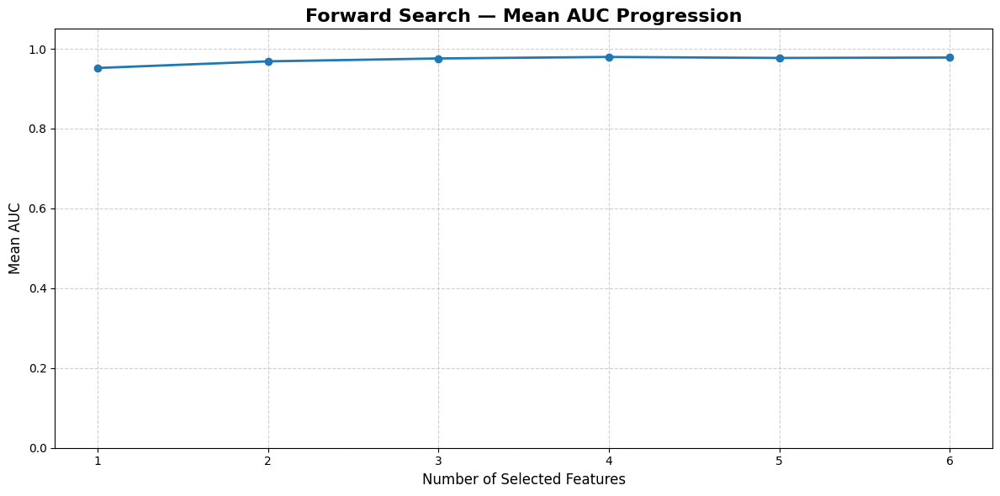

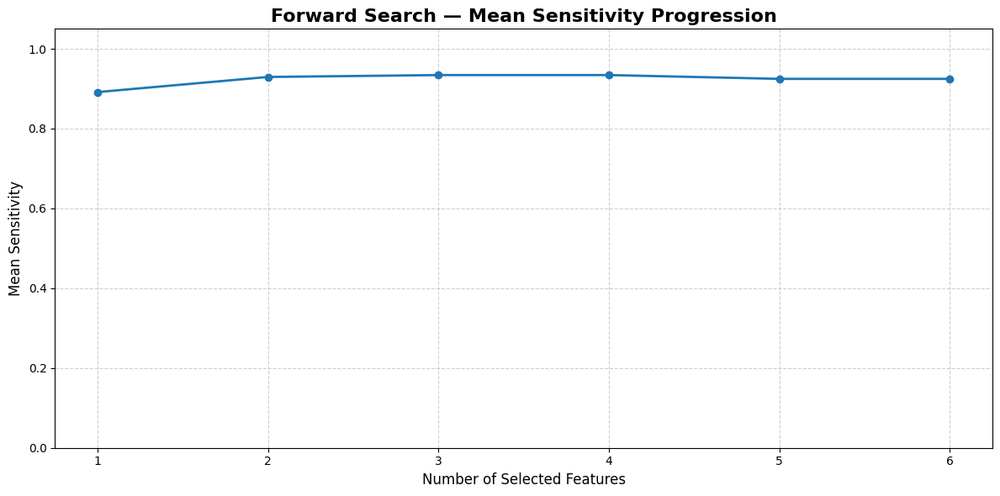

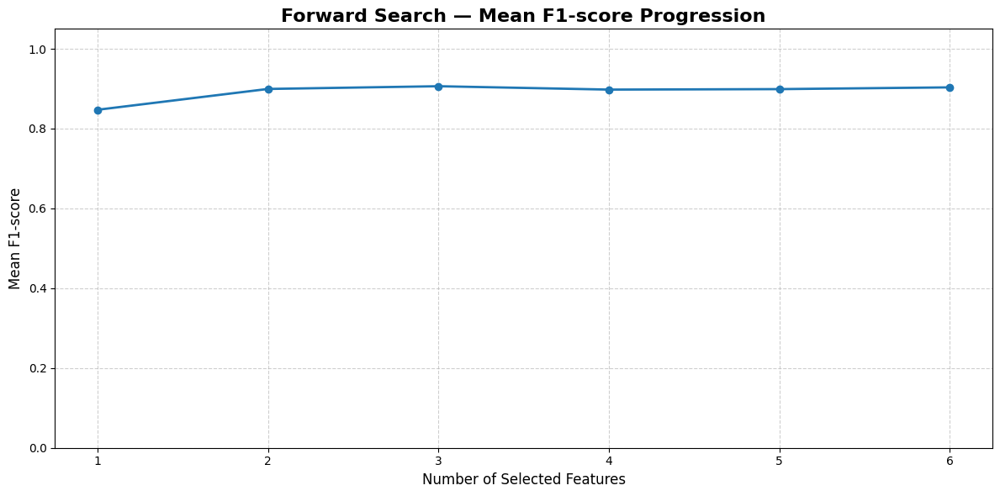

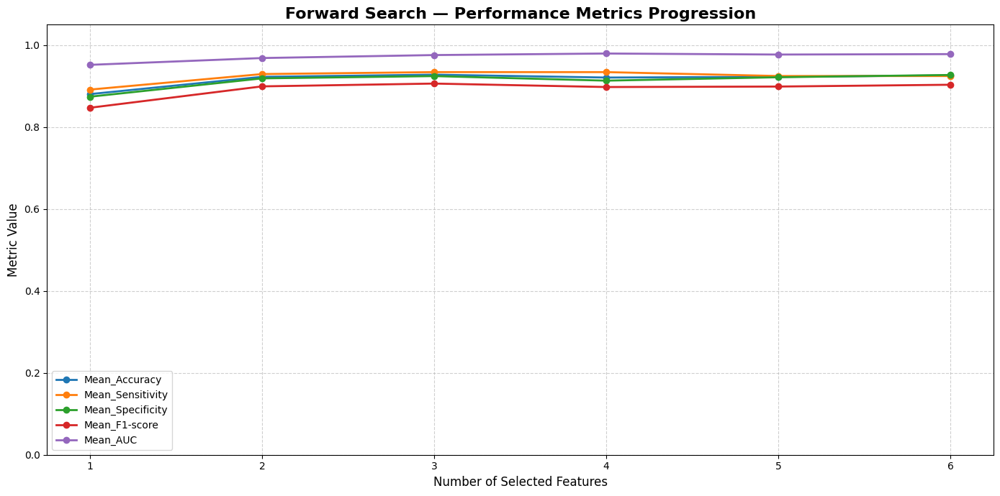

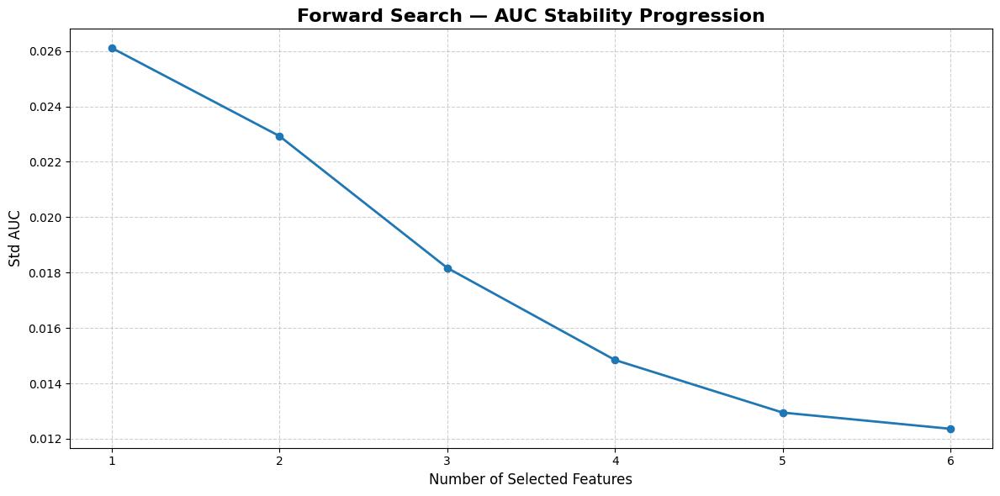

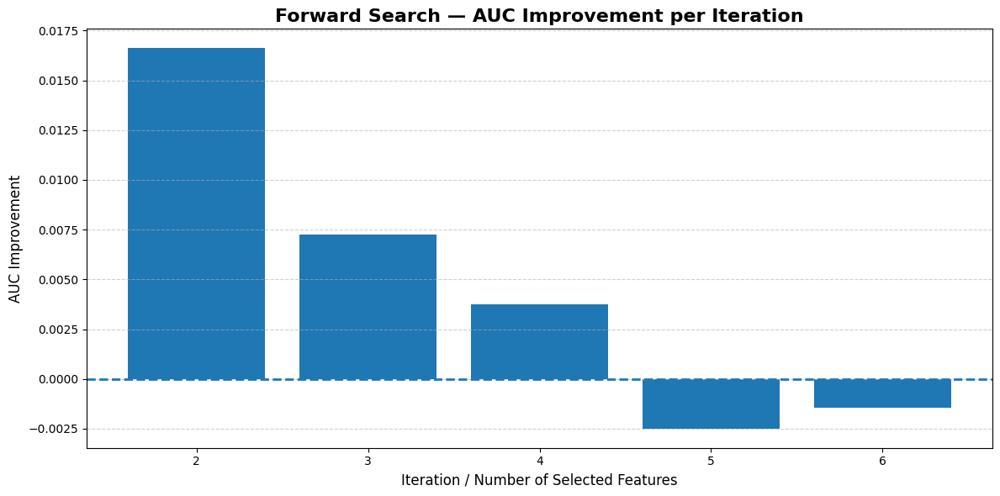

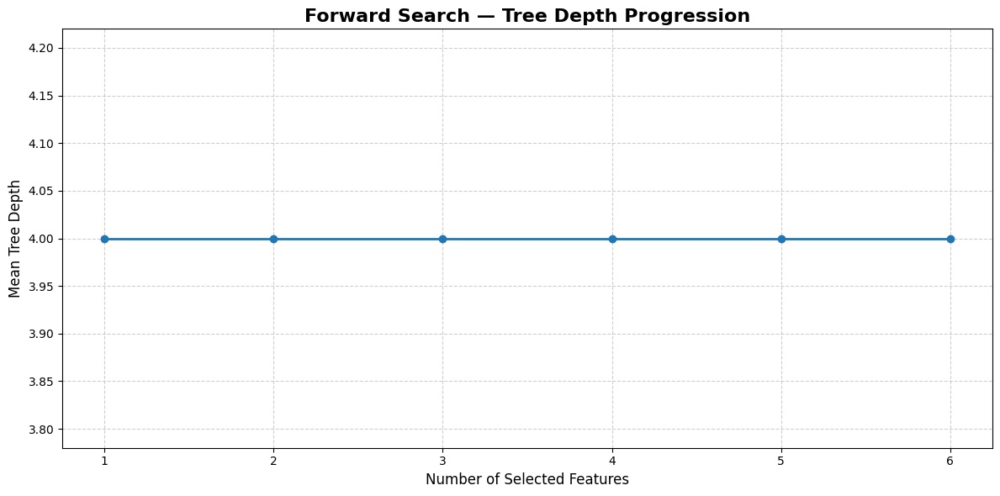

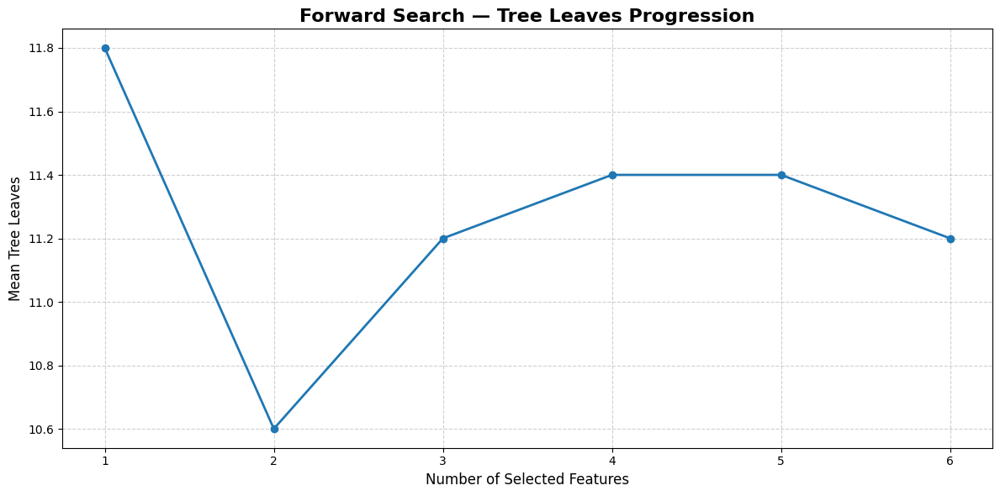

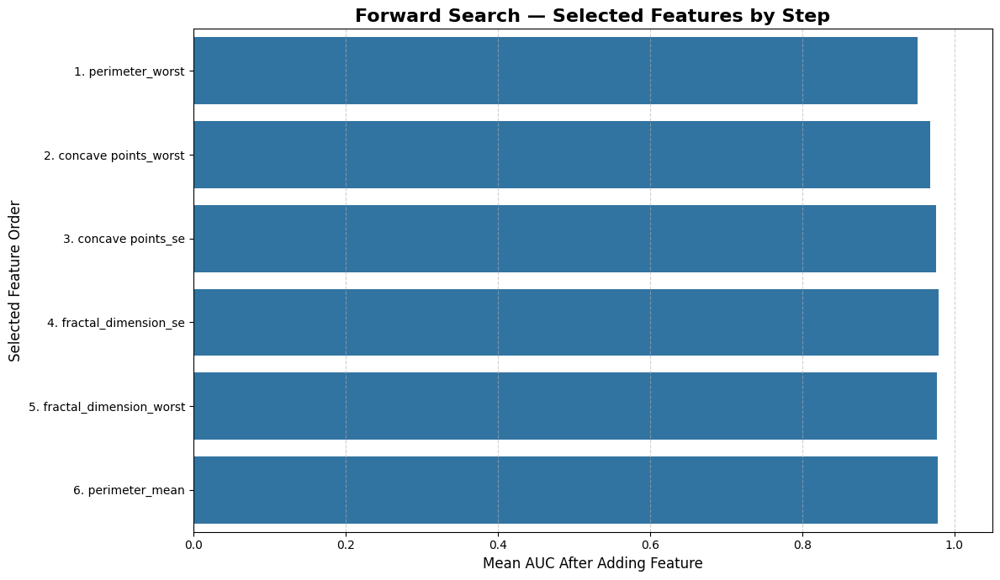

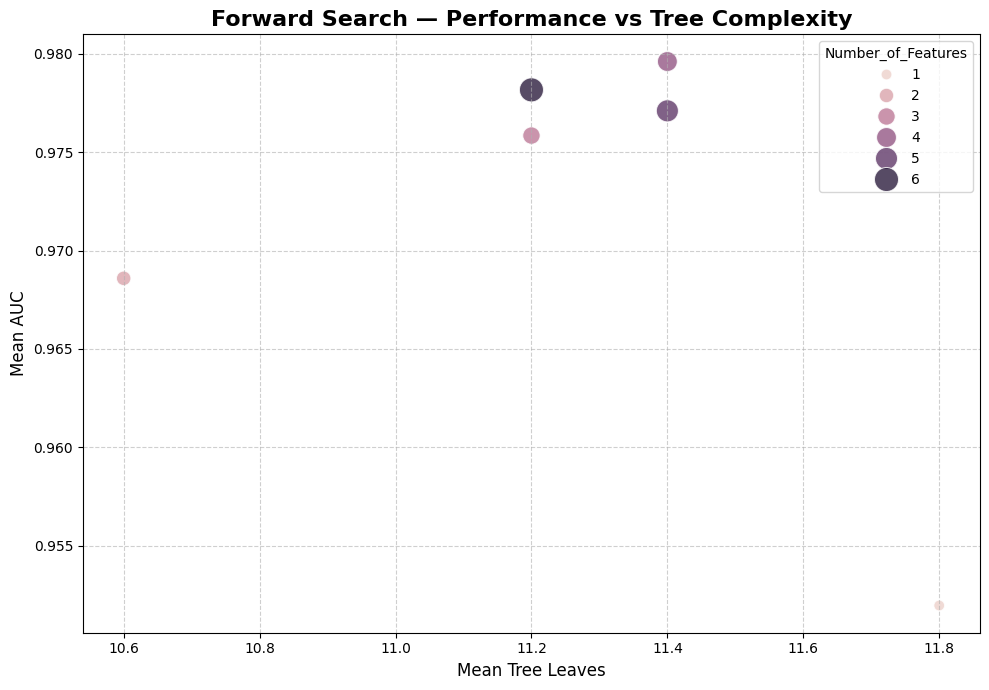

Forward Search performance progression plots are ready.

Progression summary:


,Iteration,Selected_Feature,Number_of_Features,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC,AUC_Improvement,Mean_Tree_Depth,Mean_Tree_Leaves,Mean_Tree_Nodes,Improvement_Status
0,1,perimeter_worst,1,0.880546,0.891584,0.874218,0.847255,0.951965,0.026109,inf,4.0,11.8,22.6,Improved
1,2,concave points_worst,2,0.922714,0.929457,0.918936,0.899422,0.968591,0.022928,0.016626,4.0,10.6,20.2,Improved
2,3,concave points_se,3,0.927977,0.934219,0.924491,0.906261,0.975845,0.018170,0.007254,4.0,11.2,21.4,Improved
3,4,fractal_dimension_se,4,0.920959,0.934219,0.913380,0.897801,0.979607,0.014846,0.003762,4.0,11.4,21.8,Improved
4,5,fractal_dimension_worst,5,0.922714,0.924695,0.921714,0.898979,0.977102,0.012947,-0.002505,4.0,11.4,21.8,No meaningful improvement
5,6,perimeter_mean,6,0.926223,0.924695,0.927269,0.903392,0.978166,0.012362,-0.001441,4.0,11.2,21.4,No meaningful improvement



Analytical best subset:
['perimeter_worst', 'concave points_worst', 'concave points_se', 'fractal_dimension_se']

Best subset label:
perimeter_worst, concave points_worst, concave points_se, fractal_dimension_se

Forward Search performance progression plots completed successfully.


In [96]:
# ============================================================
# BOX 94 — Forward Search Performance Progression Plots
#
# Purpose:
#   - Visualize Forward Feature Search progression
#   - Analyze performance changes as features are added
#   - Compare model complexity against predictive performance
#   - Support analytical subset-size selection
#
# Visual Outputs:
#   1) Mean AUC progression
#   2) Mean Sensitivity progression
#   3) Mean F1-score progression
#   4) Std AUC progression
#   5) AUC improvement per iteration
#   6) Tree depth and leaf progression
#   7) Selected feature order bar chart
#   8) Performance-complexity trade-off
#
# Notes:
#   - No model training is performed in this box
#   - All results are derived from Forward Search outputs
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "forward_search_selected_steps_df",
    "forward_search_best_subset",
    "forward_search_best_subset_label"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(forward_search_selected_steps_df, pd.DataFrame):
    raise TypeError(
        "forward_search_selected_steps_df must be a pandas DataFrame."
    )

if forward_search_selected_steps_df.empty:
    raise ValueError(
        "forward_search_selected_steps_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Prepare progression DataFrame
# ------------------------------------------------------------
forward_progression_plot_df = (
    forward_search_selected_steps_df.copy()
)

required_progression_columns = [
    "Iteration",
    "Selected_Feature",
    "Number_of_Features",
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "AUC_Improvement",
    "Mean_Tree_Depth",
    "Mean_Tree_Leaves",
    "Mean_Tree_Nodes"
]

missing_progression_columns = [
    col for col in required_progression_columns
    if col not in forward_progression_plot_df.columns
]

if len(missing_progression_columns) > 0:
    raise ValueError(
        f"Missing required progression columns: {missing_progression_columns}"
    )

# ------------------------------------------------------------
# Step 2 — Build selected-feature label
# ------------------------------------------------------------
forward_progression_plot_df["Feature_Label"] = (
    forward_progression_plot_df["Iteration"].astype(str)
    + ". "
    + forward_progression_plot_df["Selected_Feature"].astype(str)
)

# ------------------------------------------------------------
# Step 3 — Plot Mean AUC progression
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

plt.plot(
    forward_progression_plot_df["Number_of_Features"],
    forward_progression_plot_df["Mean_AUC"],
    marker="o",
    linewidth=2
)

plt.title(
    "Forward Search — Mean AUC Progression",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Selected Features", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Plot Mean Sensitivity progression
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

plt.plot(
    forward_progression_plot_df["Number_of_Features"],
    forward_progression_plot_df["Mean_Sensitivity"],
    marker="o",
    linewidth=2
)

plt.title(
    "Forward Search — Mean Sensitivity Progression",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Selected Features", fontsize=12)
plt.ylabel("Mean Sensitivity", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — Plot Mean F1-score progression
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

plt.plot(
    forward_progression_plot_df["Number_of_Features"],
    forward_progression_plot_df["Mean_F1-score"],
    marker="o",
    linewidth=2
)

plt.title(
    "Forward Search — Mean F1-score Progression",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Selected Features", fontsize=12)
plt.ylabel("Mean F1-score", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Plot multiple performance metrics together
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in [
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC"
]:

    plt.plot(
        forward_progression_plot_df["Number_of_Features"],
        forward_progression_plot_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    "Forward Search — Performance Metrics Progression",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Selected Features", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Plot Std AUC progression
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

plt.plot(
    forward_progression_plot_df["Number_of_Features"],
    forward_progression_plot_df["Std_AUC"],
    marker="o",
    linewidth=2
)

plt.title(
    "Forward Search — AUC Stability Progression",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Selected Features", fontsize=12)
plt.ylabel("Std AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot AUC improvement per iteration
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

plt.bar(
    forward_progression_plot_df["Number_of_Features"],
    forward_progression_plot_df["AUC_Improvement"]
)

plt.axhline(
    y=0,
    linestyle="--",
    linewidth=2
)

plt.title(
    "Forward Search — AUC Improvement per Iteration",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Iteration / Number of Selected Features", fontsize=12)
plt.ylabel("AUC Improvement", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot tree depth progression
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

plt.plot(
    forward_progression_plot_df["Number_of_Features"],
    forward_progression_plot_df["Mean_Tree_Depth"],
    marker="o",
    linewidth=2
)

plt.title(
    "Forward Search — Tree Depth Progression",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Selected Features", fontsize=12)
plt.ylabel("Mean Tree Depth", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Plot tree leaves progression
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

plt.plot(
    forward_progression_plot_df["Number_of_Features"],
    forward_progression_plot_df["Mean_Tree_Leaves"],
    marker="o",
    linewidth=2
)

plt.title(
    "Forward Search — Tree Leaves Progression",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Selected Features", fontsize=12)
plt.ylabel("Mean Tree Leaves", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 11 — Plot selected feature order
# ------------------------------------------------------------
plt.figure(figsize=(12, 7))

sns.barplot(
    data=forward_progression_plot_df,
    x="Mean_AUC",
    y="Feature_Label"
)

plt.title(
    "Forward Search — Selected Features by Step",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean AUC After Adding Feature", fontsize=12)
plt.ylabel("Selected Feature Order", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 12 — Plot performance-complexity trade-off
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=forward_progression_plot_df,
    x="Mean_Tree_Leaves",
    y="Mean_AUC",
    size="Number_of_Features",
    hue="Number_of_Features",
    sizes=(60, 300),
    alpha=0.8
)

plt.title(
    "Forward Search — Performance vs Tree Complexity",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean Tree Leaves", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 13 — Create progression summary table
# ------------------------------------------------------------
forward_progression_summary_df = (
    forward_progression_plot_df[
        [
            "Iteration",
            "Selected_Feature",
            "Number_of_Features",
            "Mean_Accuracy",
            "Mean_Sensitivity",
            "Mean_Specificity",
            "Mean_F1-score",
            "Mean_AUC",
            "Std_AUC",
            "AUC_Improvement",
            "Mean_Tree_Depth",
            "Mean_Tree_Leaves",
            "Mean_Tree_Nodes",
            "Improvement_Status"
        ]
    ]
    .copy()
)

numeric_columns = [
    col for col in forward_progression_summary_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Improvement" in col
    )
]

forward_progression_summary_display_df = (
    forward_progression_summary_df.copy()
)

forward_progression_summary_display_df[
    numeric_columns
] = (
    forward_progression_summary_display_df[
        numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 14 — Display summary report
# ------------------------------------------------------------
print(
    "Forward Search performance progression plots are ready."
)

print("\nProgression summary:")
display(
    forward_progression_summary_display_df
)

print("\nAnalytical best subset:")
print(
    forward_search_best_subset
)

print("\nBest subset label:")
print(
    forward_search_best_subset_label
)


print(
    "\nForward Search performance progression "
    "plots completed successfully."
)

Forward Feature Stability and Selection Frequency Analysis is ready.

Feature stability summary:


,Total_Features,Selected_Features,Top_K_Threshold,Best_Candidate_Features,Features_Appearing_In_Top_K
0,30,6,3,6,14



Feature stability ranking:


,Feature,Selected_Count,Candidate_Appearance_Count,Top_K_Count,Best_Candidate_Count,Average_Candidate_Rank,Best_Rank,Worst_Rank,Average_Mean_AUC,Max_Mean_AUC,...,Average_Std_AUC,Min_Std_AUC,Selection_Order,Selected_Score,Top_K_Score,Best_Candidate_Score,AUC_Score,Sensitivity_Score,Rank_Stability_Score,Feature_Stability_Score
0,fractal_dimension_worst,1,5,2,1,12.000000,1,25,0.905071,0.977102,...,0.022193,0.012947,5.0,1.0,1.0,1.0,0.909367,0.776623,0.467742,0.906310
1,concave points_se,1,3,1,1,10.000000,1,17,0.895083,0.975845,...,0.020535,0.018170,3.0,1.0,0.5,1.0,0.863905,1.000000,0.564516,0.854233
2,fractal_dimension_se,1,4,1,1,16.500000,1,26,0.875840,0.979607,...,0.028362,0.014846,4.0,1.0,0.5,1.0,1.000000,1.000000,0.250000,0.850000
3,perimeter_mean,1,6,1,1,14.666667,1,27,0.961085,0.978166,...,0.024228,0.012362,6.0,1.0,0.5,1.0,0.947885,0.776623,0.338710,0.826110
4,concave points_worst,1,2,1,1,3.000000,1,5,0.955204,0.968591,...,0.019606,0.016284,2.0,1.0,0.5,1.0,0.601488,0.888312,0.903226,0.824451
5,perimeter_worst,1,1,1,1,1.000000,1,1,0.951965,0.951965,...,0.026109,0.026109,1.0,1.0,0.5,1.0,0.000000,0.000000,1.000000,0.625000
6,smoothness_mean,0,6,2,0,11.833333,2,23,0.921701,0.977475,...,0.022400,0.013182,NaN,0.0,1.0,0.0,0.922864,0.888312,0.475806,0.470985
7,concavity_se,0,6,2,0,10.833333,2,23,0.933585,0.977604,...,0.026157,0.012816,NaN,0.0,1.0,0.0,0.927547,0.776623,0.524194,0.465591
8,symmetry_worst,0,6,2,0,9.333333,2,22,0.926384,0.975693,...,0.027356,0.015501,NaN,0.0,1.0,0.0,0.858416,0.342857,0.596774,0.415646
9,area_worst,0,6,1,0,11.166667,2,25,0.966296,0.975632,...,0.023561,0.014825,NaN,0.0,0.5,0.0,0.856206,0.888312,0.508065,0.385879



Selected feature frequency:


,Feature,Selected_Count
0,perimeter_worst,1
1,concave points_worst,1
2,concave points_se,1
3,fractal_dimension_se,1
4,fractal_dimension_worst,1
5,perimeter_mean,1



Top-k candidate frequency:


,Feature,Top_K_Count
0,smoothness_mean,2
1,symmetry_worst,2
2,fractal_dimension_worst,2
3,concavity_se,2
4,perimeter_worst,1
5,area_worst,1
6,area_mean,1
7,compactness_worst,1
8,concave points_worst,1
9,radius_worst,1



Best-candidate frequency:


,Feature,Best_Candidate_Count
0,perimeter_worst,1
1,concave points_worst,1
2,concave points_se,1
3,fractal_dimension_se,1
4,fractal_dimension_worst,1
5,perimeter_mean,1


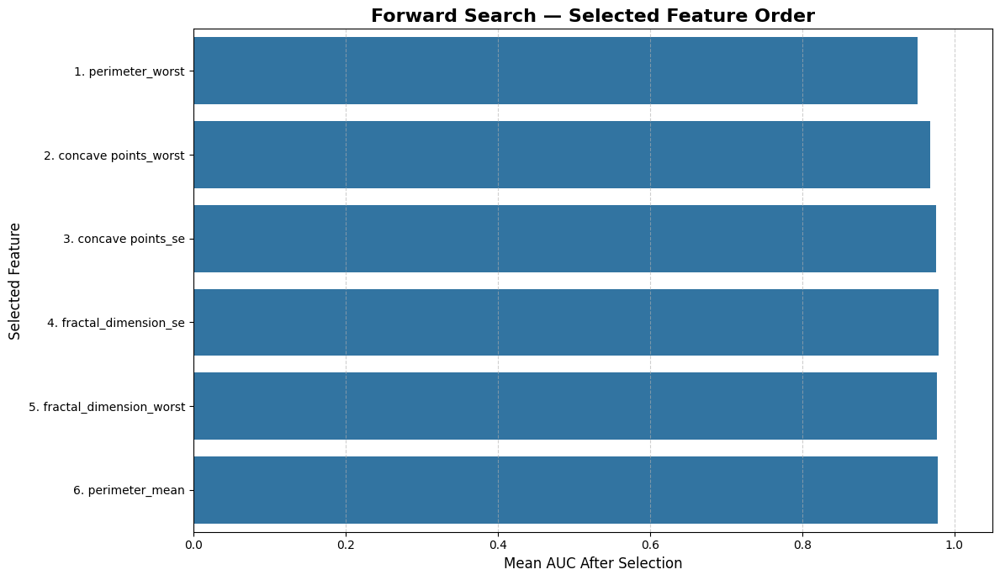

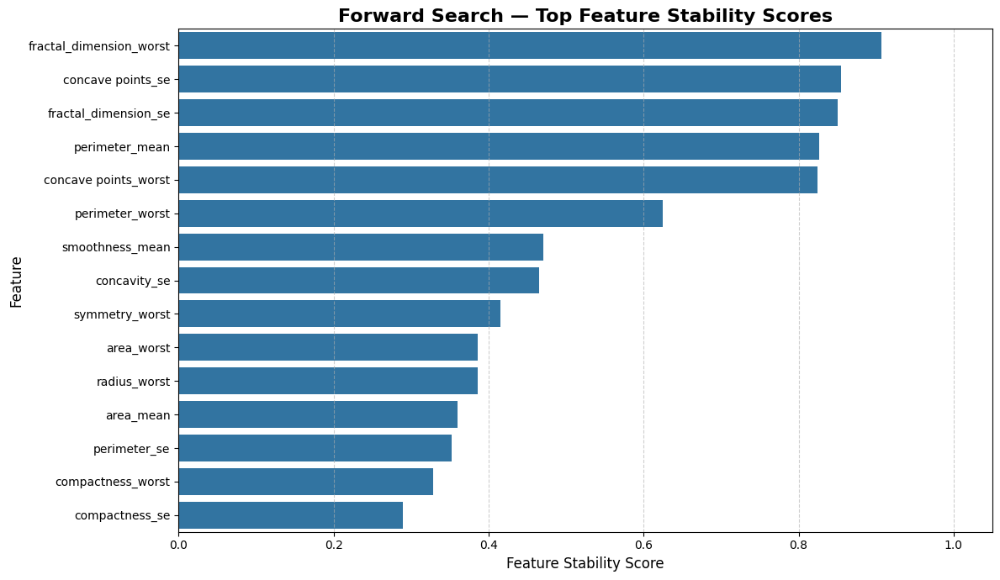

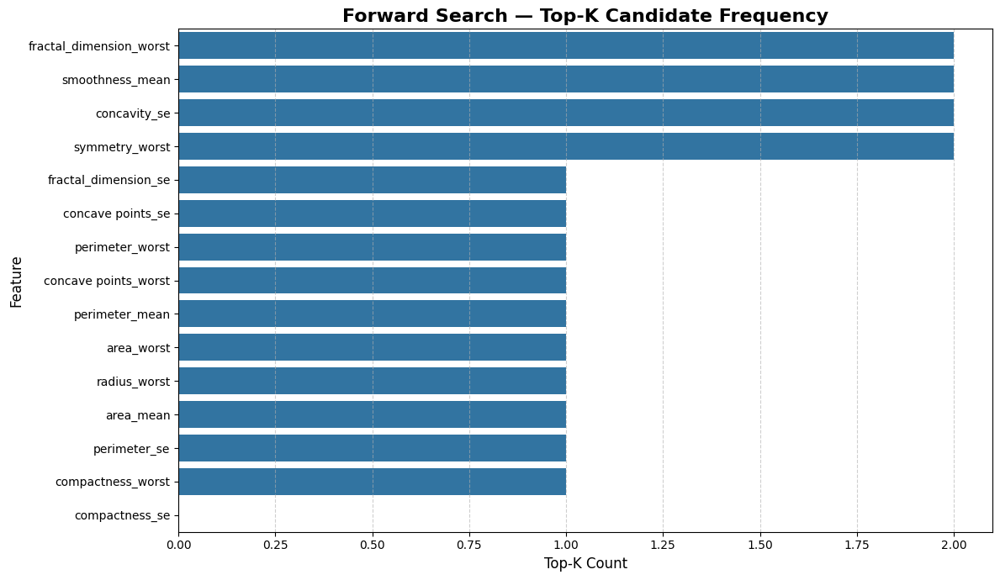

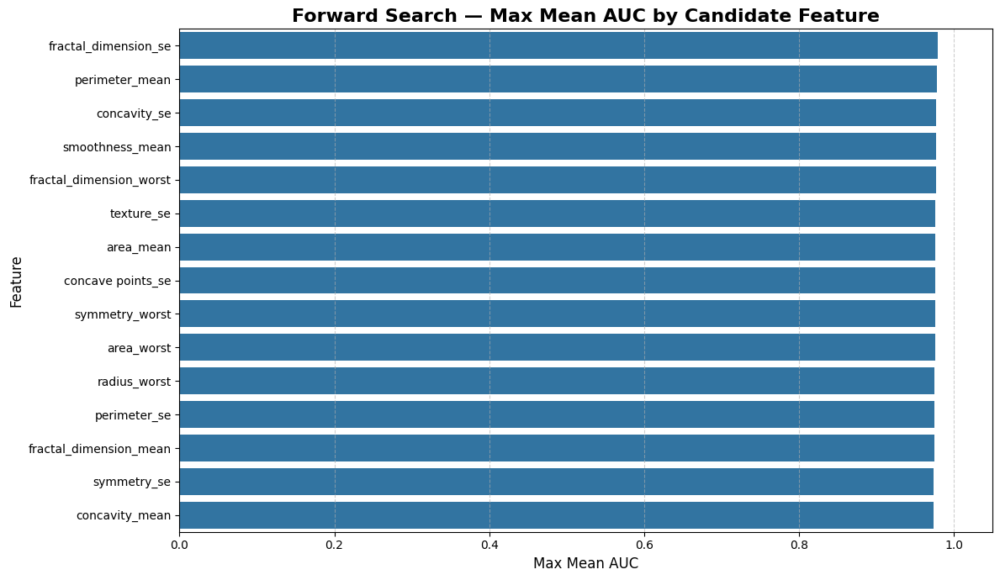


Forward Feature Stability and Selection Frequency Analysis completed successfully.


In [97]:
# ============================================================
# BOX 95 — Forward Feature Stability and Selection Frequency Analysis
#
# Purpose:
#   - Analyze Forward Search feature-selection behavior
#   - Measure how frequently each feature appears as a strong candidate
#   - Analyze selected-feature order and candidate ranking stability
#   - Identify robust and influential features
#
# Analytical Dimensions:
#   1) Selected feature order
#   2) Candidate appearance frequency
#   3) Top-k candidate frequency
#   4) Best-candidate frequency
#   5) Average candidate rank
#   6) Average candidate performance
#
# Notes:
#   - No model training is performed in this box
#   - All results are derived from BOX 92 and BOX 93
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "forward_search_all_candidate_results_df",
    "forward_search_selected_steps_df",
    "forward_candidate_features"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(forward_search_all_candidate_results_df, pd.DataFrame):
    raise TypeError(
        "forward_search_all_candidate_results_df must be a pandas DataFrame."
    )

if not isinstance(forward_search_selected_steps_df, pd.DataFrame):
    raise TypeError(
        "forward_search_selected_steps_df must be a pandas DataFrame."
    )

if forward_search_all_candidate_results_df.empty:
    raise ValueError(
        "forward_search_all_candidate_results_df is empty."
    )

if forward_search_selected_steps_df.empty:
    raise ValueError(
        "forward_search_selected_steps_df is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define top-k threshold
# ------------------------------------------------------------
FORWARD_TOP_K_CANDIDATES = 3

# ------------------------------------------------------------
# Step 2 — Build selected feature frequency table
# ------------------------------------------------------------
forward_selected_feature_frequency_df = (
    forward_search_selected_steps_df[
        "Selected_Feature"
    ]
    .value_counts()
    .reset_index()
)

forward_selected_feature_frequency_df.columns = [
    "Feature",
    "Selected_Count"
]

# ------------------------------------------------------------
# Step 3 — Build candidate appearance frequency table
# ------------------------------------------------------------
forward_candidate_appearance_df = (
    forward_search_all_candidate_results_df[
        "Candidate_Feature"
    ]
    .value_counts()
    .reset_index()
)

forward_candidate_appearance_df.columns = [
    "Feature",
    "Candidate_Appearance_Count"
]

# ------------------------------------------------------------
# Step 4 — Build top-k candidate frequency table
# ------------------------------------------------------------
forward_top_candidate_frequency_df = (
    forward_search_all_candidate_results_df[
        forward_search_all_candidate_results_df[
            "Candidate_Rank"
        ] <= FORWARD_TOP_K_CANDIDATES
    ]
    ["Candidate_Feature"]
    .value_counts()
    .reset_index()
)

forward_top_candidate_frequency_df.columns = [
    "Feature",
    "Top_K_Count"
]

# ------------------------------------------------------------
# Step 5 — Build best-candidate frequency table
# ------------------------------------------------------------
forward_best_candidate_frequency_df = (
    forward_search_all_candidate_results_df[
        forward_search_all_candidate_results_df[
            "Candidate_Rank"
        ] == 1
    ]
    ["Candidate_Feature"]
    .value_counts()
    .reset_index()
)

forward_best_candidate_frequency_df.columns = [
    "Feature",
    "Best_Candidate_Count"
]

# ------------------------------------------------------------
# Step 6 — Build average candidate-rank table
# ------------------------------------------------------------
forward_average_rank_df = (
    forward_search_all_candidate_results_df
    .groupby("Candidate_Feature")
    .agg(
        Average_Candidate_Rank=(
            "Candidate_Rank",
            "mean"
        ),
        Best_Rank=(
            "Candidate_Rank",
            "min"
        ),
        Worst_Rank=(
            "Candidate_Rank",
            "max"
        )
    )
    .reset_index()
    .rename(
        columns={
            "Candidate_Feature": "Feature"
        }
    )
)

# ------------------------------------------------------------
# Step 7 — Build average performance table per candidate feature
# ------------------------------------------------------------
forward_candidate_performance_df = (
    forward_search_all_candidate_results_df
    .groupby("Candidate_Feature")
    .agg(
        Average_Mean_AUC=(
            "Mean_AUC",
            "mean"
        ),
        Max_Mean_AUC=(
            "Mean_AUC",
            "max"
        ),
        Average_Mean_Sensitivity=(
            "Mean_Sensitivity",
            "mean"
        ),
        Max_Mean_Sensitivity=(
            "Mean_Sensitivity",
            "max"
        ),
        Average_Mean_F1_score=(
            "Mean_F1-score",
            "mean"
        ),
        Max_Mean_F1_score=(
            "Mean_F1-score",
            "max"
        ),
        Average_Std_AUC=(
            "Std_AUC",
            "mean"
        ),
        Min_Std_AUC=(
            "Std_AUC",
            "min"
        )
    )
    .reset_index()
    .rename(
        columns={
            "Candidate_Feature": "Feature"
        }
    )
)

# ------------------------------------------------------------
# Step 8 — Merge all feature-stability evidence
# ------------------------------------------------------------
forward_feature_stability_df = pd.DataFrame({
    "Feature": forward_candidate_features
})

forward_feature_stability_df = (
    forward_feature_stability_df
    .merge(
        forward_selected_feature_frequency_df,
        on="Feature",
        how="left"
    )
    .merge(
        forward_candidate_appearance_df,
        on="Feature",
        how="left"
    )
    .merge(
        forward_top_candidate_frequency_df,
        on="Feature",
        how="left"
    )
    .merge(
        forward_best_candidate_frequency_df,
        on="Feature",
        how="left"
    )
    .merge(
        forward_average_rank_df,
        on="Feature",
        how="left"
    )
    .merge(
        forward_candidate_performance_df,
        on="Feature",
        how="left"
    )
)

count_columns = [
    "Selected_Count",
    "Candidate_Appearance_Count",
    "Top_K_Count",
    "Best_Candidate_Count"
]

forward_feature_stability_df[
    count_columns
] = (
    forward_feature_stability_df[
        count_columns
    ]
    .fillna(0)
    .astype(int)
)

# ------------------------------------------------------------
# Step 9 — Add selection-order information
# ------------------------------------------------------------
selection_order_df = (
    forward_search_selected_steps_df[
        [
            "Selected_Feature",
            "Iteration"
        ]
    ]
    .rename(
        columns={
            "Selected_Feature": "Feature",
            "Iteration": "Selection_Order"
        }
    )
)

forward_feature_stability_df = (
    forward_feature_stability_df
    .merge(
        selection_order_df,
        on="Feature",
        how="left"
    )
)

# ------------------------------------------------------------
# Step 10 — Compute analytical stability score
# ------------------------------------------------------------
def min_max_normalize(series):
    """
    Apply min-max normalization.
    If all values are equal, return ones.
    """

    valid_series = series.fillna(series.mean())

    min_value = valid_series.min()
    max_value = valid_series.max()

    if max_value == min_value:
        return pd.Series(
            np.ones(len(valid_series)),
            index=valid_series.index
        )

    return (
        (valid_series - min_value)
        / (max_value - min_value)
    )

forward_feature_stability_df["Selected_Score"] = (
    min_max_normalize(
        forward_feature_stability_df["Selected_Count"]
    )
)

forward_feature_stability_df["Top_K_Score"] = (
    min_max_normalize(
        forward_feature_stability_df["Top_K_Count"]
    )
)

forward_feature_stability_df["Best_Candidate_Score"] = (
    min_max_normalize(
        forward_feature_stability_df["Best_Candidate_Count"]
    )
)

forward_feature_stability_df["AUC_Score"] = (
    min_max_normalize(
        forward_feature_stability_df["Max_Mean_AUC"]
    )
)

forward_feature_stability_df["Sensitivity_Score"] = (
    min_max_normalize(
        forward_feature_stability_df["Max_Mean_Sensitivity"]
    )
)

forward_feature_stability_df["Rank_Stability_Score"] = (
    1
    - min_max_normalize(
        forward_feature_stability_df["Average_Candidate_Rank"]
    )
)

forward_feature_stability_df["Feature_Stability_Score"] = (
    0.25 * forward_feature_stability_df["Selected_Score"]
    + 0.20 * forward_feature_stability_df["Best_Candidate_Score"]
    + 0.15 * forward_feature_stability_df["Top_K_Score"]
    + 0.20 * forward_feature_stability_df["AUC_Score"]
    + 0.10 * forward_feature_stability_df["Sensitivity_Score"]
    + 0.10 * forward_feature_stability_df["Rank_Stability_Score"]
)

# ------------------------------------------------------------
# Step 11 — Sort feature stability table
# ------------------------------------------------------------
forward_feature_stability_df = (
    forward_feature_stability_df
    .sort_values(
        by=[
            "Feature_Stability_Score",
            "Selected_Count",
            "Best_Candidate_Count",
            "Max_Mean_AUC",
            "Average_Candidate_Rank"
        ],
        ascending=[
            False,
            False,
            False,
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 12 — Create summary table
# ------------------------------------------------------------
forward_feature_stability_summary_df = pd.DataFrame([{

    "Total_Features":
        len(forward_candidate_features),

    "Selected_Features":
        forward_search_selected_steps_df[
            "Selected_Feature"
        ].nunique(),

    "Top_K_Threshold":
        FORWARD_TOP_K_CANDIDATES,

    "Best_Candidate_Features":
        forward_best_candidate_frequency_df[
            "Feature"
        ].nunique(),

    "Features_Appearing_In_Top_K":
        forward_top_candidate_frequency_df[
            "Feature"
        ].nunique()
}])

# ------------------------------------------------------------
# Step 13 — Create rounded display table
# ------------------------------------------------------------
forward_feature_stability_display_df = (
    forward_feature_stability_df.copy()
)

numeric_columns = [
    col for col in forward_feature_stability_display_df.columns
    if forward_feature_stability_display_df[col].dtype != "object"
]

forward_feature_stability_display_df[
    numeric_columns
] = (
    forward_feature_stability_display_df[
        numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 14 — Display stability reports
# ------------------------------------------------------------
print(
    "Forward Feature Stability and Selection Frequency Analysis is ready."
)

print("\nFeature stability summary:")
display(
    forward_feature_stability_summary_df
)

print("\nFeature stability ranking:")
display(
    forward_feature_stability_display_df
)

print("\nSelected feature frequency:")
display(
    forward_selected_feature_frequency_df
)

print("\nTop-k candidate frequency:")
display(
    forward_top_candidate_frequency_df
)

print("\nBest-candidate frequency:")
display(
    forward_best_candidate_frequency_df
)

# ------------------------------------------------------------
# Step 15 — Plot selected feature order
# ------------------------------------------------------------
selected_order_plot_df = (
    forward_search_selected_steps_df.copy()
)

selected_order_plot_df["Feature_Label"] = (
    selected_order_plot_df["Iteration"].astype(str)
    + ". "
    + selected_order_plot_df["Selected_Feature"].astype(str)
)

plt.figure(figsize=(12, 7))

sns.barplot(
    data=selected_order_plot_df,
    x="Mean_AUC",
    y="Feature_Label"
)

plt.title(
    "Forward Search — Selected Feature Order",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Mean AUC After Selection", fontsize=12)
plt.ylabel("Selected Feature", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 16 — Plot feature stability score
# ------------------------------------------------------------
top_stability_plot_df = (
    forward_feature_stability_df
    .head(15)
    .copy()
)

plt.figure(figsize=(12, 7))

sns.barplot(
    data=top_stability_plot_df,
    x="Feature_Stability_Score",
    y="Feature"
)

plt.title(
    "Forward Search — Top Feature Stability Scores",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Feature Stability Score", fontsize=12)
plt.ylabel("Feature", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 17 — Plot top-k candidate frequency
# ------------------------------------------------------------
top_k_plot_df = (
    forward_feature_stability_df
    .sort_values(
        by="Top_K_Count",
        ascending=False
    )
    .head(15)
)

plt.figure(figsize=(12, 7))

sns.barplot(
    data=top_k_plot_df,
    x="Top_K_Count",
    y="Feature"
)

plt.title(
    "Forward Search — Top-K Candidate Frequency",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Top-K Count", fontsize=12)
plt.ylabel("Feature", fontsize=12)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 18 — Plot Max Mean AUC by feature
# ------------------------------------------------------------
max_auc_plot_df = (
    forward_feature_stability_df
    .sort_values(
        by="Max_Mean_AUC",
        ascending=False
    )
    .head(15)
)

plt.figure(figsize=(12, 7))

sns.barplot(
    data=max_auc_plot_df,
    x="Max_Mean_AUC",
    y="Feature"
)

plt.title(
    "Forward Search — Max Mean AUC by Candidate Feature",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Max Mean AUC", fontsize=12)
plt.ylabel("Feature", fontsize=12)

plt.xlim(0, 1.05)

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()


print(
    "\nForward Feature Stability and Selection Frequency Analysis "
    "completed successfully."
)

In [98]:
# ============================================================
# BOX 96 — Analytical Best Feature Subset Selection
#
# Purpose:
#   - Select the best Forward Search feature subset analytically
#   - Avoid manual subset selection
#   - Combine predictive performance, stability, and simplicity
#   - Prepare final selected feature subset for downstream evaluation
#
# Selection Priority:
#   1) Highest Mean_AUC
#   2) Highest Mean_Sensitivity
#   3) Highest Mean_F1-score
#   4) Lowest Std_AUC
#   5) Lower Number_of_Features
#   6) Lower Mean_Tree_Depth
#   7) Lower Mean_Tree_Leaves
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "forward_search_selected_steps_df",
    "forward_feature_stability_df"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(forward_search_selected_steps_df, pd.DataFrame):
    raise TypeError(
        "forward_search_selected_steps_df must be a pandas DataFrame."
    )

if forward_search_selected_steps_df.empty:
    raise ValueError(
        "forward_search_selected_steps_df is empty."
    )

if not isinstance(forward_feature_stability_df, pd.DataFrame):
    raise TypeError(
        "forward_feature_stability_df must be a pandas DataFrame."
    )

# ------------------------------------------------------------
# Step 1 — Create subset ranking table
# ------------------------------------------------------------
forward_final_subset_ranking_df = (
    forward_search_selected_steps_df
    .copy()
    .sort_values(
        by=[
            "Mean_AUC",
            "Mean_Sensitivity",
            "Mean_F1-score",
            "Std_AUC",
            "Number_of_Features",
            "Mean_Tree_Depth",
            "Mean_Tree_Leaves"
        ],
        ascending=[
            False,
            False,
            False,
            True,
            True,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

forward_final_subset_ranking_df.insert(
    0,
    "Subset_Rank",
    np.arange(
        1,
        len(forward_final_subset_ranking_df) + 1
    )
)

# ------------------------------------------------------------
# Step 2 — Select best analytical subset
# ------------------------------------------------------------
best_forward_subset_row = (
    forward_final_subset_ranking_df
    .iloc[0]
)

BEST_FORWARD_SUBSET_ITERATION = int(
    best_forward_subset_row["Iteration"]
)

BEST_FORWARD_NUMBER_OF_FEATURES = int(
    best_forward_subset_row["Number_of_Features"]
)

BEST_FORWARD_SELECTED_FEATURES = (
    best_forward_subset_row[
        "Selected_Feature_Subset"
    ]
)

BEST_FORWARD_SELECTED_FEATURES_LABEL = (
    best_forward_subset_row[
        "Selected_Feature_Subset_Label"
    ]
)

# ------------------------------------------------------------
# Step 3 — Validate selected features
# ------------------------------------------------------------
if not isinstance(BEST_FORWARD_SELECTED_FEATURES, list):
    raise TypeError(
        "BEST_FORWARD_SELECTED_FEATURES must be a list."
    )

if len(BEST_FORWARD_SELECTED_FEATURES) == 0:
    raise ValueError(
        "BEST_FORWARD_SELECTED_FEATURES is empty."
    )

# ------------------------------------------------------------
# Step 4 — Build best subset report
# ------------------------------------------------------------
best_forward_subset_report = {

    "Subset_Rank":
        1,

    "Best_Iteration":
        BEST_FORWARD_SUBSET_ITERATION,

    "Number_of_Features":
        BEST_FORWARD_NUMBER_OF_FEATURES,

    "Selected_Features":
        BEST_FORWARD_SELECTED_FEATURES_LABEL,

    "Mean_Accuracy":
        best_forward_subset_row["Mean_Accuracy"],

    "Std_Accuracy":
        best_forward_subset_row["Std_Accuracy"],

    "Mean_Sensitivity":
        best_forward_subset_row["Mean_Sensitivity"],

    "Std_Sensitivity":
        best_forward_subset_row["Std_Sensitivity"],

    "Mean_Specificity":
        best_forward_subset_row["Mean_Specificity"],

    "Std_Specificity":
        best_forward_subset_row["Std_Specificity"],

    "Mean_Precision":
        best_forward_subset_row["Mean_Precision"],

    "Std_Precision":
        best_forward_subset_row["Std_Precision"],

    "Mean_F1-score":
        best_forward_subset_row["Mean_F1-score"],

    "Std_F1-score":
        best_forward_subset_row["Std_F1-score"],

    "Mean_AUC":
        best_forward_subset_row["Mean_AUC"],

    "Std_AUC":
        best_forward_subset_row["Std_AUC"],

    "Min_AUC":
        best_forward_subset_row["Min_AUC"],

    "Max_AUC":
        best_forward_subset_row["Max_AUC"],

    "Mean_Tree_Depth":
        best_forward_subset_row["Mean_Tree_Depth"],

    "Mean_Tree_Leaves":
        best_forward_subset_row["Mean_Tree_Leaves"],

    "Mean_Tree_Nodes":
        best_forward_subset_row["Mean_Tree_Nodes"]
}

best_forward_subset_df = pd.DataFrame(
    [best_forward_subset_report]
)

# ------------------------------------------------------------
# Step 5 — Create top-5 subset comparison table
# ------------------------------------------------------------
top5_forward_subsets_df = (
    forward_final_subset_ranking_df
    .head(5)
    .copy()
)

top5_forward_subset_columns = [
    "Subset_Rank",
    "Iteration",
    "Number_of_Features",
    "Selected_Feature",
    "Selected_Feature_Subset_Label",
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC",
    "Std_AUC",
    "Mean_Tree_Depth",
    "Mean_Tree_Leaves",
    "AUC_Improvement",
    "Improvement_Status"
]

top5_forward_subsets_df = (
    top5_forward_subsets_df[
        top5_forward_subset_columns
    ]
)

# ------------------------------------------------------------
# Step 6 — Add feature-stability evidence for selected subset
# ------------------------------------------------------------
selected_feature_stability_df = (
    forward_feature_stability_df[
        forward_feature_stability_df["Feature"].isin(
            BEST_FORWARD_SELECTED_FEATURES
        )
    ]
    .copy()
)

selected_feature_stability_df = (
    selected_feature_stability_df
    .sort_values(
        by=[
            "Feature_Stability_Score",
            "Selected_Count",
            "Max_Mean_AUC"
        ],
        ascending=[
            False,
            False,
            False
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 7 — Create selection interpretation table
# ------------------------------------------------------------
forward_subset_selection_interpretation_df = pd.DataFrame([{

    "Selected_Method":
        "Forward Feature Search with Decision Tree",

    "Selection_Type":
        "Fully Analytical",

    "Primary_Criterion":
        "Highest Mean_AUC",

    "Secondary_Criterion":
        "Highest Mean_Sensitivity",

    "Tertiary_Criterion":
        "Highest Mean_F1-score",

    "Stability_Criterion":
        "Lowest Std_AUC",

    "Simplicity_Criterion":
        "Lower Number_of_Features",

    "Complexity_Criterion":
        "Lower Mean_Tree_Depth and Mean_Tree_Leaves"
}])

# ------------------------------------------------------------
# Step 8 — Store final metadata
# ------------------------------------------------------------
best_forward_subset_metadata = {

    "method_name":
        "Forward Feature Search",

    "base_model":
        "Decision Tree",

    "best_iteration":
        BEST_FORWARD_SUBSET_ITERATION,

    "number_of_features":
        BEST_FORWARD_NUMBER_OF_FEATURES,

    "selected_features":
        BEST_FORWARD_SELECTED_FEATURES,

    "selected_features_label":
        BEST_FORWARD_SELECTED_FEATURES_LABEL,

    "selection_rule":
        (
            "Mean_AUC desc, Mean_Sensitivity desc, "
            "Mean_F1-score desc, Std_AUC asc, "
            "Number_of_Features asc"
        )
}

# ------------------------------------------------------------
# Step 9 — Create rounded display tables
# ------------------------------------------------------------
best_forward_subset_display_df = (
    best_forward_subset_df.copy()
)

best_numeric_columns = [
    col for col in best_forward_subset_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Min" in col
        or "Max" in col
    )
]

best_forward_subset_display_df[
    best_numeric_columns
] = (
    best_forward_subset_display_df[
        best_numeric_columns
    ].round(6)
)

top5_forward_subsets_display_df = (
    top5_forward_subsets_df.copy()
)

top5_numeric_columns = [
    col for col in top5_forward_subsets_display_df.columns
    if (
        "Mean" in col
        or "Std" in col
        or "Improvement" in col
    )
]

top5_forward_subsets_display_df[
    top5_numeric_columns
] = (
    top5_forward_subsets_display_df[
        top5_numeric_columns
    ].round(6)
)

selected_feature_stability_display_df = (
    selected_feature_stability_df.copy()
)

selected_stability_numeric_columns = [
    col for col in selected_feature_stability_display_df.columns
    if selected_feature_stability_display_df[col].dtype != "object"
]

selected_feature_stability_display_df[
    selected_stability_numeric_columns
] = (
    selected_feature_stability_display_df[
        selected_stability_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 10 — Display final subset selection reports
# ------------------------------------------------------------
print(
    "Analytical best Forward Feature subset selected."
)

print("\nSelection criteria:")
display(
    forward_subset_selection_interpretation_df
)

print("\nBest Forward Feature subset:")
display(
    best_forward_subset_display_df
)

print("\nTop 5 Forward Feature subsets:")
display(
    top5_forward_subsets_display_df
)

print("\nSelected feature stability evidence:")
display(
    selected_feature_stability_display_df
)

print("\nSelected features:")
print(
    BEST_FORWARD_SELECTED_FEATURES
)


print(
    "\nAnalytical best feature subset selection "
    "completed successfully."
)

Analytical best Forward Feature subset selected.

Selection criteria:


,Selected_Method,Selection_Type,Primary_Criterion,Secondary_Criterion,Tertiary_Criterion,Stability_Criterion,Simplicity_Criterion,Complexity_Criterion
0,Forward Feature Search with Decision Tree,Fully Analytical,Highest Mean_AUC,Highest Mean_Sensitivity,Highest Mean_F1-score,Lowest Std_AUC,Lower Number_of_Features,Lower Mean_Tree_Depth and Mean_Tree_Leaves



Best Forward Feature subset:


,Subset_Rank,Best_Iteration,Number_of_Features,Selected_Features,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Std_Specificity,...,Std_Precision,Mean_F1-score,Std_F1-score,Mean_AUC,Std_AUC,Min_AUC,Max_AUC,Mean_Tree_Depth,Mean_Tree_Leaves,Mean_Tree_Nodes
0,1,4,4,"perimeter_worst, concave points_worst, concave...",0.920959,0.018444,0.934219,0.077967,0.91338,0.051364,...,0.06342,0.897801,0.024748,0.979607,0.014846,0.962632,0.993717,4.0,11.4,21.8



Top 5 Forward Feature subsets:


,Subset_Rank,Iteration,Number_of_Features,Selected_Feature,Selected_Feature_Subset_Label,Mean_Accuracy,Mean_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC,Mean_Tree_Depth,Mean_Tree_Leaves,AUC_Improvement,Improvement_Status
0,1,4,4,fractal_dimension_se,"perimeter_worst, concave points_worst, concave...",0.920959,0.934219,0.913380,0.897801,0.979607,0.014846,4.0,11.4,0.003762,Improved
1,2,6,6,perimeter_mean,"perimeter_worst, concave points_worst, concave...",0.926223,0.924695,0.927269,0.903392,0.978166,0.012362,4.0,11.2,-0.001441,No meaningful improvement
2,3,5,5,fractal_dimension_worst,"perimeter_worst, concave points_worst, concave...",0.922714,0.924695,0.921714,0.898979,0.977102,0.012947,4.0,11.4,-0.002505,No meaningful improvement
3,4,3,3,concave points_se,"perimeter_worst, concave points_worst, concave...",0.927977,0.934219,0.924491,0.906261,0.975845,0.018170,4.0,11.2,0.007254,Improved
4,5,2,2,concave points_worst,"perimeter_worst, concave points_worst",0.922714,0.929457,0.918936,0.899422,0.968591,0.022928,4.0,10.6,0.016626,Improved



Selected feature stability evidence:


,Feature,Selected_Count,Candidate_Appearance_Count,Top_K_Count,Best_Candidate_Count,Average_Candidate_Rank,Best_Rank,Worst_Rank,Average_Mean_AUC,Max_Mean_AUC,...,Average_Std_AUC,Min_Std_AUC,Selection_Order,Selected_Score,Top_K_Score,Best_Candidate_Score,AUC_Score,Sensitivity_Score,Rank_Stability_Score,Feature_Stability_Score
0,concave points_se,1,3,1,1,10.0,1,17,0.895083,0.975845,...,0.020535,0.018170,3.0,1.0,0.5,1.0,0.863905,1.000000,0.564516,0.854233
1,fractal_dimension_se,1,4,1,1,16.5,1,26,0.875840,0.979607,...,0.028362,0.014846,4.0,1.0,0.5,1.0,1.000000,1.000000,0.250000,0.850000
2,concave points_worst,1,2,1,1,3.0,1,5,0.955204,0.968591,...,0.019606,0.016284,2.0,1.0,0.5,1.0,0.601488,0.888312,0.903226,0.824451
3,perimeter_worst,1,1,1,1,1.0,1,1,0.951965,0.951965,...,0.026109,0.026109,1.0,1.0,0.5,1.0,0.000000,0.000000,1.000000,0.625000



Selected features:
['perimeter_worst', 'concave points_worst', 'concave points_se', 'fractal_dimension_se']

Analytical best feature subset selection completed successfully.


In [99]:
# ============================================================
# BOX 97 — Final Decision Tree 5-Fold Evaluation Using Selected Features
#
# Purpose:
#   - Evaluate the final Decision Tree model using the
#     analytically selected Forward Search feature subset
#   - Perform Stratified 5-Fold Cross-Validation
#   - Compute fold-level classification metrics
#   - Track final tree complexity
#   - Store outputs for visual reporting and final comparison
#
# Metrics:
#   - Accuracy
#   - Sensitivity
#   - Specificity
#   - Precision
#   - F1-score
#   - AUC
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "cv5_scaled_folds",
    "BEST_FORWARD_SELECTED_FEATURES",
    "BEST_FORWARD_SELECTED_FEATURES_LABEL",
    "BEST_DT_CRITERION",
    "BEST_DT_MAX_DEPTH",
    "BEST_DT_MIN_SAMPLES_SPLIT",
    "BEST_DT_MIN_SAMPLES_LEAF",
    "BEST_DT_CLASS_WEIGHT",
    "BEST_DT_RANDOM_STATE",
    "compute_binary_classification_metrics",
    "compute_roc_curve_data"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(BEST_FORWARD_SELECTED_FEATURES, list):
    raise TypeError(
        "BEST_FORWARD_SELECTED_FEATURES must be a list."
    )

if len(BEST_FORWARD_SELECTED_FEATURES) == 0:
    raise ValueError(
        "BEST_FORWARD_SELECTED_FEATURES is empty."
    )

# ------------------------------------------------------------
# Step 1 — Validate selected features inside CV folds
# ------------------------------------------------------------
for fold_data in cv5_scaled_folds:

    missing_train_features = [
        feature for feature in BEST_FORWARD_SELECTED_FEATURES
        if feature not in fold_data["X_train_scaled"].columns
    ]

    missing_validation_features = [
        feature for feature in BEST_FORWARD_SELECTED_FEATURES
        if feature not in fold_data["X_validation_scaled"].columns
    ]

    if len(missing_train_features) > 0:
        raise ValueError(
            f"Missing selected train features: {missing_train_features}"
        )

    if len(missing_validation_features) > 0:
        raise ValueError(
            f"Missing selected validation features: {missing_validation_features}"
        )

# ------------------------------------------------------------
# Step 2 — Initialize storage containers
# ------------------------------------------------------------
final_forward_dt_fold_results = []

final_forward_dt_confusion_matrices = []

final_forward_dt_roc_data = []

final_forward_dt_trained_models = []

# ------------------------------------------------------------
# Step 3 — Perform final 5-Fold evaluation
# ------------------------------------------------------------
for fold_data in cv5_scaled_folds:

    fold_number = fold_data["fold_number"]

    X_train = (
        fold_data["X_train_scaled"][
            BEST_FORWARD_SELECTED_FEATURES
        ]
    )

    X_val = (
        fold_data["X_validation_scaled"][
            BEST_FORWARD_SELECTED_FEATURES
        ]
    )

    y_train = fold_data["y_train"]

    y_val = fold_data["y_validation"]

    # --------------------------------------------------------
    # Step 3.1 — Initialize final selected-feature tree
    # --------------------------------------------------------
    final_forward_dt_model = DecisionTreeClassifier(
        criterion=BEST_DT_CRITERION,
        max_depth=BEST_DT_MAX_DEPTH,
        min_samples_split=BEST_DT_MIN_SAMPLES_SPLIT,
        min_samples_leaf=BEST_DT_MIN_SAMPLES_LEAF,
        class_weight=BEST_DT_CLASS_WEIGHT,
        random_state=BEST_DT_RANDOM_STATE
    )

    # --------------------------------------------------------
    # Step 3.2 — Train model
    # --------------------------------------------------------
    final_forward_dt_model.fit(
        X_train,
        y_train
    )

    # --------------------------------------------------------
    # Step 3.3 — Generate predictions
    # --------------------------------------------------------
    y_pred = final_forward_dt_model.predict(
        X_val
    )

    # --------------------------------------------------------
    # Step 3.4 — Generate probability scores
    # --------------------------------------------------------
    y_score = (
        final_forward_dt_model
        .predict_proba(X_val)[:, 1]
    )

    # --------------------------------------------------------
    # Step 3.5 — Compute metrics
    # --------------------------------------------------------
    fold_metrics = compute_binary_classification_metrics(
        y_true=y_val,
        y_pred=y_pred,
        y_score=y_score
    )

    # --------------------------------------------------------
    # Step 3.6 — Compute ROC data
    # --------------------------------------------------------
    fold_roc_data = compute_roc_curve_data(
        y_true=y_val,
        y_score=y_score
    )

    # --------------------------------------------------------
    # Step 3.7 — Extract tree-complexity information
    # --------------------------------------------------------
    trained_tree_depth = (
        final_forward_dt_model.get_depth()
    )

    trained_tree_leaves = (
        final_forward_dt_model.get_n_leaves()
    )

    trained_tree_nodes = (
        final_forward_dt_model.tree_.node_count
    )

    # --------------------------------------------------------
    # Step 3.8 — Build fold-level result row
    # --------------------------------------------------------
    fold_result_row = {

        "Model":
            "Forward-Selected Decision Tree",

        "Fold":
            fold_number,

        "Number_of_Selected_Features":
            len(BEST_FORWARD_SELECTED_FEATURES),

        "Selected_Features":
            BEST_FORWARD_SELECTED_FEATURES_LABEL,

        "criterion":
            BEST_DT_CRITERION,

        "max_depth":
            str(BEST_DT_MAX_DEPTH),

        "min_samples_split":
            BEST_DT_MIN_SAMPLES_SPLIT,

        "min_samples_leaf":
            BEST_DT_MIN_SAMPLES_LEAF,

        "class_weight":
            str(BEST_DT_CLASS_WEIGHT),

        "trained_tree_depth":
            trained_tree_depth,

        "trained_tree_leaves":
            trained_tree_leaves,

        "trained_tree_nodes":
            trained_tree_nodes,

        "Accuracy":
            fold_metrics["Accuracy"],

        "Sensitivity":
            fold_metrics["Sensitivity"],

        "Specificity":
            fold_metrics["Specificity"],

        "Precision":
            fold_metrics["Precision"],

        "F1-score":
            fold_metrics["F1-score"],

        "AUC":
            fold_metrics["AUC"],

        "TP":
            fold_metrics["TP"],

        "FP":
            fold_metrics["FP"],

        "FN":
            fold_metrics["FN"],

        "TN":
            fold_metrics["TN"]
    }

    final_forward_dt_fold_results.append(
        fold_result_row
    )

    # --------------------------------------------------------
    # Step 3.9 — Store confusion matrix
    # --------------------------------------------------------
    final_forward_dt_confusion_matrices.append({

        "fold":
            fold_number,

        "matrix":
            np.array([
                [
                    fold_metrics["TN"],
                    fold_metrics["FP"]
                ],
                [
                    fold_metrics["FN"],
                    fold_metrics["TP"]
                ]
            ])
    })

    # --------------------------------------------------------
    # Step 3.10 — Store ROC data
    # --------------------------------------------------------
    final_forward_dt_roc_data.append({

        "fold":
            fold_number,

        "roc_data":
            fold_roc_data
    })

    # --------------------------------------------------------
    # Step 3.11 — Store trained model
    # --------------------------------------------------------
    final_forward_dt_trained_models.append({

        "fold":
            fold_number,

        "model":
            final_forward_dt_model
    })

# ------------------------------------------------------------
# Step 4 — Create fold-level DataFrame
# ------------------------------------------------------------
final_forward_dt_fold_results_df = pd.DataFrame(
    final_forward_dt_fold_results
)

# ------------------------------------------------------------
# Step 5 — Create summary statistics table
# ------------------------------------------------------------
summary_metrics = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC",
    "trained_tree_depth",
    "trained_tree_leaves",
    "trained_tree_nodes"
]

summary_rows = []

for metric_name in summary_metrics:

    summary_rows.append({

        "Metric":
            metric_name,

        "Mean":
            final_forward_dt_fold_results_df[
                metric_name
            ].mean(),

        "Std":
            final_forward_dt_fold_results_df[
                metric_name
            ].std(),

        "Min":
            final_forward_dt_fold_results_df[
                metric_name
            ].min(),

        "Max":
            final_forward_dt_fold_results_df[
                metric_name
            ].max()
    })

final_forward_dt_summary_results_df = pd.DataFrame(
    summary_rows
)

# ------------------------------------------------------------
# Step 6 — Create selected-feature metadata table
# ------------------------------------------------------------
final_forward_dt_feature_subset_df = pd.DataFrame([{

    "Number_of_Selected_Features":
        len(BEST_FORWARD_SELECTED_FEATURES),

    "Selected_Features":
        BEST_FORWARD_SELECTED_FEATURES_LABEL,

    "Base_Model":
        "Decision Tree",

    "Feature_Selection_Method":
        "Forward Feature Search",

    "Selection_Type":
        "Fully Analytical"
}])

# ------------------------------------------------------------
# Step 7 — Create rounded display tables
# ------------------------------------------------------------
final_forward_dt_fold_display_df = (
    final_forward_dt_fold_results_df.copy()
)

metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

final_forward_dt_fold_display_df[
    metric_columns
] = (
    final_forward_dt_fold_display_df[
        metric_columns
    ].round(6)
)

final_forward_dt_summary_display_df = (
    final_forward_dt_summary_results_df.copy()
)

summary_numeric_columns = [
    "Mean",
    "Std",
    "Min",
    "Max"
]

final_forward_dt_summary_display_df[
    summary_numeric_columns
] = (
    final_forward_dt_summary_display_df[
        summary_numeric_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 8 — Store results in global containers
# ------------------------------------------------------------
all_model_fold_results.append(
    final_forward_dt_fold_results_df
)

all_model_summary_results.append({

    "model":
        "Forward-Selected Decision Tree",

    "summary_statistics":
        final_forward_dt_summary_results_df,

    "selected_features":
        final_forward_dt_feature_subset_df
})

all_model_confusion_matrices.append({

    "model":
        "Forward-Selected Decision Tree",

    "matrices":
        final_forward_dt_confusion_matrices
})

all_model_roc_data.append({

    "model":
        "Forward-Selected Decision Tree",

    "roc_data":
        final_forward_dt_roc_data
})

# ------------------------------------------------------------
# Step 9 — Display final evaluation results
# ------------------------------------------------------------
print(
    "Final Decision Tree evaluation using selected features completed."
)

print("\nSelected feature subset:")
display(
    final_forward_dt_feature_subset_df
)

print("\nFold-level results:")
display(
    final_forward_dt_fold_display_df
)

print("\nSummary statistics:")
display(
    final_forward_dt_summary_display_df
)


print(
    "\nFinal selected-feature Decision Tree "
    "5-Fold evaluation completed successfully."
)

Final Decision Tree evaluation using selected features completed.

Selected feature subset:


,Number_of_Selected_Features,Selected_Features,Base_Model,Feature_Selection_Method,Selection_Type
0,4,"perimeter_worst, concave points_worst, concave...",Decision Tree,Forward Feature Search,Fully Analytical



Fold-level results:


,Model,Fold,Number_of_Selected_Features,Selected_Features,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,trained_tree_depth,...,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,Forward-Selected Decision Tree,1,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.929825,1.000000,0.887324,0.843137,0.914894,0.991484,43,8,0,63
1,Forward-Selected Decision Tree,2,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.903509,0.813953,0.957746,0.921053,0.864198,0.964789,35,3,8,68
2,Forward-Selected Decision Tree,3,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.921053,0.952381,0.902778,0.851064,0.898876,0.962632,40,7,2,65
3,Forward-Selected Decision Tree,4,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.903509,1.000000,0.847222,0.792453,0.884211,0.993717,42,11,0,61
4,Forward-Selected Decision Tree,5,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.946903,0.904762,0.971831,0.950000,0.926829,0.985412,38,2,4,69



Summary statistics:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.920959,0.018444,0.903509,0.946903
1,Sensitivity,0.934219,0.077967,0.813953,1.000000
2,Specificity,0.913380,0.051364,0.847222,0.971831
3,Precision,0.871541,0.063420,0.792453,0.950000
4,F1-score,0.897801,0.024748,0.864198,0.926829
5,AUC,0.979607,0.014846,0.962632,0.993717
6,trained_tree_depth,4.000000,0.000000,4.000000,4.000000
7,trained_tree_leaves,11.400000,1.516575,9.000000,13.000000
8,trained_tree_nodes,21.800000,3.033150,17.000000,25.000000



Final selected-feature Decision Tree 5-Fold evaluation completed successfully.


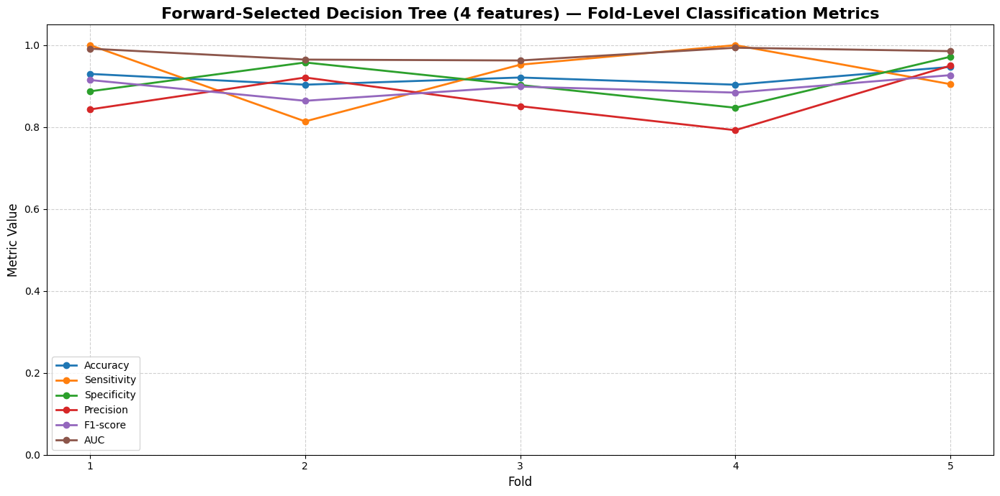

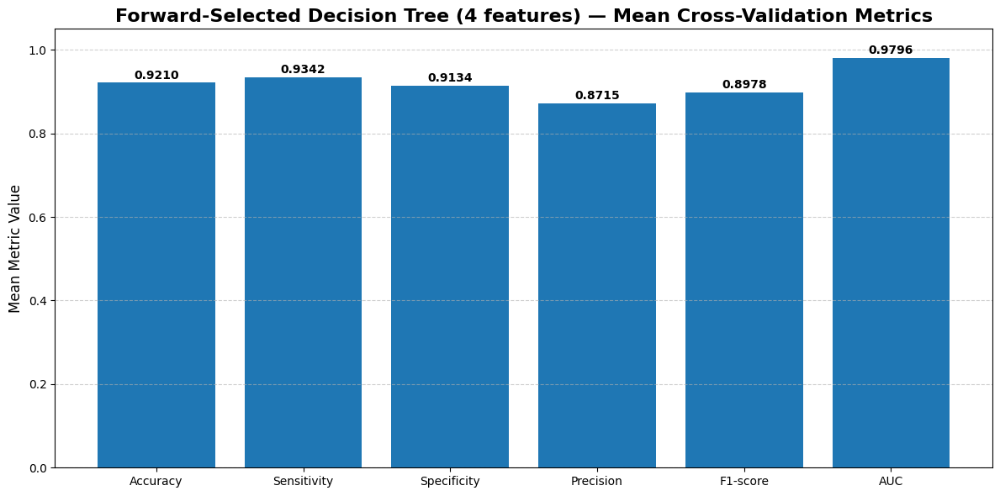

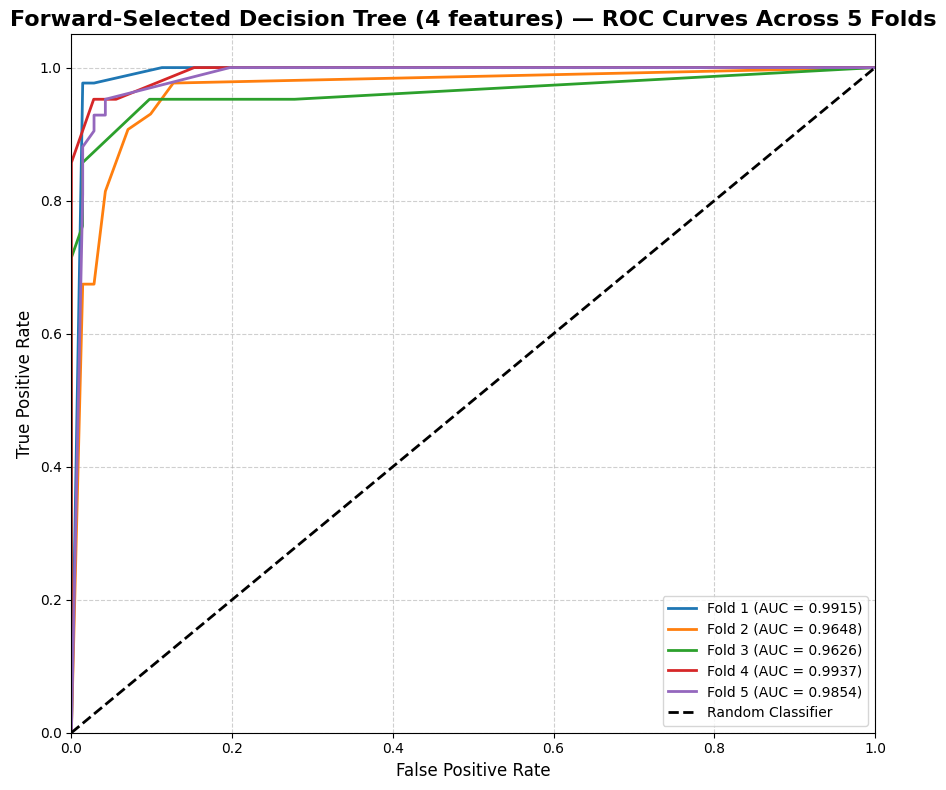

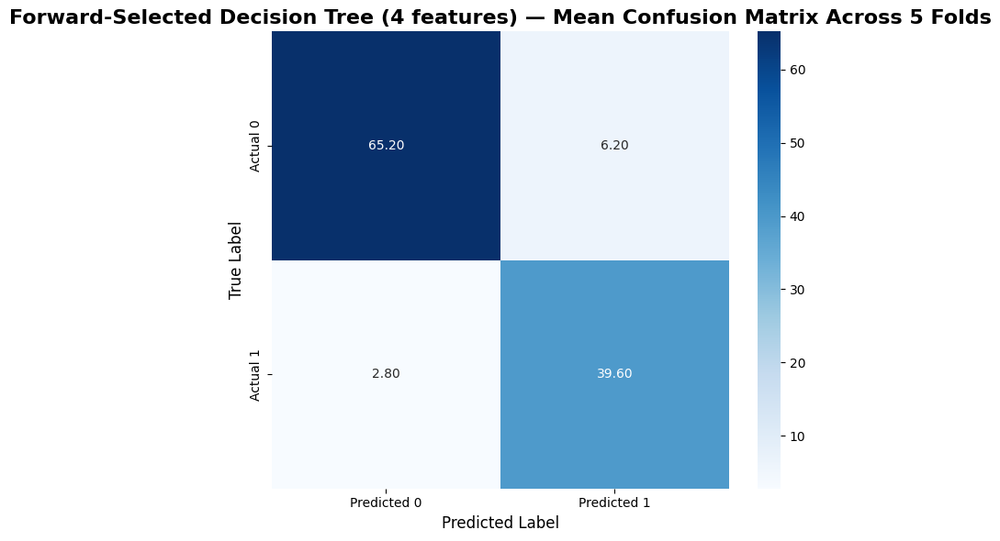

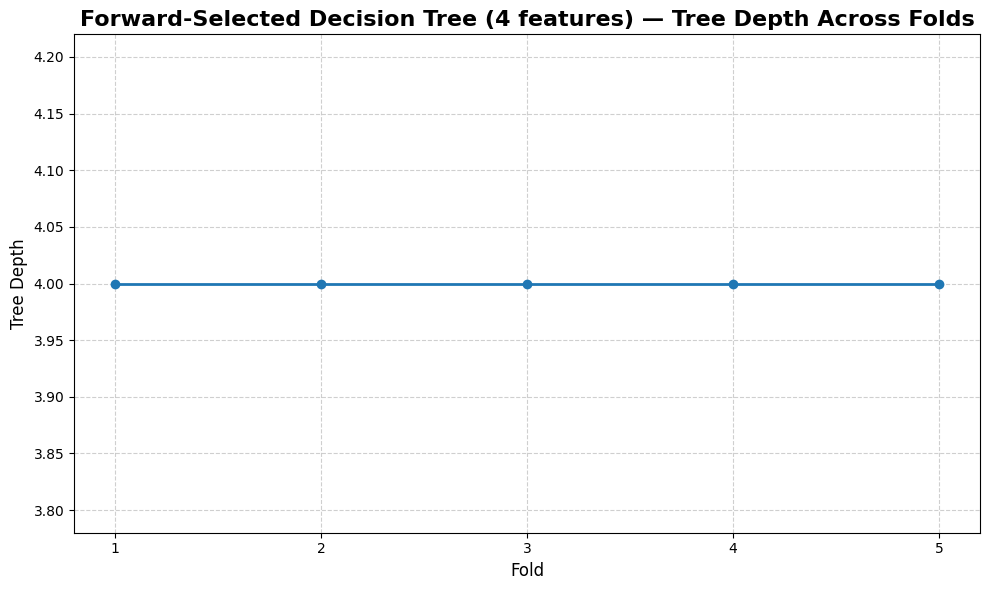

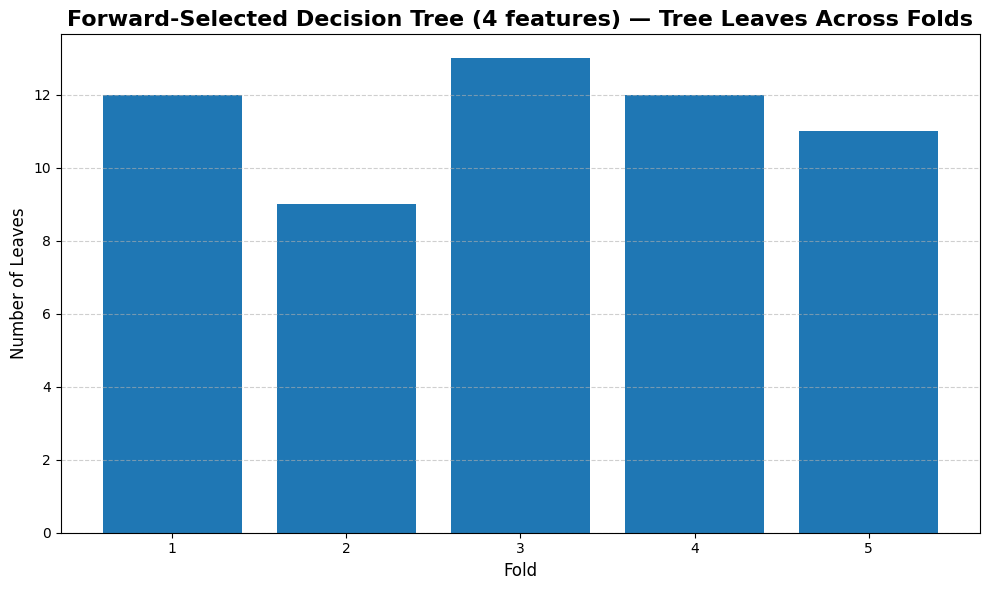

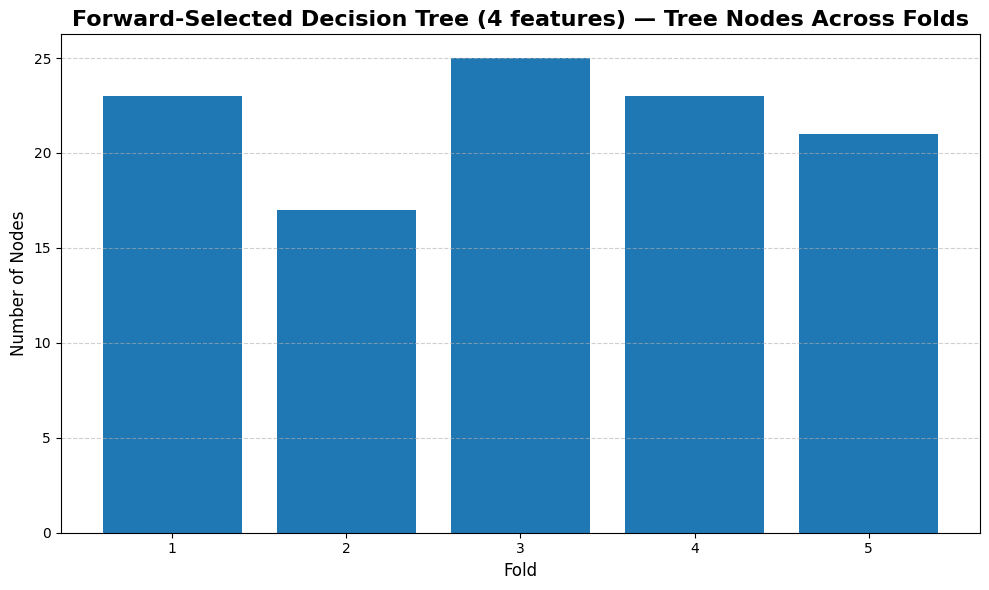

Final visual evaluation report for selected features is ready.

Selected feature subset:


,Number_of_Selected_Features,Selected_Features,Base_Model,Feature_Selection_Method,Selection_Type
0,4,"perimeter_worst, concave points_worst, concave...",Decision Tree,Forward Feature Search,Fully Analytical



Selected features:
['perimeter_worst', 'concave points_worst', 'concave points_se', 'fractal_dimension_se']

Fold-level results:


,Model,Fold,Number_of_Selected_Features,Selected_Features,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,trained_tree_depth,...,Accuracy,Sensitivity,Specificity,Precision,F1-score,AUC,TP,FP,FN,TN
0,Forward-Selected Decision Tree,1,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.929825,1.000000,0.887324,0.843137,0.914894,0.991484,43,8,0,63
1,Forward-Selected Decision Tree,2,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.903509,0.813953,0.957746,0.921053,0.864198,0.964789,35,3,8,68
2,Forward-Selected Decision Tree,3,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.921053,0.952381,0.902778,0.851064,0.898876,0.962632,40,7,2,65
3,Forward-Selected Decision Tree,4,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.903509,1.000000,0.847222,0.792453,0.884211,0.993717,42,11,0,61
4,Forward-Selected Decision Tree,5,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,...,0.946903,0.904762,0.971831,0.950000,0.926829,0.985412,38,2,4,69



Compact metric summary:


,Metric,Mean,Std,Min,Max
0,Accuracy,0.920959,0.018444,0.903509,0.946903
1,Sensitivity,0.934219,0.077967,0.813953,1.000000
2,Specificity,0.913380,0.051364,0.847222,0.971831
3,Precision,0.871541,0.063420,0.792453,0.950000
4,F1-score,0.897801,0.024748,0.864198,0.926829
5,AUC,0.979607,0.014846,0.962632,0.993717



Final selected-feature visual evaluation completed successfully.


In [100]:
# ============================================================
# BOX 98 — Final Visual Evaluation Report for Selected Features
#
# Purpose:
#   - Create final visual and tabular reports for the
#     Forward-Selected Decision Tree model
#   - Visualize fold-level classification metrics
#   - Plot ROC curves across all folds
#   - Plot mean confusion matrix
#   - Visualize reduced-tree complexity behavior
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_forward_dt_fold_results_df",
    "final_forward_dt_summary_results_df",
    "final_forward_dt_confusion_matrices",
    "final_forward_dt_roc_data",
    "final_forward_dt_feature_subset_df",
    "BEST_FORWARD_SELECTED_FEATURES",
    "BEST_FORWARD_SELECTED_FEATURES_LABEL",
    "BEST_DT_CRITERION",
    "BEST_DT_MAX_DEPTH",
    "BEST_DT_MIN_SAMPLES_SPLIT",
    "BEST_DT_MIN_SAMPLES_LEAF",
    "BEST_DT_CLASS_WEIGHT"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(final_forward_dt_fold_results_df, pd.DataFrame):
    raise TypeError(
        "final_forward_dt_fold_results_df must be a pandas DataFrame."
    )

if len(final_forward_dt_confusion_matrices) == 0:
    raise ValueError(
        "final_forward_dt_confusion_matrices is empty."
    )

if len(final_forward_dt_roc_data) == 0:
    raise ValueError(
        "final_forward_dt_roc_data is empty."
    )

# ------------------------------------------------------------
# Step 1 — Define plotting metrics
# ------------------------------------------------------------
plot_metric_columns = [
    "Accuracy",
    "Sensitivity",
    "Specificity",
    "Precision",
    "F1-score",
    "AUC"
]

# ------------------------------------------------------------
# Step 2 — Build readable model label
# ------------------------------------------------------------
final_forward_dt_label = (
    f"Forward-Selected Decision Tree "
    f"({len(BEST_FORWARD_SELECTED_FEATURES)} features)"
)

# ------------------------------------------------------------
# Step 3 — Fold-level metric comparison plot
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

for metric_name in plot_metric_columns:

    plt.plot(
        final_forward_dt_fold_results_df["Fold"],
        final_forward_dt_fold_results_df[metric_name],
        marker="o",
        linewidth=2,
        label=metric_name
    )

plt.title(
    f"{final_forward_dt_label} — Fold-Level Classification Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

plt.xticks(final_forward_dt_fold_results_df["Fold"])
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 4 — Mean metric bar plot
# ------------------------------------------------------------
mean_metric_values = [
    final_forward_dt_fold_results_df[col].mean()
    for col in plot_metric_columns
]

plt.figure(figsize=(12, 6))

bars = plt.bar(
    plot_metric_columns,
    mean_metric_values
)

plt.title(
    f"{final_forward_dt_label} — Mean Cross-Validation Metrics",
    fontsize=16,
    fontweight="bold"
)

plt.ylabel("Mean Metric Value", fontsize=12)
plt.ylim(0, 1.05)

plt.grid(axis="y", linestyle="--", alpha=0.6)

for bar, value in zip(bars, mean_metric_values):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.01,
        f"{value:.4f}",
        ha="center",
        fontsize=10,
        fontweight="bold"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 5 — ROC curves across folds
# ------------------------------------------------------------
plt.figure(figsize=(9, 8))

for fold_roc_item in final_forward_dt_roc_data:

    fold_number = fold_roc_item["fold"]

    roc_data = fold_roc_item["roc_data"]

    plt.plot(
        roc_data["fpr"],
        roc_data["tpr"],
        linewidth=2,
        label=f"Fold {fold_number} (AUC = {roc_data['auc']:.4f})"
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    color="black",
    label="Random Classifier"
)

plt.title(
    f"{final_forward_dt_label} — ROC Curves Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)

plt.xlim(0, 1)
plt.ylim(0, 1.05)

plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 6 — Mean confusion matrix
# ------------------------------------------------------------
final_forward_dt_confusion_matrix_stack = np.array([
    item["matrix"]
    for item in final_forward_dt_confusion_matrices
])

final_forward_dt_mean_confusion_matrix = (
    final_forward_dt_confusion_matrix_stack.mean(axis=0)
)

plt.figure(figsize=(7, 6))

sns.heatmap(
    final_forward_dt_mean_confusion_matrix,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=True,
    xticklabels=[
        "Predicted 0",
        "Predicted 1"
    ],
    yticklabels=[
        "Actual 0",
        "Actual 1"
    ]
)

plt.title(
    f"{final_forward_dt_label} — Mean Confusion Matrix Across 5 Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 7 — Tree depth across folds
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.plot(
    final_forward_dt_fold_results_df["Fold"],
    final_forward_dt_fold_results_df["trained_tree_depth"],
    marker="o",
    linewidth=2
)

plt.title(
    f"{final_forward_dt_label} — Tree Depth Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Tree Depth", fontsize=12)

plt.xticks(final_forward_dt_fold_results_df["Fold"])

plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Tree leaves across folds
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.bar(
    final_forward_dt_fold_results_df["Fold"],
    final_forward_dt_fold_results_df["trained_tree_leaves"]
)

plt.title(
    f"{final_forward_dt_label} — Tree Leaves Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Number of Leaves", fontsize=12)

plt.xticks(final_forward_dt_fold_results_df["Fold"])

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Tree nodes across folds
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.bar(
    final_forward_dt_fold_results_df["Fold"],
    final_forward_dt_fold_results_df["trained_tree_nodes"]
)

plt.title(
    f"{final_forward_dt_label} — Tree Nodes Across Folds",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Fold", fontsize=12)
plt.ylabel("Number of Nodes", fontsize=12)

plt.xticks(final_forward_dt_fold_results_df["Fold"])

plt.grid(axis="y", linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 10 — Compact metric summary table
# ------------------------------------------------------------
final_forward_dt_visual_summary_df = pd.DataFrame({

    "Metric":
        plot_metric_columns,

    "Mean":
        [
            final_forward_dt_fold_results_df[col].mean()
            for col in plot_metric_columns
        ],

    "Std":
        [
            final_forward_dt_fold_results_df[col].std()
            for col in plot_metric_columns
        ],

    "Min":
        [
            final_forward_dt_fold_results_df[col].min()
            for col in plot_metric_columns
        ],

    "Max":
        [
            final_forward_dt_fold_results_df[col].max()
            for col in plot_metric_columns
        ]
})

final_forward_dt_visual_summary_df = (
    final_forward_dt_visual_summary_df.round(6)
)

# ------------------------------------------------------------
# Step 11 — Fold-level report table
# ------------------------------------------------------------
final_forward_dt_fold_report_df = (
    final_forward_dt_fold_results_df.copy()
)

final_forward_dt_fold_report_df[
    plot_metric_columns
] = (
    final_forward_dt_fold_report_df[
        plot_metric_columns
    ].round(6)
)

count_columns = [
    "TP",
    "FP",
    "FN",
    "TN",
    "trained_tree_depth",
    "trained_tree_leaves",
    "trained_tree_nodes"
]

final_forward_dt_fold_report_df[
    count_columns
] = (
    final_forward_dt_fold_report_df[
        count_columns
    ].astype(int)
)

# ------------------------------------------------------------
# Step 12 — Display final reports
# ------------------------------------------------------------
print(
    "Final visual evaluation report for selected features is ready."
)

print("\nSelected feature subset:")
display(
    final_forward_dt_feature_subset_df
)

print("\nSelected features:")
print(
    BEST_FORWARD_SELECTED_FEATURES
)

print("\nFold-level results:")
display(
    final_forward_dt_fold_report_df
)

print("\nCompact metric summary:")
display(
    final_forward_dt_visual_summary_df
)

# ------------------------------------------------------------
# Step 13 — Store plot references
# ------------------------------------------------------------
all_model_metric_plots.append({

    "model":
        "Forward-Selected Decision Tree",

    "plots":
        [
            "fold_level_metrics",
            "mean_metric_barplot",
            "roc_curves",
            "mean_confusion_matrix",
            "tree_depth_across_folds",
            "tree_leaves_across_folds",
            "tree_nodes_across_folds"
        ]
})


print(
    "\nFinal selected-feature visual evaluation "
    "completed successfully."
)

Reduced Decision Tree structure model is ready.

Reduced tree metadata:


,Model,Feature_Selection_Method,Number_of_Selected_Features,Selected_Features,criterion,max_depth,min_samples_split,min_samples_leaf,class_weight,reduced_tree_depth,reduced_tree_leaves,reduced_tree_nodes,number_of_samples
0,Reduced Decision Tree,Forward Feature Search,4,"perimeter_worst, concave points_worst, concave...",entropy,4,10,6,balanced,4,12,23,569



Reduced feature-importance table:


,Rank,Feature,Importance
0,1,perimeter_worst,0.792732
1,2,concave points_worst,0.161964
2,3,concave points_se,0.033758
3,4,fractal_dimension_se,0.011546


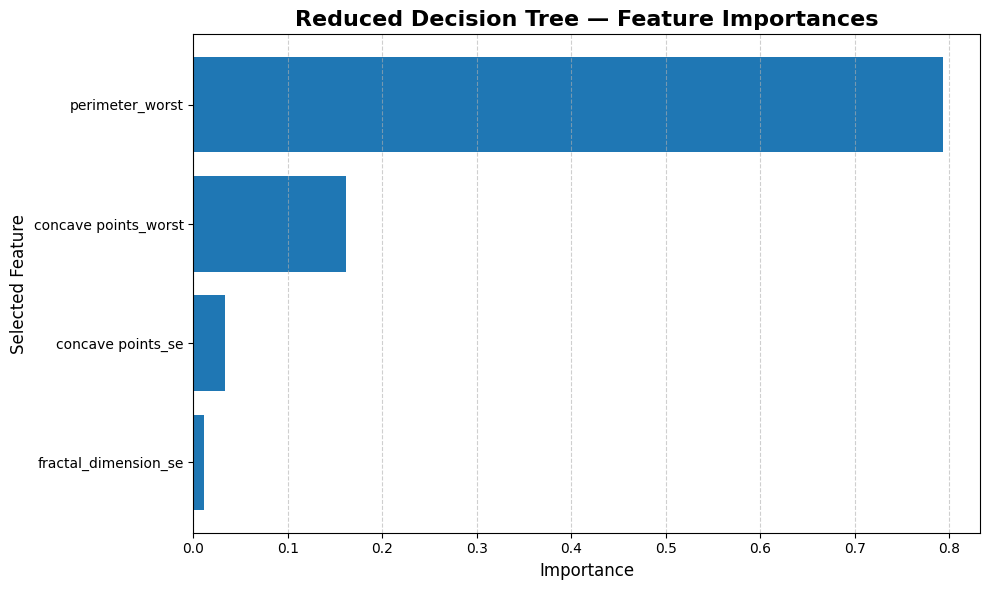

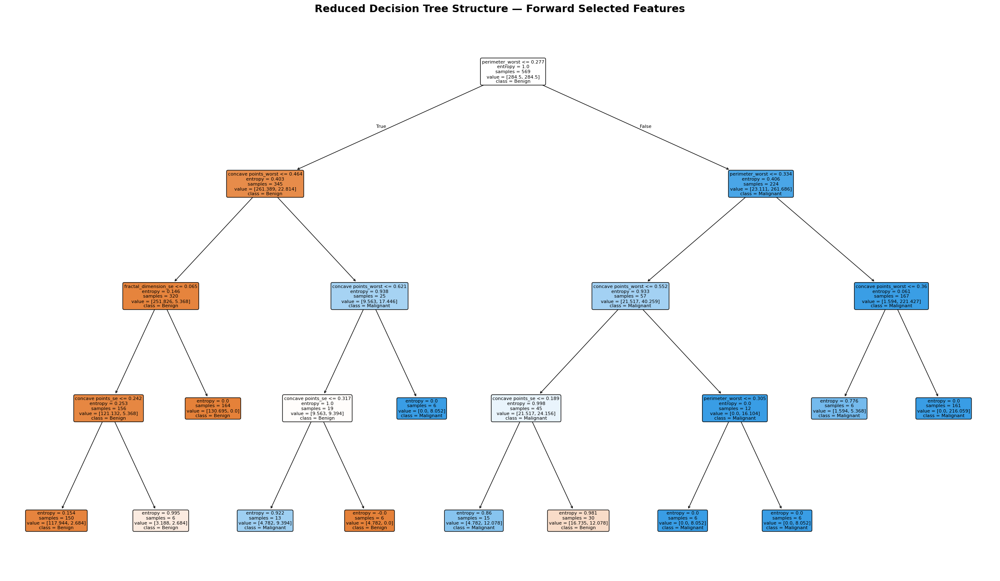

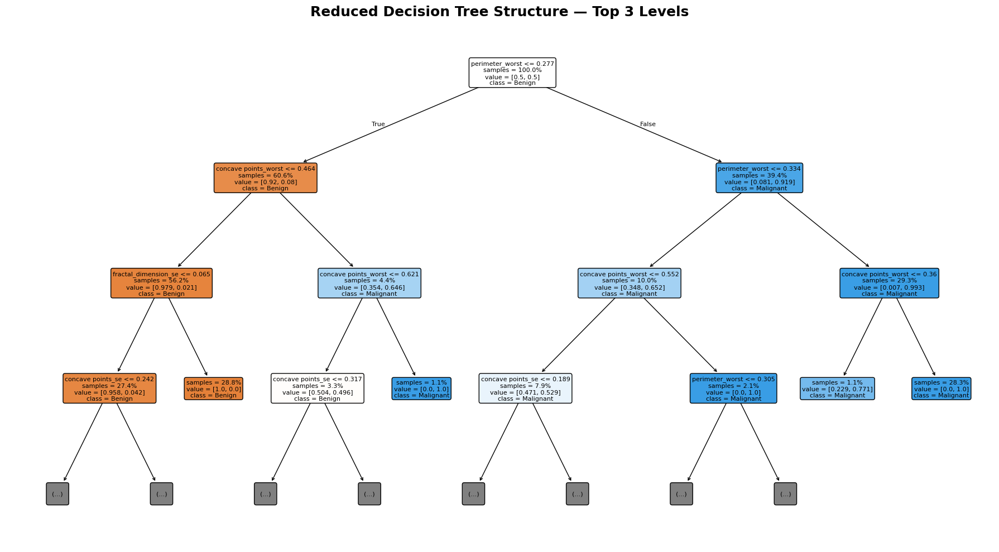


Reduced Decision Tree structure visualization completed successfully.


In [101]:
# ============================================================
# BOX 99 — Reduced Decision Tree Structure Visualization
#
# Purpose:
#   - Train one final reduced Decision Tree model using the
#     analytically selected Forward Search feature subset
#   - Use the full available dataset for final interpretability
#     visualization
#   - Plot the reduced Decision Tree structure
#   - Create reduced feature-importance report
#
# Notes:
#   - This box is for visualization and interpretability
#   - Final performance evaluation was already done in BOX 97
#   - A final Min-Max scaler is fitted on full X only for
#     final structure visualization
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "X",
    "y",
    "BEST_FORWARD_SELECTED_FEATURES",
    "BEST_FORWARD_SELECTED_FEATURES_LABEL",
    "BEST_DT_CRITERION",
    "BEST_DT_MAX_DEPTH",
    "BEST_DT_MIN_SAMPLES_SPLIT",
    "BEST_DT_MIN_SAMPLES_LEAF",
    "BEST_DT_CLASS_WEIGHT",
    "BEST_DT_RANDOM_STATE"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(X, pd.DataFrame):
    raise TypeError(
        "X must be a pandas DataFrame."
    )

if not isinstance(y, pd.Series):
    raise TypeError(
        "y must be a pandas Series."
    )

if not isinstance(BEST_FORWARD_SELECTED_FEATURES, list):
    raise TypeError(
        "BEST_FORWARD_SELECTED_FEATURES must be a list."
    )

if len(BEST_FORWARD_SELECTED_FEATURES) == 0:
    raise ValueError(
        "BEST_FORWARD_SELECTED_FEATURES is empty."
    )

missing_selected_features = [
    feature for feature in BEST_FORWARD_SELECTED_FEATURES
    if feature not in X.columns
]

if len(missing_selected_features) > 0:
    raise ValueError(
        f"Selected features are missing from X: {missing_selected_features}"
    )

# ------------------------------------------------------------
# Step 1 — Create reduced feature matrix
# ------------------------------------------------------------
X_reduced = X[
    BEST_FORWARD_SELECTED_FEATURES
].copy()

# ------------------------------------------------------------
# Step 2 — Fit final scaler for visualization only
# ------------------------------------------------------------
reduced_dt_visual_scaler = MinMaxScaler()

X_reduced_full_scaled_array = (
    reduced_dt_visual_scaler.fit_transform(
        X_reduced
    )
)

X_reduced_full_scaled = pd.DataFrame(
    X_reduced_full_scaled_array,
    columns=BEST_FORWARD_SELECTED_FEATURES,
    index=X_reduced.index
)

# ------------------------------------------------------------
# Step 3 — Train final reduced Decision Tree structure model
# ------------------------------------------------------------
reduced_dt_structure_model = DecisionTreeClassifier(
    criterion=BEST_DT_CRITERION,
    max_depth=BEST_DT_MAX_DEPTH,
    min_samples_split=BEST_DT_MIN_SAMPLES_SPLIT,
    min_samples_leaf=BEST_DT_MIN_SAMPLES_LEAF,
    class_weight=BEST_DT_CLASS_WEIGHT,
    random_state=BEST_DT_RANDOM_STATE
)

reduced_dt_structure_model.fit(
    X_reduced_full_scaled,
    y
)

# ------------------------------------------------------------
# Step 4 — Extract reduced tree metadata
# ------------------------------------------------------------
reduced_tree_depth = (
    reduced_dt_structure_model.get_depth()
)

reduced_tree_leaves = (
    reduced_dt_structure_model.get_n_leaves()
)

reduced_tree_nodes = (
    reduced_dt_structure_model.tree_.node_count
)

reduced_dt_structure_metadata = {

    "Model":
        "Reduced Decision Tree",

    "Feature_Selection_Method":
        "Forward Feature Search",

    "Number_of_Selected_Features":
        len(BEST_FORWARD_SELECTED_FEATURES),

    "Selected_Features":
        BEST_FORWARD_SELECTED_FEATURES_LABEL,

    "criterion":
        BEST_DT_CRITERION,

    "max_depth":
        str(BEST_DT_MAX_DEPTH),

    "min_samples_split":
        BEST_DT_MIN_SAMPLES_SPLIT,

    "min_samples_leaf":
        BEST_DT_MIN_SAMPLES_LEAF,

    "class_weight":
        str(BEST_DT_CLASS_WEIGHT),

    "reduced_tree_depth":
        reduced_tree_depth,

    "reduced_tree_leaves":
        reduced_tree_leaves,

    "reduced_tree_nodes":
        reduced_tree_nodes,

    "number_of_samples":
        X_reduced_full_scaled.shape[0]
}

reduced_dt_structure_metadata_df = pd.DataFrame(
    [reduced_dt_structure_metadata]
)

# ------------------------------------------------------------
# Step 5 — Build reduced feature-importance table
# ------------------------------------------------------------
reduced_dt_feature_importance_df = pd.DataFrame({

    "Feature":
        X_reduced_full_scaled.columns,

    "Importance":
        reduced_dt_structure_model.feature_importances_
})

reduced_dt_feature_importance_df = (
    reduced_dt_feature_importance_df
    .sort_values(
        by="Importance",
        ascending=False
    )
    .reset_index(drop=True)
)

reduced_dt_feature_importance_df["Rank"] = (
    np.arange(
        1,
        len(reduced_dt_feature_importance_df) + 1
    )
)

reduced_dt_feature_importance_df = (
    reduced_dt_feature_importance_df[
        [
            "Rank",
            "Feature",
            "Importance"
        ]
    ]
)

# ------------------------------------------------------------
# Step 6 — Display reduced tree metadata
# ------------------------------------------------------------
print(
    "Reduced Decision Tree structure model is ready."
)

print("\nReduced tree metadata:")
display(
    reduced_dt_structure_metadata_df
)

print("\nReduced feature-importance table:")
display(
    reduced_dt_feature_importance_df.round(6)
)

# ------------------------------------------------------------
# Step 7 — Plot reduced feature importance
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

plt.barh(
    reduced_dt_feature_importance_df["Feature"],
    reduced_dt_feature_importance_df["Importance"]
)

plt.title(
    "Reduced Decision Tree — Feature Importances",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Importance",
    fontsize=12
)

plt.ylabel(
    "Selected Feature",
    fontsize=12
)

plt.gca().invert_yaxis()

plt.grid(
    axis="x",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot full reduced Decision Tree structure
# ------------------------------------------------------------
plt.figure(figsize=(24, 14))

plot_tree(
    reduced_dt_structure_model,
    feature_names=X_reduced_full_scaled.columns,
    class_names=[
        "Benign",
        "Malignant"
    ],
    filled=True,
    rounded=True,
    impurity=True,
    proportion=False,
    precision=3,
    fontsize=8
)

plt.title(
    "Reduced Decision Tree Structure — Forward Selected Features",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot compact reduced tree structure
# ------------------------------------------------------------
plt.figure(figsize=(18, 10))

plot_tree(
    reduced_dt_structure_model,
    feature_names=X_reduced_full_scaled.columns,
    class_names=[
        "Benign",
        "Malignant"
    ],
    filled=True,
    rounded=True,
    impurity=False,
    proportion=True,
    precision=3,
    fontsize=8,
    max_depth=3
)

plt.title(
    "Reduced Decision Tree Structure — Top 3 Levels",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()


print(
    "\nReduced Decision Tree structure visualization "
    "completed successfully."
)

Reduced Decision Tree rule extraction completed.

Reduced rule summary:


,Model,Feature_Selection_Method,Number_of_Selected_Features,Selected_Features,Total_Extracted_Rules,Average_Rule_Length,Maximum_Rule_Length,Minimum_Rule_Length,Average_Leaf_Impurity,Maximum_Leaf_Impurity,Minimum_Leaf_Impurity,Average_Samples_per_Leaf,Maximum_Samples_per_Leaf,Minimum_Samples_per_Leaf
0,Reduced Decision Tree,Forward Feature Search,4,"perimeter_worst, concave points_worst, concave...",12,3.666667,4,3,0.390696,0.994685,-0.0,0.916667,1,0



Reduced rule complexity analysis:


,Rule_Length,Number_of_Rules,Average_Leaf_Impurity,Average_Samples,Maximum_Class_1_Ratio,Average_Class_1_Ratio,Malignant_Rules,Benign_Rules
0,3,4,0.194040,1.000,1.0,0.500000,3,1
1,4,8,0.489024,0.875,1.0,0.285714,4,4



Top extracted reduced rules:


,Leaf_Node_ID,Rule,Rule_Length,Predicted_Class,Predicted_Label,Samples_in_Leaf,Class_0_Count,Class_1_Count,Class_0_Ratio,Class_1_Ratio,Leaf_Impurity,Tree_Depth
0,11,perimeter_worst <= 0.276607 AND concave points...,3,1,Malignant,1,0,1,0.0,1.0,0.000000,3
1,22,perimeter_worst > 0.276607 AND perimeter_worst...,3,1,Malignant,1,0,1,0.0,1.0,0.000000,3
2,18,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,Malignant,1,0,1,0.0,1.0,0.000000,4
3,19,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,Malignant,1,0,1,0.0,1.0,0.000000,4
4,10,perimeter_worst <= 0.276607 AND concave points...,4,0,Benign,1,1,0,1.0,0.0,-0.000000,4
5,6,perimeter_worst <= 0.276607 AND concave points...,3,0,Benign,1,1,0,1.0,0.0,0.000000,3
6,4,perimeter_worst <= 0.276607 AND concave points...,4,0,Benign,1,0,0,0.0,0.0,0.153893,4
7,21,perimeter_worst > 0.276607 AND perimeter_worst...,3,1,Malignant,1,0,0,0.0,0.0,0.776162,3
8,9,perimeter_worst <= 0.276607 AND concave points...,4,1,Malignant,1,0,0,0.0,0.0,0.922222,4
9,16,perimeter_worst > 0.276607 AND perimeter_worst...,4,0,Benign,1,0,0,0.0,0.0,0.981069,4



High-purity reduced rules:


,Leaf_Node_ID,Rule,Rule_Length,Predicted_Class,Predicted_Label,Samples_in_Leaf,Class_0_Count,Class_1_Count,Class_0_Ratio,Class_1_Ratio,Leaf_Impurity,Tree_Depth
0,10,perimeter_worst <= 0.276607 AND concave points...,4,0,Benign,1,1,0,1.0,0.0,-0.0,4
1,11,perimeter_worst <= 0.276607 AND concave points...,3,1,Malignant,1,0,1,0.0,1.0,0.0,3
2,22,perimeter_worst > 0.276607 AND perimeter_worst...,3,1,Malignant,1,0,1,0.0,1.0,0.0,3
3,6,perimeter_worst <= 0.276607 AND concave points...,3,0,Benign,1,1,0,1.0,0.0,0.0,3
4,18,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,Malignant,1,0,1,0.0,1.0,0.0,4
5,19,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,Malignant,1,0,1,0.0,1.0,0.0,4



Malignant-oriented reduced rules:


,Leaf_Node_ID,Rule,Rule_Length,Predicted_Class,Predicted_Label,Samples_in_Leaf,Class_0_Count,Class_1_Count,Class_0_Ratio,Class_1_Ratio,Leaf_Impurity,Tree_Depth
0,11,perimeter_worst <= 0.276607 AND concave points...,3,1,Malignant,1,0,1,0.0,1.0,0.000000,3
1,22,perimeter_worst > 0.276607 AND perimeter_worst...,3,1,Malignant,1,0,1,0.0,1.0,0.000000,3
2,18,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,Malignant,1,0,1,0.0,1.0,0.000000,4
3,19,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,Malignant,1,0,1,0.0,1.0,0.000000,4
4,21,perimeter_worst > 0.276607 AND perimeter_worst...,3,1,Malignant,1,0,0,0.0,0.0,0.776162,3
5,9,perimeter_worst <= 0.276607 AND concave points...,4,1,Malignant,1,0,0,0.0,0.0,0.922222,4
6,15,perimeter_worst > 0.276607 AND perimeter_worst...,4,1,Malignant,0,0,0,NaN,NaN,0.860326,4



Terminal-node analysis:


,Leaf_Node_ID,Rule_Length,Predicted_Class,Predicted_Label,Samples_in_Leaf,Class_0_Count,Class_1_Count,Class_0_Ratio,Class_1_Ratio,Leaf_Impurity,Tree_Depth
0,11,3,1,Malignant,1,0,1,0.0,1.0,0.000000,3
1,22,3,1,Malignant,1,0,1,0.0,1.0,0.000000,3
2,18,4,1,Malignant,1,0,1,0.0,1.0,0.000000,4
3,19,4,1,Malignant,1,0,1,0.0,1.0,0.000000,4
4,10,4,0,Benign,1,1,0,1.0,0.0,-0.000000,4
5,6,3,0,Benign,1,1,0,1.0,0.0,0.000000,3
6,4,4,0,Benign,1,0,0,0.0,0.0,0.153893,4
7,21,3,1,Malignant,1,0,0,0.0,0.0,0.776162,3
8,9,4,1,Malignant,1,0,0,0.0,0.0,0.922222,4
9,16,4,0,Benign,1,0,0,0.0,0.0,0.981069,4


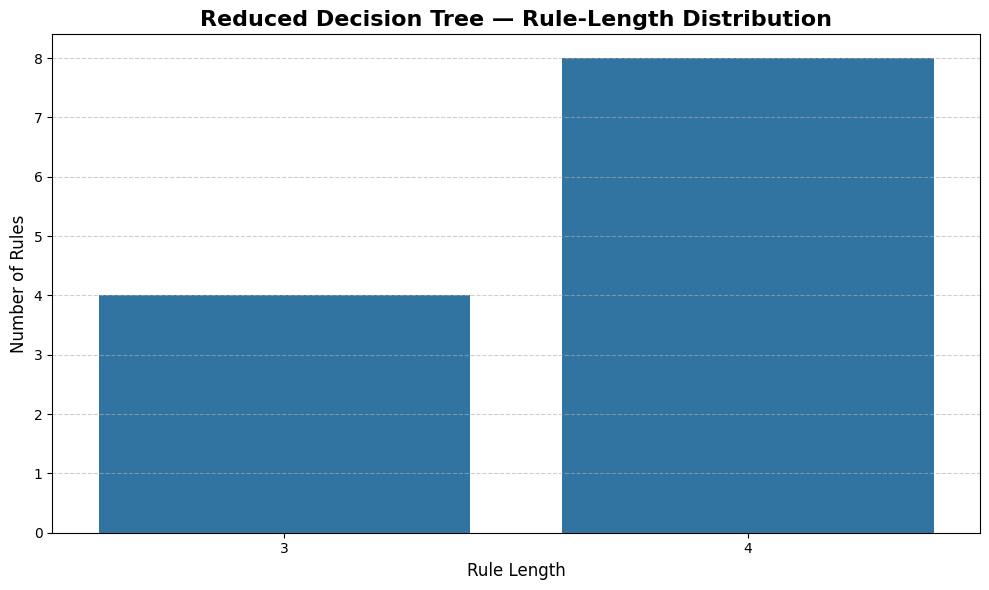

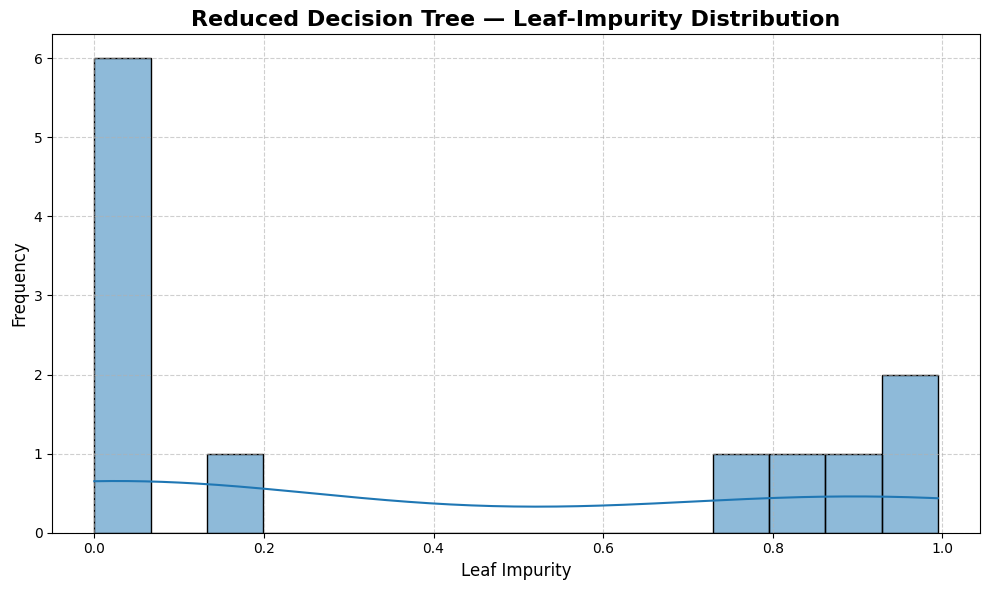

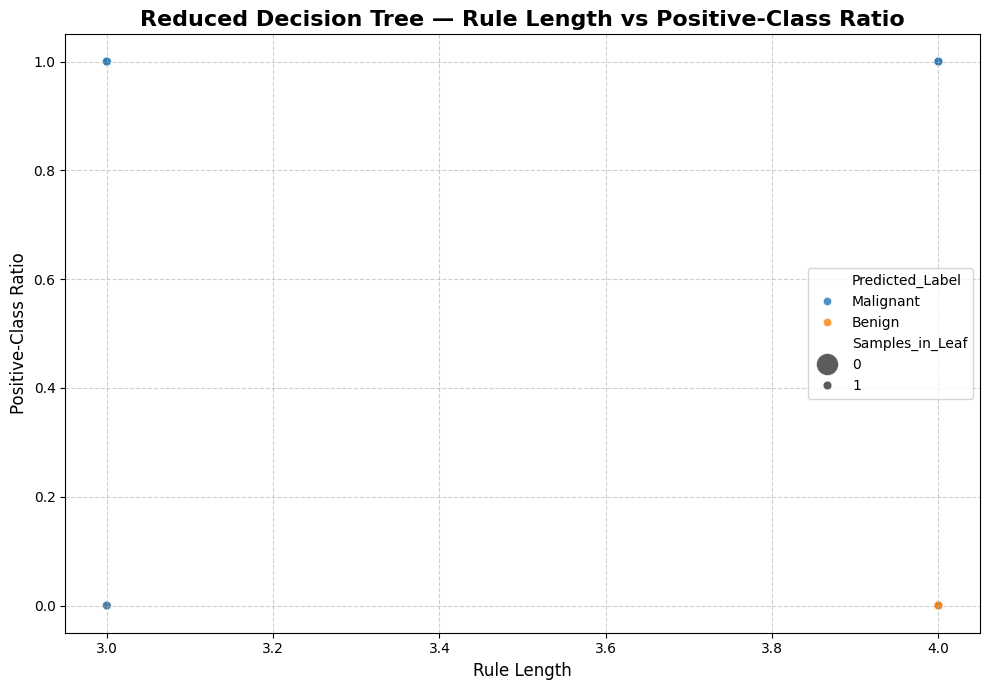

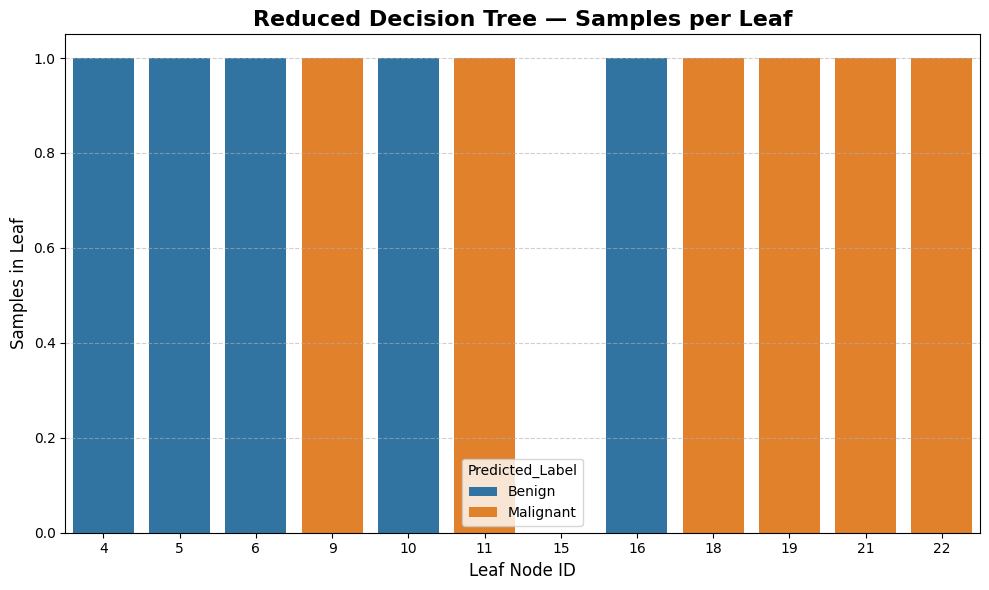


Reduced Decision Tree rule extraction and simplification analysis completed successfully.


In [102]:
# ============================================================
# BOX 100 — Reduced Decision Tree Rule Extraction and Simplification Analysis
#
# Purpose:
#   - Extract rules from the reduced Decision Tree model
#   - Analyze rule simplicity and interpretability
#   - Compare rule length, purity, coverage, and class ratios
#   - Prepare report-ready rule tables and plots
#
# Notes:
#   - Uses the reduced Decision Tree structure model from BOX 99
#   - No model retraining is performed in this box
#
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "reduced_dt_structure_model",
    "X_reduced_full_scaled",
    "BEST_FORWARD_SELECTED_FEATURES"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

if not isinstance(X_reduced_full_scaled, pd.DataFrame):
    raise TypeError(
        "X_reduced_full_scaled must be a pandas DataFrame."
    )

if not isinstance(BEST_FORWARD_SELECTED_FEATURES, list):
    raise TypeError(
        "BEST_FORWARD_SELECTED_FEATURES must be a list."
    )

# ------------------------------------------------------------
# Step 1 — Initialize tree references
# ------------------------------------------------------------
reduced_tree_structure = (
    reduced_dt_structure_model.tree_
)

reduced_feature_names = (
    X_reduced_full_scaled.columns.tolist()
)

# ------------------------------------------------------------
# Step 2 — Initialize rule storage
# ------------------------------------------------------------
reduced_dt_extracted_rules = []

# ------------------------------------------------------------
# Step 3 — Recursive rule extraction function
# ------------------------------------------------------------
def extract_reduced_tree_rules(
    node_id,
    current_rule_conditions,
    current_depth
):
    """
    Recursively extract rules from the reduced Decision Tree.
    """

    is_leaf = (
        reduced_tree_structure.feature[node_id]
        == _tree.TREE_UNDEFINED
    )

    if is_leaf:

        node_values = (
            reduced_tree_structure.value[node_id][0]
        )

        predicted_class = int(
            np.argmax(node_values)
        )

        class_0_count = int(
            node_values[0]
        )

        class_1_count = int(
            node_values[1]
        )

        total_samples = int(
            np.sum(node_values)
        )

        if total_samples > 0:

            class_0_ratio = (
                class_0_count
                / total_samples
            )

            class_1_ratio = (
                class_1_count
                / total_samples
            )

        else:

            class_0_ratio = np.nan
            class_1_ratio = np.nan

        leaf_impurity = (
            reduced_tree_structure.impurity[node_id]
        )

        extracted_rule = {

            "Leaf_Node_ID":
                node_id,

            "Rule":
                " AND ".join(
                    current_rule_conditions
                ),

            "Rule_Length":
                len(current_rule_conditions),

            "Predicted_Class":
                predicted_class,

            "Predicted_Label":
                (
                    "Benign"
                    if predicted_class == 0
                    else "Malignant"
                ),

            "Samples_in_Leaf":
                total_samples,

            "Class_0_Count":
                class_0_count,

            "Class_1_Count":
                class_1_count,

            "Class_0_Ratio":
                class_0_ratio,

            "Class_1_Ratio":
                class_1_ratio,

            "Leaf_Impurity":
                leaf_impurity,

            "Tree_Depth":
                current_depth
        }

        reduced_dt_extracted_rules.append(
            extracted_rule
        )

        return

    split_feature_index = (
        reduced_tree_structure.feature[node_id]
    )

    split_threshold = (
        reduced_tree_structure.threshold[node_id]
    )

    split_feature_name = (
        reduced_feature_names[split_feature_index]
    )

    left_child = (
        reduced_tree_structure.children_left[node_id]
    )

    right_child = (
        reduced_tree_structure.children_right[node_id]
    )

    left_condition = (
        f"{split_feature_name} <= "
        f"{split_threshold:.6f}"
    )

    extract_reduced_tree_rules(
        node_id=left_child,
        current_rule_conditions=(
            current_rule_conditions
            + [left_condition]
        ),
        current_depth=current_depth + 1
    )

    right_condition = (
        f"{split_feature_name} > "
        f"{split_threshold:.6f}"
    )

    extract_reduced_tree_rules(
        node_id=right_child,
        current_rule_conditions=(
            current_rule_conditions
            + [right_condition]
        ),
        current_depth=current_depth + 1
    )

# ------------------------------------------------------------
# Step 4 — Run rule extraction
# ------------------------------------------------------------
extract_reduced_tree_rules(
    node_id=0,
    current_rule_conditions=[],
    current_depth=0
)

# ------------------------------------------------------------
# Step 5 — Convert rules to DataFrame
# ------------------------------------------------------------
reduced_dt_extracted_rules_df = pd.DataFrame(
    reduced_dt_extracted_rules
)

# ------------------------------------------------------------
# Step 6 — Sort extracted rules analytically
# ------------------------------------------------------------
reduced_dt_extracted_rules_df = (
    reduced_dt_extracted_rules_df
    .sort_values(
        by=[
            "Samples_in_Leaf",
            "Class_1_Ratio",
            "Leaf_Impurity",
            "Rule_Length"
        ],
        ascending=[
            False,
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 7 — Build rule summary
# ------------------------------------------------------------
reduced_dt_rule_summary = {

    "Model":
        "Reduced Decision Tree",

    "Feature_Selection_Method":
        "Forward Feature Search",

    "Number_of_Selected_Features":
        len(BEST_FORWARD_SELECTED_FEATURES),

    "Selected_Features":
        ", ".join(BEST_FORWARD_SELECTED_FEATURES),

    "Total_Extracted_Rules":
        len(reduced_dt_extracted_rules_df),

    "Average_Rule_Length":
        reduced_dt_extracted_rules_df["Rule_Length"].mean(),

    "Maximum_Rule_Length":
        reduced_dt_extracted_rules_df["Rule_Length"].max(),

    "Minimum_Rule_Length":
        reduced_dt_extracted_rules_df["Rule_Length"].min(),

    "Average_Leaf_Impurity":
        reduced_dt_extracted_rules_df["Leaf_Impurity"].mean(),

    "Maximum_Leaf_Impurity":
        reduced_dt_extracted_rules_df["Leaf_Impurity"].max(),

    "Minimum_Leaf_Impurity":
        reduced_dt_extracted_rules_df["Leaf_Impurity"].min(),

    "Average_Samples_per_Leaf":
        reduced_dt_extracted_rules_df["Samples_in_Leaf"].mean(),

    "Maximum_Samples_per_Leaf":
        reduced_dt_extracted_rules_df["Samples_in_Leaf"].max(),

    "Minimum_Samples_per_Leaf":
        reduced_dt_extracted_rules_df["Samples_in_Leaf"].min()
}

reduced_dt_rule_summary_df = pd.DataFrame(
    [reduced_dt_rule_summary]
)

# ------------------------------------------------------------
# Step 8 — Build rule complexity analysis
# ------------------------------------------------------------
reduced_dt_rule_complexity_df = (
    reduced_dt_extracted_rules_df
    .groupby("Rule_Length")
    .agg(
        Number_of_Rules=(
            "Leaf_Node_ID",
            "count"
        ),
        Average_Leaf_Impurity=(
            "Leaf_Impurity",
            "mean"
        ),
        Average_Samples=(
            "Samples_in_Leaf",
            "mean"
        ),
        Maximum_Class_1_Ratio=(
            "Class_1_Ratio",
            "max"
        ),
        Average_Class_1_Ratio=(
            "Class_1_Ratio",
            "mean"
        ),
        Malignant_Rules=(
            "Predicted_Class",
            lambda x: int((x == 1).sum())
        ),
        Benign_Rules=(
            "Predicted_Class",
            lambda x: int((x == 0).sum())
        )
    )
    .reset_index()
    .sort_values(
        by="Rule_Length",
        ascending=True
    )
)

# ------------------------------------------------------------
# Step 9 — Build terminal-node analysis
# ------------------------------------------------------------
reduced_dt_terminal_node_analysis_df = (
    reduced_dt_extracted_rules_df[
        [
            "Leaf_Node_ID",
            "Rule_Length",
            "Predicted_Class",
            "Predicted_Label",
            "Samples_in_Leaf",
            "Class_0_Count",
            "Class_1_Count",
            "Class_0_Ratio",
            "Class_1_Ratio",
            "Leaf_Impurity",
            "Tree_Depth"
        ]
    ]
    .copy()
)

# ------------------------------------------------------------
# Step 10 — Extract high-purity rules
# ------------------------------------------------------------
reduced_dt_high_purity_rules_df = (
    reduced_dt_extracted_rules_df[
        (
            reduced_dt_extracted_rules_df["Class_0_Ratio"] >= 0.90
        )
        |
        (
            reduced_dt_extracted_rules_df["Class_1_Ratio"] >= 0.90
        )
    ]
    .copy()
    .sort_values(
        by=[
            "Samples_in_Leaf",
            "Leaf_Impurity",
            "Rule_Length"
        ],
        ascending=[
            False,
            True,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 11 — Extract malignant-oriented rules
# ------------------------------------------------------------
reduced_dt_malignant_rules_df = (
    reduced_dt_extracted_rules_df[
        reduced_dt_extracted_rules_df["Predicted_Class"] == 1
    ]
    .copy()
    .sort_values(
        by=[
            "Class_1_Ratio",
            "Samples_in_Leaf",
            "Leaf_Impurity"
        ],
        ascending=[
            False,
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# Step 12 — Create display versions
# ------------------------------------------------------------
reduced_dt_rules_display_df = (
    reduced_dt_extracted_rules_df.copy()
)

numeric_rule_columns = [
    "Class_0_Ratio",
    "Class_1_Ratio",
    "Leaf_Impurity"
]

reduced_dt_rules_display_df[
    numeric_rule_columns
] = (
    reduced_dt_rules_display_df[
        numeric_rule_columns
    ].round(6)
)

reduced_dt_rule_summary_display_df = (
    reduced_dt_rule_summary_df.copy()
    .round(6)
)

reduced_dt_rule_complexity_display_df = (
    reduced_dt_rule_complexity_df.copy()
    .round(6)
)

reduced_dt_terminal_node_display_df = (
    reduced_dt_terminal_node_analysis_df.copy()
    .round(6)
)

reduced_dt_high_purity_rules_display_df = (
    reduced_dt_high_purity_rules_df.copy()
)

reduced_dt_high_purity_rules_display_df[
    numeric_rule_columns
] = (
    reduced_dt_high_purity_rules_display_df[
        numeric_rule_columns
    ].round(6)
)

reduced_dt_malignant_rules_display_df = (
    reduced_dt_malignant_rules_df.copy()
)

reduced_dt_malignant_rules_display_df[
    numeric_rule_columns
] = (
    reduced_dt_malignant_rules_display_df[
        numeric_rule_columns
    ].round(6)
)

# ------------------------------------------------------------
# Step 13 — Display rule analysis reports
# ------------------------------------------------------------
print(
    "Reduced Decision Tree rule extraction completed."
)

print("\nReduced rule summary:")
display(
    reduced_dt_rule_summary_display_df
)

print("\nReduced rule complexity analysis:")
display(
    reduced_dt_rule_complexity_display_df
)

print("\nTop extracted reduced rules:")
display(
    reduced_dt_rules_display_df.head(15)
)

print("\nHigh-purity reduced rules:")
display(
    reduced_dt_high_purity_rules_display_df.head(15)
)

print("\nMalignant-oriented reduced rules:")
display(
    reduced_dt_malignant_rules_display_df.head(15)
)

print("\nTerminal-node analysis:")
display(
    reduced_dt_terminal_node_display_df.head(15)
)

# ------------------------------------------------------------
# Step 14 — Plot rule-length distribution
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.countplot(
    data=reduced_dt_extracted_rules_df,
    x="Rule_Length"
)

plt.title(
    "Reduced Decision Tree — Rule-Length Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Rule Length", fontsize=12)
plt.ylabel("Number of Rules", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 15 — Plot leaf impurity distribution
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.histplot(
    reduced_dt_extracted_rules_df["Leaf_Impurity"],
    bins=15,
    kde=True
)

plt.title(
    "Reduced Decision Tree — Leaf-Impurity Distribution",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Leaf Impurity", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

plt.grid(
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 16 — Plot rule length vs positive-class ratio
# ------------------------------------------------------------
plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=reduced_dt_extracted_rules_df,
    x="Rule_Length",
    y="Class_1_Ratio",
    size="Samples_in_Leaf",
    hue="Predicted_Label",
    sizes=(40, 250),
    alpha=0.8
)

plt.title(
    "Reduced Decision Tree — Rule Length vs Positive-Class Ratio",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Rule Length", fontsize=12)
plt.ylabel("Positive-Class Ratio", fontsize=12)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 17 — Plot samples per leaf
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

sns.barplot(
    data=reduced_dt_terminal_node_analysis_df,
    x="Leaf_Node_ID",
    y="Samples_in_Leaf",
    hue="Predicted_Label"
)

plt.title(
    "Reduced Decision Tree — Samples per Leaf",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Leaf Node ID", fontsize=12)
plt.ylabel("Samples in Leaf", fontsize=12)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()


print(
    "\nReduced Decision Tree rule extraction and "
    "simplification analysis completed successfully."
)

Final comparative analysis is ready.

Full Feature Tree vs Selected Feature Tree:


,Model,Number_of_Features,Feature_Set,Mean_Accuracy,Std_Accuracy,Mean_Sensitivity,Std_Sensitivity,Mean_Specificity,Mean_F1-score,Mean_AUC,Std_AUC,Mean_Tree_Depth,Mean_Tree_Leaves,Mean_Tree_Nodes,Extracted_Rules,Average_Rule_Length
0,Full Feature Decision Tree,30,All Features,0.934995,0.021953,0.915172,0.060975,0.94687,0.913496,0.964302,0.011110,4.0,10.4,19.8,12,3.666667
1,Forward-Selected Decision Tree,4,"perimeter_worst, concave points_worst, concave...",0.920959,0.018444,0.934219,0.077967,0.91338,0.897801,0.979607,0.014846,4.0,11.4,21.8,12,3.666667



Difference summary:


,Selected_Feature_Reduction,Feature_Reduction_Percentage,AUC_Difference_Selected_Minus_Full,Sensitivity_Difference_Selected_Minus_Full,F1_Difference_Selected_Minus_Full,Tree_Depth_Reduction,Leaf_Reduction,Node_Reduction,Rule_Reduction,Rule_Length_Reduction
0,26,0.866667,0.015305,0.019048,-0.015695,0.0,-1.0,-2.0,0,0.0



Final analytical interpretation:


,Comparison_Method,Performance_Criterion,Stability_Criterion,Simplicity_Criterion,Selected_Model_Recommendation
0,Full Feature Decision Tree vs Forward-Selected...,Mean_AUC and Mean_Sensitivity,Std_AUC,"Number of features, tree depth, leaves, nodes,...",Full-feature Decision Tree remains preferable ...


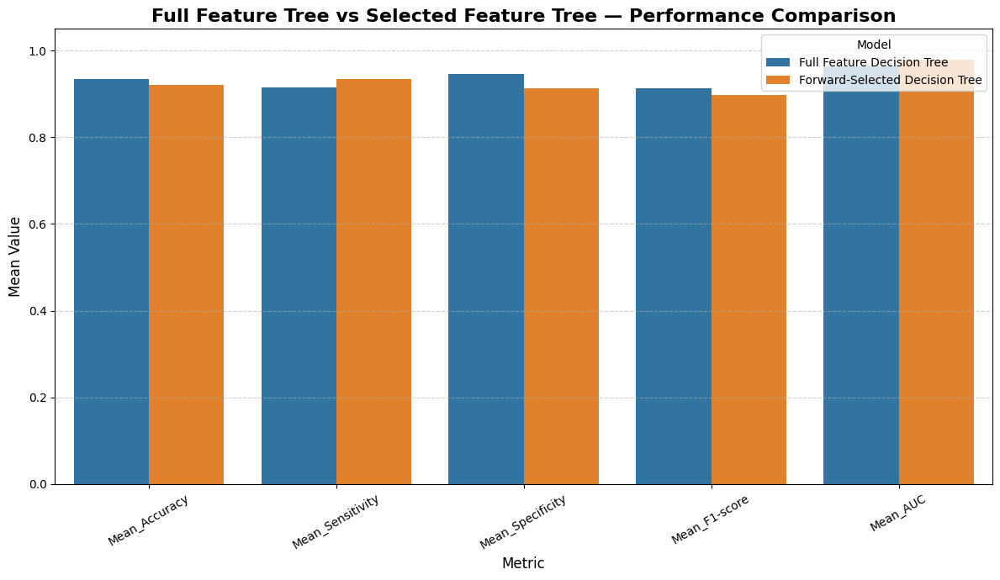

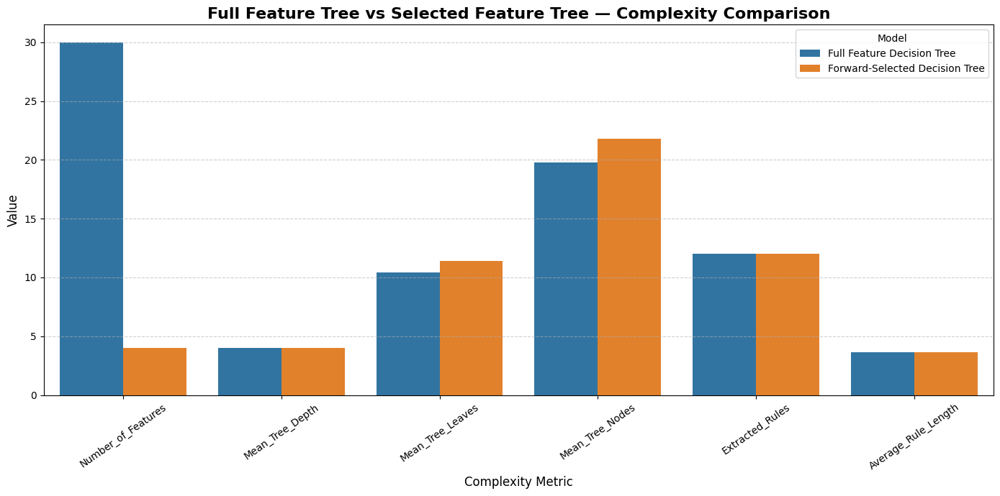

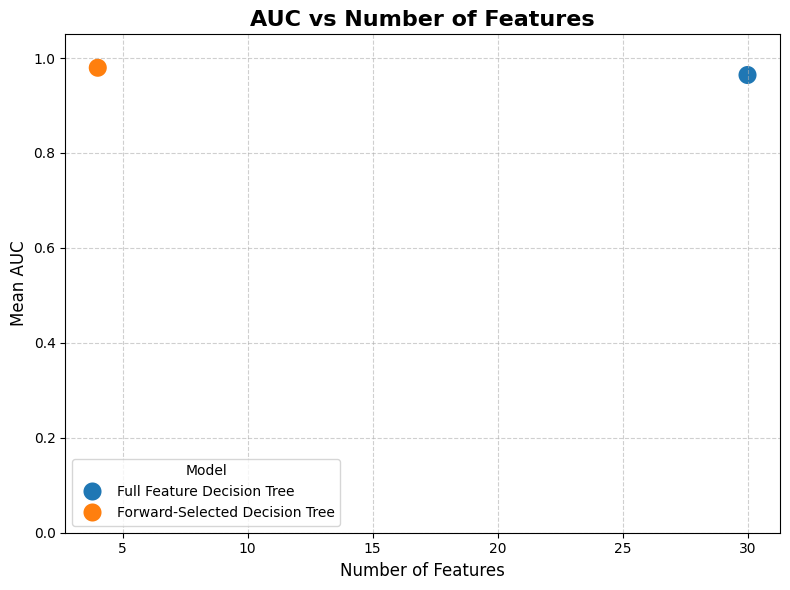


Comparative analysis between full-feature and selected-feature Decision Trees completed successfully.


In [103]:
# ============================================================
# BOX 101 — Comparative Analysis: Full Feature Tree vs Selected Feature Tree
#
# Purpose:
#   - Compare the full-feature Decision Tree with the
#     Forward-Selected Decision Tree
#   - Analyze performance, stability, complexity, and interpretability
#   - Create final report-ready comparison tables and plots
#
# Compared Models:
#   1) Full Feature Decision Tree
#   2) Forward-Selected Decision Tree
# ============================================================

# ------------------------------------------------------------
# Step 0 — Preconditions check
# ------------------------------------------------------------
required_objects = [
    "final_dt_fold_results_df",
    "final_forward_dt_fold_results_df",
    "final_dt_summary_results_df",
    "final_forward_dt_summary_results_df",
    "final_dt_structure_metadata_df",
    "reduced_dt_structure_metadata_df",
    "dt_rule_summary_df",
    "reduced_dt_rule_summary_df",
    "BEST_FORWARD_SELECTED_FEATURES",
    "BEST_FORWARD_SELECTED_FEATURES_LABEL"
]

missing_objects = [
    obj for obj in required_objects
    if obj not in globals()
]

if len(missing_objects) > 0:
    raise NameError(
        f"Missing required objects: {missing_objects}"
    )

# ------------------------------------------------------------
# Step 1 — Define helper function for metric extraction
# ------------------------------------------------------------
def extract_metric_mean(summary_df, metric_name):
    """
    Extract metric mean value from summary table.
    """

    value = (
        summary_df.loc[
            summary_df["Metric"] == metric_name,
            "Mean"
        ]
        .iloc[0]
    )

    return value

def extract_metric_std(summary_df, metric_name):
    """
    Extract metric standard deviation from summary table.
    """

    value = (
        summary_df.loc[
            summary_df["Metric"] == metric_name,
            "Std"
        ]
        .iloc[0]
    )

    return value

# ------------------------------------------------------------
# Step 2 — Build model-level comparison table
# ------------------------------------------------------------
full_feature_count = final_dt_structure_metadata_df[
    "number_of_features"
].iloc[0]

selected_feature_count = len(
    BEST_FORWARD_SELECTED_FEATURES
)

dt_full_vs_selected_comparison_df = pd.DataFrame([

    {
        "Model":
            "Full Feature Decision Tree",

        "Number_of_Features":
            full_feature_count,

        "Feature_Set":
            "All Features",

        "Mean_Accuracy":
            extract_metric_mean(
                final_dt_summary_results_df,
                "Accuracy"
            ),

        "Std_Accuracy":
            extract_metric_std(
                final_dt_summary_results_df,
                "Accuracy"
            ),

        "Mean_Sensitivity":
            extract_metric_mean(
                final_dt_summary_results_df,
                "Sensitivity"
            ),

        "Std_Sensitivity":
            extract_metric_std(
                final_dt_summary_results_df,
                "Sensitivity"
            ),

        "Mean_Specificity":
            extract_metric_mean(
                final_dt_summary_results_df,
                "Specificity"
            ),

        "Mean_F1-score":
            extract_metric_mean(
                final_dt_summary_results_df,
                "F1-score"
            ),

        "Mean_AUC":
            extract_metric_mean(
                final_dt_summary_results_df,
                "AUC"
            ),

        "Std_AUC":
            extract_metric_std(
                final_dt_summary_results_df,
                "AUC"
            ),

        "Mean_Tree_Depth":
            extract_metric_mean(
                final_dt_summary_results_df,
                "trained_tree_depth"
            ),

        "Mean_Tree_Leaves":
            extract_metric_mean(
                final_dt_summary_results_df,
                "trained_tree_leaves"
            ),

        "Mean_Tree_Nodes":
            extract_metric_mean(
                final_dt_summary_results_df,
                "trained_tree_nodes"
            ),

        "Extracted_Rules":
            dt_rule_summary_df[
                "Total_Extracted_Rules"
            ].iloc[0],

        "Average_Rule_Length":
            dt_rule_summary_df[
                "Average_Rule_Length"
            ].iloc[0]
    },

    {
        "Model":
            "Forward-Selected Decision Tree",

        "Number_of_Features":
            selected_feature_count,

        "Feature_Set":
            BEST_FORWARD_SELECTED_FEATURES_LABEL,

        "Mean_Accuracy":
            extract_metric_mean(
                final_forward_dt_summary_results_df,
                "Accuracy"
            ),

        "Std_Accuracy":
            extract_metric_std(
                final_forward_dt_summary_results_df,
                "Accuracy"
            ),

        "Mean_Sensitivity":
            extract_metric_mean(
                final_forward_dt_summary_results_df,
                "Sensitivity"
            ),

        "Std_Sensitivity":
            extract_metric_std(
                final_forward_dt_summary_results_df,
                "Sensitivity"
            ),

        "Mean_Specificity":
            extract_metric_mean(
                final_forward_dt_summary_results_df,
                "Specificity"
            ),

        "Mean_F1-score":
            extract_metric_mean(
                final_forward_dt_summary_results_df,
                "F1-score"
            ),

        "Mean_AUC":
            extract_metric_mean(
                final_forward_dt_summary_results_df,
                "AUC"
            ),

        "Std_AUC":
            extract_metric_std(
                final_forward_dt_summary_results_df,
                "AUC"
            ),

        "Mean_Tree_Depth":
            extract_metric_mean(
                final_forward_dt_summary_results_df,
                "trained_tree_depth"
            ),

        "Mean_Tree_Leaves":
            extract_metric_mean(
                final_forward_dt_summary_results_df,
                "trained_tree_leaves"
            ),

        "Mean_Tree_Nodes":
            extract_metric_mean(
                final_forward_dt_summary_results_df,
                "trained_tree_nodes"
            ),

        "Extracted_Rules":
            reduced_dt_rule_summary_df[
                "Total_Extracted_Rules"
            ].iloc[0],

        "Average_Rule_Length":
            reduced_dt_rule_summary_df[
                "Average_Rule_Length"
            ].iloc[0]
    }
])

# ------------------------------------------------------------
# Step 3 — Compute relative differences
# ------------------------------------------------------------
full_row = (
    dt_full_vs_selected_comparison_df
    .iloc[0]
)

selected_row = (
    dt_full_vs_selected_comparison_df
    .iloc[1]
)

dt_full_vs_selected_summary_df = pd.DataFrame([{

    "Selected_Feature_Reduction":
        full_row["Number_of_Features"]
        - selected_row["Number_of_Features"],

    "Feature_Reduction_Percentage":
        (
            (
                full_row["Number_of_Features"]
                - selected_row["Number_of_Features"]
            )
            / full_row["Number_of_Features"]
        ),

    "AUC_Difference_Selected_Minus_Full":
        selected_row["Mean_AUC"]
        - full_row["Mean_AUC"],

    "Sensitivity_Difference_Selected_Minus_Full":
        selected_row["Mean_Sensitivity"]
        - full_row["Mean_Sensitivity"],

    "F1_Difference_Selected_Minus_Full":
        selected_row["Mean_F1-score"]
        - full_row["Mean_F1-score"],

    "Tree_Depth_Reduction":
        full_row["Mean_Tree_Depth"]
        - selected_row["Mean_Tree_Depth"],

    "Leaf_Reduction":
        full_row["Mean_Tree_Leaves"]
        - selected_row["Mean_Tree_Leaves"],

    "Node_Reduction":
        full_row["Mean_Tree_Nodes"]
        - selected_row["Mean_Tree_Nodes"],

    "Rule_Reduction":
        full_row["Extracted_Rules"]
        - selected_row["Extracted_Rules"],

    "Rule_Length_Reduction":
        full_row["Average_Rule_Length"]
        - selected_row["Average_Rule_Length"]
}])

# ------------------------------------------------------------
# Step 4 — Create final analytical decision table
# ------------------------------------------------------------
selected_auc_not_worse = (
    selected_row["Mean_AUC"]
    >= full_row["Mean_AUC"] - 0.01
)

selected_sensitivity_not_worse = (
    selected_row["Mean_Sensitivity"]
    >= full_row["Mean_Sensitivity"] - 0.01
)

selected_is_simpler = (
    selected_row["Number_of_Features"]
    < full_row["Number_of_Features"]
)

selected_tree_simpler = (
    selected_row["Mean_Tree_Leaves"]
    <= full_row["Mean_Tree_Leaves"]
)

if (
    selected_auc_not_worse
    and selected_sensitivity_not_worse
    and selected_is_simpler
    and selected_tree_simpler
):

    final_recommendation = (
        "Forward-selected Decision Tree is preferred because it "
        "keeps predictive performance comparable while improving "
        "feature-set simplicity and interpretability."
    )

else:

    final_recommendation = (
        "Full-feature Decision Tree remains preferable because the "
        "selected-feature model does not preserve enough predictive "
        "performance or interpretability advantage."
    )

dt_final_comparison_interpretation_df = pd.DataFrame([{

    "Comparison_Method":
        "Full Feature Decision Tree vs Forward-Selected Decision Tree",

    "Performance_Criterion":
        "Mean_AUC and Mean_Sensitivity",

    "Stability_Criterion":
        "Std_AUC",

    "Simplicity_Criterion":
        "Number of features, tree depth, leaves, nodes, and rules",

    "Selected_Model_Recommendation":
        final_recommendation
}])

# ------------------------------------------------------------
# Step 5 — Create rounded display tables
# ------------------------------------------------------------
dt_full_vs_selected_display_df = (
    dt_full_vs_selected_comparison_df.copy()
)

numeric_columns = [
    col for col in dt_full_vs_selected_display_df.columns
    if dt_full_vs_selected_display_df[col].dtype != "object"
]

dt_full_vs_selected_display_df[
    numeric_columns
] = (
    dt_full_vs_selected_display_df[
        numeric_columns
    ].round(6)
)

dt_full_vs_selected_summary_display_df = (
    dt_full_vs_selected_summary_df.copy()
    .round(6)
)

# ------------------------------------------------------------
# Step 6 — Display final comparison reports
# ------------------------------------------------------------
print(
    "Final comparative analysis is ready."
)

print("\nFull Feature Tree vs Selected Feature Tree:")
display(
    dt_full_vs_selected_display_df
)

print("\nDifference summary:")
display(
    dt_full_vs_selected_summary_display_df
)

print("\nFinal analytical interpretation:")
display(
    dt_final_comparison_interpretation_df
)

# ------------------------------------------------------------
# Step 7 — Plot performance comparison
# ------------------------------------------------------------
performance_metrics = [
    "Mean_Accuracy",
    "Mean_Sensitivity",
    "Mean_Specificity",
    "Mean_F1-score",
    "Mean_AUC"
]

performance_plot_df = (
    dt_full_vs_selected_comparison_df[
        [
            "Model"
        ]
        + performance_metrics
    ]
    .melt(
        id_vars="Model",
        var_name="Metric",
        value_name="Value"
    )
)

plt.figure(figsize=(12, 7))

sns.barplot(
    data=performance_plot_df,
    x="Metric",
    y="Value",
    hue="Model"
)

plt.title(
    "Full Feature Tree vs Selected Feature Tree — Performance Comparison",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Metric", fontsize=12)
plt.ylabel("Mean Value", fontsize=12)

plt.ylim(0, 1.05)

plt.xticks(rotation=30)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 8 — Plot complexity comparison
# ------------------------------------------------------------
complexity_metrics = [
    "Number_of_Features",
    "Mean_Tree_Depth",
    "Mean_Tree_Leaves",
    "Mean_Tree_Nodes",
    "Extracted_Rules",
    "Average_Rule_Length"
]

complexity_plot_df = (
    dt_full_vs_selected_comparison_df[
        [
            "Model"
        ]
        + complexity_metrics
    ]
    .melt(
        id_vars="Model",
        var_name="Complexity_Metric",
        value_name="Value"
    )
)

plt.figure(figsize=(14, 7))

sns.barplot(
    data=complexity_plot_df,
    x="Complexity_Metric",
    y="Value",
    hue="Model"
)

plt.title(
    "Full Feature Tree vs Selected Feature Tree — Complexity Comparison",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Complexity Metric", fontsize=12)
plt.ylabel("Value", fontsize=12)

plt.xticks(rotation=35)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# Step 9 — Plot AUC vs number of features
# ------------------------------------------------------------
plt.figure(figsize=(8, 6))

sns.scatterplot(
    data=dt_full_vs_selected_comparison_df,
    x="Number_of_Features",
    y="Mean_AUC",
    hue="Model",
    s=200
)

plt.title(
    "AUC vs Number of Features",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel("Number of Features", fontsize=12)
plt.ylabel("Mean AUC", fontsize=12)

plt.ylim(0, 1.05)

plt.grid(
    True,
    linestyle="--",
    alpha=0.6
)

plt.tight_layout()
plt.show()


print(
    "\nComparative analysis between full-feature and "
    "selected-feature Decision Trees completed successfully."
)

In [104]:
# ============================================================
# BOX 102 — Final Comparison Table for All Models
# ============================================================

# ------------------------------------------------------------
# Step 0 — Define columns
# ------------------------------------------------------------
metric_columns = ["Accuracy", "Sensitivity", "Specificity", "Precision", "F1-score", "AUC"]
confusion_columns = ["TP", "FP", "FN", "TN"]

# ------------------------------------------------------------
# Step 1 — Collect fold-level DataFrames for all models
# ------------------------------------------------------------
model_fold_dfs = {
    "1-NN (5-Fold CV)": nn1_fold_results_df,
    "kNN (5-Fold CV)": final_knn_fold_results_df,
    "Perceptron (5-Fold CV)": final_perceptron_fold_results_df,
    "MLP (5-Fold CV)": final_mlp_fold_results_df,
    "RBF Network (5-Fold CV)": final_rbf_fold_results_df,
    "SVM (5-Fold CV)": final_svm_fold_results_df,
    "Decision Tree (5-Fold CV)": final_dt_fold_results_df,
    "Forward-Selected DT (5-Fold CV)": final_forward_dt_fold_results_df
}

# ------------------------------------------------------------
# Step 2 — Compute summary statistics for each model
# ------------------------------------------------------------
summary_rows = []

for model_name, df in model_fold_dfs.items():

    # Handle missing or empty DataFrames
    if df is None or df.empty:
        summary_row = {"Model": model_name}
        for col in metric_columns:
            summary_row.update({f"{col}_Mean": np.nan,
                                f"{col}_Std": np.nan,
                                f"{col}_Min": np.nan,
                                f"{col}_Max": np.nan})
        for col in confusion_columns:
            summary_row[f"Conf_{col}_Mean"] = np.nan
        summary_rows.append(summary_row)
        continue

    # Compute metrics
    summary_row = {"Model": model_name}
    for col in metric_columns:
        if col in df.columns:
            summary_row[f"{col}_Mean"] = df[col].mean()
            summary_row[f"{col}_Std"]  = df[col].std()
            summary_row[f"{col}_Min"]  = df[col].min()
            summary_row[f"{col}_Max"]  = df[col].max()
        else:
            summary_row[f"{col}_Mean"] = summary_row[f"{col}_Std"] = summary_row[f"{col}_Min"] = summary_row[f"{col}_Max"] = np.nan

    # Compute confusion matrix averages
    for col in confusion_columns:
        summary_row[f"Conf_{col}_Mean"] = df[col].mean() if col in df.columns else np.nan

    summary_rows.append(summary_row)

# ------------------------------------------------------------
# Step 3 — Append Perceptron single-test evaluation
# ------------------------------------------------------------
perceptron_test_row = {"Model": "Perceptron (60/15/25)"}
for col in metric_columns:
    perceptron_test_row[f"{col}_Mean"] = perceptron_test_metrics_df[col].iloc[0]
    perceptron_test_row[f"{col}_Std"] = np.nan
    perceptron_test_row[f"{col}_Min"] = np.nan
    perceptron_test_row[f"{col}_Max"] = np.nan
for col in confusion_columns:
    perceptron_test_row[f"Conf_{col}_Mean"] = perceptron_test_metrics_df[col].iloc[0]

summary_rows.insert(0, perceptron_test_row)  # Test set first row

# ------------------------------------------------------------
# Step 4 — Create final comparison DataFrame
# ------------------------------------------------------------
final_comparison_df = pd.DataFrame(summary_rows)

# Arrange column order
final_columns = ["Model"]
for col in metric_columns:
    final_columns += [f"{col}_Mean", f"{col}_Std", f"{col}_Min", f"{col}_Max"]
for col in confusion_columns:
    final_columns += [f"Conf_{col}_Mean"]

final_comparison_df = final_comparison_df[final_columns]

# ------------------------------------------------------------
# Step 5 — Display the final comparison table
# ------------------------------------------------------------
print("=== Final Model Comparison Table (Perceptron (60/15/25) + 5-Fold CV Models + Forward-Selected DT) ===")
display(
    final_comparison_df.style
    .format({col: "{:.6f}" for col in final_comparison_df.columns if col != "Model"})
    .set_table_styles([
        {'selector': 'th', 'props': [('font-weight', 'bold'), ('text-align', 'center')]},
        {'selector': 'td', 'props': [('text-align', 'center')]}
    ])
)

=== Final Model Comparison Table (Perceptron (60/15/25) + 5-Fold CV Models + Forward-Selected DT) ===


,Model,Accuracy_Mean,Accuracy_Std,Accuracy_Min,Accuracy_Max,Sensitivity_Mean,Sensitivity_Std,Sensitivity_Min,Sensitivity_Max,Specificity_Mean,Specificity_Std,Specificity_Min,Specificity_Max,Precision_Mean,Precision_Std,Precision_Min,Precision_Max,F1-score_Mean,F1-score_Std,F1-score_Min,F1-score_Max,AUC_Mean,AUC_Std,AUC_Min,AUC_Max,Conf_TP_Mean,Conf_FP_Mean,Conf_FN_Mean,Conf_TN_Mean
0,Perceptron (60/15/25),0.937063,nan,nan,nan,1.000000,nan,nan,nan,0.900000,nan,nan,nan,0.854839,nan,nan,nan,0.921739,nan,nan,nan,0.998952,nan,nan,nan,53.000000,9.000000,0.000000,81.000000
1,1-NN (5-Fold CV),0.956078,0.027715,0.929825,1.000000,0.924474,0.060743,0.860465,1.000000,0.974922,0.028474,0.930556,1.000000,0.957748,0.045134,0.891304,1.000000,0.939567,0.038324,0.902439,1.000000,0.949698,0.032445,0.916148,1.000000,39.200000,1.800000,3.200000,69.600000
2,kNN (5-Fold CV),0.961357,0.021985,0.929825,0.982456,0.905759,0.061488,0.813953,0.976744,0.994405,0.007661,0.985915,1.000000,0.990086,0.013619,0.973684,1.000000,0.945021,0.032846,0.897436,0.976744,0.992181,0.007929,0.979001,0.997988,38.400000,0.400000,4.000000,71.000000
3,Perceptron (5-Fold CV),0.971914,0.024326,0.947368,1.000000,0.948062,0.054346,0.857143,1.000000,0.985915,0.024395,0.943662,1.000000,0.977460,0.038497,0.911111,1.000000,0.961511,0.033725,0.923077,1.000000,0.995645,0.005240,0.986772,1.000000,40.200000,1.000000,2.200000,70.400000
4,MLP (5-Fold CV),0.957879,0.026582,0.921053,0.991150,0.953045,0.046655,0.883721,1.000000,0.960915,0.033222,0.916667,1.000000,0.937480,0.052196,0.866667,1.000000,0.944134,0.035146,0.896552,0.987952,0.995122,0.006764,0.984127,1.000000,40.400000,2.800000,2.000000,68.600000
5,RBF Network (5-Fold CV),0.964881,0.016369,0.938596,0.982301,0.943522,0.048607,0.883721,1.000000,0.977621,0.023288,0.944444,1.000000,0.963518,0.036989,0.913043,1.000000,0.952267,0.022752,0.915663,0.975610,0.993738,0.006840,0.985119,0.999669,40.000000,1.600000,2.400000,69.800000
6,SVM (5-Fold CV),0.978932,0.013285,0.964912,0.991228,0.952935,0.044033,0.904762,1.000000,0.994405,0.007661,0.985915,1.000000,0.990698,0.012738,0.976744,1.000000,0.970830,0.019036,0.950000,0.988235,0.996102,0.006419,0.984788,0.999672,40.400000,0.400000,2.000000,71.000000
7,Decision Tree (5-Fold CV),0.934995,0.021953,0.903509,0.956140,0.915172,0.060975,0.837209,0.976744,0.946870,0.054135,0.861111,1.000000,0.918981,0.074522,0.803922,1.000000,0.913496,0.026102,0.881720,0.936709,0.964302,0.011110,0.948692,0.975762,38.800000,3.800000,3.600000,67.600000
8,Forward-Selected DT (5-Fold CV),0.920959,0.018444,0.903509,0.946903,0.934219,0.077967,0.813953,1.000000,0.913380,0.051364,0.847222,0.971831,0.871541,0.063420,0.792453,0.950000,0.897801,0.024748,0.864198,0.926829,0.979607,0.014846,0.962632,0.993717,39.600000,6.200000,2.800000,65.200000


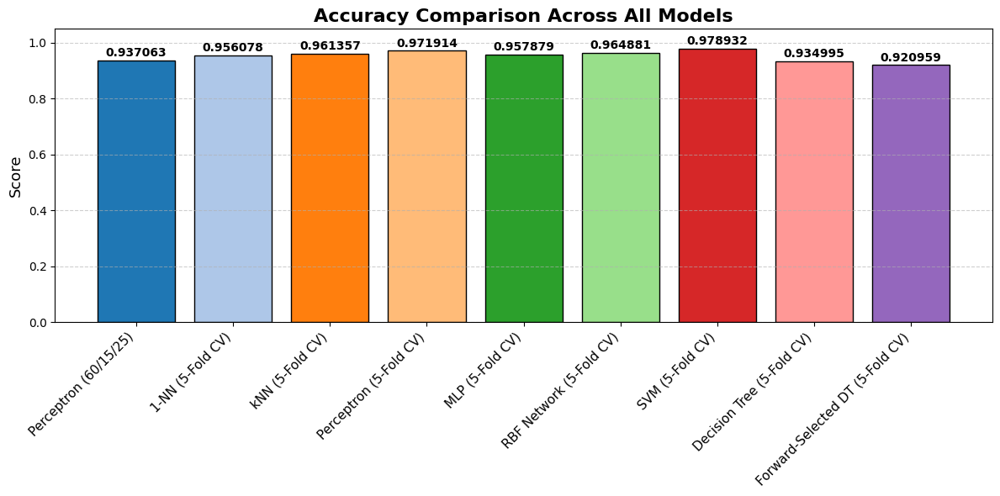

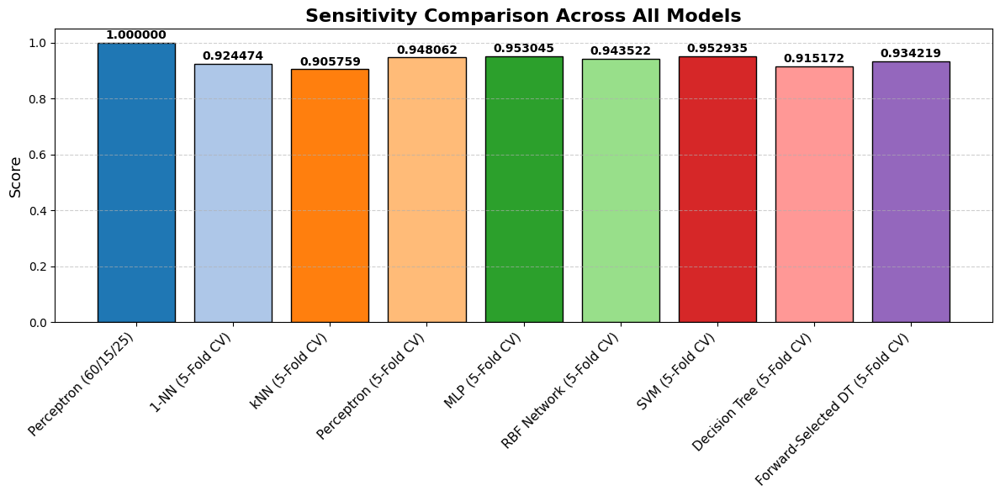

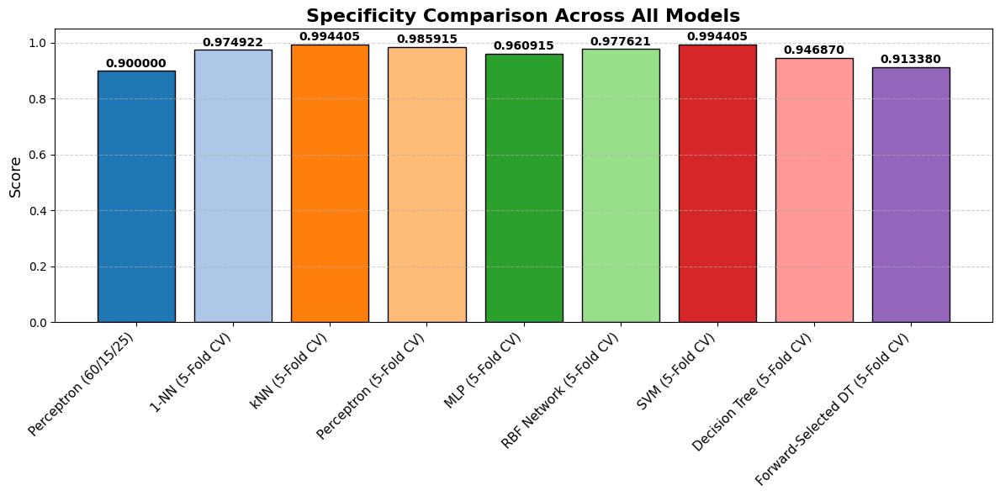

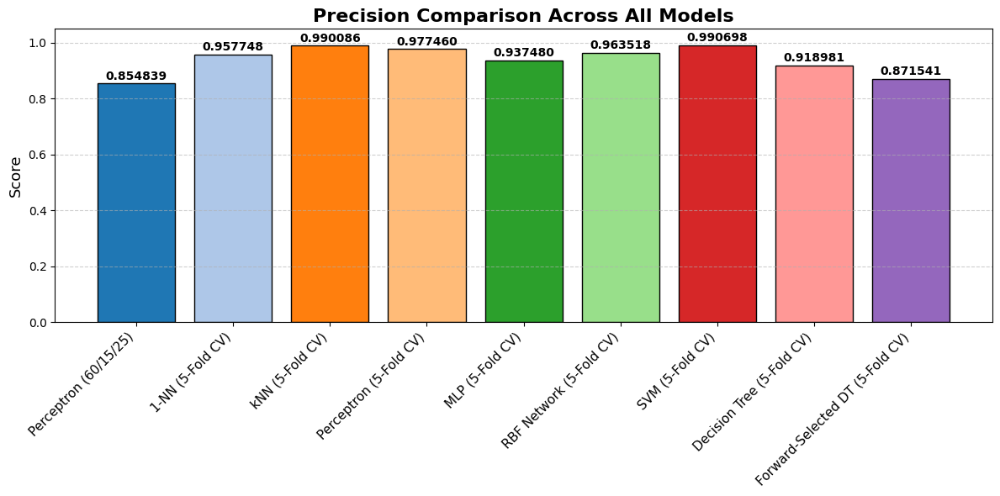

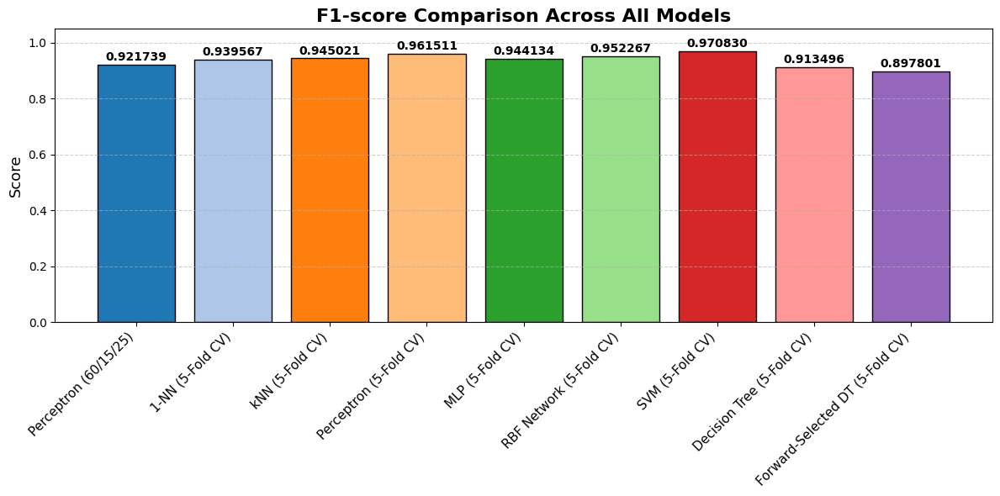

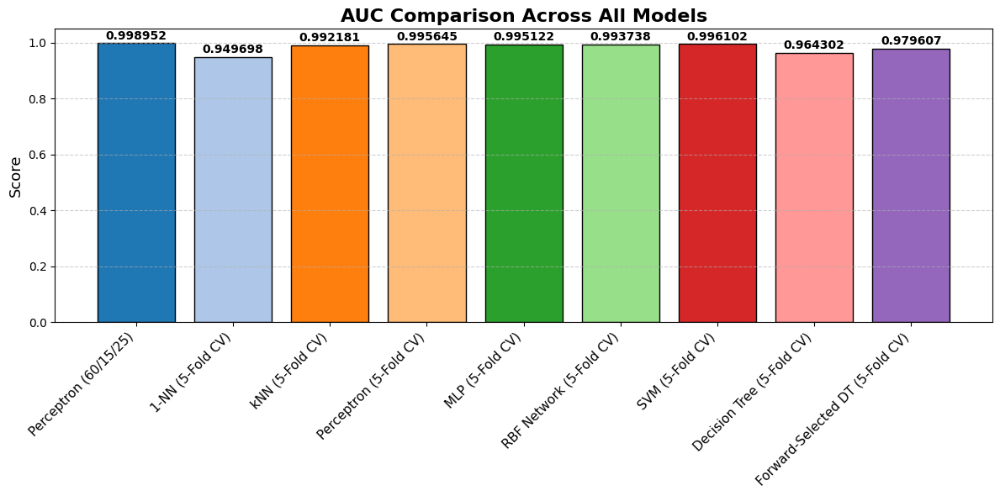

In [105]:
# ============================================================
# BOX 103 — Individual Bar Plots for Each Metric Across All Models
# ============================================================

# ------------------------------------------------------------
# Step 0 — Prepare data
# ------------------------------------------------------------
metrics_to_plot = ["Accuracy", "Sensitivity", "Specificity", "Precision", "F1-score", "AUC"]
metrics_to_plot_mean = [f"{m}_Mean" for m in metrics_to_plot]

# Extract metric data
metric_data = final_comparison_df[["Model"] + metrics_to_plot_mean].set_index("Model")
models = metric_data.index.tolist()
num_models = len(models)

# Color palette (up to 20 models)
colors = plt.cm.tab20.colors[:num_models]

# ------------------------------------------------------------
# Step 1 — Plot each metric separately
# ------------------------------------------------------------
for metric_mean, metric_label in zip(metrics_to_plot_mean, metrics_to_plot):

    plt.figure(figsize=(12, 6))

    # Plot bars
    bars = plt.bar(
        models,
        metric_data[metric_mean].values,
        color=colors,
        edgecolor='black'
    )

    # Annotate each bar with 6-digit precision
    for bar, value in zip(bars, metric_data[metric_mean].values):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            value + 0.005,          # small offset above bar
            f"{value:.6f}",         # 6 decimal digits
            ha="center",
            va="bottom",
            fontsize=10,
            fontweight="bold"
        )

    # Customize plot appearance
    plt.title(f"{metric_label} Comparison Across All Models", fontsize=16, fontweight="bold")
    plt.ylabel("Score", fontsize=13)
    plt.ylim(0, 1.05)
    plt.xticks(rotation=45, ha="right", fontsize=11)
    plt.grid(axis="y", linestyle="--", alpha=0.6)

    plt.tight_layout()
    plt.show()

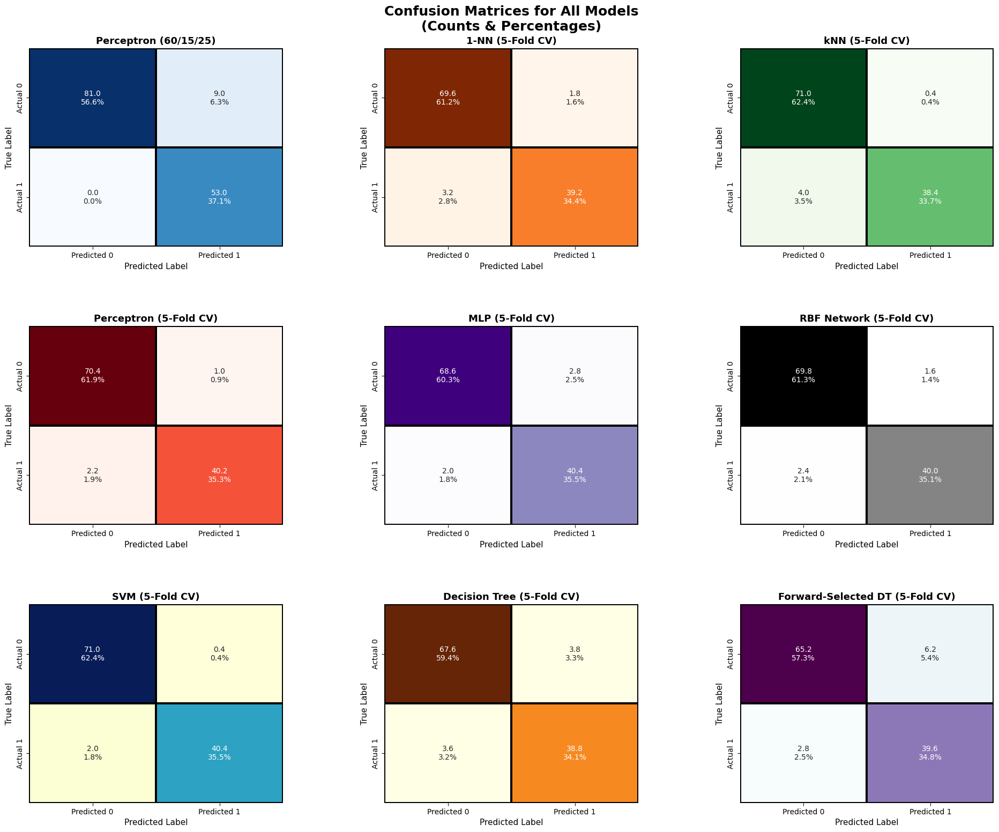

In [106]:
# ============================================================
# BOX 104 — Confusion Matrices for All Models
# ============================================================

# ------------------------------------------------------------
# Step 0 — Prepare confusion matrices for all models
# ------------------------------------------------------------
conf_matrices_dict = {}

# 1) Perceptron Test set (single evaluation)
conf_matrices_dict["Perceptron (60/15/25)"] = np.array([
    [perceptron_test_metrics_df["TN"].iloc[0], perceptron_test_metrics_df["FP"].iloc[0]],
    [perceptron_test_metrics_df["FN"].iloc[0], perceptron_test_metrics_df["TP"].iloc[0]]
])

# 2) Fold-level models: compute mean TP/FP/FN/TN across folds
fold_models = {
    "1-NN (5-Fold CV)": nn1_fold_results_df,
    "kNN (5-Fold CV)": final_knn_fold_results_df,
    "Perceptron (5-Fold CV)": final_perceptron_fold_results_df,
    "MLP (5-Fold CV)": final_mlp_fold_results_df,
    "RBF Network (5-Fold CV)": final_rbf_fold_results_df,
    "SVM (5-Fold CV)": final_svm_fold_results_df,
    "Decision Tree (5-Fold CV)": final_dt_fold_results_df,
    "Forward-Selected DT (5-Fold CV)": final_forward_dt_fold_results_df
}

for name, df in fold_models.items():
    # Ensure columns exist
    required_cols = ["TN", "FP", "FN", "TP"]
    if not all(col in df.columns for col in required_cols):
        raise ValueError(f"Missing confusion columns in {name}: {df.columns.tolist()}")

    # Compute fold-average confusion matrix
    cm_mean = df[required_cols].mean().values.reshape(2,2)
    conf_matrices_dict[name] = cm_mean

# Model order
model_names = list(conf_matrices_dict.keys())

# ------------------------------------------------------------
# Step 1 — Setup subplot grid
# ------------------------------------------------------------
n_models = len(model_names)
n_rows, n_cols = 3, 3  # Fixed layout
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 16))
axes = axes.flatten()

# Distinct colormaps for clarity (up to 9)
cmaps = ["Blues","Oranges","Greens","Reds","Purples","Greys","YlGnBu","YlOrBr","BuPu"]

# ------------------------------------------------------------
# Step 2 — Plot each confusion matrix
# ------------------------------------------------------------
for i, model in enumerate(model_names):
    cm = conf_matrices_dict[model]
    total = cm.sum()
    cm_percent = cm / total * 100  # percentage

    # Annotate with "count\npercent%"
    annot = np.array([
        [f"{cm[r,c]:.1f}\n{cm_percent[r,c]:.1f}%" for c in range(cm.shape[1])]
        for r in range(cm.shape[0])
    ])

    sns.heatmap(
        cm,
        annot=annot,
        fmt='',
        cmap=cmaps[i % len(cmaps)],  # ensure we don't exceed cmap list
        cbar=False,
        ax=axes[i],
        xticklabels=["Predicted 0","Predicted 1"],
        yticklabels=["Actual 0","Actual 1"],
        linewidths=1.5,
        linecolor='black'
    )
    axes[i].set_title(model, fontsize=13, fontweight="bold")
    axes[i].set_xlabel("Predicted Label", fontsize=11)
    axes[i].set_ylabel("True Label", fontsize=11)

# Remove any unused axes
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# ------------------------------------------------------------
# Step 3 — Adjust spacing and show figure
# ------------------------------------------------------------
plt.subplots_adjust(left=0.05, right=0.95, top=0.93, bottom=0.05, wspace=0.4, hspace=0.4)
plt.suptitle("Confusion Matrices for All Models\n(Counts & Percentages)", fontsize=18, fontweight="bold")
plt.show()

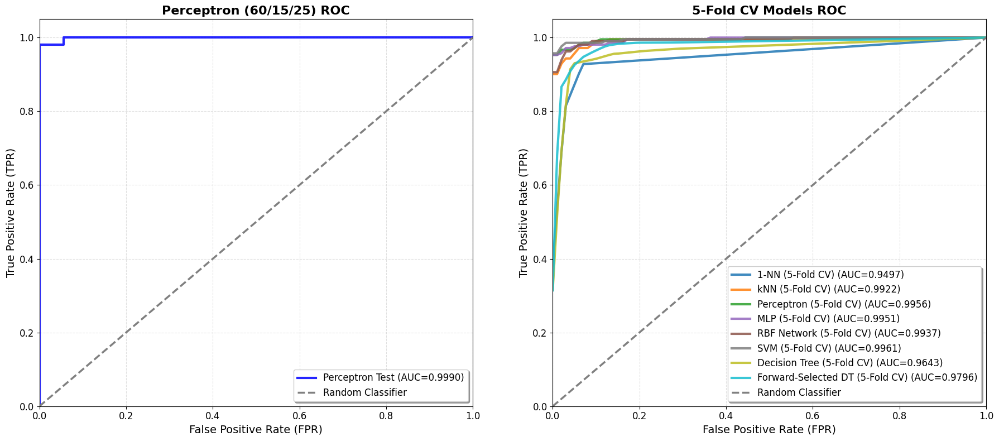

In [107]:
# ============================================================
# BOX 105 — AUC Curves for All Models
# ============================================================

# ------------------------------------------------------------
# Step 0 — Prepare ROC data
# ------------------------------------------------------------
roc_models_dict = {}

# 1) Perceptron Test Set (single evaluation, step ROC)
fpr_perceptron, tpr_perceptron, _ = roc_curve(y_test_b, y_test_score_perceptron)
roc_models_dict["Perceptron (60/15/25)"] = {
    "fpr": fpr_perceptron,
    "tpr": tpr_perceptron,
    "auc": perceptron_test_metrics_df["AUC"].iloc[0]
}

# 2) 5-Fold CV models — mean ROC per model
fold_cv_models = {
    "1-NN (5-Fold CV)": nn1_roc_data,
    "kNN (5-Fold CV)": final_knn_roc_data,
    "Perceptron (5-Fold CV)": final_perceptron_roc_data,
    "MLP (5-Fold CV)": final_mlp_roc_data,
    "RBF Network (5-Fold CV)": final_rbf_roc_data,
    "SVM (5-Fold CV)": final_svm_roc_data,
    "Decision Tree (5-Fold CV)": final_dt_roc_data,
    "Forward-Selected DT (5-Fold CV)": final_forward_dt_roc_data
}

for model_name, fold_list in fold_cv_models.items():
    if not fold_list:
        continue

    # Interpolate each fold to common FPR points
    interp_fpr = np.linspace(0, 1, 100)
    tpr_interp_all = []
    auc_list = []

    for fold_item in fold_list:
        fpr_fold = np.array(fold_item["roc_data"]["fpr"])
        tpr_fold = np.array(fold_item["roc_data"]["tpr"])
        # Keep natural fold shape, interpolate only to common FPR grid
        tpr_interp = np.interp(interp_fpr, fpr_fold, tpr_fold)
        tpr_interp_all.append(tpr_interp)
        auc_list.append(fold_item["roc_data"]["auc"])

    mean_tpr = np.mean(tpr_interp_all, axis=0)
    mean_auc = np.mean(auc_list)

    roc_models_dict[model_name] = {
        "fpr": interp_fpr,
        "tpr": mean_tpr,
        "auc": mean_auc
    }

# ------------------------------------------------------------
# Step 1 — Plot two side-by-side subplots
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# ---------- Left subplot: Perceptron Test ----------
ax = axes[0]
data = roc_models_dict["Perceptron (60/15/25)"]
ax.plot(data["fpr"], data["tpr"], color="blue", linewidth=3, alpha=0.85,
        label=f"Perceptron Test (AUC={data['auc']:.4f})")
ax.plot([0, 1], [0, 1], linestyle="--", color="gray", linewidth=2.5, label="Random Classifier")
ax.set_title("Perceptron (60/15/25) ROC", fontsize=16, fontweight="bold")
ax.set_xlabel("False Positive Rate (FPR)", fontsize=14)
ax.set_ylabel("True Positive Rate (TPR)", fontsize=14)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1.05)
ax.grid(True, linestyle="--", alpha=0.4)
ax.legend(fontsize=12, frameon=True, shadow=True, fancybox=True)
ax.tick_params(axis='both', labelsize=12)

# ---------- Right subplot: 5-Fold CV models ----------
ax = axes[1]
num_models = len(roc_models_dict) - 1  # exclude Perceptron Test
colors = plt.cm.get_cmap('tab10', num_models)
idx = 0
for model_name, data in roc_models_dict.items():
    if model_name == "Perceptron (60/15/25)":
        continue
    ax.plot(data["fpr"], data["tpr"], color=colors(idx), linewidth=3, alpha=0.85,
            label=f"{model_name} (AUC={data['auc']:.4f})")
    idx += 1
ax.plot([0, 1], [0, 1], linestyle="--", color="gray", linewidth=2.5, label="Random Classifier")
ax.set_title("5-Fold CV Models ROC", fontsize=16, fontweight="bold")
ax.set_xlabel("False Positive Rate (FPR)", fontsize=14)
ax.set_ylabel("True Positive Rate (TPR)", fontsize=14)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1.05)
ax.grid(True, linestyle="--", alpha=0.4)
ax.legend(fontsize=12, frameon=True, shadow=True, fancybox=True)
ax.tick_params(axis='both', labelsize=12)

plt.tight_layout(w_pad=5)  # horizontal space between plots
plt.show()